# IMPORTING LIBRARIES

In [82]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
warnings.filterwarnings('ignore', message=".*tf.train.Optimizer.*")
warnings.filterwarnings("ignore", message=".*tf.executing_eagerly_outside_functions.*")
warnings.filterwarnings("ignore")

In [2]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

# LOADING DATA

In [88]:
pd.set_option('display.max_columns',None)

In [89]:
data = pd.read_excel("C:\\Users\\ashiq\\Desktop\\IABAC Project\\Data\\Processed\\Processed_data.xlsx")
data

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,1,2,1,0,0,0,10,3,4,55,3,2,4,1,0,12,4,10,2,2,10,7,0,8,0,1
1,47,1,2,1,0,0,0,14,4,4,42,3,2,1,2,0,12,4,20,2,3,7,7,1,7,0,1
2,40,1,0,0,0,0,1,5,4,4,48,2,3,1,5,1,21,3,20,2,3,18,13,1,12,0,2
3,41,1,5,2,3,7,0,10,4,2,73,2,5,4,3,0,15,2,23,2,2,21,6,12,6,0,1
4,60,1,2,1,0,0,0,16,4,1,84,3,2,1,8,0,14,4,10,1,3,2,2,2,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,27,0,1,2,0,0,1,3,1,4,71,4,2,4,1,1,20,2,6,3,3,6,5,0,4,0,2
1196,37,1,0,1,1,6,0,10,2,4,80,4,1,4,3,0,17,1,4,2,3,1,0,0,0,0,1
1197,50,1,1,0,1,6,0,28,1,4,74,4,1,3,1,1,11,3,20,3,3,20,8,3,8,0,1
1198,34,0,1,1,5,13,0,9,3,4,46,2,3,2,1,0,14,2,9,3,4,8,7,7,7,0,1


# MODEL CREATION

In [4]:
#SPLITTING X AND Y
X=data.drop('PerformanceRating',axis=1)
y=data['PerformanceRating']

In [5]:
data.PerformanceRating.value_counts()

PerformanceRating
1    874
0    194
2    132
Name: count, dtype: int64

- the data is imbalanced

### OVER SAMPLING

In [6]:
os=RandomOverSampler(random_state=10)

In [7]:
X_os,y_os=os.fit_resample(X,y)
X_os.shape,y_os.shape

((2622, 26), (2622,))

## TRAIN TEST SPLIT

##### Without Scaling

In [8]:
X_train,X_test,y_train,y_test=train_test_split(X_os,y_os,test_size=0.75,random_state=10)

##### With Scaling

In [9]:
sc=StandardScaler()

In [10]:
X_sc=sc.fit_transform(X)
X_sc

array([[-0.54145787,  0.80942721,  0.70224212, ..., -0.68137224,
         1.10025139, -0.41733475],
       [ 1.10988772,  0.80942721,  0.70224212, ..., -0.37083419,
         0.8177735 , -0.41733475],
       [ 0.33925978,  0.80942721, -0.86847651, ..., -0.37083419,
         2.23016296, -0.41733475],
       ...,
       [ 1.44015684,  0.80942721, -0.08311719, ...,  0.25024191,
         1.10025139, -0.41733475],
       [-0.32127846, -1.23544154, -0.08311719, ...,  1.49239412,
         0.8177735 , -0.41733475],
       [-1.42217552, -1.23544154, -0.86847651, ..., -0.06029614,
        -1.15957175,  2.39615797]])

In [11]:
X_train1,X_test1,y_train1,y_test1=train_test_split(X_sc,y)

# MODEL1 - RANDOM FOREST

In [12]:
rf=RandomForestClassifier()

In [13]:
rf.fit(X_train,y_train)

RandomForestClassifier()

In [14]:
y_pred_rf2=rf.predict(X_test)

In [15]:
# Test Accuracy of Random Forest Model
print(classification_report(y_test,y_pred_rf2))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96       647
           1       0.94      0.90      0.92       656
           2       0.97      0.96      0.97       664

    accuracy                           0.95      1967
   macro avg       0.95      0.95      0.95      1967
weighted avg       0.95      0.95      0.95      1967



In [16]:
# Tuning the model

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt'] 
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestClassifier(random_state=42)

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=300, cv=3, 
                               verbose=3, random_state=42, n_jobs=-1)

rf_cv.fit(X_train, y_train)
rf_best_params = rf_cv.best_params_
print(f"Best paramters: {rf_best_params})")

Fitting 3 folds for each of 300 candidates, totalling 900 fits


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
450 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
170 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\ashiq\anaconda3\Lib\site-packag

Best paramters: {'n_estimators': 2000, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True})


In [17]:
rf_clf2 = RandomForestClassifier(n_estimators= 2000, min_samples_split= 10, min_samples_leaf= 2,\
                                 max_features= 'sqrt', max_depth= 10, bootstrap= True)
rf_clf2.fit(X_train, y_train) 

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=2000)

In [18]:
y_pred_rfh2=rf_clf2.predict(X_test)

In [19]:
# Test Accuracy of Tuned Random Forest Model
print(classification_report(y_test,y_pred_rfh2))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94       647
           1       0.94      0.88      0.91       656
           2       0.97      0.94      0.95       664

    accuracy                           0.93      1967
   macro avg       0.94      0.94      0.93      1967
weighted avg       0.94      0.93      0.93      1967



# MODEL2 - DECISION TREE

In [20]:
dc=DecisionTreeClassifier()

In [21]:
dc.fit(X_train,y_train)

DecisionTreeClassifier()

In [22]:
y_pred_dc2=dc.predict(X_test)

In [23]:
# Test Accuracy of Decision Tree Model
print(classification_report(y_test,y_pred_dc2))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92       647
           1       0.88      0.87      0.88       656
           2       0.92      0.96      0.94       664

    accuracy                           0.91      1967
   macro avg       0.91      0.91      0.91      1967
weighted avg       0.91      0.91      0.91      1967



In [24]:
# Tuning the model
params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4],    
    "min_samples_leaf":list(range(1, 20)),
}

tree_clf = DecisionTreeClassifier(random_state=3)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=3, cv=3)
tree_cv.fit(X_train,y_train)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params}")

Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


In [25]:
dt1=DecisionTreeClassifier(criterion='entropy',max_depth=9,min_samples_leaf= 1,min_samples_split=2,splitter='best')
dt1.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9)

In [26]:
y_pred_dch2=dt1.predict(X_test)

In [27]:
# Test Accuracy of Tuned Decision Tree Model
print(classification_report(y_test,y_pred_dch2))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92       647
           1       0.90      0.90      0.90       656
           2       0.94      0.97      0.95       664

    accuracy                           0.92      1967
   macro avg       0.92      0.92      0.92      1967
weighted avg       0.92      0.92      0.92      1967



# MODEL 3 - SVM

In [28]:
sv=SVC()

In [29]:
sv.fit(X_train,y_train)

SVC()

In [30]:
y_pred_sv2=sv.predict(X_test)

In [31]:
# Test Accuracy of SVM Model
print(classification_report(y_test,y_pred_sv2))

              precision    recall  f1-score   support

           0       0.63      0.50      0.56       647
           1       0.56      0.60      0.58       656
           2       0.75      0.84      0.79       664

    accuracy                           0.65      1967
   macro avg       0.65      0.65      0.64      1967
weighted avg       0.65      0.65      0.64      1967



In [32]:
# tuning the model
param_grid1 = {'C': [1, 5, 10,30,60,70,100], 
               'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
              } 
model=SVC()
grid = GridSearchCV(model, param_grid1,verbose = 3,scoring='f1',cv=3)

In [33]:
grid.fit(X,y)

Fitting 3 folds for each of 35 candidates, totalling 105 fits
[CV 1/3] END ........................C=1, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ........................C=1, gamma=1;, score=nan total time=   0.1s
[CV 3/3] END ........................C=1, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s
[CV 3/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s
[CV 1/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.0s
[CV 3/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=10, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=10, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=10, gamma=1;, score=nan total time=   0.2s
[CV 1/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s
[CV 3/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.1s
[CV 2/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.1s
[CV 1/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=30, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=30, gamma=1;, score=nan total time=   0.1s
[CV 3/3] END .......................C=30, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.1s
[CV 2/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.0s
[CV 1/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.0s
[CV 3/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.0s
[CV 1/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=60, gamma=1;, score=nan total time=   0.1s
[CV 2/3] END .......................C=60, gamma=1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=60, gamma=1;, score=nan total time=   0.1s
[CV 1/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.0s
[CV 1/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.0s
[CV 3/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.0s
[CV 1/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=70, gamma=1;, score=nan total time=   0.0s
[CV 2/3] END .......................C=70, gamma=1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=70, gamma=1;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.0s
[CV 1/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.0s
[CV 2/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.0s
[CV 1/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ......................C=100, gamma=1;, score=nan total time=   0.0s
[CV 2/3] END ......................C=100, gamma=1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=100, gamma=1;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.0s
[CV 1/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.0s
[CV 2/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.0s
[CV 1/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s


GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [1, 5, 10, 30, 60, 70, 100],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             scoring='f1', verbose=3)

In [34]:
print("Best Parameters of C & Gamma are:",grid.best_params_)

Best Parameters of C & Gamma are: {'C': 1, 'gamma': 1}


In [35]:
clf=SVC(C=1, gamma=1, random_state=42)
clf.fit(X_train, y_train)

SVC(C=1, gamma=1, random_state=42)

In [36]:
y_pred_svh2=clf.predict(X_test)

In [37]:
# Test Accuracy of Tuned SVM Model
print(classification_report(y_test,y_pred_svh2))

              precision    recall  f1-score   support

           0       1.00      0.61      0.76       647
           1       0.63      1.00      0.77       656
           2       1.00      0.79      0.88       664

    accuracy                           0.80      1967
   macro avg       0.88      0.80      0.80      1967
weighted avg       0.88      0.80      0.80      1967



# MODEL 4 - LOGISTIC

In [38]:
lr = LogisticRegression(multi_class="multinomial", solver="lbfgs", max_iter=500)

In [39]:
lr.fit(X_train1,y_train1)

LogisticRegression(max_iter=500, multi_class='multinomial')

In [40]:
y_pred_lr2=lr.predict(X_test1)

In [41]:
# Test Accuracy of Logistic Model
print(classification_report(y_test1,y_pred_lr2))

              precision    recall  f1-score   support

           0       0.73      0.30      0.43        53
           1       0.80      0.94      0.87       214
           2       0.73      0.58      0.64        33

    accuracy                           0.79       300
   macro avg       0.75      0.61      0.65       300
weighted avg       0.78      0.79      0.76       300



In [42]:
# Tuning the Model
param_grid2 = {'C': [1, 5, 10,30,60,70,100], 
              'verbose': [0, 1, 3, 4, 5]
             } 
grid1= GridSearchCV(lr, param_grid2,verbose = 3,scoring='f1',cv=3)

In [43]:
grid1.fit(X_sc,y)

Fitting 3 folds for each of 35 candidates, totalling 105 fits
[CV 1/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

[CV 3/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

[CV 1/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

GridSearchCV(cv=3,
             estimator=LogisticRegression(max_iter=500,
                                          multi_class='multinomial'),
             param_grid={'C': [1, 5, 10, 30, 60, 70, 100],
                         'verbose': [0, 1, 3, 4, 5]},
             scoring='f1', verbose=3)

In [44]:
print("Best Parameters of C & Verbose are:",grid1.best_params_)

Best Parameters of C & Verbose are: {'C': 1, 'verbose': 0}


In [45]:
lrh=LogisticRegression(C= 1,verbose=0, random_state=42)
lrh.fit(X_train1, y_train1)

LogisticRegression(C=1, random_state=42)

In [46]:
y_pred_lrh2=lrh.predict(X_test1)

In [47]:
# Test Accuracy of Tuning Logistic Model
print(classification_report(y_test1,y_pred_lrh2))

              precision    recall  f1-score   support

           0       0.73      0.30      0.43        53
           1       0.80      0.94      0.87       214
           2       0.73      0.58      0.64        33

    accuracy                           0.79       300
   macro avg       0.75      0.61      0.65       300
weighted avg       0.78      0.79      0.76       300



# MODEL 5 - GB

In [48]:
gb=GradientBoostingClassifier()

In [49]:
gb.fit(X_train,y_train)

GradientBoostingClassifier()

In [50]:
y_pred_gb2=gb.predict(X_test)

In [51]:
# Test Accuracy of XG Model
print(classification_report(y_test,y_pred_gb2))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95       647
           1       0.92      0.88      0.90       656
           2       0.95      0.96      0.96       664

    accuracy                           0.93      1967
   macro avg       0.93      0.93      0.93      1967
weighted avg       0.93      0.93      0.93      1967



In [52]:
param_grid3 = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'verbose': [0, 1, 3, 4, 5]
}
grid2= GridSearchCV(estimator=gb, param_grid=param_grid3, scoring='accuracy', cv=5, verbose=1)

In [53]:
grid2.fit(X,y)

Fitting 5 folds for each of 405 candidates, totalling 2025 fits
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6221           0.1578            0.79s
         2           0.5407           0.0815            0.73s
         3           0.4944           0.1219            0.71s
         4           0.4583           0.0920            0.69s
         5           0.4172           0.0269            0.68s
         6           0.3856           0.0304            0.67s
         7           0.3503          -0.0064            0.66s
         8           0.3280           0.0177            0.65s
         9           0.3163           0.0484            0.64s
        10           0.2919          -0.0142            0.64s
        20           0.2005           0.0062            0.56s
        30           0.1420          -0.0306            0.50s
        40           0.1209           0.0314            0.42s
        50           0.1044           0.0082            0.35s
     

        57           0.0936          -0.0083            0.32s
        58           0.0899          -0.0050            0.31s
        59           0.0867          -0.0046            0.30s
        60           0.0863           0.0062            0.29s
        61           0.0889           0.0200            0.29s
        62           0.0878           0.0019            0.28s
        63           0.0868           0.0055            0.27s
        64           0.0844          -0.0035            0.26s
        65           0.0836           0.0044            0.26s
        66           0.0815          -0.0025            0.25s
        67           0.0796           0.0011            0.24s
        68           0.0790           0.0056            0.24s
        69           0.0769          -0.0040            0.23s
        70           0.0755           0.0003            0.22s
        71           0.0766           0.0106            0.22s
        72           0.0719          -0.0127            0.21s
        

        90           0.0665          -0.0041            0.08s
        91           0.0651          -0.0015            0.07s
        92           0.0634          -0.0024            0.06s
        93           0.0697           0.0301            0.05s
        94           0.0630          -0.0228            0.05s
        95           0.0637           0.0069            0.04s
        96           0.0637           0.0043            0.03s
        97           0.0630           0.0007            0.02s
        98           0.0574          -0.0176            0.02s
        99           0.0621           0.0231            0.01s
       100           0.0571          -0.0148            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6481           0.1226            0.69s
         2           0.5667           0.0453            0.68s
         3           0.5164           0.0860            0.68s
         4           0.4822           0.0782            0.67s
       

        35           0.1368           0.0240            0.48s
        36           0.1303          -0.0073            0.47s
        37           0.1342           0.0310            0.47s
        38           0.1194          -0.0487            0.46s
        39           0.1223           0.0256            0.45s
        40           0.1237           0.0176            0.44s
        41           0.1215          -0.0003            0.44s
        42           0.1153          -0.0155            0.43s
        43           0.1147           0.0075            0.42s
        44           0.1109          -0.0039            0.41s
        45           0.1190           0.0405            0.40s
        46           0.1040          -0.0477            0.40s
        47           0.1049           0.0148            0.39s
        48           0.1038           0.0055            0.38s
        49           0.1038           0.0125            0.37s
        50           0.0946          -0.0291            0.37s
        

        77           0.0627          -0.0128            0.17s
        78           0.0680           0.0278            0.16s
        79           0.0620          -0.0184            0.16s
        80           0.0581          -0.0093            0.15s
        81           0.0594           0.0106            0.14s
        82           0.0628           0.0181            0.13s
        83           0.0644           0.0086            0.13s
        84           0.0577          -0.0224            0.12s
        85           0.0622           0.0221            0.11s
        86           0.0543          -0.0282            0.10s
        87           0.0611           0.0318            0.10s
        88           0.0558          -0.0177            0.09s
        89           0.0565           0.0072            0.08s
        90           0.0542          -0.0064            0.07s
        91           0.0565           0.0139            0.07s
        92           0.0557           0.0018            0.06s
        

        19           0.2121          -0.0717            0.57s
        20           0.2203           0.0628            0.57s
        21           0.2066          -0.0289            0.56s
        22           0.2071           0.0254            0.56s
        23           0.2004           0.0061            0.55s
        24           0.1903          -0.0198            0.54s
        25           0.1933           0.0356            0.53s
        26           0.1816          -0.0286            0.52s
        27           0.1801           0.0116            0.52s
        28           0.1756           0.0006            0.51s
        29           0.1765           0.0252            0.50s
        30           0.1789           0.0284            0.49s
        31           0.1668          -0.0245            0.49s
        32           0.1627           0.0025            0.48s
        33           0.1616           0.0145            0.47s
        34           0.1557          -0.0084            0.46s
        

        55           0.1248           0.0288            0.37s
        56           0.1274           0.0157            0.36s
        57           0.1166          -0.0331            0.35s
        58           0.1159           0.0074            0.35s
        59           0.1171           0.0135            0.34s
        60           0.1132          -0.0033            0.33s
        61           0.1134           0.0078            0.32s
        62           0.1135           0.0087            0.31s
        63           0.1053          -0.0253            0.30s
        64           0.1091           0.0246            0.30s
        65           0.1055          -0.0040            0.29s
        66           0.1012          -0.0113            0.28s
        67           0.1053           0.0225            0.27s
        68           0.1036          -0.0021            0.26s
        69           0.1017           0.0004            0.25s
        70           0.0973          -0.0097            0.25s
        

        94           0.0471          -0.0222            0.05s
        95           0.0488           0.0116            0.04s
        96           0.0514           0.0151            0.03s
        97           0.0488          -0.0054            0.02s
        98           0.0510           0.0108            0.02s
        99           0.0456          -0.0185            0.01s
       100           0.0471           0.0087            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6340           0.1217            0.69s
         2           0.5599           0.1168            0.68s
         3           0.4901           0.0284            0.68s
         4           0.4444           0.0563            0.67s
         5           0.4113           0.0586            0.66s
         6           0.3769           0.0176            0.66s
         7           0.3457           0.0057            0.65s
         8           0.3267           0.0347            0.64s
       

        40           0.1285           0.0258            0.42s
        41           0.1261           0.0040            0.41s
        42           0.1128          -0.0431            0.41s
        43           0.1188           0.0362            0.40s
        44           0.1161          -0.0001            0.39s
        45           0.1133          -0.0027            0.38s
        46           0.1128           0.0036            0.38s
        47           0.1123           0.0069            0.37s
        48           0.1140           0.0159            0.36s
        49           0.1046          -0.0284            0.36s
        50           0.1055           0.0138            0.35s
        51           0.1043           0.0054            0.34s
        52           0.0985          -0.0142            0.34s
        53           0.0948          -0.0034            0.33s
        54           0.0941           0.0055            0.32s
        55           0.0976           0.0206            0.31s
        

        85           0.0787           0.0253            0.11s
        86           0.0773          -0.0001            0.10s
        87           0.0709          -0.0182            0.09s
        88           0.0705           0.0025            0.09s
        89           0.0685          -0.0045            0.08s
        90           0.0710           0.0143            0.07s
        91           0.0694          -0.0016            0.06s
        92           0.0671          -0.0050            0.06s
        93           0.0654          -0.0036            0.05s
        94           0.0684           0.0173            0.04s
        95           0.0613          -0.0258            0.04s
        96           0.0627           0.0098            0.03s
        97           0.0637           0.0080            0.02s
        98           0.0620          -0.0030            0.01s
        99           0.0609          -0.0003            0.01s
       100           0.0604           0.0014            0.00s
      It

        23           0.1814           0.0042            0.58s
        24           0.1693          -0.0270            0.58s
        25           0.1746           0.0409            0.57s
        26           0.1605          -0.0344            0.56s
        27           0.1650           0.0491            0.55s
        28           0.1564          -0.0200            0.54s
        29           0.1488          -0.0184            0.53s
        30           0.1535           0.0348            0.52s
        31           0.1527           0.0129            0.51s
        32           0.1524           0.0122            0.50s
        33           0.1432          -0.0246            0.50s
        34           0.1461           0.0310            0.49s
        35           0.1424          -0.0030            0.48s
        36           0.1375          -0.0046            0.47s
        37           0.1276          -0.0266            0.47s
        38           0.1248           0.0028            0.46s
        

        66           0.0853           0.0162            0.26s
        67           0.0749          -0.0373            0.26s
        68           0.0795           0.0255            0.25s
        69           0.0748          -0.0122            0.24s
        70           0.0771           0.0151            0.23s
        71           0.0764           0.0033            0.22s
        72           0.0775           0.0065            0.22s
        73           0.0750          -0.0059            0.21s
        74           0.0711          -0.0108            0.20s
        75           0.0746           0.0208            0.19s
        76           0.0681          -0.0183            0.18s
        77           0.0664          -0.0004            0.18s
        78           0.0705           0.0225            0.17s
        79           0.0663          -0.0116            0.16s
        80           0.0661           0.0052            0.15s
        81           0.0670           0.0081            0.15s
        

         8           0.3354           0.1070            0.69s
         9           0.3090          -0.0487            0.68s
        10           0.2921           0.0136            0.68s
        11           0.2813           0.0499            0.67s
        12           0.2606          -0.0601            0.66s
        13           0.2602           0.1105            0.65s
        14           0.2477          -0.0095            0.65s
        15           0.2349          -0.0290            0.64s
        16           0.2250           0.0078            0.63s
        17           0.2172           0.0101            0.62s
        18           0.2088          -0.0080            0.61s
        19           0.2087           0.0655            0.61s
        20           0.2001          -0.0106            0.60s
        21           0.1914          -0.0136            0.59s
        22           0.1848          -0.0059            0.58s
        23           0.1829           0.0427            0.57s
        

        49           0.1275           0.0064            0.37s
        50           0.1179          -0.0646            0.37s
        51           0.1155          -0.0043            0.36s
        52           0.1154           0.0128            0.35s
        53           0.1145           0.0110            0.34s
        54           0.1112          -0.0145            0.34s
        55           0.1130           0.0359            0.33s
        56           0.1082          -0.0312            0.32s
        57           0.1037          -0.0210            0.31s
        58           0.1108           0.0763            0.31s
        59           0.1036          -0.0455            0.30s
        60           0.1056           0.0367            0.29s
        61           0.1026          -0.0105            0.28s
        62           0.0966          -0.0327            0.28s
        63           0.0971           0.0207            0.27s
        64           0.0942          -0.0120            0.26s
        

        93           0.0784           0.0254            0.05s
        94           0.0755          -0.0150            0.04s
        95           0.0736          -0.0051            0.04s
        96           0.0741           0.0150            0.03s
        97           0.0725          -0.0028            0.02s
        98           0.0726           0.0090            0.01s
        99           0.0706          -0.0093            0.01s
       100           0.0692          -0.0024            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6358           0.1236            0.79s
         2           0.5473           0.0256            0.73s
         3           0.4846           0.0499            0.71s
         4           0.4379           0.0559            0.72s
         5           0.4108           0.1409            0.72s
         6           0.3746          -0.0056            0.72s
         7           0.3448           0.0016            0.70s
       

        31           0.1523           0.0576            0.51s
        32           0.1435          -0.0450            0.50s
        33           0.1462           0.0549            0.49s
        34           0.1380          -0.0528            0.49s
        35           0.1333          -0.0065            0.48s
        36           0.1353           0.0423            0.47s
        37           0.1316          -0.0095            0.46s
        38           0.1316           0.0320            0.45s
        39           0.1205          -0.0769            0.45s
        40           0.1180           0.0025            0.44s
        41           0.1254           0.0887            0.43s
        42           0.1179          -0.0432            0.42s
        43           0.1200           0.0374            0.42s
        44           0.1113          -0.0573            0.41s
        45           0.1146           0.0493            0.40s
        46           0.1082          -0.0376            0.39s
        

        74           0.0672           0.0073            0.19s
        75           0.0715           0.0477            0.18s
        76           0.0645          -0.0507            0.18s
        77           0.0660           0.0186            0.17s
        78           0.0637          -0.0145            0.16s
        79           0.0651           0.0248            0.15s
        80           0.0639          -0.0009            0.15s
        81           0.0634           0.0042            0.14s
        82           0.0631           0.0063            0.13s
        83           0.0630           0.0108            0.12s
        84           0.0597          -0.0197            0.12s
        85           0.0566          -0.0189            0.11s
        86           0.0578           0.0198            0.10s
        87           0.0580           0.0084            0.10s
        88           0.0577           0.0062            0.09s
        89           0.0548          -0.0166            0.08s
        

        17           0.2521           0.0307            0.62s
        18           0.2443           0.0068            0.61s
        19           0.2337          -0.0327            0.60s
        20           0.2278           0.0140            0.59s
        21           0.2092          -0.1101            0.59s
        22           0.2158           0.1012            0.58s
        23           0.2137           0.0226            0.57s
        24           0.2037          -0.0556            0.56s
        25           0.2023           0.0326            0.56s
        26           0.1964          -0.0157            0.55s
        27           0.1988           0.0551            0.54s
        28           0.1942          -0.0030            0.53s
        29           0.1889          -0.0068            0.52s
        30           0.1867           0.0043            0.52s
        31           0.1855           0.0249            0.51s
        32           0.1832           0.0075            0.50s
        

        64           0.0812           0.0119            0.26s
        65           0.0762          -0.0322            0.26s
        66           0.0765           0.0200            0.25s
        67           0.0782           0.0275            0.24s
        68           0.0772           0.0057            0.23s
        69           0.0763           0.0002            0.23s
        70           0.0744          -0.0053            0.22s
        71           0.0752           0.0182            0.21s
        72           0.0730          -0.0072            0.20s
        73           0.0724           0.0051            0.20s
        74           0.0707          -0.0030            0.19s
        75           0.0669          -0.0218            0.18s
        76           0.0671           0.0149            0.18s
        77           0.0666           0.0071            0.17s
        78           0.0620          -0.0272            0.16s
        79           0.0624           0.0151            0.15s
        

         4           0.4555           0.1553            0.72s
         5           0.4059          -0.0693            0.70s
         6           0.3859           0.1375            0.70s
         7           0.3558           0.0007            0.69s
         8           0.3305          -0.0058            0.69s
         9           0.3098          -0.0000            0.68s
        10           0.2973           0.0556            0.67s
        11           0.2787          -0.0322            0.66s
        12           0.2572          -0.0561            0.66s
        13           0.2607           0.1366            0.65s
        14           0.2426          -0.0539            0.64s
        15           0.2319           0.0104            0.63s
        16           0.2243           0.0295            0.62s
        17           0.2217           0.0590            0.62s
        18           0.2142          -0.0038            0.61s
        19           0.2050          -0.0052            0.60s
        

        45           0.1338          -0.0031            0.40s
        46           0.1280          -0.0285            0.40s
        47           0.1290           0.0357            0.39s
        48           0.1259          -0.0107            0.38s
        49           0.1271           0.0307            0.37s
        50           0.1222          -0.0278            0.37s
        51           0.1144          -0.0533            0.36s
        52           0.1188           0.0559            0.35s
        53           0.1151          -0.0141            0.34s
        54           0.1154           0.0228            0.34s
        55           0.1145           0.0124            0.33s
        56           0.1100          -0.0251            0.32s
        57           0.1087           0.0043            0.31s
        58           0.1078           0.0127            0.31s
        59           0.1055          -0.0028            0.30s
        60           0.1041           0.0050            0.29s
        

        86           0.0808          -0.0047            0.10s
        87           0.0805           0.0094            0.09s
        88           0.0801           0.0096            0.09s
        89           0.0735          -0.0486            0.08s
        90           0.0793           0.0585            0.07s
        91           0.0762          -0.0185            0.07s
        92           0.0753           0.0028            0.06s
        93           0.0765           0.0235            0.05s
        94           0.0722          -0.0318            0.04s
        95           0.0701          -0.0096            0.04s
        96           0.0708           0.0182            0.03s
        97           0.0702           0.0047            0.02s
        98           0.0714           0.0201            0.01s
        99           0.0686          -0.0178            0.01s
       100           0.0662          -0.0093            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

        28           0.1570           0.0178            0.53s
        29           0.1519          -0.0122            0.52s
        30           0.1562           0.0599            0.51s
        31           0.1517          -0.0110            0.51s
        32           0.1523           0.0371            0.50s
        33           0.1480          -0.0082            0.49s
        34           0.1422          -0.0237            0.48s
        35           0.1374          -0.0114            0.48s
        36           0.1379           0.0330            0.47s
        37           0.1240          -0.0839            0.46s
        38           0.1244           0.0283            0.46s
        39           0.1244           0.0202            0.45s
        40           0.1246           0.0194            0.44s
        41           0.1225           0.0059            0.43s
        42           0.1148          -0.0480            0.43s
        43           0.1221           0.0802            0.42s
        

        20           0.1957            0.61s
        30           0.1544            0.53s
        40           0.1273            0.45s
        50           0.1090            0.37s
        60           0.0927            0.30s
        70           0.0807            0.22s
        80           0.0708            0.15s
        90           0.0617            0.07s
       100           0.0545            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6373            0.69s
         2           0.5563            0.73s
         3           0.4970            0.71s
         4           0.4504            0.72s
         5           0.4133            0.70s
         6           0.3817            0.70s
         7           0.3551            0.69s
         8           0.3325            0.69s
         9           0.3133            0.69s
        10           0.2968            0.68s
        11           0.2825            0.67s
        12           0.2695            0.67s
        1

        99           0.0643            0.01s
       100           0.0632            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6495            0.79s
         2           0.5744            0.78s
         3           0.5185            0.74s
         4           0.4748            0.77s
         5           0.4392            0.80s
         6           0.4096            0.78s
         7           0.3846            0.76s
         8           0.3632            0.75s
         9           0.3448            0.73s
        10           0.3286            0.72s
        11           0.3143            0.70s
        12           0.3017            0.70s
        13           0.2908            0.69s
        14           0.2781            0.67s
        15           0.2684            0.67s
        16           0.2598            0.65s
        17           0.2518            0.65s
        18           0.2448            0.64s
        19           0.2382            0.63s
        2

        89           0.0559            0.09s
        90           0.0550            0.08s
        91           0.0543            0.07s
        92           0.0535            0.06s
        93           0.0527            0.05s
        94           0.0521            0.05s
        95           0.0513            0.04s
        96           0.0504            0.03s
        97           0.0497            0.02s
        98           0.0492            0.02s
        99           0.0484            0.01s
       100           0.0480            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6339            0.69s
         2           0.5521            0.73s
         3           0.4920            0.74s
         4           0.4453            0.74s
         5           0.4078            0.72s
         6           0.3765            0.72s
         7           0.3500            0.72s
         8           0.3276            0.71s
         9           0.3082            0.71s
        1

        83           0.0629            0.13s
        84           0.0622            0.12s
        85           0.0607            0.11s
        86           0.0599            0.11s
        87           0.0586            0.10s
        88           0.0579            0.09s
        89           0.0573            0.08s
        90           0.0561            0.08s
        91           0.0553            0.07s
        92           0.0545            0.06s
        93           0.0534            0.05s
        94           0.0528            0.05s
        95           0.0520            0.04s
        96           0.0514            0.03s
        97           0.0504            0.02s
        98           0.0497            0.02s
        99           0.0490            0.01s
       100           0.0483            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6449            0.69s
         2           0.5677            0.73s
         3           0.5109            0.71s
         

        77           0.0993            0.17s
        78           0.0981            0.16s
        79           0.0970            0.16s
        80           0.0957            0.15s
        81           0.0942            0.14s
        82           0.0933            0.13s
        83           0.0924            0.13s
        84           0.0911            0.12s
        85           0.0901            0.11s
        86           0.0887            0.10s
        87           0.0876            0.10s
        88           0.0866            0.09s
        89           0.0858            0.08s
        90           0.0843            0.07s
        91           0.0831            0.07s
        92           0.0820            0.06s
        93           0.0809            0.05s
        94           0.0796            0.04s
        95           0.0783            0.04s
        96           0.0771            0.03s
        97           0.0761            0.02s
        98           0.0752            0.01s
        99

        69           0.0820            0.23s
        70           0.0807            0.23s
        71           0.0800            0.22s
        72           0.0786            0.21s
        73           0.0774            0.20s
        74           0.0760            0.20s
        75           0.0752            0.19s
        76           0.0742            0.18s
        77           0.0734            0.17s
        78           0.0726            0.16s
        79           0.0716            0.16s
        80           0.0708            0.15s
        81           0.0696            0.14s
        82           0.0688            0.13s
        83           0.0678            0.13s
        84           0.0670            0.12s
        85           0.0659            0.11s
        86           0.0648            0.10s
        87           0.0638            0.10s
        88           0.0629            0.09s
        89           0.0623            0.08s
        90           0.0617            0.07s
        91

        62           0.1064            0.29s
        63           0.1048            0.28s
        64           0.1036            0.27s
        65           0.1023            0.27s
        66           0.1008            0.26s
        67           0.0991            0.25s
        68           0.0979            0.24s
        69           0.0963            0.24s
        70           0.0952            0.23s
        71           0.0938            0.22s
        72           0.0927            0.21s
        73           0.0916            0.20s
        74           0.0902            0.20s
        75           0.0888            0.19s
        76           0.0878            0.18s
        77           0.0867            0.17s
        78           0.0856            0.17s
        79           0.0842            0.16s
        80           0.0829            0.15s
        81           0.0816            0.14s
        82           0.0804            0.14s
        83           0.0796            0.13s
        84

        56           0.0949            0.33s
        57           0.0936            0.32s
        58           0.0915            0.32s
        59           0.0901            0.31s
        60           0.0882            0.30s
        61           0.0865            0.29s
        62           0.0850            0.29s
        63           0.0835            0.28s
        64           0.0820            0.27s
        65           0.0808            0.26s
        66           0.0794            0.26s
        67           0.0779            0.25s
        68           0.0769            0.24s
        69           0.0756            0.23s
        70           0.0748            0.23s
        71           0.0738            0.22s
        72           0.0727            0.21s
        73           0.0715            0.20s
        74           0.0704            0.20s
        75           0.0691            0.19s
        76           0.0684            0.18s
        77           0.0674            0.17s
        78

        30           0.1662          -0.0414            1.18s
        40           0.1387           0.0144            1.11s
        50           0.1263           0.0248            1.04s
        60           0.1058           0.0426            0.97s
        70           0.0894           0.0039            0.90s
        80           0.0739          -0.0037            0.83s
        90           0.0699           0.0106            0.76s
       100           0.0565          -0.0067            0.69s
       200           0.0163          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6559           0.1188            1.39s
         2           0.5781           0.0654            1.38s
         3           0.5139           0.0287            1.38s
         4           0.4672           0.0374            1.37s
         5           0.4325           0.0377            1.36s
         6           0.4137           0.0696            1.35s
       

        89           0.0542          -0.0017            0.77s
        90           0.0534          -0.0005            0.77s
        91           0.0478          -0.0176            0.76s
        92           0.0514           0.0184            0.76s
        93           0.0506          -0.0002            0.75s
        94           0.0512           0.0052            0.74s
        95           0.0507           0.0005            0.73s
        96           0.0497          -0.0010            0.73s
        97           0.0494           0.0023            0.72s
        98           0.0492           0.0027            0.71s
        99           0.0466          -0.0076            0.71s
       100           0.0467           0.0036            0.70s
       101           0.0430          -0.0107            0.69s
       102           0.0452           0.0125            0.68s
       103           0.0437          -0.0021            0.68s
       104           0.0427          -0.0007            0.67s
       1

        36           0.1474           0.0165            1.15s
        37           0.1529           0.0418            1.14s
        38           0.1501           0.0011            1.13s
        39           0.1426          -0.0178            1.13s
        40           0.1399           0.0009            1.12s
        41           0.1269          -0.0367            1.11s
        42           0.1313           0.0270            1.11s
        43           0.1316           0.0101            1.10s
        44           0.1202          -0.0343            1.09s
        45           0.1272           0.0398            1.08s
        46           0.1228          -0.0096            1.08s
        47           0.1197          -0.0004            1.07s
        48           0.1215           0.0191            1.06s
        49           0.1165          -0.0086            1.06s
        50           0.1179           0.0110            1.05s
        51           0.1163           0.0020            1.04s
        

       190           0.0199           0.0005            0.07s
       191           0.0192          -0.0016            0.06s
       192           0.0178          -0.0039            0.06s
       193           0.0197           0.0082            0.05s
       194           0.0188          -0.0024            0.04s
       195           0.0188           0.0007            0.03s
       196           0.0176          -0.0032            0.03s
       197           0.0181           0.0029            0.02s
       198           0.0183           0.0018            0.01s
       199           0.0170          -0.0044            0.01s
       200           0.0182           0.0058            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6397           0.1238            1.39s
         2           0.5614           0.0701            1.48s
         3           0.5281           0.1438            1.51s
         4           0.4754           0.0144            1.47s
       

       139           0.0402          -0.0024            0.43s
       140           0.0412           0.0071            0.42s
       141           0.0411           0.0026            0.41s
       142           0.0408           0.0011            0.41s
       143           0.0388          -0.0052            0.40s
       144           0.0360          -0.0081            0.39s
       145           0.0385           0.0126            0.38s
       146           0.0383           0.0014            0.38s
       147           0.0350          -0.0106            0.37s
       148           0.0368           0.0096            0.36s
       149           0.0348          -0.0056            0.36s
       150           0.0362           0.0077            0.35s
       151           0.0360           0.0015            0.34s
       152           0.0361           0.0029            0.34s
       153           0.0343          -0.0049            0.33s
       154           0.0325          -0.0052            0.32s
       1

        86           0.0589           0.0072            0.79s
        87           0.0580           0.0019            0.78s
        88           0.0543          -0.0117            0.77s
        89           0.0524          -0.0039            0.77s
        90           0.0527           0.0048            0.76s
        91           0.0535           0.0071            0.75s
        92           0.0524           0.0013            0.75s
        93           0.0533           0.0077            0.74s
        94           0.0497          -0.0110            0.73s
        95           0.0493           0.0017            0.73s
        96           0.0515           0.0119            0.72s
        97           0.0493          -0.0062            0.71s
        98           0.0483          -0.0009            0.71s
        99           0.0476           0.0004            0.70s
       100           0.0484           0.0066            0.69s
       101           0.0473          -0.0014            0.68s
       1

        37           0.1307          -0.0340            1.13s
        38           0.1197          -0.0333            1.13s
        39           0.1278           0.0462            1.12s
        40           0.1193          -0.0211            1.11s
        41           0.1217           0.0184            1.10s
        42           0.1159          -0.0076            1.10s
        43           0.1125          -0.0030            1.09s
        44           0.1149           0.0201            1.08s
        45           0.1117          -0.0074            1.07s
        46           0.1116           0.0106            1.07s
        47           0.1051          -0.0177            1.06s
        48           0.1145           0.0453            1.05s
        49           0.1092          -0.0117            1.04s
        50           0.1028          -0.0151            1.04s
        51           0.1083           0.0331            1.03s
        52           0.1025          -0.0130            1.02s
        

       185           0.0162          -0.0033            0.10s
       186           0.0166           0.0026            0.10s
       187           0.0162          -0.0007            0.09s
       188           0.0152          -0.0028            0.08s
       189           0.0159           0.0035            0.08s
       190           0.0152          -0.0016            0.07s
       191           0.0154           0.0012            0.06s
       192           0.0151          -0.0005            0.06s
       193           0.0155           0.0024            0.05s
       194           0.0150          -0.0010            0.04s
       195           0.0142          -0.0023            0.03s
       196           0.0139          -0.0001            0.03s
       197           0.0139           0.0003            0.02s
       198           0.0136           0.0004            0.01s
       199           0.0139           0.0017            0.01s
       200           0.0130          -0.0030            0.00s
      It

       130           0.0324           0.0110            0.49s
       131           0.0308          -0.0043            0.48s
       132           0.0315           0.0047            0.47s
       133           0.0309          -0.0002            0.47s
       134           0.0284          -0.0074            0.46s
       135           0.0286           0.0030            0.45s
       136           0.0292           0.0038            0.45s
       137           0.0305           0.0068            0.44s
       138           0.0281          -0.0070            0.43s
       139           0.0287           0.0047            0.42s
       140           0.0272          -0.0039            0.42s
       141           0.0268          -0.0001            0.41s
       142           0.0260          -0.0016            0.40s
       143           0.0271           0.0060            0.40s
       144           0.0274           0.0036            0.39s
       145           0.0265          -0.0019            0.38s
       1

        74           0.0828          -0.0120            0.88s
        75           0.0859           0.0192            0.87s
        76           0.0830          -0.0066            0.86s
        77           0.0805          -0.0029            0.86s
        78           0.0786          -0.0036            0.85s
        79           0.0814           0.0160            0.84s
        80           0.0739          -0.0238            0.83s
        81           0.0778           0.0218            0.83s
        82           0.0780           0.0040            0.82s
        83           0.0725          -0.0185            0.81s
        84           0.0771           0.0238            0.81s
        85           0.0748          -0.0032            0.80s
        86           0.0727          -0.0026            0.80s
        87           0.0704          -0.0034            0.79s
        88           0.0718           0.0103            0.78s
        89           0.0704          -0.0014            0.77s
        

        23           0.2125           0.0217            1.24s
        24           0.2179           0.0439            1.23s
        25           0.1965          -0.0637            1.22s
        26           0.2032           0.0496            1.21s
        27           0.2009           0.0152            1.21s
        28           0.1997           0.0112            1.19s
        29           0.2016           0.0242            1.19s
        30           0.1848          -0.0494            1.20s
        31           0.1854           0.0183            1.19s
        32           0.1825           0.0027            1.18s
        33           0.1812           0.0042            1.17s
        34           0.1823           0.0242            1.16s
        35           0.1715          -0.0246            1.16s
        36           0.1720           0.0164            1.15s
        37           0.1681          -0.0014            1.14s
        38           0.1532          -0.0450            1.14s
        

       172           0.0280          -0.0017            0.19s
       173           0.0279           0.0017            0.19s
       174           0.0276          -0.0002            0.18s
       175           0.0274           0.0010            0.17s
       176           0.0240          -0.0116            0.17s
       177           0.0269           0.0132            0.16s
       178           0.0265           0.0000            0.15s
       179           0.0247          -0.0056            0.15s
       180           0.0262           0.0077            0.14s
       181           0.0239          -0.0074            0.13s
       182           0.0255           0.0084            0.13s
       183           0.0253           0.0006            0.12s
       184           0.0240          -0.0039            0.11s
       185           0.0227          -0.0035            0.10s
       186           0.0231           0.0031            0.10s
       187           0.0241           0.0053            0.09s
       1

       121           0.0340          -0.0036            0.55s
       122           0.0342           0.0033            0.54s
       123           0.0336           0.0003            0.53s
       124           0.0308          -0.0083            0.53s
       125           0.0299          -0.0014            0.52s
       126           0.0322           0.0119            0.51s
       127           0.0313          -0.0016            0.51s
       128           0.0316           0.0037            0.50s
       129           0.0309          -0.0004            0.49s
       130           0.0295          -0.0029            0.48s
       131           0.0295           0.0019            0.48s
       132           0.0278          -0.0043            0.47s
       133           0.0294           0.0093            0.46s
       134           0.0299           0.0040            0.46s
       135           0.0289          -0.0025            0.45s
       136           0.0282          -0.0007            0.44s
       1

        71           0.0686          -0.0165            0.90s
        72           0.0748           0.0290            0.89s
        73           0.0664          -0.0273            0.88s
        74           0.0702           0.0201            0.87s
        75           0.0695           0.0025            0.87s
        76           0.0669          -0.0042            0.86s
        77           0.0676           0.0073            0.85s
        78           0.0643          -0.0079            0.85s
        79           0.0655           0.0087            0.84s
        80           0.0655           0.0049            0.83s
        81           0.0643          -0.0009            0.83s
        82           0.0631           0.0004            0.82s
        83           0.0631           0.0030            0.81s
        84           0.0563          -0.0225            0.80s
        85           0.0598           0.0189            0.80s
        86           0.0573          -0.0046            0.79s
        

        22           0.1868           0.0143            1.27s
        23           0.1710          -0.0339            1.26s
        24           0.1724           0.0329            1.25s
        25           0.1752           0.0311            1.24s
        26           0.1718           0.0062            1.23s
        27           0.1722           0.0253            1.23s
        28           0.1625          -0.0168            1.22s
        29           0.1580          -0.0010            1.21s
        30           0.1518          -0.0093            1.20s
        31           0.1506           0.0133            1.20s
        32           0.1424          -0.0191            1.19s
        33           0.1406           0.0080            1.18s
        34           0.1325          -0.0172            1.17s
        35           0.1324           0.0148            1.16s
        36           0.1355           0.0258            1.15s
        37           0.1378           0.0253            1.15s
        

       168           0.0177          -0.0003            0.23s
       169           0.0188           0.0055            0.22s
       170           0.0189           0.0017            0.21s
       171           0.0173          -0.0054            0.21s
       172           0.0179           0.0033            0.20s
       173           0.0176          -0.0000            0.19s
       174           0.0172          -0.0005            0.18s
       175           0.0171           0.0010            0.18s
       176           0.0162          -0.0021            0.17s
       177           0.0166           0.0026            0.16s
       178           0.0165           0.0008            0.16s
       179           0.0157          -0.0022            0.15s
       180           0.0157           0.0013            0.14s
       181           0.0144          -0.0037            0.13s
       182           0.0155           0.0051            0.13s
       183           0.0157           0.0022            0.12s
       1

       115           0.0484          -0.0047            0.60s
       116           0.0474          -0.0014            0.59s
       117           0.0462          -0.0018            0.58s
       118           0.0456           0.0020            0.58s
       119           0.0477           0.0111            0.57s
       120           0.0459          -0.0041            0.56s
       121           0.0415          -0.0136            0.56s
       122           0.0457           0.0208            0.55s
       123           0.0430          -0.0069            0.54s
       124           0.0439           0.0062            0.53s
       125           0.0408          -0.0099            0.53s
       126           0.0424           0.0095            0.52s
       127           0.0412          -0.0023            0.51s
       128           0.0423           0.0070            0.51s
       129           0.0411          -0.0024            0.50s
       130           0.0394          -0.0042            0.49s
       1

        59           0.1109          -0.0296            1.01s
        60           0.1101           0.0076            1.00s
        61           0.1131           0.0160            1.00s
        62           0.1052          -0.0257            0.99s
        63           0.1112           0.0301            0.98s
        64           0.1103           0.0042            0.97s
        65           0.1028          -0.0194            0.97s
        66           0.0983          -0.0103            0.96s
        67           0.0981           0.0060            0.95s
        68           0.1009           0.0178            0.94s
        69           0.0974          -0.0065            0.94s
        70           0.0959           0.0030            0.93s
        71           0.0975           0.0112            0.92s
        72           0.0951          -0.0052            0.91s
        73           0.0960           0.0115            0.91s
        74           0.0940          -0.0024            0.90s
        

        10           0.2853           0.0102            1.33s
        11           0.2707           0.0034            1.32s
        12           0.2606           0.0222            1.31s
        13           0.2538           0.0316            1.31s
        14           0.2451           0.0056            1.30s
        15           0.2273          -0.0301            1.29s
        16           0.2183           0.0249            1.28s
        17           0.2061          -0.0181            1.28s
        18           0.2089           0.0486            1.27s
        19           0.2006          -0.0054            1.26s
        20           0.1952           0.0134            1.26s
        21           0.1853          -0.0143            1.25s
        22           0.1854           0.0177            1.24s
        23           0.1825           0.0145            1.24s
        24           0.1758          -0.0086            1.23s
        25           0.1707           0.0077            1.22s
        

       160           0.0209           0.0027            0.28s
       161           0.0196          -0.0036            0.27s
       162           0.0191          -0.0008            0.27s
       163           0.0202           0.0054            0.26s
       164           0.0187          -0.0048            0.25s
       165           0.0189           0.0025            0.24s
       166           0.0189           0.0005            0.24s
       167           0.0195           0.0037            0.23s
       168           0.0193           0.0004            0.22s
       169           0.0182          -0.0025            0.22s
       170           0.0182           0.0012            0.21s
       171           0.0175          -0.0017            0.20s
       172           0.0172          -0.0001            0.20s
       173           0.0174           0.0018            0.19s
       174           0.0173           0.0008            0.18s
       175           0.0163          -0.0032            0.17s
       1

       110           0.0442          -0.0061            0.62s
       111           0.0448           0.0046            0.62s
       112           0.0434          -0.0027            0.61s
       113           0.0441           0.0060            0.60s
       114           0.0406          -0.0105            0.60s
       115           0.0403           0.0016            0.59s
       116           0.0379          -0.0059            0.58s
       117           0.0393           0.0090            0.58s
       118           0.0384          -0.0007            0.57s
       119           0.0373          -0.0019            0.56s
       120           0.0384           0.0074            0.55s
       121           0.0365          -0.0044            0.55s
       122           0.0360           0.0001            0.54s
       123           0.0368           0.0051            0.53s
       124           0.0356          -0.0025            0.53s
       125           0.0361           0.0049            0.52s
       1

        30           0.1881          -0.0029            1.24s
        40           0.1593          -0.0033            1.17s
        50           0.1375           0.0362            1.09s
        60           0.1139           0.0069            1.02s
        70           0.0994          -0.0076            0.94s
        80           0.0881          -0.0049            0.87s
        90           0.0794           0.0038            0.80s
       100           0.0653          -0.0422            0.73s
       200           0.0213           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6329           0.1442            1.59s
         2           0.5562           0.1365            1.58s
         3           0.4934           0.0475            1.58s
         4           0.4395           0.0009            1.57s
         5           0.4095           0.1140            1.52s
         6           0.3696          -0.0288            1.52s
       

        87           0.0566           0.0267            0.84s
        88           0.0582           0.0199            0.83s
        89           0.0523          -0.0410            0.82s
        90           0.0547           0.0286            0.82s
        91           0.0520          -0.0164            0.81s
        92           0.0532           0.0191            0.80s
        93           0.0544           0.0181            0.79s
        94           0.0520          -0.0142            0.79s
        95           0.0523           0.0114            0.78s
        96           0.0506          -0.0068            0.77s
        97           0.0491          -0.0069            0.76s
        98           0.0503           0.0164            0.75s
        99           0.0473          -0.0182            0.75s
       100           0.0455          -0.0101            0.74s
       101           0.0463           0.0139            0.73s
       102           0.0444          -0.0117            0.72s
       1

        26           0.1855          -0.0425            1.32s
        27           0.1787          -0.0148            1.31s
        28           0.1764           0.0044            1.30s
        29           0.1786           0.0534            1.29s
        30           0.1707          -0.0371            1.28s
        31           0.1674           0.0133            1.27s
        32           0.1612          -0.0225            1.27s
        33           0.1629           0.0478            1.26s
        34           0.1609           0.0191            1.25s
        35           0.1588           0.0069            1.24s
        36           0.1503          -0.0462            1.23s
        37           0.1424          -0.0353            1.22s
        38           0.1411           0.0154            1.21s
        39           0.1442           0.0512            1.21s
        40           0.1464           0.0369            1.20s
        41           0.1310          -0.1117            1.19s
        

       169           0.0245          -0.0021            0.23s
       170           0.0252           0.0083            0.22s
       171           0.0237          -0.0109            0.21s
       172           0.0237           0.0029            0.21s
       173           0.0229          -0.0040            0.20s
       174           0.0233           0.0066            0.19s
       175           0.0229          -0.0008            0.18s
       176           0.0218          -0.0069            0.18s
       177           0.0227           0.0106            0.17s
       178           0.0225           0.0022            0.16s
       179           0.0212          -0.0093            0.15s
       180           0.0210           0.0022            0.15s
       181           0.0213           0.0050            0.14s
       182           0.0210          -0.0004            0.13s
       183           0.0207           0.0005            0.12s
       184           0.0205           0.0007            0.12s
       1

       109           0.0597          -0.0022            0.67s
       110           0.0587          -0.0012            0.67s
       111           0.0593           0.0118            0.66s
       112           0.0581          -0.0037            0.65s
       113           0.0559          -0.0085            0.64s
       114           0.0561           0.0082            0.64s
       115           0.0571           0.0171            0.63s
       116           0.0528          -0.0316            0.62s
       117           0.0518          -0.0024            0.61s
       118           0.0545           0.0333            0.61s
       119           0.0538           0.0007            0.60s
       120           0.0522          -0.0071            0.59s
       121           0.0517           0.0012            0.58s
       122           0.0512           0.0014            0.58s
       123           0.0502          -0.0027            0.57s
       124           0.0510           0.0139            0.56s
       1

        51           0.1014           0.0115            1.10s
        52           0.1003           0.0042            1.10s
        53           0.0955          -0.0292            1.09s
        54           0.0973           0.0271            1.08s
        55           0.0943          -0.0122            1.07s
        56           0.0936           0.0110            1.07s
        57           0.0899          -0.0203            1.06s
        58           0.0854          -0.0243            1.05s
        59           0.0903           0.0548            1.04s
        60           0.0877          -0.0111            1.03s
        61           0.0862           0.0039            1.03s
        62           0.0833           0.0089            1.02s
        63           0.0810          -0.0079            1.01s
        64           0.0797           0.0056            1.00s
        65           0.0748          -0.0322            1.00s
        66           0.0762           0.0238            0.99s
        

       194           0.0125           0.0017            0.04s
       195           0.0121          -0.0013            0.04s
       196           0.0117          -0.0028            0.03s
       197           0.0119           0.0034            0.02s
       198           0.0115          -0.0016            0.01s
       199           0.0117           0.0028            0.01s
       200           0.0116           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6312           0.1606            1.39s
         2           0.5588           0.1762            1.48s
         3           0.4853          -0.0533            1.44s
         4           0.4485           0.1443            1.42s
         5           0.4145           0.0701            1.44s
         6           0.3725          -0.0612            1.42s
         7           0.3465           0.0202            1.43s
         8           0.3222           0.0117            1.41s
       

       137           0.0295          -0.0007            0.46s
       138           0.0298           0.0048            0.45s
       139           0.0294           0.0017            0.45s
       140           0.0280          -0.0092            0.44s
       141           0.0279           0.0042            0.43s
       142           0.0274          -0.0013            0.42s
       143           0.0271           0.0011            0.42s
       144           0.0276           0.0071            0.41s
       145           0.0263          -0.0086            0.40s
       146           0.0251          -0.0062            0.39s
       147           0.0248           0.0005            0.39s
       148           0.0255           0.0096            0.38s
       149           0.0249          -0.0013            0.37s
       150           0.0249           0.0028            0.36s
       151           0.0249           0.0043            0.36s
       152           0.0252           0.0031            0.35s
       1

        80           0.0609          -0.0269            0.89s
        81           0.0626           0.0272            0.88s
        82           0.0623           0.0072            0.88s
        83           0.0624           0.0098            0.87s
        84           0.0594          -0.0182            0.86s
        85           0.0599           0.0132            0.85s
        86           0.0591           0.0021            0.85s
        87           0.0579          -0.0020            0.84s
        88           0.0537          -0.0284            0.83s
        89           0.0541           0.0134            0.82s
        90           0.0530           0.0006            0.82s
        91           0.0518          -0.0031            0.81s
        92           0.0536           0.0215            0.80s
        93           0.0526           0.0002            0.79s
        94           0.0516          -0.0000            0.79s
        95           0.0514           0.0040            0.78s
        

        24           0.1987          -0.0020            1.29s
        25           0.1792          -0.1307            1.29s
        26           0.1857           0.1108            1.28s
        27           0.1809           0.0034            1.27s
        28           0.1747          -0.0156            1.27s
        29           0.1780           0.0583            1.26s
        30           0.1725          -0.0156            1.25s
        31           0.1671          -0.0191            1.24s
        32           0.1692           0.0453            1.24s
        33           0.1694           0.0338            1.23s
        34           0.1567          -0.0872            1.22s
        35           0.1538           0.0078            1.21s
        36           0.1502          -0.0080            1.20s
        37           0.1491           0.0224            1.20s
        38           0.1509           0.0477            1.19s
        39           0.1414          -0.0517            1.18s
        

       164           0.0252          -0.0068            0.26s
       165           0.0259           0.0106            0.26s
       166           0.0251          -0.0039            0.25s
       167           0.0254           0.0039            0.24s
       168           0.0248          -0.0029            0.23s
       169           0.0243          -0.0008            0.23s
       170           0.0240           0.0007            0.22s
       171           0.0235          -0.0011            0.21s
       172           0.0241           0.0076            0.21s
       173           0.0234          -0.0045            0.20s
       174           0.0228          -0.0016            0.19s
       175           0.0230           0.0042            0.18s
       176           0.0224          -0.0030            0.18s
       177           0.0220          -0.0005            0.17s
       178           0.0225           0.0075            0.16s
       179           0.0219          -0.0033            0.15s
       1

       107           0.0624           0.0229            0.68s
       108           0.0612           0.0007            0.68s
       109           0.0610           0.0083            0.67s
       110           0.0573          -0.0298            0.66s
       111           0.0578           0.0119            0.66s
       112           0.0586           0.0157            0.65s
       113           0.0593           0.0118            0.64s
       114           0.0557          -0.0265            0.63s
       115           0.0528          -0.0183            0.63s
       116           0.0530           0.0105            0.62s
       117           0.0535           0.0102            0.61s
       118           0.0529           0.0007            0.60s
       119           0.0535           0.0125            0.60s
       120           0.0499          -0.0265            0.59s
       121           0.0513           0.0192            0.58s
       122           0.0506          -0.0032            0.57s
       1

        50           0.1057           0.0281            1.11s
        51           0.1040           0.0019            1.10s
        52           0.1035           0.0139            1.10s
        53           0.0997          -0.0188            1.09s
        54           0.0961          -0.0135            1.08s
        55           0.0929          -0.0175            1.07s
        56           0.0976           0.0564            1.06s
        57           0.0939          -0.0202            1.06s
        58           0.0896          -0.0228            1.05s
        59           0.0887           0.0046            1.04s
        60           0.0900           0.0250            1.03s
        61           0.0876          -0.0075            1.02s
        62           0.0848          -0.0132            1.02s
        63           0.0799          -0.0288            1.01s
        64           0.0830           0.0450            1.00s
        65           0.0857           0.0377            0.99s
        

       197           0.0118          -0.0030            0.02s
       198           0.0115          -0.0008            0.01s
       199           0.0114           0.0007            0.01s
       200           0.0112          -0.0006            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6383           0.1344            1.39s
         2           0.5544           0.0607            1.38s
         3           0.4887           0.0063            1.44s
         4           0.4469           0.0958            1.42s
         5           0.4106           0.0526            1.44s
         6           0.3730          -0.0241            1.42s
         7           0.3480           0.0386            1.40s
         8           0.3305           0.0715            1.41s
         9           0.3096           0.0022            1.40s
        10           0.2969           0.0418            1.38s
        11           0.2744          -0.0538            1.39s
       

       139           0.0291           0.0004            0.45s
       140           0.0280          -0.0075            0.44s
       141           0.0299           0.0208            0.43s
       142           0.0295          -0.0007            0.42s
       143           0.0291           0.0012            0.42s
       144           0.0281          -0.0056            0.41s
       145           0.0273          -0.0040            0.40s
       146           0.0275           0.0061            0.39s
       147           0.0264          -0.0079            0.39s
       148           0.0272           0.0092            0.38s
       149           0.0262          -0.0061            0.37s
       150           0.0250          -0.0080            0.36s
       151           0.0258           0.0108            0.36s
       152           0.0253           0.0000            0.35s
       153           0.0248          -0.0012            0.34s
       154           0.0239          -0.0038            0.34s
       1

        79           0.0639           0.0133            0.89s
        80           0.0636           0.0065            0.89s
        81           0.0635           0.0099            0.88s
        82           0.0636           0.0106            0.87s
        83           0.0617          -0.0103            0.86s
        84           0.0574          -0.0313            0.86s
        85           0.0605           0.0341            0.85s
        86           0.0597           0.0015            0.84s
        87           0.0573          -0.0128            0.83s
        88           0.0591           0.0229            0.83s
        89           0.0559          -0.0211            0.82s
        90           0.0540          -0.0072            0.81s
        91           0.0530          -0.0026            0.80s
        92           0.0529           0.0080            0.80s
        93           0.0520          -0.0003            0.79s
        94           0.0510          -0.0027            0.78s
        

        21           0.2171           0.0676            1.32s
        22           0.2088          -0.0101            1.32s
        23           0.1986          -0.0351            1.30s
        24           0.1958           0.0244            1.30s
        25           0.1886          -0.0204            1.29s
        26           0.1875           0.0355            1.28s
        27           0.1893           0.0538            1.28s
        28           0.1763          -0.0825            1.27s
        29           0.1718          -0.0034            1.26s
        30           0.1749           0.0673            1.25s
        31           0.1649          -0.0507            1.25s
        32           0.1615          -0.0045            1.24s
        33           0.1626           0.0427            1.23s
        34           0.1495          -0.0842            1.22s
        35           0.1573           0.1001            1.21s
        36           0.1559           0.0131            1.20s
        

       164           0.0251          -0.0153            0.26s
       165           0.0255           0.0063            0.26s
       166           0.0253           0.0005            0.25s
       167           0.0247          -0.0028            0.24s
       168           0.0235          -0.0081            0.23s
       169           0.0240           0.0078            0.23s
       170           0.0251           0.0119            0.22s
       171           0.0240          -0.0072            0.21s
       172           0.0247           0.0094            0.20s
       173           0.0232          -0.0112            0.20s
       174           0.0230           0.0012            0.19s
       175           0.0235           0.0080            0.18s
       176           0.0225          -0.0051            0.17s
       177           0.0222           0.0005            0.17s
       178           0.0219           0.0006            0.16s
       179           0.0218           0.0021            0.15s
       1

       104           0.0635           0.0066            0.71s
       105           0.0612          -0.0117            0.70s
       106           0.0626           0.0210            0.69s
       107           0.0614          -0.0017            0.69s
       108           0.0589          -0.0134            0.68s
       109           0.0610           0.0280            0.67s
       110           0.0568          -0.0312            0.66s
       111           0.0565           0.0052            0.66s
       112           0.0544          -0.0093            0.65s
       113           0.0554           0.0149            0.64s
       114           0.0524          -0.0189            0.63s
       115           0.0549           0.0292            0.63s
       116           0.0541           0.0002            0.62s
       117           0.0529          -0.0044            0.61s
       118           0.0511          -0.0090            0.60s
       119           0.0495          -0.0077            0.60s
       1

        46           0.1147           0.0163            1.12s
        47           0.1101          -0.0183            1.12s
        48           0.1084           0.0069            1.11s
        49           0.1047          -0.0096            1.10s
        50           0.1056           0.0219            1.10s
        51           0.1029          -0.0057            1.09s
        52           0.1007          -0.0037            1.08s
        53           0.1024           0.0339            1.07s
        54           0.0969          -0.0284            1.07s
        55           0.0967           0.0179            1.06s
        56           0.0962           0.0140            1.05s
        57           0.0937          -0.0096            1.04s
        58           0.0915          -0.0071            1.04s
        59           0.0940           0.0374            1.03s
        60           0.0851          -0.0613            1.02s
        61           0.0860           0.0200            1.01s
        

       190           0.0129           0.0008            0.07s
       191           0.0128           0.0003            0.07s
       192           0.0124          -0.0021            0.06s
       193           0.0125           0.0020            0.05s
       194           0.0120          -0.0027            0.04s
       195           0.0120           0.0027            0.04s
       196           0.0114          -0.0040            0.03s
       197           0.0120           0.0068            0.02s
       198           0.0116          -0.0023            0.01s
       199           0.0117           0.0022            0.01s
       200           0.0114          -0.0019            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6293           0.1209            1.59s
         2           0.5519           0.1253            1.48s
         3           0.4823          -0.0207            1.51s
         4           0.4555           0.2252            1.47s
       

       132           0.0328           0.0059            0.50s
       133           0.0316          -0.0072            0.49s
       134           0.0320           0.0083            0.48s
       135           0.0317           0.0011            0.47s
       136           0.0303          -0.0075            0.47s
       137           0.0299          -0.0010            0.46s
       138           0.0290          -0.0043            0.45s
       139           0.0297           0.0097            0.44s
       140           0.0298           0.0042            0.44s
       141           0.0282          -0.0104            0.43s
       142           0.0283           0.0040            0.42s
       143           0.0280          -0.0000            0.42s
       144           0.0284           0.0082            0.41s
       145           0.0285           0.0026            0.40s
       146           0.0255          -0.0225            0.39s
       147           0.0263           0.0101            0.39s
       1

        30           0.1544            1.28s
        40           0.1273            1.20s
        50           0.1090            1.12s
        60           0.0927            1.05s
        70           0.0807            0.97s
        80           0.0708            0.89s
        90           0.0617            0.82s
       100           0.0545            0.74s
       200           0.0163            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6373            1.39s
         2           0.5563            1.48s
         3           0.4970            1.51s
         4           0.4504            1.47s
         5           0.4133            1.48s
         6           0.3817            1.45s
         7           0.3551            1.46s
         8           0.3325            1.44s
         9           0.3133            1.44s
        10           0.2968            1.42s
        11           0.2825            1.42s
        12           0.2695            1.42s
        1

       196           0.0134            0.03s
       197           0.0132            0.02s
       198           0.0131            0.01s
       199           0.0129            0.01s
       200           0.0127            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6449            1.39s
         2           0.5677            1.48s
         3           0.5109            1.70s
         4           0.4665            1.61s
         5           0.4304            1.59s
         6           0.4002            1.55s
         7           0.3748            1.54s
         8           0.3530            1.51s
         9           0.3342            1.50s
        10           0.3178            1.48s
        11           0.3037            1.47s
        12           0.2911            1.46s
        13           0.2789            1.46s
        14           0.2680            1.44s
        15           0.2580            1.43s
        16           0.2483            1.43s
        1

       188           0.0221            0.09s
       189           0.0218            0.08s
       190           0.0216            0.08s
       191           0.0213            0.07s
       192           0.0211            0.06s
       193           0.0208            0.05s
       194           0.0206            0.05s
       195           0.0204            0.04s
       196           0.0202            0.03s
       197           0.0199            0.02s
       198           0.0197            0.02s
       199           0.0195            0.01s
       200           0.0192            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6495            1.59s
         2           0.5744            1.48s
         3           0.5185            1.51s
         4           0.4748            1.51s
         5           0.4392            1.48s
         6           0.4096            1.48s
         7           0.3846            1.46s
         8           0.3632            1.46s
         

       183           0.0293            0.13s
       184           0.0291            0.12s
       185           0.0288            0.11s
       186           0.0285            0.10s
       187           0.0282            0.10s
       188           0.0279            0.09s
       189           0.0275            0.08s
       190           0.0273            0.07s
       191           0.0271            0.07s
       192           0.0268            0.06s
       193           0.0265            0.05s
       194           0.0263            0.04s
       195           0.0259            0.04s
       196           0.0257            0.03s
       197           0.0254            0.02s
       198           0.0251            0.01s
       199           0.0248            0.01s
       200           0.0246            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6348            1.39s
         2           0.5512            1.48s
         3           0.4898            1.44s
         

       176           0.0181            0.18s
       177           0.0178            0.17s
       178           0.0177            0.16s
       179           0.0175            0.16s
       180           0.0173            0.15s
       181           0.0171            0.14s
       182           0.0169            0.13s
       183           0.0167            0.13s
       184           0.0165            0.12s
       185           0.0163            0.11s
       186           0.0161            0.10s
       187           0.0159            0.10s
       188           0.0157            0.09s
       189           0.0155            0.08s
       190           0.0153            0.07s
       191           0.0151            0.07s
       192           0.0149            0.06s
       193           0.0147            0.05s
       194           0.0145            0.04s
       195           0.0144            0.04s
       196           0.0142            0.03s
       197           0.0140            0.02s
       198

       174           0.0223            0.19s
       175           0.0219            0.19s
       176           0.0217            0.18s
       177           0.0215            0.17s
       178           0.0211            0.16s
       179           0.0209            0.16s
       180           0.0206            0.15s
       181           0.0204            0.14s
       182           0.0201            0.13s
       183           0.0198            0.13s
       184           0.0197            0.12s
       185           0.0194            0.11s
       186           0.0192            0.10s
       187           0.0190            0.10s
       188           0.0187            0.09s
       189           0.0184            0.08s
       190           0.0182            0.07s
       191           0.0181            0.07s
       192           0.0179            0.06s
       193           0.0177            0.05s
       194           0.0174            0.04s
       195           0.0173            0.04s
       196

       167           0.0194            0.25s
       168           0.0191            0.24s
       169           0.0189            0.23s
       170           0.0186            0.23s
       171           0.0184            0.22s
       172           0.0181            0.21s
       173           0.0179            0.20s
       174           0.0178            0.20s
       175           0.0175            0.19s
       176           0.0173            0.18s
       177           0.0171            0.17s
       178           0.0168            0.17s
       179           0.0166            0.16s
       180           0.0163            0.15s
       181           0.0162            0.14s
       182           0.0159            0.14s
       183           0.0157            0.13s
       184           0.0156            0.12s
       185           0.0153            0.11s
       186           0.0152            0.11s
       187           0.0150            0.10s
       188           0.0148            0.09s
       189

       160           0.0303            0.30s
       161           0.0300            0.29s
       162           0.0297            0.29s
       163           0.0293            0.28s
       164           0.0290            0.27s
       165           0.0288            0.26s
       166           0.0285            0.26s
       167           0.0282            0.25s
       168           0.0278            0.24s
       169           0.0273            0.23s
       170           0.0270            0.23s
       171           0.0267            0.22s
       172           0.0264            0.21s
       173           0.0261            0.20s
       174           0.0257            0.20s
       175           0.0255            0.19s
       176           0.0252            0.18s
       177           0.0249            0.17s
       178           0.0245            0.17s
       179           0.0242            0.16s
       180           0.0240            0.15s
       181           0.0237            0.14s
       182

       156           0.0387            0.33s
       157           0.0383            0.32s
       158           0.0378            0.31s
       159           0.0375            0.31s
       160           0.0370            0.30s
       161           0.0366            0.29s
       162           0.0362            0.28s
       163           0.0360            0.28s
       164           0.0356            0.27s
       165           0.0353            0.26s
       166           0.0349            0.25s
       167           0.0346            0.25s
       168           0.0343            0.24s
       169           0.0338            0.23s
       170           0.0334            0.22s
       171           0.0331            0.22s
       172           0.0328            0.21s
       173           0.0324            0.20s
       174           0.0320            0.19s
       175           0.0317            0.19s
       176           0.0315            0.18s
       177           0.0313            0.17s
       178

       154           0.0234            0.35s
       155           0.0231            0.34s
       156           0.0228            0.33s
       157           0.0226            0.32s
       158           0.0224            0.32s
       159           0.0221            0.31s
       160           0.0218            0.30s
       161           0.0216            0.29s
       162           0.0213            0.29s
       163           0.0210            0.28s
       164           0.0208            0.27s
       165           0.0205            0.26s
       166           0.0203            0.26s
       167           0.0201            0.25s
       168           0.0198            0.24s
       169           0.0197            0.23s
       170           0.0194            0.23s
       171           0.0192            0.22s
       172           0.0189            0.21s
       173           0.0187            0.20s
       174           0.0185            0.20s
       175           0.0183            0.19s
       176

       151           0.0291            0.37s
       152           0.0289            0.36s
       153           0.0284            0.35s
       154           0.0281            0.34s
       155           0.0277            0.34s
       156           0.0272            0.33s
       157           0.0269            0.32s
       158           0.0266            0.31s
       159           0.0264            0.31s
       160           0.0261            0.30s
       161           0.0258            0.29s
       162           0.0256            0.28s
       163           0.0253            0.28s
       164           0.0251            0.27s
       165           0.0248            0.26s
       166           0.0245            0.25s
       167           0.0241            0.25s
       168           0.0237            0.24s
       169           0.0234            0.23s
       170           0.0231            0.22s
       171           0.0229            0.22s
       172           0.0227            0.21s
       173

       145           0.0259            0.41s
       146           0.0256            0.40s
       147           0.0253            0.40s
       148           0.0250            0.39s
       149           0.0246            0.38s
       150           0.0243            0.37s
       151           0.0241            0.37s
       152           0.0237            0.36s
       153           0.0234            0.35s
       154           0.0231            0.34s
       155           0.0228            0.34s
       156           0.0224            0.33s
       157           0.0222            0.32s
       158           0.0218            0.31s
       159           0.0215            0.31s
       160           0.0213            0.30s
       161           0.0210            0.29s
       162           0.0208            0.28s
       163           0.0205            0.28s
       164           0.0202            0.27s
       165           0.0200            0.26s
       166           0.0197            0.25s
       167

       140           0.0386            0.45s
       141           0.0381            0.44s
       142           0.0378            0.43s
       143           0.0374            0.42s
       144           0.0369            0.42s
       145           0.0364            0.41s
       146           0.0359            0.40s
       147           0.0355            0.39s
       148           0.0352            0.39s
       149           0.0348            0.38s
       150           0.0343            0.37s
       151           0.0339            0.36s
       152           0.0335            0.36s
       153           0.0331            0.35s
       154           0.0327            0.34s
       155           0.0323            0.33s
       156           0.0318            0.33s
       157           0.0314            0.32s
       158           0.0310            0.31s
       159           0.0307            0.30s
       160           0.0303            0.30s
       161           0.0300            0.29s
       162

       135           0.0489            0.48s
       136           0.0485            0.48s
       137           0.0478            0.47s
       138           0.0474            0.46s
       139           0.0467            0.45s
       140           0.0463            0.45s
       141           0.0455            0.44s
       142           0.0451            0.43s
       143           0.0445            0.42s
       144           0.0441            0.42s
       145           0.0436            0.41s
       146           0.0431            0.40s
       147           0.0426            0.39s
       148           0.0422            0.39s
       149           0.0417            0.38s
       150           0.0411            0.37s
       151           0.0408            0.36s
       152           0.0404            0.36s
       153           0.0399            0.35s
       154           0.0394            0.34s
       155           0.0391            0.33s
       156           0.0387            0.33s
       157

       130           0.0317            0.52s
       131           0.0314            0.52s
       132           0.0310            0.51s
       133           0.0305            0.50s
       134           0.0301            0.49s
       135           0.0297            0.49s
       136           0.0294            0.48s
       137           0.0291            0.47s
       138           0.0287            0.46s
       139           0.0283            0.46s
       140           0.0280            0.45s
       141           0.0275            0.44s
       142           0.0272            0.43s
       143           0.0269            0.43s
       144           0.0265            0.42s
       145           0.0263            0.41s
       146           0.0259            0.40s
       147           0.0255            0.40s
       148           0.0252            0.39s
       149           0.0248            0.38s
       150           0.0244            0.37s
       151           0.0242            0.37s
       152

       125           0.0392            0.56s
       126           0.0388            0.55s
       127           0.0384            0.54s
       128           0.0381            0.54s
       129           0.0376            0.53s
       130           0.0372            0.52s
       131           0.0368            0.51s
       132           0.0362            0.51s
       133           0.0357            0.50s
       134           0.0353            0.49s
       135           0.0349            0.48s
       136           0.0345            0.48s
       137           0.0340            0.47s
       138           0.0337            0.46s
       139           0.0333            0.45s
       140           0.0331            0.45s
       141           0.0327            0.44s
       142           0.0324            0.43s
       143           0.0320            0.42s
       144           0.0316            0.42s
       145           0.0313            0.41s
       146           0.0309            0.40s
       147

        30           0.1529           0.0155            1.87s
        40           0.1207           0.0012            1.80s
        50           0.1090           0.0366            1.74s
        60           0.0859           0.0006            1.67s
        70           0.0780           0.0103            1.60s
        80           0.0651           0.0052            1.52s
        90           0.0552           0.0003            1.45s
       100           0.0485           0.0111            1.38s
       200           0.0124          -0.0020            0.69s
       300           0.0036           0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6362           0.1244            2.09s
         2           0.5364           0.0096            2.08s
         3           0.5055           0.1784            2.08s
         4           0.4521           0.0228            2.07s
         5           0.4072           0.0084            2.06s
       

       119           0.0356           0.0042            1.27s
       120           0.0350          -0.0006            1.26s
       121           0.0339          -0.0022            1.26s
       122           0.0354           0.0079            1.25s
       123           0.0336          -0.0053            1.24s
       124           0.0321          -0.0040            1.23s
       125           0.0314          -0.0009            1.23s
       126           0.0306          -0.0005            1.22s
       127           0.0333           0.0130            1.21s
       128           0.0311          -0.0061            1.20s
       129           0.0315           0.0040            1.20s
       130           0.0307          -0.0018            1.19s
       131           0.0311           0.0043            1.18s
       132           0.0289          -0.0073            1.18s
       133           0.0292           0.0030            1.17s
       134           0.0305           0.0066            1.16s
       1

       269           0.0049           0.0010            0.22s
       270           0.0047          -0.0005            0.21s
       271           0.0048           0.0007            0.20s
       272           0.0048           0.0007            0.19s
       273           0.0044          -0.0015            0.19s
       274           0.0045           0.0006            0.18s
       275           0.0044           0.0001            0.17s
       276           0.0043          -0.0001            0.17s
       277           0.0043           0.0003            0.16s
       278           0.0043          -0.0000            0.15s
       279           0.0042           0.0003            0.15s
       280           0.0042           0.0002            0.14s
       281           0.0042           0.0003            0.13s
       282           0.0041          -0.0001            0.13s
       283           0.0039          -0.0007            0.12s
       284           0.0040           0.0007            0.11s
       2

       115           0.0475          -0.0038            1.30s
       116           0.0470           0.0019            1.29s
       117           0.0458          -0.0026            1.28s
       118           0.0449          -0.0013            1.28s
       119           0.0494           0.0201            1.27s
       120           0.0463          -0.0085            1.26s
       121           0.0439          -0.0061            1.26s
       122           0.0452           0.0081            1.25s
       123           0.0432          -0.0045            1.24s
       124           0.0441           0.0057            1.23s
       125           0.0433          -0.0010            1.23s
       126           0.0424          -0.0019            1.22s
       127           0.0421           0.0024            1.21s
       128           0.0417           0.0022            1.20s
       129           0.0402          -0.0045            1.20s
       130           0.0407           0.0047            1.19s
       1

       267           0.0083           0.0009            0.23s
       268           0.0082           0.0002            0.22s
       269           0.0081           0.0002            0.22s
       270           0.0078          -0.0009            0.21s
       271           0.0078           0.0006            0.20s
       272           0.0078           0.0005            0.19s
       273           0.0077           0.0001            0.19s
       274           0.0074          -0.0011            0.18s
       275           0.0078           0.0022            0.17s
       276           0.0075          -0.0007            0.17s
       277           0.0071          -0.0013            0.16s
       278           0.0072           0.0008            0.15s
       279           0.0071          -0.0002            0.15s
       280           0.0070          -0.0000            0.14s
       281           0.0069          -0.0001            0.13s
       282           0.0070           0.0010            0.12s
       2

       121           0.0515          -0.0048            1.24s
       122           0.0498          -0.0042            1.24s
       123           0.0502           0.0040            1.23s
       124           0.0501           0.0025            1.22s
       125           0.0468          -0.0091            1.22s
       126           0.0486           0.0099            1.21s
       127           0.0439          -0.0154            1.20s
       128           0.0458           0.0106            1.20s
       129           0.0461           0.0048            1.19s
       130           0.0466           0.0045            1.18s
       131           0.0453          -0.0018            1.17s
       132           0.0451           0.0017            1.17s
       133           0.0454           0.0026            1.16s
       134           0.0439          -0.0043            1.15s
       135           0.0439           0.0027            1.15s
       136           0.0441           0.0032            1.14s
       1

       272           0.0096           0.0016            0.19s
       273           0.0089          -0.0025            0.19s
       274           0.0087          -0.0004            0.18s
       275           0.0093           0.0028            0.17s
       276           0.0092          -0.0003            0.17s
       277           0.0095           0.0015            0.16s
       278           0.0089          -0.0016            0.15s
       279           0.0083          -0.0021            0.15s
       280           0.0085           0.0012            0.14s
       281           0.0091           0.0029            0.13s
       282           0.0086          -0.0019            0.12s
       283           0.0084          -0.0005            0.12s
       284           0.0082          -0.0003            0.11s
       285           0.0080          -0.0002            0.10s
       286           0.0086           0.0027            0.10s
       287           0.0083          -0.0010            0.09s
       2

       120           0.0352           0.0205            1.26s
       121           0.0310          -0.0136            1.26s
       122           0.0320           0.0061            1.25s
       123           0.0326           0.0046            1.24s
       124           0.0310          -0.0045            1.23s
       125           0.0310           0.0018            1.23s
       126           0.0308           0.0010            1.22s
       127           0.0300          -0.0014            1.21s
       128           0.0302           0.0027            1.21s
       129           0.0299           0.0005            1.20s
       130           0.0302           0.0030            1.19s
       131           0.0294          -0.0005            1.18s
       132           0.0280          -0.0045            1.18s
       133           0.0283           0.0037            1.17s
       134           0.0269          -0.0039            1.16s
       135           0.0283           0.0070            1.16s
       1

       271           0.0048           0.0005            0.20s
       272           0.0046          -0.0007            0.20s
       273           0.0044          -0.0004            0.19s
       274           0.0045           0.0003            0.18s
       275           0.0043          -0.0003            0.17s
       276           0.0043           0.0000            0.17s
       277           0.0043           0.0006            0.16s
       278           0.0044           0.0006            0.15s
       279           0.0044           0.0003            0.15s
       280           0.0042          -0.0006            0.14s
       281           0.0040          -0.0005            0.13s
       282           0.0038          -0.0004            0.13s
       283           0.0040           0.0009            0.12s
       284           0.0040           0.0002            0.11s
       285           0.0038          -0.0005            0.10s
       286           0.0037          -0.0001            0.10s
       2

       119           0.0389          -0.0009            1.30s
       120           0.0384          -0.0001            1.29s
       121           0.0354          -0.0100            1.28s
       122           0.0375           0.0111            1.28s
       123           0.0349          -0.0069            1.27s
       124           0.0345           0.0006            1.26s
       125           0.0357           0.0073            1.25s
       126           0.0369           0.0063            1.25s
       127           0.0329          -0.0145            1.24s
       128           0.0344           0.0080            1.23s
       129           0.0334          -0.0015            1.22s
       130           0.0346           0.0073            1.22s
       131           0.0343           0.0009            1.21s
       132           0.0337           0.0002            1.20s
       133           0.0303          -0.0111            1.19s
       134           0.0321           0.0098            1.19s
       1

       273           0.0059          -0.0005            0.19s
       274           0.0057           0.0000            0.18s
       275           0.0057           0.0003            0.18s
       276           0.0058           0.0006            0.17s
       277           0.0057           0.0000            0.16s
       278           0.0055          -0.0004            0.15s
       279           0.0055           0.0001            0.15s
       280           0.0055           0.0006            0.14s
       281           0.0052          -0.0009            0.13s
       282           0.0052           0.0004            0.13s
       283           0.0048          -0.0011            0.12s
       284           0.0051           0.0016            0.11s
       285           0.0048          -0.0011            0.11s
       286           0.0050           0.0012            0.10s
       287           0.0047          -0.0010            0.09s
       288           0.0048           0.0007            0.08s
       2

       121           0.0347          -0.0040            1.26s
       122           0.0347           0.0024            1.25s
       123           0.0351           0.0038            1.24s
       124           0.0328          -0.0079            1.24s
       125           0.0347           0.0098            1.23s
       126           0.0314          -0.0108            1.22s
       127           0.0325           0.0078            1.22s
       128           0.0313          -0.0020            1.21s
       129           0.0314           0.0028            1.20s
       130           0.0318           0.0037            1.20s
       131           0.0323           0.0040            1.19s
       132           0.0291          -0.0101            1.18s
       133           0.0285          -0.0004            1.17s
       134           0.0289           0.0030            1.17s
       135           0.0278          -0.0012            1.16s
       136           0.0279           0.0021            1.15s
       1

       271           0.0045          -0.0005            0.20s
       272           0.0047           0.0008            0.20s
       273           0.0047           0.0003            0.19s
       274           0.0049           0.0009            0.18s
       275           0.0044          -0.0016            0.17s
       276           0.0045           0.0009            0.17s
       277           0.0042          -0.0009            0.16s
       278           0.0043           0.0005            0.15s
       279           0.0045           0.0010            0.15s
       280           0.0041          -0.0013            0.14s
       281           0.0043           0.0012            0.13s
       282           0.0043           0.0001            0.13s
       283           0.0040          -0.0010            0.12s
       284           0.0042           0.0010            0.11s
       285           0.0039          -0.0007            0.10s
       286           0.0040           0.0002            0.10s
       2

       118           0.0488           0.0009            1.29s
       119           0.0468          -0.0051            1.29s
       120           0.0474           0.0045            1.28s
       121           0.0477           0.0037            1.27s
       122           0.0471           0.0012            1.26s
       123           0.0464          -0.0003            1.26s
       124           0.0450          -0.0032            1.25s
       125           0.0407          -0.0139            1.24s
       126           0.0426           0.0108            1.24s
       127           0.0442           0.0096            1.23s
       128           0.0393          -0.0175            1.22s
       129           0.0425           0.0156            1.22s
       130           0.0402          -0.0066            1.21s
       131           0.0423           0.0121            1.20s
       132           0.0389          -0.0111            1.20s
       133           0.0406           0.0087            1.19s
       1

       276           0.0074          -0.0013            0.18s
       277           0.0076           0.0014            0.17s
       278           0.0077           0.0006            0.17s
       279           0.0075          -0.0004            0.16s
       280           0.0074           0.0003            0.15s
       281           0.0077           0.0015            0.14s
       282           0.0074          -0.0007            0.14s
       283           0.0072          -0.0007            0.13s
       284           0.0067          -0.0015            0.12s
       285           0.0074           0.0031            0.11s
       286           0.0071          -0.0008            0.11s
       287           0.0067          -0.0010            0.10s
       288           0.0068           0.0005            0.09s
       289           0.0067          -0.0003            0.08s
       290           0.0064          -0.0005            0.08s
       291           0.0062          -0.0005            0.07s
       2

       120           0.0501          -0.0072            1.28s
       121           0.0492          -0.0002            1.27s
       122           0.0498           0.0065            1.27s
       123           0.0478          -0.0066            1.26s
       124           0.0478           0.0034            1.25s
       125           0.0476           0.0025            1.24s
       126           0.0485           0.0066            1.24s
       127           0.0460          -0.0072            1.23s
       128           0.0437          -0.0059            1.22s
       129           0.0449           0.0082            1.22s
       130           0.0444           0.0015            1.21s
       131           0.0438           0.0002            1.20s
       132           0.0431          -0.0006            1.19s
       133           0.0444           0.0074            1.18s
       134           0.0425          -0.0057            1.18s
       135           0.0418          -0.0009            1.17s
       1

       270           0.0093          -0.0001            0.21s
       271           0.0092           0.0001            0.20s
       272           0.0091           0.0003            0.20s
       273           0.0093           0.0014            0.19s
       274           0.0093           0.0005            0.18s
       275           0.0092           0.0001            0.17s
       276           0.0088          -0.0011            0.17s
       277           0.0084          -0.0013            0.16s
       278           0.0090           0.0029            0.15s
       279           0.0090           0.0005            0.15s
       280           0.0081          -0.0031            0.14s
       281           0.0085           0.0026            0.13s
       282           0.0083          -0.0006            0.13s
       283           0.0079          -0.0009            0.12s
       284           0.0077          -0.0003            0.11s
       285           0.0079           0.0015            0.10s
       2

       120           0.0349           0.0031            1.25s
       121           0.0358           0.0051            1.24s
       122           0.0326          -0.0110            1.24s
       123           0.0338           0.0071            1.23s
       124           0.0293          -0.0152            1.22s
       125           0.0322           0.0136            1.21s
       126           0.0322           0.0024            1.21s
       127           0.0321           0.0012            1.20s
       128           0.0337           0.0088            1.19s
       129           0.0285          -0.0184            1.19s
       130           0.0300           0.0087            1.18s
       131           0.0293          -0.0016            1.17s
       132           0.0303           0.0063            1.17s
       133           0.0294          -0.0011            1.16s
       134           0.0276          -0.0046            1.15s
       135           0.0277           0.0024            1.14s
       1

       276           0.0043          -0.0005            0.17s
       277           0.0046           0.0012            0.16s
       278           0.0045          -0.0001            0.15s
       279           0.0043          -0.0005            0.15s
       280           0.0045           0.0011            0.14s
       281           0.0044          -0.0003            0.13s
       282           0.0042          -0.0003            0.12s
       283           0.0042           0.0001            0.12s
       284           0.0041          -0.0002            0.11s
       285           0.0042           0.0006            0.10s
       286           0.0040          -0.0002            0.10s
       287           0.0039          -0.0002            0.09s
       288           0.0040           0.0004            0.08s
       289           0.0037          -0.0005            0.08s
       290           0.0039           0.0007            0.07s
       291           0.0037          -0.0006            0.06s
       2

       122           0.0346           0.0009            1.28s
       123           0.0330          -0.0036            1.27s
       124           0.0334           0.0033            1.26s
       125           0.0342           0.0047            1.25s
       126           0.0354           0.0076            1.25s
       127           0.0326          -0.0095            1.24s
       128           0.0341           0.0071            1.23s
       129           0.0332          -0.0016            1.22s
       130           0.0303          -0.0094            1.22s
       131           0.0328           0.0116            1.21s
       132           0.0298          -0.0091            1.20s
       133           0.0289          -0.0011            1.19s
       134           0.0301           0.0067            1.18s
       135           0.0293          -0.0018            1.18s
       136           0.0312           0.0100            1.17s
       137           0.0294          -0.0058            1.16s
       1

       270           0.0062           0.0008            0.21s
       271           0.0058          -0.0012            0.20s
       272           0.0057           0.0000            0.20s
       273           0.0057           0.0004            0.19s
       274           0.0054          -0.0010            0.18s
       275           0.0056           0.0011            0.17s
       276           0.0057           0.0005            0.17s
       277           0.0056           0.0002            0.16s
       278           0.0055           0.0000            0.15s
       279           0.0054          -0.0002            0.15s
       280           0.0054           0.0002            0.14s
       281           0.0049          -0.0015            0.13s
       282           0.0054           0.0022            0.13s
       283           0.0050          -0.0014            0.12s
       284           0.0049           0.0000            0.11s
       285           0.0048          -0.0000            0.10s
       2

       120           0.0364           0.0073            1.26s
       121           0.0349          -0.0044            1.25s
       122           0.0338          -0.0020            1.25s
       123           0.0334           0.0011            1.24s
       124           0.0324          -0.0021            1.23s
       125           0.0315          -0.0004            1.23s
       126           0.0326           0.0053            1.22s
       127           0.0301          -0.0072            1.21s
       128           0.0319           0.0094            1.20s
       129           0.0309          -0.0018            1.20s
       130           0.0304           0.0005            1.19s
       131           0.0292          -0.0019            1.18s
       132           0.0292           0.0021            1.18s
       133           0.0292           0.0019            1.17s
       134           0.0283          -0.0016            1.16s
       135           0.0286           0.0022            1.16s
       1

       269           0.0049           0.0008            0.22s
       270           0.0046          -0.0005            0.21s
       271           0.0044          -0.0007            0.20s
       272           0.0045           0.0006            0.20s
       273           0.0045           0.0002            0.19s
       274           0.0045           0.0004            0.18s
       275           0.0043          -0.0004            0.17s
       276           0.0042          -0.0001            0.17s
       277           0.0041          -0.0002            0.16s
       278           0.0041           0.0000            0.15s
       279           0.0043           0.0013            0.15s
       280           0.0040          -0.0008            0.14s
       281           0.0041           0.0005            0.13s
       282           0.0042           0.0006            0.13s
       283           0.0038          -0.0013            0.12s
       284           0.0038           0.0005            0.11s
       2

       115           0.0478          -0.0037            1.32s
       116           0.0466          -0.0019            1.31s
       117           0.0474           0.0058            1.30s
       118           0.0448          -0.0082            1.29s
       119           0.0444           0.0013            1.29s
       120           0.0426          -0.0059            1.28s
       121           0.0462           0.0171            1.27s
       122           0.0434          -0.0081            1.27s
       123           0.0426          -0.0005            1.26s
       124           0.0429           0.0032            1.25s
       125           0.0408          -0.0061            1.24s
       126           0.0410           0.0039            1.24s
       127           0.0420           0.0063            1.23s
       128           0.0394          -0.0078            1.22s
       129           0.0391           0.0009            1.21s
       130           0.0386           0.0001            1.21s
       1

       265           0.0087           0.0026            0.24s
       266           0.0077          -0.0034            0.24s
       267           0.0079           0.0014            0.23s
       268           0.0080           0.0008            0.22s
       269           0.0076          -0.0013            0.22s
       270           0.0075          -0.0000            0.21s
       271           0.0075           0.0006            0.20s
       272           0.0081           0.0030            0.20s
       273           0.0075          -0.0019            0.19s
       274           0.0073          -0.0002            0.18s
       275           0.0074           0.0007            0.18s
       276           0.0071          -0.0006            0.17s
       277           0.0069          -0.0002            0.16s
       278           0.0070           0.0008            0.15s
       279           0.0067          -0.0011            0.15s
       280           0.0066           0.0000            0.14s
       2

       112           0.0612           0.0015            1.32s
       113           0.0565          -0.0142            1.32s
       114           0.0556          -0.0007            1.31s
       115           0.0558           0.0064            1.30s
       116           0.0549          -0.0007            1.30s
       117           0.0560           0.0093            1.29s
       118           0.0541          -0.0044            1.28s
       119           0.0517          -0.0058            1.27s
       120           0.0535           0.0102            1.27s
       121           0.0529           0.0001            1.26s
       122           0.0507          -0.0049            1.25s
       123           0.0493          -0.0026            1.24s
       124           0.0514           0.0103            1.24s
       125           0.0496          -0.0033            1.23s
       126           0.0489          -0.0010            1.22s
       127           0.0490           0.0037            1.21s
       1

       254           0.0122           0.0044            0.33s
       255           0.0110          -0.0040            0.32s
       256           0.0117           0.0030            0.32s
       257           0.0120           0.0018            0.31s
       258           0.0123           0.0019            0.30s
       259           0.0110          -0.0050            0.30s
       260           0.0116           0.0027            0.29s
       261           0.0114          -0.0001            0.28s
       262           0.0107          -0.0024            0.27s
       263           0.0114           0.0032            0.27s
       264           0.0113           0.0006            0.26s
       265           0.0106          -0.0022            0.25s
       266           0.0107           0.0009            0.24s
       267           0.0105          -0.0000            0.24s
       268           0.0104          -0.0000            0.23s
       269           0.0102          -0.0004            0.22s
       2

       104           0.0438           0.0039            1.39s
       105           0.0428          -0.0006            1.38s
       106           0.0413          -0.0023            1.37s
       107           0.0398          -0.0027            1.36s
       108           0.0406           0.0061            1.36s
       109           0.0397           0.0005            1.35s
       110           0.0396           0.0026            1.34s
       111           0.0390          -0.0004            1.33s
       112           0.0388           0.0018            1.33s
       113           0.0380          -0.0009            1.32s
       114           0.0369          -0.0014            1.31s
       115           0.0382           0.0086            1.31s
       116           0.0360          -0.0057            1.30s
       117           0.0360           0.0024            1.29s
       118           0.0365           0.0039            1.28s
       119           0.0360          -0.0001            1.28s
       1

       250           0.0064           0.0011            0.36s
       251           0.0058          -0.0017            0.35s
       252           0.0060           0.0012            0.34s
       253           0.0060           0.0008            0.34s
       254           0.0057          -0.0010            0.33s
       255           0.0058           0.0005            0.32s
       256           0.0058           0.0005            0.31s
       257           0.0056          -0.0004            0.31s
       258           0.0055          -0.0001            0.30s
       259           0.0055           0.0001            0.29s
       260           0.0058           0.0014            0.29s
       261           0.0052          -0.0020            0.28s
       262           0.0055           0.0015            0.27s
       263           0.0054           0.0003            0.26s
       264           0.0053          -0.0003            0.26s
       265           0.0053           0.0003            0.25s
       2

        82           0.0627           0.0088            1.74s
        83           0.0617           0.0009            1.73s
        84           0.0574          -0.0135            1.72s
        85           0.0617           0.0226            1.72s
        86           0.0596          -0.0030            1.71s
        87           0.0609           0.0082            1.69s
        88           0.0565          -0.0140            1.68s
        89           0.0568           0.0055            1.67s
        90           0.0566           0.0031            1.67s
        91           0.0532          -0.0105            1.66s
        92           0.0539           0.0054            1.65s
        93           0.0552           0.0098            1.64s
        94           0.0520          -0.0086            1.63s
        95           0.0500          -0.0041            1.62s
        96           0.0502           0.0042            1.61s
        97           0.0515           0.0078            1.60s
        

       228           0.0096           0.0011            0.62s
       229           0.0095           0.0004            0.61s
       230           0.0095           0.0008            0.60s
       231           0.0092          -0.0008            0.59s
       232           0.0091           0.0001            0.58s
       233           0.0084          -0.0026            0.57s
       234           0.0088           0.0020            0.56s
       235           0.0087           0.0002            0.56s
       236           0.0086          -0.0000            0.55s
       237           0.0082          -0.0007            0.54s
       238           0.0088           0.0028            0.53s
       239           0.0084          -0.0011            0.52s
       240           0.0080          -0.0013            0.51s
       241           0.0083           0.0019            0.51s
       242           0.0084           0.0008            0.50s
       243           0.0081          -0.0008            0.49s
       2

        80           0.0846          -0.0034            2.05s
        90           0.0786           0.0407            1.94s
       100           0.0679           0.0253            1.83s
       200           0.0196          -0.0011            0.90s
       300           0.0064          -0.0016            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6431           0.1063            2.39s
         2           0.5502           0.0071            2.38s
         3           0.4821          -0.0062            2.27s
         4           0.4443           0.1399            2.22s
         5           0.3936          -0.0781            2.24s
         6           0.3755           0.1613            2.20s
         7           0.3464           0.0023            2.17s
         8           0.3150          -0.0635            2.18s
         9           0.3004           0.0628            2.16s
        10           0.2928           0.0992            2.14s
       

       110           0.0408           0.0010            1.44s
       111           0.0405           0.0036            1.43s
       112           0.0399          -0.0004            1.42s
       113           0.0379          -0.0112            1.41s
       114           0.0377           0.0052            1.41s
       115           0.0360          -0.0094            1.40s
       116           0.0351          -0.0011            1.39s
       117           0.0342          -0.0021            1.38s
       118           0.0355           0.0174            1.38s
       119           0.0355           0.0053            1.37s
       120           0.0336          -0.0119            1.36s
       121           0.0337           0.0044            1.35s
       122           0.0324          -0.0065            1.34s
       123           0.0342           0.0211            1.34s
       124           0.0331          -0.0037            1.33s
       125           0.0324          -0.0027            1.32s
       1

       255           0.0052          -0.0010            0.33s
       256           0.0053           0.0008            0.33s
       257           0.0052           0.0002            0.32s
       258           0.0051          -0.0008            0.31s
       259           0.0050           0.0005            0.30s
       260           0.0048          -0.0012            0.30s
       261           0.0047          -0.0005            0.29s
       262           0.0049           0.0026            0.28s
       263           0.0047          -0.0012            0.27s
       264           0.0047           0.0005            0.27s
       265           0.0047           0.0001            0.26s
       266           0.0048           0.0012            0.25s
       267           0.0046          -0.0014            0.24s
       268           0.0044          -0.0004            0.24s
       269           0.0045           0.0009            0.23s
       270           0.0043          -0.0006            0.22s
       2

        91           0.0670          -0.0019            1.61s
        92           0.0683           0.0220            1.61s
        93           0.0660          -0.0148            1.60s
        94           0.0635          -0.0137            1.59s
        95           0.0632           0.0080            1.58s
        96           0.0611          -0.0071            1.57s
        97           0.0573          -0.0248            1.56s
        98           0.0602           0.0310            1.55s
        99           0.0607           0.0110            1.55s
       100           0.0604           0.0033            1.54s
       101           0.0568          -0.0234            1.53s
       102           0.0591           0.0277            1.52s
       103           0.0566          -0.0157            1.51s
       104           0.0580           0.0177            1.50s
       105           0.0554          -0.0166            1.49s
       106           0.0551           0.0044            1.49s
       1

       234           0.0118           0.0017            0.49s
       235           0.0117           0.0004            0.48s
       236           0.0110          -0.0051            0.48s
       237           0.0112           0.0031            0.47s
       238           0.0114           0.0035            0.46s
       239           0.0112          -0.0014            0.45s
       240           0.0110           0.0001            0.45s
       241           0.0106          -0.0025            0.44s
       242           0.0107           0.0016            0.43s
       243           0.0104          -0.0016            0.42s
       244           0.0101          -0.0008            0.42s
       245           0.0102           0.0012            0.41s
       246           0.0106           0.0048            0.40s
       247           0.0099          -0.0056            0.39s
       248           0.0098           0.0007            0.39s
       249           0.0100           0.0032            0.38s
       2

        75           0.0985           0.0080            1.66s
        76           0.0958          -0.0089            1.65s
        77           0.0911          -0.0238            1.65s
        78           0.0916           0.0192            1.64s
        79           0.0901          -0.0020            1.63s
        80           0.0933           0.0388            1.63s
        81           0.0929           0.0072            1.62s
        82           0.0863          -0.0513            1.61s
        83           0.0867           0.0129            1.60s
        84           0.0836          -0.0143            1.59s
        85           0.0851           0.0270            1.58s
        86           0.0842           0.0036            1.58s
        87           0.0844           0.0066            1.57s
        88           0.0806          -0.0202            1.56s
        89           0.0812           0.0153            1.55s
        90           0.0810           0.0075            1.55s
        

       224           0.0155          -0.0045            0.56s
       225           0.0155           0.0017            0.55s
       226           0.0154           0.0018            0.54s
       227           0.0145          -0.0068            0.53s
       228           0.0148           0.0046            0.53s
       229           0.0154           0.0071            0.52s
       230           0.0145          -0.0061            0.51s
       231           0.0143          -0.0005            0.51s
       232           0.0141          -0.0004            0.50s
       233           0.0140           0.0011            0.49s
       234           0.0142           0.0035            0.48s
       235           0.0138          -0.0011            0.48s
       236           0.0135          -0.0024            0.47s
       237           0.0134           0.0011            0.46s
       238           0.0134           0.0012            0.45s
       239           0.0129          -0.0040            0.45s
       2

        61           0.0882           0.0333            1.76s
        62           0.0836          -0.0342            1.75s
        63           0.0854           0.0298            1.75s
        64           0.0817          -0.0171            1.74s
        65           0.0800          -0.0026            1.73s
        66           0.0783          -0.0043            1.72s
        67           0.0770           0.0024            1.72s
        68           0.0739          -0.0125            1.71s
        69           0.0774           0.0447            1.70s
        70           0.0738          -0.0192            1.69s
        71           0.0718          -0.0054            1.69s
        72           0.0704           0.0021            1.68s
        73           0.0647          -0.0420            1.67s
        74           0.0692           0.0567            1.66s
        75           0.0692           0.0095            1.65s
        76           0.0664          -0.0164            1.65s
        

       204           0.0109          -0.0042            0.70s
       205           0.0113           0.0048            0.69s
       206           0.0112           0.0001            0.69s
       207           0.0111           0.0005            0.68s
       208           0.0106          -0.0037            0.67s
       209           0.0102          -0.0017            0.66s
       210           0.0103           0.0024            0.66s
       211           0.0102           0.0013            0.65s
       212           0.0102           0.0008            0.64s
       213           0.0102           0.0011            0.63s
       214           0.0101          -0.0001            0.63s
       215           0.0097          -0.0018            0.62s
       216           0.0095          -0.0005            0.61s
       217           0.0097           0.0031            0.60s
       218           0.0093          -0.0023            0.60s
       219           0.0093           0.0005            0.59s
       2

        43           0.1167           0.0450            1.89s
        44           0.1151           0.0021            1.89s
        45           0.1106          -0.0194            1.88s
        46           0.1130           0.0381            1.87s
        47           0.1120           0.0088            1.86s
        48           0.1080          -0.0168            1.85s
        49           0.1039          -0.0215            1.84s
        50           0.1063           0.0426            1.84s
        51           0.1069           0.0136            1.83s
        52           0.1036          -0.0153            1.82s
        53           0.1011          -0.0036            1.81s
        54           0.1003           0.0100            1.80s
        55           0.0967          -0.0152            1.79s
        56           0.0959           0.0132            1.79s
        57           0.0927          -0.0114            1.78s
        58           0.0889          -0.0180            1.77s
        

       186           0.0160          -0.0098            0.84s
       187           0.0162           0.0040            0.83s
       188           0.0158          -0.0014            0.83s
       189           0.0155          -0.0017            0.82s
       190           0.0157           0.0042            0.81s
       191           0.0157           0.0026            0.81s
       192           0.0154          -0.0013            0.80s
       193           0.0145          -0.0064            0.79s
       194           0.0145           0.0016            0.78s
       195           0.0146           0.0033            0.78s
       196           0.0147           0.0021            0.77s
       197           0.0147           0.0019            0.76s
       198           0.0135          -0.0091            0.75s
       199           0.0138           0.0043            0.75s
       200           0.0142           0.0058            0.74s
       201           0.0136          -0.0032            0.73s
       2

        26           0.1667          -0.0036            2.03s
        27           0.1595          -0.0221            2.02s
        28           0.1640           0.0734            2.02s
        29           0.1518          -0.0764            2.00s
        30           0.1559           0.0721            1.99s
        31           0.1516          -0.0002            1.98s
        32           0.1412          -0.0565            1.98s
        33           0.1438           0.0506            1.97s
        34           0.1437           0.0337            1.96s
        35           0.1389          -0.0114            1.95s
        36           0.1308          -0.0421            1.95s
        37           0.1275          -0.0018            1.94s
        38           0.1222          -0.0279            1.93s
        39           0.1243           0.0449            1.92s
        40           0.1229           0.0115            1.91s
        41           0.1168          -0.0280            1.90s
        

       163           0.0195           0.0015            1.06s
       164           0.0198           0.0056            1.05s
       165           0.0201           0.0045            1.05s
       166           0.0191          -0.0051            1.04s
       167           0.0177          -0.0101            1.03s
       168           0.0184           0.0090            1.03s
       169           0.0177          -0.0040            1.02s
       170           0.0173          -0.0013            1.02s
       171           0.0170          -0.0005            1.01s
       172           0.0173           0.0055            1.00s
       173           0.0166          -0.0039            1.00s
       174           0.0166           0.0021            0.99s
       175           0.0162          -0.0008            0.98s
       176           0.0160           0.0011            0.98s
       177           0.0159           0.0018            0.97s
       178           0.0154          -0.0027            0.96s
       1

        13           0.2773          -0.0069            2.44s
        14           0.2674           0.0143            2.45s
        15           0.2576           0.0095            2.43s
        16           0.2416          -0.0557            2.44s
        17           0.2332           0.0100            2.42s
        18           0.2344           0.0873            2.43s
        19           0.2227          -0.0333            2.42s
        20           0.2160          -0.0014            2.42s
        21           0.2132           0.0332            2.40s
        22           0.2021          -0.0458            2.39s
        23           0.1995           0.0334            2.38s
        24           0.1917          -0.0304            2.36s
        25           0.1904           0.0300            2.35s
        26           0.1891           0.0404            2.34s
        27           0.1881           0.0352            2.32s
        28           0.1712          -0.1241            2.31s
        

       165           0.0252          -0.0007            1.14s
       166           0.0247          -0.0027            1.13s
       167           0.0251           0.0076            1.12s
       168           0.0246          -0.0015            1.11s
       169           0.0241          -0.0014            1.10s
       170           0.0233          -0.0037            1.09s
       171           0.0241           0.0094            1.09s
       172           0.0238          -0.0001            1.08s
       173           0.0232          -0.0024            1.07s
       174           0.0221          -0.0062            1.06s
       175           0.0225           0.0053            1.05s
       176           0.0228           0.0057            1.04s
       177           0.0221          -0.0039            1.03s
       178           0.0219           0.0010            1.02s
       179           0.0213          -0.0036            1.02s
       180           0.0215           0.0040            1.01s
       1

         7           0.3910           0.1527            2.76s
         8           0.3613          -0.0571            2.73s
         9           0.3436           0.0289            2.71s
        10           0.3274           0.0184            2.66s
        11           0.3077          -0.0360            2.65s
        12           0.2994           0.0505            2.61s
        13           0.2807          -0.0309            2.58s
        14           0.2761           0.0634            2.55s
        15           0.2599          -0.0316            2.52s
        16           0.2583           0.0656            2.48s
        17           0.2534           0.0437            2.46s
        18           0.2398          -0.0548            2.42s
        19           0.2345           0.0103            2.40s
        20           0.2352           0.0561            2.39s
        21           0.2172          -0.1177            2.37s
        22           0.2192           0.0727            2.36s
        

       144           0.0382           0.0026            1.19s
       145           0.0391           0.0127            1.18s
       146           0.0385          -0.0002            1.18s
       147           0.0369          -0.0108            1.17s
       148           0.0371           0.0078            1.16s
       149           0.0374           0.0063            1.15s
       150           0.0356          -0.0122            1.14s
       151           0.0360           0.0090            1.14s
       152           0.0354          -0.0016            1.13s
       153           0.0350          -0.0015            1.12s
       154           0.0348           0.0023            1.11s
       155           0.0342           0.0002            1.10s
       156           0.0330          -0.0060            1.10s
       157           0.0344           0.0163            1.09s
       158           0.0330          -0.0089            1.08s
       159           0.0317          -0.0070            1.07s
       1

       292           0.0077           0.0011            0.06s
       293           0.0074          -0.0019            0.05s
       294           0.0074           0.0009            0.04s
       295           0.0073           0.0001            0.04s
       296           0.0070          -0.0025            0.03s
       297           0.0074           0.0040            0.02s
       298           0.0073           0.0002            0.01s
       299           0.0070          -0.0016            0.01s
       300           0.0069          -0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6246           0.1765            2.09s
         2           0.5474           0.1577            2.08s
         3           0.4944           0.1370            2.07s
         4           0.4454           0.0438            2.14s
         5           0.4011          -0.0062            2.12s
         6           0.3685           0.0279            2.15s
       

       132           0.0292           0.0011            1.23s
       133           0.0282          -0.0052            1.22s
       134           0.0280           0.0028            1.22s
       135           0.0270          -0.0066            1.21s
       136           0.0274           0.0081            1.20s
       137           0.0271           0.0016            1.19s
       138           0.0270           0.0022            1.19s
       139           0.0267           0.0008            1.18s
       140           0.0254          -0.0079            1.17s
       141           0.0250           0.0006            1.16s
       142           0.0249           0.0013            1.16s
       143           0.0260           0.0141            1.15s
       144           0.0244          -0.0111            1.14s
       145           0.0251           0.0083            1.13s
       146           0.0246          -0.0001            1.13s
       147           0.0240          -0.0015            1.12s
       1

       279           0.0044           0.0015            0.17s
       280           0.0043           0.0001            0.16s
       281           0.0042          -0.0008            0.15s
       282           0.0042           0.0003            0.14s
       283           0.0042           0.0011            0.14s
       284           0.0040          -0.0016            0.13s
       285           0.0041           0.0017            0.12s
       286           0.0040          -0.0008            0.11s
       287           0.0040           0.0006            0.10s
       288           0.0038          -0.0009            0.10s
       289           0.0039           0.0008            0.09s
       290           0.0037          -0.0006            0.08s
       291           0.0037           0.0006            0.07s
       292           0.0036          -0.0003            0.06s
       293           0.0037           0.0012            0.06s
       294           0.0035          -0.0015            0.05s
       2

       124           0.0361           0.0042            1.50s
       125           0.0358           0.0037            1.49s
       126           0.0337          -0.0140            1.48s
       127           0.0342           0.0100            1.47s
       128           0.0340           0.0008            1.46s
       129           0.0331          -0.0030            1.45s
       130           0.0339           0.0100            1.44s
       131           0.0312          -0.0206            1.43s
       132           0.0305          -0.0000            1.42s
       133           0.0310           0.0079            1.41s
       134           0.0306           0.0009            1.40s
       135           0.0307           0.0052            1.39s
       136           0.0292          -0.0099            1.38s
       137           0.0310           0.0213            1.37s
       138           0.0277          -0.0249            1.36s
       139           0.0286           0.0124            1.35s
       1

       266           0.0062          -0.0001            0.27s
       267           0.0062           0.0009            0.26s
       268           0.0060          -0.0011            0.25s
       269           0.0059          -0.0004            0.25s
       270           0.0059           0.0008            0.24s
       271           0.0059           0.0003            0.23s
       272           0.0056          -0.0016            0.22s
       273           0.0056           0.0002            0.21s
       274           0.0056           0.0015            0.21s
       275           0.0054          -0.0008            0.20s
       276           0.0052          -0.0018            0.19s
       277           0.0056           0.0044            0.18s
       278           0.0053          -0.0016            0.17s
       279           0.0054           0.0015            0.17s
       280           0.0052          -0.0018            0.16s
       281           0.0049          -0.0012            0.15s
       2

       102           0.0470           0.0074            1.51s
       103           0.0451          -0.0107            1.51s
       104           0.0430          -0.0105            1.50s
       105           0.0439           0.0141            1.49s
       106           0.0432          -0.0004            1.49s
       107           0.0424          -0.0007            1.48s
       108           0.0423           0.0052            1.47s
       109           0.0397          -0.0169            1.47s
       110           0.0415           0.0228            1.46s
       111           0.0397          -0.0093            1.45s
       112           0.0389          -0.0002            1.45s
       113           0.0384           0.0011            1.44s
       114           0.0394           0.0123            1.43s
       115           0.0379          -0.0077            1.43s
       116           0.0378           0.0048            1.42s
       117           0.0379           0.0067            1.41s
       1

       236           0.0069          -0.0026            0.50s
       237           0.0071           0.0024            0.49s
       238           0.0065          -0.0040            0.48s
       239           0.0065           0.0009            0.47s
       240           0.0067           0.0027            0.47s
       241           0.0064          -0.0014            0.46s
       242           0.0062          -0.0014            0.45s
       243           0.0064           0.0031            0.44s
       244           0.0062          -0.0011            0.43s
       245           0.0062           0.0011            0.43s
       246           0.0061           0.0003            0.42s
       247           0.0060          -0.0002            0.41s
       248           0.0060           0.0001            0.40s
       249           0.0058          -0.0007            0.40s
       250           0.0057          -0.0004            0.39s
       251           0.0056           0.0000            0.38s
       2

        76           0.0799           0.0129            1.71s
        77           0.0835           0.0432            1.70s
        78           0.0788          -0.0298            1.69s
        79           0.0817           0.0364            1.68s
        80           0.0800          -0.0070            1.68s
        81           0.0761          -0.0202            1.67s
        82           0.0729          -0.0164            1.66s
        83           0.0715          -0.0013            1.65s
        84           0.0751           0.0407            1.64s
        85           0.0735          -0.0037            1.63s
        86           0.0744           0.0154            1.63s
        87           0.0742           0.0064            1.62s
        88           0.0721          -0.0118            1.61s
        89           0.0715           0.0015            1.61s
        90           0.0690          -0.0104            1.60s
        91           0.0665          -0.0110            1.59s
        

       235           0.0110          -0.0032            0.51s
       236           0.0111           0.0021            0.50s
       237           0.0108          -0.0019            0.49s
       238           0.0104          -0.0022            0.48s
       239           0.0108           0.0050            0.47s
       240           0.0103          -0.0035            0.47s
       241           0.0104           0.0014            0.46s
       242           0.0105           0.0026            0.45s
       243           0.0102          -0.0024            0.44s
       244           0.0103           0.0025            0.44s
       245           0.0099          -0.0024            0.43s
       246           0.0099           0.0015            0.42s
       247           0.0096          -0.0017            0.41s
       248           0.0100           0.0038            0.40s
       249           0.0096          -0.0020            0.40s
       250           0.0097           0.0014            0.39s
       2

        69           0.1004          -0.0039            1.92s
        70           0.1014           0.0156            1.91s
        71           0.0969          -0.0245            1.90s
        72           0.0964           0.0021            1.89s
        73           0.0993           0.0355            1.89s
        74           0.0954          -0.0204            1.88s
        75           0.0967           0.0221            1.87s
        76           0.0927          -0.0241            1.87s
        77           0.0871          -0.0374            1.87s
        78           0.0946           0.0799            1.86s
        79           0.0910          -0.0220            1.86s
        80           0.0890          -0.0055            1.86s
        81           0.0874          -0.0023            1.85s
        82           0.0872           0.0045            1.84s
        83           0.0857          -0.0009            1.83s
        84           0.0867           0.0222            1.83s
        

       202           0.0210           0.0044            0.79s
       203           0.0204          -0.0034            0.78s
       204           0.0202          -0.0002            0.77s
       205           0.0197          -0.0022            0.76s
       206           0.0197           0.0030            0.76s
       207           0.0195          -0.0001            0.75s
       208           0.0193           0.0015            0.74s
       209           0.0181          -0.0089            0.73s
       210           0.0180           0.0016            0.72s
       211           0.0182           0.0031            0.71s
       212           0.0177          -0.0020            0.70s
       213           0.0180           0.0053            0.70s
       214           0.0179           0.0010            0.69s
       215           0.0181           0.0043            0.68s
       216           0.0170          -0.0084            0.67s
       217           0.0170           0.0032            0.66s
       2

        57           0.0941           0.0269            1.99s
        58           0.0914          -0.0114            1.98s
        59           0.0878          -0.0195            1.98s
        60           0.0879           0.0173            1.97s
        61           0.0860          -0.0047            1.96s
        62           0.0882           0.0279            1.94s
        63           0.0851          -0.0151            1.93s
        64           0.0825          -0.0045            1.92s
        65           0.0776          -0.0271            1.91s
        66           0.0800           0.0360            1.90s
        67           0.0798           0.0108            1.89s
        68           0.0778          -0.0048            1.88s
        69           0.0721          -0.0373            1.87s
        70           0.0741           0.0334            1.86s
        71           0.0701          -0.0234            1.85s
        72           0.0709           0.0159            1.84s
        

       199           0.0117           0.0021            0.78s
       200           0.0119           0.0031            0.78s
       201           0.0119           0.0021            0.77s
       202           0.0116          -0.0013            0.76s
       203           0.0110          -0.0037            0.75s
       204           0.0106          -0.0022            0.74s
       205           0.0113           0.0079            0.74s
       206           0.0109          -0.0027            0.73s
       207           0.0109           0.0013            0.72s
       208           0.0104          -0.0022            0.71s
       209           0.0105           0.0018            0.71s
       210           0.0107           0.0034            0.70s
       211           0.0102          -0.0034            0.69s
       212           0.0102           0.0010            0.68s
       213           0.0100          -0.0005            0.67s
       214           0.0099          -0.0001            0.67s
       2

        37           0.1292           0.0405            2.01s
        38           0.1267           0.0053            2.01s
        39           0.1295           0.0466            2.00s
        40           0.1247          -0.0209            2.00s
        41           0.1249           0.0286            1.98s
        42           0.1238           0.0090            1.97s
        43           0.1147          -0.0578            1.96s
        44           0.1100          -0.0166            1.96s
        45           0.1155           0.0685            1.95s
        46           0.1006          -0.1066            1.94s
        47           0.1058           0.0641            1.93s
        48           0.1023          -0.0078            1.92s
        49           0.1031           0.0263            1.92s
        50           0.0984          -0.0237            1.90s
        51           0.1003           0.0389            1.89s
        52           0.0958          -0.0277            1.89s
        

       181           0.0168           0.0066            0.89s
       182           0.0163          -0.0033            0.88s
       183           0.0160          -0.0001            0.88s
       184           0.0165           0.0055            0.87s
       185           0.0155          -0.0061            0.86s
       186           0.0152          -0.0012            0.86s
       187           0.0157           0.0067            0.85s
       188           0.0152          -0.0026            0.84s
       189           0.0152           0.0030            0.83s
       190           0.0150          -0.0007            0.83s
       191           0.0146          -0.0015            0.82s
       192           0.0145           0.0012            0.81s
       193           0.0146           0.0017            0.80s
       194           0.0138          -0.0059            0.80s
       195           0.0140           0.0031            0.79s
       196           0.0136          -0.0021            0.78s
       1

        90           0.0561            1.58s
       100           0.0483            1.51s
       200           0.0127            0.78s
       300           0.0038            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6449            2.39s
         2           0.5677            2.67s
         3           0.5109            2.57s
         4           0.4665            2.66s
         5           0.4304            2.65s
         6           0.4002            2.64s
         7           0.3748            2.59s
         8           0.3530            2.59s
         9           0.3342            2.58s
        10           0.3178            2.55s
        20           0.2194            2.42s
        30           0.1750            2.33s
        40           0.1475            2.26s
        50           0.1261            2.13s
        60           0.1093            2.01s
        70           0.0952            1.90s
        80           0.0829            1.79s
        9

       111           0.0411            1.43s
       112           0.0402            1.43s
       113           0.0398            1.42s
       114           0.0393            1.41s
       115           0.0387            1.40s
       116           0.0383            1.40s
       117           0.0377            1.39s
       118           0.0372            1.38s
       119           0.0365            1.38s
       120           0.0360            1.37s
       121           0.0356            1.36s
       122           0.0352            1.35s
       123           0.0348            1.34s
       124           0.0342            1.34s
       125           0.0338            1.33s
       126           0.0332            1.32s
       127           0.0328            1.31s
       128           0.0324            1.31s
       129           0.0319            1.30s
       130           0.0315            1.29s
       131           0.0311            1.28s
       132           0.0306            1.28s
       133

         7           0.3748            2.25s
         8           0.3530            2.27s
         9           0.3342            2.23s
        10           0.3178            2.23s
        11           0.3037            2.21s
        12           0.2911            2.23s
        13           0.2789            2.25s
        14           0.2680            2.25s
        15           0.2580            2.24s
        16           0.2483            2.25s
        17           0.2403            2.25s
        18           0.2326            2.22s
        19           0.2255            2.22s
        20           0.2194            2.21s
        21           0.2136            2.20s
        22           0.2077            2.20s
        23           0.2030            2.19s
        24           0.1979            2.18s
        25           0.1934            2.17s
        26           0.1891            2.17s
        27           0.1863            2.16s
        28           0.1820            2.15s
        29

       200           0.0192            0.76s
       201           0.0190            0.76s
       202           0.0188            0.75s
       203           0.0186            0.74s
       204           0.0184            0.74s
       205           0.0181            0.73s
       206           0.0179            0.72s
       207           0.0177            0.71s
       208           0.0176            0.70s
       209           0.0174            0.70s
       210           0.0173            0.69s
       211           0.0171            0.68s
       212           0.0169            0.67s
       213           0.0167            0.67s
       214           0.0166            0.66s
       215           0.0164            0.65s
       216           0.0162            0.64s
       217           0.0160            0.64s
       218           0.0159            0.63s
       219           0.0157            0.62s
       220           0.0155            0.61s
       221           0.0153            0.61s
       222

        94           0.0796            1.58s
        95           0.0783            1.58s
        96           0.0771            1.57s
        97           0.0761            1.56s
        98           0.0752            1.55s
        99           0.0741            1.54s
       100           0.0733            1.54s
       101           0.0725            1.53s
       102           0.0718            1.52s
       103           0.0711            1.51s
       104           0.0701            1.50s
       105           0.0694            1.49s
       106           0.0686            1.49s
       107           0.0678            1.48s
       108           0.0672            1.47s
       109           0.0667            1.46s
       110           0.0658            1.45s
       111           0.0649            1.45s
       112           0.0641            1.44s
       113           0.0635            1.44s
       114           0.0629            1.43s
       115           0.0621            1.43s
       116

       283           0.0103            0.13s
       284           0.0102            0.12s
       285           0.0101            0.12s
       286           0.0100            0.11s
       287           0.0100            0.10s
       288           0.0099            0.09s
       289           0.0098            0.08s
       290           0.0097            0.08s
       291           0.0096            0.07s
       292           0.0095            0.06s
       293           0.0094            0.05s
       294           0.0093            0.05s
       295           0.0092            0.04s
       296           0.0091            0.03s
       297           0.0090            0.02s
       298           0.0089            0.02s
       299           0.0089            0.01s
       300           0.0087            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6348            2.39s
         2           0.5512            2.23s
         3           0.4898            2.27s
         

       183           0.0167            0.88s
       184           0.0165            0.87s
       185           0.0163            0.86s
       186           0.0161            0.86s
       187           0.0159            0.85s
       188           0.0157            0.84s
       189           0.0155            0.83s
       190           0.0153            0.83s
       191           0.0151            0.82s
       192           0.0149            0.81s
       193           0.0147            0.81s
       194           0.0145            0.80s
       195           0.0144            0.79s
       196           0.0142            0.78s
       197           0.0140            0.77s
       198           0.0138            0.77s
       199           0.0136            0.76s
       200           0.0135            0.75s
       201           0.0133            0.74s
       202           0.0131            0.74s
       203           0.0129            0.73s
       204           0.0128            0.72s
       205

        75           0.0752            1.73s
        76           0.0742            1.72s
        77           0.0734            1.72s
        78           0.0726            1.71s
        79           0.0716            1.70s
        80           0.0708            1.69s
        81           0.0696            1.69s
        82           0.0688            1.68s
        83           0.0678            1.67s
        84           0.0670            1.66s
        85           0.0659            1.65s
        86           0.0648            1.64s
        87           0.0638            1.63s
        88           0.0629            1.63s
        89           0.0623            1.62s
        90           0.0617            1.61s
        91           0.0607            1.60s
        92           0.0600            1.59s
        93           0.0593            1.58s
        94           0.0587            1.58s
        95           0.0580            1.57s
        96           0.0573            1.56s
        97

       273           0.0070            0.20s
       274           0.0069            0.20s
       275           0.0069            0.19s
       276           0.0068            0.18s
       277           0.0067            0.17s
       278           0.0066            0.17s
       279           0.0066            0.16s
       280           0.0065            0.15s
       281           0.0065            0.14s
       282           0.0064            0.14s
       283           0.0063            0.13s
       284           0.0062            0.12s
       285           0.0061            0.11s
       286           0.0061            0.11s
       287           0.0060            0.10s
       288           0.0059            0.09s
       289           0.0058            0.08s
       290           0.0058            0.08s
       291           0.0057            0.07s
       292           0.0056            0.06s
       293           0.0055            0.05s
       294           0.0055            0.05s
       295

       180           0.0163            0.98s
       181           0.0162            0.97s
       182           0.0159            0.96s
       183           0.0157            0.95s
       184           0.0156            0.95s
       185           0.0153            0.94s
       186           0.0152            0.93s
       187           0.0150            0.92s
       188           0.0148            0.92s
       189           0.0146            0.91s
       190           0.0144            0.90s
       191           0.0142            0.90s
       192           0.0140            0.89s
       193           0.0138            0.88s
       194           0.0137            0.87s
       195           0.0135            0.87s
       196           0.0134            0.86s
       197           0.0132            0.85s
       198           0.0131            0.84s
       199           0.0129            0.83s
       200           0.0127            0.83s
       201           0.0125            0.82s
       202

        63           0.1048            1.79s
        64           0.1036            1.78s
        65           0.1023            1.77s
        66           0.1008            1.77s
        67           0.0991            1.76s
        68           0.0979            1.75s
        69           0.0963            1.75s
        70           0.0952            1.74s
        71           0.0938            1.73s
        72           0.0927            1.72s
        73           0.0916            1.71s
        74           0.0902            1.71s
        75           0.0888            1.70s
        76           0.0878            1.69s
        77           0.0867            1.68s
        78           0.0856            1.68s
        79           0.0842            1.67s
        80           0.0829            1.66s
        81           0.0816            1.66s
        82           0.0804            1.65s
        83           0.0796            1.64s
        84           0.0784            1.63s
        85

       259           0.0102            0.31s
       260           0.0101            0.30s
       261           0.0100            0.29s
       262           0.0099            0.29s
       263           0.0098            0.28s
       264           0.0097            0.27s
       265           0.0096            0.26s
       266           0.0096            0.26s
       267           0.0095            0.25s
       268           0.0093            0.24s
       269           0.0093            0.23s
       270           0.0092            0.23s
       271           0.0091            0.22s
       272           0.0090            0.21s
       273           0.0089            0.20s
       274           0.0088            0.20s
       275           0.0087            0.19s
       276           0.0086            0.18s
       277           0.0085            0.17s
       278           0.0084            0.17s
       279           0.0083            0.16s
       280           0.0082            0.15s
       281

       159           0.0372            1.05s
       160           0.0369            1.04s
       161           0.0364            1.03s
       162           0.0361            1.02s
       163           0.0358            1.02s
       164           0.0353            1.01s
       165           0.0349            1.00s
       166           0.0346            1.00s
       167           0.0343            0.99s
       168           0.0338            0.98s
       169           0.0333            0.98s
       170           0.0329            0.97s
       171           0.0327            0.96s
       172           0.0324            0.95s
       173           0.0321            0.95s
       174           0.0316            0.94s
       175           0.0313            0.93s
       176           0.0310            0.92s
       177           0.0306            0.92s
       178           0.0303            0.91s
       179           0.0299            0.90s
       180           0.0294            0.89s
       181

        68           0.0773            1.76s
        69           0.0761            1.76s
        70           0.0749            1.75s
        71           0.0736            1.74s
        72           0.0729            1.73s
        73           0.0720            1.72s
        74           0.0710            1.71s
        75           0.0701            1.71s
        76           0.0694            1.70s
        77           0.0681            1.69s
        78           0.0669            1.68s
        79           0.0655            1.68s
        80           0.0644            1.67s
        81           0.0632            1.66s
        82           0.0623            1.65s
        83           0.0615            1.65s
        84           0.0605            1.64s
        85           0.0599            1.63s
        86           0.0591            1.63s
        87           0.0579            1.62s
        88           0.0571            1.61s
        89           0.0561            1.60s
        90

       277           0.0055            0.19s
       278           0.0054            0.18s
       279           0.0054            0.17s
       280           0.0053            0.16s
       281           0.0052            0.15s
       282           0.0052            0.15s
       283           0.0051            0.14s
       284           0.0050            0.13s
       285           0.0050            0.12s
       286           0.0049            0.11s
       287           0.0049            0.10s
       288           0.0048            0.10s
       289           0.0048            0.09s
       290           0.0047            0.08s
       291           0.0047            0.07s
       292           0.0046            0.06s
       293           0.0045            0.06s
       294           0.0045            0.05s
       295           0.0045            0.04s
       296           0.0044            0.03s
       297           0.0043            0.02s
       298           0.0043            0.02s
       299

       171           0.0229            0.98s
       172           0.0227            0.97s
       173           0.0225            0.96s
       174           0.0223            0.95s
       175           0.0219            0.94s
       176           0.0217            0.94s
       177           0.0215            0.93s
       178           0.0211            0.92s
       179           0.0209            0.91s
       180           0.0206            0.91s
       181           0.0204            0.90s
       182           0.0201            0.89s
       183           0.0198            0.88s
       184           0.0197            0.88s
       185           0.0194            0.87s
       186           0.0192            0.86s
       187           0.0190            0.85s
       188           0.0187            0.85s
       189           0.0184            0.84s
       190           0.0182            0.83s
       191           0.0181            0.82s
       192           0.0179            0.81s
       193

        62           0.0873            1.90s
        63           0.0861            1.89s
        64           0.0848            1.88s
        65           0.0834            1.87s
        66           0.0821            1.86s
        67           0.0805            1.86s
        68           0.0797            1.84s
        69           0.0782            1.84s
        70           0.0769            1.83s
        71           0.0759            1.82s
        72           0.0749            1.81s
        73           0.0737            1.80s
        74           0.0728            1.79s
        75           0.0716            1.78s
        76           0.0705            1.78s
        77           0.0693            1.77s
        78           0.0682            1.76s
        79           0.0672            1.76s
        80           0.0662            1.75s
        81           0.0652            1.74s
        82           0.0642            1.73s
        83           0.0629            1.72s
        84

       247           0.0071            0.43s
       248           0.0070            0.42s
       249           0.0069            0.41s
       250           0.0068            0.40s
       251           0.0068            0.39s
       252           0.0067            0.39s
       253           0.0066            0.38s
       254           0.0065            0.37s
       255           0.0064            0.36s
       256           0.0063            0.35s
       257           0.0063            0.35s
       258           0.0062            0.34s
       259           0.0061            0.33s
       260           0.0061            0.32s
       261           0.0060            0.31s
       262           0.0059            0.30s
       263           0.0058            0.30s
       264           0.0058            0.29s
       265           0.0057            0.28s
       266           0.0056            0.27s
       267           0.0055            0.26s
       268           0.0055            0.26s
       269

       134           0.0414            1.32s
       135           0.0409            1.31s
       136           0.0405            1.30s
       137           0.0399            1.30s
       138           0.0395            1.29s
       139           0.0390            1.28s
       140           0.0386            1.27s
       141           0.0381            1.26s
       142           0.0378            1.25s
       143           0.0374            1.24s
       144           0.0369            1.24s
       145           0.0364            1.23s
       146           0.0359            1.22s
       147           0.0355            1.21s
       148           0.0352            1.20s
       149           0.0348            1.19s
       150           0.0343            1.19s
       151           0.0339            1.18s
       152           0.0335            1.17s
       153           0.0331            1.16s
       154           0.0327            1.15s
       155           0.0323            1.14s
       156

        24           0.2143            2.24s
        25           0.2093            2.24s
        26           0.2048            2.28s
        27           0.2008            2.31s
        28           0.1975            2.31s
        29           0.1941            2.31s
        30           0.1902            2.31s
        31           0.1873            2.30s
        32           0.1843            2.29s
        33           0.1814            2.28s
        34           0.1793            2.27s
        35           0.1767            2.26s
        36           0.1739            2.25s
        37           0.1715            2.24s
        38           0.1685            2.23s
        39           0.1658            2.22s
        40           0.1636            2.22s
        41           0.1611            2.22s
        42           0.1588            2.21s
        43           0.1565            2.19s
        44           0.1546            2.18s
        45           0.1526            2.19s
        46

       234           0.0172            0.54s
       235           0.0171            0.53s
       236           0.0169            0.52s
       237           0.0167            0.51s
       238           0.0165            0.50s
       239           0.0164            0.50s
       240           0.0162            0.49s
       241           0.0160            0.48s
       242           0.0158            0.47s
       243           0.0156            0.46s
       244           0.0155            0.45s
       245           0.0153            0.45s
       246           0.0152            0.44s
       247           0.0150            0.43s
       248           0.0148            0.42s
       249           0.0147            0.41s
       250           0.0145            0.40s
       251           0.0144            0.40s
       252           0.0143            0.39s
       253           0.0141            0.38s
       254           0.0140            0.37s
       255           0.0138            0.36s
       256

       120           0.0361            1.49s
       121           0.0357            1.48s
       122           0.0352            1.47s
       123           0.0347            1.46s
       124           0.0343            1.46s
       125           0.0339            1.45s
       126           0.0334            1.44s
       127           0.0330            1.43s
       128           0.0325            1.42s
       129           0.0322            1.41s
       130           0.0317            1.41s
       131           0.0314            1.40s
       132           0.0310            1.39s
       133           0.0305            1.38s
       134           0.0301            1.37s
       135           0.0297            1.36s
       136           0.0294            1.36s
       137           0.0291            1.35s
       138           0.0287            1.34s
       139           0.0283            1.33s
       140           0.0280            1.32s
       141           0.0275            1.31s
       142

         6           0.3765            6.26s
         7           0.3500            6.17s
         8           0.3276            6.01s
         9           0.3082            5.97s
        10           0.2918            5.87s
        11           0.2775            6.03s
        12           0.2652            5.96s
        13           0.2536            5.84s
        14           0.2442            5.71s
        15           0.2353            5.65s
        16           0.2262            5.54s
        17           0.2175            5.46s
        18           0.2100            5.44s
        19           0.2021            5.46s
        20           0.1957            5.49s
        21           0.1903            5.47s
        22           0.1849            5.52s
        23           0.1801            5.51s
        24           0.1754            5.48s
        25           0.1715            5.44s
        26           0.1668            5.40s
        27           0.1634            5.36s
        28

       208           0.0147            1.09s
       209           0.0144            1.08s
       210           0.0143            1.07s
       211           0.0141            1.06s
       212           0.0140            1.04s
       213           0.0138            1.03s
       214           0.0136            1.02s
       215           0.0135            1.00s
       216           0.0133            0.99s
       217           0.0132            0.98s
       218           0.0131            0.96s
       219           0.0129            0.95s
       220           0.0128            0.94s
       221           0.0126            0.93s
       222           0.0124            0.91s
       223           0.0124            0.90s
       224           0.0122            0.89s
       225           0.0121            0.88s
       226           0.0120            0.86s
       227           0.0118            0.85s
       228           0.0117            0.84s
       229           0.0115            0.83s
       230

        20           0.1373           0.0035            1.15s
        30           0.0922          -0.0202            0.96s
        40           0.0696           0.0075            0.81s
        50           0.0512           0.0023            0.65s
        60           0.0381          -0.0080            0.52s
        70           0.0281          -0.0051            0.39s
        80           0.0210          -0.0012            0.26s
        90           0.0175           0.0049            0.13s
       100           0.0124          -0.0069            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6167           0.1444            1.18s
         2           0.5332           0.1142            1.27s
         3           0.4685           0.0697            1.23s
         4           0.4030           0.0064            1.17s
         5           0.3810           0.1201            1.17s
         6           0.3303          -0.0194            1.22s
       

        19           0.1567          -0.0256            0.89s
        20           0.1555           0.0223            0.88s
        21           0.1465          -0.0004            0.87s
        22           0.1434           0.0218            0.86s
        23           0.1384           0.0027            0.84s
        24           0.1360           0.0087            0.83s
        25           0.1320           0.0087            0.84s
        26           0.1235          -0.0084            0.83s
        27           0.1228           0.0219            0.83s
        28           0.1171           0.0009            0.81s
        29           0.1172           0.0217            0.80s
        30           0.1086          -0.0193            0.79s
        31           0.1094           0.0157            0.78s
        32           0.1031          -0.0070            0.77s
        33           0.1020           0.0175            0.76s
        34           0.0955          -0.0084            0.77s
        

        51           0.0687           0.0056            0.51s
        52           0.0675           0.0019            0.50s
        53           0.0647          -0.0033            0.48s
        54           0.0649           0.0120            0.47s
        55           0.0690           0.0233            0.46s
        56           0.0605          -0.0242            0.45s
        57           0.0585           0.0006            0.44s
        58           0.0578           0.0040            0.43s
        59           0.0547          -0.0066            0.42s
        60           0.0552           0.0083            0.41s
        61           0.0528          -0.0023            0.40s
        62           0.0524           0.0046            0.39s
        63           0.0480          -0.0117            0.38s
        64           0.0502           0.0135            0.37s
        65           0.0445          -0.0175            0.36s
        66           0.0469           0.0183            0.35s
        

        86           0.0193           0.0008            0.13s
        87           0.0184          -0.0011            0.13s
        88           0.0182           0.0016            0.12s
        89           0.0179           0.0006            0.11s
        90           0.0178           0.0021            0.10s
        91           0.0173           0.0002            0.09s
        92           0.0168           0.0002            0.08s
        93           0.0155          -0.0031            0.07s
        94           0.0158           0.0025            0.06s
        95           0.0161           0.0031            0.05s
        96           0.0152          -0.0016            0.04s
        97           0.0149           0.0005            0.03s
        98           0.0147           0.0010            0.02s
        99           0.0143           0.0003            0.01s
       100           0.0141           0.0008            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

        37           0.0711          -0.0102            0.62s
        38           0.0673          -0.0062            0.61s
        39           0.0651          -0.0025            0.60s
        40           0.0701           0.0299            0.59s
        41           0.0679           0.0016            0.58s
        42           0.0612          -0.0173            0.57s
        43           0.0596           0.0028            0.56s
        44           0.0581           0.0028            0.55s
        45           0.0625           0.0256            0.54s
        46           0.0560          -0.0172            0.53s
        47           0.0554           0.0078            0.52s
        48           0.0516          -0.0061            0.51s
        49           0.0514           0.0069            0.50s
        50           0.0511           0.0059            0.49s
        51           0.0520           0.0097            0.48s
        52           0.0481          -0.0054            0.47s
        

        91           0.0227           0.0015            0.09s
        92           0.0210          -0.0041            0.08s
        93           0.0227           0.0097            0.07s
        94           0.0203          -0.0071            0.06s
        95           0.0199           0.0007            0.05s
        96           0.0202           0.0034            0.04s
        97           0.0203           0.0025            0.03s
        98           0.0193          -0.0021            0.02s
        99           0.0180          -0.0031            0.01s
       100           0.0188           0.0055            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6290           0.1346            0.89s
         2           0.5597           0.1383            0.93s
         3           0.4794          -0.0201            0.93s
         4           0.4436           0.0944            0.93s
         5           0.3912          -0.0012            0.93s
       

        35           0.0807           0.0051            0.74s
        36           0.0732          -0.0166            0.74s
        37           0.0789           0.0351            0.73s
        38           0.0670          -0.0365            0.72s
        39           0.0712           0.0270            0.71s
        40           0.0668          -0.0065            0.70s
        41           0.0659           0.0064            0.68s
        42           0.0629          -0.0037            0.67s
        43           0.0653           0.0180            0.66s
        44           0.0595          -0.0122            0.65s
        45           0.0571          -0.0004            0.64s
        46           0.0517          -0.0128            0.62s
        47           0.0539           0.0177            0.61s
        48           0.0539           0.0103            0.60s
        49           0.0515          -0.0014            0.58s
        50           0.0495          -0.0011            0.57s
        

        80           0.0264           0.0029            0.20s
        81           0.0235          -0.0087            0.19s
        82           0.0240           0.0048            0.18s
        83           0.0232           0.0007            0.17s
        84           0.0248           0.0089            0.16s
        85           0.0218          -0.0082            0.15s
        86           0.0221           0.0042            0.14s
        87           0.0200          -0.0062            0.13s
        88           0.0211           0.0079            0.12s
        89           0.0211           0.0016            0.11s
        90           0.0196          -0.0043            0.10s
        91           0.0189           0.0004            0.09s
        92           0.0189           0.0013            0.08s
        93           0.0177          -0.0021            0.07s
        94           0.0190           0.0073            0.06s
        95           0.0175          -0.0040            0.05s
        

        28           0.1102          -0.0312            0.82s
        29           0.1163           0.0446            0.81s
        30           0.1119           0.0034            0.80s
        31           0.1071           0.0013            0.79s
        32           0.1042           0.0098            0.78s
        33           0.1054           0.0199            0.76s
        34           0.0921          -0.0390            0.75s
        35           0.0919           0.0188            0.73s
        36           0.0951           0.0312            0.72s
        37           0.0883          -0.0154            0.71s
        38           0.0879           0.0122            0.70s
        39           0.0840           0.0014            0.68s
        40           0.0741          -0.0269            0.67s
        41           0.0796           0.0336            0.66s
        42           0.0769          -0.0010            0.65s
        43           0.0759           0.0082            0.64s
        

        65           0.0492           0.0089            0.38s
        66           0.0445          -0.0125            0.37s
        67           0.0453           0.0078            0.35s
        68           0.0427          -0.0072            0.34s
        69           0.0452           0.0142            0.33s
        70           0.0434          -0.0034            0.32s
        71           0.0431           0.0035            0.31s
        72           0.0413          -0.0021            0.30s
        73           0.0394          -0.0023            0.29s
        74           0.0400           0.0071            0.28s
        75           0.0355          -0.0129            0.27s
        76           0.0379           0.0149            0.26s
        77           0.0361          -0.0028            0.25s
        78           0.0354           0.0014            0.24s
        79           0.0353           0.0027            0.23s
        80           0.0331          -0.0039            0.22s
        

        98           0.0149           0.0039            0.02s
        99           0.0142          -0.0005            0.01s
       100           0.0153           0.0060            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6234           0.1340            1.09s
         2           0.5188           0.0204            1.03s
         3           0.4656           0.1346            1.03s
         4           0.4149           0.0519            1.13s
         5           0.3782           0.0754            1.14s
         6           0.3332          -0.0048            1.11s
         7           0.3027           0.0283            1.11s
         8           0.2762           0.0247            1.14s
         9           0.2607           0.0425            1.17s
        10           0.2409           0.0160            1.21s
        11           0.2145          -0.0238            1.23s
        12           0.2074           0.0399            1.22s
       

        20           0.1526          -0.0030            0.84s
        30           0.1130          -0.0017            0.74s
        40           0.0815           0.0450            0.65s
        50           0.0599          -0.0050            0.55s
        60           0.0449          -0.0137            0.45s
        70           0.0350           0.0116            0.34s
        80           0.0276           0.0120            0.23s
        90           0.0219           0.0081            0.11s
       100           0.0166          -0.0070            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6490           0.0861            1.48s
         2           0.5475          -0.0926            1.32s
         3           0.5015           0.2106            1.29s
         4           0.4386          -0.0484            1.29s
         5           0.4028           0.0892            1.23s
         6           0.3657          -0.0073            1.22s
       

        74           0.0246           0.0077            0.29s
        75           0.0224          -0.0125            0.28s
        76           0.0231           0.0118            0.27s
        77           0.0227           0.0008            0.26s
        78           0.0215          -0.0042            0.25s
        79           0.0209           0.0000            0.24s
        80           0.0209           0.0057            0.23s
        81           0.0200          -0.0019            0.21s
        82           0.0196           0.0031            0.20s
        83           0.0190          -0.0008            0.19s
        84           0.0186           0.0012            0.18s
        85           0.0183           0.0031            0.17s
        86           0.0172          -0.0051            0.16s
        87           0.0170           0.0026            0.15s
        88           0.0166           0.0006            0.13s
        89           0.0170           0.0080            0.12s
        

         6           0.3695           0.0562            1.00s
         7           0.3380           0.0118            1.05s
         8           0.3117           0.0146            1.06s
         9           0.2920           0.0372            1.04s
        10           0.2710          -0.0024            1.02s
        11           0.2551           0.0194            1.02s
        12           0.2427           0.0382            1.00s
        13           0.2273          -0.0063            0.99s
        14           0.2172           0.0192            0.99s
        15           0.2023          -0.0278            0.99s
        16           0.2007           0.0738            0.99s
        17           0.1890          -0.0298            1.00s
        18           0.1817           0.0107            1.00s
        19           0.1742          -0.0090            0.98s
        20           0.1607          -0.0537            0.97s
        21           0.1612           0.0732            0.96s
        

        40           0.0681          -0.0152            0.66s
        41           0.0668           0.0140            0.65s
        42           0.0650           0.0036            0.64s
        43           0.0595          -0.0314            0.63s
        44           0.0583           0.0115            0.61s
        45           0.0569           0.0066            0.60s
        46           0.0556           0.0042            0.59s
        47           0.0549           0.0088            0.58s
        48           0.0519          -0.0083            0.57s
        49           0.0514           0.0124            0.55s
        50           0.0485          -0.0084            0.54s
        51           0.0468          -0.0023            0.53s
        52           0.0469           0.0152            0.52s
        53           0.0444          -0.0110            0.51s
        54           0.0436           0.0050            0.50s
        55           0.0429           0.0067            0.49s
        

        77           0.0244           0.0066            0.26s
        78           0.0236          -0.0026            0.25s
        79           0.0229           0.0012            0.24s
        80           0.0219          -0.0022            0.23s
        81           0.0213          -0.0001            0.22s
        82           0.0204          -0.0035            0.21s
        83           0.0218           0.0172            0.19s
        84           0.0203          -0.0087            0.18s
        85           0.0204           0.0049            0.17s
        86           0.0198           0.0003            0.16s
        87           0.0187          -0.0048            0.15s
        88           0.0186           0.0026            0.14s
        89           0.0180          -0.0013            0.12s
        90           0.0180           0.0039            0.11s
        91           0.0174          -0.0015            0.10s
        92           0.0169           0.0002            0.09s
        

        15           0.1929           0.0334            0.98s
        16           0.1840           0.0042            0.98s
        17           0.1770           0.0238            0.99s
        18           0.1671          -0.0206            0.97s
        19           0.1586          -0.0024            0.95s
        20           0.1519           0.0070            0.94s
        21           0.1487           0.0307            0.92s
        22           0.1405          -0.0094            0.91s
        23           0.1361          -0.0041            0.89s
        24           0.1307           0.0073            0.88s
        25           0.1298           0.0447            0.87s
        26           0.1244          -0.0031            0.86s
        27           0.1230           0.0159            0.84s
        28           0.1173          -0.0099            0.83s
        29           0.1103          -0.0229            0.81s
        30           0.1093           0.0272            0.81s
        

        49           0.0693          -0.0204            0.59s
        50           0.0732           0.0470            0.58s
        51           0.0685          -0.0215            0.57s
        52           0.0674           0.0080            0.56s
        53           0.0645          -0.0081            0.55s
        54           0.0620          -0.0032            0.54s
        55           0.0625           0.0204            0.53s
        56           0.0609          -0.0001            0.52s
        57           0.0585          -0.0076            0.50s
        58           0.0574           0.0058            0.49s
        59           0.0591           0.0225            0.48s
        60           0.0572          -0.0075            0.47s
        61           0.0563           0.0020            0.45s
        62           0.0522          -0.0237            0.44s
        63           0.0510           0.0021            0.43s
        64           0.0518           0.0206            0.42s
        

        96           0.0141          -0.0030            0.05s
        97           0.0143           0.0052            0.03s
        98           0.0132          -0.0070            0.02s
        99           0.0129           0.0010            0.01s
       100           0.0131           0.0054            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6219           0.1269            1.09s
         2           0.5329           0.1138            1.12s
         3           0.4679           0.0799            1.10s
         4           0.4131           0.0116            1.08s
         5           0.3713           0.0316            1.08s
         6           0.3315          -0.0324            1.06s
         7           0.3121           0.1277            1.06s
         8           0.2874           0.0370            1.06s
         9           0.2625           0.0036            1.04s
        10           0.2474           0.0666            1.02s
       

        37           0.0730           0.0141            0.70s
        38           0.0688          -0.0171            0.69s
        39           0.0693           0.0262            0.68s
        40           0.0663          -0.0014            0.67s
        41           0.0642           0.0030            0.66s
        42           0.0613          -0.0082            0.65s
        43           0.0556          -0.0298            0.63s
        44           0.0550           0.0153            0.62s
        45           0.0541           0.0036            0.61s
        46           0.0546           0.0228            0.60s
        47           0.0528           0.0020            0.59s
        48           0.0504          -0.0042            0.58s
        49           0.0481          -0.0033            0.57s
        50           0.0473           0.0083            0.56s
        51           0.0443          -0.0133            0.55s
        52           0.0429           0.0021            0.54s
        

        84           0.0258           0.0040            0.19s
        85           0.0245          -0.0044            0.18s
        86           0.0236          -0.0014            0.17s
        87           0.0223          -0.0068            0.15s
        88           0.0235           0.0178            0.14s
        89           0.0226          -0.0051            0.13s
        90           0.0222           0.0015            0.12s
        91           0.0226           0.0077            0.11s
        92           0.0213          -0.0064            0.09s
        93           0.0202          -0.0045            0.08s
        94           0.0202           0.0045            0.07s
        95           0.0194          -0.0013            0.06s
        96           0.0188           0.0000            0.05s
        97           0.0190           0.0066            0.04s
        98           0.0174          -0.0094            0.02s
        99           0.0174           0.0035            0.01s
       1

        17           0.1647           0.0324            0.93s
        18           0.1481          -0.0746            0.92s
        19           0.1516           0.0931            0.91s
        20           0.1339          -0.1079            0.89s
        21           0.1278           0.0063            0.88s
        22           0.1308           0.0907            0.87s
        23           0.1228          -0.0201            0.86s
        24           0.1223           0.0429            0.85s
        25           0.1171           0.0065            0.84s
        26           0.1109          -0.0093            0.83s
        27           0.1031          -0.0289            0.82s
        28           0.0997           0.0053            0.80s
        29           0.0985           0.0247            0.80s
        30           0.0922          -0.0158            0.79s
        31           0.0892           0.0088            0.77s
        32           0.0883           0.0304            0.76s
        

        54           0.0442           0.0157            0.49s
        55           0.0426          -0.0009            0.48s
        56           0.0402          -0.0101            0.47s
        57           0.0393           0.0058            0.46s
        58           0.0385           0.0023            0.45s
        59           0.0369          -0.0052            0.44s
        60           0.0356          -0.0006            0.43s
        61           0.0346           0.0025            0.42s
        62           0.0347           0.0087            0.41s
        63           0.0338           0.0002            0.40s
        64           0.0320          -0.0077            0.39s
        65           0.0329           0.0159            0.38s
        66           0.0318          -0.0013            0.37s
        67           0.0298          -0.0093            0.36s
        68           0.0303           0.0108            0.35s
        69           0.0298           0.0013            0.33s
        

        35           0.0798            0.76s
        36           0.0766            0.75s
        37           0.0744            0.73s
        38           0.0725            0.72s
        39           0.0705            0.71s
        40           0.0682            0.70s
        41           0.0656            0.68s
        42           0.0636            0.67s
        43           0.0615            0.66s
        44           0.0596            0.65s
        45           0.0575            0.64s
        46           0.0558            0.62s
        47           0.0543            0.61s
        48           0.0525            0.60s
        49           0.0510            0.59s
        50           0.0494            0.58s
        51           0.0477            0.57s
        52           0.0461            0.56s
        53           0.0448            0.54s
        54           0.0432            0.53s
        55           0.0418            0.52s
        56           0.0403            0.51s
        57

        18           0.1837            0.98s
        19           0.1773            0.96s
        20           0.1721            0.95s
        21           0.1655            0.94s
        22           0.1608            0.92s
        23           0.1557            0.91s
        24           0.1507            0.89s
        25           0.1463            0.88s
        26           0.1421            0.86s
        27           0.1376            0.85s
        28           0.1330            0.83s
        29           0.1285            0.82s
        30           0.1241            0.81s
        31           0.1207            0.79s
        32           0.1177            0.78s
        33           0.1150            0.77s
        34           0.1117            0.76s
        35           0.1093            0.75s
        36           0.1067            0.74s
        37           0.1045            0.73s
        38           0.1021            0.72s
        39           0.0989            0.71s
        40

         8           0.2869            0.99s
         9           0.2640            0.98s
        10           0.2436            0.98s
        11           0.2261            0.97s
        12           0.2117            0.96s
        13           0.1980            0.94s
        14           0.1863            0.93s
        15           0.1766            0.92s
        16           0.1675            0.91s
        17           0.1591            0.90s
        18           0.1510            0.89s
        19           0.1451            0.88s
        20           0.1386            0.87s
        21           0.1327            0.85s
        22           0.1274            0.84s
        23           0.1225            0.83s
        24           0.1172            0.82s
        25           0.1123            0.80s
        26           0.1085            0.79s
        27           0.1055            0.78s
        28           0.1012            0.77s
        29           0.0978            0.76s
        30

         2           0.5430            0.98s
         3           0.4818            1.00s
         4           0.4334            1.01s
         5           0.3918            0.99s
         6           0.3594            0.98s
         7           0.3302            0.97s
         8           0.3053            0.96s
         9           0.2846            0.95s
        10           0.2655            0.94s
        11           0.2484            0.93s
        12           0.2332            0.92s
        13           0.2201            0.91s
        14           0.2084            0.91s
        15           0.1979            0.89s
        16           0.1883            0.88s
        17           0.1804            0.88s
        18           0.1733            0.86s
        19           0.1670            0.85s
        20           0.1603            0.84s
        21           0.1546            0.83s
        22           0.1499            0.82s
        23           0.1445            0.81s
        24

         1           0.6242            1.18s
         2           0.5343            1.17s
         3           0.4687            1.22s
         4           0.4183            1.20s
         5           0.3766            1.14s
         6           0.3413            1.11s
         7           0.3127            1.09s
         8           0.2861            1.05s
         9           0.2628            1.04s
        10           0.2437            1.02s
        11           0.2281            1.01s
        12           0.2135            0.99s
        13           0.2003            0.98s
        14           0.1900            0.96s
        15           0.1796            0.95s
        16           0.1703            0.94s
        17           0.1629            0.93s
        18           0.1558            0.92s
        19           0.1491            0.91s
        20           0.1426            0.91s
        21           0.1366            0.91s
        22           0.1318            0.94s
        23

         2           0.5370            1.03s
         3           0.4731            1.16s
         4           0.4221            1.10s
         5           0.3779            1.08s
         6           0.3418            1.06s
         7           0.3117            1.06s
         8           0.2854            1.06s
         9           0.2629            1.06s
        10           0.2443            1.04s
        11           0.2275            1.02s
        12           0.2122            1.01s
        13           0.1999            0.99s
        14           0.1883            0.97s
        15           0.1779            0.96s
        16           0.1686            0.95s
        17           0.1600            0.93s
        18           0.1527            0.92s
        19           0.1460            0.91s
        20           0.1399            0.90s
        21           0.1343            0.89s
        22           0.1291            0.87s
        23           0.1245            0.86s
        24

        86           0.0256            0.15s
        87           0.0253            0.14s
        88           0.0246            0.13s
        89           0.0240            0.12s
        90           0.0234            0.11s
        91           0.0228            0.10s
        92           0.0223            0.09s
        93           0.0218            0.08s
        94           0.0214            0.07s
        95           0.0209            0.05s
        96           0.0203            0.04s
        97           0.0198            0.03s
        98           0.0194            0.02s
        99           0.0191            0.01s
       100           0.0186            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6372            0.89s
         2           0.5553            0.98s
         3           0.4899            1.00s
         4           0.4392            0.98s
         5           0.4002            0.99s
         6           0.3659            0.98s
         

        73           0.0277            0.32s
        74           0.0270            0.31s
        75           0.0264            0.30s
        76           0.0257            0.29s
        77           0.0252            0.27s
        78           0.0245            0.26s
        79           0.0240            0.25s
        80           0.0232            0.24s
        81           0.0227            0.23s
        82           0.0222            0.21s
        83           0.0218            0.20s
        84           0.0210            0.19s
        85           0.0205            0.18s
        86           0.0199            0.16s
        87           0.0194            0.15s
        88           0.0190            0.14s
        89           0.0187            0.13s
        90           0.0183            0.12s
        91           0.0179            0.11s
        92           0.0174            0.09s
        93           0.0169            0.08s
        94           0.0167            0.07s
        95

       200           0.0024           0.0004            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6377           0.1155            1.79s
         2           0.5495           0.0500            1.88s
         3           0.4904           0.0867            1.90s
         4           0.4407           0.0547            1.91s
         5           0.3992           0.0287            1.91s
         6           0.3640           0.0389            1.90s
         7           0.3286           0.0055            1.90s
         8           0.3080           0.0364            1.89s
         9           0.2895           0.0333            1.90s
        10           0.2638          -0.0011            1.89s
        20           0.1716           0.0138            1.80s
        30           0.1221           0.0425            1.69s
        40           0.0924           0.0161            1.56s
        50           0.0681           0.0008            1.46s
       

        81           0.0201           0.0013            1.29s
        82           0.0195          -0.0003            1.27s
        83           0.0176          -0.0047            1.26s
        84           0.0188           0.0085            1.25s
        85           0.0174          -0.0035            1.24s
        86           0.0183           0.0052            1.23s
        87           0.0176          -0.0005            1.21s
        88           0.0163          -0.0030            1.20s
        89           0.0173           0.0060            1.19s
        90           0.0162          -0.0020            1.18s
        91           0.0157          -0.0000            1.17s
        92           0.0154           0.0006            1.16s
        93           0.0143          -0.0020            1.14s
        94           0.0145           0.0030            1.13s
        95           0.0142           0.0004            1.12s
        96           0.0131          -0.0027            1.11s
        

        31           0.1044          -0.0375            1.70s
        32           0.1099           0.0426            1.69s
        33           0.1037          -0.0056            1.69s
        34           0.0999          -0.0003            1.69s
        35           0.0931          -0.0121            1.68s
        36           0.0949           0.0199            1.67s
        37           0.0902          -0.0069            1.66s
        38           0.0891           0.0063            1.65s
        39           0.0851          -0.0063            1.64s
        40           0.0856           0.0142            1.63s
        41           0.0810          -0.0066            1.61s
        42           0.0792           0.0058            1.61s
        43           0.0760          -0.0012            1.60s
        44           0.0798           0.0266            1.59s
        45           0.0758          -0.0064            1.58s
        46           0.0738           0.0032            1.57s
        

       174           0.0043          -0.0002            0.27s
       175           0.0041          -0.0005            0.26s
       176           0.0044           0.0015            0.25s
       177           0.0042          -0.0000            0.24s
       178           0.0042           0.0000            0.23s
       179           0.0040          -0.0001            0.22s
       180           0.0038          -0.0004            0.21s
       181           0.0038           0.0003            0.20s
       182           0.0038           0.0004            0.19s
       183           0.0036          -0.0003            0.18s
       184           0.0035           0.0001            0.17s
       185           0.0035           0.0004            0.16s
       186           0.0034          -0.0002            0.15s
       187           0.0033          -0.0002            0.14s
       188           0.0032           0.0003            0.12s
       189           0.0033           0.0004            0.11s
       1

       119           0.0153          -0.0019            0.81s
       120           0.0155           0.0022            0.80s
       121           0.0139          -0.0047            0.79s
       122           0.0146           0.0046            0.78s
       123           0.0146           0.0019            0.77s
       124           0.0135          -0.0026            0.76s
       125           0.0143           0.0040            0.75s
       126           0.0140          -0.0001            0.74s
       127           0.0132          -0.0014            0.73s
       128           0.0125          -0.0014            0.72s
       129           0.0131           0.0031            0.71s
       130           0.0128          -0.0006            0.70s
       131           0.0132           0.0031            0.69s
       132           0.0115          -0.0053            0.68s
       133           0.0123           0.0050            0.67s
       134           0.0118          -0.0004            0.66s
       1

        54           0.0485           0.0051            1.41s
        55           0.0482           0.0046            1.40s
        56           0.0441          -0.0108            1.39s
        57           0.0435           0.0015            1.38s
        58           0.0412          -0.0034            1.37s
        59           0.0424           0.0113            1.36s
        60           0.0393          -0.0069            1.36s
        61           0.0396           0.0050            1.35s
        62           0.0382          -0.0005            1.34s
        63           0.0376           0.0031            1.33s
        64           0.0370           0.0008            1.32s
        65           0.0362           0.0022            1.31s
        66           0.0353           0.0006            1.30s
        67           0.0341           0.0007            1.29s
        68           0.0331           0.0004            1.28s
        69           0.0292          -0.0105            1.27s
        

         7           0.3005           0.0255            2.14s
         8           0.2744           0.0152            2.13s
         9           0.2580           0.0370            2.09s
        10           0.2402           0.0222            2.06s
        11           0.2256           0.0245            2.04s
        12           0.2112           0.0166            2.02s
        13           0.2031           0.0421            1.99s
        14           0.1763          -0.0510            1.97s
        15           0.1688           0.0193            1.96s
        16           0.1645           0.0316            1.94s
        17           0.1528          -0.0081            1.92s
        18           0.1535           0.0413            1.91s
        19           0.1424          -0.0099            1.88s
        20           0.1365           0.0068            1.87s
        21           0.1290          -0.0023            1.85s
        22           0.1192          -0.0118            1.84s
        

       155           0.0045          -0.0005            0.45s
       156           0.0045           0.0004            0.44s
       157           0.0044          -0.0000            0.44s
       158           0.0043           0.0004            0.43s
       159           0.0042          -0.0003            0.42s
       160           0.0041           0.0002            0.41s
       161           0.0042           0.0007            0.40s
       162           0.0042           0.0000            0.39s
       163           0.0039          -0.0005            0.38s
       164           0.0040           0.0008            0.37s
       165           0.0037          -0.0012            0.36s
       166           0.0036           0.0000            0.35s
       167           0.0035           0.0001            0.34s
       168           0.0033          -0.0002            0.33s
       169           0.0037           0.0018            0.32s
       170           0.0033          -0.0013            0.31s
       1

       102           0.0130           0.0009            0.98s
       103           0.0126          -0.0006            0.97s
       104           0.0124           0.0010            0.96s
       105           0.0111          -0.0042            0.95s
       106           0.0116           0.0034            0.94s
       107           0.0119           0.0021            0.93s
       108           0.0112          -0.0012            0.92s
       109           0.0110           0.0003            0.91s
       110           0.0098          -0.0029            0.90s
       111           0.0100           0.0020            0.89s
       112           0.0102           0.0023            0.88s
       113           0.0096          -0.0014            0.87s
       114           0.0094           0.0007            0.86s
       115           0.0093           0.0010            0.85s
       116           0.0089          -0.0006            0.84s
       117           0.0087           0.0002            0.83s
       1

        34           0.0910          -0.0151            1.61s
        35           0.0966           0.0334            1.60s
        36           0.0978           0.0187            1.59s
        37           0.0908          -0.0109            1.58s
        38           0.0897           0.0095            1.57s
        39           0.0849          -0.0065            1.56s
        40           0.0854           0.0175            1.55s
        41           0.0804          -0.0060            1.54s
        42           0.0783           0.0019            1.53s
        43           0.0760           0.0038            1.52s
        44           0.0679          -0.0229            1.51s
        45           0.0716           0.0237            1.50s
        46           0.0663          -0.0126            1.49s
        47           0.0689           0.0196            1.48s
        48           0.0636          -0.0121            1.47s
        49           0.0637           0.0081            1.46s
        

       180           0.0035           0.0007            0.21s
       181           0.0030          -0.0011            0.20s
       182           0.0031           0.0004            0.19s
       183           0.0030           0.0000            0.17s
       184           0.0030           0.0003            0.16s
       185           0.0030           0.0003            0.15s
       186           0.0029          -0.0000            0.14s
       187           0.0028           0.0000            0.13s
       188           0.0028           0.0002            0.12s
       189           0.0028           0.0005            0.11s
       190           0.0026          -0.0007            0.10s
       191           0.0028           0.0012            0.09s
       192           0.0025          -0.0008            0.08s
       193           0.0026           0.0004            0.07s
       194           0.0023          -0.0006            0.06s
       195           0.0024           0.0006            0.05s
       1

       127           0.0135           0.0028            0.74s
       128           0.0124          -0.0030            0.73s
       129           0.0129           0.0033            0.72s
       130           0.0122          -0.0015            0.71s
       131           0.0122           0.0012            0.70s
       132           0.0119          -0.0005            0.69s
       133           0.0120           0.0017            0.68s
       134           0.0113          -0.0013            0.67s
       135           0.0112           0.0006            0.66s
       136           0.0110           0.0005            0.65s
       137           0.0106          -0.0004            0.64s
       138           0.0105           0.0006            0.63s
       139           0.0105           0.0008            0.62s
       140           0.0103           0.0003            0.61s
       141           0.0103           0.0007            0.60s
       142           0.0095          -0.0023            0.59s
       1

        59           0.0409           0.0007            1.40s
        60           0.0396           0.0010            1.39s
        61           0.0383           0.0003            1.38s
        62           0.0371           0.0009            1.37s
        63           0.0368           0.0047            1.36s
        64           0.0343          -0.0051            1.35s
        65           0.0335           0.0010            1.34s
        66           0.0320          -0.0029            1.33s
        67           0.0321           0.0068            1.32s
        68           0.0317           0.0024            1.31s
        69           0.0310           0.0020            1.30s
        70           0.0293          -0.0032            1.29s
        71           0.0306           0.0084            1.28s
        72           0.0289          -0.0038            1.26s
        73           0.0273          -0.0031            1.25s
        74           0.0289           0.0089            1.24s
        

       200           0.0014          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6185           0.1259            1.98s
         2           0.5265           0.0701            2.17s
         3           0.4656           0.0817            2.16s
         4           0.4184           0.0837            2.15s
         5           0.3627          -0.0176            2.14s
         6           0.3366           0.0798            2.13s
         7           0.3051           0.0210            2.12s
         8           0.2715          -0.0107            2.08s
         9           0.2652           0.0835            2.10s
        10           0.2406           0.0011            2.08s
        11           0.2211           0.0048            2.06s
        12           0.2088           0.0256            2.06s
        13           0.1959           0.0083            2.05s
        14           0.1901           0.0309            2.03s
       

       151           0.0049          -0.0005            0.54s
       152           0.0048          -0.0002            0.53s
       153           0.0045          -0.0008            0.52s
       154           0.0046           0.0009            0.50s
       155           0.0041          -0.0011            0.49s
       156           0.0042           0.0011            0.48s
       157           0.0041          -0.0001            0.47s
       158           0.0045           0.0019            0.46s
       159           0.0043          -0.0004            0.45s
       160           0.0041          -0.0003            0.44s
       161           0.0040          -0.0002            0.42s
       162           0.0039           0.0001            0.41s
       163           0.0037          -0.0007            0.40s
       164           0.0039           0.0013            0.39s
       165           0.0036          -0.0007            0.38s
       166           0.0038           0.0013            0.37s
       1

        94           0.0139          -0.0057            1.12s
        95           0.0144           0.0043            1.10s
        96           0.0138          -0.0006            1.09s
        97           0.0140           0.0024            1.08s
        98           0.0138           0.0009            1.07s
        99           0.0129          -0.0021            1.06s
       100           0.0139           0.0062            1.05s
       101           0.0128          -0.0028            1.04s
       102           0.0125           0.0003            1.03s
       103           0.0127           0.0021            1.01s
       104           0.0121          -0.0007            1.00s
       105           0.0105          -0.0044            0.99s
       106           0.0115           0.0051            0.98s
       107           0.0113           0.0003            0.97s
       108           0.0114           0.0016            0.96s
       109           0.0105          -0.0025            0.95s
       1

        29           0.1213           0.0232            1.95s
        30           0.1139          -0.0119            1.94s
        31           0.1102           0.0061            1.93s
        32           0.1098           0.0176            1.92s
        33           0.0981          -0.0294            1.91s
        34           0.0974           0.0160            1.89s
        35           0.0934          -0.0014            1.88s
        36           0.0970           0.0294            1.86s
        37           0.0932          -0.0031            1.86s
        38           0.0848          -0.0223            1.84s
        39           0.0823           0.0009            1.82s
        40           0.0901           0.0448            1.81s
        41           0.0768          -0.0424            1.80s
        42           0.0789           0.0215            1.79s
        43           0.0773           0.0040            1.77s
        44           0.0752           0.0008            1.75s
        

       174           0.0044           0.0005            0.27s
       175           0.0042          -0.0002            0.26s
       176           0.0041          -0.0001            0.25s
       177           0.0039          -0.0002            0.24s
       178           0.0040           0.0007            0.23s
       179           0.0038          -0.0005            0.22s
       180           0.0038           0.0003            0.21s
       181           0.0037           0.0001            0.20s
       182           0.0035          -0.0004            0.19s
       183           0.0033          -0.0004            0.18s
       184           0.0034           0.0007            0.17s
       185           0.0033           0.0001            0.16s
       186           0.0033           0.0000            0.15s
       187           0.0032           0.0002            0.14s
       188           0.0032           0.0002            0.13s
       189           0.0031           0.0001            0.12s
       1

       110           0.0170          -0.0074            0.99s
       111           0.0159          -0.0025            0.98s
       112           0.0176           0.0087            0.97s
       113           0.0177           0.0025            0.96s
       114           0.0174          -0.0002            0.95s
       115           0.0169          -0.0003            0.94s
       116           0.0169           0.0010            0.92s
       117           0.0162          -0.0009            0.91s
       118           0.0152          -0.0021            0.90s
       119           0.0149           0.0009            0.89s
       120           0.0157           0.0051            0.88s
       121           0.0138          -0.0058            0.87s
       122           0.0145           0.0045            0.86s
       123           0.0135          -0.0027            0.85s
       124           0.0134           0.0009            0.84s
       125           0.0139           0.0038            0.83s
       1

        47           0.0521          -0.0052            1.63s
        48           0.0533           0.0135            1.62s
        49           0.0499          -0.0061            1.61s
        50           0.0510           0.0109            1.60s
        51           0.0479          -0.0043            1.60s
        52           0.0457          -0.0007            1.59s
        53           0.0432          -0.0035            1.59s
        54           0.0442           0.0113            1.58s
        55           0.0400          -0.0095            1.57s
        56           0.0424           0.0163            1.56s
        57           0.0421           0.0044            1.56s
        58           0.0388          -0.0092            1.54s
        59           0.0377           0.0016            1.54s
        60           0.0370           0.0013            1.53s
        61           0.0354          -0.0003            1.52s
        62           0.0346           0.0009            1.51s
        

       196           0.0014          -0.0002            0.04s
       197           0.0015           0.0006            0.03s
       198           0.0013          -0.0007            0.02s
       199           0.0014           0.0007            0.01s
       200           0.0013          -0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6132           0.1401            1.79s
         2           0.5369           0.1344            1.78s
         3           0.4608           0.0435            1.90s
         4           0.4128           0.0558            1.86s
         5           0.3643           0.0218            1.87s
         6           0.3375           0.0657            1.87s
         7           0.3118           0.0422            1.84s
         8           0.2735          -0.0248            1.84s
         9           0.2653           0.0752            1.84s
        10           0.2437           0.0017            1.82s
       

       132           0.0076          -0.0007            0.65s
       133           0.0072          -0.0008            0.64s
       134           0.0074           0.0017            0.63s
       135           0.0074           0.0007            0.62s
       136           0.0073           0.0005            0.61s
       137           0.0069          -0.0013            0.60s
       138           0.0067           0.0002            0.59s
       139           0.0066           0.0006            0.58s
       140           0.0063          -0.0006            0.57s
       141           0.0060          -0.0003            0.56s
       142           0.0060           0.0007            0.55s
       143           0.0056          -0.0009            0.54s
       144           0.0060           0.0020            0.53s
       145           0.0060           0.0008            0.53s
       146           0.0053          -0.0024            0.52s
       147           0.0056           0.0016            0.51s
       1

        30           0.0951          -0.0036            1.73s
        40           0.0704           0.0030            1.63s
        50           0.0519           0.0143            1.52s
        60           0.0398           0.0018            1.42s
        70           0.0297           0.0059            1.32s
        80           0.0220           0.0074            1.21s
        90           0.0170          -0.0069            1.11s
       100           0.0141           0.0022            1.01s
       200           0.0013           0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6279           0.1334            1.98s
         2           0.5343           0.0445            1.97s
         3           0.4689           0.0958            2.03s
         4           0.4173           0.0383            2.03s
         5           0.3800           0.0804            2.05s
         6           0.3384          -0.0049            2.02s
       

       103           0.0111           0.0022            1.04s
       104           0.0109           0.0012            1.03s
       105           0.0109           0.0019            1.02s
       106           0.0105          -0.0010            1.01s
       107           0.0106           0.0048            1.00s
       108           0.0095          -0.0079            0.99s
       109           0.0096           0.0035            0.98s
       110           0.0094           0.0007            0.97s
       111           0.0087          -0.0044            0.96s
       112           0.0085           0.0022            0.95s
       113           0.0086           0.0021            0.93s
       114           0.0083          -0.0005            0.92s
       115           0.0083           0.0027            0.91s
       116           0.0079          -0.0011            0.90s
       117           0.0077          -0.0003            0.89s
       118           0.0078           0.0028            0.88s
       1

        52           0.0582           0.0243            1.51s
        53           0.0551          -0.0124            1.50s
        54           0.0554           0.0170            1.50s
        55           0.0505          -0.0265            1.50s
        56           0.0487          -0.0026            1.50s
        57           0.0469          -0.0041            1.49s
        58           0.0471           0.0150            1.48s
        59           0.0458           0.0045            1.47s
        60           0.0443          -0.0008            1.46s
        61           0.0440           0.0078            1.45s
        62           0.0425          -0.0060            1.44s
        63           0.0422           0.0064            1.43s
        64           0.0414           0.0008            1.42s
        65           0.0374          -0.0247            1.41s
        66           0.0402           0.0387            1.40s
        67           0.0365          -0.0235            1.39s
        

       192           0.0025          -0.0001            0.08s
       193           0.0023          -0.0003            0.07s
       194           0.0024           0.0006            0.06s
       195           0.0023          -0.0000            0.05s
       196           0.0022          -0.0003            0.04s
       197           0.0022           0.0005            0.03s
       198           0.0022           0.0001            0.02s
       199           0.0021          -0.0002            0.01s
       200           0.0021           0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6345           0.1289            1.79s
         2           0.5475           0.0479            1.97s
         3           0.4852           0.0464            1.96s
         4           0.4437           0.1549            1.95s
         5           0.3957          -0.0044            1.98s
         6           0.3653           0.0713            1.97s
       

       138           0.0097           0.0007            0.64s
       139           0.0096           0.0015            0.63s
       140           0.0098           0.0026            0.62s
       141           0.0096          -0.0001            0.61s
       142           0.0089          -0.0040            0.60s
       143           0.0087           0.0000            0.59s
       144           0.0090           0.0043            0.58s
       145           0.0086          -0.0025            0.57s
       146           0.0083          -0.0006            0.56s
       147           0.0085           0.0025            0.54s
       148           0.0082          -0.0005            0.53s
       149           0.0083           0.0018            0.52s
       150           0.0080          -0.0010            0.51s
       151           0.0077          -0.0011            0.50s
       152           0.0077           0.0018            0.49s
       153           0.0076           0.0005            0.48s
       1

        89           0.0171          -0.0022            1.12s
        90           0.0171           0.0045            1.12s
        91           0.0169           0.0022            1.11s
        92           0.0166           0.0020            1.10s
        93           0.0169           0.0048            1.08s
        94           0.0151          -0.0113            1.07s
        95           0.0152           0.0049            1.06s
        96           0.0147          -0.0013            1.05s
        97           0.0151           0.0063            1.04s
        98           0.0141          -0.0050            1.03s
        99           0.0136          -0.0012            1.02s
       100           0.0137           0.0045            1.01s
       101           0.0132          -0.0014            1.00s
       102           0.0128           0.0002            0.99s
       103           0.0131           0.0039            0.98s
       104           0.0130           0.0034            0.97s
       1

        36           0.0712          -0.0103            1.69s
        37           0.0725           0.0417            1.68s
        38           0.0719           0.0170            1.67s
        39           0.0680          -0.0182            1.66s
        40           0.0651          -0.0059            1.65s
        41           0.0635           0.0004            1.64s
        42           0.0614           0.0046            1.62s
        43           0.0597           0.0002            1.61s
        44           0.0599           0.0197            1.60s
        45           0.0570          -0.0095            1.59s
        46           0.0573           0.0226            1.58s
        47           0.0533          -0.0195            1.57s
        48           0.0526           0.0074            1.56s
        49           0.0496          -0.0073            1.55s
        50           0.0492           0.0074            1.53s
        51           0.0465          -0.0093            1.52s
        

       184           0.0020           0.0008            0.16s
       185           0.0020          -0.0001            0.15s
       186           0.0019          -0.0002            0.14s
       187           0.0018           0.0000            0.13s
       188           0.0018          -0.0003            0.12s
       189           0.0018           0.0006            0.11s
       190           0.0018           0.0002            0.10s
       191           0.0017          -0.0001            0.09s
       192           0.0017          -0.0001            0.08s
       193           0.0016          -0.0001            0.07s
       194           0.0016           0.0002            0.06s
       195           0.0016           0.0000            0.05s
       196           0.0015          -0.0004            0.04s
       197           0.0014          -0.0004            0.03s
       198           0.0015           0.0007            0.02s
       199           0.0015           0.0004            0.01s
       2

       127           0.0059           0.0002            0.75s
       128           0.0058           0.0000            0.74s
       129           0.0057           0.0002            0.73s
       130           0.0056           0.0002            0.72s
       131           0.0053          -0.0009            0.71s
       132           0.0052          -0.0001            0.70s
       133           0.0050          -0.0000            0.69s
       134           0.0051           0.0020            0.68s
       135           0.0048          -0.0010            0.67s
       136           0.0046          -0.0007            0.66s
       137           0.0047           0.0015            0.65s
       138           0.0046           0.0005            0.64s
       139           0.0045           0.0002            0.63s
       140           0.0043          -0.0011            0.62s
       141           0.0042           0.0006            0.61s
       142           0.0041           0.0001            0.60s
       1

        72           0.0340          -0.0115            1.30s
        73           0.0330          -0.0008            1.29s
        74           0.0336           0.0142            1.28s
        75           0.0312          -0.0125            1.27s
        76           0.0315           0.0111            1.26s
        77           0.0311           0.0048            1.25s
        78           0.0297          -0.0026            1.24s
        79           0.0288          -0.0002            1.23s
        80           0.0288           0.0069            1.22s
        81           0.0258          -0.0185            1.21s
        82           0.0266           0.0128            1.20s
        83           0.0246          -0.0125            1.19s
        84           0.0261           0.0210            1.18s
        85           0.0239          -0.0128            1.17s
        86           0.0239           0.0066            1.16s
        87           0.0224          -0.0071            1.15s
        

        18           0.1819          -0.0112            1.90s
        19           0.1778           0.0138            1.89s
        20           0.1748           0.0428            1.88s
        21           0.1649          -0.0242            1.87s
        22           0.1599           0.0100            1.85s
        23           0.1526          -0.0053            1.84s
        24           0.1491           0.0244            1.83s
        25           0.1460           0.0088            1.81s
        26           0.1387          -0.0315            1.79s
        27           0.1377           0.0206            1.78s
        28           0.1362           0.0180            1.76s
        29           0.1263          -0.0389            1.75s
        30           0.1265           0.0381            1.74s
        31           0.1180          -0.0356            1.73s
        32           0.1177           0.0280            1.72s
        33           0.1096          -0.0317            1.71s
        

       168           0.0052           0.0000            0.32s
       169           0.0051           0.0002            0.31s
       170           0.0050          -0.0001            0.30s
       171           0.0050           0.0006            0.29s
       172           0.0051           0.0020            0.28s
       173           0.0048          -0.0016            0.27s
       174           0.0045          -0.0012            0.26s
       175           0.0045           0.0008            0.25s
       176           0.0045           0.0006            0.24s
       177           0.0046           0.0010            0.23s
       178           0.0042          -0.0022            0.22s
       179           0.0041          -0.0000            0.21s
       180           0.0042           0.0012            0.20s
       181           0.0041           0.0003            0.19s
       182           0.0042           0.0018            0.18s
       183           0.0039          -0.0021            0.17s
       1

       108           0.0107           0.0040            1.18s
       109           0.0102          -0.0019            1.16s
       110           0.0104           0.0046            1.15s
       111           0.0099          -0.0018            1.14s
       112           0.0099           0.0019            1.13s
       113           0.0098           0.0010            1.12s
       114           0.0097           0.0011            1.10s
       115           0.0089          -0.0045            1.09s
       116           0.0087           0.0018            1.08s
       117           0.0082          -0.0026            1.06s
       118           0.0083           0.0017            1.05s
       119           0.0084           0.0035            1.03s
       120           0.0078          -0.0039            1.02s
       121           0.0079           0.0030            1.01s
       122           0.0077          -0.0003            0.99s
       123           0.0076           0.0019            0.98s
       1

        55           0.0447           0.0205            1.67s
        56           0.0418          -0.0126            1.66s
        57           0.0392          -0.0134            1.65s
        58           0.0399           0.0170            1.64s
        59           0.0394           0.0037            1.63s
        60           0.0399           0.0147            1.62s
        61           0.0365          -0.0183            1.61s
        62           0.0367           0.0123            1.59s
        63           0.0362           0.0059            1.59s
        64           0.0336          -0.0185            1.58s
        65           0.0345           0.0158            1.56s
        66           0.0339           0.0055            1.55s
        67           0.0327          -0.0065            1.54s
        68           0.0316          -0.0028            1.52s
        69           0.0298          -0.0090            1.51s
        70           0.0307           0.0178            1.50s
        

         7           0.3009          -0.0980            1.98s
         8           0.2839           0.1048            2.01s
         9           0.2599           0.0080            1.99s
        10           0.2437           0.0565            1.99s
        11           0.2237          -0.0078            1.97s
        12           0.2111           0.0370            1.95s
        13           0.1949          -0.0224            1.95s
        14           0.1850           0.0299            1.93s
        15           0.1755           0.0122            1.93s
        16           0.1705           0.0469            1.91s
        17           0.1601          -0.0059            1.90s
        18           0.1547           0.0255            1.88s
        19           0.1443          -0.0258            1.88s
        20           0.1370          -0.0009            1.86s
        21           0.1349           0.0325            1.85s
        22           0.1308           0.0177            1.84s
        

       156           0.0031           0.0020            0.48s
       157           0.0029          -0.0009            0.47s
       158           0.0029           0.0005            0.46s
       159           0.0027          -0.0004            0.45s
       160           0.0027           0.0002            0.44s
       161           0.0027           0.0007            0.43s
       162           0.0027           0.0003            0.42s
       163           0.0025          -0.0013            0.41s
       164           0.0024           0.0005            0.40s
       165           0.0025           0.0009            0.38s
       166           0.0023          -0.0005            0.37s
       167           0.0023           0.0003            0.36s
       168           0.0023           0.0008            0.35s
       169           0.0022          -0.0009            0.34s
       170           0.0021          -0.0005            0.33s
       171           0.0020          -0.0001            0.32s
       1

        97           0.0188          -0.0002            1.23s
        98           0.0183           0.0010            1.22s
        99           0.0180           0.0013            1.21s
       100           0.0176           0.0010            1.20s
       101           0.0168          -0.0022            1.18s
       102           0.0169           0.0049            1.17s
       103           0.0163          -0.0020            1.16s
       104           0.0158          -0.0012            1.15s
       105           0.0152          -0.0021            1.13s
       106           0.0150           0.0023            1.12s
       107           0.0146          -0.0012            1.11s
       108           0.0147           0.0042            1.10s
       109           0.0148           0.0025            1.09s
       110           0.0138          -0.0062            1.08s
       111           0.0136           0.0023            1.06s
       112           0.0131          -0.0012            1.05s
       1

        48           0.0781           0.0267            1.59s
        49           0.0768           0.0084            1.58s
        50           0.0694          -0.0417            1.57s
        51           0.0686           0.0172            1.56s
        52           0.0665          -0.0020            1.55s
        53           0.0675           0.0273            1.53s
        54           0.0621          -0.0306            1.52s
        55           0.0622           0.0139            1.51s
        56           0.0578          -0.0217            1.50s
        57           0.0596           0.0268            1.49s
        58           0.0575          -0.0018            1.48s
        59           0.0570           0.0065            1.46s
        60           0.0563           0.0067            1.45s
        61           0.0553           0.0072            1.44s
        62           0.0544           0.0046            1.43s
        63           0.0526          -0.0060            1.42s
        

       198           0.0030           0.0001            0.02s
       199           0.0030           0.0002            0.01s
       200           0.0030           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6280           0.1129            2.18s
         2           0.5282          -0.0035            2.17s
         3           0.4744           0.1901            2.29s
         4           0.4107          -0.0728            2.35s
         5           0.3735           0.0870            2.36s
         6           0.3369           0.0076            2.31s
         7           0.3091           0.0368            2.33s
         8           0.2909           0.0982            2.39s
         9           0.2636          -0.0237            2.43s
        10           0.2468           0.0462            2.48s
        11           0.2223          -0.0694            2.48s
        12           0.2090           0.0366            2.46s
       

       144           0.0044          -0.0017            0.67s
       145           0.0046           0.0034            0.66s
       146           0.0044          -0.0014            0.64s
       147           0.0044           0.0012            0.63s
       148           0.0041          -0.0015            0.62s
       149           0.0042           0.0016            0.61s
       150           0.0041           0.0001            0.60s
       151           0.0039          -0.0005            0.58s
       152           0.0038          -0.0003            0.57s
       153           0.0037          -0.0006            0.56s
       154           0.0036           0.0003            0.55s
       155           0.0035           0.0006            0.54s
       156           0.0034           0.0001            0.52s
       157           0.0034           0.0007            0.51s
       158           0.0032          -0.0007            0.50s
       159           0.0032           0.0001            0.49s
       1

        92           0.0162          -0.0100            1.26s
        93           0.0166           0.0066            1.24s
        94           0.0155          -0.0044            1.23s
        95           0.0151          -0.0007            1.22s
        96           0.0152           0.0048            1.21s
        97           0.0155           0.0049            1.20s
        98           0.0145          -0.0059            1.19s
        99           0.0145           0.0033            1.17s
       100           0.0138          -0.0036            1.16s
       101           0.0145           0.0084            1.15s
       102           0.0139          -0.0023            1.14s
       103           0.0141           0.0040            1.13s
       104           0.0129          -0.0075            1.11s
       105           0.0133           0.0066            1.10s
       106           0.0126          -0.0042            1.09s
       107           0.0121          -0.0013            1.08s
       1

        20           0.1603            1.89s
        30           0.1158            1.80s
        40           0.0853            1.69s
        50           0.0645            1.59s
        60           0.0494            1.48s
        70           0.0377            1.37s
        80           0.0292            1.26s
        90           0.0234            1.16s
       100           0.0186            1.05s
       200           0.0025            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6372            1.98s
         2           0.5553            2.17s
         3           0.4899            2.49s
         4           0.4392            2.44s
         5           0.4002            2.41s
         6           0.3659            2.39s
         7           0.3367            2.36s
         8           0.3121            2.35s
         9           0.2908            2.33s
        10           0.2732            2.31s
        20           0.1721            2.16s
        3

       113           0.0089            0.95s
       114           0.0087            0.94s
       115           0.0085            0.93s
       116           0.0083            0.92s
       117           0.0081            0.91s
       118           0.0079            0.90s
       119           0.0077            0.89s
       120           0.0075            0.87s
       121           0.0074            0.86s
       122           0.0072            0.85s
       123           0.0070            0.84s
       124           0.0069            0.83s
       125           0.0067            0.82s
       126           0.0066            0.81s
       127           0.0064            0.80s
       128           0.0062            0.78s
       129           0.0061            0.78s
       130           0.0060            0.77s
       131           0.0058            0.76s
       132           0.0057            0.75s
       133           0.0056            0.74s
       134           0.0054            0.73s
       135

       100           0.0186            1.17s
       101           0.0181            1.16s
       102           0.0177            1.16s
       103           0.0174            1.14s
       104           0.0170            1.14s
       105           0.0167            1.12s
       106           0.0163            1.11s
       107           0.0159            1.10s
       108           0.0157            1.09s
       109           0.0153            1.08s
       110           0.0151            1.06s
       111           0.0149            1.05s
       112           0.0146            1.04s
       113           0.0143            1.03s
       114           0.0139            1.01s
       115           0.0136            1.00s
       116           0.0133            0.99s
       117           0.0130            0.98s
       118           0.0128            0.97s
       119           0.0126            0.96s
       120           0.0123            0.95s
       121           0.0120            0.93s
       122

        98           0.0264            1.19s
        99           0.0258            1.18s
       100           0.0252            1.17s
       101           0.0247            1.16s
       102           0.0242            1.15s
       103           0.0236            1.14s
       104           0.0229            1.12s
       105           0.0225            1.11s
       106           0.0220            1.10s
       107           0.0215            1.09s
       108           0.0211            1.08s
       109           0.0206            1.07s
       110           0.0200            1.06s
       111           0.0196            1.05s
       112           0.0192            1.03s
       113           0.0187            1.02s
       114           0.0184            1.01s
       115           0.0180            1.00s
       116           0.0177            0.99s
       117           0.0173            0.97s
       118           0.0170            0.96s
       119           0.0167            0.95s
       120

        87           0.0194            1.22s
        88           0.0190            1.21s
        89           0.0187            1.20s
        90           0.0183            1.18s
        91           0.0179            1.17s
        92           0.0174            1.16s
        93           0.0169            1.15s
        94           0.0167            1.14s
        95           0.0163            1.13s
        96           0.0159            1.12s
        97           0.0154            1.11s
        98           0.0150            1.10s
        99           0.0146            1.08s
       100           0.0142            1.07s
       101           0.0139            1.06s
       102           0.0135            1.05s
       103           0.0132            1.04s
       104           0.0129            1.03s
       105           0.0126            1.02s
       106           0.0123            1.01s
       107           0.0121            1.00s
       108           0.0118            0.99s
       109

        88           0.0200            1.17s
        89           0.0195            1.16s
        90           0.0190            1.15s
        91           0.0186            1.14s
        92           0.0182            1.12s
        93           0.0178            1.11s
        94           0.0175            1.10s
        95           0.0172            1.09s
        96           0.0166            1.08s
        97           0.0163            1.07s
        98           0.0159            1.06s
        99           0.0156            1.05s
       100           0.0152            1.04s
       101           0.0150            1.03s
       102           0.0147            1.02s
       103           0.0143            1.01s
       104           0.0141            0.99s
       105           0.0137            0.98s
       106           0.0134            0.97s
       107           0.0132            0.96s
       108           0.0130            0.95s
       109           0.0127            0.94s
       110

        73           0.0252            1.36s
        74           0.0244            1.35s
        75           0.0237            1.34s
        76           0.0231            1.33s
        77           0.0225            1.31s
        78           0.0220            1.30s
        79           0.0216            1.29s
        80           0.0211            1.28s
        81           0.0205            1.27s
        82           0.0199            1.26s
        83           0.0194            1.25s
        84           0.0190            1.24s
        85           0.0184            1.23s
        86           0.0180            1.22s
        87           0.0175            1.21s
        88           0.0171            1.20s
        89           0.0166            1.19s
        90           0.0163            1.17s
        91           0.0158            1.16s
        92           0.0155            1.15s
        93           0.0150            1.14s
        94           0.0146            1.13s
        95

        74           0.0342            1.34s
        75           0.0332            1.33s
        76           0.0326            1.32s
        77           0.0317            1.31s
        78           0.0308            1.30s
        79           0.0299            1.29s
        80           0.0292            1.28s
        81           0.0286            1.27s
        82           0.0281            1.26s
        83           0.0275            1.25s
        84           0.0269            1.24s
        85           0.0263            1.23s
        86           0.0256            1.21s
        87           0.0253            1.20s
        88           0.0246            1.19s
        89           0.0240            1.18s
        90           0.0234            1.17s
        91           0.0228            1.16s
        92           0.0223            1.15s
        93           0.0218            1.14s
        94           0.0214            1.13s
        95           0.0209            1.12s
        96

        61           0.0586            1.45s
        62           0.0571            1.44s
        63           0.0561            1.43s
        64           0.0549            1.42s
        65           0.0538            1.41s
        66           0.0523            1.40s
        67           0.0515            1.39s
        68           0.0504            1.38s
        69           0.0489            1.37s
        70           0.0482            1.35s
        71           0.0474            1.34s
        72           0.0459            1.33s
        73           0.0451            1.32s
        74           0.0439            1.31s
        75           0.0428            1.30s
        76           0.0416            1.29s
        77           0.0409            1.28s
        78           0.0399            1.27s
        79           0.0393            1.26s
        80           0.0384            1.25s
        81           0.0373            1.24s
        82           0.0366            1.22s
        83

        45           0.0614            1.64s
        46           0.0597            1.63s
        47           0.0579            1.62s
        48           0.0565            1.61s
        49           0.0551            1.59s
        50           0.0541            1.58s
        51           0.0526            1.57s
        52           0.0509            1.56s
        53           0.0495            1.54s
        54           0.0479            1.53s
        55           0.0461            1.52s
        56           0.0447            1.51s
        57           0.0431            1.50s
        58           0.0419            1.49s
        59           0.0408            1.48s
        60           0.0397            1.47s
        61           0.0388            1.46s
        62           0.0375            1.45s
        63           0.0365            1.44s
        64           0.0352            1.43s
        65           0.0343            1.42s
        66           0.0335            1.41s
        67

        29           0.0978            1.82s
        30           0.0945            1.81s
        31           0.0918            1.79s
        32           0.0882            1.79s
        33           0.0850            1.78s
        34           0.0828            1.76s
        35           0.0798            1.75s
        36           0.0772            1.74s
        37           0.0751            1.73s
        38           0.0731            1.72s
        39           0.0709            1.70s
        40           0.0686            1.69s
        41           0.0668            1.68s
        42           0.0645            1.67s
        43           0.0624            1.66s
        44           0.0604            1.64s
        45           0.0592            1.63s
        46           0.0574            1.62s
        47           0.0557            1.61s
        48           0.0544            1.59s
        49           0.0528            1.58s
        50           0.0511            1.57s
        51

        13           0.1991            2.04s
        14           0.1879            2.03s
        15           0.1779            2.00s
        16           0.1680            2.00s
        17           0.1599            1.99s
        18           0.1525            1.97s
        19           0.1458            1.96s
        20           0.1399            1.94s
        21           0.1339            1.93s
        22           0.1284            1.91s
        23           0.1240            1.90s
        24           0.1191            1.89s
        25           0.1149            1.90s
        26           0.1107            1.89s
        27           0.1067            1.87s
        28           0.1021            1.86s
        29           0.0980            1.84s
        30           0.0949            1.83s
        31           0.0912            1.82s
        32           0.0885            1.81s
        33           0.0851            1.80s
        34           0.0820            1.79s
        35

       197           0.0012            0.03s
       198           0.0012            0.02s
       199           0.0012            0.01s
       200           0.0011            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6263            1.98s
         2           0.5430            2.07s
         3           0.4818            2.03s
         4           0.4334            2.05s
         5           0.3918            2.02s
         6           0.3594            2.03s
         7           0.3302            2.01s
         8           0.3053            2.01s
         9           0.2846            1.99s
        10           0.2655            1.99s
        11           0.2484            1.97s
        12           0.2332            1.97s
        13           0.2201            1.95s
        14           0.2084            1.95s
        15           0.1979            1.94s
        16           0.1883            1.93s
        17           0.1804            1.92s
        1

       180           0.0037            0.21s
       181           0.0036            0.20s
       182           0.0035            0.19s
       183           0.0035            0.18s
       184           0.0034            0.17s
       185           0.0033            0.15s
       186           0.0033            0.14s
       187           0.0032            0.13s
       188           0.0032            0.12s
       189           0.0031            0.11s
       190           0.0031            0.10s
       191           0.0030            0.09s
       192           0.0029            0.08s
       193           0.0029            0.07s
       194           0.0028            0.06s
       195           0.0028            0.05s
       196           0.0027            0.04s
       197           0.0027            0.03s
       198           0.0026            0.02s
       199           0.0025            0.01s
       200           0.0025            0.00s
      Iter       Train Loss   Remaining Time 
         

       165           0.0070            0.36s
       166           0.0069            0.35s
       167           0.0068            0.34s
       168           0.0067            0.33s
       169           0.0065            0.32s
       170           0.0064            0.31s
       171           0.0063            0.30s
       172           0.0062            0.29s
       173           0.0061            0.28s
       174           0.0060            0.27s
       175           0.0059            0.26s
       176           0.0058            0.25s
       177           0.0057            0.24s
       178           0.0056            0.23s
       179           0.0055            0.22s
       180           0.0054            0.21s
       181           0.0053            0.20s
       182           0.0052            0.19s
       183           0.0051            0.18s
       184           0.0050            0.17s
       185           0.0049            0.15s
       186           0.0048            0.14s
       187

       156           0.0039            0.49s
       157           0.0038            0.48s
       158           0.0037            0.47s
       159           0.0036            0.46s
       160           0.0035            0.45s
       161           0.0035            0.44s
       162           0.0034            0.43s
       163           0.0033            0.41s
       164           0.0032            0.40s
       165           0.0032            0.39s
       166           0.0031            0.38s
       167           0.0030            0.37s
       168           0.0030            0.36s
       169           0.0029            0.35s
       170           0.0029            0.33s
       171           0.0028            0.32s
       172           0.0027            0.31s
       173           0.0027            0.30s
       174           0.0026            0.29s
       175           0.0025            0.28s
       176           0.0025            0.27s
       177           0.0024            0.26s
       178

       141           0.0065            0.61s
       142           0.0063            0.60s
       143           0.0062            0.59s
       144           0.0061            0.58s
       145           0.0059            0.57s
       146           0.0057            0.56s
       147           0.0057            0.55s
       148           0.0056            0.54s
       149           0.0055            0.53s
       150           0.0053            0.52s
       151           0.0052            0.51s
       152           0.0051            0.50s
       153           0.0051            0.49s
       154           0.0049            0.48s
       155           0.0049            0.47s
       156           0.0048            0.46s
       157           0.0047            0.45s
       158           0.0046            0.44s
       159           0.0044            0.43s
       160           0.0044            0.42s
       161           0.0043            0.40s
       162           0.0042            0.40s
       163

        20           0.1373           0.0314            2.93s
        30           0.0886          -0.0341            2.82s
        40           0.0727           0.0138            2.68s
        50           0.0546           0.0243            2.55s
        60           0.0410          -0.0040            2.46s
        70           0.0323           0.0085            2.36s
        80           0.0239           0.0086            2.26s
        90           0.0198           0.0034            2.16s
       100           0.0155           0.0024            2.07s
       200           0.0018          -0.0001            1.06s
       300           0.0002           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6252           0.1375            2.98s
         2           0.5380           0.0871            3.12s
         3           0.4588           0.0069            3.50s
         4           0.4261           0.1180            3.65s
       

       138           0.0054           0.0003            1.74s
       139           0.0051          -0.0007            1.73s
       140           0.0053           0.0013            1.72s
       141           0.0051          -0.0000            1.70s
       142           0.0049          -0.0001            1.69s
       143           0.0048          -0.0001            1.68s
       144           0.0047           0.0003            1.67s
       145           0.0047           0.0007            1.66s
       146           0.0044          -0.0006            1.65s
       147           0.0041          -0.0005            1.63s
       148           0.0043           0.0013            1.62s
       149           0.0042           0.0002            1.61s
       150           0.0041          -0.0000            1.60s
       151           0.0038          -0.0009            1.59s
       152           0.0040           0.0013            1.58s
       153           0.0038          -0.0002            1.57s
       1

       280           0.0002          -0.0000            0.21s
       281           0.0002           0.0000            0.20s
       282           0.0002          -0.0001            0.19s
       283           0.0002           0.0001            0.18s
       284           0.0002          -0.0000            0.17s
       285           0.0002           0.0000            0.16s
       286           0.0002          -0.0000            0.15s
       287           0.0002          -0.0000            0.14s
       288           0.0002           0.0000            0.13s
       289           0.0002          -0.0000            0.12s
       290           0.0002           0.0001            0.11s
       291           0.0002           0.0000            0.10s
       292           0.0001          -0.0001            0.09s
       293           0.0002           0.0000            0.08s
       294           0.0001           0.0000            0.06s
       295           0.0001           0.0000            0.05s
       2

       126           0.0113           0.0018            1.99s
       127           0.0100          -0.0040            1.97s
       128           0.0105           0.0036            1.96s
       129           0.0093          -0.0036            1.95s
       130           0.0097           0.0024            1.94s
       131           0.0104           0.0040            1.93s
       132           0.0093          -0.0032            1.92s
       133           0.0094           0.0015            1.92s
       134           0.0085          -0.0025            1.91s
       135           0.0087           0.0016            1.90s
       136           0.0087           0.0009            1.89s
       137           0.0082          -0.0012            1.87s
       138           0.0083           0.0015            1.86s
       139           0.0079          -0.0003            1.87s
       140           0.0077          -0.0005            1.86s
       141           0.0078           0.0013            1.84s
       1

       276           0.0005          -0.0002            0.28s
       277           0.0005           0.0001            0.26s
       278           0.0005           0.0000            0.25s
       279           0.0005           0.0000            0.24s
       280           0.0005           0.0000            0.23s
       281           0.0004          -0.0000            0.22s
       282           0.0004           0.0000            0.21s
       283           0.0004           0.0001            0.20s
       284           0.0004          -0.0001            0.18s
       285           0.0004           0.0000            0.17s
       286           0.0004           0.0000            0.16s
       287           0.0004           0.0001            0.15s
       288           0.0004          -0.0001            0.14s
       289           0.0004           0.0001            0.13s
       290           0.0004           0.0000            0.11s
       291           0.0003          -0.0001            0.10s
       2

       114           0.0157          -0.0035            2.32s
       115           0.0160           0.0022            2.31s
       116           0.0163           0.0027            2.29s
       117           0.0161           0.0002            2.28s
       118           0.0161           0.0021            2.27s
       119           0.0154          -0.0018            2.25s
       120           0.0150          -0.0000            2.24s
       121           0.0150           0.0008            2.23s
       122           0.0151           0.0018            2.21s
       123           0.0146          -0.0004            2.20s
       124           0.0141          -0.0014            2.19s
       125           0.0140           0.0011            2.18s
       126           0.0128          -0.0040            2.18s
       127           0.0129           0.0024            2.17s
       128           0.0134           0.0038            2.16s
       129           0.0121          -0.0034            2.15s
       1

       263           0.0009           0.0001            0.47s
       264           0.0010           0.0002            0.46s
       265           0.0010           0.0000            0.44s
       266           0.0009          -0.0002            0.43s
       267           0.0009           0.0001            0.42s
       268           0.0008          -0.0002            0.41s
       269           0.0009           0.0002            0.39s
       270           0.0008          -0.0001            0.38s
       271           0.0008           0.0001            0.37s
       272           0.0008          -0.0001            0.35s
       273           0.0008           0.0001            0.34s
       274           0.0007          -0.0002            0.33s
       275           0.0008           0.0003            0.32s
       276           0.0008           0.0000            0.30s
       277           0.0008           0.0001            0.29s
       278           0.0007           0.0000            0.28s
       2

        98           0.0137           0.0015            2.33s
        99           0.0120          -0.0050            2.32s
       100           0.0135           0.0076            2.30s
       101           0.0123          -0.0029            2.29s
       102           0.0123           0.0018            2.28s
       103           0.0122           0.0015            2.27s
       104           0.0113          -0.0021            2.26s
       105           0.0115           0.0021            2.25s
       106           0.0121           0.0038            2.24s
       107           0.0100          -0.0071            2.22s
       108           0.0112           0.0059            2.21s
       109           0.0101          -0.0030            2.20s
       110           0.0101           0.0011            2.18s
       111           0.0105           0.0028            2.17s
       112           0.0097          -0.0019            2.16s
       113           0.0095           0.0004            2.15s
       1

       231           0.0007           0.0002            0.78s
       232           0.0006          -0.0003            0.77s
       233           0.0006           0.0002            0.76s
       234           0.0006           0.0001            0.75s
       235           0.0006           0.0001            0.74s
       236           0.0006          -0.0001            0.72s
       237           0.0006          -0.0000            0.71s
       238           0.0006           0.0001            0.70s
       239           0.0006           0.0000            0.69s
       240           0.0005          -0.0001            0.68s
       241           0.0005           0.0001            0.67s
       242           0.0005          -0.0000            0.65s
       243           0.0005           0.0001            0.64s
       244           0.0005          -0.0000            0.63s
       245           0.0005           0.0001            0.62s
       246           0.0005          -0.0001            0.61s
       2

        74           0.0282           0.0027            2.31s
        75           0.0279           0.0020            2.30s
        76           0.0281           0.0030            2.29s
        77           0.0241          -0.0122            2.28s
        78           0.0260           0.0117            2.27s
        79           0.0249          -0.0021            2.26s
        80           0.0241          -0.0002            2.25s
        81           0.0228          -0.0021            2.24s
        82           0.0234           0.0037            2.23s
        83           0.0222          -0.0004            2.22s
        84           0.0213          -0.0007            2.21s
        85           0.0205          -0.0012            2.20s
        86           0.0207           0.0039            2.19s
        87           0.0205           0.0017            2.18s
        88           0.0201           0.0019            2.17s
        89           0.0185          -0.0043            2.16s
        

       217           0.0012          -0.0001            0.86s
       218           0.0012           0.0001            0.85s
       219           0.0011          -0.0001            0.84s
       220           0.0012           0.0003            0.83s
       221           0.0011          -0.0001            0.82s
       222           0.0011           0.0001            0.81s
       223           0.0010          -0.0003            0.80s
       224           0.0011           0.0003            0.79s
       225           0.0010          -0.0001            0.78s
       226           0.0010           0.0001            0.77s
       227           0.0009          -0.0002            0.76s
       228           0.0009           0.0001            0.74s
       229           0.0010           0.0002            0.73s
       230           0.0009           0.0000            0.72s
       231           0.0009           0.0000            0.71s
       232           0.0008          -0.0002            0.70s
       2

        59           0.0370          -0.0049            2.58s
        60           0.0375           0.0081            2.57s
        61           0.0381           0.0074            2.57s
        62           0.0387           0.0062            2.56s
        63           0.0353          -0.0082            2.55s
        64           0.0341          -0.0003            2.54s
        65           0.0335           0.0030            2.53s
        66           0.0324           0.0013            2.52s
        67           0.0312          -0.0019            2.52s
        68           0.0293          -0.0035            2.51s
        69           0.0305           0.0082            2.50s
        70           0.0308           0.0053            2.50s
        71           0.0287          -0.0048            2.49s
        72           0.0287           0.0035            2.48s
        73           0.0273          -0.0010            2.47s
        74           0.0254          -0.0051            2.46s
        

       197           0.0013          -0.0001            1.11s
       198           0.0014           0.0002            1.10s
       199           0.0013           0.0000            1.09s
       200           0.0013           0.0001            1.08s
       201           0.0013          -0.0001            1.06s
       202           0.0013           0.0002            1.05s
       203           0.0012          -0.0001            1.04s
       204           0.0012           0.0000            1.03s
       205           0.0012           0.0000            1.02s
       206           0.0012           0.0001            1.01s
       207           0.0011          -0.0001            1.00s
       208           0.0011           0.0001            0.99s
       209           0.0010          -0.0003            0.98s
       210           0.0011           0.0004            0.96s
       211           0.0011           0.0001            0.95s
       212           0.0010          -0.0002            0.94s
       2

        41           0.0801          -0.0010            2.67s
        42           0.0803           0.0092            2.67s
        43           0.0758          -0.0087            2.65s
        44           0.0738           0.0034            2.64s
        45           0.0752           0.0157            2.63s
        46           0.0688          -0.0156            2.63s
        47           0.0620          -0.0148            2.62s
        48           0.0669           0.0299            2.61s
        49           0.0640          -0.0054            2.60s
        50           0.0601          -0.0060            2.59s
        51           0.0583           0.0013            2.58s
        52           0.0567           0.0010            2.57s
        53           0.0581           0.0121            2.56s
        54           0.0606           0.0186            2.55s
        55           0.0553          -0.0110            2.54s
        56           0.0524          -0.0063            2.53s
        

       183           0.0031          -0.0013            1.22s
       184           0.0033           0.0009            1.22s
       185           0.0033           0.0004            1.20s
       186           0.0030          -0.0008            1.19s
       187           0.0030           0.0002            1.18s
       188           0.0031           0.0006            1.17s
       189           0.0029          -0.0002            1.16s
       190           0.0029          -0.0001            1.15s
       191           0.0028           0.0000            1.14s
       192           0.0028           0.0004            1.13s
       193           0.0026          -0.0005            1.12s
       194           0.0024          -0.0003            1.11s
       195           0.0026           0.0010            1.10s
       196           0.0025          -0.0003            1.09s
       197           0.0025           0.0005            1.08s
       198           0.0025           0.0001            1.07s
       1

        21           0.1582          -0.0084            2.98s
        22           0.1523          -0.0019            2.97s
        23           0.1541           0.0343            2.95s
        24           0.1472          -0.0078            2.92s
        25           0.1404          -0.0057            2.91s
        26           0.1342           0.0042            2.90s
        27           0.1377           0.0303            2.87s
        28           0.1240          -0.0321            2.88s
        29           0.1277           0.0387            2.87s
        30           0.1154          -0.0290            2.86s
        31           0.1172           0.0300            2.86s
        32           0.1118          -0.0040            2.87s
        33           0.1057          -0.0108            2.90s
        34           0.1082           0.0229            2.92s
        35           0.1054           0.0030            2.99s
        36           0.0997          -0.0051            3.05s
        

       162           0.0061          -0.0014            2.48s
       163           0.0063           0.0014            2.46s
       164           0.0061          -0.0003            2.43s
       165           0.0059           0.0002            2.41s
       166           0.0062           0.0015            2.39s
       167           0.0059          -0.0004            2.37s
       168           0.0055          -0.0011            2.34s
       169           0.0057           0.0014            2.32s
       170           0.0057           0.0006            2.30s
       171           0.0052          -0.0011            2.28s
       172           0.0051           0.0000            2.26s
       173           0.0053           0.0013            2.24s
       174           0.0051          -0.0003            2.22s
       175           0.0046          -0.0014            2.20s
       176           0.0046           0.0006            2.18s
       177           0.0047           0.0009            2.16s
       1

       297           0.0005           0.0001            0.05s
       298           0.0004          -0.0001            0.03s
       299           0.0004           0.0001            0.02s
       300           0.0004          -0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6209           0.1495            4.17s
         2           0.5254           0.0579            4.01s
         3           0.4741           0.1283            4.54s
         4           0.4215           0.0537            4.35s
         5           0.3768           0.0341            4.24s
         6           0.3418           0.0437            4.10s
         7           0.3016          -0.0230            4.01s
         8           0.2821           0.0398            3.89s
         9           0.2703           0.0674            3.87s
        10           0.2493           0.0025            3.88s
        11           0.2318           0.0106            3.83s
       

       137           0.0054          -0.0006            1.97s
       138           0.0054           0.0006            1.96s
       139           0.0053           0.0004            1.95s
       140           0.0053           0.0004            1.94s
       141           0.0050          -0.0005            1.93s
       142           0.0051           0.0006            1.91s
       143           0.0048          -0.0004            1.90s
       144           0.0048           0.0006            1.89s
       145           0.0046          -0.0003            1.87s
       146           0.0045           0.0003            1.86s
       147           0.0044           0.0001            1.85s
       148           0.0042          -0.0004            1.84s
       149           0.0042           0.0007            1.82s
       150           0.0040          -0.0004            1.81s
       151           0.0042           0.0011            1.79s
       152           0.0040          -0.0001            1.78s
       1

       276           0.0002           0.0000            0.27s
       277           0.0002           0.0000            0.26s
       278           0.0002          -0.0001            0.25s
       279           0.0002           0.0001            0.24s
       280           0.0002           0.0000            0.23s
       281           0.0002          -0.0000            0.22s
       282           0.0002          -0.0000            0.21s
       283           0.0002           0.0000            0.19s
       284           0.0002           0.0000            0.18s
       285           0.0002          -0.0000            0.17s
       286           0.0002           0.0001            0.16s
       287           0.0002          -0.0000            0.15s
       288           0.0002          -0.0000            0.14s
       289           0.0002           0.0001            0.13s
       290           0.0002           0.0000            0.11s
       291           0.0002          -0.0001            0.10s
       2

       117           0.0109          -0.0014            1.95s
       118           0.0108           0.0008            1.94s
       119           0.0107           0.0007            1.93s
       120           0.0097          -0.0029            1.92s
       121           0.0103           0.0040            1.90s
       122           0.0093          -0.0031            1.89s
       123           0.0092           0.0006            1.88s
       124           0.0093           0.0013            1.86s
       125           0.0090          -0.0001            1.85s
       126           0.0078          -0.0036            1.84s
       127           0.0088           0.0043            1.83s
       128           0.0083          -0.0009            1.82s
       129           0.0086           0.0017            1.80s
       130           0.0081          -0.0009            1.79s
       131           0.0079           0.0003            1.78s
       132           0.0077          -0.0000            1.77s
       1

       259           0.0005           0.0000            0.43s
       260           0.0005          -0.0001            0.42s
       261           0.0005           0.0002            0.41s
       262           0.0005          -0.0001            0.40s
       263           0.0005           0.0001            0.39s
       264           0.0005           0.0000            0.38s
       265           0.0005          -0.0000            0.37s
       266           0.0005           0.0000            0.36s
       267           0.0005           0.0001            0.35s
       268           0.0005          -0.0000            0.34s
       269           0.0004          -0.0000            0.33s
       270           0.0005           0.0001            0.32s
       271           0.0004          -0.0001            0.31s
       272           0.0004          -0.0001            0.29s
       273           0.0004          -0.0000            0.28s
       274           0.0004           0.0002            0.27s
       2

       100           0.0129           0.0000            2.12s
       101           0.0129           0.0017            2.12s
       102           0.0125           0.0003            2.12s
       103           0.0117          -0.0012            2.12s
       104           0.0123           0.0038            2.11s
       105           0.0119           0.0001            2.10s
       106           0.0116          -0.0002            2.08s
       107           0.0106          -0.0031            2.07s
       108           0.0110           0.0031            2.06s
       109           0.0104          -0.0014            2.05s
       110           0.0105           0.0022            2.04s
       111           0.0100          -0.0004            2.03s
       112           0.0099           0.0006            2.02s
       113           0.0091          -0.0024            2.01s
       114           0.0087          -0.0002            2.00s
       115           0.0091           0.0029            1.99s
       1

       244           0.0004          -0.0001            0.64s
       245           0.0004           0.0001            0.63s
       246           0.0005           0.0001            0.62s
       247           0.0004          -0.0000            0.60s
       248           0.0004          -0.0000            0.59s
       249           0.0004          -0.0001            0.58s
       250           0.0004           0.0001            0.57s
       251           0.0004           0.0000            0.56s
       252           0.0004          -0.0000            0.55s
       253           0.0003          -0.0001            0.54s
       254           0.0004           0.0001            0.53s
       255           0.0004           0.0000            0.52s
       256           0.0003           0.0000            0.50s
       257           0.0003          -0.0001            0.49s
       258           0.0003           0.0001            0.48s
       259           0.0003           0.0001            0.47s
       2

        78           0.0301          -0.0068            2.80s
        79           0.0292           0.0002            2.79s
        80           0.0300           0.0056            2.77s
        81           0.0295           0.0010            2.75s
        82           0.0283          -0.0026            2.73s
        83           0.0277           0.0006            2.72s
        84           0.0280           0.0038            2.70s
        85           0.0262          -0.0034            2.69s
        86           0.0278           0.0096            2.68s
        87           0.0252          -0.0071            2.67s
        88           0.0240          -0.0016            2.65s
        89           0.0243           0.0034            2.63s
        90           0.0239           0.0008            2.62s
        91           0.0229          -0.0009            2.60s
        92           0.0223          -0.0007            2.59s
        93           0.0219           0.0019            2.58s
        

       230           0.0012           0.0001            0.83s
       231           0.0012           0.0000            0.82s
       232           0.0012           0.0002            0.80s
       233           0.0012          -0.0000            0.79s
       234           0.0011          -0.0001            0.78s
       235           0.0011           0.0000            0.77s
       236           0.0010          -0.0002            0.76s
       237           0.0011           0.0002            0.74s
       238           0.0010           0.0001            0.73s
       239           0.0010           0.0001            0.72s
       240           0.0010          -0.0002            0.71s
       241           0.0010           0.0000            0.69s
       242           0.0010           0.0001            0.68s
       243           0.0010           0.0001            0.67s
       244           0.0009          -0.0002            0.66s
       245           0.0009           0.0002            0.65s
       2

        62           0.0492          -0.0107            2.74s
        63           0.0481          -0.0003            2.73s
        64           0.0517           0.0207            2.72s
        65           0.0495          -0.0027            2.71s
        66           0.0492           0.0034            2.70s
        67           0.0459          -0.0070            2.69s
        68           0.0452           0.0030            2.68s
        69           0.0430          -0.0025            2.67s
        70           0.0438           0.0080            2.66s
        71           0.0428          -0.0007            2.64s
        72           0.0423           0.0033            2.63s
        73           0.0424           0.0058            2.62s
        74           0.0383          -0.0103            2.61s
        75           0.0373           0.0003            2.60s
        76           0.0371           0.0027            2.59s
        77           0.0386           0.0090            2.58s
        

       207           0.0028           0.0000            1.07s
       208           0.0028           0.0001            1.06s
       209           0.0026          -0.0004            1.05s
       210           0.0024          -0.0003            1.04s
       211           0.0026           0.0011            1.03s
       212           0.0025          -0.0004            1.02s
       213           0.0026           0.0006            1.00s
       214           0.0024          -0.0005            0.99s
       215           0.0023          -0.0000            0.98s
       216           0.0023          -0.0002            0.97s
       217           0.0025           0.0011            0.96s
       218           0.0022          -0.0010            0.94s
       219           0.0022           0.0004            0.93s
       220           0.0021          -0.0001            0.92s
       221           0.0022           0.0006            0.91s
       222           0.0021          -0.0001            0.90s
       2

        48           0.0544          -0.0001            3.22s
        49           0.0518          -0.0021            3.20s
        50           0.0495          -0.0014            3.20s
        51           0.0434          -0.0153            3.18s
        52           0.0475           0.0262            3.17s
        53           0.0424          -0.0141            3.16s
        54           0.0402          -0.0014            3.15s
        55           0.0418           0.0123            3.14s
        56           0.0413           0.0017            3.12s
        57           0.0377          -0.0092            3.10s
        58           0.0386           0.0080            3.09s
        59           0.0390           0.0065            3.07s
        60           0.0362          -0.0054            3.06s
        61           0.0365           0.0058            3.04s
        62           0.0359           0.0022            3.03s
        63           0.0353           0.0026            3.01s
        

       182           0.0020           0.0010            1.37s
       183           0.0018          -0.0005            1.36s
       184           0.0018           0.0001            1.35s
       185           0.0018           0.0001            1.33s
       186           0.0017          -0.0003            1.32s
       187           0.0017           0.0004            1.31s
       188           0.0017          -0.0000            1.31s
       189           0.0017           0.0004            1.30s
       190           0.0016          -0.0004            1.29s
       191           0.0015          -0.0000            1.27s
       192           0.0015           0.0001            1.27s
       193           0.0016           0.0005            1.25s
       194           0.0015          -0.0003            1.24s
       195           0.0014           0.0001            1.23s
       196           0.0015           0.0002            1.22s
       197           0.0013          -0.0007            1.21s
       1

        15           0.1696          -0.0326            3.32s
        16           0.1679           0.0473            3.31s
        17           0.1561          -0.0089            3.30s
        18           0.1495           0.0065            3.28s
        19           0.1372          -0.0111            3.27s
        20           0.1380           0.0325            3.25s
        21           0.1329           0.0096            3.25s
        22           0.1271           0.0063            3.24s
        23           0.1317           0.0423            3.23s
        24           0.1160          -0.0436            3.22s
        25           0.1120           0.0071            3.21s
        26           0.1083           0.0087            3.22s
        27           0.1007          -0.0061            3.22s
        28           0.1022           0.0252            3.21s
        29           0.0985           0.0019            3.18s
        30           0.0961           0.0027            3.18s
        

       167           0.0037           0.0010            1.51s
       168           0.0035          -0.0001            1.50s
       169           0.0036           0.0006            1.48s
       170           0.0033          -0.0009            1.47s
       171           0.0035           0.0011            1.46s
       172           0.0034           0.0001            1.45s
       173           0.0034          -0.0000            1.44s
       174           0.0031          -0.0006            1.43s
       175           0.0031           0.0001            1.42s
       176           0.0030           0.0001            1.41s
       177           0.0031           0.0006            1.41s
       178           0.0030          -0.0002            1.40s
       179           0.0028          -0.0002            1.39s
       180           0.0029           0.0005            1.38s
       181           0.0027          -0.0008            1.37s
       182           0.0028           0.0009            1.36s
       1

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6283           0.1227            3.58s
         2           0.5387           0.0798            3.57s
         3           0.4714           0.0575            3.46s
         4           0.4266           0.1320            3.47s
         5           0.3883           0.0675            3.41s
         6           0.3459          -0.0306            3.52s
         7           0.3074          -0.0405            3.63s
         8           0.2858           0.0691            3.53s
         9           0.2561          -0.0456            3.48s
        10           0.2420           0.0629            3.44s
        20           0.1338          -0.0337            3.21s
        30           0.0892           0.0278            3.12s
        40           0.0636           0.0077            3.03s
        50           0.0463          -0.0030            2.90s
        60           0.0344           0.0026            2.76s
       

        31           0.0886           0.0265            3.71s
        32           0.0851           0.0078            3.73s
        33           0.0811          -0.0094            3.71s
        34           0.0808           0.0274            3.69s
        35           0.0749          -0.0274            3.67s
        36           0.0760           0.0341            3.65s
        37           0.0686          -0.0420            3.62s
        38           0.0692           0.0295            3.60s
        39           0.0679           0.0120            3.57s
        40           0.0667           0.0127            3.55s
        41           0.0626          -0.0122            3.52s
        42           0.0621           0.0175            3.50s
        43           0.0582          -0.0143            3.48s
        44           0.0570           0.0078            3.46s
        45           0.0563           0.0133            3.45s
        46           0.0526          -0.0154            3.46s
        

       169           0.0023           0.0005            2.16s
       170           0.0023           0.0002            2.14s
       171           0.0022           0.0000            2.13s
       172           0.0021          -0.0006            2.11s
       173           0.0020          -0.0005            2.09s
       174           0.0020           0.0006            2.08s
       175           0.0020           0.0006            2.07s
       176           0.0019          -0.0006            2.05s
       177           0.0019           0.0007            2.03s
       178           0.0017          -0.0007            2.01s
       179           0.0017           0.0002            2.00s
       180           0.0018           0.0007            1.98s
       181           0.0017          -0.0002            1.96s
       182           0.0017           0.0002            1.95s
       183           0.0017           0.0003            1.93s
       184           0.0016          -0.0000            1.92s
       1

         6           0.3557           0.1178            3.96s
         7           0.3223          -0.0213            3.88s
         8           0.3033           0.0718            3.82s
         9           0.2779          -0.0114            4.19s
        10           0.2657           0.0673            4.22s
        11           0.2499           0.0253            4.38s
        12           0.2342           0.0153            4.55s
        13           0.2140          -0.0511            5.06s
        14           0.2036           0.0333            5.01s
        15           0.1868          -0.0483            4.98s
        16           0.1824           0.0527            4.97s
        17           0.1765           0.0293            4.98s
        18           0.1655          -0.0219            4.95s
        19           0.1594           0.0113            4.90s
        20           0.1564           0.0295            4.91s
        21           0.1537           0.0357            4.98s
        

       152           0.0061           0.0028            1.99s
       153           0.0058          -0.0014            1.98s
       154           0.0055          -0.0018            1.97s
       155           0.0056           0.0025            1.95s
       156           0.0054          -0.0002            1.93s
       157           0.0053           0.0003            1.92s
       158           0.0051          -0.0006            1.90s
       159           0.0048          -0.0011            1.89s
       160           0.0049           0.0019            1.88s
       161           0.0047          -0.0008            1.87s
       162           0.0047           0.0009            1.85s
       163           0.0044          -0.0010            1.84s
       164           0.0045           0.0011            1.82s
       165           0.0043          -0.0006            1.81s
       166           0.0041          -0.0007            1.79s
       167           0.0041           0.0011            1.78s
       1

         3           0.4934           0.0446            3.26s
         4           0.4404           0.0385            3.32s
         5           0.3993           0.0182            3.30s
         6           0.3646           0.0286            3.27s
         7           0.3347           0.0074            3.26s
         8           0.3145           0.0726            3.24s
         9           0.2921          -0.0058            3.26s
        10           0.2725           0.0194            3.24s
        11           0.2555           0.0142            3.22s
        12           0.2419           0.0202            3.21s
        13           0.2269          -0.0003            3.19s
        14           0.2167           0.0142            3.20s
        15           0.2150           0.0852            3.18s
        16           0.1997          -0.0501            3.15s
        17           0.1899          -0.0066            3.14s
        18           0.1865           0.0341            3.12s
        

       142           0.0100          -0.0002            1.72s
       143           0.0096          -0.0016            1.71s
       144           0.0095           0.0010            1.70s
       145           0.0094           0.0009            1.69s
       146           0.0086          -0.0047            1.68s
       147           0.0086           0.0022            1.66s
       148           0.0087           0.0021            1.65s
       149           0.0088           0.0026            1.64s
       150           0.0082          -0.0033            1.63s
       151           0.0079          -0.0005            1.62s
       152           0.0078           0.0008            1.61s
       153           0.0075          -0.0006            1.60s
       154           0.0073           0.0005            1.59s
       155           0.0071          -0.0000            1.58s
       156           0.0070           0.0004            1.57s
       157           0.0071           0.0025            1.56s
       1

       280           0.0007           0.0003            0.22s
       281           0.0006          -0.0003            0.21s
       282           0.0006           0.0003            0.20s
       283           0.0006          -0.0001            0.19s
       284           0.0006          -0.0000            0.18s
       285           0.0006           0.0003            0.16s
       286           0.0006          -0.0002            0.15s
       287           0.0006           0.0000            0.14s
       288           0.0006           0.0000            0.13s
       289           0.0005          -0.0001            0.12s
       290           0.0006           0.0002            0.11s
       291           0.0005          -0.0000            0.10s
       292           0.0005           0.0000            0.09s
       293           0.0005          -0.0002            0.08s
       294           0.0005           0.0002            0.07s
       295           0.0005          -0.0000            0.05s
       2

       113           0.0100           0.0012            2.06s
       114           0.0095          -0.0021            2.04s
       115           0.0091          -0.0011            2.03s
       116           0.0092           0.0022            2.02s
       117           0.0089          -0.0006            2.01s
       118           0.0088           0.0017            2.00s
       119           0.0081          -0.0040            1.98s
       120           0.0076          -0.0026            1.97s
       121           0.0077           0.0024            1.96s
       122           0.0079           0.0043            1.95s
       123           0.0074          -0.0031            1.94s
       124           0.0077           0.0041            1.92s
       125           0.0073          -0.0015            1.91s
       126           0.0072           0.0010            1.90s
       127           0.0070           0.0007            1.89s
       128           0.0065          -0.0021            1.88s
       1

       248           0.0004           0.0000            0.57s
       249           0.0004           0.0001            0.56s
       250           0.0004          -0.0000            0.55s
       251           0.0004          -0.0002            0.54s
       252           0.0004           0.0001            0.53s
       253           0.0004          -0.0000            0.52s
       254           0.0004           0.0001            0.51s
       255           0.0003          -0.0001            0.50s
       256           0.0003          -0.0000            0.49s
       257           0.0003           0.0002            0.47s
       258           0.0003          -0.0001            0.46s
       259           0.0003           0.0001            0.45s
       260           0.0003          -0.0000            0.44s
       261           0.0003           0.0000            0.43s
       262           0.0003          -0.0000            0.42s
       263           0.0003           0.0001            0.41s
       2

        97           0.0148           0.0048            2.31s
        98           0.0145          -0.0004            2.30s
        99           0.0148           0.0053            2.29s
       100           0.0136          -0.0067            2.28s
       101           0.0138           0.0059            2.26s
       102           0.0134           0.0008            2.25s
       103           0.0126          -0.0039            2.24s
       104           0.0123           0.0008            2.23s
       105           0.0123           0.0030            2.22s
       106           0.0114          -0.0051            2.21s
       107           0.0115           0.0043            2.19s
       108           0.0113           0.0001            2.18s
       109           0.0109          -0.0012            2.17s
       110           0.0112           0.0040            2.16s
       111           0.0107          -0.0022            2.15s
       112           0.0102          -0.0023            2.14s
       1

       246           0.0005           0.0000            0.62s
       247           0.0006           0.0002            0.60s
       248           0.0005          -0.0003            0.59s
       249           0.0005           0.0001            0.58s
       250           0.0005           0.0002            0.57s
       251           0.0005          -0.0001            0.56s
       252           0.0005          -0.0000            0.55s
       253           0.0005           0.0001            0.54s
       254           0.0005          -0.0000            0.52s
       255           0.0005           0.0001            0.51s
       256           0.0004          -0.0002            0.50s
       257           0.0004           0.0000            0.49s
       258           0.0004           0.0001            0.48s
       259           0.0004           0.0001            0.47s
       260           0.0004          -0.0002            0.46s
       261           0.0004          -0.0001            0.44s
       2

        79           0.0215          -0.0140            2.55s
        80           0.0211           0.0036            2.54s
        81           0.0214           0.0089            2.53s
        82           0.0205          -0.0018            2.52s
        83           0.0200           0.0013            2.51s
        84           0.0196           0.0030            2.50s
        85           0.0187          -0.0023            2.50s
        86           0.0187           0.0026            2.48s
        87           0.0178          -0.0035            2.47s
        88           0.0172           0.0011            2.46s
        89           0.0169           0.0006            2.45s
        90           0.0164          -0.0002            2.44s
        91           0.0155          -0.0027            2.43s
        92           0.0152           0.0008            2.42s
        93           0.0152           0.0023            2.40s
        94           0.0142          -0.0046            2.39s
        

       230           0.0005           0.0001            0.79s
       231           0.0005           0.0000            0.78s
       232           0.0005           0.0002            0.77s
       233           0.0005          -0.0001            0.76s
       234           0.0005           0.0001            0.75s
       235           0.0005          -0.0001            0.73s
       236           0.0005           0.0002            0.72s
       237           0.0005          -0.0001            0.71s
       238           0.0004          -0.0003            0.70s
       239           0.0004           0.0002            0.69s
       240           0.0004           0.0001            0.68s
       241           0.0004           0.0000            0.67s
       242           0.0004          -0.0000            0.65s
       243           0.0004          -0.0000            0.64s
       244           0.0004           0.0002            0.63s
       245           0.0004          -0.0001            0.62s
       2

        64           0.0426          -0.0033            2.61s
        65           0.0420           0.0045            2.60s
        66           0.0414           0.0049            2.59s
        67           0.0393          -0.0071            2.59s
        68           0.0385           0.0006            2.57s
        69           0.0393           0.0168            2.59s
        70           0.0379          -0.0040            2.59s
        71           0.0354          -0.0113            2.58s
        72           0.0346          -0.0001            2.57s
        73           0.0336           0.0004            2.56s
        74           0.0328           0.0024            2.55s
        75           0.0336           0.0143            2.54s
        76           0.0331           0.0030            2.52s
        77           0.0313          -0.0051            2.51s
        78           0.0311           0.0042            2.50s
        79           0.0281          -0.0171            2.49s
        

       215           0.0014          -0.0006            0.95s
       216           0.0014           0.0005            0.94s
       217           0.0014          -0.0001            0.93s
       218           0.0014           0.0002            0.92s
       219           0.0013          -0.0005            0.91s
       220           0.0013          -0.0000            0.90s
       221           0.0012           0.0001            0.88s
       222           0.0012          -0.0001            0.87s
       223           0.0012           0.0003            0.86s
       224           0.0012           0.0000            0.85s
       225           0.0012          -0.0001            0.84s
       226           0.0012           0.0003            0.83s
       227           0.0011          -0.0002            0.82s
       228           0.0011          -0.0002            0.81s
       229           0.0011           0.0006            0.79s
       230           0.0010          -0.0005            0.78s
       2

        64           0.0517           0.0075            2.83s
        65           0.0513           0.0071            2.82s
        66           0.0486          -0.0127            2.80s
        67           0.0484           0.0128            2.79s
        68           0.0477           0.0025            2.77s
        69           0.0465           0.0017            2.76s
        70           0.0446          -0.0050            2.75s
        71           0.0449           0.0099            2.73s
        72           0.0446           0.0047            2.71s
        73           0.0419          -0.0131            2.70s
        74           0.0416           0.0029            2.68s
        75           0.0398          -0.0045            2.67s
        76           0.0388           0.0019            2.66s
        77           0.0399           0.0167            2.64s
        78           0.0388          -0.0016            2.63s
        79           0.0377          -0.0001            2.62s
        

       208           0.0027          -0.0001            1.11s
       209           0.0027           0.0003            1.09s
       210           0.0026          -0.0000            1.08s
       211           0.0025          -0.0003            1.07s
       212           0.0026           0.0009            1.06s
       213           0.0026           0.0003            1.05s
       214           0.0024          -0.0007            1.04s
       215           0.0024          -0.0001            1.03s
       216           0.0022          -0.0010            1.02s
       217           0.0022           0.0006            1.01s
       218           0.0022          -0.0000            1.00s
       219           0.0022           0.0012            0.99s
       220           0.0022          -0.0002            0.97s
       221           0.0021          -0.0006            0.96s
       222           0.0021           0.0004            0.95s
       223           0.0020           0.0004            0.94s
       2

        49           0.0530          -0.0074            3.48s
        50           0.0508          -0.0087            3.47s
        51           0.0511           0.0182            3.47s
        52           0.0478          -0.0115            3.44s
        53           0.0468           0.0044            3.44s
        54           0.0438          -0.0099            3.43s
        55           0.0420           0.0000            3.41s
        56           0.0436           0.0281            3.39s
        57           0.0407          -0.0139            3.38s
        58           0.0400           0.0030            3.35s
        59           0.0397           0.0057            3.33s
        60           0.0387          -0.0006            3.31s
        61           0.0365          -0.0080            3.29s
        62           0.0363           0.0079            3.27s
        63           0.0353           0.0024            3.25s
        64           0.0330          -0.0126            3.23s
        

       193           0.0013           0.0005            1.34s
       194           0.0012          -0.0003            1.33s
       195           0.0012           0.0004            1.32s
       196           0.0012           0.0001            1.30s
       197           0.0012          -0.0003            1.29s
       198           0.0011          -0.0001            1.28s
       199           0.0011           0.0000            1.26s
       200           0.0011           0.0004            1.25s
       201           0.0011          -0.0001            1.24s
       202           0.0011           0.0001            1.22s
       203           0.0010          -0.0004            1.21s
       204           0.0010           0.0003            1.20s
       205           0.0010           0.0000            1.18s
       206           0.0010           0.0000            1.17s
       207           0.0010           0.0002            1.16s
       208           0.0009          -0.0001            1.14s
       2

        41           0.0653          -0.0031            2.94s
        42           0.0636           0.0018            2.93s
        43           0.0610          -0.0032            2.91s
        44           0.0610           0.0158            2.91s
        45           0.0570          -0.0156            2.90s
        46           0.0561           0.0053            2.89s
        47           0.0526          -0.0155            2.89s
        48           0.0543           0.0270            2.90s
        49           0.0510          -0.0190            2.91s
        50           0.0526           0.0279            2.91s
        51           0.0480          -0.0267            2.90s
        52           0.0474           0.0083            2.89s
        53           0.0477           0.0160            2.87s
        54           0.0453          -0.0075            2.85s
        55           0.0436          -0.0047            2.83s
        56           0.0424          -0.0018            2.82s
        

       186           0.0020          -0.0001            1.32s
       187           0.0019          -0.0005            1.31s
       188           0.0020           0.0010            1.30s
       189           0.0019          -0.0003            1.29s
       190           0.0018           0.0001            1.27s
       191           0.0018           0.0001            1.26s
       192           0.0018           0.0001            1.25s
       193           0.0017          -0.0004            1.24s
       194           0.0017           0.0005            1.22s
       195           0.0017           0.0001            1.21s
       196           0.0016          -0.0007            1.20s
       197           0.0016           0.0001            1.19s
       198           0.0015          -0.0001            1.18s
       199           0.0015           0.0005            1.16s
       200           0.0014          -0.0004            1.15s
       201           0.0015           0.0008            1.14s
       2

        32           0.0897           0.0335            3.45s
        33           0.0825          -0.0309            3.43s
        34           0.0811           0.0171            3.39s
        35           0.0804           0.0150            3.36s
        36           0.0755          -0.0150            3.34s
        37           0.0721          -0.0026            3.31s
        38           0.0727           0.0293            3.28s
        39           0.0698          -0.0014            3.26s
        40           0.0664          -0.0124            3.23s
        41           0.0635          -0.0007            3.21s
        42           0.0620           0.0066            3.19s
        43           0.0606           0.0100            3.17s
        44           0.0590           0.0009            3.15s
        45           0.0584           0.0128            3.14s
        46           0.0561          -0.0014            3.13s
        47           0.0519          -0.0203            3.12s
        

       182           0.0017           0.0004            1.39s
       183           0.0016          -0.0005            1.38s
       184           0.0016           0.0002            1.37s
       185           0.0015          -0.0001            1.36s
       186           0.0015          -0.0001            1.35s
       187           0.0015           0.0005            1.33s
       188           0.0014          -0.0005            1.32s
       189           0.0014           0.0002            1.31s
       190           0.0013           0.0002            1.30s
       191           0.0013           0.0002            1.29s
       192           0.0012          -0.0006            1.27s
       193           0.0013           0.0006            1.26s
       194           0.0012          -0.0002            1.25s
       195           0.0012           0.0002            1.24s
       196           0.0012          -0.0001            1.23s
       197           0.0011          -0.0001            1.22s
       1

        32           0.1054          -0.0015            2.98s
        33           0.1006          -0.0085            2.97s
        34           0.0999           0.0216            2.95s
        35           0.0983           0.0122            2.93s
        36           0.0949          -0.0017            2.91s
        37           0.0886          -0.0322            2.89s
        38           0.0884           0.0243            2.88s
        39           0.0880           0.0197            2.87s
        40           0.0817          -0.0283            2.86s
        41           0.0819           0.0233            2.85s
        42           0.0805           0.0070            2.83s
        43           0.0747          -0.0329            2.82s
        44           0.0720           0.0012            2.81s
        45           0.0720           0.0274            2.79s
        46           0.0701           0.0029            2.78s
        47           0.0682           0.0019            2.76s
        

       185           0.0028          -0.0002            1.28s
       186           0.0029           0.0018            1.27s
       187           0.0028          -0.0007            1.26s
       188           0.0027          -0.0003            1.25s
       189           0.0026          -0.0005            1.24s
       190           0.0026           0.0006            1.23s
       191           0.0025          -0.0009            1.22s
       192           0.0025           0.0008            1.20s
       193           0.0024          -0.0001            1.19s
       194           0.0024           0.0002            1.18s
       195           0.0025           0.0014            1.17s
       196           0.0024          -0.0007            1.16s
       197           0.0023          -0.0004            1.15s
       198           0.0022          -0.0002            1.14s
       199           0.0022           0.0005            1.12s
       200           0.0022           0.0001            1.11s
       2

        36           0.1006          -0.0107            2.96s
        37           0.1005           0.0239            2.94s
        38           0.0939          -0.0328            2.93s
        39           0.0942           0.0348            2.92s
        40           0.0903          -0.0109            2.91s
        41           0.0945           0.0620            2.89s
        42           0.0850          -0.0601            2.89s
        43           0.0861           0.0324            2.88s
        44           0.0761          -0.0625            2.87s
        45           0.0759           0.0196            2.86s
        46           0.0782           0.0444            2.85s
        47           0.0754          -0.0102            2.84s
        48           0.0731           0.0008            2.83s
        49           0.0730           0.0164            2.82s
        50           0.0694          -0.0134            2.81s
        51           0.0665          -0.0050            2.80s
        

       182           0.0040          -0.0000            1.33s
       183           0.0040           0.0004            1.32s
       184           0.0037          -0.0015            1.31s
       185           0.0040           0.0025            1.30s
       186           0.0038          -0.0007            1.29s
       187           0.0037           0.0002            1.28s
       188           0.0037           0.0003            1.26s
       189           0.0035          -0.0004            1.25s
       190           0.0035           0.0002            1.24s
       191           0.0034           0.0002            1.23s
       192           0.0033          -0.0005            1.22s
       193           0.0034           0.0011            1.21s
       194           0.0032          -0.0009            1.20s
       195           0.0031           0.0004            1.19s
       196           0.0030          -0.0002            1.17s
       197           0.0030           0.0001            1.16s
       1

        15           0.1794           0.0729            3.43s
        16           0.1638          -0.0449            3.41s
        17           0.1596           0.0388            3.40s
        18           0.1550           0.0298            3.39s
        19           0.1468          -0.0110            3.37s
        20           0.1429           0.0285            3.38s
        21           0.1359          -0.0121            3.36s
        22           0.1304           0.0090            3.35s
        23           0.1228          -0.0138            3.34s
        24           0.1215           0.0315            3.32s
        25           0.1132          -0.0167            3.32s
        26           0.1138           0.0471            3.31s
        27           0.1048          -0.0460            3.30s
        28           0.1014           0.0016            3.28s
        29           0.1005           0.0390            3.27s
        30           0.0959          -0.0188            3.25s
        

       165           0.0029           0.0021            1.57s
       166           0.0026          -0.0015            1.56s
       167           0.0026           0.0009            1.55s
       168           0.0023          -0.0021            1.54s
       169           0.0023           0.0010            1.53s
       170           0.0024           0.0010            1.51s
       171           0.0023          -0.0007            1.50s
       172           0.0022          -0.0004            1.49s
       173           0.0023           0.0009            1.48s
       174           0.0023           0.0010            1.47s
       175           0.0021          -0.0014            1.45s
       176           0.0021           0.0006            1.44s
       177           0.0021           0.0004            1.43s
       178           0.0020          -0.0006            1.42s
       179           0.0020           0.0004            1.41s
       180           0.0019          -0.0002            1.39s
       1

       298           0.0001          -0.0000            0.02s
       299           0.0001           0.0000            0.01s
       300           0.0001           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6201           0.1657            3.58s
         2           0.5313           0.0762            3.57s
         3           0.4732           0.1247            3.55s
         4           0.4075          -0.0462            3.47s
         5           0.3756           0.1244            3.47s
         6           0.3470           0.0943            3.47s
         7           0.3037          -0.0854            3.42s
         8           0.2811           0.0539            3.42s
         9           0.2658           0.0817            3.39s
        10           0.2331          -0.0996            3.50s
        11           0.2260           0.1009            3.51s
        12           0.2089          -0.0134            3.49s
       

       145           0.0047          -0.0028            1.81s
       146           0.0048           0.0016            1.80s
       147           0.0047          -0.0005            1.78s
       148           0.0044          -0.0008            1.77s
       149           0.0047           0.0035            1.76s
       150           0.0044          -0.0019            1.75s
       151           0.0043           0.0002            1.74s
       152           0.0043           0.0007            1.72s
       153           0.0042           0.0002            1.71s
       154           0.0041          -0.0001            1.70s
       155           0.0041           0.0004            1.69s
       156           0.0041           0.0005            1.67s
       157           0.0038          -0.0012            1.66s
       158           0.0037           0.0002            1.65s
       159           0.0037           0.0002            1.64s
       160           0.0036          -0.0002            1.62s
       1

       281           0.0003           0.0000            0.22s
       282           0.0003          -0.0000            0.20s
       283           0.0002          -0.0001            0.19s
       284           0.0003           0.0001            0.18s
       285           0.0002           0.0000            0.17s
       286           0.0002          -0.0000            0.16s
       287           0.0002          -0.0000            0.15s
       288           0.0002           0.0000            0.14s
       289           0.0002           0.0001            0.13s
       290           0.0002          -0.0000            0.11s
       291           0.0002          -0.0000            0.10s
       292           0.0002           0.0000            0.09s
       293           0.0002          -0.0000            0.08s
       294           0.0002          -0.0000            0.07s
       295           0.0002          -0.0000            0.06s
       296           0.0002           0.0000            0.05s
       2

        50           0.0494            3.18s
        51           0.0477            3.17s
        52           0.0461            3.15s
        53           0.0448            3.13s
        54           0.0432            3.12s
        55           0.0418            3.11s
        56           0.0403            3.10s
        57           0.0392            3.08s
        58           0.0381            3.06s
        59           0.0369            3.05s
        60           0.0358            3.03s
        61           0.0345            3.02s
        62           0.0337            3.00s
        63           0.0330            2.98s
        64           0.0319            2.97s
        65           0.0312            2.95s
        66           0.0304            2.94s
        67           0.0295            2.93s
        68           0.0288            2.94s
        69           0.0281            2.93s
        70           0.0274            2.91s
        71           0.0266            2.90s
        72

       240           0.0004            0.76s
       241           0.0004            0.74s
       242           0.0004            0.73s
       243           0.0004            0.72s
       244           0.0004            0.71s
       245           0.0004            0.70s
       246           0.0004            0.68s
       247           0.0004            0.67s
       248           0.0003            0.66s
       249           0.0003            0.65s
       250           0.0003            0.63s
       251           0.0003            0.62s
       252           0.0003            0.61s
       253           0.0003            0.60s
       254           0.0003            0.59s
       255           0.0003            0.57s
       256           0.0003            0.56s
       257           0.0003            0.55s
       258           0.0003            0.54s
       259           0.0003            0.52s
       260           0.0003            0.51s
       261           0.0003            0.50s
       262

       131           0.0098            1.97s
       132           0.0096            1.95s
       133           0.0094            1.94s
       134           0.0092            1.93s
       135           0.0091            1.91s
       136           0.0088            1.90s
       137           0.0087            1.89s
       138           0.0085            1.88s
       139           0.0083            1.87s
       140           0.0082            1.86s
       141           0.0081            1.84s
       142           0.0079            1.83s
       143           0.0078            1.82s
       144           0.0076            1.81s
       145           0.0074            1.80s
       146           0.0073            1.78s
       147           0.0071            1.77s
       148           0.0070            1.76s
       149           0.0069            1.75s
       150           0.0067            1.74s
       151           0.0066            1.72s
       152           0.0064            1.71s
       153

        13           0.2278            3.83s
        14           0.2168            3.83s
        15           0.2059            3.83s
        16           0.1975            3.81s
        17           0.1900            3.79s
        18           0.1837            3.77s
        19           0.1773            3.75s
        20           0.1721            3.73s
        21           0.1655            3.71s
        22           0.1608            3.69s
        23           0.1557            3.66s
        24           0.1507            3.65s
        25           0.1463            3.62s
        26           0.1421            3.59s
        27           0.1376            3.59s
        28           0.1330            3.58s
        29           0.1285            3.55s
        30           0.1241            3.55s
        31           0.1207            3.52s
        32           0.1177            3.50s
        33           0.1150            3.49s
        34           0.1117            3.46s
        35

       206           0.0033            1.15s
       207           0.0033            1.14s
       208           0.0032            1.13s
       209           0.0031            1.11s
       210           0.0031            1.10s
       211           0.0030            1.09s
       212           0.0030            1.08s
       213           0.0029            1.06s
       214           0.0028            1.05s
       215           0.0028            1.04s
       216           0.0027            1.03s
       217           0.0027            1.01s
       218           0.0027            1.00s
       219           0.0026            0.99s
       220           0.0025            0.98s
       221           0.0025            0.96s
       222           0.0025            0.95s
       223           0.0024            0.94s
       224           0.0024            0.93s
       225           0.0024            0.91s
       226           0.0023            0.90s
       227           0.0023            0.89s
       228

        90           0.0183            2.51s
        91           0.0177            2.50s
        92           0.0171            2.48s
        93           0.0168            2.47s
        94           0.0162            2.46s
        95           0.0159            2.45s
        96           0.0156            2.43s
        97           0.0152            2.42s
        98           0.0149            2.41s
        99           0.0146            2.39s
       100           0.0144            2.38s
       101           0.0140            2.37s
       102           0.0136            2.36s
       103           0.0133            2.34s
       104           0.0130            2.33s
       105           0.0127            2.32s
       106           0.0124            2.31s
       107           0.0122            2.29s
       108           0.0119            2.28s
       109           0.0116            2.27s
       110           0.0113            2.26s
       111           0.0110            2.25s
       112

       280           0.0002            0.24s
       281           0.0002            0.23s
       282           0.0002            0.22s
       283           0.0002            0.21s
       284           0.0002            0.20s
       285           0.0002            0.18s
       286           0.0002            0.17s
       287           0.0002            0.16s
       288           0.0002            0.15s
       289           0.0002            0.13s
       290           0.0002            0.12s
       291           0.0002            0.11s
       292           0.0002            0.10s
       293           0.0002            0.09s
       294           0.0002            0.07s
       295           0.0002            0.06s
       296           0.0002            0.05s
       297           0.0002            0.04s
       298           0.0002            0.02s
       299           0.0001            0.01s
       300           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         

       165           0.0039            1.69s
       166           0.0039            1.68s
       167           0.0038            1.66s
       168           0.0037            1.65s
       169           0.0037            1.64s
       170           0.0036            1.62s
       171           0.0035            1.61s
       172           0.0034            1.60s
       173           0.0034            1.59s
       174           0.0033            1.57s
       175           0.0033            1.56s
       176           0.0032            1.55s
       177           0.0032            1.54s
       178           0.0031            1.52s
       179           0.0031            1.51s
       180           0.0030            1.50s
       181           0.0029            1.49s
       182           0.0029            1.47s
       183           0.0028            1.46s
       184           0.0027            1.45s
       185           0.0027            1.43s
       186           0.0026            1.42s
       187

        57           0.0398            2.98s
        58           0.0389            2.96s
        59           0.0376            2.95s
        60           0.0368            2.94s
        61           0.0357            2.92s
        62           0.0348            2.91s
        63           0.0336            2.90s
        64           0.0329            2.88s
        65           0.0321            2.87s
        66           0.0312            2.85s
        67           0.0304            2.84s
        68           0.0299            2.82s
        69           0.0292            2.81s
        70           0.0284            2.79s
        71           0.0277            2.78s
        72           0.0272            2.76s
        73           0.0263            2.75s
        74           0.0259            2.74s
        75           0.0251            2.72s
        76           0.0245            2.71s
        77           0.0239            2.70s
        78           0.0235            2.68s
        79

       256           0.0003            0.52s
       257           0.0003            0.50s
       258           0.0003            0.49s
       259           0.0003            0.48s
       260           0.0003            0.47s
       261           0.0003            0.46s
       262           0.0003            0.45s
       263           0.0003            0.43s
       264           0.0003            0.42s
       265           0.0003            0.41s
       266           0.0003            0.40s
       267           0.0003            0.39s
       268           0.0003            0.37s
       269           0.0003            0.36s
       270           0.0002            0.35s
       271           0.0002            0.34s
       272           0.0002            0.33s
       273           0.0002            0.32s
       274           0.0002            0.30s
       275           0.0002            0.29s
       276           0.0002            0.28s
       277           0.0002            0.27s
       278

       155           0.0059            1.72s
       156           0.0058            1.71s
       157           0.0057            1.69s
       158           0.0055            1.68s
       159           0.0055            1.67s
       160           0.0053            1.66s
       161           0.0053            1.64s
       162           0.0052            1.63s
       163           0.0051            1.62s
       164           0.0049            1.61s
       165           0.0049            1.60s
       166           0.0048            1.58s
       167           0.0047            1.57s
       168           0.0046            1.56s
       169           0.0045            1.55s
       170           0.0044            1.53s
       171           0.0043            1.52s
       172           0.0042            1.51s
       173           0.0042            1.50s
       174           0.0041            1.49s
       175           0.0040            1.48s
       176           0.0039            1.47s
       177

        38           0.1021            3.08s
        39           0.0989            3.08s
        40           0.0963            3.06s
        41           0.0943            3.05s
        42           0.0921            3.05s
        43           0.0897            3.04s
        44           0.0877            3.03s
        45           0.0851            3.02s
        46           0.0831            3.01s
        47           0.0808            3.00s
        48           0.0793            2.99s
        49           0.0773            2.98s
        50           0.0759            2.97s
        51           0.0742            2.96s
        52           0.0723            2.95s
        53           0.0707            2.94s
        54           0.0688            2.93s
        55           0.0672            2.92s
        56           0.0661            2.90s
        57           0.0643            2.88s
        58           0.0631            2.86s
        59           0.0618            2.85s
        60

       239           0.0018            0.70s
       240           0.0018            0.69s
       241           0.0018            0.68s
       242           0.0017            0.67s
       243           0.0017            0.66s
       244           0.0017            0.65s
       245           0.0016            0.64s
       246           0.0016            0.63s
       247           0.0016            0.61s
       248           0.0015            0.60s
       249           0.0015            0.59s
       250           0.0015            0.58s
       251           0.0015            0.57s
       252           0.0014            0.55s
       253           0.0014            0.54s
       254           0.0014            0.53s
       255           0.0014            0.52s
       256           0.0013            0.51s
       257           0.0013            0.50s
       258           0.0013            0.49s
       259           0.0013            0.48s
       260           0.0012            0.47s
       261

       133           0.0065            2.05s
       134           0.0064            2.04s
       135           0.0063            2.02s
       136           0.0061            2.01s
       137           0.0060            1.99s
       138           0.0058            1.98s
       139           0.0057            1.97s
       140           0.0056            1.96s
       141           0.0054            1.94s
       142           0.0053            1.93s
       143           0.0052            1.92s
       144           0.0051            1.91s
       145           0.0050            1.90s
       146           0.0049            1.89s
       147           0.0048            1.88s
       148           0.0047            1.86s
       149           0.0046            1.85s
       150           0.0044            1.84s
       151           0.0043            1.83s
       152           0.0042            1.81s
       153           0.0042            1.80s
       154           0.0041            1.79s
       155

        15           0.1766            3.45s
        16           0.1675            3.42s
        17           0.1591            3.40s
        18           0.1510            3.39s
        19           0.1451            3.39s
        20           0.1386            3.42s
        21           0.1327            3.40s
        22           0.1274            3.39s
        23           0.1225            3.39s
        24           0.1172            3.37s
        25           0.1123            3.36s
        26           0.1085            3.33s
        27           0.1055            3.32s
        28           0.1012            3.30s
        29           0.0978            3.28s
        30           0.0945            3.27s
        31           0.0918            3.25s
        32           0.0882            3.24s
        33           0.0850            3.23s
        34           0.0828            3.21s
        35           0.0798            3.19s
        36           0.0772            3.18s
        37

       217           0.0014            0.96s
       218           0.0014            0.95s
       219           0.0014            0.94s
       220           0.0013            0.93s
       221           0.0013            0.92s
       222           0.0013            0.91s
       223           0.0013            0.89s
       224           0.0013            0.88s
       225           0.0012            0.87s
       226           0.0012            0.86s
       227           0.0012            0.85s
       228           0.0011            0.84s
       229           0.0011            0.82s
       230           0.0011            0.81s
       231           0.0011            0.80s
       232           0.0011            0.79s
       233           0.0010            0.78s
       234           0.0010            0.77s
       235           0.0010            0.75s
       236           0.0010            0.74s
       237           0.0010            0.73s
       238           0.0010            0.72s
       239

       116           0.0085            2.21s
       117           0.0084            2.20s
       118           0.0082            2.19s
       119           0.0080            2.17s
       120           0.0078            2.16s
       121           0.0076            2.14s
       122           0.0074            2.13s
       123           0.0072            2.12s
       124           0.0071            2.11s
       125           0.0069            2.09s
       126           0.0068            2.08s
       127           0.0067            2.07s
       128           0.0065            2.06s
       129           0.0063            2.04s
       130           0.0061            2.03s
       131           0.0059            2.02s
       132           0.0058            2.01s
       133           0.0056            1.99s
       134           0.0055            1.99s
       135           0.0054            1.98s
       136           0.0053            1.96s
       137           0.0051            1.95s
       138

       300           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6263            2.98s
         2           0.5430            3.12s
         3           0.4818            3.16s
         4           0.4334            3.25s
         5           0.3918            3.30s
         6           0.3594            3.32s
         7           0.3302            3.38s
         8           0.3053            3.39s
         9           0.2846            3.42s
        10           0.2655            3.41s
        11           0.2484            3.41s
        12           0.2332            3.45s
        13           0.2201            3.43s
        14           0.2084            3.42s
        15           0.1979            3.39s
        16           0.1883            3.43s
        17           0.1804            3.42s
        18           0.1733            3.39s
        19           0.1670            3.36s
        20           0.1603            3.34s
        2

       200           0.0025            1.17s
       201           0.0024            1.15s
       202           0.0024            1.14s
       203           0.0023            1.13s
       204           0.0023            1.12s
       205           0.0022            1.11s
       206           0.0022            1.09s
       207           0.0022            1.08s
       208           0.0021            1.07s
       209           0.0021            1.06s
       210           0.0021            1.05s
       211           0.0020            1.04s
       212           0.0020            1.02s
       213           0.0019            1.01s
       214           0.0019            1.00s
       215           0.0019            0.99s
       216           0.0018            0.98s
       217           0.0018            0.97s
       218           0.0018            0.95s
       219           0.0017            0.94s
       220           0.0017            0.93s
       221           0.0017            0.92s
       222

        99           0.0258            2.36s
       100           0.0252            2.35s
       101           0.0247            2.33s
       102           0.0242            2.32s
       103           0.0236            2.31s
       104           0.0229            2.30s
       105           0.0225            2.29s
       106           0.0220            2.28s
       107           0.0215            2.26s
       108           0.0211            2.25s
       109           0.0206            2.24s
       110           0.0200            2.23s
       111           0.0196            2.22s
       112           0.0192            2.21s
       113           0.0187            2.20s
       114           0.0184            2.18s
       115           0.0180            2.17s
       116           0.0177            2.16s
       117           0.0173            2.15s
       118           0.0170            2.14s
       119           0.0167            2.12s
       120           0.0164            2.11s
       121

       283           0.0008            0.20s
       284           0.0008            0.19s
       285           0.0008            0.17s
       286           0.0008            0.16s
       287           0.0008            0.15s
       288           0.0007            0.14s
       289           0.0007            0.13s
       290           0.0007            0.12s
       291           0.0007            0.10s
       292           0.0007            0.09s
       293           0.0007            0.08s
       294           0.0007            0.07s
       295           0.0007            0.06s
       296           0.0006            0.05s
       297           0.0006            0.03s
       298           0.0006            0.02s
       299           0.0006            0.01s
       300           0.0006            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6242            3.58s
         2           0.5343            3.57s
         3           0.4687            3.55s
         

       181           0.0021            1.39s
       182           0.0021            1.38s
       183           0.0021            1.37s
       184           0.0020            1.36s
       185           0.0019            1.35s
       186           0.0019            1.33s
       187           0.0019            1.32s
       188           0.0018            1.31s
       189           0.0018            1.30s
       190           0.0017            1.29s
       191           0.0017            1.27s
       192           0.0016            1.26s
       193           0.0016            1.25s
       194           0.0015            1.24s
       195           0.0015            1.23s
       196           0.0015            1.21s
       197           0.0014            1.20s
       198           0.0014            1.19s
       199           0.0014            1.18s
       200           0.0013            1.17s
       201           0.0013            1.15s
       202           0.0013            1.14s
       203

        63           0.0360            2.75s
        64           0.0352            2.74s
        65           0.0342            2.72s
        66           0.0331            2.71s
        67           0.0323            2.69s
        68           0.0316            2.67s
        69           0.0307            2.66s
        70           0.0301            2.66s
        71           0.0294            2.66s
        72           0.0285            2.64s
        73           0.0275            2.63s
        74           0.0270            2.64s
        75           0.0263            2.63s
        76           0.0257            2.61s
        77           0.0249            2.60s
        78           0.0245            2.59s
        79           0.0240            2.57s
        80           0.0234            2.56s
        81           0.0229            2.55s
        82           0.0223            2.54s
        83           0.0220            2.53s
        84           0.0215            2.51s
        85

       250           0.0007            0.58s
       251           0.0007            0.56s
       252           0.0007            0.55s
       253           0.0007            0.54s
       254           0.0007            0.53s
       255           0.0007            0.52s
       256           0.0007            0.51s
       257           0.0007            0.50s
       258           0.0006            0.49s
       259           0.0006            0.47s
       260           0.0006            0.46s
       261           0.0006            0.45s
       262           0.0006            0.44s
       263           0.0006            0.43s
       264           0.0006            0.42s
       265           0.0006            0.40s
       266           0.0005            0.39s
       267           0.0005            0.38s
       268           0.0005            0.37s
       269           0.0005            0.36s
       270           0.0005            0.35s
       271           0.0005            0.33s
       272

        80           0.0073          -0.0010            0.29s
        90           0.0051          -0.0006            0.14s
       100           0.0040           0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6240           0.1265            1.28s
         2           0.5132           0.0208            1.32s
         3           0.4650           0.1556            1.35s
         4           0.3938          -0.0097            1.36s
         5           0.3563           0.0766            1.38s
         6           0.3080          -0.0000            1.48s
         7           0.2827           0.0567            1.47s
         8           0.2461          -0.0110            1.46s
         9           0.2182          -0.0027            1.44s
        10           0.2057           0.0540            1.43s
        11           0.1911           0.0331            1.42s
        12           0.1740           0.0093            1.41s
       

        30           0.0676           0.0021            1.01s
        31           0.0625          -0.0021            1.00s
        32           0.0631           0.0191            0.98s
        33           0.0612           0.0106            0.97s
        34           0.0568          -0.0025            0.95s
        35           0.0536           0.0015            0.94s
        36           0.0536           0.0120            0.93s
        37           0.0479          -0.0098            0.91s
        38           0.0475           0.0064            0.89s
        39           0.0460           0.0038            0.88s
        40           0.0421          -0.0089            0.86s
        41           0.0435           0.0132            0.85s
        42           0.0385          -0.0127            0.83s
        43           0.0411           0.0167            0.82s
        44           0.0402           0.0056            0.80s
        45           0.0356          -0.0119            0.79s
        

        68           0.0181          -0.0057            0.46s
        69           0.0168          -0.0019            0.44s
        70           0.0173           0.0056            0.43s
        71           0.0176           0.0040            0.41s
        72           0.0158          -0.0041            0.40s
        73           0.0146          -0.0022            0.38s
        74           0.0154           0.0054            0.37s
        75           0.0144          -0.0007            0.36s
        76           0.0138           0.0003            0.34s
        77           0.0137           0.0016            0.33s
        78           0.0129          -0.0012            0.31s
        79           0.0124           0.0014            0.30s
        80           0.0124           0.0026            0.28s
        81           0.0118          -0.0003            0.27s
        82           0.0114           0.0008            0.26s
        83           0.0114           0.0021            0.24s
        

         5           0.3427           0.0189            1.35s
         6           0.3025           0.0262            1.33s
         7           0.2744           0.0466            1.33s
         8           0.2449           0.0141            1.31s
         9           0.2238           0.0283            1.30s
        10           0.2079           0.0371            1.29s
        11           0.1884           0.0044            1.27s
        12           0.1728           0.0148            1.28s
        13           0.1496          -0.0202            1.26s
        14           0.1412           0.0294            1.25s
        15           0.1414           0.0477            1.23s
        16           0.1195          -0.0399            1.22s
        17           0.1180           0.0328            1.20s
        18           0.1116           0.0159            1.19s
        19           0.0999          -0.0142            1.17s
        20           0.0986           0.0294            1.16s
        

        39           0.0377           0.0026            0.88s
        40           0.0385           0.0115            0.87s
        41           0.0310          -0.0214            0.86s
        42           0.0329           0.0163            0.84s
        43           0.0301          -0.0045            0.82s
        44           0.0306           0.0097            0.81s
        45           0.0264          -0.0102            0.79s
        46           0.0273           0.0089            0.78s
        47           0.0272           0.0053            0.76s
        48           0.0255          -0.0005            0.75s
        49           0.0241          -0.0004            0.73s
        50           0.0237           0.0032            0.72s
        51           0.0228           0.0015            0.70s
        52           0.0215          -0.0012            0.69s
        53           0.0219           0.0051            0.67s
        54           0.0205          -0.0004            0.66s
        

        73           0.0129           0.0025            0.39s
        74           0.0132           0.0024            0.37s
        75           0.0130           0.0016            0.36s
        76           0.0117          -0.0028            0.34s
        77           0.0115           0.0018            0.33s
        78           0.0112           0.0007            0.32s
        79           0.0107           0.0000            0.30s
        80           0.0104           0.0000            0.29s
        81           0.0100           0.0005            0.27s
        82           0.0096           0.0001            0.26s
        83           0.0098           0.0028            0.24s
        84           0.0095          -0.0002            0.23s
        85           0.0087          -0.0015            0.22s
        86           0.0093           0.0035            0.20s
        87           0.0079          -0.0038            0.19s
        88           0.0079           0.0013            0.17s
        

         8           0.2518           0.0362            1.25s
         9           0.2330           0.0375            1.24s
        10           0.2065          -0.0026            1.23s
        11           0.1883           0.0146            1.22s
        12           0.1665          -0.0147            1.20s
        13           0.1542           0.0070            1.19s
        14           0.1506           0.0409            1.18s
        15           0.1362          -0.0033            1.17s
        16           0.1341           0.0380            1.16s
        17           0.1218          -0.0059            1.15s
        18           0.1066          -0.0248            1.14s
        19           0.1025           0.0180            1.13s
        20           0.1029           0.0317            1.12s
        21           0.0957          -0.0034            1.11s
        22           0.0930           0.0136            1.09s
        23           0.0813          -0.0210            1.08s
        

        43           0.0306          -0.0083            0.87s
        44           0.0298           0.0006            0.85s
        45           0.0292           0.0040            0.84s
        46           0.0264          -0.0051            0.82s
        47           0.0266           0.0072            0.80s
        48           0.0248           0.0006            0.79s
        49           0.0252           0.0066            0.77s
        50           0.0250           0.0044            0.75s
        51           0.0226          -0.0051            0.73s
        52           0.0219           0.0026            0.72s
        53           0.0214           0.0020            0.70s
        54           0.0197          -0.0029            0.69s
        55           0.0210           0.0087            0.67s
        56           0.0193          -0.0038            0.65s
        57           0.0181          -0.0004            0.64s
        58           0.0183           0.0041            0.62s
        

        82           0.0066          -0.0008            0.26s
        83           0.0060          -0.0009            0.25s
        84           0.0061           0.0019            0.23s
        85           0.0057          -0.0005            0.22s
        86           0.0057           0.0008            0.20s
        87           0.0054           0.0002            0.19s
        88           0.0053           0.0008            0.17s
        89           0.0052           0.0001            0.16s
        90           0.0045          -0.0013            0.15s
        91           0.0048           0.0013            0.13s
        92           0.0046           0.0001            0.12s
        93           0.0043          -0.0003            0.10s
        94           0.0043           0.0006            0.09s
        95           0.0045           0.0013            0.07s
        96           0.0042          -0.0003            0.06s
        97           0.0039          -0.0006            0.04s
        

        17           0.1405          -0.0007            1.21s
        18           0.1407           0.0354            1.20s
        19           0.1315          -0.0011            1.19s
        20           0.1199          -0.0095            1.18s
        21           0.1187           0.0225            1.16s
        22           0.1101          -0.0116            1.15s
        23           0.1110           0.0313            1.13s
        24           0.1026          -0.0027            1.12s
        25           0.0973           0.0038            1.11s
        26           0.0912          -0.0013            1.09s
        27           0.0910           0.0259            1.08s
        28           0.0824          -0.0178            1.07s
        29           0.0797           0.0070            1.05s
        30           0.0704          -0.0163            1.04s
        31           0.0715           0.0157            1.02s
        32           0.0688           0.0073            1.01s
        

        51           0.0225          -0.0022            0.74s
        52           0.0242           0.0134            0.72s
        53           0.0210          -0.0080            0.71s
        54           0.0211           0.0050            0.69s
        55           0.0199          -0.0010            0.68s
        56           0.0196           0.0015            0.66s
        57           0.0183          -0.0019            0.65s
        58           0.0182           0.0024            0.63s
        59           0.0174           0.0008            0.62s
        60           0.0169           0.0003            0.60s
        61           0.0168           0.0036            0.58s
        62           0.0152          -0.0023            0.57s
        63           0.0149           0.0028            0.56s
        64           0.0138          -0.0024            0.54s
        65           0.0137           0.0019            0.52s
        66           0.0137           0.0031            0.51s
        

        85           0.0069           0.0013            0.22s
        86           0.0070           0.0010            0.21s
        87           0.0069           0.0009            0.19s
        88           0.0065          -0.0007            0.18s
        89           0.0060          -0.0006            0.16s
        90           0.0058           0.0005            0.15s
        91           0.0058           0.0006            0.13s
        92           0.0053          -0.0014            0.12s
        93           0.0054           0.0013            0.10s
        94           0.0053           0.0003            0.09s
        95           0.0052           0.0004            0.07s
        96           0.0049          -0.0003            0.06s
        97           0.0047          -0.0001            0.04s
        98           0.0044          -0.0002            0.03s
        99           0.0046           0.0015            0.01s
       100           0.0042          -0.0010            0.00s
      It

        26           0.0695           0.0110            1.18s
        27           0.0649          -0.0068            1.16s
        28           0.0606           0.0012            1.14s
        29           0.0609           0.0338            1.13s
        30           0.0562          -0.0119            1.11s
        31           0.0497          -0.0261            1.09s
        32           0.0499           0.0296            1.08s
        33           0.0471          -0.0034            1.06s
        34           0.0430          -0.0138            1.04s
        35           0.0438           0.0346            1.03s
        36           0.0410          -0.0022            1.01s
        37           0.0365          -0.0194            0.99s
        38           0.0369           0.0201            0.98s
        39           0.0335          -0.0099            0.96s
        40           0.0338           0.0176            0.95s
        41           0.0304          -0.0119            0.93s
        

        61           0.0195           0.0046            0.60s
        62           0.0184          -0.0041            0.59s
        63           0.0175          -0.0015            0.57s
        64           0.0173           0.0057            0.56s
        65           0.0163          -0.0033            0.54s
        66           0.0162           0.0040            0.52s
        67           0.0148          -0.0071            0.51s
        68           0.0146           0.0051            0.49s
        69           0.0142           0.0015            0.48s
        70           0.0134          -0.0027            0.46s
        71           0.0134           0.0057            0.45s
        72           0.0119          -0.0086            0.43s
        73           0.0118           0.0039            0.42s
        74           0.0115           0.0016            0.40s
        75           0.0109          -0.0006            0.39s
        76           0.0111           0.0058            0.37s
        

         1           0.6127           0.1327            1.28s
         2           0.5159           0.0934            1.32s
         3           0.4341          -0.0473            1.35s
         4           0.3915           0.1648            1.34s
         5           0.3431           0.0149            1.35s
         6           0.3086           0.0607            1.37s
         7           0.2776           0.0334            1.42s
         8           0.2480          -0.0066            1.41s
         9           0.2280           0.0471            1.39s
        10           0.2061          -0.0036            1.37s
        11           0.1880           0.0010            1.36s
        12           0.1789           0.0733            1.35s
        13           0.1638           0.0009            1.34s
        14           0.1532           0.0227            1.33s
        15           0.1436           0.0310            1.32s
        16           0.1274          -0.0490            1.31s
        

        40           0.0365           0.0084            0.89s
        41           0.0340          -0.0050            0.88s
        42           0.0333           0.0088            0.87s
        43           0.0315           0.0036            0.85s
        44           0.0298          -0.0065            0.84s
        45           0.0267          -0.0128            0.82s
        46           0.0267           0.0143            0.81s
        47           0.0244          -0.0097            0.80s
        48           0.0233           0.0007            0.78s
        49           0.0231           0.0078            0.76s
        50           0.0235           0.0108            0.74s
        51           0.0219          -0.0038            0.73s
        52           0.0207          -0.0021            0.71s
        53           0.0200           0.0018            0.70s
        54           0.0190          -0.0022            0.68s
        55           0.0178          -0.0037            0.67s
        

        80           0.0060          -0.0002            0.31s
        81           0.0057          -0.0006            0.29s
        82           0.0057           0.0024            0.28s
        83           0.0053          -0.0007            0.26s
        84           0.0052           0.0009            0.25s
        85           0.0051           0.0009            0.23s
        86           0.0049           0.0010            0.22s
        87           0.0047          -0.0002            0.20s
        88           0.0045          -0.0005            0.19s
        89           0.0041          -0.0013            0.17s
        90           0.0040           0.0008            0.15s
        91           0.0039           0.0007            0.14s
        92           0.0039           0.0007            0.12s
        93           0.0036          -0.0013            0.11s
        94           0.0034           0.0003            0.09s
        95           0.0033           0.0003            0.08s
        

        19           0.1272           0.0143            1.28s
        20           0.1224           0.0226            1.26s
        21           0.1139          -0.0234            1.25s
        22           0.1137           0.0526            1.23s
        23           0.1036          -0.0509            1.21s
        24           0.0983           0.0077            1.20s
        25           0.0953           0.0095            1.18s
        26           0.0941           0.0273            1.16s
        27           0.0886          -0.0061            1.15s
        28           0.0867           0.0248            1.13s
        29           0.0786          -0.0383            1.11s
        30           0.0785           0.0411            1.10s
        31           0.0737          -0.0081            1.08s
        32           0.0690          -0.0116            1.06s
        33           0.0671           0.0142            1.05s
        34           0.0641          -0.0034            1.03s
        

        58           0.0163          -0.0047            0.66s
        59           0.0168           0.0090            0.64s
        60           0.0158          -0.0024            0.63s
        61           0.0155           0.0044            0.61s
        62           0.0140          -0.0089            0.60s
        63           0.0131          -0.0008            0.58s
        64           0.0135           0.0098            0.57s
        65           0.0126          -0.0012            0.55s
        66           0.0122           0.0016            0.54s
        67           0.0114          -0.0020            0.52s
        68           0.0110           0.0018            0.50s
        69           0.0107           0.0019            0.49s
        70           0.0104           0.0007            0.47s
        71           0.0094          -0.0060            0.46s
        72           0.0096           0.0057            0.44s
        73           0.0092           0.0004            0.43s
        

        98           0.0037           0.0023            0.03s
        99           0.0035          -0.0007            0.02s
       100           0.0033          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6019           0.1385            1.18s
         2           0.5194           0.2156            1.22s
         3           0.4438           0.0062            1.32s
         4           0.3989           0.1504            1.34s
         5           0.3502           0.0079            1.35s
         6           0.3063          -0.0109            1.36s
         7           0.2803           0.0871            1.38s
         8           0.2489          -0.0089            1.38s
         9           0.2255           0.0263            1.38s
        10           0.2082           0.0429            1.38s
        11           0.1894          -0.0085            1.37s
        12           0.1752           0.0196            1.35s
       

        38           0.0519           0.0078            0.95s
        39           0.0480          -0.0163            0.94s
        40           0.0469           0.0121            0.92s
        41           0.0438          -0.0143            0.90s
        42           0.0441           0.0233            0.89s
        43           0.0421          -0.0001            0.88s
        44           0.0397          -0.0052            0.86s
        45           0.0389           0.0075            0.85s
        46           0.0373           0.0066            0.84s
        47           0.0341          -0.0159            0.82s
        48           0.0330           0.0068            0.81s
        49           0.0322           0.0070            0.79s
        50           0.0311           0.0037            0.78s
        51           0.0284          -0.0098            0.76s
        52           0.0281           0.0101            0.75s
        53           0.0276           0.0045            0.73s
        

        78           0.0128           0.0001            0.34s
        79           0.0127           0.0033            0.33s
        80           0.0122          -0.0017            0.31s
        81           0.0118           0.0001            0.30s
        82           0.0116           0.0019            0.28s
        83           0.0111          -0.0007            0.26s
        84           0.0109           0.0024            0.25s
        85           0.0101          -0.0025            0.23s
        86           0.0101           0.0036            0.22s
        87           0.0094          -0.0027            0.20s
        88           0.0092           0.0010            0.19s
        89           0.0090           0.0010            0.17s
        90           0.0084          -0.0010            0.16s
        91           0.0081           0.0006            0.14s
        92           0.0080           0.0011            0.12s
        93           0.0080           0.0018            0.11s
        

        14           0.1496           0.0163            1.38s
        15           0.1332          -0.0351            1.36s
        16           0.1241           0.0160            1.35s
        17           0.1193           0.0553            1.33s
        18           0.1093          -0.0091            1.31s
        19           0.1052           0.0335            1.30s
        20           0.0972          -0.0054            1.28s
        21           0.0920           0.0086            1.26s
        22           0.0874           0.0051            1.24s
        23           0.0828           0.0075            1.23s
        24           0.0771          -0.0064            1.21s
        25           0.0698          -0.0230            1.19s
        26           0.0670           0.0154            1.18s
        27           0.0609          -0.0153            1.16s
        28           0.0608           0.0264            1.14s
        29           0.0577           0.0078            1.13s
        

        20           0.1030            1.28s
        30           0.0633            1.12s
        40           0.0398            0.99s
        50           0.0263            0.81s
        60           0.0164            0.64s
        70           0.0110            0.48s
        80           0.0074            0.32s
        90           0.0048            0.16s
       100           0.0031            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6077            1.38s
         2           0.5120            1.46s
         3           0.4418            1.42s
         4           0.3874            1.39s
         5           0.3432            1.38s
         6           0.3062            1.37s
         7           0.2756            1.38s
         8           0.2497            1.38s
         9           0.2262            1.38s
        10           0.2077            1.36s
        20           0.1006            1.26s
        30           0.0562            1.09s
        4

        58           0.0205            0.67s
        59           0.0199            0.65s
        60           0.0191            0.64s
        61           0.0184            0.62s
        62           0.0177            0.61s
        63           0.0171            0.59s
        64           0.0164            0.57s
        65           0.0157            0.56s
        66           0.0151            0.54s
        67           0.0147            0.53s
        68           0.0141            0.51s
        69           0.0135            0.49s
        70           0.0130            0.48s
        71           0.0125            0.46s
        72           0.0120            0.45s
        73           0.0115            0.43s
        74           0.0112            0.41s
        75           0.0108            0.40s
        76           0.0103            0.38s
        77           0.0100            0.37s
        78           0.0096            0.35s
        79           0.0093            0.33s
        80

        47           0.0291            0.82s
        48           0.0281            0.81s
        49           0.0273            0.79s
        50           0.0263            0.77s
        51           0.0250            0.76s
        52           0.0238            0.74s
        53           0.0228            0.73s
        54           0.0217            0.71s
        55           0.0207            0.70s
        56           0.0197            0.68s
        57           0.0188            0.67s
        58           0.0182            0.65s
        59           0.0172            0.64s
        60           0.0164            0.62s
        61           0.0158            0.61s
        62           0.0152            0.59s
        63           0.0146            0.58s
        64           0.0139            0.56s
        65           0.0135            0.55s
        66           0.0129            0.53s
        67           0.0124            0.52s
        68           0.0119            0.50s
        69

        39           0.0362            1.00s
        40           0.0346            0.98s
        41           0.0330            0.97s
        42           0.0315            0.95s
        43           0.0296            0.94s
        44           0.0285            0.92s
        45           0.0271            0.90s
        46           0.0261            0.88s
        47           0.0251            0.87s
        48           0.0241            0.85s
        49           0.0229            0.83s
        50           0.0221            0.82s
        51           0.0213            0.80s
        52           0.0203            0.78s
        53           0.0194            0.77s
        54           0.0186            0.75s
        55           0.0179            0.73s
        56           0.0172            0.71s
        57           0.0165            0.70s
        58           0.0159            0.68s
        59           0.0151            0.66s
        60           0.0146            0.65s
        61

        23           0.1115            1.42s
        24           0.1061            1.40s
        25           0.1017            1.38s
        26           0.0974            1.35s
        27           0.0937            1.33s
        28           0.0890            1.31s
        29           0.0858            1.29s
        30           0.0820            1.27s
        31           0.0788            1.25s
        32           0.0751            1.23s
        33           0.0727            1.21s
        34           0.0701            1.19s
        35           0.0669            1.17s
        36           0.0644            1.15s
        37           0.0615            1.14s
        38           0.0595            1.11s
        39           0.0577            1.09s
        40           0.0552            1.07s
        41           0.0538            1.05s
        42           0.0520            1.03s
        43           0.0503            1.01s
        44           0.0482            0.99s
        45

         7           0.2756            1.50s
         8           0.2497            1.47s
         9           0.2262            1.44s
        10           0.2077            1.42s
        11           0.1900            1.40s
        12           0.1753            1.38s
        13           0.1624            1.36s
        14           0.1509            1.35s
        15           0.1392            1.33s
        16           0.1293            1.34s
        17           0.1213            1.35s
        18           0.1129            1.33s
        19           0.1068            1.31s
        20           0.1006            1.28s
        21           0.0952            1.27s
        22           0.0904            1.25s
        23           0.0855            1.23s
        24           0.0807            1.21s
        25           0.0767            1.20s
        26           0.0723            1.18s
        27           0.0676            1.16s
        28           0.0629            1.15s
        29

        93           0.0040            0.11s
        94           0.0038            0.10s
        95           0.0037            0.08s
        96           0.0035            0.07s
        97           0.0034            0.05s
        98           0.0033            0.03s
        99           0.0031            0.02s
       100           0.0030            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6129            1.78s
         2           0.5193            1.61s
         3           0.4519            1.52s
         4           0.3990            1.46s
         5           0.3558            1.44s
         6           0.3202            1.42s
         7           0.2899            1.43s
         8           0.2635            1.43s
         9           0.2406            1.42s
        10           0.2212            1.42s
        11           0.2037            1.40s
        12           0.1880            1.40s
        13           0.1753            1.38s
        1

        83           0.0131            0.27s
        84           0.0127            0.25s
        85           0.0123            0.23s
        86           0.0118            0.22s
        87           0.0113            0.20s
        88           0.0111            0.19s
        89           0.0108            0.17s
        90           0.0105            0.16s
        91           0.0102            0.14s
        92           0.0100            0.12s
        93           0.0097            0.11s
        94           0.0092            0.09s
        95           0.0089            0.08s
        96           0.0087            0.06s
        97           0.0083            0.05s
        98           0.0081            0.03s
        99           0.0078            0.02s
       100           0.0076            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6094            1.38s
         2           0.5126            1.47s
         3           0.4419            1.45s
         

        75           0.0079            0.39s
        76           0.0076            0.38s
        77           0.0072            0.36s
        78           0.0069            0.34s
        79           0.0067            0.33s
        80           0.0065            0.31s
        81           0.0063            0.30s
        82           0.0062            0.28s
        83           0.0059            0.26s
        84           0.0057            0.25s
        85           0.0055            0.23s
        86           0.0053            0.22s
        87           0.0051            0.20s
        88           0.0049            0.19s
        89           0.0048            0.17s
        90           0.0046            0.16s
        91           0.0045            0.14s
        92           0.0043            0.12s
        93           0.0041            0.11s
        94           0.0039            0.09s
        95           0.0038            0.08s
        96           0.0036            0.06s
        97

        12           0.1781           0.0385            3.36s
        13           0.1619           0.0030            3.33s
        14           0.1451          -0.0093            3.29s
        15           0.1408           0.0379            3.26s
        16           0.1258          -0.0110            3.23s
        17           0.1170           0.0050            3.19s
        18           0.1193           0.0490            3.16s
        19           0.1008          -0.0364            3.13s
        20           0.1042           0.0437            3.09s
        21           0.0947          -0.0073            3.08s
        22           0.0913           0.0076            3.04s
        23           0.0867           0.0057            3.02s
        24           0.0778          -0.0090            3.03s
        25           0.0696          -0.0086            3.01s
        26           0.0707           0.0241            2.98s
        27           0.0700           0.0159            2.95s
        

       149           0.0006           0.0001            0.81s
       150           0.0006           0.0001            0.80s
       151           0.0006          -0.0000            0.78s
       152           0.0005           0.0000            0.77s
       153           0.0005           0.0001            0.75s
       154           0.0005          -0.0001            0.74s
       155           0.0005           0.0000            0.72s
       156           0.0005           0.0001            0.71s
       157           0.0005           0.0000            0.69s
       158           0.0004          -0.0000            0.68s
       159           0.0004           0.0001            0.66s
       160           0.0004          -0.0000            0.64s
       161           0.0004           0.0001            0.63s
       162           0.0004          -0.0001            0.61s
       163           0.0004           0.0001            0.60s
       164           0.0004           0.0000            0.58s
       1

        85           0.0088           0.0004            1.92s
        86           0.0082          -0.0011            1.90s
        87           0.0082           0.0012            1.88s
        88           0.0078          -0.0004            1.87s
        89           0.0076           0.0005            1.85s
        90           0.0076           0.0014            1.84s
        91           0.0072          -0.0003            1.82s
        92           0.0063          -0.0025            1.81s
        93           0.0065           0.0021            1.79s
        94           0.0066           0.0009            1.77s
        95           0.0064           0.0007            1.76s
        96           0.0064           0.0011            1.74s
        97           0.0057          -0.0016            1.73s
        98           0.0060           0.0019            1.71s
        99           0.0052          -0.0020            1.69s
       100           0.0051           0.0001            1.68s
       1

        26           0.0915           0.0103            2.97s
        27           0.0878           0.0038            2.93s
        28           0.0878           0.0175            2.90s
        29           0.0869           0.0127            2.87s
        30           0.0805          -0.0135            2.83s
        31           0.0764           0.0039            2.81s
        32           0.0719           0.0004            2.79s
        33           0.0683           0.0008            2.76s
        34           0.0666           0.0046            2.73s
        35           0.0639           0.0049            2.71s
        36           0.0637           0.0116            2.68s
        37           0.0601          -0.0045            2.65s
        38           0.0582           0.0060            2.63s
        39           0.0512          -0.0137            2.62s
        40           0.0535           0.0161            2.58s
        41           0.0468          -0.0142            2.57s
        

       159           0.0011           0.0000            0.63s
       160           0.0011           0.0001            0.61s
       161           0.0010          -0.0001            0.60s
       162           0.0010           0.0001            0.59s
       163           0.0011           0.0004            0.57s
       164           0.0010          -0.0003            0.56s
       165           0.0010           0.0002            0.54s
       166           0.0009          -0.0000            0.52s
       167           0.0009           0.0001            0.51s
       168           0.0008          -0.0003            0.50s
       169           0.0008           0.0002            0.48s
       170           0.0009           0.0003            0.47s
       171           0.0008          -0.0001            0.45s
       172           0.0008           0.0002            0.44s
       173           0.0007          -0.0003            0.42s
       174           0.0007           0.0002            0.41s
       1

        92           0.0047           0.0000            1.66s
        93           0.0045           0.0003            1.64s
        94           0.0045           0.0009            1.63s
        95           0.0046           0.0009            1.61s
        96           0.0041          -0.0009            1.59s
        97           0.0041           0.0006            1.58s
        98           0.0040          -0.0002            1.56s
        99           0.0038          -0.0002            1.55s
       100           0.0037           0.0005            1.53s
       101           0.0037           0.0005            1.52s
       102           0.0034          -0.0001            1.51s
       103           0.0032          -0.0001            1.50s
       104           0.0031           0.0001            1.48s
       105           0.0030           0.0002            1.47s
       106           0.0028          -0.0001            1.46s
       107           0.0025          -0.0008            1.45s
       1

        35           0.0453           0.0043            3.13s
        36           0.0414          -0.0068            3.09s
        37           0.0436           0.0165            3.06s
        38           0.0415          -0.0010            3.03s
        39           0.0407           0.0042            2.99s
        40           0.0366          -0.0085            2.96s
        41           0.0351           0.0017            2.93s
        42           0.0342           0.0036            2.90s
        43           0.0317          -0.0027            2.90s
        44           0.0313           0.0037            2.87s
        45           0.0304           0.0052            2.85s
        46           0.0286          -0.0010            2.83s
        47           0.0277           0.0022            2.81s
        48           0.0262          -0.0009            2.78s
        49           0.0253           0.0006            2.76s
        50           0.0272           0.0123            2.73s
        

       183           0.0003           0.0000            0.26s
       184           0.0003           0.0000            0.25s
       185           0.0003           0.0000            0.23s
       186           0.0003           0.0000            0.22s
       187           0.0002          -0.0000            0.20s
       188           0.0002          -0.0000            0.18s
       189           0.0002          -0.0000            0.17s
       190           0.0002          -0.0000            0.15s
       191           0.0002           0.0000            0.14s
       192           0.0002           0.0000            0.12s
       193           0.0002           0.0000            0.11s
       194           0.0002          -0.0000            0.09s
       195           0.0002          -0.0000            0.08s
       196           0.0002           0.0000            0.06s
       197           0.0002           0.0000            0.05s
       198           0.0002          -0.0000            0.03s
       1

       127           0.0012           0.0003            1.09s
       128           0.0012          -0.0000            1.07s
       129           0.0012           0.0002            1.06s
       130           0.0011          -0.0002            1.04s
       131           0.0011           0.0003            1.03s
       132           0.0010          -0.0004            1.01s
       133           0.0010           0.0002            1.00s
       134           0.0010           0.0001            0.98s
       135           0.0009          -0.0000            0.97s
       136           0.0009          -0.0001            0.96s
       137           0.0009           0.0002            0.94s
       138           0.0009           0.0001            0.93s
       139           0.0008          -0.0001            0.91s
       140           0.0008           0.0001            0.90s
       141           0.0007          -0.0001            0.88s
       142           0.0007           0.0000            0.87s
       1

        67           0.0169          -0.0071            2.15s
        68           0.0171           0.0042            2.14s
        69           0.0166           0.0016            2.12s
        70           0.0157          -0.0003            2.10s
        71           0.0144          -0.0022            2.09s
        72           0.0144           0.0018            2.07s
        73           0.0140           0.0007            2.06s
        74           0.0134           0.0005            2.05s
        75           0.0136           0.0025            2.03s
        76           0.0126          -0.0012            2.02s
        77           0.0126           0.0023            2.00s
        78           0.0114          -0.0031            1.98s
        79           0.0118           0.0029            1.97s
        80           0.0120           0.0030            1.95s
        81           0.0116          -0.0003            1.94s
        82           0.0105          -0.0032            1.92s
        

         2           0.5234           0.0755            3.06s
         3           0.4587           0.0845            3.21s
         4           0.4097           0.0687            3.23s
         5           0.3687           0.0533            3.23s
         6           0.3249           0.0003            3.23s
         7           0.3027           0.0757            3.22s
         8           0.2719           0.0073            3.18s
         9           0.2467           0.0076            3.18s
        10           0.2297           0.0290            3.15s
        11           0.2066          -0.0064            3.12s
        12           0.1955           0.0307            3.09s
        13           0.1888           0.0395            3.07s
        14           0.1718          -0.0035            3.05s
        15           0.1569          -0.0074            3.03s
        16           0.1519           0.0277            3.00s
        17           0.1415           0.0043            2.98s
        

       143           0.0017          -0.0000            0.96s
       144           0.0016          -0.0001            0.94s
       145           0.0016           0.0001            0.93s
       146           0.0016           0.0003            0.91s
       147           0.0016           0.0001            0.89s
       148           0.0015           0.0001            0.88s
       149           0.0015           0.0000            0.86s
       150           0.0013          -0.0002            0.84s
       151           0.0014           0.0003            0.83s
       152           0.0013          -0.0001            0.81s
       153           0.0013           0.0000            0.79s
       154           0.0012           0.0000            0.78s
       155           0.0012          -0.0000            0.76s
       156           0.0012           0.0001            0.74s
       157           0.0012           0.0000            0.72s
       158           0.0011           0.0000            0.71s
       1

        86           0.0063          -0.0003            1.76s
        87           0.0062           0.0007            1.75s
        88           0.0058          -0.0006            1.74s
        89           0.0059           0.0011            1.72s
        90           0.0055          -0.0007            1.72s
        91           0.0054           0.0007            1.71s
        92           0.0048          -0.0015            1.70s
        93           0.0047           0.0010            1.69s
        94           0.0048           0.0012            1.69s
        95           0.0047           0.0005            1.67s
        96           0.0040          -0.0019            1.66s
        97           0.0040           0.0005            1.64s
        98           0.0040           0.0007            1.63s
        99           0.0038           0.0000            1.61s
       100           0.0039           0.0014            1.60s
       101           0.0035          -0.0010            1.58s
       1

        24           0.0793           0.0154            2.70s
        25           0.0738          -0.0084            2.66s
        26           0.0706           0.0032            2.63s
        27           0.0672           0.0043            2.62s
        28           0.0636           0.0020            2.59s
        29           0.0657           0.0202            2.57s
        30           0.0609          -0.0010            2.55s
        31           0.0581          -0.0000            2.53s
        32           0.0571           0.0084            2.53s
        33           0.0552           0.0060            2.50s
        34           0.0499          -0.0133            2.47s
        35           0.0507           0.0146            2.45s
        36           0.0471          -0.0019            2.44s
        37           0.0434          -0.0026            2.42s
        38           0.0429           0.0098            2.40s
        39           0.0393          -0.0053            2.41s
        

       162           0.0006          -0.0000            0.59s
       163           0.0006           0.0001            0.58s
       164           0.0006           0.0001            0.56s
       165           0.0005           0.0000            0.55s
       166           0.0005          -0.0001            0.53s
       167           0.0005           0.0000            0.52s
       168           0.0005           0.0001            0.50s
       169           0.0004          -0.0001            0.48s
       170           0.0004           0.0001            0.47s
       171           0.0004          -0.0001            0.45s
       172           0.0004           0.0001            0.44s
       173           0.0004           0.0000            0.42s
       174           0.0004          -0.0000            0.41s
       175           0.0003          -0.0000            0.39s
       176           0.0003           0.0000            0.38s
       177           0.0004           0.0001            0.36s
       1

       100           0.0029          -0.0004            1.48s
       101           0.0028           0.0005            1.46s
       102           0.0029           0.0007            1.45s
       103           0.0025          -0.0009            1.43s
       104           0.0026           0.0006            1.42s
       105           0.0025           0.0004            1.40s
       106           0.0024          -0.0001            1.39s
       107           0.0024           0.0002            1.37s
       108           0.0022          -0.0002            1.35s
       109           0.0020          -0.0006            1.34s
       110           0.0021           0.0010            1.33s
       111           0.0020           0.0000            1.31s
       112           0.0018          -0.0004            1.30s
       113           0.0019           0.0007            1.28s
       114           0.0019           0.0000            1.27s
       115           0.0017          -0.0003            1.25s
       1

        33           0.0659           0.0057            2.38s
        34           0.0640           0.0043            2.37s
        35           0.0549          -0.0222            2.36s
        36           0.0508          -0.0014            2.35s
        37           0.0496           0.0087            2.36s
        38           0.0498           0.0125            2.35s
        39           0.0493           0.0060            2.33s
        40           0.0436          -0.0121            2.32s
        41           0.0458           0.0171            2.31s
        42           0.0448           0.0063            2.29s
        43           0.0413          -0.0054            2.28s
        44           0.0402           0.0053            2.26s
        45           0.0364          -0.0060            2.25s
        46           0.0346           0.0007            2.24s
        47           0.0338           0.0052            2.23s
        48           0.0345           0.0103            2.22s
        

       169           0.0005          -0.0003            0.45s
       170           0.0005           0.0002            0.43s
       171           0.0005           0.0001            0.42s
       172           0.0005           0.0000            0.40s
       173           0.0005           0.0001            0.39s
       174           0.0005           0.0000            0.38s
       175           0.0005          -0.0000            0.36s
       176           0.0005           0.0000            0.35s
       177           0.0005           0.0000            0.33s
       178           0.0005           0.0000            0.32s
       179           0.0004          -0.0001            0.30s
       180           0.0004           0.0000            0.29s
       181           0.0004           0.0001            0.27s
       182           0.0004          -0.0000            0.26s
       183           0.0004           0.0000            0.25s
       184           0.0003          -0.0001            0.23s
       1

       102           0.0065           0.0001            1.45s
       103           0.0064           0.0002            1.43s
       104           0.0058          -0.0013            1.42s
       105           0.0056           0.0004            1.40s
       106           0.0059           0.0021            1.39s
       107           0.0055          -0.0009            1.37s
       108           0.0051          -0.0009            1.36s
       109           0.0050           0.0004            1.34s
       110           0.0050           0.0008            1.33s
       111           0.0050           0.0005            1.31s
       112           0.0049           0.0003            1.30s
       113           0.0047          -0.0002            1.28s
       114           0.0042          -0.0012            1.26s
       115           0.0041           0.0001            1.25s
       116           0.0044           0.0014            1.23s
       117           0.0043           0.0006            1.22s
       1

        46           0.0288           0.0004            2.42s
        47           0.0270           0.0007            2.42s
        48           0.0266           0.0042            2.41s
        49           0.0237          -0.0062            2.40s
        50           0.0239           0.0066            2.39s
        51           0.0212          -0.0059            2.37s
        52           0.0228           0.0104            2.36s
        53           0.0209          -0.0037            2.34s
        54           0.0205           0.0044            2.34s
        55           0.0198           0.0014            2.34s
        56           0.0197           0.0029            2.32s
        57           0.0191           0.0013            2.32s
        58           0.0173          -0.0038            2.30s
        59           0.0177           0.0038            2.29s
        60           0.0154          -0.0053            2.27s
        61           0.0146           0.0007            2.25s
        

       183           0.0002          -0.0000            0.27s
       184           0.0002           0.0001            0.25s
       185           0.0002          -0.0000            0.23s
       186           0.0002          -0.0001            0.22s
       187           0.0002           0.0000            0.20s
       188           0.0002           0.0000            0.19s
       189           0.0002          -0.0001            0.17s
       190           0.0002           0.0001            0.16s
       191           0.0002          -0.0000            0.14s
       192           0.0002           0.0000            0.13s
       193           0.0002           0.0000            0.11s
       194           0.0001           0.0000            0.09s
       195           0.0001          -0.0000            0.08s
       196           0.0001           0.0000            0.06s
       197           0.0001          -0.0000            0.05s
       198           0.0001           0.0000            0.03s
       1

       120           0.0022          -0.0003            1.42s
       121           0.0021          -0.0003            1.40s
       122           0.0021           0.0006            1.38s
       123           0.0021           0.0002            1.36s
       124           0.0019          -0.0002            1.35s
       125           0.0018          -0.0002            1.33s
       126           0.0018           0.0004            1.31s
       127           0.0017          -0.0002            1.29s
       128           0.0017           0.0000            1.27s
       129           0.0017           0.0003            1.25s
       130           0.0016          -0.0000            1.23s
       131           0.0015          -0.0002            1.21s
       132           0.0015           0.0004            1.19s
       133           0.0015           0.0002            1.17s
       134           0.0014          -0.0004            1.15s
       135           0.0014           0.0002            1.13s
       1

        20           0.1245           0.0454            2.85s
        30           0.0786          -0.0004            2.68s
        40           0.0541           0.0201            2.53s
        50           0.0336          -0.0112            2.35s
        60           0.0241           0.0106            2.16s
        70           0.0155          -0.0041            1.99s
        80           0.0122           0.0094            1.83s
        90           0.0079          -0.0011            1.68s
       100           0.0059           0.0003            1.52s
       200           0.0003           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6054           0.1571            2.58s
         2           0.5163           0.1589            2.76s
         3           0.4469           0.0799            2.82s
         4           0.3911           0.0474            2.83s
         5           0.3452           0.0431            2.88s
       

        84           0.0051           0.0017            1.79s
        85           0.0048          -0.0005            1.77s
        86           0.0046           0.0000            1.76s
        87           0.0045           0.0006            1.74s
        88           0.0046           0.0019            1.72s
        89           0.0044          -0.0004            1.71s
        90           0.0043           0.0005            1.69s
        91           0.0040          -0.0017            1.68s
        92           0.0039           0.0007            1.66s
        93           0.0038           0.0006            1.64s
        94           0.0035          -0.0012            1.63s
        95           0.0033           0.0001            1.61s
        96           0.0032           0.0004            1.60s
        97           0.0031           0.0002            1.58s
        98           0.0031           0.0010            1.57s
        99           0.0029          -0.0012            1.56s
       1

        19           0.1134          -0.0718            3.24s
        20           0.1135           0.0560            3.22s
        21           0.1089           0.0079            3.20s
        22           0.1026           0.0032            3.19s
        23           0.0957          -0.0147            3.19s
        24           0.0961           0.0430            3.17s
        25           0.0829          -0.0693            3.16s
        26           0.0850           0.0562            3.13s
        27           0.0834           0.0239            3.13s
        28           0.0789           0.0003            3.12s
        29           0.0764           0.0096            3.10s
        30           0.0710          -0.0162            3.08s
        31           0.0684          -0.0004            3.07s
        32           0.0667           0.0096            3.05s
        33           0.0642           0.0143            3.03s
        34           0.0569          -0.0418            3.01s
        

       165           0.0006           0.0001            0.58s
       166           0.0006           0.0001            0.57s
       167           0.0005          -0.0000            0.55s
       168           0.0005          -0.0003            0.53s
       169           0.0005           0.0001            0.51s
       170           0.0005          -0.0001            0.50s
       171           0.0005           0.0002            0.48s
       172           0.0004           0.0000            0.46s
       173           0.0004           0.0001            0.45s
       174           0.0004           0.0000            0.43s
       175           0.0004          -0.0001            0.41s
       176           0.0004           0.0001            0.40s
       177           0.0004           0.0000            0.38s
       178           0.0004          -0.0001            0.36s
       179           0.0004           0.0001            0.35s
       180           0.0003          -0.0004            0.33s
       1

       106           0.0051           0.0012            1.45s
       107           0.0051           0.0020            1.44s
       108           0.0048          -0.0014            1.42s
       109           0.0048           0.0012            1.41s
       110           0.0044          -0.0020            1.39s
       111           0.0044           0.0025            1.38s
       112           0.0042          -0.0009            1.36s
       113           0.0039          -0.0011            1.34s
       114           0.0040           0.0018            1.33s
       115           0.0039           0.0008            1.31s
       116           0.0036          -0.0018            1.30s
       117           0.0035           0.0009            1.28s
       118           0.0035           0.0010            1.26s
       119           0.0031          -0.0022            1.25s
       120           0.0032           0.0018            1.23s
       121           0.0030          -0.0014            1.22s
       1

        49           0.0232          -0.0031            2.35s
        50           0.0230           0.0082            2.33s
        51           0.0210          -0.0079            2.31s
        52           0.0199          -0.0002            2.30s
        53           0.0201           0.0099            2.28s
        54           0.0193           0.0009            2.26s
        55           0.0189           0.0029            2.24s
        56           0.0182          -0.0020            2.22s
        57           0.0173          -0.0003            2.20s
        58           0.0164          -0.0014            2.18s
        59           0.0164           0.0058            2.17s
        60           0.0152          -0.0039            2.15s
        61           0.0145           0.0003            2.14s
        62           0.0145           0.0068            2.12s
        63           0.0137          -0.0029            2.10s
        64           0.0127          -0.0038            2.09s
        

       187           0.0001          -0.0001            0.20s
       188           0.0001           0.0000            0.19s
       189           0.0001          -0.0000            0.17s
       190           0.0001           0.0001            0.16s
       191           0.0001          -0.0002            0.14s
       192           0.0001           0.0001            0.13s
       193           0.0001           0.0000            0.11s
       194           0.0001           0.0000            0.09s
       195           0.0001          -0.0000            0.08s
       196           0.0001           0.0000            0.06s
       197           0.0001           0.0000            0.05s
       198           0.0001           0.0000            0.03s
       199           0.0001          -0.0000            0.02s
       200           0.0001           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5973           0.1414            2.58s
       

       126           0.0013           0.0009            1.16s
       127           0.0013           0.0001            1.14s
       128           0.0012          -0.0001            1.13s
       129           0.0012          -0.0000            1.11s
       130           0.0011           0.0002            1.10s
       131           0.0011           0.0000            1.08s
       132           0.0010          -0.0002            1.07s
       133           0.0010           0.0003            1.05s
       134           0.0010          -0.0002            1.04s
       135           0.0010           0.0005            1.02s
       136           0.0009          -0.0002            1.00s
       137           0.0009          -0.0001            0.99s
       138           0.0009           0.0002            0.97s
       139           0.0008          -0.0001            0.95s
       140           0.0008          -0.0001            0.94s
       141           0.0008           0.0003            0.92s
       1

        69           0.0095           0.0012            2.02s
        70           0.0094           0.0038            2.01s
        71           0.0085          -0.0047            1.99s
        72           0.0085           0.0034            1.98s
        73           0.0083           0.0013            1.96s
        74           0.0080           0.0006            1.95s
        75           0.0074          -0.0026            1.93s
        76           0.0070           0.0005            1.92s
        77           0.0068           0.0003            1.90s
        78           0.0067           0.0023            1.88s
        79           0.0064           0.0004            1.87s
        80           0.0059          -0.0021            1.85s
        81           0.0060           0.0042            1.83s
        82           0.0055          -0.0026            1.82s
        83           0.0055           0.0023            1.80s
        84           0.0052          -0.0015            1.78s
        

         8           0.2577          -0.0582            2.85s
         9           0.2448           0.1207            2.86s
        10           0.2203          -0.0074            2.84s
        11           0.2019           0.0130            2.83s
        12           0.1846          -0.0052            2.80s
        13           0.1756           0.0582            2.78s
        14           0.1591          -0.0316            2.77s
        15           0.1482           0.0068            2.77s
        16           0.1406           0.0287            2.75s
        17           0.1307          -0.0106            2.75s
        18           0.1255           0.0345            2.73s
        19           0.1198           0.0179            2.72s
        20           0.1147           0.0110            2.70s
        21           0.1098           0.0007            2.67s
        22           0.1034          -0.0077            2.66s
        23           0.0969          -0.0152            2.64s
        

       150           0.0009          -0.0001            0.78s
       151           0.0008          -0.0001            0.76s
       152           0.0008          -0.0003            0.75s
       153           0.0008           0.0007            0.73s
       154           0.0008          -0.0002            0.71s
       155           0.0007          -0.0001            0.70s
       156           0.0007           0.0002            0.68s
       157           0.0007          -0.0003            0.67s
       158           0.0006           0.0001            0.66s
       159           0.0006           0.0003            0.64s
       160           0.0006          -0.0001            0.62s
       161           0.0006           0.0001            0.61s
       162           0.0005          -0.0003            0.59s
       163           0.0005           0.0001            0.58s
       164           0.0005           0.0001            0.56s
       165           0.0005           0.0001            0.55s
       1

        92           0.0083           0.0028            1.74s
        93           0.0074          -0.0048            1.72s
        94           0.0077           0.0045            1.70s
        95           0.0073          -0.0010            1.69s
        96           0.0068          -0.0019            1.67s
        97           0.0069           0.0033            1.66s
        98           0.0064          -0.0019            1.65s
        99           0.0065           0.0033            1.63s
       100           0.0062          -0.0012            1.61s
       101           0.0059          -0.0001            1.60s
       102           0.0058           0.0013            1.58s
       103           0.0054          -0.0014            1.57s
       104           0.0052          -0.0004            1.55s
       105           0.0052           0.0016            1.54s
       106           0.0050           0.0000            1.52s
       107           0.0050           0.0013            1.50s
       1

        25           0.0753          -0.0130            2.73s
        26           0.0755           0.0340            2.71s
        27           0.0686          -0.0234            2.69s
        28           0.0663           0.0177            2.69s
        29           0.0617           0.0027            2.68s
        30           0.0612           0.0197            2.65s
        31           0.0569          -0.0100            2.63s
        32           0.0537          -0.0026            2.61s
        33           0.0486          -0.0234            2.59s
        34           0.0475           0.0171            2.58s
        35           0.0467           0.0112            2.55s
        36           0.0436          -0.0106            2.54s
        37           0.0405          -0.0030            2.52s
        38           0.0417           0.0289            2.50s
        39           0.0407           0.0090            2.49s
        40           0.0369          -0.0150            2.48s
        

       160           0.0003          -0.0001            0.63s
       161           0.0003           0.0001            0.61s
       162           0.0003           0.0001            0.60s
       163           0.0003          -0.0000            0.58s
       164           0.0003          -0.0001            0.57s
       165           0.0003           0.0002            0.55s
       166           0.0003          -0.0001            0.54s
       167           0.0003           0.0000            0.52s
       168           0.0003           0.0000            0.51s
       169           0.0002          -0.0000            0.49s
       170           0.0002           0.0000            0.48s
       171           0.0002          -0.0001            0.46s
       172           0.0002           0.0000            0.44s
       173           0.0002           0.0002            0.43s
       174           0.0002          -0.0000            0.41s
       175           0.0002          -0.0001            0.40s
       1

        95           0.0045          -0.0035            1.92s
        96           0.0044           0.0014            1.90s
        97           0.0042           0.0010            1.89s
        98           0.0043           0.0019            1.87s
        99           0.0041          -0.0005            1.85s
       100           0.0037          -0.0017            1.83s
       101           0.0038           0.0023            1.81s
       102           0.0035          -0.0007            1.79s
       103           0.0035           0.0007            1.77s
       104           0.0033          -0.0007            1.75s
       105           0.0031          -0.0003            1.73s
       106           0.0029          -0.0008            1.71s
       107           0.0027          -0.0004            1.70s
       108           0.0028           0.0018            1.68s
       109           0.0026          -0.0006            1.66s
       110           0.0026           0.0004            1.64s
       1

        34           0.0466           0.0155            2.62s
        35           0.0413          -0.0227            2.60s
        36           0.0415           0.0210            2.59s
        37           0.0403           0.0043            2.57s
        38           0.0372          -0.0065            2.56s
        39           0.0354           0.0037            2.56s
        40           0.0343           0.0087            2.55s
        41           0.0320          -0.0056            2.55s
        42           0.0306           0.0015            2.54s
        43           0.0293           0.0016            2.57s
        44           0.0280           0.0016            2.58s
        45           0.0262          -0.0032            2.57s
        46           0.0261           0.0087            2.57s
        47           0.0250          -0.0021            2.56s
        48           0.0245           0.0090            2.57s
        49           0.0231          -0.0031            2.57s
        

       171           0.0002           0.0000            0.49s
       172           0.0002          -0.0001            0.47s
       173           0.0002          -0.0000            0.45s
       174           0.0002           0.0000            0.44s
       175           0.0002           0.0000            0.42s
       176           0.0002           0.0000            0.40s
       177           0.0002          -0.0000            0.39s
       178           0.0001          -0.0000            0.37s
       179           0.0001           0.0001            0.35s
       180           0.0001          -0.0001            0.34s
       181           0.0001           0.0001            0.32s
       182           0.0001           0.0000            0.30s
       183           0.0001          -0.0000            0.28s
       184           0.0001           0.0001            0.27s
       185           0.0001          -0.0000            0.25s
       186           0.0001          -0.0000            0.23s
       1

       114           0.0028          -0.0007            1.46s
       115           0.0027          -0.0001            1.44s
       116           0.0027           0.0011            1.43s
       117           0.0025          -0.0009            1.41s
       118           0.0025           0.0007            1.40s
       119           0.0025           0.0004            1.38s
       120           0.0024           0.0004            1.36s
       121           0.0024           0.0003            1.35s
       122           0.0022          -0.0004            1.33s
       123           0.0021           0.0000            1.31s
       124           0.0021           0.0003            1.30s
       125           0.0020          -0.0004            1.28s
       126           0.0019           0.0002            1.26s
       127           0.0018          -0.0003            1.24s
       128           0.0017          -0.0006            1.23s
       129           0.0018           0.0017            1.21s
       1

        46           0.0415           0.0060            2.63s
        47           0.0393          -0.0069            2.61s
        48           0.0376          -0.0008            2.59s
        49           0.0369           0.0040            2.57s
        50           0.0348          -0.0035            2.55s
        51           0.0338           0.0051            2.53s
        52           0.0312          -0.0109            2.50s
        53           0.0314           0.0118            2.48s
        54           0.0297          -0.0043            2.46s
        55           0.0290           0.0059            2.44s
        56           0.0291           0.0104            2.41s
        57           0.0278          -0.0030            2.39s
        58           0.0256          -0.0068            2.37s
        59           0.0247           0.0010            2.34s
        60           0.0247           0.0092            2.32s
        61           0.0236           0.0006            2.31s
        

       181           0.0005           0.0002            0.31s
       182           0.0005          -0.0001            0.29s
       183           0.0005           0.0004            0.28s
       184           0.0005          -0.0004            0.26s
       185           0.0005           0.0001            0.24s
       186           0.0004          -0.0002            0.23s
       187           0.0004           0.0000            0.21s
       188           0.0004           0.0002            0.19s
       189           0.0004           0.0000            0.18s
       190           0.0004          -0.0001            0.16s
       191           0.0004           0.0001            0.15s
       192           0.0004          -0.0001            0.13s
       193           0.0004           0.0001            0.11s
       194           0.0003          -0.0002            0.10s
       195           0.0003           0.0001            0.08s
       196           0.0003           0.0001            0.06s
       1

       117           0.0017          -0.0000            1.33s
       118           0.0016          -0.0003            1.31s
       119           0.0016           0.0005            1.30s
       120           0.0015          -0.0005            1.28s
       121           0.0015           0.0005            1.26s
       122           0.0014          -0.0002            1.25s
       123           0.0013          -0.0001            1.23s
       124           0.0013           0.0002            1.21s
       125           0.0013           0.0002            1.20s
       126           0.0012           0.0002            1.18s
       127           0.0012          -0.0001            1.16s
       128           0.0011          -0.0002            1.15s
       129           0.0011          -0.0003            1.13s
       130           0.0010           0.0003            1.11s
       131           0.0010          -0.0001            1.10s
       132           0.0010           0.0005            1.08s
       1

        50           0.0205          -0.0004            2.41s
        51           0.0191          -0.0024            2.39s
        52           0.0188           0.0048            2.37s
        53           0.0172          -0.0078            2.35s
        54           0.0183           0.0161            2.33s
        55           0.0164          -0.0097            2.32s
        56           0.0162           0.0029            2.30s
        57           0.0151          -0.0017            2.28s
        58           0.0142          -0.0009            2.27s
        59           0.0136           0.0015            2.25s
        60           0.0141           0.0084            2.24s
        61           0.0134          -0.0018            2.22s
        62           0.0127          -0.0011            2.20s
        63           0.0128           0.0045            2.18s
        64           0.0119          -0.0024            2.16s
        65           0.0114          -0.0002            2.14s
        

       186           0.0002           0.0000            0.23s
       187           0.0002          -0.0001            0.21s
       188           0.0002           0.0000            0.19s
       189           0.0002           0.0000            0.18s
       190           0.0002          -0.0001            0.16s
       191           0.0002           0.0001            0.15s
       192           0.0002           0.0000            0.13s
       193           0.0001          -0.0000            0.11s
       194           0.0001          -0.0000            0.10s
       195           0.0001          -0.0000            0.08s
       196           0.0001           0.0000            0.06s
       197           0.0001           0.0000            0.05s
       198           0.0001           0.0000            0.03s
       199           0.0001          -0.0000            0.02s
       200           0.0001           0.0000            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6

        69           0.0101            2.09s
        70           0.0097            2.07s
        71           0.0092            2.06s
        72           0.0089            2.04s
        73           0.0085            2.02s
        74           0.0083            2.01s
        75           0.0080            1.99s
        76           0.0076            1.98s
        77           0.0073            1.96s
        78           0.0071            1.95s
        79           0.0068            1.93s
        80           0.0065            1.91s
        81           0.0063            1.89s
        82           0.0061            1.87s
        83           0.0059            1.85s
        84           0.0056            1.84s
        85           0.0054            1.82s
        86           0.0052            1.80s
        87           0.0050            1.79s
        88           0.0048            1.77s
        89           0.0046            1.76s
        90           0.0044            1.74s
        91

        61           0.0191            2.18s
        62           0.0183            2.16s
        63           0.0178            2.15s
        64           0.0170            2.13s
        65           0.0165            2.11s
        66           0.0158            2.10s
        67           0.0152            2.09s
        68           0.0147            2.07s
        69           0.0142            2.05s
        70           0.0137            2.04s
        71           0.0132            2.02s
        72           0.0128            2.00s
        73           0.0124            1.99s
        74           0.0119            1.97s
        75           0.0114            1.96s
        76           0.0111            1.94s
        77           0.0107            1.93s
        78           0.0103            1.91s
        79           0.0099            1.90s
        80           0.0095            1.88s
        81           0.0091            1.87s
        82           0.0087            1.86s
        83

        53           0.0361            2.28s
        54           0.0351            2.28s
        55           0.0334            2.27s
        56           0.0325            2.25s
        57           0.0311            2.24s
        58           0.0303            2.22s
        59           0.0287            2.22s
        60           0.0279            2.20s
        61           0.0271            2.18s
        62           0.0259            2.16s
        63           0.0251            2.14s
        64           0.0245            2.12s
        65           0.0236            2.10s
        66           0.0228            2.09s
        67           0.0219            2.07s
        68           0.0214            2.05s
        69           0.0205            2.03s
        70           0.0196            2.02s
        71           0.0191            2.01s
        72           0.0184            1.99s
        73           0.0178            1.98s
        74           0.0173            1.96s
        75

        46           0.0303            2.45s
        47           0.0291            2.44s
        48           0.0281            2.43s
        49           0.0273            2.42s
        50           0.0263            2.40s
        51           0.0250            2.39s
        52           0.0238            2.37s
        53           0.0228            2.36s
        54           0.0217            2.34s
        55           0.0207            2.32s
        56           0.0197            2.31s
        57           0.0188            2.29s
        58           0.0182            2.27s
        59           0.0172            2.26s
        60           0.0164            2.24s
        61           0.0158            2.22s
        62           0.0152            2.20s
        63           0.0146            2.19s
        64           0.0139            2.18s
        65           0.0135            2.16s
        66           0.0129            2.15s
        67           0.0124            2.13s
        68

        36           0.0407            2.64s
        37           0.0391            2.61s
        38           0.0375            2.59s
        39           0.0356            2.57s
        40           0.0339            2.55s
        41           0.0323            2.53s
        42           0.0311            2.51s
        43           0.0295            2.49s
        44           0.0280            2.47s
        45           0.0270            2.45s
        46           0.0258            2.43s
        47           0.0247            2.41s
        48           0.0239            2.39s
        49           0.0227            2.38s
        50           0.0216            2.36s
        51           0.0209            2.35s
        52           0.0201            2.33s
        53           0.0195            2.32s
        54           0.0186            2.31s
        55           0.0179            2.30s
        56           0.0172            2.28s
        57           0.0168            2.26s
        58

        26           0.0738            3.00s
        27           0.0696            2.98s
        28           0.0656            2.97s
        29           0.0622            2.95s
        30           0.0592            2.93s
        31           0.0558            2.91s
        32           0.0528            2.89s
        33           0.0504            2.87s
        34           0.0473            2.85s
        35           0.0452            2.83s
        36           0.0433            2.81s
        37           0.0416            2.79s
        38           0.0398            2.77s
        39           0.0382            2.75s
        40           0.0366            2.73s
        41           0.0352            2.71s
        42           0.0336            2.69s
        43           0.0322            2.67s
        44           0.0306            2.65s
        45           0.0292            2.63s
        46           0.0279            2.61s
        47           0.0268            2.59s
        48

        17           0.1364            2.83s
        18           0.1283            2.82s
        19           0.1211            2.83s
        20           0.1153            2.82s
        21           0.1099            2.81s
        22           0.1043            2.79s
        23           0.0994            2.79s
        24           0.0947            2.76s
        25           0.0901            2.76s
        26           0.0859            2.74s
        27           0.0827            2.72s
        28           0.0788            2.71s
        29           0.0760            2.69s
        30           0.0723            2.69s
        31           0.0686            2.69s
        32           0.0650            2.68s
        33           0.0619            2.67s
        34           0.0595            2.65s
        35           0.0568            2.63s
        36           0.0539            2.62s
        37           0.0516            2.61s
        38           0.0497            2.59s
        39

         7           0.2983            3.02s
         8           0.2732            3.04s
         9           0.2513            3.03s
        10           0.2323            3.03s
        11           0.2143            3.03s
        12           0.1993            3.03s
        13           0.1861            3.01s
        14           0.1741            3.02s
        15           0.1633            3.01s
        16           0.1538            3.01s
        17           0.1457            3.18s
        18           0.1386            3.22s
        19           0.1319            3.20s
        20           0.1265            3.19s
        21           0.1218            3.18s
        22           0.1166            3.15s
        23           0.1115            3.13s
        24           0.1061            3.11s
        25           0.1017            3.08s
        26           0.0974            3.06s
        27           0.0937            3.03s
        28           0.0890            3.03s
        29

         1           0.6094            2.98s
         2           0.5126            3.06s
         3           0.4419            3.08s
         4           0.3870            3.08s
         5           0.3425            3.07s
         6           0.3062            3.16s
         7           0.2752            3.13s
         8           0.2498            3.11s
         9           0.2262            3.09s
        10           0.2069            3.07s
        11           0.1899            3.05s
        12           0.1759            3.09s
        13           0.1637            3.08s
        14           0.1517            3.06s
        15           0.1412            3.06s
        16           0.1320            3.06s
        17           0.1245            3.08s
        18           0.1173            3.11s
        19           0.1099            3.10s
        20           0.1030            3.09s
        21           0.0976            3.08s
        22           0.0928            3.07s
        23

       196           0.0001            0.07s
       197           0.0001            0.05s
       198           0.0001            0.04s
       199           0.0001            0.02s
       200           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6077            2.78s
         2           0.5122            2.96s
         3           0.4420            3.01s
         4           0.3875            3.03s
         5           0.3433            3.03s
         6           0.3063            3.00s
         7           0.2757            3.02s
         8           0.2496            3.02s
         9           0.2261            3.01s
        10           0.2078            2.99s
        11           0.1901            2.98s
        12           0.1754            2.97s
        13           0.1624            2.96s
        14           0.1509            2.94s
        15           0.1393            2.95s
        16           0.1294            2.94s
        1

       188           0.0002            0.19s
       189           0.0002            0.17s
       190           0.0002            0.16s
       191           0.0002            0.14s
       192           0.0002            0.12s
       193           0.0002            0.11s
       194           0.0002            0.09s
       195           0.0002            0.08s
       196           0.0002            0.06s
       197           0.0002            0.05s
       198           0.0002            0.03s
       199           0.0002            0.02s
       200           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6117            2.98s
         2           0.5170            3.06s
         3           0.4475            3.08s
         4           0.3931            3.27s
         5           0.3486            3.27s
         6           0.3118            3.22s
         7           0.2808            3.30s
         8           0.2535            3.33s
         

       176           0.0002            0.39s
       177           0.0002            0.37s
       178           0.0002            0.35s
       179           0.0002            0.34s
       180           0.0002            0.32s
       181           0.0002            0.31s
       182           0.0002            0.29s
       183           0.0001            0.27s
       184           0.0001            0.26s
       185           0.0001            0.24s
       186           0.0001            0.23s
       187           0.0001            0.21s
       188           0.0001            0.19s
       189           0.0001            0.18s
       190           0.0001            0.16s
       191           0.0001            0.14s
       192           0.0001            0.13s
       193           0.0001            0.11s
       194           0.0001            0.10s
       195           0.0001            0.08s
       196           0.0001            0.06s
       197           0.0001            0.05s
       198

       164           0.0005            0.56s
       165           0.0005            0.55s
       166           0.0005            0.53s
       167           0.0004            0.52s
       168           0.0004            0.50s
       169           0.0004            0.48s
       170           0.0004            0.47s
       171           0.0004            0.45s
       172           0.0004            0.44s
       173           0.0004            0.42s
       174           0.0004            0.41s
       175           0.0003            0.39s
       176           0.0003            0.38s
       177           0.0003            0.36s
       178           0.0003            0.34s
       179           0.0003            0.33s
       180           0.0003            0.31s
       181           0.0003            0.30s
       182           0.0003            0.28s
       183           0.0003            0.27s
       184           0.0003            0.25s
       185           0.0002            0.23s
       186

       160           0.0012            0.62s
       161           0.0012            0.60s
       162           0.0011            0.59s
       163           0.0011            0.57s
       164           0.0011            0.55s
       165           0.0010            0.54s
       166           0.0010            0.52s
       167           0.0010            0.51s
       168           0.0009            0.49s
       169           0.0009            0.48s
       170           0.0009            0.46s
       171           0.0009            0.45s
       172           0.0009            0.43s
       173           0.0008            0.42s
       174           0.0008            0.40s
       175           0.0008            0.39s
       176           0.0008            0.37s
       177           0.0007            0.35s
       178           0.0007            0.34s
       179           0.0007            0.32s
       180           0.0007            0.31s
       181           0.0007            0.29s
       182

       152           0.0004            0.76s
       153           0.0004            0.75s
       154           0.0004            0.73s
       155           0.0004            0.72s
       156           0.0004            0.70s
       157           0.0004            0.69s
       158           0.0003            0.67s
       159           0.0003            0.65s
       160           0.0003            0.64s
       161           0.0003            0.62s
       162           0.0003            0.61s
       163           0.0003            0.59s
       164           0.0003            0.57s
       165           0.0003            0.56s
       166           0.0003            0.54s
       167           0.0003            0.53s
       168           0.0002            0.51s
       169           0.0002            0.49s
       170           0.0002            0.48s
       171           0.0002            0.46s
       172           0.0002            0.45s
       173           0.0002            0.43s
       174

       144           0.0007            0.88s
       145           0.0006            0.86s
       146           0.0006            0.85s
       147           0.0006            0.83s
       148           0.0006            0.82s
       149           0.0006            0.80s
       150           0.0005            0.79s
       151           0.0005            0.77s
       152           0.0005            0.75s
       153           0.0005            0.74s
       154           0.0005            0.72s
       155           0.0005            0.71s
       156           0.0004            0.69s
       157           0.0004            0.67s
       158           0.0004            0.66s
       159           0.0004            0.64s
       160           0.0004            0.63s
       161           0.0004            0.61s
       162           0.0004            0.60s
       163           0.0004            0.58s
       164           0.0003            0.56s
       165           0.0003            0.55s
       166

        20           0.0966          -0.0078            4.06s
        30           0.0550          -0.0114            4.03s
        40           0.0352           0.0042            3.83s
        50           0.0228           0.0068            3.64s
        60           0.0159          -0.0010            3.46s
        70           0.0109          -0.0003            3.29s
        80           0.0081           0.0016            3.19s
        90           0.0054           0.0012            3.01s
       100           0.0042           0.0003            2.87s
       200           0.0002           0.0000            1.43s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6064           0.1470            3.88s
         2           0.5223           0.1450            4.16s
         3           0.4426           0.0276            4.25s
         4           0.4006           0.1058            4.35s
       

       132           0.0009          -0.0002            2.45s
       133           0.0009           0.0003            2.44s
       134           0.0009           0.0001            2.42s
       135           0.0009           0.0002            2.40s
       136           0.0008          -0.0002            2.39s
       137           0.0008           0.0000            2.38s
       138           0.0008           0.0002            2.36s
       139           0.0007          -0.0003            2.34s
       140           0.0007           0.0002            2.33s
       141           0.0007           0.0001            2.31s
       142           0.0007          -0.0000            2.30s
       143           0.0007          -0.0000            2.28s
       144           0.0007           0.0002            2.27s
       145           0.0006           0.0000            2.25s
       146           0.0006          -0.0000            2.24s
       147           0.0006           0.0001            2.22s
       1

       266           0.0000           0.0000            0.50s
       267           0.0000          -0.0000            0.48s
       268           0.0000          -0.0000            0.47s
       269           0.0000           0.0000            0.45s
       270           0.0000           0.0000            0.44s
       271           0.0000          -0.0000            0.42s
       272           0.0000          -0.0000            0.41s
       273           0.0000           0.0000            0.40s
       274           0.0000           0.0000            0.38s
       275           0.0000          -0.0000            0.37s
       276           0.0000           0.0000            0.35s
       277           0.0000           0.0000            0.34s
       278           0.0000           0.0000            0.32s
       279           0.0000          -0.0000            0.31s
       280           0.0000          -0.0000            0.29s
       281           0.0000           0.0000            0.28s
       2

       101           0.0059           0.0009            2.83s
       102           0.0057          -0.0004            2.81s
       103           0.0056           0.0007            2.80s
       104           0.0053          -0.0000            2.78s
       105           0.0050          -0.0003            2.77s
       106           0.0047          -0.0004            2.76s
       107           0.0048           0.0009            2.74s
       108           0.0043          -0.0011            2.73s
       109           0.0040          -0.0006            2.72s
       110           0.0041           0.0010            2.70s
       111           0.0042           0.0010            2.69s
       112           0.0040          -0.0005            2.67s
       113           0.0041           0.0010            2.66s
       114           0.0039          -0.0003            2.64s
       115           0.0039           0.0008            2.63s
       116           0.0035          -0.0010            2.62s
       1

       247           0.0001           0.0000            0.76s
       248           0.0001          -0.0000            0.75s
       249           0.0000          -0.0000            0.73s
       250           0.0000           0.0000            0.72s
       251           0.0000           0.0000            0.70s
       252           0.0000           0.0000            0.69s
       253           0.0000           0.0000            0.68s
       254           0.0000           0.0000            0.66s
       255           0.0000          -0.0000            0.65s
       256           0.0000          -0.0000            0.63s
       257           0.0000           0.0000            0.62s
       258           0.0000           0.0000            0.60s
       259           0.0000          -0.0000            0.59s
       260           0.0000          -0.0000            0.58s
       261           0.0000          -0.0000            0.56s
       262           0.0000          -0.0000            0.55s
       2

        79           0.0119           0.0002            3.22s
        80           0.0117           0.0012            3.20s
        81           0.0107          -0.0021            3.19s
        82           0.0106           0.0014            3.17s
        83           0.0103           0.0011            3.16s
        84           0.0097          -0.0010            3.14s
        85           0.0095           0.0010            3.13s
        86           0.0091          -0.0003            3.11s
        87           0.0091           0.0017            3.10s
        88           0.0091           0.0013            3.09s
        89           0.0085          -0.0009            3.07s
        90           0.0080          -0.0009            3.06s
        91           0.0080           0.0013            3.04s
        92           0.0078           0.0009            3.03s
        93           0.0074          -0.0006            3.01s
        94           0.0072           0.0004            2.99s
        

       213           0.0002          -0.0000            1.25s
       214           0.0002           0.0000            1.23s
       215           0.0002           0.0000            1.22s
       216           0.0002          -0.0000            1.21s
       217           0.0002          -0.0000            1.19s
       218           0.0002           0.0000            1.18s
       219           0.0002           0.0000            1.16s
       220           0.0002           0.0000            1.15s
       221           0.0002          -0.0000            1.13s
       222           0.0002           0.0000            1.12s
       223           0.0001          -0.0000            1.11s
       224           0.0001           0.0000            1.09s
       225           0.0001           0.0000            1.08s
       226           0.0001          -0.0000            1.06s
       227           0.0001           0.0000            1.05s
       228           0.0001          -0.0000            1.03s
       2

        49           0.0262           0.0005            3.63s
        50           0.0269           0.0081            3.62s
        51           0.0233          -0.0091            3.61s
        52           0.0233           0.0063            3.60s
        53           0.0222           0.0012            3.58s
        54           0.0207          -0.0013            3.57s
        55           0.0201           0.0023            3.55s
        56           0.0180          -0.0037            3.54s
        57           0.0190           0.0086            3.53s
        58           0.0182           0.0009            3.52s
        59           0.0155          -0.0075            3.50s
        60           0.0164           0.0064            3.48s
        61           0.0154          -0.0001            3.47s
        62           0.0147           0.0008            3.46s
        63           0.0140           0.0000            3.44s
        64           0.0137           0.0021            3.43s
        

       187           0.0002          -0.0000            1.62s
       188           0.0002           0.0000            1.60s
       189           0.0002           0.0000            1.59s
       190           0.0002          -0.0000            1.58s
       191           0.0002           0.0000            1.56s
       192           0.0001           0.0000            1.55s
       193           0.0001           0.0000            1.53s
       194           0.0001           0.0000            1.52s
       195           0.0001          -0.0000            1.50s
       196           0.0001           0.0000            1.49s
       197           0.0001           0.0000            1.47s
       198           0.0001           0.0000            1.46s
       199           0.0001           0.0000            1.45s
       200           0.0001          -0.0000            1.43s
       201           0.0001          -0.0000            1.42s
       202           0.0001          -0.0000            1.40s
       2

        23           0.0857           0.0005            4.04s
        24           0.0812           0.0015            4.01s
        25           0.0760          -0.0028            3.98s
        26           0.0740           0.0128            3.97s
        27           0.0677          -0.0008            3.96s
        28           0.0632          -0.0061            3.93s
        29           0.0622           0.0188            3.92s
        30           0.0546          -0.0123            3.91s
        31           0.0572           0.0214            3.89s
        32           0.0535          -0.0009            3.88s
        33           0.0531           0.0097            3.86s
        34           0.0471          -0.0131            3.84s
        35           0.0452           0.0044            3.82s
        36           0.0429          -0.0001            3.80s
        37           0.0444           0.0141            3.78s
        38           0.0436           0.0059            3.77s
        

       165           0.0005           0.0000            1.89s
       166           0.0005           0.0001            1.88s
       167           0.0005           0.0000            1.86s
       168           0.0004          -0.0001            1.85s
       169           0.0004          -0.0000            1.84s
       170           0.0004           0.0000            1.82s
       171           0.0004           0.0001            1.81s
       172           0.0004          -0.0001            1.80s
       173           0.0004           0.0001            1.78s
       174           0.0004           0.0001            1.77s
       175           0.0003          -0.0001            1.75s
       176           0.0003           0.0001            1.74s
       177           0.0003          -0.0000            1.72s
       178           0.0003           0.0001            1.71s
       179           0.0003          -0.0000            1.70s
       180           0.0003           0.0000            1.68s
       1

         4           0.3947           0.0569            4.21s
         5           0.3418           0.0103            4.65s
         6           0.3108           0.0591            4.59s
         7           0.2728           0.0066            4.55s
         8           0.2395          -0.0043            4.48s
         9           0.2361           0.1037            4.39s
        10           0.2046          -0.0205            4.34s
        11           0.1932           0.0382            4.27s
        12           0.1745           0.0047            4.24s
        13           0.1603           0.0189            4.23s
        14           0.1527           0.0234            4.18s
        15           0.1421           0.0104            4.20s
        16           0.1310           0.0030            4.19s
        17           0.1247           0.0172            4.17s
        18           0.1130          -0.0056            4.15s
        19           0.1124           0.0347            4.16s
        

       149           0.0006          -0.0001            2.20s
       150           0.0006           0.0000            2.19s
       151           0.0005           0.0001            2.17s
       152           0.0005           0.0000            2.16s
       153           0.0005           0.0001            2.14s
       154           0.0005          -0.0000            2.13s
       155           0.0005          -0.0000            2.11s
       156           0.0004          -0.0000            2.10s
       157           0.0005           0.0002            2.08s
       158           0.0004          -0.0001            2.07s
       159           0.0004          -0.0003            2.05s
       160           0.0004           0.0002            2.04s
       161           0.0004          -0.0001            2.02s
       162           0.0004           0.0002            2.00s
       163           0.0004          -0.0001            1.99s
       164           0.0004           0.0000            1.98s
       1

       282           0.0000          -0.0000            0.26s
       283           0.0000          -0.0000            0.25s
       284           0.0000          -0.0000            0.23s
       285           0.0000          -0.0000            0.22s
       286           0.0000           0.0000            0.20s
       287           0.0000           0.0000            0.19s
       288           0.0000           0.0000            0.17s
       289           0.0000          -0.0000            0.16s
       290           0.0000          -0.0000            0.14s
       291           0.0000           0.0000            0.13s
       292           0.0000          -0.0000            0.12s
       293           0.0000           0.0000            0.10s
       294           0.0000           0.0000            0.09s
       295           0.0000           0.0000            0.07s
       296           0.0000           0.0000            0.06s
       297           0.0000           0.0000            0.04s
       2

       118           0.0030          -0.0005            2.92s
       119           0.0029           0.0004            2.91s
       120           0.0028           0.0000            2.89s
       121           0.0028           0.0000            2.87s
       122           0.0028           0.0005            2.86s
       123           0.0027          -0.0000            2.84s
       124           0.0026          -0.0001            2.82s
       125           0.0023          -0.0008            2.81s
       126           0.0023           0.0004            2.79s
       127           0.0024           0.0009            2.78s
       128           0.0022          -0.0006            2.76s
       129           0.0021           0.0003            2.74s
       130           0.0020          -0.0001            2.73s
       131           0.0021           0.0008            2.72s
       132           0.0020          -0.0003            2.71s
       133           0.0019           0.0000            2.69s
       1

       256           0.0000          -0.0000            0.74s
       257           0.0000           0.0000            0.72s
       258           0.0000          -0.0000            0.70s
       259           0.0000          -0.0000            0.69s
       260           0.0000          -0.0000            0.67s
       261           0.0000           0.0000            0.65s
       262           0.0000          -0.0000            0.63s
       263           0.0000           0.0000            0.62s
       264           0.0000          -0.0000            0.60s
       265           0.0000           0.0000            0.58s
       266           0.0000          -0.0000            0.57s
       267           0.0000           0.0000            0.55s
       268           0.0000           0.0000            0.53s
       269           0.0000          -0.0000            0.52s
       270           0.0000          -0.0000            0.50s
       271           0.0000          -0.0000            0.48s
       2

        99           0.0069          -0.0006            3.47s
       100           0.0070           0.0014            3.44s
       101           0.0070           0.0010            3.42s
       102           0.0062          -0.0021            3.40s
       103           0.0061           0.0009            3.38s
       104           0.0061           0.0012            3.36s
       105           0.0058           0.0002            3.34s
       106           0.0056          -0.0001            3.32s
       107           0.0054           0.0005            3.30s
       108           0.0051          -0.0001            3.28s
       109           0.0048          -0.0002            3.26s
       110           0.0047           0.0002            3.24s
       111           0.0044          -0.0006            3.22s
       112           0.0045           0.0007            3.21s
       113           0.0045           0.0006            3.19s
       114           0.0043          -0.0004            3.17s
       1

       238           0.0001           0.0000            1.06s
       239           0.0001           0.0000            1.05s
       240           0.0001           0.0000            1.03s
       241           0.0001           0.0000            1.01s
       242           0.0001           0.0000            1.00s
       243           0.0001          -0.0000            0.98s
       244           0.0001          -0.0000            0.96s
       245           0.0001           0.0000            0.95s
       246           0.0001          -0.0000            0.93s
       247           0.0001           0.0000            0.91s
       248           0.0001           0.0000            0.89s
       249           0.0001          -0.0000            0.88s
       250           0.0001           0.0001            0.86s
       251           0.0001          -0.0000            0.84s
       252           0.0001           0.0000            0.83s
       253           0.0001           0.0000            0.81s
       2

        73           0.0099          -0.0005            3.49s
        74           0.0101           0.0025            3.47s
        75           0.0101           0.0025            3.45s
        76           0.0097           0.0001            3.44s
        77           0.0092          -0.0008            3.42s
        78           0.0090           0.0011            3.40s
        79           0.0082          -0.0019            3.38s
        80           0.0083           0.0018            3.36s
        81           0.0077          -0.0009            3.35s
        82           0.0076           0.0009            3.33s
        83           0.0077           0.0013            3.31s
        84           0.0073           0.0001            3.29s
        85           0.0070          -0.0003            3.27s
        86           0.0065          -0.0006            3.26s
        87           0.0062          -0.0003            3.24s
        88           0.0064           0.0023            3.23s
        

       215           0.0001           0.0000            1.39s
       216           0.0001           0.0000            1.37s
       217           0.0001           0.0000            1.36s
       218           0.0001          -0.0000            1.34s
       219           0.0001          -0.0000            1.32s
       220           0.0001          -0.0000            1.31s
       221           0.0001           0.0000            1.29s
       222           0.0001           0.0000            1.27s
       223           0.0001          -0.0000            1.25s
       224           0.0001          -0.0000            1.24s
       225           0.0001           0.0000            1.22s
       226           0.0000          -0.0000            1.20s
       227           0.0000           0.0000            1.19s
       228           0.0000           0.0000            1.17s
       229           0.0000          -0.0000            1.16s
       230           0.0000           0.0000            1.14s
       2

        48           0.0273           0.0093            3.59s
        49           0.0265          -0.0006            3.57s
        50           0.0227          -0.0089            3.55s
        51           0.0248           0.0124            3.53s
        52           0.0222          -0.0054            3.52s
        53           0.0218           0.0018            3.50s
        54           0.0207          -0.0008            3.48s
        55           0.0200           0.0006            3.46s
        56           0.0189           0.0003            3.45s
        57           0.0198           0.0055            3.42s
        58           0.0185          -0.0020            3.40s
        59           0.0181           0.0004            3.38s
        60           0.0169          -0.0014            3.36s
        61           0.0153          -0.0032            3.35s
        62           0.0164           0.0083            3.33s
        63           0.0151          -0.0029            3.31s
        

       183           0.0003           0.0000            1.68s
       184           0.0003           0.0000            1.66s
       185           0.0003          -0.0000            1.65s
       186           0.0002          -0.0000            1.64s
       187           0.0003           0.0001            1.62s
       188           0.0002          -0.0001            1.61s
       189           0.0002           0.0000            1.60s
       190           0.0002          -0.0000            1.58s
       191           0.0002           0.0001            1.57s
       192           0.0002           0.0000            1.56s
       193           0.0002          -0.0000            1.54s
       194           0.0002          -0.0001            1.53s
       195           0.0002           0.0001            1.51s
       196           0.0002           0.0000            1.50s
       197           0.0002          -0.0000            1.48s
       198           0.0002           0.0000            1.47s
       1

        17           0.1214           0.0025            4.17s
        18           0.1141           0.0132            4.14s
        19           0.0995          -0.0231            4.12s
        20           0.0968           0.0210            4.11s
        21           0.0910           0.0063            4.11s
        22           0.0823          -0.0080            4.11s
        23           0.0796           0.0136            4.11s
        24           0.0774           0.0158            4.11s
        25           0.0727           0.0063            4.11s
        26           0.0667          -0.0002            4.10s
        27           0.0636           0.0053            4.09s
        28           0.0649           0.0209            4.07s
        29           0.0593          -0.0094            4.05s
        30           0.0557           0.0012            4.03s
        31           0.0544           0.0089            4.03s
        32           0.0515           0.0009            4.02s
        

       161           0.0004           0.0001            2.28s
       162           0.0004           0.0000            2.26s
       163           0.0003          -0.0000            2.24s
       164           0.0003           0.0001            2.22s
       165           0.0003          -0.0000            2.21s
       166           0.0003           0.0000            2.19s
       167           0.0003          -0.0000            2.17s
       168           0.0003          -0.0001            2.16s
       169           0.0003          -0.0000            2.14s
       170           0.0003           0.0001            2.12s
       171           0.0002          -0.0000            2.10s
       172           0.0002           0.0000            2.09s
       173           0.0002           0.0001            2.07s
       174           0.0002          -0.0001            2.05s
       175           0.0002           0.0001            2.04s
       176           0.0002           0.0000            2.02s
       1

       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5982           0.1519            3.58s
         2           0.5171           0.1416            3.72s
         3           0.4502           0.0730            3.75s
         4           0.4029           0.0754            3.91s
         5           0.3521           0.0089            3.94s
         6           0.3234           0.0658            4.15s
         7           0.2858           0.0034            4.34s
         8           0.2626           0.0428            4.33s
         9           0.2425           0.0307            4.32s
        10           0.2177           0.0019            4.34s
        11           0.2062           0.0340            4.35s
        12           0.1880           0.0068            4.38s
        13           0.1720           0.0095            4.38s
        14           0.1675           0.0428            4.42s
       

       136           0.0017          -0.0000            2.60s
       137           0.0016           0.0001            2.59s
       138           0.0017           0.0004            2.58s
       139           0.0016          -0.0001            2.57s
       140           0.0015          -0.0003            2.55s
       141           0.0016           0.0006            2.54s
       142           0.0014          -0.0002            2.53s
       143           0.0014           0.0002            2.52s
       144           0.0014          -0.0001            2.51s
       145           0.0012          -0.0005            2.50s
       146           0.0012           0.0003            2.48s
       147           0.0012           0.0001            2.47s
       148           0.0012           0.0005            2.46s
       149           0.0012           0.0000            2.44s
       150           0.0012           0.0001            2.43s
       151           0.0011           0.0000            2.41s
       1

       270           0.0000           0.0000            0.48s
       271           0.0000          -0.0000            0.46s
       272           0.0000           0.0000            0.45s
       273           0.0000          -0.0000            0.43s
       274           0.0000           0.0000            0.42s
       275           0.0000          -0.0000            0.40s
       276           0.0000           0.0000            0.38s
       277           0.0000           0.0000            0.37s
       278           0.0000           0.0000            0.35s
       279           0.0000          -0.0000            0.34s
       280           0.0000           0.0000            0.32s
       281           0.0000          -0.0000            0.30s
       282           0.0000           0.0000            0.29s
       283           0.0000           0.0000            0.27s
       284           0.0000          -0.0000            0.26s
       285           0.0000           0.0000            0.24s
       2

       108           0.0050           0.0012            2.93s
       109           0.0043          -0.0020            2.93s
       110           0.0045           0.0016            2.92s
       111           0.0045           0.0004            2.90s
       112           0.0042          -0.0007            2.88s
       113           0.0038          -0.0010            2.86s
       114           0.0040           0.0014            2.85s
       115           0.0036          -0.0010            2.83s
       116           0.0035           0.0005            2.82s
       117           0.0036           0.0009            2.80s
       118           0.0035           0.0001            2.79s
       119           0.0033          -0.0002            2.77s
       120           0.0032           0.0003            2.75s
       121           0.0031          -0.0002            2.73s
       122           0.0031           0.0005            2.72s
       123           0.0029          -0.0004            2.70s
       1

       253           0.0001           0.0000            0.70s
       254           0.0001          -0.0000            0.68s
       255           0.0001           0.0000            0.67s
       256           0.0001          -0.0000            0.65s
       257           0.0001          -0.0000            0.64s
       258           0.0001          -0.0000            0.62s
       259           0.0001           0.0000            0.61s
       260           0.0001           0.0000            0.60s
       261           0.0000          -0.0000            0.58s
       262           0.0001           0.0000            0.57s
       263           0.0000          -0.0000            0.55s
       264           0.0000           0.0000            0.53s
       265           0.0000          -0.0000            0.52s
       266           0.0000           0.0000            0.50s
       267           0.0000           0.0000            0.49s
       268           0.0000          -0.0000            0.48s
       2

        85           0.0068           0.0004            3.63s
        86           0.0062          -0.0011            3.61s
        87           0.0062           0.0013            3.60s
        88           0.0060           0.0002            3.58s
        89           0.0059           0.0009            3.56s
        90           0.0056           0.0002            3.55s
        91           0.0052          -0.0004            3.52s
        92           0.0049          -0.0001            3.51s
        93           0.0047          -0.0003            3.49s
        94           0.0044          -0.0001            3.47s
        95           0.0044           0.0006            3.44s
        96           0.0045           0.0016            3.43s
        97           0.0041          -0.0008            3.41s
        98           0.0038          -0.0002            3.40s
        99           0.0037           0.0002            3.38s
       100           0.0039           0.0014            3.35s
       1

       232           0.0000          -0.0000            1.05s
       233           0.0000           0.0000            1.04s
       234           0.0000           0.0000            1.02s
       235           0.0000           0.0000            1.01s
       236           0.0000          -0.0000            0.99s
       237           0.0000           0.0000            0.98s
       238           0.0000          -0.0000            0.96s
       239           0.0000           0.0000            0.94s
       240           0.0000          -0.0000            0.93s
       241           0.0000           0.0000            0.91s
       242           0.0000           0.0000            0.90s
       243           0.0000          -0.0000            0.88s
       244           0.0000           0.0000            0.87s
       245           0.0000          -0.0000            0.85s
       246           0.0000           0.0000            0.83s
       247           0.0000          -0.0000            0.82s
       2

        66           0.0127           0.0001            3.98s
        67           0.0115          -0.0021            3.97s
        68           0.0116           0.0020            3.95s
        69           0.0109           0.0002            3.93s
        70           0.0105           0.0007            3.91s
        71           0.0099           0.0006            3.92s
        72           0.0087          -0.0034            3.91s
        73           0.0098           0.0061            3.89s
        74           0.0087          -0.0019            3.87s
        75           0.0080          -0.0011            3.85s
        76           0.0083           0.0026            3.83s
        77           0.0080           0.0003            3.81s
        78           0.0077          -0.0002            3.79s
        79           0.0070          -0.0012            3.78s
        80           0.0073           0.0026            3.75s
        81           0.0069          -0.0006            3.73s
        

       200           0.0001           0.0000            1.64s
       201           0.0001          -0.0000            1.62s
       202           0.0001           0.0000            1.60s
       203           0.0001          -0.0000            1.59s
       204           0.0001           0.0000            1.57s
       205           0.0001          -0.0000            1.55s
       206           0.0001           0.0000            1.54s
       207           0.0001          -0.0000            1.52s
       208           0.0001           0.0000            1.50s
       209           0.0001          -0.0000            1.48s
       210           0.0001           0.0000            1.46s
       211           0.0001          -0.0000            1.45s
       212           0.0001           0.0000            1.43s
       213           0.0001           0.0000            1.41s
       214           0.0001          -0.0000            1.39s
       215           0.0001          -0.0000            1.38s
       2

        20           0.1129           0.0234            4.62s
        30           0.0685          -0.0113            4.60s
        40           0.0429           0.0145            4.41s
        50           0.0286           0.0181            4.19s
        60           0.0187          -0.0034            4.04s
        70           0.0123          -0.0034            3.86s
        80           0.0088           0.0012            3.73s
        90           0.0059          -0.0005            3.59s
       100           0.0043          -0.0014            3.43s
       200           0.0002           0.0000            1.69s
       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6230           0.1138            4.63s
         2           0.5206          -0.0263            4.83s
         3           0.4609           0.1286            4.79s
         4           0.4076           0.0576            4.84s
       

        58           0.0153           0.0038            3.63s
        59           0.0145          -0.0014            3.62s
        60           0.0134          -0.0045            3.61s
        61           0.0131           0.0028            3.59s
        62           0.0123          -0.0008            3.59s
        63           0.0119           0.0012            3.57s
        64           0.0110          -0.0025            3.56s
        65           0.0110           0.0040            3.55s
        66           0.0112           0.0048            3.53s
        67           0.0101          -0.0035            3.52s
        68           0.0097           0.0005            3.51s
        69           0.0092          -0.0012            3.50s
        70           0.0090           0.0021            3.50s
        71           0.0089           0.0026            3.49s
        72           0.0084          -0.0017            3.48s
        73           0.0083           0.0028            3.47s
        

       202           0.0001           0.0000            1.50s
       203           0.0001           0.0000            1.48s
       204           0.0001           0.0000            1.47s
       205           0.0001           0.0000            1.45s
       206           0.0000          -0.0000            1.44s
       207           0.0000          -0.0000            1.43s
       208           0.0000           0.0000            1.41s
       209           0.0000          -0.0000            1.40s
       210           0.0000          -0.0000            1.38s
       211           0.0000           0.0000            1.37s
       212           0.0000           0.0000            1.35s
       213           0.0000          -0.0000            1.34s
       214           0.0000           0.0000            1.32s
       215           0.0000           0.0000            1.31s
       216           0.0000          -0.0000            1.29s
       217           0.0000           0.0000            1.27s
       2

        39           0.0471           0.0004            3.93s
        40           0.0441          -0.0021            3.93s
        41           0.0438           0.0161            3.92s
        42           0.0409          -0.0049            3.94s
        43           0.0391           0.0009            3.92s
        44           0.0370          -0.0011            3.91s
        45           0.0364           0.0130            3.89s
        46           0.0337          -0.0083            3.87s
        47           0.0343           0.0183            3.86s
        48           0.0319          -0.0095            3.85s
        49           0.0292          -0.0092            3.83s
        50           0.0292           0.0118            3.82s
        51           0.0283           0.0065            3.82s
        52           0.0275           0.0011            3.79s
        53           0.0250          -0.0111            3.79s
        54           0.0243           0.0048            3.77s
        

       183           0.0003          -0.0000            1.79s
       184           0.0003           0.0001            1.77s
       185           0.0003          -0.0001            1.76s
       186           0.0003           0.0001            1.74s
       187           0.0002          -0.0001            1.73s
       188           0.0002           0.0002            1.72s
       189           0.0002          -0.0000            1.70s
       190           0.0002          -0.0001            1.69s
       191           0.0002           0.0001            1.67s
       192           0.0002           0.0000            1.65s
       193           0.0002           0.0000            1.64s
       194           0.0002          -0.0000            1.62s
       195           0.0002           0.0001            1.61s
       196           0.0002          -0.0001            1.59s
       197           0.0002           0.0001            1.58s
       198           0.0002           0.0001            1.56s
       1

        25           0.1012           0.0434            4.41s
        26           0.0979           0.0129            4.37s
        27           0.0878          -0.0480            4.34s
        28           0.0859           0.0148            4.31s
        29           0.0824           0.0103            4.28s
        30           0.0802           0.0155            4.25s
        31           0.0768           0.0009            4.23s
        32           0.0705          -0.0233            4.21s
        33           0.0701           0.0264            4.21s
        34           0.0672          -0.0009            4.19s
        35           0.0683           0.0378            4.17s
        36           0.0600          -0.0502            4.17s
        37           0.0595           0.0243            4.14s
        38           0.0560          -0.0083            4.13s
        39           0.0555           0.0246            4.12s
        40           0.0498          -0.0194            4.10s
        

       168           0.0008           0.0001            2.01s
       169           0.0008           0.0002            2.00s
       170           0.0007          -0.0002            1.98s
       171           0.0008           0.0005            1.97s
       172           0.0007          -0.0002            1.95s
       173           0.0007          -0.0002            1.94s
       174           0.0006          -0.0000            1.93s
       175           0.0006           0.0002            1.91s
       176           0.0006          -0.0001            1.90s
       177           0.0006           0.0001            1.88s
       178           0.0005          -0.0001            1.87s
       179           0.0005           0.0001            1.85s
       180           0.0005           0.0001            1.84s
       181           0.0005          -0.0002            1.82s
       182           0.0005           0.0002            1.81s
       183           0.0005           0.0000            1.79s
       1

         7           0.2767           0.0123            4.34s
         8           0.2515           0.0285            4.40s
         9           0.2272           0.0105            4.39s
        10           0.2056          -0.0013            4.40s
        11           0.1877           0.0141            4.40s
        12           0.1747           0.0286            4.41s
        13           0.1653           0.0469            4.40s
        14           0.1513          -0.0100            4.40s
        15           0.1394          -0.0039            4.40s
        16           0.1293           0.0044            4.43s
        17           0.1190          -0.0099            4.42s
        18           0.1127           0.0114            4.41s
        19           0.1096           0.0455            4.41s
        20           0.1002          -0.0252            4.40s
        21           0.0953           0.0051            4.44s
        22           0.0940           0.0338            4.41s
        

       147           0.0005          -0.0001            2.37s
       148           0.0005           0.0002            2.35s
       149           0.0005           0.0002            2.34s
       150           0.0005          -0.0002            2.32s
       151           0.0005           0.0001            2.30s
       152           0.0004          -0.0001            2.29s
       153           0.0004           0.0001            2.28s
       154           0.0004           0.0002            2.26s
       155           0.0004          -0.0001            2.24s
       156           0.0004          -0.0001            2.22s
       157           0.0004           0.0000            2.21s
       158           0.0004           0.0001            2.19s
       159           0.0003          -0.0001            2.18s
       160           0.0003           0.0000            2.16s
       161           0.0003           0.0001            2.15s
       162           0.0003          -0.0001            2.13s
       1

       293           0.0000           0.0000            0.11s
       294           0.0000           0.0000            0.09s
       295           0.0000           0.0000            0.08s
       296           0.0000          -0.0000            0.06s
       297           0.0000           0.0000            0.05s
       298           0.0000           0.0000            0.03s
       299           0.0000           0.0000            0.02s
       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6114           0.1476            4.17s
         2           0.5239           0.1649            4.31s
         3           0.4471           0.0127            4.34s
         4           0.3862          -0.0012            4.43s
         5           0.3419           0.0394            4.41s
         6           0.3058           0.0409            4.45s
         7           0.2746           0.0350            4.47s
       

       137           0.0011           0.0003            2.46s
       138           0.0010          -0.0004            2.44s
       139           0.0010           0.0003            2.42s
       140           0.0009          -0.0000            2.41s
       141           0.0009          -0.0004            2.39s
       142           0.0009           0.0005            2.37s
       143           0.0008          -0.0002            2.36s
       144           0.0008           0.0002            2.34s
       145           0.0008           0.0001            2.32s
       146           0.0007          -0.0002            2.31s
       147           0.0007           0.0003            2.29s
       148           0.0007          -0.0000            2.28s
       149           0.0007          -0.0000            2.26s
       150           0.0007           0.0003            2.25s
       151           0.0006          -0.0001            2.23s
       152           0.0006          -0.0001            2.22s
       1

       283           0.0000           0.0000            0.26s
       284           0.0000           0.0000            0.24s
       285           0.0000          -0.0000            0.23s
       286           0.0000           0.0000            0.21s
       287           0.0000          -0.0000            0.20s
       288           0.0000          -0.0000            0.18s
       289           0.0000          -0.0000            0.17s
       290           0.0000          -0.0000            0.15s
       291           0.0000           0.0000            0.14s
       292           0.0000           0.0000            0.12s
       293           0.0000          -0.0000            0.11s
       294           0.0000           0.0000            0.09s
       295           0.0000          -0.0000            0.08s
       296           0.0000           0.0000            0.06s
       297           0.0000           0.0000            0.05s
       298           0.0000           0.0000            0.03s
       2

       120           0.0014           0.0000            2.81s
       121           0.0013          -0.0001            2.79s
       122           0.0013           0.0000            2.78s
       123           0.0012          -0.0001            2.76s
       124           0.0012          -0.0001            2.74s
       125           0.0012           0.0006            2.72s
       126           0.0011          -0.0002            2.71s
       127           0.0011           0.0003            2.69s
       128           0.0010          -0.0000            2.68s
       129           0.0010           0.0001            2.66s
       130           0.0009          -0.0002            2.65s
       131           0.0009           0.0002            2.63s
       132           0.0008          -0.0004            2.61s
       133           0.0009           0.0005            2.60s
       134           0.0008          -0.0005            2.58s
       135           0.0007           0.0002            2.56s
       1

       259           0.0000          -0.0000            0.64s
       260           0.0000          -0.0000            0.63s
       261           0.0000           0.0000            0.61s
       262           0.0000           0.0000            0.59s
       263           0.0000           0.0000            0.58s
       264           0.0000          -0.0000            0.56s
       265           0.0000           0.0000            0.55s
       266           0.0000           0.0000            0.53s
       267           0.0000          -0.0000            0.52s
       268           0.0000           0.0000            0.50s
       269           0.0000          -0.0000            0.48s
       270           0.0000           0.0000            0.47s
       271           0.0000          -0.0000            0.45s
       272           0.0000           0.0000            0.44s
       273           0.0000          -0.0000            0.42s
       274           0.0000           0.0000            0.41s
       2

        98           0.0050           0.0002            3.15s
        99           0.0047          -0.0015            3.14s
       100           0.0046           0.0006            3.12s
       101           0.0045           0.0008            3.10s
       102           0.0044           0.0004            3.09s
       103           0.0042          -0.0008            3.07s
       104           0.0040           0.0001            3.05s
       105           0.0040           0.0013            3.04s
       106           0.0038          -0.0003            3.02s
       107           0.0037           0.0001            3.00s
       108           0.0034          -0.0009            2.99s
       109           0.0034           0.0015            2.97s
       110           0.0032          -0.0008            2.96s
       111           0.0030          -0.0008            2.95s
       112           0.0030           0.0018            2.93s
       113           0.0029          -0.0003            2.91s
       1

       243           0.0000           0.0000            0.86s
       244           0.0000           0.0000            0.85s
       245           0.0000          -0.0000            0.83s
       246           0.0000           0.0000            0.82s
       247           0.0000          -0.0000            0.80s
       248           0.0000           0.0000            0.79s
       249           0.0000          -0.0000            0.77s
       250           0.0000          -0.0000            0.76s
       251           0.0000           0.0000            0.74s
       252           0.0000           0.0000            0.73s
       253           0.0000          -0.0000            0.71s
       254           0.0000           0.0000            0.70s
       255           0.0000           0.0000            0.68s
       256           0.0000          -0.0000            0.67s
       257           0.0000           0.0000            0.65s
       258           0.0000          -0.0000            0.64s
       2

        86           0.0098           0.0001            4.20s
        87           0.0097           0.0010            4.17s
        88           0.0091          -0.0033            4.14s
        89           0.0085          -0.0019            4.11s
        90           0.0086           0.0025            4.08s
        91           0.0085           0.0017            4.05s
        92           0.0076          -0.0050            4.03s
        93           0.0078           0.0049            4.01s
        94           0.0075          -0.0006            3.98s
        95           0.0071          -0.0012            3.96s
        96           0.0070           0.0020            3.93s
        97           0.0069           0.0007            3.91s
        98           0.0067          -0.0002            3.88s
        99           0.0064          -0.0000            3.86s
       100           0.0061          -0.0001            3.85s
       101           0.0061           0.0012            3.83s
       1

       227           0.0001           0.0001            1.32s
       228           0.0001          -0.0001            1.30s
       229           0.0001           0.0001            1.28s
       230           0.0001          -0.0001            1.26s
       231           0.0001           0.0000            1.24s
       232           0.0001           0.0000            1.23s
       233           0.0001          -0.0001            1.21s
       234           0.0001           0.0000            1.19s
       235           0.0001           0.0000            1.17s
       236           0.0001          -0.0000            1.15s
       237           0.0001          -0.0000            1.13s
       238           0.0001          -0.0000            1.12s
       239           0.0001           0.0001            1.10s
       240           0.0001          -0.0000            1.08s
       241           0.0001           0.0000            1.06s
       242           0.0001           0.0000            1.04s
       2

        59           0.0157          -0.0008            4.33s
        60           0.0154           0.0026            4.30s
        61           0.0156           0.0084            4.28s
        62           0.0143          -0.0058            4.25s
        63           0.0140           0.0030            4.26s
        64           0.0119          -0.0134            4.26s
        65           0.0130           0.0137            4.24s
        66           0.0121          -0.0009            4.24s
        67           0.0115           0.0005            4.24s
        68           0.0108          -0.0001            4.22s
        69           0.0104           0.0007            4.24s
        70           0.0099          -0.0005            4.22s
        71           0.0094          -0.0010            4.21s
        72           0.0095           0.0040            4.19s
        73           0.0092           0.0010            4.18s
        74           0.0084          -0.0038            4.16s
        

       195           0.0001           0.0000            1.86s
       196           0.0001           0.0000            1.85s
       197           0.0001          -0.0000            1.83s
       198           0.0001           0.0000            1.81s
       199           0.0001          -0.0000            1.80s
       200           0.0001           0.0000            1.78s
       201           0.0001           0.0000            1.76s
       202           0.0001           0.0000            1.75s
       203           0.0001           0.0000            1.73s
       204           0.0001          -0.0000            1.71s
       205           0.0001           0.0000            1.69s
       206           0.0001           0.0000            1.67s
       207           0.0001          -0.0000            1.65s
       208           0.0001          -0.0000            1.64s
       209           0.0001           0.0000            1.62s
       210           0.0001           0.0000            1.60s
       2

        28           0.0618          -0.0213            5.21s
        29           0.0613           0.0265            5.18s
        30           0.0560          -0.0222            5.14s
        31           0.0561           0.0182            5.10s
        32           0.0514          -0.0126            5.06s
        33           0.0506           0.0135            5.02s
        34           0.0492           0.0130            4.99s
        35           0.0466          -0.0083            4.95s
        36           0.0427          -0.0094            4.93s
        37           0.0406           0.0046            4.90s
        38           0.0386           0.0036            4.88s
        39           0.0363           0.0002            4.85s
        40           0.0359           0.0105            4.82s
        41           0.0340          -0.0065            4.78s
        42           0.0324           0.0006            4.75s
        43           0.0324           0.0138            4.73s
        

       161           0.0005          -0.0001            2.53s
       162           0.0005           0.0002            2.51s
       163           0.0004          -0.0001            2.49s
       164           0.0004          -0.0000            2.47s
       165           0.0004           0.0002            2.45s
       166           0.0004           0.0000            2.43s
       167           0.0004          -0.0003            2.41s
       168           0.0004           0.0001            2.40s
       169           0.0004           0.0002            2.38s
       170           0.0004           0.0000            2.36s
       171           0.0003          -0.0000            2.34s
       172           0.0003           0.0000            2.33s
       173           0.0003          -0.0000            2.31s
       174           0.0003           0.0000            2.29s
       175           0.0003          -0.0003            2.27s
       176           0.0003           0.0002            2.25s
       1

       294           0.0000          -0.0000            0.11s
       295           0.0000           0.0000            0.09s
       296           0.0000          -0.0000            0.07s
       297           0.0000           0.0000            0.05s
       298           0.0000          -0.0000            0.04s
       299           0.0000           0.0000            0.02s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6151           0.1168            4.77s
         2           0.5089          -0.0117            4.76s
         3           0.4495           0.1716            4.94s
         4           0.3940           0.0542            5.02s
         5           0.3477           0.0256            5.45s
         6           0.3105           0.0293            5.70s
         7           0.2686          -0.0656            5.78s
         8           0.2480           0.0889            5.73s
       

       128           0.0009           0.0000            3.09s
       129           0.0009           0.0002            3.07s
       130           0.0009           0.0001            3.05s
       131           0.0008          -0.0002            3.04s
       132           0.0008           0.0003            3.02s
       133           0.0008          -0.0000            3.00s
       134           0.0007          -0.0002            2.98s
       135           0.0007          -0.0000            2.97s
       136           0.0007           0.0003            2.95s
       137           0.0006          -0.0001            2.93s
       138           0.0006          -0.0001            2.91s
       139           0.0006           0.0000            2.89s
       140           0.0006           0.0001            2.87s
       141           0.0006           0.0001            2.85s
       142           0.0006           0.0001            2.83s
       143           0.0005          -0.0000            2.81s
       1

       266           0.0000           0.0000            0.60s
       267           0.0000          -0.0000            0.58s
       268           0.0000           0.0000            0.56s
       269           0.0000           0.0000            0.54s
       270           0.0000           0.0000            0.53s
       271           0.0000           0.0000            0.51s
       272           0.0000          -0.0000            0.49s
       273           0.0000          -0.0000            0.47s
       274           0.0000           0.0000            0.46s
       275           0.0000          -0.0000            0.44s
       276           0.0000          -0.0000            0.42s
       277           0.0000           0.0000            0.40s
       278           0.0000           0.0000            0.39s
       279           0.0000           0.0000            0.37s
       280           0.0000          -0.0000            0.35s
       281           0.0000           0.0000            0.33s
       2

       101           0.0045           0.0011            3.51s
       102           0.0045           0.0012            3.49s
       103           0.0042          -0.0012            3.47s
       104           0.0041           0.0005            3.46s
       105           0.0040           0.0009            3.44s
       106           0.0038          -0.0009            3.42s
       107           0.0037           0.0002            3.41s
       108           0.0037           0.0010            3.40s
       109           0.0033          -0.0023            3.39s
       110           0.0034           0.0020            3.37s
       111           0.0033           0.0000            3.35s
       112           0.0033           0.0009            3.33s
       113           0.0031          -0.0006            3.32s
       114           0.0029          -0.0008            3.30s
       115           0.0029           0.0011            3.28s
       116           0.0025          -0.0024            3.27s
       1

       243           0.0000          -0.0000            1.03s
       244           0.0000          -0.0000            1.01s
       245           0.0000          -0.0000            0.99s
       246           0.0000           0.0000            0.97s
       247           0.0000           0.0000            0.95s
       248           0.0000           0.0000            0.94s
       249           0.0000          -0.0000            0.92s
       250           0.0000           0.0000            0.90s
       251           0.0000          -0.0000            0.88s
       252           0.0000           0.0000            0.86s
       253           0.0000          -0.0000            0.85s
       254           0.0000           0.0000            0.83s
       255           0.0000           0.0000            0.81s
       256           0.0000           0.0000            0.79s
       257           0.0000           0.0000            0.77s
       258           0.0000           0.0000            0.76s
       2

        76           0.0129          -0.0087            4.17s
        77           0.0126           0.0025            4.16s
        78           0.0128           0.0067            4.13s
        79           0.0123          -0.0028            4.11s
        80           0.0123           0.0025            4.08s
        81           0.0118          -0.0016            4.06s
        82           0.0110          -0.0037            4.04s
        83           0.0113           0.0057            4.01s
        84           0.0108          -0.0011            3.99s
        85           0.0102          -0.0017            3.97s
        86           0.0097          -0.0011            3.95s
        87           0.0099           0.0040            3.93s
        88           0.0091          -0.0036            3.91s
        89           0.0091           0.0029            3.91s
        90           0.0085          -0.0020            3.89s
        91           0.0083           0.0020            3.87s
        

       211           0.0002          -0.0000            1.61s
       212           0.0002          -0.0000            1.59s
       213           0.0002           0.0001            1.57s
       214           0.0002          -0.0001            1.55s
       215           0.0002          -0.0001            1.53s
       216           0.0002           0.0002            1.51s
       217           0.0002          -0.0001            1.50s
       218           0.0002           0.0000            1.48s
       219           0.0002           0.0001            1.46s
       220           0.0002          -0.0001            1.44s
       221           0.0002          -0.0000            1.42s
       222           0.0002          -0.0000            1.40s
       223           0.0002           0.0001            1.38s
       224           0.0002           0.0000            1.36s
       225           0.0002           0.0001            1.34s
       226           0.0001          -0.0001            1.32s
       2

        51           0.0226          -0.0081            3.89s
        52           0.0224           0.0039            3.86s
        53           0.0214           0.0007            3.84s
        54           0.0211           0.0061            3.82s
        55           0.0196          -0.0038            3.79s
        56           0.0192           0.0062            3.78s
        57           0.0168          -0.0122            3.76s
        58           0.0177           0.0145            3.75s
        59           0.0163          -0.0074            3.73s
        60           0.0160           0.0043            3.71s
        61           0.0148          -0.0045            3.70s
        62           0.0149           0.0045            3.68s
        63           0.0137          -0.0046            3.66s
        64           0.0129           0.0000            3.64s
        65           0.0128           0.0057            3.63s
        66           0.0129           0.0059            3.62s
        

       192           0.0001          -0.0000            1.67s
       193           0.0001           0.0001            1.65s
       194           0.0001          -0.0000            1.64s
       195           0.0001          -0.0000            1.62s
       196           0.0001           0.0000            1.60s
       197           0.0001           0.0000            1.59s
       198           0.0001           0.0000            1.57s
       199           0.0001          -0.0000            1.56s
       200           0.0001          -0.0000            1.54s
       201           0.0001           0.0001            1.53s
       202           0.0001          -0.0000            1.51s
       203           0.0001           0.0000            1.50s
       204           0.0001           0.0000            1.48s
       205           0.0001          -0.0000            1.47s
       206           0.0001          -0.0000            1.45s
       207           0.0001          -0.0000            1.43s
       2

        33           0.0488          -0.0025            3.94s
        34           0.0475           0.0098            3.92s
        35           0.0432          -0.0133            3.91s
        36           0.0417           0.0065            3.90s
        37           0.0393          -0.0020            3.89s
        38           0.0376           0.0015            3.88s
        39           0.0359           0.0014            3.86s
        40           0.0334          -0.0024            3.86s
        41           0.0336           0.0123            3.83s
        42           0.0319          -0.0032            3.82s
        43           0.0317           0.0118            3.81s
        44           0.0290          -0.0080            3.79s
        45           0.0275           0.0033            3.78s
        46           0.0268           0.0031            3.77s
        47           0.0264           0.0085            3.76s
        48           0.0247          -0.0062            3.75s
        

       167           0.0003          -0.0001            1.96s
       168           0.0003          -0.0001            1.95s
       169           0.0003           0.0000            1.93s
       170           0.0003           0.0000            1.92s
       171           0.0003           0.0001            1.90s
       172           0.0003           0.0000            1.89s
       173           0.0003          -0.0001            1.87s
       174           0.0003           0.0000            1.86s
       175           0.0003           0.0001            1.84s
       176           0.0003          -0.0000            1.83s
       177           0.0003           0.0000            1.81s
       178           0.0002           0.0000            1.80s
       179           0.0002          -0.0001            1.79s
       180           0.0002           0.0000            1.77s
       181           0.0002           0.0000            1.76s
       182           0.0002           0.0000            1.74s
       1

       300           0.0000          -0.0000            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6117            4.47s
         2           0.5173            4.46s
         3           0.4478            4.54s
         4           0.3934            4.58s
         5           0.3489            4.83s
         6           0.3121            4.79s
         7           0.2810            4.76s
         8           0.2538            4.70s
         9           0.2301            4.68s
        10           0.2091            4.69s
        20           0.1018            4.58s
        30           0.0587            4.41s
        40           0.0374            4.20s
        50           0.0237            4.03s
        60           0.0159            3.94s
        70           0.0110            3.76s
        80           0.0074            3.58s
        90           0.0050            3.40s
       100           0.0033            3.24s
       200           0.0001          

        76           0.0076            3.76s
        77           0.0073            3.74s
        78           0.0071            3.72s
        79           0.0068            3.72s
        80           0.0065            3.71s
        81           0.0063            3.69s
        82           0.0061            3.67s
        83           0.0059            3.65s
        84           0.0056            3.63s
        85           0.0054            3.61s
        86           0.0052            3.59s
        87           0.0050            3.57s
        88           0.0048            3.55s
        89           0.0046            3.53s
        90           0.0044            3.51s
        91           0.0043            3.49s
        92           0.0041            3.48s
        93           0.0039            3.47s
        94           0.0038            3.45s
        95           0.0036            3.43s
        96           0.0035            3.41s
        97           0.0034            3.39s
        98

       268           0.0000            0.52s
       269           0.0000            0.50s
       270           0.0000            0.48s
       271           0.0000            0.47s
       272           0.0000            0.45s
       273           0.0000            0.43s
       274           0.0000            0.42s
       275           0.0000            0.40s
       276           0.0000            0.39s
       277           0.0000            0.37s
       278           0.0000            0.35s
       279           0.0000            0.34s
       280           0.0000            0.32s
       281           0.0000            0.31s
       282           0.0000            0.29s
       283           0.0000            0.27s
       284           0.0000            0.26s
       285           0.0000            0.24s
       286           0.0000            0.22s
       287           0.0000            0.21s
       288           0.0000            0.19s
       289           0.0000            0.18s
       290

       159           0.0006            2.59s
       160           0.0005            2.58s
       161           0.0005            2.56s
       162           0.0005            2.54s
       163           0.0005            2.53s
       164           0.0005            2.51s
       165           0.0005            2.49s
       166           0.0005            2.47s
       167           0.0004            2.46s
       168           0.0004            2.44s
       169           0.0004            2.42s
       170           0.0004            2.40s
       171           0.0004            2.38s
       172           0.0004            2.36s
       173           0.0004            2.34s
       174           0.0004            2.33s
       175           0.0003            2.31s
       176           0.0003            2.29s
       177           0.0003            2.27s
       178           0.0003            2.25s
       179           0.0003            2.23s
       180           0.0003            2.22s
       181

        47           0.0440            4.71s
        48           0.0426            4.69s
        49           0.0413            4.67s
        50           0.0396            4.65s
        51           0.0383            4.63s
        52           0.0374            4.61s
        53           0.0361            4.59s
        54           0.0351            4.57s
        55           0.0334            4.55s
        56           0.0325            4.52s
        57           0.0311            4.50s
        58           0.0303            4.48s
        59           0.0287            4.49s
        60           0.0279            4.46s
        61           0.0271            4.44s
        62           0.0259            4.43s
        63           0.0251            4.40s
        64           0.0245            4.39s
        65           0.0236            4.37s
        66           0.0228            4.36s
        67           0.0219            4.34s
        68           0.0214            4.32s
        69

       234           0.0002            1.17s
       235           0.0002            1.15s
       236           0.0001            1.13s
       237           0.0001            1.11s
       238           0.0001            1.10s
       239           0.0001            1.08s
       240           0.0001            1.06s
       241           0.0001            1.04s
       242           0.0001            1.02s
       243           0.0001            1.01s
       244           0.0001            0.99s
       245           0.0001            0.97s
       246           0.0001            0.95s
       247           0.0001            0.94s
       248           0.0001            0.92s
       249           0.0001            0.90s
       250           0.0001            0.88s
       251           0.0001            0.86s
       252           0.0001            0.85s
       253           0.0001            0.83s
       254           0.0001            0.81s
       255           0.0001            0.79s
       256

       116           0.0017            3.02s
       117           0.0016            3.01s
       118           0.0015            2.99s
       119           0.0015            2.98s
       120           0.0014            2.96s
       121           0.0014            2.95s
       122           0.0013            2.93s
       123           0.0013            2.92s
       124           0.0012            2.90s
       125           0.0012            2.88s
       126           0.0011            2.87s
       127           0.0011            2.85s
       128           0.0011            2.83s
       129           0.0010            2.82s
       130           0.0010            2.80s
       131           0.0010            2.79s
       132           0.0009            2.78s
       133           0.0009            2.76s
       134           0.0009            2.77s
       135           0.0008            2.76s
       136           0.0008            2.74s
       137           0.0008            2.73s
       138

         7           0.2757            5.05s
         8           0.2496            5.06s
         9           0.2261            5.06s
        10           0.2078            5.09s
        11           0.1901            5.08s
        12           0.1754            5.07s
        13           0.1624            5.04s
        14           0.1509            5.01s
        15           0.1393            5.02s
        16           0.1294            5.06s
        17           0.1213            5.13s
        18           0.1130            5.16s
        19           0.1064            5.13s
        20           0.1005            5.19s
        21           0.0952            5.18s
        22           0.0903            5.16s
        23           0.0854            5.12s
        24           0.0807            5.08s
        25           0.0768            5.05s
        26           0.0725            5.03s
        27           0.0675            4.99s
        28           0.0630            4.96s
        29

       198           0.0002            1.64s
       199           0.0002            1.62s
       200           0.0001            1.60s
       201           0.0001            1.59s
       202           0.0001            1.57s
       203           0.0001            1.56s
       204           0.0001            1.54s
       205           0.0001            1.53s
       206           0.0001            1.51s
       207           0.0001            1.49s
       208           0.0001            1.48s
       209           0.0001            1.46s
       210           0.0001            1.45s
       211           0.0001            1.43s
       212           0.0001            1.41s
       213           0.0001            1.40s
       214           0.0001            1.38s
       215           0.0001            1.37s
       216           0.0001            1.35s
       217           0.0001            1.33s
       218           0.0001            1.32s
       219           0.0001            1.30s
       220

        81           0.0068            3.71s
        82           0.0066            3.69s
        83           0.0064            3.66s
        84           0.0061            3.64s
        85           0.0058            3.62s
        86           0.0056            3.59s
        87           0.0054            3.57s
        88           0.0052            3.55s
        89           0.0050            3.53s
        90           0.0048            3.51s
        91           0.0046            3.49s
        92           0.0045            3.47s
        93           0.0043            3.45s
        94           0.0041            3.43s
        95           0.0040            3.41s
        96           0.0038            3.39s
        97           0.0037            3.38s
        98           0.0036            3.36s
        99           0.0034            3.34s
       100           0.0033            3.32s
       101           0.0032            3.30s
       102           0.0031            3.28s
       103

       273           0.0000            0.44s
       274           0.0000            0.43s
       275           0.0000            0.41s
       276           0.0000            0.39s
       277           0.0000            0.38s
       278           0.0000            0.36s
       279           0.0000            0.34s
       280           0.0000            0.33s
       281           0.0000            0.31s
       282           0.0000            0.29s
       283           0.0000            0.28s
       284           0.0000            0.26s
       285           0.0000            0.25s
       286           0.0000            0.23s
       287           0.0000            0.21s
       288           0.0000            0.20s
       289           0.0000            0.18s
       290           0.0000            0.16s
       291           0.0000            0.15s
       292           0.0000            0.13s
       293           0.0000            0.11s
       294           0.0000            0.10s
       295

       166           0.0005            2.09s
       167           0.0005            2.08s
       168           0.0005            2.07s
       169           0.0005            2.05s
       170           0.0004            2.04s
       171           0.0004            2.03s
       172           0.0004            2.01s
       173           0.0004            2.00s
       174           0.0004            1.98s
       175           0.0004            1.97s
       176           0.0004            1.95s
       177           0.0004            1.94s
       178           0.0004            1.92s
       179           0.0003            1.91s
       180           0.0003            1.89s
       181           0.0003            1.88s
       182           0.0003            1.86s
       183           0.0003            1.85s
       184           0.0003            1.83s
       185           0.0003            1.82s
       186           0.0003            1.80s
       187           0.0003            1.79s
       188

        57           0.0311            5.14s
        58           0.0303            5.15s
        59           0.0287            5.16s
        60           0.0279            5.14s
        61           0.0271            5.12s
        62           0.0259            5.09s
        63           0.0251            5.06s
        64           0.0245            5.03s
        65           0.0236            5.02s
        66           0.0228            4.99s
        67           0.0219            4.96s
        68           0.0214            4.93s
        69           0.0205            4.89s
        70           0.0196            4.86s
        71           0.0191            4.84s
        72           0.0184            4.81s
        73           0.0178            4.77s
        74           0.0173            4.74s
        75           0.0169            4.70s
        76           0.0163            4.67s
        77           0.0159            4.63s
        78           0.0154            4.60s
        79

       245           0.0001            0.99s
       246           0.0001            0.97s
       247           0.0001            0.95s
       248           0.0001            0.94s
       249           0.0001            0.92s
       250           0.0001            0.90s
       251           0.0001            0.88s
       252           0.0001            0.86s
       253           0.0001            0.85s
       254           0.0001            0.83s
       255           0.0001            0.81s
       256           0.0001            0.79s
       257           0.0001            0.77s
       258           0.0001            0.76s
       259           0.0001            0.74s
       260           0.0001            0.72s
       261           0.0001            0.70s
       262           0.0001            0.68s
       263           0.0001            0.66s
       264           0.0001            0.65s
       265           0.0001            0.63s
       266           0.0001            0.61s
       267

       134           0.0009            2.89s
       135           0.0008            2.87s
       136           0.0008            2.85s
       137           0.0008            2.83s
       138           0.0008            2.81s
       139           0.0007            2.79s
       140           0.0007            2.77s
       141           0.0007            2.76s
       142           0.0006            2.74s
       143           0.0006            2.72s
       144           0.0006            2.70s
       145           0.0006            2.68s
       146           0.0006            2.66s
       147           0.0005            2.64s
       148           0.0005            2.62s
       149           0.0005            2.60s
       150           0.0005            2.59s
       151           0.0005            2.57s
       152           0.0004            2.55s
       153           0.0004            2.53s
       154           0.0004            2.51s
       155           0.0004            2.49s
       156

        17           0.1213            4.40s
        18           0.1129            4.39s
        19           0.1068            4.37s
        20           0.1006            4.40s
        21           0.0952            4.37s
        22           0.0904            4.35s
        23           0.0855            4.32s
        24           0.0807            4.31s
        25           0.0767            4.30s
        26           0.0723            4.29s
        27           0.0676            4.28s
        28           0.0629            4.27s
        29           0.0590            4.26s
        30           0.0562            4.24s
        31           0.0534            4.22s
        32           0.0507            4.20s
        33           0.0480            4.19s
        34           0.0456            4.17s
        35           0.0434            4.15s
        36           0.0415            4.14s
        37           0.0393            4.15s
        38           0.0373            4.13s
        39

       204           0.0001            1.66s
       205           0.0001            1.64s
       206           0.0001            1.62s
       207           0.0001            1.60s
       208           0.0001            1.59s
       209           0.0001            1.57s
       210           0.0001            1.55s
       211           0.0001            1.53s
       212           0.0001            1.51s
       213           0.0001            1.50s
       214           0.0001            1.48s
       215           0.0001            1.46s
       216           0.0001            1.44s
       217           0.0001            1.42s
       218           0.0001            1.41s
       219           0.0001            1.39s
       220           0.0001            1.37s
       221           0.0001            1.35s
       222           0.0001            1.34s
       223           0.0001            1.32s
       224           0.0001            1.30s
       225           0.0001            1.28s
       226

        91           0.0046            3.44s
        92           0.0045            3.43s
        93           0.0043            3.41s
        94           0.0041            3.39s
        95           0.0040            3.38s
        96           0.0038            3.36s
        97           0.0037            3.35s
        98           0.0036            3.33s
        99           0.0034            3.32s
       100           0.0033            3.30s
       101           0.0032            3.29s
       102           0.0031            3.27s
       103           0.0029            3.25s
       104           0.0028            3.24s
       105           0.0027            3.23s
       106           0.0026            3.21s
       107           0.0025            3.20s
       108           0.0024            3.19s
       109           0.0024            3.17s
       110           0.0023            3.15s
       111           0.0022            3.13s
       112           0.0021            3.11s
       113

       285           0.0000            0.25s
       286           0.0000            0.23s
       287           0.0000            0.21s
       288           0.0000            0.20s
       289           0.0000            0.18s
       290           0.0000            0.16s
       291           0.0000            0.15s
       292           0.0000            0.13s
       293           0.0000            0.12s
       294           0.0000            0.10s
       295           0.0000            0.08s
       296           0.0000            0.07s
       297           0.0000            0.05s
       298           0.0000            0.03s
       299           0.0000            0.02s
       300           0.0000            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6129            4.17s
         2           0.5193            4.46s
         3           0.4519            4.44s
         4           0.3990            4.50s
         5           0.3558            4.53s
         

       176           0.0004            1.97s
       177           0.0004            1.96s
       178           0.0004            1.94s
       179           0.0003            1.92s
       180           0.0003            1.91s
       181           0.0003            1.89s
       182           0.0003            1.88s
       183           0.0003            1.87s
       184           0.0003            1.85s
       185           0.0003            1.83s
       186           0.0003            1.82s
       187           0.0003            1.80s
       188           0.0003            1.78s
       189           0.0003            1.77s
       190           0.0003            1.75s
       191           0.0002            1.74s
       192           0.0002            1.72s
       193           0.0002            1.70s
       194           0.0002            1.69s
       195           0.0002            1.67s
       196           0.0002            1.66s
       197           0.0002            1.64s
       198

        63           0.0251            3.85s
        64           0.0245            3.84s
        65           0.0236            3.82s
        66           0.0228            3.80s
        67           0.0219            3.78s
        68           0.0214            3.76s
        69           0.0205            3.75s
        70           0.0196            3.74s
        71           0.0191            3.72s
        72           0.0184            3.70s
        73           0.0178            3.68s
        74           0.0173            3.66s
        75           0.0169            3.64s
        76           0.0163            3.62s
        77           0.0159            3.60s
        78           0.0154            3.60s
        79           0.0150            3.59s
        80           0.0144            3.57s
        81           0.0140            3.54s
        82           0.0135            3.53s
        83           0.0131            3.51s
        84           0.0127            3.49s
        85

       254           0.0001            0.73s
       255           0.0001            0.72s
       256           0.0001            0.70s
       257           0.0001            0.69s
       258           0.0001            0.67s
       259           0.0001            0.65s
       260           0.0001            0.64s
       261           0.0001            0.62s
       262           0.0001            0.61s
       263           0.0001            0.59s
       264           0.0001            0.57s
       265           0.0001            0.56s
       266           0.0001            0.54s
       267           0.0001            0.53s
       268           0.0001            0.51s
       269           0.0001            0.49s
       270           0.0001            0.48s
       271           0.0001            0.46s
       272           0.0000            0.44s
       273           0.0000            0.43s
       274           0.0000            0.41s
       275           0.0000            0.40s
       276

       139           0.0007            2.71s
       140           0.0007            2.69s
       141           0.0007            2.67s
       142           0.0006            2.65s
       143           0.0006            2.63s
       144           0.0006            2.61s
       145           0.0006            2.59s
       146           0.0006            2.57s
       147           0.0005            2.56s
       148           0.0005            2.54s
       149           0.0005            2.52s
       150           0.0005            2.51s
       151           0.0005            2.49s
       152           0.0004            2.47s
       153           0.0004            2.46s
       154           0.0004            2.44s
       155           0.0004            2.42s
       156           0.0004            2.40s
       157           0.0004            2.39s
       158           0.0004            2.37s
       159           0.0003            2.35s
       160           0.0003            2.34s
       161

        33           0.0480            4.17s
        34           0.0456            4.16s
        35           0.0434            4.16s
        36           0.0415            4.15s
        37           0.0393            4.14s
        38           0.0373            4.13s
        39           0.0357            4.14s
        40           0.0340            4.18s
        41           0.0323            4.16s
        42           0.0307            4.15s
        43           0.0296            4.13s
        44           0.0283            4.12s
        45           0.0272            4.11s
        46           0.0262            4.10s
        47           0.0251            4.09s
        48           0.0240            4.06s
        49           0.0229            4.05s
        50           0.0218            4.04s
        51           0.0210            4.02s
        52           0.0199            4.01s
        53           0.0191            4.01s
        54           0.0186            3.98s
        55

       220           0.0001            1.28s
       221           0.0001            1.26s
       222           0.0001            1.24s
       223           0.0001            1.23s
       224           0.0001            1.21s
       225           0.0000            1.19s
       226           0.0000            1.18s
       227           0.0000            1.16s
       228           0.0000            1.15s
       229           0.0000            1.13s
       230           0.0000            1.11s
       231           0.0000            1.10s
       232           0.0000            1.08s
       233           0.0000            1.07s
       234           0.0000            1.05s
       235           0.0000            1.03s
       236           0.0000            1.02s
       237           0.0000            1.00s
       238           0.0000            0.99s
       239           0.0000            0.97s
       240           0.0000            0.95s
       241           0.0000            0.94s
       242

        70           0.3432          -0.0368            0.27s
        80           0.3244          -0.0125            0.18s
        90           0.3067          -0.0049            0.09s
       100           0.2873          -0.0296            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7540           0.0128            0.89s
         2           0.7406           0.0140            0.88s
         3           0.7274           0.0110            0.87s
         4           0.7309           0.0755            0.86s
         5           0.7114          -0.0205            0.83s
         6           0.6792          -0.0736            0.83s
         7           0.6743           0.0335            0.81s
         8           0.6688           0.0289            0.80s
         9           0.6408          -0.0626            0.79s
        10           0.6670           0.1538            0.78s
        20           0.5713          -0.0486            0.68s
       

        32           0.4980          -0.0559            0.55s
        33           0.5161           0.0969            0.55s
        34           0.5081          -0.0084            0.54s
        35           0.4902          -0.0481            0.53s
        36           0.5091           0.0992            0.52s
        37           0.4924          -0.0448            0.51s
        38           0.4679          -0.0763            0.50s
        39           0.4794           0.0676            0.50s
        40           0.4781           0.0158            0.49s
        41           0.4749           0.0074            0.48s
        42           0.4796           0.0388            0.47s
        43           0.4688          -0.0230            0.46s
        44           0.4685           0.0189            0.45s
        45           0.4676           0.0155            0.45s
        46           0.4563          -0.0267            0.44s
        47           0.4419          -0.0393            0.43s
        

        80           0.3614          -0.0615            0.17s
        81           0.3618           0.0123            0.16s
        82           0.3677           0.0335            0.15s
        83           0.3725           0.0294            0.14s
        84           0.3639          -0.0249            0.14s
        85           0.3693           0.0312            0.13s
        86           0.3648          -0.0092            0.12s
        87           0.3606          -0.0074            0.11s
        88           0.3597           0.0053            0.10s
        89           0.3555          -0.0072            0.09s
        90           0.3519          -0.0052            0.08s
        91           0.3564           0.0268            0.08s
        92           0.3407          -0.0542            0.07s
        93           0.3476           0.0363            0.06s
        94           0.3374          -0.0328            0.05s
        95           0.3503           0.0604            0.04s
        

        13           0.6178          -0.0219            0.69s
        14           0.6251           0.0711            0.69s
        15           0.6009          -0.0553            0.68s
        16           0.5972           0.0256            0.68s
        17           0.5776          -0.0409            0.67s
        18           0.5708           0.0104            0.66s
        19           0.5815           0.0792            0.65s
        20           0.5724          -0.0012            0.64s
        21           0.5700           0.0245            0.63s
        22           0.5608          -0.0031            0.63s
        23           0.5495          -0.0121            0.62s
        24           0.5402          -0.0053            0.62s
        25           0.5236          -0.0356            0.61s
        26           0.5371           0.0851            0.60s
        27           0.5259          -0.0156            0.59s
        28           0.5216           0.0114            0.58s
        

        53           0.4085           0.0337            0.51s
        54           0.4132           0.0354            0.49s
        55           0.4082          -0.0035            0.48s
        56           0.4124           0.0330            0.47s
        57           0.4059          -0.0099            0.46s
        58           0.3980          -0.0161            0.44s
        59           0.3963           0.0086            0.43s
        60           0.3977           0.0207            0.42s
        61           0.3862          -0.0307            0.41s
        62           0.3835           0.0036            0.40s
        63           0.3786          -0.0056            0.38s
        64           0.3887           0.0549            0.37s
        65           0.3746          -0.0423            0.36s
        66           0.3825           0.0453            0.35s
        67           0.3593          -0.0793            0.34s
        68           0.3675           0.0459            0.33s
        

        85           0.3460          -0.0271            0.12s
        86           0.3426          -0.0036            0.11s
        87           0.3518           0.0465            0.10s
        88           0.3525           0.0119            0.10s
        89           0.3461          -0.0159            0.09s
        90           0.3345          -0.0371            0.08s
        91           0.3368           0.0185            0.07s
        92           0.3314          -0.0130            0.06s
        93           0.3265          -0.0107            0.06s
        94           0.3134          -0.0433            0.05s
        95           0.3334           0.0890            0.04s
        96           0.3262          -0.0206            0.03s
        97           0.3310           0.0281            0.02s
        98           0.3244          -0.0181            0.02s
        99           0.3195          -0.0116            0.01s
       100           0.3248           0.0291            0.00s
      It

        18           0.5644          -0.0385            0.80s
        19           0.5753           0.0801            0.78s
        20           0.5654          -0.0029            0.76s
        21           0.5672           0.0422            0.75s
        22           0.5461          -0.0500            0.73s
        23           0.5408           0.0119            0.72s
        24           0.5249          -0.0309            0.70s
        25           0.5321           0.0606            0.69s
        26           0.5230          -0.0055            0.68s
        27           0.5299           0.0575            0.67s
        28           0.5243           0.0069            0.66s
        29           0.5221           0.0198            0.65s
        30           0.5092          -0.0238            0.64s
        31           0.4950          -0.0288            0.63s
        32           0.4983           0.0399            0.62s
        33           0.4847          -0.0289            0.62s
        

        69           0.3671           0.0168            0.25s
        70           0.3582          -0.0230            0.25s
        71           0.3583           0.0135            0.24s
        72           0.3533          -0.0078            0.23s
        73           0.3494          -0.0035            0.22s
        74           0.3498           0.0144            0.21s
        75           0.3567           0.0396            0.20s
        76           0.3475          -0.0252            0.20s
        77           0.3511           0.0258            0.19s
        78           0.3360          -0.0491            0.18s
        79           0.3371           0.0158            0.17s
        80           0.3266          -0.0315            0.16s
        81           0.3319           0.0317            0.15s
        82           0.3247          -0.0179            0.15s
        83           0.3436           0.0855            0.14s
        84           0.3235          -0.0706            0.13s
        

        16           0.6281           0.0565            0.70s
        17           0.6116          -0.0293            0.69s
        18           0.6004          -0.0088            0.69s
        19           0.5848          -0.0280            0.68s
        20           0.5836           0.0282            0.67s
        21           0.5790           0.0140            0.66s
        22           0.5759           0.0189            0.65s
        23           0.5504          -0.0719            0.64s
        24           0.5606           0.0710            0.63s
        25           0.5585           0.0212            0.63s
        26           0.5479          -0.0141            0.62s
        27           0.5597           0.0755            0.61s
        28           0.5390          -0.0552            0.61s
        29           0.5348           0.0093            0.61s
        30           0.5371           0.0356            0.60s
        31           0.5183          -0.0497            0.59s
        

        69           0.3979           0.0260            0.24s
        70           0.3874          -0.0299            0.24s
        71           0.3950           0.0428            0.23s
        72           0.3897          -0.0101            0.22s
        73           0.3908           0.0158            0.21s
        74           0.3801          -0.0309            0.20s
        75           0.3883           0.0444            0.20s
        76           0.3728          -0.0510            0.19s
        77           0.3607          -0.0377            0.18s
        78           0.3614           0.0133            0.17s
        79           0.3773           0.0736            0.17s
        80           0.3649          -0.0387            0.16s
        81           0.3652           0.0113            0.15s
        82           0.3619          -0.0028            0.14s
        83           0.3590          -0.0021            0.13s
        84           0.3545          -0.0068            0.13s
        

        24           0.5415          -0.0207            0.59s
        25           0.5344           0.0037            0.58s
        26           0.5366           0.0383            0.57s
        27           0.5162          -0.0514            0.57s
        28           0.5269           0.0716            0.56s
        29           0.5162          -0.0147            0.55s
        30           0.5086          -0.0031            0.54s
        31           0.5138           0.0479            0.53s
        32           0.5012          -0.0245            0.53s
        33           0.4860          -0.0347            0.52s
        34           0.4830           0.0124            0.51s
        35           0.4933           0.0665            0.50s
        36           0.4900           0.0111            0.49s
        37           0.4723          -0.0471            0.49s
        38           0.4690           0.0097            0.48s
        39           0.4726           0.0372            0.47s
        

        90           0.3545          -0.0016            0.09s
       100           0.3364           0.0095            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7537           0.0117            0.79s
         2           0.7437           0.0447            0.83s
         3           0.7322           0.0271            0.81s
         4           0.7291           0.0956            0.79s
         5           0.7004          -0.1380            0.83s
         6           0.6826          -0.0486            0.81s
         7           0.6803           0.0877            0.81s
         8           0.6668          -0.0169            0.79s
         9           0.6565           0.0086            0.78s
        10           0.6483           0.0231            0.78s
        20           0.5688           0.0164            0.68s
        30           0.5105           0.0748            0.60s
        40           0.4632           0.0839            0.51s
       

        95           0.3126           0.0492            0.05s
        96           0.3140           0.0290            0.04s
        97           0.3077          -0.0387            0.03s
        98           0.3047          -0.0109            0.02s
        99           0.3028          -0.0006            0.01s
       100           0.3048           0.0345            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7621           0.0120            0.89s
         2           0.7504           0.0178            0.83s
         3           0.7248          -0.1129            0.81s
         4           0.7247           0.1138            0.81s
         5           0.7079          -0.0432            0.80s
         6           0.7134           0.1569            0.80s
         7           0.6703          -0.2893            0.81s
         8           0.6763           0.1512            0.84s
         9           0.6654          -0.0050            0.84s
       

        40           0.4804          -0.0370            0.51s
        41           0.4828           0.0617            0.50s
        42           0.4708          -0.0683            0.49s
        43           0.4756           0.0819            0.49s
        44           0.4781           0.0596            0.48s
        45           0.4630          -0.0987            0.47s
        46           0.4738           0.1345            0.47s
        47           0.4684          -0.0133            0.46s
        48           0.4611          -0.0292            0.45s
        49           0.4526          -0.0422            0.44s
        50           0.4574           0.0783            0.43s
        51           0.4469          -0.0615            0.42s
        52           0.4438           0.0045            0.42s
        53           0.4443           0.0377            0.41s
        54           0.4355          -0.0472            0.40s
        55           0.4392           0.0655            0.39s
        

        90           0.3062          -0.0158            0.09s
        91           0.3090           0.0438            0.08s
        92           0.3044          -0.0227            0.07s
        93           0.3098           0.0668            0.06s
        94           0.3025          -0.0479            0.05s
        95           0.3072           0.0602            0.04s
        96           0.3008          -0.0397            0.04s
        97           0.3019           0.0265            0.03s
        98           0.2980          -0.0188            0.02s
        99           0.2864          -0.0872            0.01s
       100           0.2901           0.0496            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7306           0.0189            1.28s
         2           0.7386           0.2052            1.22s
         3           0.7270           0.0217            1.06s
         4           0.7165           0.0268            1.01s
       

        40           0.4673           0.0817            0.51s
        41           0.4628           0.0016            0.50s
        42           0.4593           0.0104            0.49s
        43           0.4537          -0.0092            0.49s
        44           0.4471          -0.0188            0.48s
        45           0.4471           0.0395            0.47s
        46           0.4336          -0.0827            0.46s
        47           0.4409           0.1044            0.45s
        48           0.4305          -0.0561            0.44s
        49           0.4310           0.0412            0.43s
        50           0.4306           0.0334            0.42s
        51           0.4157          -0.0986            0.41s
        52           0.4189           0.0640            0.41s
        53           0.4124          -0.0245            0.40s
        54           0.4092           0.0055            0.39s
        55           0.4078           0.0207            0.38s
        

        88           0.3470          -0.0105            0.10s
        89           0.3382          -0.0602            0.09s
        90           0.3475           0.1014            0.09s
        91           0.3450          -0.0034            0.08s
        92           0.3333          -0.0882            0.07s
        93           0.3295          -0.0155            0.06s
        94           0.3346           0.0636            0.05s
        95           0.3348           0.0192            0.04s
        96           0.3388           0.0534            0.03s
        97           0.3329          -0.0366            0.03s
        98           0.3171          -0.1258            0.02s
        99           0.3232           0.0717            0.01s
       100           0.3261           0.0422            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7545           0.0133            0.89s
         2           0.7521           0.1002            0.83s
       

        38           0.4580          -0.0627            0.56s
        39           0.4617           0.0787            0.56s
        40           0.4543          -0.0220            0.55s
        41           0.4535           0.0369            0.54s
        42           0.4457          -0.0258            0.52s
        43           0.4364          -0.0415            0.52s
        44           0.4357           0.0350            0.51s
        45           0.4346           0.0317            0.50s
        46           0.4292          -0.0090            0.49s
        47           0.4306           0.0515            0.48s
        48           0.4165          -0.0883            0.47s
        49           0.4196           0.0659            0.46s
        50           0.4184           0.0251            0.45s
        51           0.4187           0.0384            0.45s
        52           0.4098          -0.0449            0.46s
        53           0.4150           0.0815            0.47s
        

        73           0.3468          -0.0393            0.23s
        74           0.3415          -0.0227            0.23s
        75           0.3471           0.0742            0.22s
        76           0.3506           0.0553            0.21s
        77           0.3399          -0.0723            0.20s
        78           0.3400           0.0234            0.19s
        79           0.3352          -0.0202            0.18s
        80           0.3341           0.0120            0.18s
        81           0.3359           0.0372            0.17s
        82           0.3281          -0.0486            0.16s
        83           0.3330           0.0653            0.15s
        84           0.3311           0.0036            0.14s
        85           0.3225          -0.0561            0.13s
        86           0.3293           0.0805            0.12s
        87           0.3238          -0.0295            0.11s
        88           0.3274           0.0525            0.10s
        

        24           0.5580          -0.0251            0.61s
        25           0.5495          -0.0194            0.60s
        26           0.5538           0.0955            0.60s
        27           0.5476           0.0010            0.59s
        28           0.5311          -0.0935            0.58s
        29           0.5282           0.0273            0.57s
        30           0.5241           0.0158            0.56s
        31           0.5221           0.0331            0.55s
        32           0.5265           0.0899            0.55s
        33           0.5052          -0.1439            0.54s
        34           0.5013           0.0119            0.53s
        35           0.5004           0.0379            0.52s
        36           0.4923          -0.0284            0.52s
        37           0.4921           0.0429            0.52s
        38           0.4888           0.0150            0.51s
        39           0.4825          -0.0142            0.50s
        

        75           0.3805           0.0931            0.22s
        76           0.3794           0.0121            0.22s
        77           0.3749          -0.0184            0.22s
        78           0.3783           0.0526            0.22s
        79           0.3716          -0.0393            0.21s
        80           0.3769           0.0694            0.20s
        81           0.3644          -0.0917            0.19s
        82           0.3675           0.0480            0.18s
        83           0.3708           0.0504            0.17s
        84           0.3687           0.0019            0.16s
        85           0.3605          -0.0536            0.15s
        86           0.3575          -0.0088            0.14s
        87           0.3547          -0.0058            0.13s
        88           0.3598           0.0636            0.12s
        89           0.3582           0.0050            0.11s
        90           0.3525          -0.0335            0.10s
        

        12           0.6478           0.1243            0.86s
        13           0.6156          -0.2031            0.85s
        14           0.6231           0.1521            0.84s
        15           0.6095          -0.0400            0.83s
        16           0.5923          -0.0772            0.82s
        17           0.5913           0.0675            0.81s
        18           0.5789          -0.0378            0.80s
        19           0.5810           0.0921            0.79s
        20           0.5735           0.0037            0.77s
        21           0.5654          -0.0048            0.76s
        22           0.5626           0.0419            0.75s
        23           0.5566           0.0115            0.73s
        24           0.5428          -0.0600            0.72s
        25           0.5417           0.0523            0.71s
        26           0.5261          -0.0792            0.70s
        27           0.5313           0.1057            0.69s
        

        20           0.5693            0.66s
        30           0.5066            0.61s
        40           0.4570            0.54s
        50           0.4168            0.45s
        60           0.3837            0.36s
        70           0.3561            0.27s
        80           0.3328            0.18s
        90           0.3128            0.09s
       100           0.2955            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7528            0.99s
         2           0.7394            0.98s
         3           0.7267            0.97s
         4           0.7146            0.93s
         5           0.7029            0.94s
         6           0.6918            0.93s
         7           0.6811            0.94s
         8           0.6707            0.94s
         9           0.6608            0.94s
        10           0.6512            0.92s
        20           0.5704            0.83s
        30           0.5090            0.70s
        4

        65           0.3978            0.35s
        66           0.3952            0.35s
        67           0.3925            0.34s
        68           0.3899            0.33s
        69           0.3874            0.32s
        70           0.3849            0.31s
        71           0.3825            0.30s
        72           0.3800            0.29s
        73           0.3777            0.28s
        74           0.3753            0.26s
        75           0.3730            0.25s
        76           0.3707            0.24s
        77           0.3685            0.23s
        78           0.3663            0.22s
        79           0.3641            0.21s
        80           0.3619            0.20s
        81           0.3598            0.19s
        82           0.3577            0.18s
        83           0.3557            0.17s
        84           0.3536            0.16s
        85           0.3517            0.15s
        86           0.3497            0.14s
        87

        58           0.3899            0.41s
        59           0.3868            0.40s
        60           0.3837            0.39s
        61           0.3808            0.38s
        62           0.3778            0.37s
        63           0.3749            0.36s
        64           0.3721            0.35s
        65           0.3693            0.34s
        66           0.3666            0.33s
        67           0.3639            0.32s
        68           0.3613            0.31s
        69           0.3586            0.31s
        70           0.3561            0.30s
        71           0.3536            0.29s
        72           0.3511            0.28s
        73           0.3487            0.27s
        74           0.3463            0.26s
        75           0.3440            0.25s
        76           0.3417            0.24s
        77           0.3394            0.23s
        78           0.3372            0.22s
        79           0.3350            0.21s
        80

        47           0.4373            0.54s
        48           0.4336            0.53s
        49           0.4299            0.51s
        50           0.4263            0.50s
        51           0.4227            0.49s
        52           0.4192            0.48s
        53           0.4158            0.47s
        54           0.4124            0.46s
        55           0.4091            0.45s
        56           0.4058            0.44s
        57           0.4026            0.43s
        58           0.3995            0.41s
        59           0.3964            0.40s
        60           0.3933            0.39s
        61           0.3903            0.38s
        62           0.3874            0.37s
        63           0.3845            0.36s
        64           0.3816            0.35s
        65           0.3788            0.34s
        66           0.3760            0.33s
        67           0.3733            0.32s
        68           0.3706            0.31s
        69

        44           0.4725            0.47s
        45           0.4689            0.46s
        46           0.4652            0.45s
        47           0.4616            0.44s
        48           0.4581            0.43s
        49           0.4547            0.42s
        50           0.4513            0.41s
        51           0.4480            0.41s
        52           0.4447            0.40s
        53           0.4415            0.39s
        54           0.4384            0.38s
        55           0.4352            0.37s
        56           0.4322            0.37s
        57           0.4292            0.36s
        58           0.4262            0.35s
        59           0.4233            0.34s
        60           0.4204            0.34s
        61           0.4176            0.33s
        62           0.4148            0.32s
        63           0.4121            0.31s
        64           0.4094            0.30s
        65           0.4068            0.29s
        66

        39           0.4650            0.53s
        40           0.4606            0.52s
        41           0.4563            0.51s
        42           0.4521            0.50s
        43           0.4480            0.49s
        44           0.4439            0.48s
        45           0.4400            0.47s
        46           0.4361            0.46s
        47           0.4323            0.46s
        48           0.4285            0.45s
        49           0.4249            0.44s
        50           0.4213            0.43s
        51           0.4177            0.42s
        52           0.4142            0.41s
        53           0.4108            0.40s
        54           0.4074            0.40s
        55           0.4041            0.39s
        56           0.4008            0.38s
        57           0.3976            0.37s
        58           0.3945            0.36s
        59           0.3914            0.36s
        60           0.3884            0.35s
        61

        37           0.4939            0.54s
        38           0.4895            0.53s
        39           0.4852            0.52s
        40           0.4811            0.51s
        41           0.4770            0.50s
        42           0.4730            0.49s
        43           0.4691            0.49s
        44           0.4652            0.48s
        45           0.4614            0.47s
        46           0.4577            0.46s
        47           0.4540            0.45s
        48           0.4504            0.44s
        49           0.4469            0.43s
        50           0.4434            0.42s
        51           0.4400            0.42s
        52           0.4366            0.41s
        53           0.4334            0.40s
        54           0.4301            0.39s
        55           0.4269            0.38s
        56           0.4238            0.37s
        57           0.4207            0.36s
        58           0.4177            0.36s
        59

        36           0.4755            0.54s
        37           0.4707            0.53s
        38           0.4660            0.53s
        39           0.4614            0.52s
        40           0.4570            0.51s
        41           0.4526            0.50s
        42           0.4483            0.49s
        43           0.4441            0.49s
        44           0.4399            0.48s
        45           0.4359            0.47s
        46           0.4319            0.46s
        47           0.4280            0.45s
        48           0.4242            0.45s
        49           0.4205            0.44s
        50           0.4168            0.43s
        51           0.4132            0.42s
        52           0.4097            0.41s
        53           0.4063            0.40s
        54           0.4029            0.39s
        55           0.3995            0.38s
        56           0.3963            0.37s
        57           0.3930            0.37s
        58

        30           0.4990          -0.0951            1.31s
        40           0.4723           0.0691            1.23s
        50           0.4252           0.0312            1.15s
        60           0.3863          -0.0169            1.09s
        70           0.3651           0.0204            1.01s
        80           0.3355           0.0067            0.93s
        90           0.3222           0.0005            0.86s
       100           0.3007          -0.0198            0.78s
       200           0.1993           0.0537            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7701           0.0114            1.39s
         2           0.7275          -0.1087            1.38s
         3           0.7186           0.0234            1.44s
         4           0.7279           0.0939            1.42s
         5           0.7102          -0.0173            1.44s
         6           0.6972          -0.0000            1.42s
       

        52           0.4150          -0.0354            1.16s
        53           0.4091          -0.0061            1.15s
        54           0.4045          -0.0016            1.14s
        55           0.4114           0.0447            1.14s
        56           0.3996          -0.0308            1.13s
        57           0.4075           0.0480            1.12s
        58           0.3992          -0.0174            1.11s
        59           0.3880          -0.0291            1.10s
        60           0.3980           0.0557            1.10s
        61           0.3813          -0.0519            1.09s
        62           0.3877           0.0402            1.08s
        63           0.3983           0.0569            1.07s
        64           0.3778          -0.0681            1.07s
        65           0.3840           0.0385            1.06s
        66           0.3729          -0.0310            1.05s
        67           0.3635          -0.0235            1.04s
        

       187           0.2125           0.0123            0.10s
       188           0.2061          -0.0222            0.09s
       189           0.2105           0.0210            0.09s
       190           0.2101           0.0020            0.08s
       191           0.2080          -0.0054            0.07s
       192           0.1976          -0.0377            0.06s
       193           0.1948          -0.0075            0.05s
       194           0.1979           0.0158            0.05s
       195           0.2092           0.0480            0.04s
       196           0.2015          -0.0269            0.03s
       197           0.2104           0.0392            0.02s
       198           0.2037          -0.0230            0.02s
       199           0.2016          -0.0055            0.01s
       200           0.2028           0.0080            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7720           0.0110            1.59s
       

       142           0.2601          -0.0392            0.46s
       143           0.2625           0.0146            0.45s
       144           0.2624           0.0055            0.45s
       145           0.2694           0.0325            0.44s
       146           0.2685           0.0023            0.43s
       147           0.2613          -0.0242            0.42s
       148           0.2615           0.0061            0.41s
       149           0.2662           0.0237            0.41s
       150           0.2550          -0.0405            0.40s
       151           0.2526          -0.0046            0.39s
       152           0.2649           0.0535            0.38s
       153           0.2436          -0.0807            0.37s
       154           0.2583           0.0642            0.37s
       155           0.2478          -0.0372            0.36s
       156           0.2511           0.0174            0.35s
       157           0.2494          -0.0029            0.34s
       1

        98           0.3510           0.0742            0.80s
        99           0.3419          -0.0282            0.80s
       100           0.3356          -0.0173            0.79s
       101           0.3332          -0.0016            0.78s
       102           0.3250          -0.0251            0.77s
       103           0.3192          -0.0154            0.76s
       104           0.3300           0.0508            0.76s
       105           0.3293           0.0045            0.75s
       106           0.3282           0.0033            0.74s
       107           0.3214          -0.0195            0.73s
       108           0.3205           0.0040            0.73s
       109           0.3327           0.0557            0.72s
       110           0.3228          -0.0324            0.71s
       111           0.3150          -0.0241            0.70s
       112           0.3038          -0.0382            0.69s
       113           0.3160           0.0555            0.69s
       1

        31           0.5021          -0.0491            1.31s
        32           0.4866          -0.0354            1.30s
        33           0.4868           0.0268            1.30s
        34           0.4767          -0.0142            1.29s
        35           0.4831           0.0515            1.28s
        36           0.4794           0.0090            1.27s
        37           0.4541          -0.0780            1.26s
        38           0.4669           0.0742            1.25s
        39           0.4629           0.0075            1.25s
        40           0.4534          -0.0153            1.24s
        41           0.4460          -0.0073            1.23s
        42           0.4356          -0.0202            1.22s
        43           0.4367           0.0257            1.22s
        44           0.4467           0.0605            1.21s
        45           0.4341          -0.0298            1.20s
        46           0.4285          -0.0030            1.19s
        

       166           0.2109          -0.0601            0.26s
       167           0.2310           0.0833            0.26s
       168           0.2181          -0.0474            0.25s
       169           0.2152          -0.0066            0.24s
       170           0.2179           0.0156            0.23s
       171           0.2140          -0.0123            0.22s
       172           0.2139           0.0033            0.22s
       173           0.2128          -0.0011            0.21s
       174           0.2236           0.0466            0.20s
       175           0.2139          -0.0353            0.19s
       176           0.2073          -0.0221            0.19s
       177           0.2124           0.0241            0.18s
       178           0.2096          -0.0088            0.17s
       179           0.2058          -0.0116            0.16s
       180           0.2183           0.0530            0.15s
       181           0.2155          -0.0086            0.15s
       1

       101           0.3069           0.0239            0.76s
       102           0.2958          -0.0371            0.75s
       103           0.2977           0.0159            0.75s
       104           0.2916          -0.0174            0.74s
       105           0.2806          -0.0363            0.73s
       106           0.2881           0.0374            0.73s
       107           0.2941           0.0317            0.72s
       108           0.2832          -0.0366            0.71s
       109           0.2780          -0.0131            0.70s
       110           0.2878           0.0464            0.70s
       111           0.2825          -0.0140            0.69s
       112           0.2774          -0.0135            0.68s
       113           0.2751          -0.0021            0.67s
       114           0.2738           0.0015            0.67s
       115           0.2659          -0.0253            0.66s
       116           0.2778           0.0536            0.65s
       1

        58           0.4054           0.0380            1.09s
        59           0.3959          -0.0226            1.08s
        60           0.3950           0.0118            1.08s
        61           0.3958           0.0181            1.07s
        62           0.3947           0.0108            1.06s
        63           0.3724          -0.0746            1.06s
        64           0.3749           0.0242            1.05s
        65           0.3724           0.0040            1.04s
        66           0.3759           0.0276            1.03s
        67           0.3675          -0.0201            1.03s
        68           0.3676           0.0138            1.02s
        69           0.3567          -0.0304            1.01s
        70           0.3657           0.0486            1.00s
        71           0.3640           0.0061            0.99s
        72           0.3612           0.0013            0.99s
        73           0.3594           0.0051            0.98s
        

        13           0.6220          -0.0649            1.51s
        14           0.6389           0.1077            1.50s
        15           0.6114          -0.0707            1.49s
        16           0.6124           0.0418            1.48s
        17           0.5996          -0.0147            1.47s
        18           0.6113           0.0826            1.46s
        19           0.5977          -0.0195            1.45s
        20           0.5954           0.0248            1.45s
        21           0.5783          -0.0352            1.44s
        22           0.5558          -0.0586            1.43s
        23           0.5761           0.1119            1.42s
        24           0.5571          -0.0460            1.41s
        25           0.5577           0.0323            1.40s
        26           0.5392          -0.0455            1.39s
        27           0.5509           0.0750            1.39s
        28           0.5272          -0.0663            1.38s
        

       146           0.2565          -0.0387            0.43s
       147           0.2606           0.0211            0.42s
       148           0.2588          -0.0023            0.41s
       149           0.2564          -0.0048            0.40s
       150           0.2530          -0.0085            0.39s
       151           0.2659           0.0567            0.39s
       152           0.2611          -0.0147            0.38s
       153           0.2544          -0.0220            0.37s
       154           0.2605           0.0294            0.36s
       155           0.2618           0.0101            0.35s
       156           0.2396          -0.0841            0.35s
       157           0.2555           0.0684            0.34s
       158           0.2477          -0.0270            0.33s
       159           0.2492           0.0100            0.32s
       160           0.2618           0.0552            0.32s
       161           0.2323          -0.1135            0.31s
       1

        80           0.3740           0.0114            0.94s
        81           0.3695          -0.0075            0.93s
        82           0.3796           0.0504            0.93s
        83           0.3598          -0.0687            0.93s
        84           0.3616           0.0168            0.92s
        85           0.3724           0.0529            0.91s
        86           0.3564          -0.0541            0.90s
        87           0.3606           0.0269            0.89s
        88           0.3556          -0.0109            0.88s
        89           0.3456          -0.0305            0.88s
        90           0.3510           0.0305            0.87s
        91           0.3477          -0.0038            0.86s
        92           0.3488           0.0130            0.85s
        93           0.3481           0.0061            0.84s
        94           0.3427          -0.0132            0.84s
        95           0.3353          -0.0211            0.84s
        

        13           0.6292           0.0284            1.49s
        14           0.6185           0.0002            1.50s
        15           0.5894          -0.0750            1.49s
        16           0.6006           0.0857            1.48s
        17           0.5756          -0.0618            1.47s
        18           0.5865           0.0823            1.46s
        19           0.5884           0.0452            1.45s
        20           0.5628          -0.0672            1.44s
        21           0.5566           0.0100            1.46s
        22           0.5582           0.0410            1.45s
        23           0.5547           0.0198            1.44s
        24           0.5484           0.0078            1.43s
        25           0.5332          -0.0293            1.42s
        26           0.5128          -0.0505            1.41s
        27           0.5260           0.0832            1.41s
        28           0.5150          -0.0153            1.40s
        

       167           0.2293           0.0465            0.27s
       168           0.2145          -0.0550            0.26s
       169           0.2209           0.0308            0.25s
       170           0.2121          -0.0326            0.24s
       171           0.2125           0.0050            0.23s
       172           0.2138           0.0088            0.22s
       173           0.2111          -0.0077            0.22s
       174           0.2182           0.0330            0.21s
       175           0.2010          -0.0659            0.20s
       176           0.2267           0.1068            0.19s
       177           0.2156          -0.0413            0.18s
       178           0.2154           0.0031            0.18s
       179           0.2201           0.0225            0.17s
       180           0.2057          -0.0546            0.16s
       181           0.2070           0.0082            0.15s
       182           0.2029          -0.0133            0.14s
       1

       102           0.2923          -0.0135            0.76s
       103           0.2989           0.0344            0.75s
       104           0.2938          -0.0125            0.74s
       105           0.2893          -0.0103            0.73s
       106           0.2904           0.0115            0.73s
       107           0.2820          -0.0261            0.72s
       108           0.2916           0.0458            0.71s
       109           0.2812          -0.0337            0.70s
       110           0.2921           0.0507            0.70s
       111           0.2828          -0.0301            0.69s
       112           0.2721          -0.0357            0.68s
       113           0.2709           0.0014            0.67s
       114           0.2777           0.0338            0.67s
       115           0.2739          -0.0084            0.66s
       116           0.2708          -0.0056            0.65s
       117           0.2864           0.0690            0.64s
       1

        36           0.4875           0.0255            1.27s
        37           0.4849           0.0129            1.27s
        38           0.4628          -0.0653            1.26s
        39           0.4655           0.0331            1.25s
        40           0.4798           0.0794            1.24s
        41           0.4573          -0.0682            1.23s
        42           0.4535           0.0057            1.23s
        43           0.4566           0.0325            1.22s
        44           0.4400          -0.0462            1.21s
        45           0.4292          -0.0229            1.20s
        46           0.4464           0.0888            1.20s
        47           0.4323          -0.0373            1.19s
        48           0.4409           0.0533            1.18s
        49           0.4291          -0.0285            1.17s
        50           0.4287           0.0164            1.16s
        51           0.4183          -0.0239            1.16s
        

       191           0.2075           0.0117            0.07s
       192           0.2062          -0.0012            0.07s
       193           0.2075           0.0083            0.06s
       194           0.2109           0.0173            0.05s
       195           0.2094          -0.0025            0.04s
       196           0.2044          -0.0172            0.03s
       197           0.2058           0.0087            0.02s
       198           0.2058           0.0027            0.02s
       199           0.2001          -0.0200            0.01s
       200           0.1876          -0.0461            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7502           0.0131            1.59s
         2           0.7623           0.1102            1.58s
         3           0.7398          -0.0313            1.57s
         4           0.6945          -0.1260            1.56s
         5           0.6774          -0.0135            1.52s
       

       148           0.2614          -0.0036            0.41s
       149           0.2631           0.0127            0.41s
       150           0.2627           0.0037            0.40s
       151           0.2608          -0.0020            0.39s
       152           0.2427          -0.0674            0.38s
       153           0.2480           0.0262            0.37s
       154           0.2587           0.0470            0.37s
       155           0.2476          -0.0402            0.36s
       156           0.2585           0.0486            0.35s
       157           0.2473          -0.0409            0.34s
       158           0.2429          -0.0127            0.33s
       159           0.2479           0.0248            0.33s
       160           0.2423          -0.0182            0.32s
       161           0.2503           0.0370            0.31s
       162           0.2523           0.0128            0.30s
       163           0.2513           0.0005            0.29s
       1

       105           0.3214          -0.0375            0.75s
       106           0.3301           0.0431            0.74s
       107           0.3253          -0.0113            0.73s
       108           0.3301           0.0270            0.73s
       109           0.3259          -0.0099            0.72s
       110           0.3184          -0.0228            0.71s
       111           0.3154          -0.0055            0.70s
       112           0.3165           0.0115            0.70s
       113           0.3158           0.0041            0.69s
       114           0.2998          -0.0557            0.68s
       115           0.3040           0.0232            0.68s
       116           0.3081           0.0228            0.67s
       117           0.3056          -0.0022            0.66s
       118           0.3092           0.0209            0.65s
       119           0.3083           0.0027            0.64s
       120           0.3138           0.0283            0.63s
       1

        40           0.4636          -0.0036            1.21s
        41           0.4507          -0.0297            1.20s
        42           0.4568           0.0462            1.20s
        43           0.4525           0.0043            1.19s
        44           0.4388          -0.0347            1.18s
        45           0.4381           0.0173            1.17s
        46           0.4355           0.0095            1.17s
        47           0.4156          -0.0601            1.16s
        48           0.4326           0.0868            1.15s
        49           0.4286           0.0027            1.15s
        50           0.4182          -0.0225            1.14s
        51           0.4188           0.0195            1.13s
        52           0.4060          -0.0340            1.12s
        53           0.3920          -0.0378            1.12s
        54           0.4083           0.0827            1.11s
        55           0.3911          -0.0525            1.10s
        

       174           0.2071          -0.0364            0.20s
       175           0.2144           0.0335            0.19s
       176           0.2064          -0.0285            0.19s
       177           0.1918          -0.0552            0.18s
       178           0.2072           0.0650            0.17s
       179           0.2144           0.0316            0.16s
       180           0.2010          -0.0501            0.15s
       181           0.2071           0.0282            0.15s
       182           0.2168           0.0432            0.14s
       183           0.2177           0.0080            0.13s
       184           0.2117          -0.0200            0.12s
       185           0.2098          -0.0046            0.12s
       186           0.2061          -0.0112            0.11s
       187           0.2040          -0.0053            0.10s
       188           0.2067           0.0143            0.09s
       189           0.1976          -0.0338            0.08s
       1

       108           0.2921           0.0190            0.73s
       109           0.2940           0.0153            0.72s
       110           0.2799          -0.0491            0.71s
       111           0.2804           0.0089            0.71s
       112           0.2856           0.0279            0.70s
       113           0.2813          -0.0107            0.69s
       114           0.2755          -0.0165            0.68s
       115           0.2705          -0.0134            0.67s
       116           0.2774           0.0341            0.67s
       117           0.2879           0.0486            0.66s
       118           0.2737          -0.0505            0.65s
       119           0.2747           0.0112            0.64s
       120           0.2711          -0.0081            0.63s
       121           0.2614          -0.0325            0.63s
       122           0.2757           0.0633            0.62s
       123           0.2705          -0.0151            0.61s
       1

       200           0.2220          -0.0354            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7631           0.0117            1.39s
         2           0.7399          -0.0905            1.48s
         3           0.7258          -0.0149            1.51s
         4           0.7243           0.0996            1.47s
         5           0.7115          -0.0084            1.48s
         6           0.7032           0.0257            1.52s
         7           0.6802          -0.1087            1.51s
         8           0.6758           0.0532            1.53s
         9           0.6776           0.1071            1.52s
        10           0.6656          -0.0213            1.52s
        20           0.6029           0.1193            1.45s
        30           0.5261          -0.0343            1.37s
        40           0.4960           0.0938            1.30s
        50           0.4539           0.1757            1.22s
       

        74           0.3584          -0.0075            1.06s
        75           0.3450          -0.0961            1.05s
        76           0.3430           0.0052            1.04s
        77           0.3490           0.0771            1.03s
        78           0.3435          -0.0264            1.02s
        79           0.3393          -0.0157            1.01s
        80           0.3452           0.0755            1.00s
        81           0.3417          -0.0099            0.99s
        82           0.3350          -0.0383            0.98s
        83           0.3361           0.0316            0.97s
        84           0.3268          -0.0635            0.96s
        85           0.3204          -0.0374            0.96s
        86           0.3326           0.1300            0.95s
        87           0.3174          -0.1176            0.94s
        88           0.3167           0.0151            0.93s
        89           0.3203           0.0515            0.92s
        

        26           0.5337          -0.0682            1.53s
        27           0.5471           0.1775            1.52s
        28           0.5323          -0.0786            1.51s
        29           0.5386           0.1112            1.50s
        30           0.5282          -0.0417            1.48s
        31           0.5216          -0.0087            1.47s
        32           0.5169           0.0072            1.45s
        33           0.5115           0.0004            1.44s
        34           0.4953          -0.0978            1.44s
        35           0.5091           0.1711            1.42s
        36           0.4958          -0.0745            1.41s
        37           0.4909           0.0014            1.40s
        38           0.4851          -0.0081            1.39s
        39           0.4835           0.0279            1.38s
        40           0.4793           0.0048            1.37s
        41           0.4795           0.0438            1.37s
        

       175           0.2375          -0.0332            0.21s
       176           0.2419           0.0477            0.20s
       177           0.2342          -0.0612            0.19s
       178           0.2422           0.0792            0.18s
       179           0.2298          -0.1039            0.18s
       180           0.2369           0.0709            0.17s
       181           0.2312          -0.0436            0.16s
       182           0.2365           0.0559            0.15s
       183           0.2375           0.0166            0.14s
       184           0.2349          -0.0172            0.13s
       185           0.2333          -0.0068            0.13s
       186           0.2316          -0.0076            0.12s
       187           0.2305          -0.0022            0.11s
       188           0.2266          -0.0285            0.10s
       189           0.2275           0.0149            0.09s
       190           0.2245          -0.0208            0.08s
       1

       122           0.2999          -0.0090            0.66s
       123           0.2982          -0.0036            0.66s
       124           0.2959          -0.0088            0.65s
       125           0.2959           0.0117            0.64s
       126           0.2997           0.0455            0.63s
       127           0.2865          -0.1042            0.62s
       128           0.3032           0.1614            0.61s
       129           0.2986          -0.0269            0.60s
       130           0.2952          -0.0190            0.60s
       131           0.2868          -0.0655            0.59s
       132           0.2852          -0.0011            0.58s
       133           0.2921           0.0738            0.57s
       134           0.2884          -0.0218            0.56s
       135           0.2884           0.0100            0.55s
       136           0.2824          -0.0407            0.54s
       137           0.2892           0.0716            0.54s
       1

        79           0.3372           0.0595            0.99s
        80           0.3327          -0.0188            0.98s
        81           0.3339           0.0328            0.97s
        82           0.3281          -0.0309            0.96s
        83           0.3257          -0.0007            0.96s
        84           0.3219          -0.0141            0.95s
        85           0.3186          -0.0091            0.94s
        86           0.3139          -0.0225            0.93s
        87           0.3095          -0.0200            0.92s
        88           0.3151           0.0704            0.92s
        89           0.3142           0.0117            0.91s
        90           0.3076          -0.0404            0.90s
        91           0.3127           0.0636            0.89s
        92           0.3051          -0.0495            0.89s
        93           0.3083           0.0469            0.88s
        94           0.3048          -0.0144            0.87s
        

        32           0.4972          -0.0592            1.43s
        33           0.4900          -0.0126            1.42s
        34           0.4873           0.0248            1.40s
        35           0.4861           0.0391            1.39s
        36           0.4782          -0.0226            1.38s
        37           0.4779           0.0451            1.37s
        38           0.4705          -0.0209            1.36s
        39           0.4611          -0.0397            1.35s
        40           0.4565           0.0023            1.34s
        41           0.4583           0.0588            1.33s
        42           0.4572           0.0324            1.32s
        43           0.4545           0.0180            1.31s
        44           0.4345          -0.1401            1.30s
        45           0.4388           0.0784            1.29s
        46           0.4373           0.0261            1.28s
        47           0.4323          -0.0061            1.27s
        

       186           0.2083           0.0053            0.12s
       187           0.2105           0.0275            0.11s
       188           0.2082          -0.0155            0.10s
       189           0.2010          -0.0570            0.09s
       190           0.2025           0.0215            0.08s
       191           0.2031           0.0135            0.08s
       192           0.2039           0.0152            0.07s
       193           0.2017          -0.0126            0.06s
       194           0.2059           0.0444            0.05s
       195           0.1970          -0.0736            0.04s
       196           0.2007           0.0386            0.03s
       197           0.1995          -0.0032            0.03s
       198           0.1958          -0.0282            0.02s
       199           0.2023           0.0664            0.01s
       200           0.1957          -0.0530            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       137           0.2595           0.0526            0.53s
       138           0.2524          -0.0529            0.52s
       139           0.2464          -0.0436            0.51s
       140           0.2507           0.0494            0.50s
       141           0.2462          -0.0310            0.49s
       142           0.2506           0.0513            0.49s
       143           0.2474          -0.0182            0.48s
       144           0.2500           0.0330            0.47s
       145           0.2416          -0.0665            0.46s
       146           0.2454           0.0448            0.45s
       147           0.2379          -0.0578            0.44s
       148           0.2504           0.1218            0.44s
       149           0.2418          -0.0677            0.43s
       150           0.2427           0.0172            0.42s
       151           0.2392          -0.0213            0.41s
       152           0.2397           0.0141            0.40s
       1

        87           0.3402          -0.0557            0.96s
        88           0.3505           0.1112            0.95s
        89           0.3418          -0.0590            0.94s
        90           0.3456           0.0529            0.93s
        91           0.3358          -0.0699            0.93s
        92           0.3350           0.0111            0.92s
        93           0.3372           0.0377            0.91s
        94           0.3303          -0.0444            0.90s
        95           0.3342           0.0528            0.90s
        96           0.3310          -0.0117            0.89s
        97           0.3227          -0.0577            0.88s
        98           0.3246           0.0341            0.87s
        99           0.3236           0.0071            0.86s
       100           0.3219           0.0014            0.85s
       101           0.3242           0.0374            0.84s
       102           0.3192          -0.0283            0.83s
       1

        38           0.5004          -0.0214            1.39s
        39           0.4942          -0.0137            1.38s
        40           0.4850          -0.0426            1.37s
        41           0.4894           0.0815            1.36s
        42           0.4790          -0.0545            1.35s
        43           0.4735          -0.0109            1.34s
        44           0.4710           0.0153            1.33s
        45           0.4730           0.0549            1.32s
        46           0.4670          -0.0178            1.32s
        47           0.4575          -0.0498            1.31s
        48           0.4535          -0.0005            1.30s
        49           0.4442          -0.0492            1.29s
        50           0.4475           0.0638            1.28s
        51           0.4511           0.0659            1.27s
        52           0.4365          -0.0985            1.26s
        53           0.4405           0.0683            1.25s
        

       188           0.2444           0.0647            0.10s
       189           0.2402          -0.0334            0.09s
       190           0.2321          -0.0663            0.09s
       191           0.2403           0.0802            0.08s
       192           0.2431           0.0316            0.07s
       193           0.2306          -0.1059            0.06s
       194           0.2277          -0.0210            0.05s
       195           0.2417           0.1325            0.04s
       196           0.2391          -0.0176            0.03s
       197           0.2303          -0.0730            0.03s
       198           0.2406           0.0989            0.02s
       199           0.2432           0.0293            0.01s
       200           0.2373          -0.0485            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7580           0.0128            1.98s
         2           0.7436           0.0073            1.88s
       

       138           0.2439          -0.0387            0.51s
       139           0.2453           0.0213            0.51s
       140           0.2414          -0.0267            0.50s
       141           0.2452           0.0446            0.49s
       142           0.2411          -0.0279            0.48s
       143           0.2385          -0.0143            0.47s
       144           0.2481           0.0945            0.46s
       145           0.2383          -0.0798            0.46s
       146           0.2376           0.0023            0.45s
       147           0.2363          -0.0038            0.44s
       148           0.2337          -0.0149            0.43s
       149           0.2356           0.0262            0.42s
       150           0.2347           0.0007            0.41s
       151           0.2295          -0.0392            0.41s
       152           0.2354           0.0624            0.40s
       153           0.2292          -0.0480            0.39s
       1

        86           0.3249           0.0189            0.98s
        87           0.3320           0.0839            0.97s
        88           0.3170          -0.1162            0.96s
        89           0.3133          -0.0145            0.95s
        90           0.3204           0.0830            0.95s
        91           0.3092          -0.0828            0.94s
        92           0.3133           0.0559            0.93s
        93           0.3087          -0.0232            0.92s
        94           0.2992          -0.0682            0.91s
        95           0.3043           0.0644            0.90s
        96           0.3006          -0.0161            0.90s
        97           0.3061           0.0661            0.89s
        98           0.2951          -0.0819            0.88s
        99           0.2999           0.0606            0.87s
       100           0.2981          -0.0000            0.86s
       101           0.2994           0.0277            0.85s
       1

        27           0.5398           0.0686            1.66s
        28           0.5293          -0.0375            1.65s
        29           0.5097          -0.1205            1.63s
        30           0.5111           0.0669            1.62s
        31           0.5003          -0.0420            1.60s
        32           0.5066           0.1081            1.59s
        33           0.4992          -0.0147            1.57s
        34           0.4829          -0.0977            1.55s
        35           0.4815           0.0354            1.53s
        36           0.4847           0.0765            1.52s
        37           0.4887           0.0826            1.50s
        38           0.4763          -0.0667            1.49s
        39           0.4691          -0.0198            1.47s
        40           0.4676           0.0306            1.46s
        41           0.4592          -0.0326            1.45s
        42           0.4554           0.0076            1.43s
        

       179           0.2138           0.0420            0.18s
       180           0.2154           0.0219            0.17s
       181           0.2114          -0.0284            0.16s
       182           0.2141           0.0310            0.15s
       183           0.2160           0.0253            0.15s
       184           0.2121          -0.0293            0.14s
       185           0.2150           0.0343            0.13s
       186           0.2143           0.0010            0.12s
       187           0.2121          -0.0127            0.11s
       188           0.2132           0.0160            0.10s
       189           0.2082          -0.0382            0.09s
       190           0.2089           0.0131            0.09s
       191           0.2140           0.0534            0.08s
       192           0.1999          -0.1218            0.07s
       193           0.2035           0.0403            0.06s
       194           0.2040           0.0112            0.05s
       1

       127           0.2851          -0.0230            0.63s
       128           0.2761          -0.0693            0.63s
       129           0.2813           0.0593            0.62s
       130           0.2751          -0.0416            0.61s
       131           0.2780           0.0373            0.60s
       132           0.2785           0.0163            0.59s
       133           0.2800           0.0243            0.58s
       134           0.2749          -0.0342            0.57s
       135           0.2774           0.0344            0.56s
       136           0.2755          -0.0073            0.55s
       137           0.2719          -0.0197            0.55s
       138           0.2738           0.0281            0.54s
       139           0.2729           0.0028            0.53s
       140           0.2715          -0.0016            0.52s
       141           0.2661          -0.0361            0.51s
       142           0.2727           0.0701            0.50s
       1

        79           0.3672          -0.1028            1.02s
        80           0.3760           0.0999            1.01s
        81           0.3672          -0.0578            1.01s
        82           0.3666           0.0155            1.00s
        83           0.3659           0.0132            0.99s
        84           0.3704           0.0616            0.98s
        85           0.3577          -0.0957            0.97s
        86           0.3619           0.0570            0.97s
        87           0.3630           0.0288            0.96s
        88           0.3511          -0.0880            0.95s
        89           0.3513           0.0205            0.94s
        90           0.3518           0.0228            0.93s
        91           0.3497          -0.0005            0.92s
        92           0.3369          -0.0980            0.91s
        93           0.3411           0.0551            0.91s
        94           0.3508           0.1057            0.90s
        

        32           0.4913          -0.0035            1.41s
        33           0.4792          -0.0566            1.40s
        34           0.4861           0.1134            1.39s
        35           0.4775          -0.0266            1.38s
        36           0.4745           0.0225            1.37s
        37           0.4732           0.0363            1.36s
        38           0.4653          -0.0242            1.35s
        39           0.4693           0.0822            1.34s
        40           0.4509          -0.1201            1.33s
        41           0.4538           0.0707            1.32s
        42           0.4561           0.0633            1.31s
        43           0.4427          -0.0783            1.30s
        44           0.4454           0.0661            1.29s
        45           0.4388          -0.0190            1.28s
        46           0.4319          -0.0229            1.27s
        47           0.4268          -0.0060            1.26s
        

       187           0.2081          -0.0028            0.11s
       188           0.2065          -0.0066            0.10s
       189           0.2105           0.0434            0.09s
       190           0.1959          -0.1260            0.08s
       191           0.2027           0.0685            0.07s
       192           0.1916          -0.0948            0.07s
       193           0.1946           0.0341            0.06s
       194           0.2039           0.0904            0.05s
       195           0.2089           0.0529            0.04s
       196           0.2034          -0.0422            0.03s
       197           0.2033           0.0044            0.02s
       198           0.1981          -0.0417            0.02s
       199           0.1935          -0.0373            0.01s
       200           0.1962           0.0300            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7476           0.0140            1.39s
       

       140           0.2511           0.0693            0.49s
       141           0.2463          -0.0335            0.48s
       142           0.2443          -0.0086            0.48s
       143           0.2469           0.0335            0.47s
       144           0.2322          -0.1231            0.46s
       145           0.2476           0.1480            0.45s
       146           0.2418          -0.0403            0.44s
       147           0.2384          -0.0199            0.44s
       148           0.2449           0.0689            0.43s
       149           0.2401          -0.0348            0.42s
       150           0.2375          -0.0150            0.41s
       151           0.2303          -0.0550            0.40s
       152           0.2372           0.0722            0.40s
       153           0.2344          -0.0140            0.39s
       154           0.2316          -0.0158            0.38s
       155           0.2218          -0.0786            0.37s
       1

        60           0.3884            1.42s
        70           0.3605            1.31s
        80           0.3369            1.21s
        90           0.3165            1.12s
       100           0.2992            1.01s
       200           0.2008            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7545            2.18s
         2           0.7414            2.17s
         3           0.7288            2.10s
         4           0.7168            2.05s
         5           0.7053            2.06s
         6           0.6943            2.03s
         7           0.6837            2.04s
         8           0.6735            2.01s
         9           0.6636            1.99s
        10           0.6541            1.99s
        11           0.6449            2.00s
        12           0.6361            2.02s
        13           0.6275            2.02s
        14           0.6192            1.99s
        15           0.6111            1.97s
        1

       197           0.2073            0.03s
       198           0.2067            0.02s
       199           0.2061            0.01s
       200           0.2054            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7557            2.19s
         2           0.7433            2.18s
         3           0.7314            2.16s
         4           0.7201            2.15s
         5           0.7093            2.10s
         6           0.6989            2.06s
         7           0.6889            2.03s
         8           0.6793            1.96s
         9           0.6700            1.97s
        10           0.6610            1.97s
        11           0.6524            1.94s
        12           0.6440            1.92s
        13           0.6358            1.91s
        14           0.6279            1.88s
        15           0.6203            1.85s
        16           0.6128            1.84s
        17           0.6056            1.83s
        1

       196           0.2259            0.04s
       197           0.2253            0.03s
       198           0.2246            0.02s
       199           0.2240            0.01s
       200           0.2233            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7562            2.18s
         2           0.7442            1.97s
         3           0.7328            1.96s
         4           0.7218            2.00s
         5           0.7113            1.94s
         6           0.7012            1.97s
         7           0.6914            1.92s
         8           0.6821            1.91s
         9           0.6730            1.88s
        10           0.6642            1.86s
        11           0.6558            1.87s
        12           0.6476            1.86s
        13           0.6396            1.84s
        14           0.6319            1.82s
        15           0.6245            1.80s
        16           0.6172            1.78s
        1

       183           0.2468            0.17s
       184           0.2461            0.16s
       185           0.2454            0.15s
       186           0.2447            0.14s
       187           0.2440            0.13s
       188           0.2433            0.12s
       189           0.2427            0.11s
       190           0.2420            0.10s
       191           0.2414            0.09s
       192           0.2408            0.08s
       193           0.2402            0.07s
       194           0.2396            0.06s
       195           0.2390            0.05s
       196           0.2384            0.04s
       197           0.2379            0.03s
       198           0.2373            0.02s
       199           0.2368            0.01s
       200           0.2362            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7546            1.59s
         2           0.7412            1.58s
         3           0.7283            1.57s
         

       182           0.2131            0.15s
       183           0.2124            0.14s
       184           0.2116            0.13s
       185           0.2109            0.12s
       186           0.2102            0.12s
       187           0.2095            0.11s
       188           0.2089            0.10s
       189           0.2082            0.09s
       190           0.2075            0.08s
       191           0.2069            0.07s
       192           0.2062            0.07s
       193           0.2056            0.06s
       194           0.2049            0.05s
       195           0.2043            0.04s
       196           0.2037            0.03s
       197           0.2031            0.02s
       198           0.2025            0.02s
       199           0.2018            0.01s
       200           0.2011            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7528            1.79s
         2           0.7394            1.68s
         

       177           0.2167            0.20s
       178           0.2160            0.19s
       179           0.2152            0.18s
       180           0.2145            0.17s
       181           0.2137            0.16s
       182           0.2130            0.15s
       183           0.2123            0.15s
       184           0.2116            0.14s
       185           0.2108            0.13s
       186           0.2101            0.12s
       187           0.2094            0.11s
       188           0.2087            0.10s
       189           0.2080            0.09s
       190           0.2074            0.09s
       191           0.2067            0.08s
       192           0.2059            0.07s
       193           0.2053            0.06s
       194           0.2047            0.05s
       195           0.2040            0.04s
       196           0.2032            0.03s
       197           0.2026            0.03s
       198           0.2020            0.02s
       199

       178           0.2205            0.18s
       179           0.2197            0.18s
       180           0.2190            0.17s
       181           0.2182            0.16s
       182           0.2175            0.15s
       183           0.2167            0.14s
       184           0.2161            0.13s
       185           0.2154            0.13s
       186           0.2147            0.12s
       187           0.2140            0.11s
       188           0.2133            0.10s
       189           0.2126            0.09s
       190           0.2120            0.08s
       191           0.2113            0.08s
       192           0.2107            0.07s
       193           0.2100            0.06s
       194           0.2093            0.05s
       195           0.2087            0.04s
       196           0.2079            0.03s
       197           0.2073            0.03s
       198           0.2067            0.02s
       199           0.2061            0.01s
       200

       178           0.2384            0.18s
       179           0.2377            0.18s
       180           0.2370            0.17s
       181           0.2362            0.16s
       182           0.2355            0.15s
       183           0.2348            0.14s
       184           0.2341            0.13s
       185           0.2334            0.13s
       186           0.2327            0.12s
       187           0.2319            0.11s
       188           0.2312            0.10s
       189           0.2305            0.09s
       190           0.2299            0.08s
       191           0.2292            0.08s
       192           0.2285            0.07s
       193           0.2278            0.06s
       194           0.2272            0.05s
       195           0.2265            0.04s
       196           0.2259            0.03s
       197           0.2253            0.03s
       198           0.2246            0.02s
       199           0.2240            0.01s
       200

       178           0.2505            0.18s
       179           0.2496            0.17s
       180           0.2488            0.17s
       181           0.2482            0.16s
       182           0.2474            0.15s
       183           0.2468            0.14s
       184           0.2461            0.13s
       185           0.2454            0.13s
       186           0.2447            0.12s
       187           0.2440            0.11s
       188           0.2433            0.10s
       189           0.2427            0.09s
       190           0.2420            0.08s
       191           0.2414            0.08s
       192           0.2408            0.07s
       193           0.2402            0.06s
       194           0.2396            0.05s
       195           0.2390            0.04s
       196           0.2384            0.03s
       197           0.2379            0.03s
       198           0.2373            0.02s
       199           0.2368            0.01s
       200

       176           0.2177            0.20s
       177           0.2169            0.19s
       178           0.2162            0.19s
       179           0.2154            0.18s
       180           0.2146            0.17s
       181           0.2138            0.16s
       182           0.2131            0.15s
       183           0.2124            0.14s
       184           0.2116            0.14s
       185           0.2109            0.13s
       186           0.2102            0.12s
       187           0.2095            0.11s
       188           0.2089            0.10s
       189           0.2082            0.09s
       190           0.2075            0.08s
       191           0.2069            0.08s
       192           0.2062            0.07s
       193           0.2056            0.06s
       194           0.2049            0.05s
       195           0.2043            0.04s
       196           0.2037            0.03s
       197           0.2031            0.03s
       198

       172           0.2207            0.24s
       173           0.2199            0.23s
       174           0.2191            0.23s
       175           0.2183            0.22s
       176           0.2175            0.21s
       177           0.2167            0.20s
       178           0.2160            0.19s
       179           0.2152            0.18s
       180           0.2145            0.17s
       181           0.2137            0.16s
       182           0.2130            0.16s
       183           0.2123            0.15s
       184           0.2116            0.14s
       185           0.2108            0.13s
       186           0.2101            0.12s
       187           0.2094            0.11s
       188           0.2087            0.10s
       189           0.2080            0.10s
       190           0.2074            0.09s
       191           0.2067            0.08s
       192           0.2059            0.07s
       193           0.2053            0.06s
       194

       169           0.2273            0.27s
       170           0.2265            0.26s
       171           0.2258            0.25s
       172           0.2250            0.24s
       173           0.2242            0.23s
       174           0.2235            0.22s
       175           0.2227            0.22s
       176           0.2220            0.21s
       177           0.2212            0.20s
       178           0.2205            0.19s
       179           0.2197            0.18s
       180           0.2190            0.17s
       181           0.2182            0.16s
       182           0.2175            0.15s
       183           0.2167            0.15s
       184           0.2161            0.14s
       185           0.2154            0.13s
       186           0.2147            0.12s
       187           0.2140            0.11s
       188           0.2133            0.10s
       189           0.2126            0.09s
       190           0.2120            0.09s
       191

       167           0.2473            0.28s
       168           0.2464            0.27s
       169           0.2455            0.26s
       170           0.2447            0.25s
       171           0.2439            0.25s
       172           0.2431            0.24s
       173           0.2423            0.23s
       174           0.2416            0.22s
       175           0.2408            0.21s
       176           0.2400            0.20s
       177           0.2392            0.19s
       178           0.2384            0.19s
       179           0.2377            0.18s
       180           0.2370            0.17s
       181           0.2362            0.16s
       182           0.2355            0.15s
       183           0.2348            0.14s
       184           0.2341            0.14s
       185           0.2334            0.13s
       186           0.2327            0.12s
       187           0.2319            0.11s
       188           0.2312            0.10s
       189

       165           0.2604            0.29s
       166           0.2596            0.28s
       167           0.2589            0.28s
       168           0.2581            0.27s
       169           0.2572            0.26s
       170           0.2564            0.25s
       171           0.2556            0.24s
       172           0.2549            0.23s
       173           0.2541            0.23s
       174           0.2533            0.22s
       175           0.2525            0.21s
       176           0.2519            0.20s
       177           0.2511            0.19s
       178           0.2505            0.18s
       179           0.2496            0.18s
       180           0.2488            0.17s
       181           0.2482            0.16s
       182           0.2474            0.15s
       183           0.2468            0.14s
       184           0.2461            0.13s
       185           0.2454            0.13s
       186           0.2447            0.12s
       187

       160           0.2290            0.34s
       161           0.2283            0.33s
       162           0.2277            0.33s
       163           0.2270            0.32s
       164           0.2262            0.31s
       165           0.2256            0.30s
       166           0.2249            0.29s
       167           0.2242            0.28s
       168           0.2236            0.27s
       169           0.2229            0.27s
       170           0.2222            0.26s
       171           0.2216            0.25s
       172           0.2210            0.24s
       173           0.2202            0.23s
       174           0.2193            0.22s
       175           0.2185            0.22s
       176           0.2177            0.21s
       177           0.2169            0.20s
       178           0.2162            0.19s
       179           0.2154            0.18s
       180           0.2146            0.17s
       181           0.2138            0.16s
       182

       157           0.2338            0.37s
       158           0.2328            0.36s
       159           0.2319            0.35s
       160           0.2309            0.34s
       161           0.2300            0.33s
       162           0.2291            0.33s
       163           0.2282            0.32s
       164           0.2273            0.31s
       165           0.2265            0.30s
       166           0.2256            0.29s
       167           0.2248            0.28s
       168           0.2239            0.27s
       169           0.2230            0.27s
       170           0.2223            0.26s
       171           0.2215            0.25s
       172           0.2207            0.24s
       173           0.2199            0.23s
       174           0.2191            0.22s
       175           0.2183            0.21s
       176           0.2175            0.21s
       177           0.2167            0.20s
       178           0.2160            0.19s
       179

        60           0.3860          -0.0144            1.90s
        70           0.3511          -0.0493            1.82s
        80           0.3397           0.0424            1.74s
        90           0.3223           0.0543            1.66s
       100           0.3029           0.0094            1.57s
       200           0.2003           0.0034            0.77s
       300           0.1589           0.0387            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7480           0.0147            2.09s
         2           0.7360           0.0171            2.08s
         3           0.7252           0.0197            2.07s
         4           0.7008          -0.0390            2.07s
         5           0.7224           0.1449            2.12s
         6           0.6765          -0.1285            2.10s
         7           0.6801           0.0672            2.13s
         8           0.6735           0.0239            2.11s
       

       145           0.2446           0.0091            1.32s
       146           0.2393          -0.0165            1.32s
       147           0.2392           0.0046            1.31s
       148           0.2586           0.0831            1.30s
       149           0.2420          -0.0618            1.30s
       150           0.2348          -0.0246            1.29s
       151           0.2471           0.0538            1.28s
       152           0.2298          -0.0650            1.27s
       153           0.2367           0.0330            1.26s
       154           0.2350          -0.0021            1.25s
       155           0.2358           0.0072            1.24s
       156           0.2371           0.0095            1.23s
       157           0.2415           0.0224            1.23s
       158           0.2434           0.0121            1.22s
       159           0.2391          -0.0128            1.21s
       160           0.2250          -0.0520            1.20s
       1

       291           0.1533          -0.0373            0.08s
       292           0.1595           0.0267            0.07s
       293           0.1620           0.0121            0.06s
       294           0.1576          -0.0159            0.05s
       295           0.1555          -0.0065            0.04s
       296           0.1468          -0.0332            0.03s
       297           0.1546           0.0332            0.03s
       298           0.1610           0.0273            0.02s
       299           0.1467          -0.0549            0.01s
       300           0.1553           0.0358            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7585           0.0124            2.68s
         2           0.7386          -0.0174            2.97s
         3           0.7120          -0.0475            3.06s
         4           0.7063           0.0336            2.95s
         5           0.6982           0.0202            3.06s
       

       134           0.2808          -0.0226            1.73s
       135           0.2702          -0.0368            1.72s
       136           0.2843           0.0626            1.72s
       137           0.2677          -0.0597            1.71s
       138           0.2783           0.0479            1.70s
       139           0.2733          -0.0147            1.68s
       140           0.2748           0.0114            1.68s
       141           0.2628          -0.0426            1.66s
       142           0.2647           0.0127            1.65s
       143           0.2682           0.0193            1.64s
       144           0.2716           0.0191            1.63s
       145           0.2664          -0.0159            1.62s
       146           0.2721           0.0290            1.61s
       147           0.2644          -0.0252            1.60s
       148           0.2414          -0.0869            1.59s
       149           0.2625           0.0893            1.58s
       1

       287           0.1784           0.0046            0.13s
       288           0.1788           0.0031            0.12s
       289           0.1821           0.0154            0.11s
       290           0.1752          -0.0254            0.10s
       291           0.1819           0.0284            0.09s
       292           0.1738          -0.0308            0.08s
       293           0.1734           0.0002            0.07s
       294           0.1791           0.0242            0.06s
       295           0.1714          -0.0299            0.05s
       296           0.1751           0.0169            0.04s
       297           0.1766           0.0078            0.03s
       298           0.1683          -0.0315            0.02s
       299           0.1700           0.0088            0.01s
       300           0.1798           0.0413            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7605           0.0119            2.68s
       

       124           0.2863          -0.0384            1.62s
       125           0.3023           0.0696            1.61s
       126           0.3039           0.0122            1.60s
       127           0.3009          -0.0064            1.59s
       128           0.2962          -0.0128            1.58s
       129           0.2936          -0.0035            1.57s
       130           0.2948           0.0102            1.56s
       131           0.2853          -0.0326            1.55s
       132           0.2838          -0.0001            1.53s
       133           0.2988           0.0662            1.52s
       134           0.2784          -0.0748            1.51s
       135           0.2776           0.0020            1.50s
       136           0.2787           0.0105            1.49s
       137           0.2837           0.0256            1.48s
       138           0.2823          -0.0002            1.47s
       139           0.2750          -0.0227            1.46s
       1

       263           0.1905          -0.0463            0.31s
       264           0.2079           0.0717            0.30s
       265           0.2157           0.0330            0.29s
       266           0.1973          -0.0714            0.29s
       267           0.1955          -0.0051            0.28s
       268           0.2038           0.0355            0.27s
       269           0.2004          -0.0110            0.26s
       270           0.1941          -0.0231            0.25s
       271           0.1940           0.0016            0.24s
       272           0.1959           0.0097            0.23s
       273           0.1791          -0.0654            0.23s
       274           0.1844           0.0234            0.22s
       275           0.1965           0.0501            0.21s
       276           0.1951          -0.0033            0.20s
       277           0.1904          -0.0169            0.19s
       278           0.1903           0.0013            0.18s
       2

        95           0.2990          -0.0264            1.63s
        96           0.3000           0.0128            1.62s
        97           0.2992           0.0053            1.61s
        98           0.2985           0.0051            1.61s
        99           0.2905          -0.0232            1.61s
       100           0.2996           0.0445            1.60s
       101           0.2959          -0.0064            1.59s
       102           0.2963           0.0099            1.59s
       103           0.2786          -0.0628            1.58s
       104           0.2777           0.0040            1.57s
       105           0.2833           0.0300            1.56s
       106           0.2833           0.0078            1.55s
       107           0.2895           0.0327            1.55s
       108           0.2768          -0.0438            1.54s
       109           0.2771           0.0086            1.53s
       110           0.2739          -0.0059            1.52s
       1

       253           0.1676          -0.0643            0.37s
       254           0.1750           0.0319            0.36s
       255           0.1662          -0.0329            0.35s
       256           0.1715           0.0230            0.35s
       257           0.1685          -0.0099            0.34s
       258           0.1638          -0.0171            0.33s
       259           0.1607          -0.0103            0.32s
       260           0.1710           0.0437            0.31s
       261           0.1708           0.0015            0.31s
       262           0.1692          -0.0046            0.30s
       263           0.1661          -0.0101            0.29s
       264           0.1595          -0.0236            0.28s
       265           0.1711           0.0483            0.28s
       266           0.1692          -0.0055            0.27s
       267           0.1580          -0.0423            0.26s
       268           0.1623           0.0188            0.25s
       2

        92           0.3071          -0.0099            1.60s
        93           0.3042          -0.0027            1.59s
        94           0.3120           0.0405            1.58s
        95           0.3000          -0.0399            1.58s
        96           0.3166           0.0752            1.57s
        97           0.3017          -0.0509            1.56s
        98           0.3085           0.0356            1.55s
        99           0.2948          -0.0464            1.55s
       100           0.2909          -0.0073            1.54s
       101           0.2884          -0.0019            1.53s
       102           0.2969           0.0418            1.52s
       103           0.2900          -0.0200            1.52s
       104           0.2969           0.0356            1.51s
       105           0.2958           0.0031            1.50s
       106           0.2805          -0.0532            1.49s
       107           0.2840           0.0211            1.49s
       1

       231           0.1921          -0.0076            0.53s
       232           0.1773          -0.0561            0.52s
       233           0.1732          -0.0141            0.51s
       234           0.1916           0.0756            0.51s
       235           0.1821          -0.0356            0.50s
       236           0.1783          -0.0125            0.49s
       237           0.1809           0.0132            0.48s
       238           0.1781          -0.0082            0.48s
       239           0.1723          -0.0214            0.47s
       240           0.1685          -0.0128            0.46s
       241           0.1790           0.0440            0.45s
       242           0.1772          -0.0051            0.45s
       243           0.1741          -0.0107            0.44s
       244           0.1737           0.0006            0.43s
       245           0.1734           0.0008            0.42s
       246           0.1793           0.0257            0.41s
       2

        67           0.3725          -0.0224            1.81s
        68           0.3675          -0.0066            1.80s
        69           0.3658           0.0065            1.79s
        70           0.3639           0.0052            1.78s
        71           0.3517          -0.0368            1.77s
        72           0.3591           0.0426            1.76s
        73           0.3511          -0.0198            1.75s
        74           0.3624           0.0576            1.75s
        75           0.3486          -0.0432            1.74s
        76           0.3603           0.0584            1.73s
        77           0.3428          -0.0590            1.72s
        78           0.3450           0.0201            1.71s
        79           0.3486           0.0260            1.70s
        80           0.3276          -0.0734            1.70s
        81           0.3328           0.0316            1.69s
        82           0.3462           0.0641            1.68s
        

       226           0.1779          -0.0424            0.57s
       227           0.1886           0.0455            0.56s
       228           0.1865          -0.0061            0.55s
       229           0.1861           0.0010            0.54s
       230           0.1840          -0.0061            0.54s
       231           0.1834          -0.0001            0.53s
       232           0.1902           0.0299            0.52s
       233           0.1799          -0.0382            0.51s
       234           0.1811           0.0074            0.51s
       235           0.1828           0.0095            0.50s
       236           0.1764          -0.0228            0.49s
       237           0.1720          -0.0150            0.48s
       238           0.1803           0.0362            0.48s
       239           0.1819           0.0090            0.47s
       240           0.1775          -0.0150            0.46s
       241           0.1728          -0.0163            0.45s
       2

        84           0.3529           0.0339            1.73s
        85           0.3466          -0.0151            1.72s
        86           0.3407          -0.0141            1.71s
        87           0.3416           0.0131            1.70s
        88           0.3595           0.0811            1.69s
        89           0.3378          -0.0778            1.68s
        90           0.3358           0.0019            1.67s
        91           0.3413           0.0311            1.68s
        92           0.3302          -0.0359            1.67s
        93           0.3246          -0.0134            1.66s
        94           0.3374           0.0601            1.65s
        95           0.3350          -0.0012            1.64s
        96           0.3330           0.0009            1.63s
        97           0.3317           0.0038            1.63s
        98           0.3126          -0.0682            1.62s
        99           0.3293           0.0754            1.61s
       1

       217           0.2194           0.0626            0.66s
       218           0.2081          -0.0427            0.65s
       219           0.2107           0.0131            0.64s
       220           0.2067          -0.0136            0.64s
       221           0.2037          -0.0096            0.63s
       222           0.2017          -0.0051            0.62s
       223           0.2099           0.0351            0.61s
       224           0.2087          -0.0024            0.60s
       225           0.2120           0.0157            0.60s
       226           0.1911          -0.0806            0.59s
       227           0.2046           0.0572            0.58s
       228           0.2045           0.0024            0.57s
       229           0.2094           0.0221            0.56s
       230           0.1997          -0.0359            0.56s
       231           0.1971          -0.0080            0.55s
       232           0.2105           0.0557            0.54s
       2

        51           0.4464           0.0275            1.97s
        52           0.4429           0.0019            1.96s
        53           0.4422           0.0133            1.96s
        54           0.4406           0.0093            1.95s
        55           0.4225          -0.0565            1.94s
        56           0.4223           0.0141            1.93s
        57           0.4316           0.0521            1.92s
        58           0.4188          -0.0365            1.91s
        59           0.4278           0.0504            1.91s
        60           0.4242           0.0004            1.90s
        61           0.4071          -0.0545            1.89s
        62           0.4112           0.0298            1.88s
        63           0.4197           0.0483            1.87s
        64           0.4106          -0.0233            1.86s
        65           0.4047          -0.0105            1.86s
        66           0.4047           0.0130            1.85s
        

       185           0.2422           0.0059            0.91s
       186           0.2388          -0.0106            0.90s
       187           0.2391           0.0046            0.89s
       188           0.2290          -0.0383            0.88s
       189           0.2312           0.0117            0.87s
       190           0.2322           0.0075            0.87s
       191           0.2428           0.0452            0.86s
       192           0.2342          -0.0314            0.85s
       193           0.2387           0.0207            0.84s
       194           0.2299          -0.0332            0.84s
       195           0.2264          -0.0103            0.83s
       196           0.2379           0.0486            0.82s
       197           0.2448           0.0315            0.81s
       198           0.2373          -0.0266            0.80s
       199           0.2282          -0.0339            0.80s
       200           0.2270          -0.0014            0.79s
       2

        17           0.5945          -0.0042            2.26s
        18           0.5840          -0.0030            2.25s
        19           0.5825           0.0316            2.23s
        20           0.5671          -0.0260            2.21s
        21           0.5576          -0.0027            2.20s
        22           0.5430          -0.0235            2.19s
        23           0.5521           0.0698            2.19s
        24           0.5516           0.0303            2.18s
        25           0.5225          -0.0851            2.17s
        26           0.5229           0.0319            2.17s
        27           0.5322           0.0682            2.16s
        28           0.5091          -0.0629            2.15s
        29           0.5033           0.0052            2.14s
        30           0.5030           0.0270            2.14s
        31           0.5125           0.0660            2.13s
        32           0.4981          -0.0309            2.12s
        

       152           0.2344          -0.0135            1.16s
       153           0.2379           0.0195            1.16s
       154           0.2345          -0.0094            1.15s
       155           0.2254          -0.0318            1.14s
       156           0.2207          -0.0150            1.13s
       157           0.2231           0.0140            1.12s
       158           0.2219          -0.0009            1.12s
       159           0.2429           0.0880            1.11s
       160           0.2233          -0.0744            1.10s
       161           0.2306           0.0331            1.09s
       162           0.2208          -0.0346            1.08s
       163           0.2283           0.0331            1.08s
       164           0.2228          -0.0180            1.07s
       165           0.2164          -0.0215            1.06s
       166           0.2271           0.0467            1.05s
       167           0.2205          -0.0226            1.04s
       1

       291           0.1630          -0.0110            0.07s
       292           0.1539          -0.0344            0.06s
       293           0.1491          -0.0181            0.05s
       294           0.1473          -0.0057            0.05s
       295           0.1475           0.0031            0.04s
       296           0.1548           0.0302            0.03s
       297           0.1587           0.0173            0.02s
       298           0.1536          -0.0188            0.02s
       299           0.1616           0.0335            0.01s
       300           0.1552          -0.0235            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7586           0.0131            2.39s
         2           0.7617           0.0798            2.23s
         3           0.7217          -0.0980            2.27s
         4           0.7090           0.0099            2.29s
         5           0.7156           0.0848            2.29s
       

       127           0.2651           0.0086            1.33s
       128           0.2634          -0.0009            1.33s
       129           0.2691           0.0279            1.32s
       130           0.2571          -0.0414            1.31s
       131           0.2545          -0.0043            1.30s
       132           0.2501          -0.0120            1.30s
       133           0.2500           0.0048            1.29s
       134           0.2438          -0.0183            1.28s
       135           0.2563           0.0556            1.27s
       136           0.2522          -0.0110            1.27s
       137           0.2498          -0.0044            1.26s
       138           0.2564           0.0315            1.25s
       139           0.2513          -0.0151            1.24s
       140           0.2513           0.0054            1.24s
       141           0.2470          -0.0126            1.23s
       142           0.2519           0.0249            1.22s
       1

       261           0.1700           0.0225            0.30s
       262           0.1674          -0.0084            0.29s
       263           0.1666          -0.0015            0.29s
       264           0.1664           0.0019            0.28s
       265           0.1593          -0.0265            0.27s
       266           0.1620           0.0119            0.26s
       267           0.1675           0.0246            0.26s
       268           0.1586          -0.0340            0.25s
       269           0.1636           0.0217            0.24s
       270           0.1671           0.0170            0.23s
       271           0.1572          -0.0377            0.22s
       272           0.1664           0.0381            0.22s
       273           0.1584          -0.0301            0.21s
       274           0.1718           0.0553            0.20s
       275           0.1666          -0.0193            0.19s
       276           0.1655          -0.0028            0.19s
       2

        97           0.3060          -0.0033            1.55s
        98           0.3066           0.0106            1.54s
        99           0.3086           0.0164            1.54s
       100           0.2946          -0.0477            1.53s
       101           0.3026           0.0406            1.52s
       102           0.2959          -0.0186            1.52s
       103           0.2990           0.0207            1.51s
       104           0.2953          -0.0059            1.51s
       105           0.3066           0.0526            1.51s
       106           0.2859          -0.0755            1.51s
       107           0.2976           0.0540            1.50s
       108           0.2820          -0.0550            1.49s
       109           0.2916           0.0462            1.48s
       110           0.2778          -0.0480            1.47s
       111           0.2774           0.0058            1.47s
       112           0.2981           0.0901            1.46s
       1

       256           0.1717          -0.0028            0.35s
       257           0.1710          -0.0004            0.34s
       258           0.1700          -0.0018            0.33s
       259           0.1704           0.0030            0.32s
       260           0.1656          -0.0163            0.31s
       261           0.1679           0.0111            0.31s
       262           0.1705           0.0129            0.30s
       263           0.1666          -0.0136            0.29s
       264           0.1710           0.0192            0.28s
       265           0.1722           0.0072            0.27s
       266           0.1705          -0.0047            0.27s
       267           0.1632          -0.0269            0.26s
       268           0.1654           0.0105            0.25s
       269           0.1692           0.0178            0.24s
       270           0.1615          -0.0289            0.24s
       271           0.1668           0.0235            0.23s
       2

        91           0.3382           0.0407            1.61s
        92           0.3474           0.0457            1.61s
        93           0.3372          -0.0320            1.60s
        94           0.3407           0.0234            1.59s
        95           0.3400           0.0059            1.59s
        96           0.3275          -0.0412            1.58s
        97           0.3243          -0.0042            1.57s
        98           0.3324           0.0407            1.56s
        99           0.3230          -0.0284            1.56s
       100           0.3179          -0.0129            1.55s
       101           0.3272           0.0455            1.54s
       102           0.3208          -0.0176            1.54s
       103           0.3091          -0.0393            1.53s
       104           0.3166           0.0381            1.52s
       105           0.3028          -0.0485            1.51s
       106           0.3147           0.0559            1.51s
       1

       224           0.2090          -0.0069            0.60s
       225           0.1936          -0.0594            0.59s
       226           0.2113           0.0739            0.58s
       227           0.2114           0.0029            0.57s
       228           0.2011          -0.0394            0.56s
       229           0.2097           0.0365            0.55s
       230           0.2021          -0.0276            0.55s
       231           0.2114           0.0406            0.54s
       232           0.1941          -0.0673            0.53s
       233           0.2005           0.0283            0.52s
       234           0.2094           0.0386            0.52s
       235           0.2099           0.0044            0.51s
       236           0.2011          -0.0330            0.50s
       237           0.1989          -0.0070            0.49s
       238           0.2009           0.0104            0.48s
       239           0.1818          -0.0744            0.48s
       2

        77           0.3668          -0.0544            1.86s
        78           0.3722           0.0326            1.85s
        79           0.3632          -0.0252            1.84s
        80           0.3767           0.0648            1.83s
        81           0.3746           0.0018            1.83s
        82           0.3614          -0.0431            1.82s
        83           0.3663           0.0297            1.81s
        84           0.3707           0.0276            1.80s
        85           0.3492          -0.0759            1.79s
        86           0.3488           0.0078            1.78s
        87           0.3591           0.0509            1.77s
        88           0.3552          -0.0059            1.76s
        89           0.3405          -0.0498            1.75s
        90           0.3454           0.0286            1.75s
        91           0.3427          -0.0016            1.74s
        92           0.3524           0.0474            1.73s
        

       234           0.2118          -0.0327            0.54s
       235           0.2172           0.0238            0.53s
       236           0.2241           0.0305            0.52s
       237           0.2075          -0.0641            0.51s
       238           0.2112           0.0178            0.50s
       239           0.2134           0.0109            0.50s
       240           0.2069          -0.0234            0.49s
       241           0.2141           0.0310            0.48s
       242           0.2104          -0.0125            0.47s
       243           0.2089          -0.0038            0.46s
       244           0.2099           0.0063            0.45s
       245           0.2103           0.0036            0.45s
       246           0.2149           0.0212            0.44s
       247           0.2138          -0.0027            0.43s
       248           0.2087          -0.0179            0.42s
       249           0.2181           0.0396            0.41s
       2

        71           0.3481           0.0499            1.73s
        72           0.3454           0.0021            1.73s
        73           0.3455           0.0129            1.72s
        74           0.3413          -0.0041            1.71s
        75           0.3365          -0.0075            1.70s
        76           0.3354           0.0071            1.70s
        77           0.3337           0.0047            1.69s
        78           0.3295          -0.0060            1.68s
        79           0.3313           0.0180            1.67s
        80           0.3271          -0.0057            1.67s
        81           0.3225          -0.0074            1.66s
        82           0.3267           0.0275            1.65s
        83           0.3233          -0.0038            1.65s
        84           0.3172          -0.0139            1.64s
        85           0.3157           0.0042            1.63s
        86           0.3219           0.0354            1.62s
        

       206           0.1896          -0.0250            0.73s
       207           0.1856          -0.0131            0.72s
       208           0.1961           0.0445            0.71s
       209           0.1964           0.0048            0.70s
       210           0.1856          -0.0400            0.70s
       211           0.1950           0.0408            0.69s
       212           0.1969           0.0103            0.68s
       213           0.1879          -0.0326            0.67s
       214           0.1856          -0.0056            0.67s
       215           0.1910           0.0240            0.66s
       216           0.1904          -0.0006            0.65s
       217           0.1798          -0.0392            0.64s
       218           0.1941           0.0597            0.63s
       219           0.1872          -0.0247            0.63s
       220           0.1784          -0.0326            0.62s
       221           0.1722          -0.0227            0.61s
       2

        42           0.4439          -0.0232            2.00s
        43           0.4575           0.0756            1.99s
        44           0.4428          -0.0387            1.98s
        45           0.4412           0.0128            1.97s
        46           0.4276          -0.0346            1.97s
        47           0.4323           0.0380            1.96s
        48           0.4249          -0.0105            1.95s
        49           0.4090          -0.0452            1.95s
        50           0.4043          -0.0003            1.93s
        51           0.4077           0.0308            1.93s
        52           0.4092           0.0238            1.92s
        53           0.4121           0.0287            1.91s
        54           0.4159           0.0321            1.90s
        55           0.3982          -0.0546            1.90s
        56           0.4029           0.0352            1.89s
        57           0.3958          -0.0124            1.88s
        

       177           0.2167          -0.0131            0.95s
       178           0.2155          -0.0016            0.95s
       179           0.2121          -0.0102            0.94s
       180           0.2024          -0.0350            0.93s
       181           0.2066           0.0206            0.92s
       182           0.2141           0.0334            0.92s
       183           0.2180           0.0196            0.91s
       184           0.2112          -0.0240            0.90s
       185           0.2025          -0.0319            0.89s
       186           0.2053           0.0136            0.88s
       187           0.1912          -0.0534            0.88s
       188           0.2118           0.0863            0.87s
       189           0.2100          -0.0043            0.86s
       190           0.1991          -0.0401            0.85s
       191           0.2025           0.0169            0.85s
       192           0.1876          -0.0567            0.84s
       1

        30           0.5121          -0.0219            2.14s
        40           0.4616           0.0408            2.09s
        50           0.4248           0.0050            2.04s
        60           0.3893          -0.0259            1.97s
        70           0.3693           0.0128            1.90s
        80           0.3397          -0.0231            1.82s
        90           0.3251           0.0966            1.73s
       100           0.2960          -0.0488            1.65s
       200           0.2021          -0.0158            0.83s
       300           0.1551          -0.0212            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7523           0.0134            2.98s
         2           0.7493           0.0965            2.67s
         3           0.7267          -0.0846            2.67s
         4           0.7233           0.0827            2.58s
         5           0.7217           0.0950            2.59s
       

        48           0.4314           0.0263            2.17s
        49           0.4288           0.0128            2.16s
        50           0.4269           0.0184            2.16s
        51           0.4226          -0.0034            2.15s
        52           0.4195           0.0076            2.14s
        53           0.4122          -0.0313            2.14s
        54           0.4104           0.0176            2.13s
        55           0.4007          -0.0541            2.12s
        56           0.3998           0.0238            2.11s
        57           0.4075           0.1016            2.10s
        58           0.4030          -0.0083            2.10s
        59           0.3975          -0.0192            2.09s
        60           0.3939          -0.0012            2.08s
        61           0.3898          -0.0065            2.07s
        62           0.3865          -0.0001            2.06s
        63           0.3903           0.0635            2.05s
        

       200           0.2037           0.0295            0.85s
       201           0.1953          -0.0696            0.84s
       202           0.2053           0.0958            0.83s
       203           0.1916          -0.1162            0.82s
       204           0.1984           0.0669            0.82s
       205           0.1945          -0.0298            0.81s
       206           0.1941           0.0022            0.80s
       207           0.2016           0.0733            0.79s
       208           0.1934          -0.0668            0.78s
       209           0.1875          -0.0470            0.77s
       210           0.1989           0.1080            0.76s
       211           0.1921          -0.0548            0.75s
       212           0.1912          -0.0036            0.75s
       213           0.1887          -0.0170            0.74s
       214           0.1997           0.1054            0.73s
       215           0.1881          -0.0993            0.72s
       2

        46           0.4564           0.0110            2.08s
        47           0.4579           0.0508            2.07s
        48           0.4514          -0.0223            2.05s
        49           0.4408          -0.0600            2.04s
        50           0.4412           0.0386            2.03s
        51           0.4385           0.0100            2.03s
        52           0.4317          -0.0280            2.02s
        53           0.4375           0.0859            2.01s
        54           0.4304          -0.0310            2.00s
        55           0.4222          -0.0421            2.00s
        56           0.4274           0.0782            1.99s
        57           0.4208          -0.0281            1.99s
        58           0.4156          -0.0169            1.98s
        59           0.4097          -0.0237            1.98s
        60           0.4088           0.0214            1.98s
        61           0.4057           0.0003            1.98s
        

       189           0.2197          -0.1175            0.97s
       190           0.2235           0.0418            0.97s
       191           0.2203          -0.0218            0.96s
       192           0.2203           0.0067            0.95s
       193           0.2211           0.0138            0.94s
       194           0.2258           0.0480            0.93s
       195           0.2272           0.0188            0.92s
       196           0.2132          -0.1202            0.91s
       197           0.2222           0.0877            0.91s
       198           0.2273           0.0531            0.90s
       199           0.2237          -0.0265            0.89s
       200           0.2231           0.0007            0.88s
       201           0.2206          -0.0156            0.87s
       202           0.2180          -0.0169            0.86s
       203           0.2257           0.0759            0.85s
       204           0.2182          -0.0617            0.84s
       2

        25           0.5404          -0.2034            3.03s
        26           0.5556           0.1922            3.04s
        27           0.5474          -0.0185            3.01s
        28           0.5481           0.0600            2.98s
        29           0.5319          -0.0933            2.97s
        30           0.5266           0.0025            2.93s
        31           0.5318           0.0963            2.92s
        32           0.5288           0.0222            2.90s
        33           0.5173          -0.0548            2.88s
        34           0.5088          -0.0302            2.85s
        35           0.5051           0.0130            2.83s
        36           0.5131           0.1166            2.81s
        37           0.5001          -0.0736            2.78s
        38           0.4992           0.0352            2.76s
        39           0.4979           0.0300            2.73s
        40           0.4859          -0.0666            2.71s
        

       168           0.2518           0.0059            1.21s
       169           0.2565           0.0512            1.20s
       170           0.2508          -0.0447            1.19s
       171           0.2470          -0.0252            1.19s
       172           0.2535           0.0673            1.18s
       173           0.2475          -0.0475            1.17s
       174           0.2542           0.0671            1.16s
       175           0.2537           0.0035            1.15s
       176           0.2495          -0.0291            1.15s
       177           0.2563           0.0682            1.14s
       178           0.2483          -0.0655            1.13s
       179           0.2403          -0.0654            1.12s
       180           0.2532           0.1238            1.11s
       181           0.2372          -0.1376            1.10s
       182           0.2437           0.0664            1.09s
       183           0.2538           0.0985            1.09s
       1

        21           0.5583          -0.0024            2.39s
        22           0.5641           0.1198            2.38s
        23           0.5516          -0.0456            2.38s
        24           0.5457           0.0121            2.37s
        25           0.5335          -0.0467            2.37s
        26           0.5363           0.0860            2.36s
        27           0.5273          -0.0195            2.35s
        28           0.5130          -0.0693            2.34s
        29           0.5075           0.0080            2.34s
        30           0.5094           0.0731            2.32s
        31           0.5028          -0.0048            2.32s
        32           0.4863          -0.0950            2.31s
        33           0.4864           0.0525            2.30s
        34           0.4930           0.1117            2.29s
        35           0.4770          -0.0952            2.29s
        36           0.4687          -0.0256            2.27s
        

       167           0.2210          -0.0217            1.14s
       168           0.2210           0.0073            1.13s
       169           0.2229           0.0239            1.13s
       170           0.2193          -0.0264            1.12s
       171           0.2237           0.0490            1.11s
       172           0.2130          -0.0875            1.10s
       173           0.2215           0.0842            1.09s
       174           0.2204          -0.0017            1.08s
       175           0.2131          -0.0595            1.07s
       176           0.2215           0.0833            1.07s
       177           0.2185          -0.0208            1.06s
       178           0.2087          -0.0810            1.05s
       179           0.2134           0.0488            1.04s
       180           0.2096          -0.0284            1.03s
       181           0.2110           0.0196            1.02s
       182           0.2141           0.0336            1.01s
       1

         2           0.7464           0.0078            2.97s
         3           0.7155          -0.1518            3.06s
         4           0.7133           0.1013            3.03s
         5           0.7074           0.0621            3.06s
         6           0.6913          -0.0344            3.08s
         7           0.6863           0.0639            3.01s
         8           0.6634          -0.1024            3.02s
         9           0.6764           0.2177            3.00s
        10           0.6480          -0.1601            2.95s
        11           0.6338          -0.0346            3.01s
        12           0.6319           0.0717            3.02s
        13           0.6443           0.1998            2.99s
        14           0.6214          -0.1206            2.97s
        15           0.6141           0.0164            2.94s
        16           0.5933          -0.1080            2.92s
        17           0.5847          -0.0006            2.89s
        

       141           0.2438          -0.0016            1.40s
       142           0.2506           0.0716            1.39s
       143           0.2400          -0.0869            1.38s
       144           0.2426           0.0330            1.37s
       145           0.2440           0.0218            1.36s
       146           0.2419          -0.0088            1.35s
       147           0.2430           0.0180            1.34s
       148           0.2469           0.0456            1.33s
       149           0.2351          -0.0975            1.33s
       150           0.2400           0.0527            1.32s
       151           0.2415           0.0233            1.31s
       152           0.2368          -0.0338            1.30s
       153           0.2417           0.0533            1.29s
       154           0.2379          -0.0252            1.28s
       155           0.2344          -0.0228            1.27s
       156           0.2391           0.0524            1.26s
       1

       290           0.1574          -0.0221            0.09s
       291           0.1575           0.0048            0.08s
       292           0.1505          -0.0604            0.07s
       293           0.1603           0.0918            0.06s
       294           0.1644           0.0401            0.05s
       295           0.1577          -0.0584            0.04s
       296           0.1579           0.0052            0.03s
       297           0.1545          -0.0270            0.03s
       298           0.1543           0.0021            0.02s
       299           0.1529          -0.0101            0.01s
       300           0.1494          -0.0280            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7673           0.0099            2.68s
         2           0.7417          -0.0995            2.67s
         3           0.7335           0.0518            2.57s
         4           0.7123          -0.0719            2.58s
       

       137           0.2499          -0.0323            1.42s
       138           0.2553           0.0587            1.41s
       139           0.2520          -0.0186            1.40s
       140           0.2553           0.0397            1.39s
       141           0.2449          -0.0836            1.38s
       142           0.2501           0.0583            1.37s
       143           0.2427          -0.0560            1.36s
       144           0.2464           0.0442            1.35s
       145           0.2424          -0.0256            1.34s
       146           0.2492           0.0721            1.33s
       147           0.2453          -0.0250            1.32s
       148           0.2477           0.0307            1.31s
       149           0.2396          -0.0627            1.30s
       150           0.2405           0.0196            1.30s
       151           0.2409           0.0132            1.29s
       152           0.2375          -0.0203            1.28s
       1

       288           0.1575          -0.0204            0.10s
       289           0.1615           0.0398            0.09s
       290           0.1622           0.0098            0.08s
       291           0.1601          -0.0148            0.08s
       292           0.1591          -0.0048            0.07s
       293           0.1589           0.0009            0.06s
       294           0.1510          -0.0673            0.05s
       295           0.1572           0.0595            0.04s
       296           0.1584           0.0139            0.03s
       297           0.1636           0.0512            0.03s
       298           0.1623          -0.0077            0.02s
       299           0.1563          -0.0507            0.01s
       300           0.1537          -0.0200            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7531           0.0132            2.38s
         2           0.7487           0.0859            2.23s
       

       135           0.2817           0.0621            1.40s
       136           0.2744          -0.0522            1.39s
       137           0.2745           0.0124            1.38s
       138           0.2696          -0.0334            1.37s
       139           0.2755           0.0647            1.36s
       140           0.2711          -0.0286            1.35s
       141           0.2714           0.0137            1.34s
       142           0.2661          -0.0349            1.33s
       143           0.2717           0.0610            1.33s
       144           0.2678          -0.0239            1.32s
       145           0.2708           0.0368            1.31s
       146           0.2661          -0.0302            1.30s
       147           0.2651           0.0007            1.29s
       148           0.2657           0.0148            1.28s
       149           0.2626          -0.0184            1.27s
       150           0.2611          -0.0040            1.26s
       1

       285           0.1738          -0.0740            0.13s
       286           0.1790           0.0507            0.12s
       287           0.1799           0.0121            0.11s
       288           0.1765          -0.0266            0.10s
       289           0.1706          -0.0494            0.09s
       290           0.1668          -0.0305            0.08s
       291           0.1768           0.0947            0.08s
       292           0.1712          -0.0465            0.07s
       293           0.1808           0.0897            0.06s
       294           0.1655          -0.1341            0.05s
       295           0.1647          -0.0040            0.04s
       296           0.1673           0.0271            0.03s
       297           0.1725           0.0504            0.03s
       298           0.1786           0.0592            0.02s
       299           0.1740          -0.0383            0.01s
       300           0.1802           0.0602            0.00s
      It

       134           0.2894           0.0624            1.37s
       135           0.2889           0.0069            1.36s
       136           0.2893           0.0163            1.36s
       137           0.2887           0.0071            1.35s
       138           0.2874          -0.0013            1.34s
       139           0.2876           0.0123            1.33s
       140           0.2720          -0.1283            1.32s
       141           0.2790           0.0731            1.31s
       142           0.2829           0.0450            1.31s
       143           0.2739          -0.0689            1.30s
       144           0.2843           0.1050            1.29s
       145           0.2809          -0.0212            1.28s
       146           0.2743          -0.0492            1.27s
       147           0.2742           0.0082            1.27s
       148           0.2762           0.0274            1.26s
       149           0.2657          -0.0851            1.26s
       1

       283           0.1923          -0.0493            0.14s
       284           0.1966           0.0439            0.13s
       285           0.1970           0.0074            0.13s
       286           0.1913          -0.0463            0.12s
       287           0.1939           0.0279            0.11s
       288           0.1886          -0.0452            0.10s
       289           0.1949           0.0596            0.09s
       290           0.1948           0.0028            0.08s
       291           0.1997           0.0466            0.08s
       292           0.1937          -0.0507            0.07s
       293           0.1946           0.0121            0.06s
       294           0.1903          -0.0363            0.05s
       295           0.1915           0.0150            0.04s
       296           0.1887          -0.0222            0.03s
       297           0.1935           0.0468            0.03s
       298           0.1888          -0.0384            0.02s
       2

       130           0.2488          -0.0131            1.42s
       131           0.2487           0.0094            1.41s
       132           0.2501           0.0238            1.40s
       133           0.2490          -0.0001            1.40s
       134           0.2550           0.0652            1.39s
       135           0.2515          -0.0210            1.38s
       136           0.2448          -0.0501            1.38s
       137           0.2430          -0.0057            1.37s
       138           0.2480           0.0549            1.36s
       139           0.2503           0.0310            1.35s
       140           0.2416          -0.0693            1.34s
       141           0.2425           0.0179            1.33s
       142           0.2443           0.0258            1.32s
       143           0.2345          -0.0778            1.31s
       144           0.2417           0.0742            1.31s
       145           0.2453           0.0407            1.30s
       1

       266           0.1707          -0.0058            0.30s
       267           0.1687          -0.0140            0.29s
       268           0.1679          -0.0030            0.28s
       269           0.1685           0.0094            0.28s
       270           0.1691           0.0087            0.27s
       271           0.1680          -0.0061            0.26s
       272           0.1697           0.0203            0.25s
       273           0.1657          -0.0324            0.24s
       274           0.1664           0.0099            0.23s
       275           0.1606          -0.0489            0.22s
       276           0.1590          -0.0092            0.21s
       277           0.1636           0.0449            0.20s
       278           0.1641           0.0095            0.20s
       279           0.1600          -0.0326            0.19s
       280           0.1661           0.0583            0.18s
       281           0.1621          -0.0328            0.17s
       2

       110           0.2780          -0.1192            1.59s
       111           0.2820           0.0504            1.58s
       112           0.2804          -0.0008            1.57s
       113           0.2809           0.0185            1.56s
       114           0.2771          -0.0206            1.55s
       115           0.2750          -0.0058            1.54s
       116           0.2743           0.0067            1.53s
       117           0.2727          -0.0009            1.52s
       118           0.2680          -0.0289            1.52s
       119           0.2695           0.0261            1.51s
       120           0.2663          -0.0152            1.50s
       121           0.2676           0.0243            1.49s
       122           0.2675           0.0111            1.48s
       123           0.2622          -0.0357            1.47s
       124           0.2682           0.0654            1.46s
       125           0.2590          -0.0719            1.45s
       1

       266           0.1629          -0.0507            0.28s
       267           0.1648           0.0211            0.27s
       268           0.1664           0.0167            0.26s
       269           0.1649          -0.0107            0.26s
       270           0.1680           0.0319            0.25s
       271           0.1641          -0.0319            0.24s
       272           0.1666           0.0266            0.23s
       273           0.1606          -0.0502            0.22s
       274           0.1623           0.0190            0.21s
       275           0.1656           0.0339            0.21s
       276           0.1637          -0.0136            0.20s
       277           0.1627          -0.0046            0.19s
       278           0.1594          -0.0260            0.18s
       279           0.1690           0.0903            0.17s
       280           0.1632          -0.0485            0.17s
       281           0.1634           0.0061            0.16s
       2

       113           0.2845           0.0529            1.59s
       114           0.2828          -0.0020            1.59s
       115           0.2821           0.0077            1.58s
       116           0.2746          -0.0541            1.57s
       117           0.2780           0.0432            1.56s
       118           0.2799           0.0291            1.55s
       119           0.2749          -0.0316            1.54s
       120           0.2742           0.0068            1.54s
       121           0.2773           0.0395            1.53s
       122           0.2710          -0.0444            1.52s
       123           0.2688          -0.0078            1.51s
       124           0.2730           0.0497            1.50s
       125           0.2706          -0.0096            1.49s
       126           0.2645          -0.0439            1.49s
       127           0.2621          -0.0085            1.48s
       128           0.2643           0.0311            1.47s
       1

       254           0.1746           0.0193            0.40s
       255           0.1691          -0.0440            0.39s
       256           0.1744           0.0522            0.39s
       257           0.1784           0.0408            0.38s
       258           0.1778          -0.0007            0.37s
       259           0.1698          -0.0673            0.36s
       260           0.1690          -0.0034            0.35s
       261           0.1680          -0.0050            0.34s
       262           0.1612          -0.0566            0.33s
       263           0.1723           0.1032            0.32s
       264           0.1656          -0.0563            0.31s
       265           0.1655           0.0032            0.31s
       266           0.1659           0.0077            0.30s
       267           0.1667           0.0111            0.29s
       268           0.1692           0.0262            0.28s
       269           0.1621          -0.0596            0.27s
       2

        93           0.3394           0.0201            1.96s
        94           0.3284          -0.0813            1.96s
        95           0.3305           0.0355            1.96s
        96           0.3314           0.0261            1.95s
        97           0.3257          -0.0339            1.94s
        98           0.3227          -0.0113            1.94s
        99           0.3253           0.0406            1.93s
       100           0.3265           0.0273            1.92s
       101           0.3180          -0.0607            1.92s
       102           0.3170           0.0070            1.91s
       103           0.3184           0.0271            1.90s
       104           0.3109          -0.0520            1.89s
       105           0.3177           0.0766            1.88s
       106           0.3115          -0.0408            1.87s
       107           0.3123           0.0218            1.86s
       108           0.3085          -0.0199            1.86s
       1

       245           0.1903          -0.0302            0.53s
       246           0.1885          -0.0119            0.52s
       247           0.1835          -0.0413            0.51s
       248           0.1922           0.0839            0.51s
       249           0.1976           0.0536            0.50s
       250           0.1981           0.0082            0.49s
       251           0.1967          -0.0079            0.48s
       252           0.1951          -0.0098            0.47s
       253           0.1970           0.0221            0.46s
       254           0.1949          -0.0140            0.45s
       255           0.1894          -0.0455            0.44s
       256           0.1919           0.0265            0.43s
       257           0.1951           0.0328            0.42s
       258           0.1923          -0.0228            0.41s
       259           0.1955           0.0335            0.40s
       260           0.1879          -0.0636            0.39s
       2

        82           0.3673           0.0017            2.02s
        83           0.3637          -0.0131            2.01s
        84           0.3609          -0.0053            2.00s
        85           0.3639           0.0462            1.99s
        86           0.3621           0.0034            1.98s
        87           0.3562          -0.0342            1.97s
        88           0.3485          -0.0508            1.96s
        89           0.3479           0.0131            1.94s
        90           0.3500           0.0378            1.93s
        91           0.3467          -0.0118            1.92s
        92           0.3471           0.0218            1.91s
        93           0.3431          -0.0181            1.90s
        94           0.3411          -0.0006            1.89s
        95           0.3410           0.0162            1.88s
        96           0.3420           0.0256            1.87s
        97           0.3427           0.0229            1.86s
        

       236           0.2185           0.0396            0.55s
       237           0.2123          -0.0518            0.54s
       238           0.2167           0.0436            0.54s
       239           0.2122          -0.0358            0.53s
       240           0.2110          -0.0070            0.52s
       241           0.2090          -0.0127            0.51s
       242           0.2110           0.0220            0.50s
       243           0.2117           0.0114            0.49s
       244           0.2095          -0.0162            0.48s
       245           0.2095           0.0037            0.47s
       246           0.2108           0.0151            0.47s
       247           0.2149           0.0410            0.46s
       248           0.2087          -0.0512            0.45s
       249           0.2106           0.0204            0.44s
       250           0.2014          -0.0780            0.43s
       251           0.2106           0.0876            0.42s
       2

        82           0.3253          -0.0368            1.85s
        83           0.3289           0.0538            1.83s
        84           0.3237          -0.0270            1.82s
        85           0.3218           0.0037            1.81s
        86           0.3235           0.0352            1.81s
        87           0.3118          -0.0854            1.80s
        88           0.3159           0.0566            1.79s
        89           0.3119          -0.0165            1.78s
        90           0.3095          -0.0024            1.77s
        91           0.3088           0.0129            1.76s
        92           0.3055          -0.0111            1.76s
        93           0.3059           0.0208            1.75s
        94           0.3062           0.0208            1.74s
        95           0.3008          -0.0312            1.73s
        96           0.3047           0.0523            1.72s
        97           0.2969          -0.0535            1.72s
        

       226           0.1857           0.0951            0.64s
       227           0.1851          -0.0009            0.63s
       228           0.1854           0.0072            0.62s
       229           0.1860           0.0115            0.62s
       230           0.1833          -0.0183            0.61s
       231           0.1817          -0.0083            0.60s
       232           0.1849           0.0324            0.59s
       233           0.1847           0.0034            0.58s
       234           0.1855           0.0103            0.57s
       235           0.1854           0.0043            0.56s
       236           0.1832          -0.0139            0.55s
       237           0.1822          -0.0055            0.54s
       238           0.1816          -0.0004            0.54s
       239           0.1782          -0.0253            0.53s
       240           0.1701          -0.0691            0.52s
       241           0.1762           0.0594            0.51s
       2

        74           0.3502          -0.0654            2.84s
        75           0.3482           0.0052            2.82s
        76           0.3412          -0.0387            2.80s
        77           0.3477           0.0807            2.78s
        78           0.3477           0.0234            2.75s
        79           0.3420          -0.0294            2.73s
        80           0.3342          -0.0475            2.71s
        81           0.3240          -0.0702            2.69s
        82           0.3368           0.1367            2.67s
        83           0.3368           0.0217            2.65s
        84           0.3238          -0.0965            2.63s
        85           0.3237           0.0187            2.61s
        86           0.3226           0.0104            2.60s
        87           0.3266           0.0563            2.58s
        88           0.3179          -0.0593            2.56s
        89           0.3139          -0.0161            2.54s
        

       208           0.1949           0.0317            0.99s
       209           0.1902          -0.0366            0.98s
       210           0.1940           0.0404            0.97s
       211           0.1900          -0.0312            0.96s
       212           0.1980           0.0779            0.95s
       213           0.1871          -0.0919            0.94s
       214           0.1939           0.0665            0.93s
       215           0.1917          -0.0159            0.92s
       216           0.1952           0.0373            0.90s
       217           0.1867          -0.0710            0.89s
       218           0.1913           0.0467            0.88s
       219           0.1869          -0.0333            0.87s
       220           0.1822          -0.0357            0.86s
       221           0.1885           0.0601            0.85s
       222           0.1823          -0.0506            0.84s
       223           0.1855           0.0345            0.83s
       2

        30           0.5334            2.34s
        40           0.4882            2.27s
        50           0.4513            2.17s
        60           0.4204            2.06s
        70           0.3942            1.96s
        80           0.3718            1.90s
        90           0.3526            1.81s
       100           0.3358            1.74s
       200           0.2362            0.86s
       300           0.1947            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7546            2.09s
         2           0.7412            2.23s
         3           0.7283            2.27s
         4           0.7161            2.21s
         5           0.7043            2.24s
         6           0.6930            2.25s
         7           0.6821            2.25s
         8           0.6716            2.26s
         9           0.6615            2.26s
        10           0.6517            2.26s
        20           0.5693            2.28s
        3

       148           0.2456            1.32s
       149           0.2447            1.31s
       150           0.2438            1.30s
       151           0.2429            1.29s
       152           0.2420            1.28s
       153           0.2411            1.27s
       154           0.2403            1.27s
       155           0.2394            1.26s
       156           0.2385            1.25s
       157           0.2377            1.24s
       158           0.2368            1.23s
       159           0.2360            1.22s
       160           0.2351            1.21s
       161           0.2342            1.21s
       162           0.2333            1.20s
       163           0.2325            1.19s
       164           0.2316            1.18s
       165           0.2307            1.17s
       166           0.2299            1.16s
       167           0.2290            1.15s
       168           0.2282            1.15s
       169           0.2273            1.14s
       170

        43           0.4691            2.13s
        44           0.4652            2.12s
        45           0.4614            2.11s
        46           0.4577            2.10s
        47           0.4540            2.09s
        48           0.4504            2.08s
        49           0.4469            2.07s
        50           0.4434            2.06s
        51           0.4400            2.05s
        52           0.4366            2.04s
        53           0.4334            2.03s
        54           0.4301            2.02s
        55           0.4269            2.01s
        56           0.4238            2.00s
        57           0.4207            1.99s
        58           0.4177            1.99s
        59           0.4147            1.98s
        60           0.4118            1.97s
        61           0.4089            1.96s
        62           0.4060            1.95s
        63           0.4033            1.96s
        64           0.4005            1.95s
        65

       241           0.2008            0.50s
       242           0.2003            0.49s
       243           0.1999            0.48s
       244           0.1995            0.47s
       245           0.1990            0.46s
       246           0.1986            0.46s
       247           0.1981            0.45s
       248           0.1977            0.44s
       249           0.1972            0.43s
       250           0.1968            0.42s
       251           0.1964            0.41s
       252           0.1959            0.41s
       253           0.1955            0.40s
       254           0.1950            0.39s
       255           0.1946            0.38s
       256           0.1942            0.37s
       257           0.1938            0.36s
       258           0.1934            0.36s
       259           0.1930            0.35s
       260           0.1926            0.34s
       261           0.1921            0.33s
       262           0.1918            0.32s
       263

       126           0.3006            1.63s
       127           0.2995            1.63s
       128           0.2984            1.62s
       129           0.2973            1.61s
       130           0.2961            1.60s
       131           0.2950            1.59s
       132           0.2939            1.59s
       133           0.2927            1.58s
       134           0.2915            1.57s
       135           0.2904            1.56s
       136           0.2893            1.55s
       137           0.2882            1.54s
       138           0.2871            1.53s
       139           0.2860            1.52s
       140           0.2849            1.51s
       141           0.2839            1.50s
       142           0.2826            1.49s
       143           0.2816            1.48s
       144           0.2804            1.47s
       145           0.2794            1.46s
       146           0.2782            1.46s
       147           0.2772            1.45s
       148

        17           0.5915            2.96s
        18           0.5839            2.94s
        19           0.5765            2.91s
        20           0.5693            2.93s
        21           0.5623            2.95s
        22           0.5555            2.95s
        23           0.5488            2.93s
        24           0.5424            2.89s
        25           0.5360            2.86s
        26           0.5299            2.84s
        27           0.5238            2.80s
        28           0.5179            2.78s
        29           0.5122            2.75s
        30           0.5066            2.73s
        31           0.5011            2.70s
        32           0.4957            2.68s
        33           0.4905            2.65s
        34           0.4854            2.64s
        35           0.4804            2.62s
        36           0.4755            2.60s
        37           0.4707            2.58s
        38           0.4660            2.56s
        39

       213           0.1936            0.76s
       214           0.1931            0.75s
       215           0.1925            0.74s
       216           0.1920            0.73s
       217           0.1915            0.72s
       218           0.1909            0.71s
       219           0.1904            0.71s
       220           0.1900            0.70s
       221           0.1894            0.69s
       222           0.1890            0.68s
       223           0.1885            0.67s
       224           0.1881            0.66s
       225           0.1876            0.65s
       226           0.1872            0.64s
       227           0.1868            0.63s
       228           0.1863            0.63s
       229           0.1859            0.62s
       230           0.1855            0.61s
       231           0.1851            0.60s
       232           0.1846            0.59s
       233           0.1842            0.58s
       234           0.1837            0.57s
       235

       117           0.2746            1.57s
       118           0.2734            1.56s
       119           0.2721            1.55s
       120           0.2709            1.54s
       121           0.2697            1.54s
       122           0.2684            1.53s
       123           0.2672            1.52s
       124           0.2661            1.51s
       125           0.2649            1.50s
       126           0.2638            1.49s
       127           0.2626            1.48s
       128           0.2615            1.48s
       129           0.2604            1.47s
       130           0.2593            1.46s
       131           0.2582            1.45s
       132           0.2571            1.44s
       133           0.2560            1.43s
       134           0.2550            1.43s
       135           0.2540            1.42s
       136           0.2530            1.41s
       137           0.2520            1.40s
       138           0.2511            1.39s
       139

        14           0.6192            2.65s
        15           0.6111            2.63s
        16           0.6033            2.60s
        17           0.5957            2.59s
        18           0.5883            2.58s
        19           0.5811            2.55s
        20           0.5741            2.54s
        21           0.5673            2.53s
        22           0.5607            2.51s
        23           0.5543            2.50s
        24           0.5480            2.49s
        25           0.5419            2.48s
        26           0.5359            2.46s
        27           0.5301            2.46s
        28           0.5245            2.45s
        29           0.5189            2.43s
        30           0.5135            2.42s
        31           0.5082            2.40s
        32           0.5030            2.39s
        33           0.4979            2.38s
        34           0.4930            2.38s
        35           0.4881            2.36s
        36

       199           0.2061            0.93s
       200           0.2054            0.92s
       201           0.2048            0.91s
       202           0.2042            0.90s
       203           0.2036            0.89s
       204           0.2029            0.88s
       205           0.2024            0.87s
       206           0.2019            0.86s
       207           0.2013            0.85s
       208           0.2007            0.84s
       209           0.2001            0.83s
       210           0.1996            0.82s
       211           0.1991            0.82s
       212           0.1985            0.81s
       213           0.1979            0.80s
       214           0.1974            0.79s
       215           0.1969            0.78s
       216           0.1964            0.77s
       217           0.1957            0.76s
       218           0.1952            0.75s
       219           0.1947            0.74s
       220           0.1941            0.73s
       221

        91           0.3403            1.80s
        92           0.3385            1.79s
        93           0.3368            1.78s
        94           0.3350            1.78s
        95           0.3333            1.77s
        96           0.3316            1.76s
        97           0.3299            1.75s
        98           0.3283            1.74s
        99           0.3266            1.73s
       100           0.3250            1.72s
       101           0.3235            1.72s
       102           0.3219            1.71s
       103           0.3204            1.70s
       104           0.3188            1.69s
       105           0.3174            1.68s
       106           0.3159            1.67s
       107           0.3144            1.66s
       108           0.3130            1.66s
       109           0.3116            1.65s
       110           0.3102            1.64s
       111           0.3088            1.63s
       112           0.3074            1.62s
       113

       290           0.1809            0.09s
       291           0.1806            0.08s
       292           0.1802            0.07s
       293           0.1798            0.06s
       294           0.1795            0.05s
       295           0.1791            0.04s
       296           0.1787            0.03s
       297           0.1784            0.03s
       298           0.1780            0.02s
       299           0.1776            0.01s
       300           0.1774            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7562            2.39s
         2           0.7442            2.53s
         3           0.7328            2.57s
         4           0.7218            2.58s
         5           0.7113            2.53s
         6           0.7012            2.54s
         7           0.6914            2.50s
         8           0.6821            2.51s
         9           0.6730            2.52s
        10           0.6642            2.52s
        1

       186           0.2447            0.97s
       187           0.2440            0.96s
       188           0.2433            0.95s
       189           0.2427            0.94s
       190           0.2420            0.93s
       191           0.2414            0.92s
       192           0.2408            0.91s
       193           0.2402            0.90s
       194           0.2396            0.90s
       195           0.2390            0.89s
       196           0.2384            0.88s
       197           0.2379            0.87s
       198           0.2373            0.86s
       199           0.2368            0.85s
       200           0.2362            0.85s
       201           0.2357            0.84s
       202           0.2351            0.83s
       203           0.2346            0.82s
       204           0.2341            0.81s
       205           0.2336            0.80s
       206           0.2330            0.79s
       207           0.2325            0.79s
       208

        91           0.3109            1.76s
        92           0.3091            1.75s
        93           0.3073            1.74s
        94           0.3056            1.73s
        95           0.3039            1.72s
        96           0.3021            1.71s
        97           0.3005            1.70s
        98           0.2988            1.69s
        99           0.2972            1.69s
       100           0.2955            1.68s
       101           0.2940            1.67s
       102           0.2924            1.66s
       103           0.2908            1.65s
       104           0.2893            1.65s
       105           0.2878            1.64s
       106           0.2864            1.63s
       107           0.2849            1.63s
       108           0.2834            1.62s
       109           0.2820            1.61s
       110           0.2806            1.60s
       111           0.2792            1.59s
       112           0.2778            1.58s
       113

       289           0.1624            0.09s
       290           0.1619            0.08s
       291           0.1615            0.08s
       292           0.1612            0.07s
       293           0.1609            0.06s
       294           0.1605            0.05s
       295           0.1601            0.04s
       296           0.1597            0.03s
       297           0.1593            0.03s
       298           0.1589            0.02s
       299           0.1585            0.01s
       300           0.1581            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7528            2.68s
         2           0.7394            2.53s
         3           0.7267            2.57s
         4           0.7146            2.58s
         5           0.7029            2.59s
         6           0.6918            2.59s
         7           0.6811            2.59s
         8           0.6707            2.51s
         9           0.6608            2.48s
        1

       184           0.2116            1.01s
       185           0.2108            1.00s
       186           0.2101            0.99s
       187           0.2094            0.98s
       188           0.2087            0.97s
       189           0.2080            0.97s
       190           0.2074            0.96s
       191           0.2067            0.95s
       192           0.2059            0.94s
       193           0.2053            0.93s
       194           0.2047            0.92s
       195           0.2040            0.91s
       196           0.2032            0.91s
       197           0.2026            0.90s
       198           0.2020            0.89s
       199           0.2014            0.88s
       200           0.2008            0.87s
       201           0.2002            0.86s
       202           0.1997            0.86s
       203           0.1989            0.85s
       204           0.1983            0.84s
       205           0.1977            0.83s
       206

        81           0.3394            2.04s
        82           0.3373            2.03s
        83           0.3352            2.02s
        84           0.3331            2.01s
        85           0.3310            2.00s
        86           0.3290            1.99s
        87           0.3270            1.98s
        88           0.3250            1.97s
        89           0.3231            1.96s
        90           0.3211            1.95s
        91           0.3193            1.94s
        92           0.3174            1.93s
        93           0.3156            1.92s
        94           0.3138            1.90s
        95           0.3120            1.89s
        96           0.3103            1.88s
        97           0.3086            1.87s
        98           0.3069            1.86s
        99           0.3052            1.85s
       100           0.3036            1.84s
       101           0.3020            1.83s
       102           0.3003            1.82s
       103

       274           0.1686            0.23s
       275           0.1682            0.22s
       276           0.1677            0.21s
       277           0.1673            0.20s
       278           0.1668            0.19s
       279           0.1663            0.19s
       280           0.1659            0.18s
       281           0.1656            0.17s
       282           0.1651            0.16s
       283           0.1647            0.15s
       284           0.1643            0.14s
       285           0.1639            0.13s
       286           0.1635            0.12s
       287           0.1631            0.11s
       288           0.1627            0.11s
       289           0.1624            0.10s
       290           0.1619            0.09s
       291           0.1616            0.08s
       292           0.1612            0.07s
       293           0.1608            0.06s
       294           0.1604            0.05s
       295           0.1600            0.04s
       296

       167           0.2473            1.15s
       168           0.2464            1.14s
       169           0.2455            1.13s
       170           0.2447            1.12s
       171           0.2439            1.11s
       172           0.2431            1.10s
       173           0.2423            1.09s
       174           0.2416            1.09s
       175           0.2408            1.08s
       176           0.2400            1.07s
       177           0.2392            1.06s
       178           0.2384            1.05s
       179           0.2377            1.04s
       180           0.2370            1.03s
       181           0.2362            1.02s
       182           0.2355            1.01s
       183           0.2348            1.00s
       184           0.2341            0.99s
       185           0.2334            0.98s
       186           0.2327            0.98s
       187           0.2319            0.97s
       188           0.2312            0.96s
       189

        66           0.4042            2.00s
        67           0.4016            1.99s
        68           0.3991            1.99s
        69           0.3966            1.98s
        70           0.3942            1.97s
        71           0.3918            1.96s
        72           0.3894            1.96s
        73           0.3871            1.96s
        74           0.3848            1.95s
        75           0.3826            1.94s
        76           0.3803            1.93s
        77           0.3782            1.92s
        78           0.3760            1.91s
        79           0.3739            1.90s
        80           0.3718            1.89s
        81           0.3698            1.88s
        82           0.3678            1.86s
        83           0.3658            1.85s
        84           0.3638            1.84s
        85           0.3619            1.83s
        86           0.3600            1.83s
        87           0.3581            1.82s
        88

       265           0.2069            0.30s
       266           0.2065            0.29s
       267           0.2061            0.28s
       268           0.2058            0.27s
       269           0.2054            0.26s
       270           0.2050            0.26s
       271           0.2046            0.25s
       272           0.2042            0.24s
       273           0.2038            0.23s
       274           0.2035            0.22s
       275           0.2031            0.21s
       276           0.2028            0.20s
       277           0.2024            0.20s
       278           0.2020            0.19s
       279           0.2016            0.18s
       280           0.2012            0.17s
       281           0.2009            0.16s
       282           0.2006            0.15s
       283           0.2003            0.14s
       284           0.2000            0.14s
       285           0.1995            0.13s
       286           0.1992            0.12s
       287

       153           0.2342            1.34s
       154           0.2334            1.33s
       155           0.2326            1.32s
       156           0.2319            1.31s
       157           0.2312            1.30s
       158           0.2305            1.29s
       159           0.2298            1.28s
       160           0.2290            1.28s
       161           0.2283            1.27s
       162           0.2277            1.26s
       163           0.2270            1.25s
       164           0.2262            1.24s
       165           0.2256            1.23s
       166           0.2249            1.22s
       167           0.2242            1.21s
       168           0.2236            1.20s
       169           0.2229            1.19s
       170           0.2222            1.18s
       171           0.2216            1.17s
       172           0.2210            1.16s
       173           0.2202            1.16s
       174           0.2193            1.15s
       175

        35           0.4835            2.37s
        36           0.4787            2.36s
        37           0.4740            2.36s
        38           0.4695            2.35s
        39           0.4650            2.33s
        40           0.4606            2.32s
        41           0.4563            2.31s
        42           0.4521            2.30s
        43           0.4480            2.29s
        44           0.4439            2.28s
        45           0.4400            2.27s
        46           0.4361            2.26s
        47           0.4323            2.25s
        48           0.4285            2.24s
        49           0.4249            2.23s
        50           0.4213            2.24s
        51           0.4177            2.25s
        52           0.4142            2.23s
        53           0.4108            2.22s
        54           0.4074            2.21s
        55           0.4041            2.20s
        56           0.4008            2.19s
        57

       228           0.1850            0.63s
       229           0.1845            0.62s
       230           0.1839            0.61s
       231           0.1834            0.61s
       232           0.1829            0.60s
       233           0.1824            0.59s
       234           0.1819            0.58s
       235           0.1814            0.58s
       236           0.1809            0.57s
       237           0.1804            0.56s
       238           0.1799            0.55s
       239           0.1795            0.54s
       240           0.1790            0.53s
       241           0.1785            0.52s
       242           0.1780            0.51s
       243           0.1775            0.50s
       244           0.1771            0.50s
       245           0.1766            0.49s
       246           0.1761            0.48s
       247           0.1756            0.47s
       248           0.1752            0.46s
       249           0.1748            0.45s
       250

        20           0.5545           0.0110            0.90s
        30           0.4939           0.0524            0.77s
        40           0.4308          -0.0320            0.66s
        50           0.3886           0.0224            0.55s
        60           0.3478          -0.0369            0.45s
        70           0.3177           0.0000            0.34s
        80           0.2957           0.0380            0.22s
        90           0.2674          -0.0232            0.11s
       100           0.2457          -0.0284            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7418           0.0159            0.99s
         2           0.7352           0.0450            1.08s
         3           0.7320           0.0566            1.06s
         4           0.7112          -0.0164            1.05s
         5           0.7003           0.0189            1.04s
         6           0.6821          -0.0130            1.03s
       

        34           0.4748           0.0273            0.71s
        35           0.4731           0.0186            0.70s
        36           0.4528          -0.0550            0.69s
        37           0.4463          -0.0021            0.67s
        38           0.4633           0.0923            0.66s
        39           0.4486          -0.0352            0.65s
        40           0.4563           0.0538            0.64s
        41           0.4431          -0.0298            0.63s
        42           0.4354          -0.0089            0.62s
        43           0.4312           0.0056            0.61s
        44           0.4273           0.0074            0.60s
        45           0.4252           0.0139            0.59s
        46           0.4248           0.0186            0.58s
        47           0.4199           0.0009            0.57s
        48           0.4164           0.0057            0.56s
        49           0.4161           0.0182            0.54s
        

        71           0.3335          -0.0459            0.32s
        72           0.3381           0.0322            0.31s
        73           0.3411           0.0252            0.30s
        74           0.3388           0.0042            0.29s
        75           0.3333          -0.0099            0.28s
        76           0.3287          -0.0053            0.26s
        77           0.3235          -0.0086            0.25s
        78           0.3219           0.0065            0.24s
        79           0.3178          -0.0040            0.23s
        80           0.3179           0.0126            0.22s
        81           0.3310           0.0647            0.21s
        82           0.3192          -0.0353            0.20s
        83           0.3171           0.0028            0.19s
        84           0.3085          -0.0225            0.18s
        85           0.3077           0.0079            0.17s
        86           0.3084           0.0138            0.15s
        

         2           0.7247          -0.0336            0.93s
         3           0.7283           0.0832            0.97s
         4           0.7037          -0.0347            0.96s
         5           0.6908           0.0112            0.95s
         6           0.6802           0.0179            0.92s
         7           0.6882           0.0919            0.93s
         8           0.6663          -0.0319            0.92s
         9           0.6588           0.0228            0.91s
        10           0.6497           0.0155            0.90s
        11           0.6502           0.0532            0.89s
        12           0.6230          -0.0602            0.88s
        13           0.6176           0.0266            0.87s
        14           0.6169           0.0430            0.87s
        15           0.6110           0.0202            0.86s
        16           0.5746          -0.1024            0.85s
        17           0.5714           0.0311            0.84s
        

        39           0.4466           0.0039            0.67s
        40           0.4449           0.0176            0.66s
        41           0.4265          -0.0500            0.65s
        42           0.4198          -0.0035            0.64s
        43           0.4219           0.0321            0.63s
        44           0.4132          -0.0113            0.62s
        45           0.4091           0.0047            0.61s
        46           0.4058           0.0087            0.60s
        47           0.3979          -0.0114            0.58s
        48           0.4024           0.0388            0.57s
        49           0.3890          -0.0339            0.56s
        50           0.3932           0.0373            0.55s
        51           0.3863          -0.0074            0.54s
        52           0.3845           0.0121            0.53s
        53           0.3862           0.0247            0.52s
        54           0.3719          -0.0383            0.51s
        

        78           0.3124           0.0278            0.24s
        79           0.3134           0.0167            0.23s
        80           0.3076          -0.0106            0.22s
        81           0.2925          -0.0480            0.21s
        82           0.2945           0.0200            0.20s
        83           0.2990           0.0304            0.19s
        84           0.2983           0.0090            0.18s
        85           0.2999           0.0174            0.16s
        86           0.3027           0.0223            0.15s
        87           0.2983          -0.0061            0.14s
        88           0.2883          -0.0289            0.13s
        89           0.2781          -0.0303            0.12s
        90           0.2831           0.0309            0.11s
        91           0.2878           0.0298            0.10s
        92           0.2863           0.0044            0.09s
        93           0.2806          -0.0133            0.08s
        

        15           0.5962          -0.0555            0.89s
        16           0.5883           0.0123            0.88s
        17           0.5914           0.0548            0.87s
        18           0.5768          -0.0178            0.86s
        19           0.5619          -0.0203            0.85s
        20           0.5646           0.0494            0.84s
        21           0.5295          -0.1038            0.83s
        22           0.5419           0.0858            0.82s
        23           0.5305          -0.0090            0.81s
        24           0.5348           0.0531            0.80s
        25           0.5239          -0.0090            0.78s
        26           0.5014          -0.0571            0.77s
        27           0.5165           0.0930            0.77s
        28           0.5053          -0.0136            0.75s
        29           0.4947          -0.0116            0.74s
        30           0.4969           0.0394            0.74s
        

        49           0.3905           0.0201            0.57s
        50           0.3828          -0.0116            0.56s
        51           0.3783           0.0010            0.55s
        52           0.3838           0.0427            0.53s
        53           0.3712          -0.0323            0.52s
        54           0.3808           0.0570            0.51s
        55           0.3660          -0.0405            0.50s
        56           0.3608          -0.0015            0.49s
        57           0.3568           0.0010            0.48s
        58           0.3633           0.0426            0.47s
        59           0.3582          -0.0030            0.46s
        60           0.3638           0.0388            0.45s
        61           0.3516          -0.0327            0.44s
        62           0.3442          -0.0125            0.42s
        63           0.3465           0.0249            0.41s
        64           0.3377          -0.0192            0.40s
        

        83           0.2872          -0.0245            0.18s
        84           0.2805          -0.0146            0.17s
        85           0.2817           0.0169            0.16s
        86           0.2806           0.0072            0.15s
        87           0.2781           0.0009            0.14s
        88           0.2770           0.0070            0.13s
        89           0.2726          -0.0075            0.12s
        90           0.2773           0.0297            0.11s
        91           0.2677          -0.0272            0.10s
        92           0.2713           0.0253            0.09s
        93           0.2626          -0.0249            0.08s
        94           0.2615           0.0053            0.07s
        95           0.2642           0.0202            0.05s
        96           0.2622           0.0026            0.04s
        97           0.2601           0.0017            0.03s
        98           0.2512          -0.0256            0.02s
        

        18           0.5746           0.0993            0.94s
        19           0.5792           0.0566            0.93s
        20           0.5640          -0.0244            0.91s
        21           0.5524          -0.0104            0.90s
        22           0.5697           0.1033            0.89s
        23           0.5301          -0.1269            0.87s
        24           0.5320           0.0401            0.86s
        25           0.5261           0.0081            0.85s
        26           0.5182          -0.0009            0.84s
        27           0.5225           0.0474            0.83s
        28           0.5172           0.0077            0.83s
        29           0.5121           0.0086            0.82s
        30           0.5090           0.0153            0.81s
        31           0.5037           0.0065            0.79s
        32           0.4895          -0.0299            0.78s
        33           0.4995           0.0670            0.77s
        

        54           0.3717          -0.0111            0.49s
        55           0.3765           0.0379            0.48s
        56           0.3700          -0.0089            0.47s
        57           0.3649          -0.0026            0.46s
        58           0.3630           0.0095            0.45s
        59           0.3644           0.0221            0.44s
        60           0.3625           0.0103            0.43s
        61           0.3465          -0.0474            0.42s
        62           0.3526           0.0412            0.41s
        63           0.3445          -0.0165            0.40s
        64           0.3415           0.0034            0.38s
        65           0.3328          -0.0202            0.38s
        66           0.3328           0.0159            0.37s
        67           0.3282          -0.0036            0.35s
        68           0.3272           0.0116            0.34s
        69           0.3287           0.0199            0.33s
        

        88           0.2798           0.0148            0.13s
        89           0.2692          -0.0322            0.12s
        90           0.2605          -0.0235            0.11s
        91           0.2630           0.0209            0.10s
        92           0.2684           0.0325            0.09s
        93           0.2554          -0.0428            0.08s
        94           0.2608           0.0329            0.06s
        95           0.2622           0.0158            0.05s
        96           0.2540          -0.0227            0.04s
        97           0.2476          -0.0157            0.03s
        98           0.2557           0.0419            0.02s
        99           0.2500          -0.0134            0.01s
       100           0.2527           0.0197            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7611           0.0125            1.09s
         2           0.7373          -0.0721            1.08s
       

        37           0.4526          -0.0031            0.74s
        38           0.4483           0.0120            0.74s
        39           0.4407          -0.0196            0.74s
        40           0.4411           0.0510            0.73s
        41           0.4268          -0.0811            0.71s
        42           0.4244           0.0267            0.70s
        43           0.4238           0.0407            0.70s
        44           0.4221           0.0306            0.69s
        45           0.4140          -0.0284            0.68s
        46           0.4086          -0.0058            0.66s
        47           0.4039           0.0007            0.65s
        48           0.4008           0.0159            0.64s
        49           0.3949          -0.0109            0.63s
        50           0.3981           0.0690            0.62s
        51           0.3867          -0.0617            0.60s
        52           0.3814          -0.0071            0.59s
        

        73           0.3283          -0.0359            0.34s
        74           0.3361           0.0978            0.33s
        75           0.3294          -0.0347            0.31s
        76           0.3199          -0.0593            0.30s
        77           0.3202           0.0288            0.29s
        78           0.3166          -0.0074            0.28s
        79           0.3173           0.0309            0.26s
        80           0.3164           0.0172            0.25s
        81           0.3130          -0.0055            0.24s
        82           0.3056          -0.0435            0.23s
        83           0.3029          -0.0025            0.21s
        84           0.3031           0.0251            0.20s
        85           0.3008           0.0014            0.19s
        86           0.2973          -0.0083            0.17s
        87           0.2927          -0.0199            0.16s
        88           0.2931           0.0248            0.15s
        

        15           0.5819          -0.1180            0.99s
        16           0.5867           0.1277            0.97s
        17           0.5828           0.0505            0.96s
        18           0.5684          -0.0494            0.95s
        19           0.5699           0.0928            0.94s
        20           0.5552          -0.0537            0.93s
        21           0.5535           0.0599            0.92s
        22           0.5483           0.0255            0.91s
        23           0.5264          -0.1267            0.90s
        24           0.5192           0.0039            0.89s
        25           0.5222           0.0946            0.88s
        26           0.5093          -0.0503            0.86s
        27           0.5021          -0.0002            0.85s
        28           0.5048           0.0888            0.84s
        29           0.5003           0.0214            0.83s
        30           0.4831          -0.0956            0.82s
        

        61           0.3460           0.0031            0.47s
        62           0.3521           0.0867            0.46s
        63           0.3421          -0.0592            0.45s
        64           0.3408           0.0210            0.43s
        65           0.3396           0.0185            0.42s
        66           0.3379           0.0171            0.41s
        67           0.3293          -0.0455            0.40s
        68           0.3322           0.0561            0.39s
        69           0.3232          -0.0511            0.37s
        70           0.3198          -0.0033            0.36s
        71           0.3230           0.0585            0.35s
        72           0.3147          -0.0460            0.34s
        73           0.3155           0.0354            0.33s
        74           0.3125           0.0020            0.31s
        75           0.3122           0.0241            0.30s
        76           0.3000          -0.0819            0.29s
        

        97           0.2602          -0.0169            0.04s
        98           0.2590           0.0102            0.03s
        99           0.2523          -0.0400            0.01s
       100           0.2537           0.0304            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7560           0.0138            1.09s
         2           0.7369          -0.0306            1.17s
         3           0.7331           0.1006            1.19s
         4           0.7093          -0.0858            1.17s
         5           0.6982           0.0181            1.17s
         6           0.6910           0.0547            1.16s
         7           0.6799           0.0135            1.15s
         8           0.6692           0.0111            1.17s
         9           0.6648           0.0626            1.16s
        10           0.6572           0.0316            1.14s
        11           0.6266          -0.1793            1.12s
       

        38           0.4663          -0.0337            0.81s
        39           0.4592          -0.0183            0.79s
        40           0.4546           0.0070            0.77s
        41           0.4461          -0.0316            0.76s
        42           0.4489           0.0687            0.75s
        43           0.4383          -0.0493            0.73s
        44           0.4399           0.0589            0.71s
        45           0.4240          -0.0999            0.70s
        46           0.4301           0.0970            0.69s
        47           0.4221          -0.0296            0.67s
        48           0.4174          -0.0028            0.66s
        49           0.4117          -0.0130            0.64s
        50           0.4119           0.0385            0.63s
        51           0.4146           0.0629            0.62s
        52           0.4087          -0.0164            0.60s
        53           0.4078           0.0295            0.59s
        

        70           0.3246           0.0273            0.34s
        71           0.3145          -0.0635            0.33s
        72           0.3134           0.0162            0.32s
        73           0.3127           0.0234            0.31s
        74           0.3147           0.0450            0.30s
        75           0.3079          -0.0327            0.28s
        76           0.3085           0.0318            0.27s
        77           0.3052          -0.0018            0.26s
        78           0.2944          -0.0716            0.25s
        79           0.2926           0.0072            0.24s
        80           0.2965           0.0592            0.23s
        81           0.2956           0.0180            0.22s
        82           0.2925          -0.0039            0.20s
        83           0.2934           0.0311            0.19s
        84           0.2920           0.0121            0.18s
        85           0.2784          -0.0993            0.17s
        

         4           0.7104          -0.0008            1.11s
         5           0.7068           0.0917            1.18s
         6           0.6939           0.0038            1.15s
         7           0.6902           0.0830            1.11s
         8           0.6636          -0.1289            1.08s
         9           0.6506          -0.0085            1.06s
        10           0.6444           0.0483            1.05s
        11           0.6362           0.0259            1.04s
        12           0.6316           0.0546            1.02s
        13           0.6184          -0.0254            1.00s
        14           0.6100           0.0154            0.99s
        15           0.5939          -0.0562            0.98s
        16           0.5875           0.0275            0.97s
        17           0.5811           0.0249            0.95s
        18           0.5709          -0.0126            0.94s
        19           0.5647           0.0260            0.92s
        

        51           0.4017           0.0761            0.59s
        52           0.4010           0.0300            0.58s
        53           0.3939          -0.0254            0.56s
        54           0.3888          -0.0104            0.55s
        55           0.3853           0.0050            0.54s
        56           0.3895           0.0748            0.53s
        57           0.3785          -0.0659            0.51s
        58           0.3748           0.0020            0.50s
        59           0.3849           0.1241            0.49s
        60           0.3703          -0.0976            0.48s
        61           0.3649          -0.0148            0.46s
        62           0.3656           0.0396            0.45s
        63           0.3553          -0.0620            0.44s
        64           0.3620           0.0929            0.43s
        65           0.3604           0.0151            0.42s
        66           0.3521          -0.0438            0.40s
        

        86           0.3126           0.0253            0.18s
        87           0.3090          -0.0110            0.17s
        88           0.2999          -0.0598            0.16s
        89           0.3048           0.0665            0.14s
        90           0.2960          -0.0589            0.13s
        91           0.2927          -0.0085            0.12s
        92           0.2964           0.0530            0.10s
        93           0.2960           0.0158            0.09s
        94           0.2905          -0.0287            0.08s
        95           0.2862          -0.0200            0.07s
        96           0.2853           0.0119            0.05s
        97           0.2876           0.0405            0.04s
        98           0.2777          -0.0692            0.03s
        99           0.2777           0.0196            0.01s
       100           0.2764           0.0064            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

        34           0.4635           0.0008            0.77s
        35           0.4662           0.0772            0.76s
        36           0.4521          -0.0758            0.75s
        37           0.4452          -0.0109            0.74s
        38           0.4379          -0.0165            0.72s
        39           0.4404           0.0699            0.71s
        40           0.4400           0.0441            0.70s
        41           0.4340          -0.0091            0.69s
        42           0.4149          -0.1232            0.67s
        43           0.4227           0.1146            0.66s
        44           0.4198           0.0178            0.65s
        45           0.4105          -0.0409            0.64s
        46           0.4095           0.0358            0.63s
        47           0.4023          -0.0231            0.61s
        48           0.4013           0.0311            0.60s
        49           0.3971           0.0020            0.60s
        

        20           0.5535            1.16s
        30           0.4881            0.99s
        40           0.4361            0.88s
        50           0.3933            0.73s
        60           0.3555            0.59s
        70           0.3238            0.44s
        80           0.2967            0.29s
        90           0.2733            0.14s
       100           0.2529            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7531            1.09s
         2           0.7387            1.37s
         3           0.7250            1.29s
         4           0.7118            1.22s
         5           0.6993            1.19s
         6           0.6872            1.16s
         7           0.6756            1.14s
         8           0.6645            1.11s
         9           0.6538            1.09s
        10           0.6434            1.07s
        11           0.6335            1.05s
        12           0.6238            1.03s
        1

        82           0.3115            0.23s
        83           0.3091            0.22s
        84           0.3068            0.20s
        85           0.3044            0.19s
        86           0.3021            0.18s
        87           0.2999            0.16s
        88           0.2976            0.15s
        89           0.2954            0.14s
        90           0.2932            0.13s
        91           0.2911            0.11s
        92           0.2890            0.10s
        93           0.2869            0.09s
        94           0.2849            0.08s
        95           0.2828            0.06s
        96           0.2808            0.05s
        97           0.2789            0.04s
        98           0.2769            0.03s
        99           0.2750            0.01s
       100           0.2731            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7549            1.28s
         2           0.7417            1.22s
         

        75           0.3096            0.30s
        76           0.3068            0.28s
        77           0.3041            0.27s
        78           0.3014            0.26s
        79           0.2988            0.25s
        80           0.2962            0.24s
        81           0.2938            0.22s
        82           0.2913            0.21s
        83           0.2888            0.20s
        84           0.2865            0.19s
        85           0.2841            0.18s
        86           0.2819            0.17s
        87           0.2795            0.15s
        88           0.2772            0.14s
        89           0.2750            0.13s
        90           0.2727            0.12s
        91           0.2707            0.11s
        92           0.2685            0.09s
        93           0.2664            0.08s
        94           0.2643            0.07s
        95           0.2622            0.06s
        96           0.2603            0.05s
        97

        57           0.3660            0.49s
        58           0.3624            0.48s
        59           0.3588            0.47s
        60           0.3553            0.46s
        61           0.3519            0.45s
        62           0.3485            0.43s
        63           0.3451            0.42s
        64           0.3419            0.41s
        65           0.3386            0.40s
        66           0.3355            0.39s
        67           0.3324            0.38s
        68           0.3293            0.37s
        69           0.3263            0.35s
        70           0.3234            0.34s
        71           0.3204            0.33s
        72           0.3176            0.32s
        73           0.3148            0.31s
        74           0.3120            0.30s
        75           0.3093            0.29s
        76           0.3066            0.27s
        77           0.3039            0.26s
        78           0.3012            0.25s
        79

        38           0.4665            0.75s
        39           0.4617            0.74s
        40           0.4569            0.73s
        41           0.4522            0.71s
        42           0.4476            0.70s
        43           0.4433            0.69s
        44           0.4389            0.67s
        45           0.4348            0.66s
        46           0.4305            0.65s
        47           0.4263            0.64s
        48           0.4222            0.62s
        49           0.4182            0.61s
        50           0.4144            0.60s
        51           0.4105            0.59s
        52           0.4067            0.57s
        53           0.4030            0.56s
        54           0.3993            0.55s
        55           0.3957            0.54s
        56           0.3921            0.52s
        57           0.3886            0.52s
        58           0.3852            0.50s
        59           0.3818            0.49s
        60

        29           0.4939            0.85s
        30           0.4881            0.85s
        31           0.4823            0.83s
        32           0.4767            0.83s
        33           0.4713            0.82s
        34           0.4659            0.81s
        35           0.4607            0.79s
        36           0.4555            0.79s
        37           0.4505            0.78s
        38           0.4456            0.77s
        39           0.4408            0.76s
        40           0.4361            0.76s
        41           0.4315            0.76s
        42           0.4270            0.76s
        43           0.4226            0.76s
        44           0.4182            0.75s
        45           0.4140            0.74s
        46           0.4098            0.73s
        47           0.4057            0.71s
        48           0.4017            0.70s
        49           0.3974            0.68s
        50           0.3933            0.67s
        51

        18           0.5812            1.00s
        19           0.5738            0.99s
        20           0.5666            0.98s
        21           0.5596            0.96s
        22           0.5528            0.95s
        23           0.5461            0.94s
        24           0.5396            0.93s
        25           0.5333            0.91s
        26           0.5271            0.90s
        27           0.5211            0.89s
        28           0.5152            0.87s
        29           0.5094            0.86s
        30           0.5038            0.85s
        31           0.4982            0.83s
        32           0.4928            0.82s
        33           0.4874            0.81s
        34           0.4822            0.80s
        35           0.4772            0.79s
        36           0.4719            0.77s
        37           0.4667            0.76s
        38           0.4616            0.75s
        39           0.4566            0.73s
        40

        14           0.6040            1.11s
        15           0.5951            1.09s
        16           0.5865            1.06s
        17           0.5781            1.04s
        18           0.5700            1.02s
        19           0.5621            1.00s
        20           0.5544            0.98s
        21           0.5469            0.97s
        22           0.5396            0.95s
        23           0.5325            0.94s
        24           0.5256            0.92s
        25           0.5188            0.91s
        26           0.5122            0.89s
        27           0.5058            0.88s
        28           0.4996            0.87s
        29           0.4935            0.86s
        30           0.4875            0.85s
        31           0.4817            0.83s
        32           0.4760            0.82s
        33           0.4704            0.81s
        34           0.4649            0.80s
        35           0.4595            0.78s
        36

        97           0.2588            0.04s
        98           0.2568            0.03s
        99           0.2549            0.01s
       100           0.2529            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7615           0.0124            1.98s
         2           0.7452           0.0068            1.97s
         3           0.7304           0.0103            1.96s
         4           0.7027          -0.0457            1.95s
         5           0.6886           0.0059            1.98s
         6           0.6941           0.0817            2.03s
         7           0.6639          -0.0642            2.03s
         8           0.6650           0.0603            2.03s
         9           0.6413          -0.0421            2.03s
        10           0.6500           0.0873            2.03s
        20           0.5622           0.0326            1.96s
        30           0.4871           0.0095            1.87s
        40   

        39           0.4437           0.0225            1.73s
        40           0.4278          -0.0386            1.72s
        41           0.4338           0.0472            1.71s
        42           0.4255          -0.0104            1.70s
        43           0.4249           0.0212            1.69s
        44           0.4227           0.0131            1.68s
        45           0.4148          -0.0082            1.67s
        46           0.4157           0.0251            1.66s
        47           0.4104           0.0012            1.65s
        48           0.3893          -0.0627            1.64s
        49           0.4001           0.0644            1.63s
        50           0.3889          -0.0242            1.62s
        51           0.3962           0.0485            1.61s
        52           0.3809          -0.0421            1.60s
        53           0.3723          -0.0143            1.59s
        54           0.3749           0.0298            1.58s
        

       178           0.1585           0.0044            0.24s
       179           0.1619           0.0171            0.23s
       180           0.1485          -0.0496            0.22s
       181           0.1548           0.0287            0.21s
       182           0.1579           0.0164            0.19s
       183           0.1523          -0.0184            0.18s
       184           0.1505          -0.0028            0.17s
       185           0.1522           0.0109            0.16s
       186           0.1542           0.0114            0.15s
       187           0.1540           0.0027            0.14s
       188           0.1497          -0.0133            0.13s
       189           0.1480          -0.0041            0.12s
       190           0.1437          -0.0139            0.11s
       191           0.1549           0.0484            0.10s
       192           0.1478          -0.0254            0.09s
       193           0.1467          -0.0009            0.08s
       1

       116           0.2400           0.0075            0.91s
       117           0.2432           0.0208            0.90s
       118           0.2389          -0.0093            0.89s
       119           0.2503           0.0526            0.88s
       120           0.2307          -0.0714            0.87s
       121           0.2395           0.0427            0.86s
       122           0.2327          -0.0195            0.85s
       123           0.2341           0.0129            0.84s
       124           0.2377           0.0215            0.83s
       125           0.2317          -0.0173            0.82s
       126           0.2363           0.0250            0.81s
       127           0.2180          -0.0663            0.80s
       128           0.2293           0.0521            0.79s
       129           0.2231          -0.0175            0.77s
       130           0.2216           0.0014            0.76s
       131           0.2162          -0.0147            0.75s
       1

        60           0.3822           0.0301            1.67s
        61           0.3822           0.0159            1.66s
        62           0.3656          -0.0502            1.64s
        63           0.3690           0.0297            1.63s
        64           0.3684           0.0124            1.61s
        65           0.3613          -0.0133            1.59s
        66           0.3606           0.0128            1.58s
        67           0.3537          -0.0127            1.57s
        68           0.3546           0.0171            1.55s
        69           0.3488          -0.0085            1.54s
        70           0.3451          -0.0011            1.53s
        71           0.3465           0.0201            1.51s
        72           0.3464           0.0122            1.50s
        73           0.3400          -0.0125            1.48s
        74           0.3373           0.0021            1.47s
        75           0.3318          -0.0089            1.46s
        

       193           0.1693           0.0009            0.08s
       194           0.1703           0.0069            0.07s
       195           0.1729           0.0138            0.06s
       196           0.1640          -0.0323            0.05s
       197           0.1766           0.0535            0.03s
       198           0.1736          -0.0098            0.02s
       199           0.1725          -0.0017            0.01s
       200           0.1676          -0.0166            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7539           0.0147            1.98s
         2           0.7213          -0.0577            2.17s
         3           0.7200           0.0648            2.69s
         4           0.7115           0.0319            2.59s
         5           0.7000           0.0176            2.57s
         6           0.7021           0.0682            2.48s
         7           0.6804          -0.0263            2.45s
       

       125           0.2095          -0.0175            0.84s
       126           0.2152           0.0290            0.82s
       127           0.2104          -0.0130            0.81s
       128           0.2108           0.0080            0.80s
       129           0.2145           0.0210            0.79s
       130           0.2095          -0.0139            0.78s
       131           0.2129           0.0206            0.77s
       132           0.2058          -0.0221            0.76s
       133           0.2051           0.0036            0.74s
       134           0.2084           0.0190            0.73s
       135           0.1957          -0.0439            0.72s
       136           0.1981           0.0155            0.71s
       137           0.1971           0.0024            0.70s
       138           0.1903          -0.0214            0.69s
       139           0.1914           0.0098            0.68s
       140           0.1887          -0.0061            0.67s
       1

        61           0.3463           0.0058            1.53s
        62           0.3441           0.0071            1.52s
        63           0.3448           0.0193            1.51s
        64           0.3393          -0.0064            1.50s
        65           0.3353           0.0000            1.49s
        66           0.3259          -0.0222            1.48s
        67           0.3250           0.0112            1.47s
        68           0.3291           0.0315            1.46s
        69           0.3325           0.0290            1.45s
        70           0.3136          -0.0600            1.44s
        71           0.3269           0.0678            1.42s
        72           0.3177          -0.0226            1.41s
        73           0.3130          -0.0046            1.40s
        74           0.3134           0.0142            1.39s
        75           0.3087          -0.0051            1.38s
        76           0.2981          -0.0284            1.38s
        

       199           0.1339          -0.0534            0.01s
       200           0.1384           0.0217            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7342           0.0162            1.98s
         2           0.7449           0.1134            2.17s
         3           0.7331           0.0215            2.16s
         4           0.6999          -0.0677            2.15s
         5           0.7055           0.0851            2.14s
         6           0.6735          -0.0698            2.13s
         7           0.6698           0.0435            2.14s
         8           0.6630           0.0291            2.13s
         9           0.6554           0.0226            2.12s
        10           0.6524           0.0394            2.10s
        11           0.6451           0.0209            2.09s
        12           0.6225          -0.0419            2.09s
        13           0.6188           0.0327            2.08s
       

       150           0.1856          -0.0104            0.55s
       151           0.1825          -0.0073            0.54s
       152           0.1869           0.0220            0.53s
       153           0.1815          -0.0164            0.52s
       154           0.1827           0.0093            0.51s
       155           0.1800          -0.0057            0.50s
       156           0.1751          -0.0151            0.49s
       157           0.1687          -0.0205            0.47s
       158           0.1775           0.0403            0.46s
       159           0.1744          -0.0072            0.45s
       160           0.1766           0.0136            0.44s
       161           0.1699          -0.0225            0.43s
       162           0.1740           0.0211            0.42s
       163           0.1732           0.0017            0.41s
       164           0.1712          -0.0040            0.40s
       165           0.1608          -0.0382            0.39s
       1

        84           0.3054           0.0007            1.30s
        85           0.2974          -0.0201            1.29s
        86           0.2998           0.0210            1.28s
        87           0.2932          -0.0153            1.27s
        88           0.2985           0.0326            1.26s
        89           0.2908          -0.0204            1.25s
        90           0.2929           0.0193            1.24s
        91           0.2780          -0.0484            1.23s
        92           0.2879           0.0499            1.21s
        93           0.2792          -0.0249            1.20s
        94           0.2737          -0.0122            1.19s
        95           0.2709          -0.0012            1.17s
        96           0.2799           0.0459            1.16s
        97           0.2692          -0.0332            1.15s
        98           0.2737           0.0282            1.14s
        99           0.2661          -0.0213            1.13s
       1

        21           0.5585          -0.0031            1.93s
        22           0.5604           0.0438            1.92s
        23           0.5561           0.0163            1.92s
        24           0.5487           0.0030            1.90s
        25           0.5310          -0.0386            1.89s
        26           0.5290           0.0222            1.88s
        27           0.5242           0.0112            1.87s
        28           0.5280           0.0445            1.86s
        29           0.5265           0.0238            1.85s
        30           0.5084          -0.0428            1.83s
        31           0.4960          -0.0211            1.83s
        32           0.4952           0.0251            1.82s
        33           0.4876          -0.0031            1.81s
        34           0.4867           0.0220            1.80s
        35           0.4806           0.0021            1.78s
        36           0.4775           0.0123            1.77s
        

       156           0.2110           0.0427            0.48s
       157           0.2015          -0.0333            0.47s
       158           0.1961          -0.0175            0.46s
       159           0.2042           0.0378            0.45s
       160           0.1989          -0.0176            0.44s
       161           0.1969          -0.0034            0.43s
       162           0.1950          -0.0035            0.41s
       163           0.1939          -0.0005            0.40s
       164           0.1949           0.0077            0.39s
       165           0.1978           0.0158            0.38s
       166           0.1897          -0.0282            0.37s
       167           0.1927           0.0164            0.36s
       168           0.1962           0.0189            0.35s
       169           0.1950          -0.0016            0.34s
       170           0.1931          -0.0031            0.33s
       171           0.1889          -0.0126            0.32s
       1

        91           0.2717          -0.0084            1.22s
        92           0.2732           0.0169            1.20s
        93           0.2602          -0.0420            1.20s
        94           0.2689           0.0459            1.19s
        95           0.2628          -0.0145            1.17s
        96           0.2574          -0.0112            1.16s
        97           0.2642           0.0375            1.15s
        98           0.2598          -0.0086            1.14s
        99           0.2533          -0.0161            1.12s
       100           0.2569           0.0232            1.11s
       101           0.2535          -0.0042            1.10s
       102           0.2454          -0.0236            1.09s
       103           0.2484           0.0214            1.08s
       104           0.2418          -0.0182            1.07s
       105           0.2431           0.0139            1.05s
       106           0.2525           0.0457            1.04s
       1

        24           0.5352           0.1010            2.53s
        25           0.5140          -0.0514            2.50s
        26           0.4996          -0.0238            2.48s
        27           0.5033           0.0471            2.45s
        28           0.4991           0.0139            2.44s
        29           0.4963           0.0190            2.42s
        30           0.4852          -0.0148            2.41s
        31           0.4820           0.0178            2.39s
        32           0.4795           0.0180            2.37s
        33           0.4648          -0.0298            2.35s
        34           0.4745           0.0659            2.33s
        35           0.4518          -0.0642            2.30s
        36           0.4503           0.0202            2.28s
        37           0.4378          -0.0248            2.27s
        38           0.4404           0.0352            2.27s
        39           0.4347           0.0013            2.26s
        

       163           0.1723           0.0288            0.46s
       164           0.1676          -0.0146            0.45s
       165           0.1717           0.0211            0.44s
       166           0.1695          -0.0045            0.43s
       167           0.1649          -0.0139            0.41s
       168           0.1616          -0.0090            0.40s
       169           0.1660           0.0215            0.39s
       170           0.1695           0.0181            0.38s
       171           0.1657          -0.0113            0.36s
       172           0.1582          -0.0263            0.35s
       173           0.1603           0.0125            0.34s
       174           0.1565          -0.0112            0.32s
       175           0.1540          -0.0060            0.31s
       176           0.1543           0.0048            0.30s
       177           0.1569           0.0138            0.29s
       178           0.1587           0.0107            0.27s
       1

       110           0.2334          -0.0223            1.04s
       111           0.2334           0.0085            1.03s
       112           0.2271          -0.0169            1.02s
       113           0.2333           0.0335            1.01s
       114           0.2320           0.0027            0.99s
       115           0.2183          -0.0470            0.98s
       116           0.2173           0.0041            0.97s
       117           0.2236           0.0322            0.96s
       118           0.2248           0.0128            0.95s
       119           0.2211          -0.0069            0.93s
       120           0.2137          -0.0229            0.92s
       121           0.2209           0.0353            0.91s
       122           0.2201           0.0044            0.90s
       123           0.2200           0.0073            0.89s
       124           0.2084          -0.0398            0.88s
       125           0.2165           0.0401            0.86s
       1

        44           0.4242           0.0474            1.80s
        45           0.4210           0.0099            1.79s
        46           0.4189           0.0125            1.78s
        47           0.4219           0.0335            1.77s
        48           0.4135          -0.0124            1.76s
        49           0.4170           0.0331            1.75s
        50           0.4005          -0.0456            1.74s
        51           0.3980           0.0092            1.74s
        52           0.3954           0.0099            1.73s
        53           0.3996           0.0359            1.72s
        54           0.3931          -0.0075            1.71s
        55           0.3884          -0.0008            1.70s
        56           0.3793          -0.0186            1.69s
        57           0.3793           0.0173            1.68s
        58           0.3736          -0.0061            1.68s
        59           0.3688          -0.0025            1.66s
        

       191           0.1639           0.0154            0.12s
       192           0.1599          -0.0127            0.10s
       193           0.1628           0.0152            0.09s
       194           0.1682           0.0247            0.08s
       195           0.1641          -0.0134            0.06s
       196           0.1641           0.0038            0.05s
       197           0.1625          -0.0032            0.04s
       198           0.1684           0.0268            0.03s
       199           0.1561          -0.0456            0.01s
       200           0.1626           0.0279            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7480           0.0142            1.98s
         2           0.7446           0.0520            1.97s
         3           0.7404           0.0473            2.03s
         4           0.7411           0.0640            2.00s
         5           0.7198          -0.0280            2.02s
       

       128           0.2422           0.0115            0.91s
       129           0.2298          -0.0440            0.89s
       130           0.2330           0.0193            0.88s
       131           0.2312          -0.0014            0.87s
       132           0.2244          -0.0208            0.86s
       133           0.2362           0.0541            0.85s
       134           0.2217          -0.0521            0.83s
       135           0.2217           0.0070            0.82s
       136           0.2291           0.0353            0.81s
       137           0.2108          -0.0675            0.80s
       138           0.2233           0.0553            0.78s
       139           0.2253           0.0134            0.77s
       140           0.2175          -0.0259            0.76s
       141           0.2091          -0.0285            0.75s
       142           0.2174           0.0384            0.74s
       143           0.2226           0.0261            0.72s
       1

        72           0.3253           0.0423            1.71s
        73           0.3224           0.0013            1.69s
        74           0.3071          -0.0468            1.68s
        75           0.3079           0.0168            1.66s
        76           0.2987          -0.0235            1.65s
        77           0.3075           0.0476            1.63s
        78           0.2999          -0.0179            1.61s
        79           0.2885          -0.0332            1.60s
        80           0.2937           0.0339            1.58s
        81           0.3035           0.0518            1.57s
        82           0.2856          -0.0590            1.55s
        83           0.2873           0.0195            1.54s
        84           0.2822          -0.0080            1.52s
        85           0.2704          -0.0351            1.51s
        86           0.2804           0.0516            1.49s
        87           0.2727          -0.0189            1.48s
        

        14           0.6031          -0.0232            2.40s
        15           0.5992           0.0287            2.41s
        16           0.5905           0.0078            2.45s
        17           0.5709          -0.0376            2.45s
        18           0.5786           0.0717            2.44s
        19           0.5688           0.0002            2.44s
        20           0.5663           0.0276            2.42s
        21           0.5332          -0.0950            2.41s
        22           0.5375           0.0541            2.39s
        23           0.5309           0.0089            2.39s
        24           0.5329           0.0417            2.38s
        25           0.5134          -0.0427            2.37s
        26           0.5052           0.0013            2.34s
        27           0.5020           0.0187            2.33s
        28           0.5080           0.0558            2.31s
        29           0.4874          -0.0506            2.31s
        

       163           0.1697           0.0312            0.43s
       164           0.1658          -0.0104            0.42s
       165           0.1758           0.0447            0.41s
       166           0.1713          -0.0138            0.40s
       167           0.1563          -0.0559            0.39s
       168           0.1609           0.0220            0.38s
       169           0.1556          -0.0169            0.36s
       170           0.1556           0.0038            0.35s
       171           0.1675           0.0515            0.34s
       172           0.1656          -0.0042            0.33s
       173           0.1544          -0.0406            0.32s
       174           0.1539           0.0018            0.30s
       175           0.1609           0.0319            0.29s
       176           0.1537          -0.0261            0.28s
       177           0.1541           0.0054            0.27s
       178           0.1465          -0.0264            0.26s
       1

        20           0.5670           0.1157            1.98s
        30           0.4868          -0.0749            1.89s
        40           0.4388           0.0983            1.78s
        50           0.3902           0.0189            1.66s
        60           0.3584           0.0230            1.56s
        70           0.3189          -0.0096            1.46s
        80           0.2938          -0.0231            1.35s
        90           0.2719           0.0264            1.23s
       100           0.2553           0.0505            1.12s
       200           0.1402           0.0185            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7547           0.0123            1.98s
         2           0.7400           0.0117            2.07s
         3           0.7276           0.0257            2.03s
         4           0.7198           0.0607            2.05s
         5           0.6977          -0.0721            2.02s
       

       132           0.2007          -0.0108            0.78s
       133           0.2052           0.0543            0.76s
       134           0.2019          -0.0175            0.75s
       135           0.1952          -0.0481            0.74s
       136           0.2006           0.0609            0.73s
       137           0.1920          -0.0652            0.72s
       138           0.2000           0.0846            0.71s
       139           0.1946          -0.0368            0.70s
       140           0.1899          -0.0312            0.69s
       141           0.1899           0.0113            0.67s
       142           0.1877          -0.0092            0.66s
       143           0.1926           0.0552            0.65s
       144           0.1843          -0.0618            0.64s
       145           0.1893           0.0550            0.63s
       146           0.1851          -0.0273            0.62s
       147           0.1845           0.0059            0.61s
       1

        64           0.3555          -0.0255            1.54s
        65           0.3501          -0.0175            1.53s
        66           0.3436          -0.0270            1.52s
        67           0.3452           0.0447            1.51s
        68           0.3491           0.0651            1.49s
        69           0.3390          -0.0637            1.48s
        70           0.3366           0.0084            1.47s
        71           0.3395           0.0556            1.46s
        72           0.3292          -0.0650            1.45s
        73           0.3311           0.0444            1.44s
        74           0.3329           0.0439            1.42s
        75           0.3286          -0.0126            1.41s
        76           0.3276           0.0176            1.40s
        77           0.3236          -0.0093            1.39s
        78           0.3106          -0.0917            1.38s
        79           0.3178           0.0920            1.37s
        

       197           0.1617           0.0039            0.03s
       198           0.1582          -0.0256            0.02s
       199           0.1609           0.0313            0.01s
       200           0.1600          -0.0010            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7536           0.0123            2.18s
         2           0.7418           0.0267            2.17s
         3           0.7310           0.0345            2.16s
         4           0.7235           0.0527            2.20s
         5           0.7055          -0.0478            2.18s
         6           0.6934           0.0025            2.16s
         7           0.6919           0.0931            2.14s
         8           0.6640          -0.1489            2.15s
         9           0.6563           0.0306            2.16s
        10           0.6680           0.2030            2.14s
        11           0.6362          -0.1941            2.12s
       

       147           0.2142           0.0590            0.60s
       148           0.2096          -0.0314            0.59s
       149           0.2110           0.0219            0.58s
       150           0.2068          -0.0274            0.57s
       151           0.2056           0.0004            0.55s
       152           0.2092           0.0429            0.54s
       153           0.2011          -0.0635            0.53s
       154           0.2049           0.0428            0.52s
       155           0.2037          -0.0002            0.51s
       156           0.2003          -0.0213            0.50s
       157           0.2061           0.0610            0.49s
       158           0.2040          -0.0097            0.47s
       159           0.1982          -0.0429            0.46s
       160           0.2049           0.0707            0.45s
       161           0.1990          -0.0454            0.44s
       162           0.1991           0.0100            0.43s
       1

        96           0.2607           0.0155            1.19s
        97           0.2563          -0.0221            1.18s
        98           0.2546           0.0057            1.17s
        99           0.2566           0.0375            1.16s
       100           0.2563           0.0169            1.15s
       101           0.2542          -0.0026            1.14s
       102           0.2514          -0.0060            1.13s
       103           0.2444          -0.0440            1.11s
       104           0.2391          -0.0297            1.11s
       105           0.2401           0.0262            1.09s
       106           0.2416           0.0313            1.08s
       107           0.2388          -0.0097            1.07s
       108           0.2409           0.0368            1.06s
       109           0.2385          -0.0057            1.05s
       110           0.2416           0.0455            1.04s
       111           0.2323          -0.0681            1.03s
       1

        28           0.4946          -0.0053            1.95s
        29           0.4938           0.0539            1.95s
        30           0.4931           0.0525            1.94s
        31           0.4829          -0.0339            1.94s
        32           0.4765           0.0025            1.93s
        33           0.4750           0.0417            1.91s
        34           0.4552          -0.1248            1.90s
        35           0.4589           0.0880            1.89s
        36           0.4559           0.0250            1.88s
        37           0.4491          -0.0101            1.87s
        38           0.4402          -0.0310            1.86s
        39           0.4333          -0.0135            1.85s
        40           0.4373           0.0830            1.84s
        41           0.4300          -0.0199            1.83s
        42           0.4168          -0.0726            1.81s
        43           0.4235           0.1045            1.80s
        

       179           0.1499          -0.0333            0.24s
       180           0.1524           0.0305            0.23s
       181           0.1564           0.0428            0.22s
       182           0.1518          -0.0347            0.21s
       183           0.1493          -0.0156            0.20s
       184           0.1562           0.0681            0.18s
       185           0.1523          -0.0283            0.17s
       186           0.1482          -0.0291            0.16s
       187           0.1502           0.0249            0.15s
       188           0.1478          -0.0158            0.14s
       189           0.1515           0.0400            0.13s
       190           0.1484          -0.0209            0.11s
       191           0.1453          -0.0220            0.10s
       192           0.1463           0.0161            0.09s
       193           0.1467           0.0091            0.08s
       194           0.1487           0.0258            0.07s
       1

       123           0.2115          -0.0334            0.88s
       124           0.2160           0.0551            0.87s
       125           0.2094          -0.0447            0.86s
       126           0.2105           0.0242            0.85s
       127           0.2081          -0.0074            0.83s
       128           0.2065          -0.0005            0.82s
       129           0.2073           0.0209            0.81s
       130           0.2043          -0.0140            0.80s
       131           0.2008          -0.0181            0.79s
       132           0.2003           0.0094            0.78s
       133           0.1941          -0.0421            0.77s
       134           0.2008           0.0721            0.75s
       135           0.1984          -0.0084            0.74s
       136           0.1949          -0.0201            0.73s
       137           0.1920          -0.0141            0.72s
       138           0.1945           0.0342            0.71s
       1

        57           0.3853           0.0561            1.63s
        58           0.3821           0.0031            1.62s
        59           0.3739          -0.0410            1.61s
        60           0.3706           0.0044            1.59s
        61           0.3695           0.0223            1.58s
        62           0.3616          -0.0378            1.57s
        63           0.3612           0.0296            1.56s
        64           0.3562          -0.0139            1.55s
        65           0.3586           0.0520            1.53s
        66           0.3458          -0.0853            1.52s
        67           0.3547           0.1092            1.51s
        68           0.3416          -0.0887            1.50s
        69           0.3409           0.0241            1.48s
        70           0.3385           0.0063            1.47s
        71           0.3375           0.0182            1.46s
        72           0.3327          -0.0155            1.45s
        

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7422           0.0179            2.18s
         2           0.7281           0.0039            2.37s
         3           0.7149           0.0128            2.36s
         4           0.7215           0.1803            2.44s
         5           0.6999          -0.0790            2.41s
         6           0.6829          -0.0439            2.39s
         7           0.6836           0.1118            2.36s
         8           0.6852           0.1185            2.35s
         9           0.6647          -0.0852            2.33s
        10           0.6381          -0.1393            2.31s
        11           0.6437           0.1475            2.30s
        12           0.6346           0.0089            2.28s
        13           0.6337           0.0805            2.24s
        14           0.6106          -0.1219            2.21s
        15           0.6074           0.0580            2.19s
       

       135           0.2271           0.0007            0.82s
       136           0.2252          -0.0056            0.81s
       137           0.2199          -0.0359            0.80s
       138           0.2255           0.0608            0.79s
       139           0.2195          -0.0411            0.77s
       140           0.2248           0.0594            0.76s
       141           0.2205          -0.0275            0.75s
       142           0.2186          -0.0060            0.74s
       143           0.2087          -0.0775            0.73s
       144           0.2122           0.0423            0.71s
       145           0.2156           0.0403            0.70s
       146           0.2210           0.0588            0.69s
       147           0.2158          -0.0368            0.68s
       148           0.2084          -0.0555            0.66s
       149           0.2089           0.0128            0.65s
       150           0.2150           0.0657            0.64s
       1

        85           0.2863          -0.0226            1.44s
        86           0.2821          -0.0144            1.42s
        87           0.2817           0.0187            1.41s
        88           0.2731          -0.0558            1.40s
        89           0.2759           0.0457            1.39s
        90           0.2711          -0.0219            1.37s
        91           0.2730           0.0378            1.36s
        92           0.2743           0.0337            1.35s
        93           0.2647          -0.0661            1.34s
        94           0.2649           0.0228            1.33s
        95           0.2641           0.0122            1.32s
        96           0.2493          -0.1126            1.30s
        97           0.2633           0.1463            1.29s
        98           0.2634           0.0193            1.28s
        99           0.2589          -0.0223            1.27s
       100           0.2496          -0.0655            1.25s
       1

        29           0.4922          -0.0170            1.97s
        30           0.4917           0.0547            1.96s
        31           0.4706          -0.1275            1.94s
        32           0.4813           0.1528            1.92s
        33           0.4763           0.0101            1.90s
        34           0.4605          -0.0848            1.89s
        35           0.4632           0.0758            1.88s
        36           0.4553          -0.0160            1.86s
        37           0.4482          -0.0138            1.85s
        38           0.4460           0.0294            1.83s
        39           0.4382          -0.0224            1.82s
        40           0.4341           0.0114            1.80s
        41           0.4299           0.0081            1.79s
        42           0.4200          -0.0428            1.78s
        43           0.4180           0.0263            1.77s
        44           0.4113          -0.0126            1.76s
        

       179           0.1484          -0.0809            0.24s
       180           0.1494           0.0177            0.23s
       181           0.1547           0.0541            0.21s
       182           0.1544           0.0048            0.20s
       183           0.1513          -0.0208            0.19s
       184           0.1540           0.0311            0.18s
       185           0.1461          -0.0641            0.17s
       186           0.1538           0.0746            0.16s
       187           0.1526          -0.0037            0.15s
       188           0.1483          -0.0323            0.14s
       189           0.1485           0.0077            0.12s
       190           0.1520           0.0370            0.11s
       191           0.1472          -0.0382            0.10s
       192           0.1425          -0.0367            0.09s
       193           0.1418          -0.0004            0.08s
       194           0.1423           0.0111            0.07s
       1

       128           0.2028          -0.0566            0.81s
       129           0.2001          -0.0095            0.80s
       130           0.2058           0.0629            0.79s
       131           0.2034          -0.0083            0.78s
       132           0.2007          -0.0112            0.77s
       133           0.2033           0.0345            0.76s
       134           0.2016          -0.0026            0.75s
       135           0.2012           0.0092            0.74s
       136           0.1970          -0.0259            0.72s
       137           0.1984           0.0255            0.71s
       138           0.1861          -0.0988            0.70s
       139           0.1936           0.0788            0.69s
       140           0.1981           0.0522            0.68s
       141           0.1912          -0.0506            0.67s
       142           0.1872          -0.0243            0.66s
       143           0.1901           0.0377            0.65s
       1

        61           0.3629          -0.0272            1.60s
        62           0.3631           0.0352            1.59s
        63           0.3611           0.0150            1.58s
        64           0.3547          -0.0275            1.57s
        65           0.3504          -0.0090            1.56s
        66           0.3520           0.0443            1.55s
        67           0.3373          -0.1013            1.54s
        68           0.3425           0.0768            1.52s
        69           0.3304          -0.0802            1.51s
        70           0.3388           0.1044            1.50s
        71           0.3411           0.0490            1.49s
        72           0.3305          -0.0670            1.48s
        73           0.3298           0.0194            1.47s
        74           0.3302           0.0303            1.46s
        75           0.3268          -0.0035            1.44s
        76           0.3223          -0.0134            1.43s
        

         9           0.6550          -0.1466            2.22s
        10           0.6422          -0.0167            2.22s
        11           0.6451           0.1210            2.21s
        12           0.6338          -0.0074            2.20s
        13           0.6191          -0.0461            2.19s
        14           0.6128           0.0291            2.19s
        15           0.5978          -0.0500            2.16s
        16           0.5984           0.0846            2.16s
        17           0.5845          -0.0482            2.14s
        18           0.5829           0.0620            2.13s
        19           0.5773           0.0228            2.12s
        20           0.5594          -0.0890            2.13s
        21           0.5674           0.1456            2.14s
        22           0.5618           0.0188            2.13s
        23           0.5452          -0.0819            2.11s
        24           0.5386           0.0078            2.09s
        

       146           0.2158           0.0057            0.66s
       147           0.2108          -0.0348            0.64s
       148           0.2118           0.0187            0.63s
       149           0.2151           0.0406            0.62s
       150           0.2079          -0.0557            0.61s
       151           0.2057          -0.0088            0.60s
       152           0.2083           0.0329            0.58s
       153           0.2068          -0.0032            0.57s
       154           0.2030          -0.0237            0.56s
       155           0.2098           0.0695            0.55s
       156           0.2064          -0.0210            0.54s
       157           0.1999          -0.0495            0.52s
       158           0.1982          -0.0066            0.51s
       159           0.2021           0.0447            0.50s
       160           0.2026           0.0123            0.49s
       161           0.2038           0.0200            0.48s
       1

        90           0.2767          -0.0017            1.47s
        91           0.2740          -0.0030            1.46s
        92           0.2690          -0.0240            1.45s
        93           0.2667           0.0009            1.44s
        94           0.2641          -0.0033            1.43s
        95           0.2593          -0.0212            1.42s
        96           0.2644           0.0672            1.41s
        97           0.2581          -0.0359            1.39s
        98           0.2550          -0.0076            1.38s
        99           0.2551           0.0196            1.37s
       100           0.2596           0.0581            1.35s
       101           0.2476          -0.0896            1.34s
       102           0.2507           0.0468            1.33s
       103           0.2506           0.0179            1.31s
       104           0.2394          -0.0830            1.30s
       105           0.2381           0.0062            1.28s
       1

        32           0.4704           0.0188            1.98s
        33           0.4648           0.0048            1.98s
        34           0.4630           0.0423            1.98s
        35           0.4550          -0.0160            1.96s
        36           0.4489          -0.0035            1.95s
        37           0.4431          -0.0017            1.93s
        38           0.4480           0.0935            1.92s
        39           0.4440           0.0125            1.90s
        40           0.4320          -0.0608            1.88s
        41           0.4253          -0.0138            1.87s
        42           0.4306           0.0956            1.85s
        43           0.4205          -0.0472            1.83s
        44           0.4175           0.0172            1.83s
        45           0.4076          -0.0439            1.82s
        46           0.4104           0.0693            1.82s
        47           0.3978          -0.0718            1.81s
        

       177           0.1564          -0.0066            0.30s
       178           0.1553          -0.0029            0.29s
       179           0.1585           0.0372            0.28s
       180           0.1570          -0.0074            0.26s
       181           0.1512          -0.0446            0.25s
       182           0.1498          -0.0060            0.24s
       183           0.1451          -0.0366            0.22s
       184           0.1533           0.0806            0.21s
       185           0.1497          -0.0253            0.20s
       186           0.1474          -0.0151            0.18s
       187           0.1523           0.0504            0.17s
       188           0.1485          -0.0274            0.16s
       189           0.1460          -0.0159            0.14s
       190           0.1463           0.0097            0.13s
       191           0.1448          -0.0075            0.12s
       192           0.1461           0.0191            0.10s
       1

        53           0.3812            1.75s
        54           0.3773            1.74s
        55           0.3735            1.73s
        56           0.3697            1.71s
        57           0.3660            1.70s
        58           0.3624            1.69s
        59           0.3588            1.68s
        60           0.3553            1.67s
        61           0.3519            1.66s
        62           0.3485            1.65s
        63           0.3451            1.63s
        64           0.3419            1.62s
        65           0.3386            1.61s
        66           0.3355            1.60s
        67           0.3324            1.59s
        68           0.3293            1.58s
        69           0.3263            1.57s
        70           0.3234            1.55s
        71           0.3204            1.54s
        72           0.3176            1.53s
        73           0.3148            1.52s
        74           0.3120            1.51s
        75

        48           0.4168            1.80s
        49           0.4130            1.79s
        50           0.4090            1.77s
        51           0.4051            1.76s
        52           0.4012            1.74s
        53           0.3974            1.73s
        54           0.3937            1.71s
        55           0.3900            1.70s
        56           0.3864            1.69s
        57           0.3829            1.67s
        58           0.3794            1.66s
        59           0.3760            1.65s
        60           0.3726            1.63s
        61           0.3694            1.62s
        62           0.3663            1.61s
        63           0.3631            1.60s
        64           0.3600            1.58s
        65           0.3569            1.57s
        66           0.3539            1.56s
        67           0.3509            1.55s
        68           0.3481            1.54s
        69           0.3452            1.53s
        70

        45           0.4348            1.87s
        46           0.4305            1.85s
        47           0.4263            1.84s
        48           0.4222            1.83s
        49           0.4182            1.81s
        50           0.4144            1.80s
        51           0.4105            1.78s
        52           0.4067            1.77s
        53           0.4030            1.75s
        54           0.3993            1.74s
        55           0.3957            1.72s
        56           0.3921            1.71s
        57           0.3886            1.70s
        58           0.3852            1.68s
        59           0.3818            1.67s
        60           0.3787            1.66s
        61           0.3754            1.65s
        62           0.3722            1.64s
        63           0.3690            1.63s
        64           0.3659            1.62s
        65           0.3628            1.61s
        66           0.3598            1.60s
        67

        38           0.4441            1.86s
        39           0.4392            1.85s
        40           0.4344            1.86s
        41           0.4297            1.85s
        42           0.4251            1.86s
        43           0.4205            1.84s
        44           0.4161            1.84s
        45           0.4117            1.84s
        46           0.4074            1.83s
        47           0.4033            1.82s
        48           0.3991            1.81s
        49           0.3951            1.80s
        50           0.3911            1.80s
        51           0.3873            1.79s
        52           0.3833            1.79s
        53           0.3796            1.79s
        54           0.3758            1.78s
        55           0.3721            1.77s
        56           0.3684            1.76s
        57           0.3649            1.75s
        58           0.3614            1.73s
        59           0.3579            1.72s
        60

        29           0.4939            2.12s
        30           0.4881            2.11s
        31           0.4823            2.09s
        32           0.4767            2.07s
        33           0.4713            2.05s
        34           0.4659            2.04s
        35           0.4607            2.03s
        36           0.4555            2.01s
        37           0.4505            2.00s
        38           0.4456            1.99s
        39           0.4408            1.97s
        40           0.4361            1.96s
        41           0.4315            1.95s
        42           0.4270            1.93s
        43           0.4226            1.92s
        44           0.4182            1.91s
        45           0.4140            1.90s
        46           0.4098            1.88s
        47           0.4057            1.87s
        48           0.4017            1.86s
        49           0.3974            1.85s
        50           0.3933            1.83s
        51

        23           0.5351            2.08s
        24           0.5283            2.07s
        25           0.5216            2.06s
        26           0.5151            2.06s
        27           0.5088            2.05s
        28           0.5026            2.03s
        29           0.4965            2.02s
        30           0.4906            2.02s
        31           0.4848            2.01s
        32           0.4791            2.00s
        33           0.4736            1.99s
        34           0.4681            1.98s
        35           0.4628            1.97s
        36           0.4576            1.96s
        37           0.4525            1.95s
        38           0.4475            1.94s
        39           0.4426            1.92s
        40           0.4379            1.91s
        41           0.4331            1.90s
        42           0.4285            1.89s
        43           0.4240            1.88s
        44           0.4196            1.87s
        45

        17           0.5888            2.23s
        18           0.5812            2.20s
        19           0.5738            2.17s
        20           0.5666            2.17s
        21           0.5596            2.14s
        22           0.5528            2.13s
        23           0.5461            2.12s
        24           0.5396            2.11s
        25           0.5333            2.10s
        26           0.5271            2.08s
        27           0.5211            2.07s
        28           0.5152            2.06s
        29           0.5094            2.05s
        30           0.5038            2.04s
        31           0.4982            2.02s
        32           0.4928            2.00s
        33           0.4874            1.98s
        34           0.4822            1.97s
        35           0.4772            1.96s
        36           0.4719            1.95s
        37           0.4667            1.93s
        38           0.4616            1.91s
        39

         7           0.6837            2.42s
         8           0.6734            2.42s
         9           0.6635            2.43s
        10           0.6539            2.43s
        11           0.6447            2.40s
        12           0.6357            2.39s
        13           0.6271            2.37s
        14           0.6186            2.33s
        15           0.6104            2.31s
        16           0.6024            2.28s
        17           0.5947            2.25s
        18           0.5871            2.24s
        19           0.5798            2.22s
        20           0.5726            2.21s
        21           0.5656            2.18s
        22           0.5589            2.17s
        23           0.5519            2.21s
        24           0.5454            2.21s
        25           0.5391            2.20s
        26           0.5326            2.18s
        27           0.5263            2.16s
        28           0.5201            2.14s
        29

      Iter       Train Loss   Remaining Time 
         1           0.7535            2.18s
         2           0.7390            2.37s
         3           0.7252            2.29s
         4           0.7120            2.30s
         5           0.6993            2.26s
         6           0.6872            2.26s
         7           0.6754            2.23s
         8           0.6641            2.23s
         9           0.6532            2.20s
        10           0.6428            2.20s
        11           0.6326            2.18s
        12           0.6227            2.17s
        13           0.6132            2.15s
        14           0.6040            2.15s
        15           0.5951            2.13s
        16           0.5865            2.12s
        17           0.5781            2.11s
        18           0.5700            2.10s
        19           0.5621            2.09s
        20           0.5544            2.08s
        21           0.5469            2.08s
        2

       187           0.1538            0.15s
       188           0.1531            0.14s
       189           0.1525            0.13s
       190           0.1519            0.12s
       191           0.1512            0.11s
       192           0.1505            0.09s
       193           0.1499            0.08s
       194           0.1493            0.07s
       195           0.1487            0.06s
       196           0.1481            0.05s
       197           0.1475            0.04s
       198           0.1469            0.02s
       199           0.1463            0.01s
       200           0.1458            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7514            2.38s
         2           0.7369            2.67s
         3           0.7230            2.49s
         4           0.7098            2.49s
         5           0.6971            2.49s
         6           0.6850            2.42s
         7           0.6733            2.36s
         

       179           0.1559            0.25s
       180           0.1552            0.24s
       181           0.1545            0.23s
       182           0.1538            0.22s
       183           0.1531            0.21s
       184           0.1524            0.19s
       185           0.1518            0.18s
       186           0.1511            0.17s
       187           0.1504            0.16s
       188           0.1498            0.15s
       189           0.1491            0.13s
       190           0.1485            0.12s
       191           0.1478            0.11s
       192           0.1472            0.10s
       193           0.1466            0.08s
       194           0.1460            0.07s
       195           0.1454            0.06s
       196           0.1448            0.05s
       197           0.1441            0.04s
       198           0.1435            0.02s
       199           0.1429            0.01s
       200           0.1422            0.00s
      Iter

       177           0.1575            0.28s
       178           0.1567            0.26s
       179           0.1560            0.25s
       180           0.1552            0.24s
       181           0.1545            0.23s
       182           0.1537            0.22s
       183           0.1530            0.20s
       184           0.1522            0.19s
       185           0.1515            0.18s
       186           0.1508            0.17s
       187           0.1500            0.16s
       188           0.1494            0.14s
       189           0.1487            0.13s
       190           0.1480            0.12s
       191           0.1472            0.11s
       192           0.1466            0.10s
       193           0.1459            0.08s
       194           0.1453            0.07s
       195           0.1446            0.06s
       196           0.1439            0.05s
       197           0.1433            0.04s
       198           0.1426            0.02s
       199

       173           0.1817            0.32s
       174           0.1810            0.31s
       175           0.1802            0.30s
       176           0.1794            0.29s
       177           0.1787            0.27s
       178           0.1780            0.26s
       179           0.1773            0.25s
       180           0.1766            0.24s
       181           0.1759            0.23s
       182           0.1752            0.21s
       183           0.1745            0.20s
       184           0.1738            0.19s
       185           0.1731            0.18s
       186           0.1725            0.17s
       187           0.1718            0.15s
       188           0.1711            0.14s
       189           0.1704            0.13s
       190           0.1698            0.12s
       191           0.1691            0.11s
       192           0.1684            0.10s
       193           0.1677            0.08s
       194           0.1670            0.07s
       195

       171           0.1941            0.35s
       172           0.1934            0.33s
       173           0.1927            0.32s
       174           0.1919            0.31s
       175           0.1913            0.30s
       176           0.1906            0.29s
       177           0.1899            0.27s
       178           0.1892            0.26s
       179           0.1886            0.25s
       180           0.1879            0.24s
       181           0.1873            0.23s
       182           0.1867            0.21s
       183           0.1860            0.20s
       184           0.1854            0.19s
       185           0.1848            0.18s
       186           0.1841            0.17s
       187           0.1835            0.15s
       188           0.1829            0.14s
       189           0.1823            0.13s
       190           0.1818            0.12s
       191           0.1812            0.11s
       192           0.1805            0.10s
       193

       153           0.1812            0.55s
       154           0.1802            0.54s
       155           0.1792            0.53s
       156           0.1783            0.52s
       157           0.1773            0.51s
       158           0.1764            0.50s
       159           0.1755            0.48s
       160           0.1746            0.47s
       161           0.1737            0.46s
       162           0.1729            0.45s
       163           0.1720            0.44s
       164           0.1712            0.43s
       165           0.1702            0.41s
       166           0.1694            0.40s
       167           0.1686            0.39s
       168           0.1676            0.38s
       169           0.1668            0.37s
       170           0.1660            0.36s
       171           0.1652            0.34s
       172           0.1644            0.33s
       173           0.1637            0.32s
       174           0.1629            0.31s
       175

       138           0.1945            0.73s
       139           0.1933            0.72s
       140           0.1921            0.70s
       141           0.1910            0.69s
       142           0.1898            0.68s
       143           0.1887            0.67s
       144           0.1875            0.66s
       145           0.1864            0.65s
       146           0.1853            0.63s
       147           0.1842            0.62s
       148           0.1831            0.61s
       149           0.1820            0.60s
       150           0.1810            0.59s
       151           0.1800            0.58s
       152           0.1790            0.57s
       153           0.1780            0.55s
       154           0.1770            0.54s
       155           0.1760            0.53s
       156           0.1750            0.52s
       157           0.1740            0.51s
       158           0.1732            0.50s
       159           0.1722            0.48s
       160

       300           0.0947          -0.0132            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7535           0.0161            2.98s
         2           0.7447           0.0370            3.61s
         3           0.7317           0.0170            3.46s
         4           0.7164           0.0036            3.39s
         5           0.7011           0.0022            3.30s
         6           0.6829          -0.0118            3.27s
         7           0.6711           0.0107            3.26s
         8           0.6641           0.0279            3.20s
         9           0.6515           0.0030            3.19s
        10           0.6266          -0.0481            3.18s
        20           0.5484           0.0517            3.09s
        30           0.4796          -0.0494            3.00s
        40           0.4389          -0.0048            2.83s
        50           0.3914           0.0133            2.72s
       

       112           0.2299          -0.0203            2.12s
       113           0.2323           0.0178            2.11s
       114           0.2213          -0.0356            2.10s
       115           0.2274           0.0320            2.09s
       116           0.2228          -0.0108            2.07s
       117           0.2180          -0.0119            2.06s
       118           0.2199           0.0147            2.05s
       119           0.2217           0.0140            2.04s
       120           0.2084          -0.0460            2.03s
       121           0.2119           0.0220            2.02s
       122           0.2097          -0.0023            2.00s
       123           0.2125           0.0187            1.99s
       124           0.2160           0.0208            1.98s
       125           0.2150           0.0038            1.97s
       126           0.2132           0.0001            1.96s
       127           0.2045          -0.0264            1.95s
       1

       248           0.1125           0.0124            0.58s
       249           0.1148           0.0115            0.57s
       250           0.1111          -0.0123            0.56s
       251           0.1106          -0.0003            0.55s
       252           0.1138           0.0155            0.54s
       253           0.1132           0.0004            0.53s
       254           0.1107          -0.0076            0.51s
       255           0.1144           0.0166            0.50s
       256           0.1114          -0.0095            0.49s
       257           0.1073          -0.0147            0.48s
       258           0.1109           0.0165            0.47s
       259           0.1110           0.0024            0.46s
       260           0.1058          -0.0184            0.45s
       261           0.1092           0.0156            0.44s
       262           0.1129           0.0171            0.42s
       263           0.1106          -0.0073            0.41s
       2

        82           0.3026          -0.0213            2.48s
        83           0.3032           0.0147            2.47s
        84           0.3064           0.0243            2.46s
        85           0.3061           0.0102            2.45s
        86           0.2931          -0.0406            2.43s
        87           0.2937           0.0136            2.42s
        88           0.2921           0.0046            2.41s
        89           0.2939           0.0175            2.39s
        90           0.2886          -0.0098            2.38s
        91           0.2916           0.0224            2.37s
        92           0.2897           0.0033            2.36s
        93           0.2769          -0.0406            2.34s
        94           0.2763           0.0071            2.33s
        95           0.2784           0.0189            2.32s
        96           0.2748          -0.0048            2.32s
        97           0.2674          -0.0197            2.30s
        

       234           0.1396          -0.0175            0.74s
       235           0.1420           0.0117            0.73s
       236           0.1462           0.0197            0.72s
       237           0.1425          -0.0126            0.70s
       238           0.1386          -0.0136            0.69s
       239           0.1372          -0.0029            0.68s
       240           0.1402           0.0147            0.67s
       241           0.1363          -0.0135            0.66s
       242           0.1321          -0.0140            0.65s
       243           0.1297          -0.0077            0.63s
       244           0.1355           0.0258            0.62s
       245           0.1312          -0.0145            0.61s
       246           0.1354           0.0189            0.60s
       247           0.1358           0.0042            0.59s
       248           0.1344          -0.0037            0.58s
       249           0.1306          -0.0124            0.57s
       2

        72           0.3469           0.0338            2.51s
        73           0.3498           0.0258            2.50s
        74           0.3331          -0.0539            2.49s
        75           0.3266          -0.0137            2.48s
        76           0.3345           0.0438            2.47s
        77           0.3130          -0.0727            2.46s
        78           0.3235           0.0542            2.45s
        79           0.3204          -0.0005            2.44s
        80           0.3186           0.0052            2.43s
        81           0.3176           0.0071            2.42s
        82           0.3148           0.0007            2.41s
        83           0.3004          -0.0460            2.39s
        84           0.3087           0.0444            2.38s
        85           0.3075           0.0057            2.37s
        86           0.3087           0.0164            2.37s
        87           0.3034          -0.0102            2.35s
        

       208           0.1623          -0.0223            1.01s
       209           0.1690           0.0302            1.00s
       210           0.1659          -0.0102            0.98s
       211           0.1664           0.0053            0.97s
       212           0.1735           0.0315            0.96s
       213           0.1568          -0.0643            0.95s
       214           0.1703           0.0575            0.94s
       215           0.1565          -0.0523            0.93s
       216           0.1654           0.0389            0.92s
       217           0.1669           0.0087            0.90s
       218           0.1587          -0.0296            0.89s
       219           0.1583           0.0016            0.88s
       220           0.1595           0.0074            0.87s
       221           0.1579          -0.0041            0.86s
       222           0.1532          -0.0162            0.85s
       223           0.1572           0.0195            0.84s
       2

        50           0.3922           0.0502            2.67s
        51           0.3835          -0.0155            2.66s
        52           0.3849           0.0246            2.65s
        53           0.3677          -0.0508            2.63s
        54           0.3693           0.0249            2.62s
        55           0.3760           0.0469            2.61s
        56           0.3685          -0.0118            2.60s
        57           0.3680           0.0157            2.59s
        58           0.3555          -0.0320            2.58s
        59           0.3517           0.0028            2.57s
        60           0.3483           0.0028            2.56s
        61           0.3459           0.0071            2.55s
        62           0.3403          -0.0068            2.54s
        63           0.3474           0.0443            2.53s
        64           0.3411          -0.0089            2.52s
        65           0.3388           0.0058            2.51s
        

       183           0.1584           0.0080            1.28s
       184           0.1571          -0.0005            1.27s
       185           0.1563           0.0001            1.26s
       186           0.1585           0.0119            1.25s
       187           0.1576          -0.0003            1.23s
       188           0.1539          -0.0116            1.22s
       189           0.1454          -0.0303            1.21s
       190           0.1502           0.0219            1.20s
       191           0.1545           0.0201            1.19s
       192           0.1498          -0.0159            1.18s
       193           0.1496           0.0018            1.17s
       194           0.1474          -0.0050            1.16s
       195           0.1480           0.0054            1.15s
       196           0.1479           0.0029            1.14s
       197           0.1448          -0.0097            1.13s
       198           0.1489           0.0191            1.11s
       1

        23           0.5246           0.0392            2.89s
        24           0.5281           0.0499            2.89s
        25           0.5292           0.0380            2.89s
        26           0.5123          -0.0346            2.88s
        27           0.5012          -0.0127            2.87s
        28           0.4960           0.0096            2.87s
        29           0.4862          -0.0093            2.86s
        30           0.4734          -0.0219            2.85s
        31           0.4784           0.0506            2.84s
        32           0.4755           0.0161            2.83s
        33           0.4720           0.0130            2.82s
        34           0.4838           0.0739            2.82s
        35           0.4650          -0.0472            2.81s
        36           0.4470          -0.0467            2.79s
        37           0.4477           0.0285            2.79s
        38           0.4442           0.0123            2.78s
        

       162           0.1738           0.0285            1.50s
       163           0.1660          -0.0276            1.49s
       164           0.1708           0.0236            1.47s
       165           0.1553          -0.0577            1.46s
       166           0.1616           0.0288            1.45s
       167           0.1647           0.0161            1.44s
       168           0.1618          -0.0068            1.43s
       169           0.1675           0.0269            1.42s
       170           0.1636          -0.0116            1.41s
       171           0.1617          -0.0037            1.40s
       172           0.1641           0.0137            1.39s
       173           0.1597          -0.0141            1.37s
       174           0.1627           0.0154            1.36s
       175           0.1580          -0.0149            1.35s
       176           0.1529          -0.0168            1.34s
       177           0.1574           0.0224            1.33s
       1

         3           0.7158          -0.0478            3.06s
         4           0.7190           0.0765            3.10s
         5           0.7139           0.0429            3.06s
         6           0.6862          -0.0517            3.03s
         7           0.6770           0.0206            3.01s
         8           0.6574          -0.0229            2.99s
         9           0.6465           0.0097            3.00s
        10           0.6325          -0.0036            2.98s
        11           0.6482           0.1130            2.99s
        12           0.6252          -0.0437            2.97s
        13           0.6264           0.0522            2.97s
        14           0.6066          -0.0339            2.97s
        15           0.6124           0.0667            2.98s
        16           0.5966          -0.0205            2.97s
        17           0.5680          -0.0730            2.97s
        18           0.5741           0.0647            2.95s
        

       139           0.1929           0.0267            1.77s
       140           0.1905          -0.0045            1.76s
       141           0.1830          -0.0239            1.75s
       142           0.1863           0.0188            1.74s
       143           0.1895           0.0188            1.73s
       144           0.1835          -0.0181            1.72s
       145           0.1945           0.0493            1.71s
       146           0.1872          -0.0236            1.70s
       147           0.1818          -0.0172            1.69s
       148           0.1885           0.0324            1.67s
       149           0.1771          -0.0407            1.66s
       150           0.1876           0.0475            1.65s
       151           0.1816          -0.0186            1.64s
       152           0.1848           0.0188            1.63s
       153           0.1791          -0.0179            1.62s
       154           0.1749          -0.0117            1.61s
       1

       276           0.1001          -0.0089            0.26s
       277           0.1012           0.0068            0.25s
       278           0.1051           0.0173            0.24s
       279           0.1037          -0.0034            0.23s
       280           0.1024          -0.0030            0.22s
       281           0.1047           0.0109            0.21s
       282           0.0949          -0.0371            0.20s
       283           0.1005           0.0246            0.19s
       284           0.0983          -0.0068            0.18s
       285           0.1007           0.0114            0.16s
       286           0.0997          -0.0022            0.15s
       287           0.0974          -0.0075            0.14s
       288           0.0987           0.0076            0.13s
       289           0.0978          -0.0017            0.12s
       290           0.0977           0.0012            0.11s
       291           0.0986           0.0054            0.10s
       2

       111           0.2450          -0.0048            2.06s
       112           0.2483           0.0209            2.05s
       113           0.2437          -0.0091            2.04s
       114           0.2460           0.0175            2.03s
       115           0.2414          -0.0101            2.02s
       116           0.2353          -0.0171            2.01s
       117           0.2489           0.0623            2.00s
       118           0.2424          -0.0189            1.99s
       119           0.2343          -0.0249            1.99s
       120           0.2351           0.0104            1.98s
       121           0.2380           0.0186            1.96s
       122           0.2292          -0.0278            1.95s
       123           0.2278           0.0012            1.94s
       124           0.2323           0.0248            1.93s
       125           0.2280          -0.0105            1.92s
       126           0.2321           0.0239            1.91s
       1

       251           0.1365           0.0397            0.53s
       252           0.1285          -0.0303            0.52s
       253           0.1277          -0.0007            0.51s
       254           0.1229          -0.0165            0.50s
       255           0.1285           0.0244            0.49s
       256           0.1334           0.0216            0.48s
       257           0.1304          -0.0092            0.47s
       258           0.1255          -0.0176            0.46s
       259           0.1293           0.0172            0.45s
       260           0.1344           0.0225            0.44s
       261           0.1325          -0.0059            0.42s
       262           0.1284          -0.0139            0.41s
       263           0.1322           0.0170            0.40s
       264           0.1253          -0.0255            0.39s
       265           0.1270           0.0090            0.38s
       266           0.1284           0.0070            0.37s
       2

        86           0.3055           0.0125            2.39s
        87           0.3035           0.0031            2.38s
        88           0.2941          -0.0267            2.37s
        89           0.2952           0.0151            2.36s
        90           0.3031           0.0421            2.34s
        91           0.2979          -0.0098            2.34s
        92           0.2921          -0.0133            2.32s
        93           0.2836          -0.0240            2.31s
        94           0.2844           0.0132            2.30s
        95           0.2934           0.0455            2.29s
        96           0.2888          -0.0080            2.28s
        97           0.2923           0.0228            2.27s
        98           0.2829          -0.0285            2.26s
        99           0.2829           0.0098            2.25s
       100           0.2711          -0.0380            2.24s
       101           0.2808           0.0484            2.23s
       1

       222           0.1629           0.0021            0.86s
       223           0.1570          -0.0211            0.85s
       224           0.1552          -0.0053            0.84s
       225           0.1561           0.0066            0.83s
       226           0.1518          -0.0144            0.82s
       227           0.1613           0.0406            0.80s
       228           0.1491          -0.0464            0.79s
       229           0.1629           0.0581            0.78s
       230           0.1635           0.0048            0.77s
       231           0.1563          -0.0261            0.76s
       232           0.1582           0.0096            0.75s
       233           0.1533          -0.0169            0.74s
       234           0.1515          -0.0049            0.73s
       235           0.1584           0.0301            0.71s
       236           0.1467          -0.0448            0.70s
       237           0.1556           0.0382            0.69s
       2

        56           0.3602          -0.0446            2.84s
        57           0.3651           0.0372            2.83s
        58           0.3578          -0.0121            2.81s
        59           0.3604           0.0269            2.80s
        60           0.3532          -0.0114            2.79s
        61           0.3494           0.0015            2.77s
        62           0.3463           0.0032            2.76s
        63           0.3410          -0.0046            2.76s
        64           0.3493           0.0506            2.76s
        65           0.3391          -0.0243            2.74s
        66           0.3278          -0.0284            2.73s
        67           0.3214          -0.0109            2.71s
        68           0.3337           0.0641            2.70s
        69           0.3164          -0.0547            2.70s
        70           0.3248           0.0473            2.69s
        71           0.3197          -0.0057            2.67s
        

       197           0.1465           0.0042            1.15s
       198           0.1434          -0.0093            1.14s
       199           0.1492           0.0263            1.13s
       200           0.1407          -0.0309            1.12s
       201           0.1365          -0.0130            1.10s
       202           0.1422           0.0259            1.09s
       203           0.1405          -0.0040            1.08s
       204           0.1395          -0.0011            1.07s
       205           0.1389           0.0008            1.06s
       206           0.1338          -0.0173            1.05s
       207           0.1427           0.0387            1.04s
       208           0.1410          -0.0043            1.02s
       209           0.1429           0.0102            1.01s
       210           0.1432           0.0037            1.00s
       211           0.1375          -0.0197            0.99s
       212           0.1396           0.0122            0.98s
       2

        33           0.4692          -0.0069            3.00s
        34           0.4663           0.0174            3.00s
        35           0.4468          -0.0504            2.98s
        36           0.4509           0.0416            2.96s
        37           0.4452           0.0021            2.95s
        38           0.4414           0.0111            2.94s
        39           0.4369           0.0090            2.92s
        40           0.4348           0.0153            2.91s
        41           0.4260          -0.0104            2.89s
        42           0.4309           0.0428            2.88s
        43           0.4274           0.0080            2.86s
        44           0.4156          -0.0232            2.85s
        45           0.4082          -0.0075            2.83s
        46           0.4046           0.0067            2.84s
        47           0.3995           0.0006            2.83s
        48           0.4020           0.0302            2.81s
        

       168           0.1697           0.0208            1.46s
       169           0.1659          -0.0119            1.44s
       170           0.1686           0.0153            1.43s
       171           0.1650          -0.0099            1.42s
       172           0.1663           0.0088            1.41s
       173           0.1601          -0.0205            1.40s
       174           0.1540          -0.0210            1.39s
       175           0.1599           0.0277            1.38s
       176           0.1619           0.0114            1.36s
       177           0.1568          -0.0173            1.35s
       178           0.1528          -0.0127            1.34s
       179           0.1585           0.0262            1.33s
       180           0.1585           0.0033            1.32s
       181           0.1475          -0.0400            1.31s
       182           0.1518           0.0209            1.30s
       183           0.1440          -0.0273            1.29s
       1

         6           0.6747          -0.0096            3.23s
         7           0.6810           0.0831            3.26s
         8           0.6624          -0.0185            3.24s
         9           0.6629           0.0545            3.26s
        10           0.6543           0.0172            3.24s
        11           0.6382          -0.0156            3.22s
        12           0.6224          -0.0143            3.23s
        13           0.6039          -0.0280            3.21s
        14           0.6050           0.0495            3.20s
        15           0.6004           0.0257            3.18s
        16           0.5885          -0.0050            3.17s
        17           0.5876           0.0382            3.15s
        18           0.5695          -0.0323            3.14s
        19           0.5754           0.0631            3.13s
        20           0.5565          -0.0373            3.16s
        21           0.5470          -0.0011            3.15s
        

       144           0.1876          -0.0127            1.70s
       145           0.1876           0.0058            1.69s
       146           0.1915           0.0214            1.68s
       147           0.1847          -0.0215            1.67s
       148           0.1782          -0.0197            1.66s
       149           0.1855           0.0341            1.64s
       150           0.1821          -0.0083            1.63s
       151           0.1790          -0.0078            1.62s
       152           0.1814           0.0139            1.61s
       153           0.1817           0.0065            1.60s
       154           0.1806           0.0002            1.59s
       155           0.1815           0.0086            1.58s
       156           0.1807           0.0012            1.57s
       157           0.1757          -0.0153            1.56s
       158           0.1765           0.0075            1.55s
       159           0.1714          -0.0153            1.54s
       1

       290           0.1018           0.0015            0.11s
       291           0.0995          -0.0076            0.10s
       292           0.1018           0.0110            0.09s
       293           0.0990          -0.0092            0.07s
       294           0.1002           0.0064            0.06s
       295           0.0970          -0.0107            0.05s
       296           0.0928          -0.0147            0.04s
       297           0.0906          -0.0069            0.03s
       298           0.0931           0.0116            0.02s
       299           0.0923          -0.0019            0.01s
       300           0.0962           0.0175            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7628           0.0125            2.98s
         2           0.7218          -0.0948            3.12s
         3           0.7342           0.1174            3.06s
         4           0.7023          -0.0655            3.10s
       

       128           0.2227           0.0050            1.87s
       129           0.2137          -0.0293            1.86s
       130           0.2247           0.0503            1.84s
       131           0.2160          -0.0279            1.83s
       132           0.2252           0.0431            1.82s
       133           0.2218          -0.0073            1.81s
       134           0.2196          -0.0022            1.80s
       135           0.2208           0.0111            1.78s
       136           0.2187          -0.0018            1.78s
       137           0.2157          -0.0065            1.77s
       138           0.2066          -0.0301            1.76s
       139           0.2207           0.0623            1.74s
       140           0.2158          -0.0139            1.73s
       141           0.2147           0.0016            1.72s
       142           0.2106          -0.0106            1.71s
       143           0.2049          -0.0168            1.70s
       1

       267           0.1229           0.0053            0.36s
       268           0.1189          -0.0139            0.35s
       269           0.1305           0.0484            0.33s
       270           0.1241          -0.0239            0.32s
       271           0.1260           0.0096            0.31s
       272           0.1184          -0.0283            0.30s
       273           0.1227           0.0192            0.29s
       274           0.1307           0.0333            0.28s
       275           0.1229          -0.0291            0.27s
       276           0.1239           0.0064            0.26s
       277           0.1169          -0.0254            0.25s
       278           0.1274           0.0431            0.24s
       279           0.1215          -0.0217            0.23s
       280           0.1191          -0.0074            0.22s
       281           0.1172          -0.0056            0.20s
       282           0.1185           0.0076            0.19s
       2

       102           0.2736          -0.0171            2.20s
       103           0.2767           0.0215            2.19s
       104           0.2714          -0.0120            2.18s
       105           0.2664          -0.0113            2.16s
       106           0.2612          -0.0116            2.15s
       107           0.2641           0.0195            2.14s
       108           0.2558          -0.0247            2.13s
       109           0.2605           0.0274            2.12s
       110           0.2626           0.0173            2.11s
       111           0.2637           0.0123            2.10s
       112           0.2596          -0.0081            2.08s
       113           0.2534          -0.0172            2.07s
       114           0.2580           0.0262            2.06s
       115           0.2606           0.0182            2.05s
       116           0.2386          -0.0804            2.04s
       117           0.2497           0.0520            2.03s
       1

       242           0.1503           0.0020            0.62s
       243           0.1365          -0.0528            0.61s
       244           0.1459           0.0402            0.60s
       245           0.1413          -0.0163            0.59s
       246           0.1427           0.0079            0.58s
       247           0.1434           0.0049            0.57s
       248           0.1405          -0.0100            0.56s
       249           0.1411           0.0049            0.55s
       250           0.1434           0.0115            0.54s
       251           0.1488           0.0236            0.53s
       252           0.1449          -0.0135            0.52s
       253           0.1440          -0.0005            0.51s
       254           0.1506           0.0284            0.50s
       255           0.1427          -0.0297            0.48s
       256           0.1425           0.0014            0.47s
       257           0.1493           0.0296            0.46s
       2

        80           0.2848          -0.0513            2.43s
        81           0.2915           0.0387            2.42s
        82           0.2836          -0.0193            2.41s
        83           0.2872           0.0262            2.40s
        84           0.2910           0.0262            2.39s
        85           0.2820          -0.0244            2.38s
        86           0.2766          -0.0098            2.37s
        87           0.2888           0.0600            2.35s
        88           0.2784          -0.0299            2.34s
        89           0.2801           0.0165            2.33s
        90           0.2708          -0.0258            2.32s
        91           0.2772           0.0354            2.31s
        92           0.2679          -0.0274            2.30s
        93           0.2640          -0.0062            2.28s
        94           0.2656           0.0157            2.27s
        95           0.2640           0.0039            2.26s
        

       217           0.1401           0.0341            0.90s
       218           0.1406           0.0049            0.89s
       219           0.1370          -0.0126            0.88s
       220           0.1364          -0.0002            0.87s
       221           0.1352          -0.0033            0.86s
       222           0.1313          -0.0131            0.84s
       223           0.1325           0.0071            0.83s
       224           0.1305          -0.0051            0.82s
       225           0.1307           0.0038            0.81s
       226           0.1342           0.0155            0.80s
       227           0.1299          -0.0149            0.79s
       228           0.1302           0.0045            0.78s
       229           0.1293          -0.0010            0.77s
       230           0.1287           0.0006            0.76s
       231           0.1352           0.0285            0.75s
       232           0.1289          -0.0224            0.74s
       2

        57           0.3565          -0.0340            2.62s
        58           0.3625           0.0424            2.61s
        59           0.3580          -0.0015            2.60s
        60           0.3622           0.0345            2.58s
        61           0.3450          -0.0529            2.57s
        62           0.3405          -0.0021            2.56s
        63           0.3369           0.0022            2.56s
        64           0.3317          -0.0043            2.56s
        65           0.3359           0.0329            2.55s
        66           0.3422           0.0401            2.54s
        67           0.3228          -0.0618            2.53s
        68           0.3115          -0.0298            2.52s
        69           0.3251           0.0682            2.51s
        70           0.3264           0.0196            2.49s
        71           0.3193          -0.0147            2.48s
        72           0.3149          -0.0030            2.47s
        

       194           0.1479           0.0144            1.15s
       195           0.1402          -0.0267            1.14s
       196           0.1438           0.0176            1.13s
       197           0.1347          -0.0337            1.12s
       198           0.1383           0.0176            1.11s
       199           0.1448           0.0294            1.10s
       200           0.1374          -0.0271            1.08s
       201           0.1320          -0.0177            1.07s
       202           0.1445           0.0537            1.06s
       203           0.1372          -0.0259            1.05s
       204           0.1401           0.0138            1.04s
       205           0.1408           0.0058            1.03s
       206           0.1380          -0.0083            1.02s
       207           0.1355          -0.0065            1.01s
       208           0.1388           0.0162            1.00s
       209           0.1420           0.0152            0.99s
       2

        20           0.5635           0.0594            3.32s
        30           0.5065           0.0289            3.26s
        40           0.4444           0.0558            3.12s
        50           0.3978          -0.0482            2.99s
        60           0.3664          -0.1231            2.82s
        70           0.3399           0.0122            2.69s
        80           0.3106          -0.0235            2.57s
        90           0.2943           0.0388            2.46s
       100           0.2689          -0.0251            2.34s
       200           0.1611          -0.0120            1.16s
       300           0.1137          -0.0083            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7454           0.0135            3.28s
         2           0.7269          -0.0369            3.12s
         3           0.7340           0.1914            3.06s
         4           0.7168          -0.0345            3.10s
       

        69           0.3278           0.0245            2.91s
        70           0.3259           0.0124            2.91s
        71           0.3244           0.0163            2.89s
        72           0.3174          -0.0335            2.88s
        73           0.3209           0.0595            2.86s
        74           0.3021          -0.1401            2.84s
        75           0.3123           0.1171            2.83s
        76           0.3038          -0.0483            2.81s
        77           0.3097           0.0796            2.79s
        78           0.3060          -0.0082            2.78s
        79           0.2960          -0.0657            2.76s
        80           0.2962           0.0265            2.76s
        81           0.2951           0.0158            2.74s
        82           0.2912          -0.0112            2.73s
        83           0.2908           0.0209            2.72s
        84           0.2901           0.0172            2.70s
        

       212           0.1377           0.0109            1.07s
       213           0.1375           0.0037            1.06s
       214           0.1312          -0.0500            1.04s
       215           0.1332           0.0228            1.03s
       216           0.1307          -0.0175            1.02s
       217           0.1314           0.0120            1.01s
       218           0.1320           0.0103            0.99s
       219           0.1265          -0.0439            0.98s
       220           0.1307           0.0427            0.97s
       221           0.1216          -0.0773            0.96s
       222           0.1322           0.1009            0.94s
       223           0.1327           0.0095            0.93s
       224           0.1262          -0.0531            0.92s
       225           0.1264           0.0060            0.90s
       226           0.1277           0.0172            0.89s
       227           0.1241          -0.0262            0.88s
       2

        61           0.3622          -0.0930            2.66s
        62           0.3697           0.1009            2.65s
        63           0.3630          -0.0298            2.65s
        64           0.3535          -0.0551            2.65s
        65           0.3519           0.0145            2.64s
        66           0.3486          -0.0003            2.63s
        67           0.3507           0.0491            2.61s
        68           0.3384          -0.0827            2.60s
        69           0.3416           0.0578            2.60s
        70           0.3410           0.0229            2.59s
        71           0.3385           0.0049            2.58s
        72           0.3321          -0.0298            2.57s
        73           0.3298           0.0056            2.55s
        74           0.3278           0.0099            2.54s
        75           0.3250           0.0017            2.53s
        76           0.3251           0.0270            2.52s
        

       211           0.1553           0.0329            1.01s
       212           0.1524          -0.0206            0.99s
       213           0.1491          -0.0250            0.98s
       214           0.1515           0.0272            0.97s
       215           0.1558           0.0443            0.96s
       216           0.1498          -0.0478            0.95s
       217           0.1489          -0.0043            0.94s
       218           0.1468          -0.0131            0.92s
       219           0.1478           0.0143            0.91s
       220           0.1398          -0.0669            0.90s
       221           0.1457           0.0584            0.89s
       222           0.1423          -0.0253            0.88s
       223           0.1474           0.0504            0.87s
       224           0.1471           0.0024            0.86s
       225           0.1469           0.0026            0.84s
       226           0.1411          -0.0471            0.83s
       2

        59           0.3813           0.0565            2.85s
        60           0.3808           0.0293            2.84s
        61           0.3710          -0.0566            2.83s
        62           0.3713           0.0347            2.82s
        63           0.3602          -0.0694            2.81s
        64           0.3638           0.0639            2.79s
        65           0.3629           0.0220            2.78s
        66           0.3611           0.0143            2.77s
        67           0.3591           0.0096            2.76s
        68           0.3566           0.0054            2.74s
        69           0.3497          -0.0328            2.73s
        70           0.3463          -0.0024            2.72s
        71           0.3443           0.0114            2.71s
        72           0.3404          -0.0089            2.69s
        73           0.3379           0.0041            2.68s
        74           0.3413           0.0582            2.67s
        

       207           0.1666           0.0085            1.09s
       208           0.1677           0.0155            1.08s
       209           0.1707           0.0320            1.06s
       210           0.1632          -0.0615            1.05s
       211           0.1656           0.0272            1.04s
       212           0.1544          -0.0944            1.03s
       213           0.1656           0.1065            1.02s
       214           0.1648          -0.0030            1.00s
       215           0.1647           0.0038            0.99s
       216           0.1620          -0.0190            0.98s
       217           0.1606          -0.0076            0.97s
       218           0.1594          -0.0058            0.96s
       219           0.1636           0.0423            0.94s
       220           0.1591          -0.0347            0.93s
       221           0.1592           0.0065            0.92s
       222           0.1586          -0.0006            0.91s
       2

        39           0.4314          -0.0754            3.02s
        40           0.4321           0.0537            3.01s
        41           0.4214          -0.0485            2.99s
        42           0.4240           0.0712            2.98s
        43           0.4137          -0.0475            2.96s
        44           0.4044          -0.0362            2.95s
        45           0.4134           0.1246            2.93s
        46           0.4041          -0.0411            2.92s
        47           0.3997           0.0025            2.90s
        48           0.3976           0.0214            2.89s
        49           0.3873          -0.0523            2.88s
        50           0.3871           0.0383            2.86s
        51           0.3912           0.0760            2.85s
        52           0.3811          -0.0526            2.84s
        53           0.3811           0.0373            2.83s
        54           0.3791           0.0188            2.82s
        

       174           0.1637           0.0331            1.43s
       175           0.1602          -0.0234            1.42s
       176           0.1600           0.0063            1.41s
       177           0.1605           0.0114            1.40s
       178           0.1626           0.0257            1.39s
       179           0.1583          -0.0309            1.37s
       180           0.1620           0.0401            1.36s
       181           0.1587          -0.0229            1.35s
       182           0.1584           0.0044            1.34s
       183           0.1561          -0.0134            1.33s
       184           0.1553           0.0002            1.32s
       185           0.1543          -0.0025            1.31s
       186           0.1542           0.0063            1.30s
       187           0.1528          -0.0060            1.28s
       188           0.1502          -0.0170            1.27s
       189           0.1563           0.0610            1.26s
       1

         7           0.6795           0.1290            3.17s
         8           0.6502          -0.1514            3.20s
         9           0.6445           0.0572            3.19s
        10           0.6484           0.1392            3.21s
        11           0.6266          -0.0959            3.20s
        12           0.6258           0.0894            3.21s
        13           0.6179           0.0235            3.19s
        14           0.6029          -0.0435            3.20s
        15           0.5940           0.0084            3.18s
        16           0.5809          -0.0318            3.17s
        17           0.5763           0.0419            3.17s
        18           0.5628          -0.0412            3.17s
        19           0.5595           0.0532            3.17s
        20           0.5464          -0.0429            3.17s
        21           0.5566           0.1659            3.17s
        22           0.5470          -0.0146            3.16s
        

       150           0.1776           0.0045            1.76s
       151           0.1753          -0.0111            1.74s
       152           0.1754           0.0100            1.73s
       153           0.1779           0.0318            1.72s
       154           0.1777           0.0073            1.71s
       155           0.1699          -0.0586            1.70s
       156           0.1662          -0.0245            1.69s
       157           0.1711           0.0529            1.67s
       158           0.1711           0.0084            1.66s
       159           0.1708           0.0067            1.65s
       160           0.1678          -0.0165            1.64s
       161           0.1666          -0.0018            1.63s
       162           0.1725           0.0620            1.61s
       163           0.1690          -0.0234            1.60s
       164           0.1668          -0.0105            1.59s
       165           0.1680           0.0180            1.58s
       1

       300           0.0948          -0.0171            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7515           0.0161            3.28s
         2           0.7266          -0.0817            3.42s
         3           0.7268           0.1404            3.36s
         4           0.7092          -0.0275            3.39s
         5           0.7038           0.0778            3.41s
         6           0.6763          -0.1284            3.37s
         7           0.6755           0.1079            3.38s
         8           0.6593          -0.0353            3.35s
         9           0.6630           0.1422            3.35s
        10           0.6429          -0.0778            3.36s
        11           0.6396           0.0699            3.33s
        12           0.6279          -0.0089            3.35s
        13           0.6117          -0.0517            3.35s
        14           0.6203           0.1689            3.35s
       

       145           0.1858          -0.0544            1.79s
       146           0.1864           0.0170            1.78s
       147           0.1862           0.0097            1.77s
       148           0.1823          -0.0237            1.76s
       149           0.1846           0.0304            1.75s
       150           0.1787          -0.0414            1.73s
       151           0.1802           0.0240            1.72s
       152           0.1818           0.0235            1.71s
       153           0.1781          -0.0229            1.70s
       154           0.1728          -0.0378            1.69s
       155           0.1776           0.0527            1.68s
       156           0.1761          -0.0050            1.66s
       157           0.1694          -0.0511            1.65s
       158           0.1755           0.0638            1.64s
       159           0.1743          -0.0011            1.63s
       160           0.1750           0.0156            1.62s
       1

       292           0.0974          -0.0231            0.09s
       293           0.0982           0.0108            0.08s
       294           0.0987           0.0068            0.07s
       295           0.0988           0.0049            0.06s
       296           0.0956          -0.0255            0.05s
       297           0.0949          -0.0039            0.03s
       298           0.0974           0.0263            0.02s
       299           0.0953          -0.0150            0.01s
       300           0.0949          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7703           0.0093            3.28s
         2           0.7428          -0.1049            3.27s
         3           0.7299           0.0148            3.36s
         4           0.7068          -0.0785            3.32s
         5           0.7011           0.0717            3.35s
         6           0.6815          -0.0633            3.32s
       

       137           0.2093          -0.0336            1.86s
       138           0.2077          -0.0027            1.85s
       139           0.2140           0.0695            1.84s
       140           0.2099          -0.0270            1.83s
       141           0.2009          -0.0684            1.82s
       142           0.2063           0.0601            1.81s
       143           0.2006          -0.0397            1.80s
       144           0.2036           0.0373            1.79s
       145           0.2090           0.0596            1.77s
       146           0.2035          -0.0383            1.76s
       147           0.2028           0.0037            1.75s
       148           0.2004          -0.0117            1.74s
       149           0.2000           0.0072            1.72s
       150           0.1959          -0.0265            1.71s
       151           0.1989           0.0376            1.70s
       152           0.1964          -0.0124            1.69s
       1

       285           0.1203           0.0066            0.17s
       286           0.1214           0.0138            0.16s
       287           0.1194          -0.0154            0.15s
       288           0.1214           0.0227            0.14s
       289           0.1177          -0.0298            0.13s
       290           0.1162          -0.0085            0.11s
       291           0.1193           0.0310            0.10s
       292           0.1186          -0.0015            0.09s
       293           0.1175          -0.0064            0.08s
       294           0.1156          -0.0130            0.07s
       295           0.1165           0.0119            0.06s
       296           0.1167           0.0063            0.05s
       297           0.1130          -0.0298            0.03s
       298           0.1108          -0.0157            0.02s
       299           0.1146           0.0373            0.01s
       300           0.1126          -0.0148            0.00s
      It

       125           0.2436           0.1120            2.06s
       126           0.2382          -0.0346            2.05s
       127           0.2384           0.0147            2.04s
       128           0.2348          -0.0188            2.03s
       129           0.2322          -0.0104            2.02s
       130           0.2348           0.0364            2.00s
       131           0.2366           0.0278            1.99s
       132           0.2293          -0.0533            1.98s
       133           0.2328           0.0445            1.97s
       134           0.2288          -0.0237            1.96s
       135           0.2276           0.0003            1.94s
       136           0.2279           0.0153            1.93s
       137           0.2242          -0.0212            1.92s
       138           0.2225          -0.0026            1.91s
       139           0.2287           0.0666            1.90s
       140           0.2186          -0.0797            1.88s
       1

       262           0.1387          -0.0205            0.61s
       263           0.1347          -0.0321            0.59s
       264           0.1406           0.0570            0.58s
       265           0.1418           0.0139            0.56s
       266           0.1373          -0.0352            0.55s
       267           0.1361          -0.0066            0.53s
       268           0.1355          -0.0013            0.52s
       269           0.1345          -0.0041            0.50s
       270           0.1397           0.0506            0.49s
       271           0.1359          -0.0301            0.47s
       272           0.1392           0.0329            0.46s
       273           0.1381          -0.0046            0.44s
       274           0.1373          -0.0032            0.43s
       275           0.1356          -0.0109            0.41s
       276           0.1341          -0.0090            0.40s
       277           0.1353           0.0156            0.38s
       2

        96           0.2609           0.0963            6.31s
        97           0.2584          -0.0029            6.27s
        98           0.2581           0.0171            6.23s
        99           0.2581           0.0202            6.20s
       100           0.2561           0.0005            6.19s
       101           0.2477          -0.0582            6.18s
       102           0.2474           0.0165            6.15s
       103           0.2488           0.0284            6.11s
       104           0.2436          -0.0285            6.08s
       105           0.2426           0.0080            6.04s
       106           0.2427           0.0185            6.01s
       107           0.2400          -0.0058            5.97s
       108           0.2363          -0.0167            5.93s
       109           0.2407           0.0561            5.90s
       110           0.2382          -0.0052            5.88s
       111           0.2372           0.0076            5.84s
       1

       235           0.1285           0.0291            2.08s
       236           0.1247          -0.0288            2.04s
       237           0.1270           0.0247            2.01s
       238           0.1238          -0.0227            1.98s
       239           0.1232          -0.0015            1.94s
       240           0.1282           0.0491            1.91s
       241           0.1261          -0.0144            1.88s
       242           0.1235          -0.0196            1.85s
       243           0.1174          -0.0500            1.82s
       244           0.1229           0.0547            1.79s
       245           0.1156          -0.0599            1.76s
       246           0.1217           0.0592            1.73s
       247           0.1214           0.0024            1.70s
       248           0.1214           0.0048            1.67s
       249           0.1177          -0.0284            1.64s
       250           0.1185           0.0114            1.60s
       2

        69           0.3188          -0.1327            7.37s
        70           0.3174           0.0173            7.33s
        71           0.3219           0.0695            7.28s
        72           0.3205           0.0163            7.24s
        73           0.3147          -0.0258            7.24s
        74           0.3111          -0.0079            7.23s
        75           0.3063          -0.0136            7.23s
        76           0.3080           0.0396            7.22s
        77           0.3007          -0.0376            7.22s
        78           0.3018           0.0365            7.21s
        79           0.2917          -0.0648            7.20s
        80           0.2947           0.0533            7.19s
        81           0.2940           0.0179            7.18s
        82           0.2872          -0.0362            7.18s
        83           0.2845          -0.0015            7.17s
        84           0.2844           0.0226            7.15s
        

       204           0.1398           0.0358            3.16s
       205           0.1410           0.0159            3.13s
       206           0.1384          -0.0175            3.09s
       207           0.1356          -0.0188            3.06s
       208           0.1375           0.0226            3.02s
       209           0.1375           0.0067            2.99s
       210           0.1374           0.0040            2.96s
       211           0.1384           0.0144            2.93s
       212           0.1373          -0.0044            2.89s
       213           0.1281          -0.0761            2.86s
       214           0.1263          -0.0108            2.82s
       215           0.1304           0.0422            2.79s
       216           0.1319           0.0202            2.76s
       217           0.1288          -0.0213            2.73s
       218           0.1290           0.0068            2.70s
       219           0.1358           0.0667            2.67s
       2

        39           0.4447           0.0641            8.50s
        40           0.4299          -0.0825            8.44s
        41           0.4323           0.0719            8.45s
        42           0.4247          -0.0233            8.47s
        43           0.4306           0.0986            8.48s
        44           0.4176          -0.0699            8.50s
        45           0.4139           0.0099            8.51s
        46           0.4063          -0.0238            8.49s
        47           0.4031           0.0157            8.43s
        48           0.3959          -0.0239            8.36s
        49           0.3927           0.0144            8.30s
        50           0.3932           0.0466            8.24s
        51           0.3959           0.0654            8.19s
        52           0.3836          -0.0696            8.14s
        53           0.3799           0.0050            8.14s
        54           0.3794           0.0321            8.14s
        

       176           0.1610           0.0369            3.90s
       177           0.1628           0.0233            3.86s
       178           0.1572          -0.0413            3.83s
       179           0.1546          -0.0168            3.80s
       180           0.1521          -0.0150            3.76s
       181           0.1519           0.0066            3.73s
       182           0.1538           0.0241            3.70s
       183           0.1507          -0.0217            3.66s
       184           0.1539           0.0364            3.63s
       185           0.1532           0.0011            3.60s
       186           0.1474          -0.0440            3.56s
       187           0.1523           0.0508            3.53s
       188           0.1494          -0.0164            3.50s
       189           0.1459          -0.0236            3.46s
       190           0.1473           0.0187            3.43s
       191           0.1511           0.0421            3.40s
       1

        12           0.6287           0.0136            9.74s
        13           0.6176          -0.0123            9.69s
        14           0.6112           0.0288            9.54s
        15           0.6065           0.0412            9.40s
        16           0.5957          -0.0129            9.26s
        17           0.5951           0.0743            9.16s
        18           0.5754          -0.1006            9.08s
        19           0.5769           0.0878            8.98s
        20           0.5704           0.0158            8.91s
        21           0.5581          -0.0360            9.01s
        22           0.5488          -0.0152            9.09s
        23           0.5431           0.0160            9.15s
        24           0.5311          -0.0394            9.21s
        25           0.5397           0.1424            9.27s
        26           0.5262          -0.0581            9.31s
        27           0.5195           0.0007            9.36s
        

       146           0.2044          -0.0021            4.96s
       147           0.2007          -0.0223            4.94s
       148           0.1967          -0.0253            4.92s
       149           0.2021           0.0586            4.89s
       150           0.1989          -0.0184            4.87s
       151           0.2004           0.0241            4.85s
       152           0.1951          -0.0376            4.82s
       153           0.2028           0.0802            4.79s
       154           0.1912          -0.0948            4.76s
       155           0.1944           0.0394            4.72s
       156           0.1959           0.0233            4.69s
       157           0.1913          -0.0317            4.65s
       158           0.1918           0.0140            4.61s
       159           0.1931           0.0216            4.57s
       160           0.1880          -0.0359            4.54s
       161           0.1876           0.0056            4.50s
       1

       284           0.1188          -0.0099            0.53s
       285           0.1211           0.0243            0.49s
       286           0.1155          -0.0464            0.46s
       287           0.1190           0.0350            0.43s
       288           0.1191           0.0049            0.40s
       289           0.1141          -0.0412            0.36s
       290           0.1179           0.0374            0.33s
       291           0.1157          -0.0162            0.30s
       292           0.1157           0.0040            0.26s
       293           0.1120          -0.0295            0.23s
       294           0.1137           0.0187            0.20s
       295           0.1162           0.0256            0.16s
       296           0.1113          -0.0395            0.13s
       297           0.1100          -0.0069            0.10s
       298           0.1119           0.0205            0.07s
       299           0.1146           0.0273            0.03s
       3

       117           0.2482          -0.0260            6.42s
       118           0.2468           0.0013            6.39s
       119           0.2416          -0.0331            6.37s
       120           0.2498           0.0878            6.34s
       121           0.2441          -0.0356            6.29s
       122           0.2386          -0.0361            6.24s
       123           0.2432           0.0560            6.21s
       124           0.2440           0.0212            6.18s
       125           0.2453           0.0243            6.15s
       126           0.2438           0.0005            6.11s
       127           0.2419          -0.0039            6.07s
       128           0.2412           0.0069            6.03s
       129           0.2328          -0.0638            5.98s
       130           0.2275          -0.0342            5.94s
       131           0.2338           0.0692            5.90s
       132           0.2363           0.0340            5.85s
       1

       256           0.1490           0.0173            1.49s
       257           0.1431          -0.0478            1.45s
       258           0.1420          -0.0048            1.42s
       259           0.1454           0.0348            1.38s
       260           0.1453           0.0033            1.35s
       261           0.1412          -0.0314            1.31s
       262           0.1410           0.0029            1.28s
       263           0.1394          -0.0094            1.25s
       264           0.1387          -0.0008            1.21s
       265           0.1413           0.0271            1.18s
       266           0.1401          -0.0069            1.14s
       267           0.1351          -0.0401            1.11s
       268           0.1378           0.0296            1.08s
       269           0.1437           0.0562            1.04s
       270           0.1358          -0.0653            1.01s
       271           0.1357           0.0020            0.98s
       2

        93           0.2682           0.0468            7.26s
        94           0.2573          -0.0782            7.24s
        95           0.2635           0.0766            7.22s
        96           0.2569          -0.0389            7.19s
        97           0.2551           0.0035            7.17s
        98           0.2593           0.0555            7.15s
        99           0.2561          -0.0094            7.12s
       100           0.2502          -0.0351            7.10s
       101           0.2489           0.0044            7.07s
       102           0.2489           0.0187            7.05s
       103           0.2499           0.0282            7.02s
       104           0.2458          -0.0201            7.00s
       105           0.2406          -0.0293            6.97s
       106           0.2386           0.0003            6.95s
       107           0.2347          -0.0175            6.92s
       108           0.2370           0.0371            6.89s
       1

       231           0.1221          -0.0832            2.39s
       232           0.1247           0.0287            2.36s
       233           0.1246           0.0040            2.32s
       234           0.1269           0.0249            2.29s
       235           0.1274           0.0096            2.26s
       236           0.1265          -0.0031            2.22s
       237           0.1224          -0.0330            2.19s
       238           0.1283           0.0579            2.15s
       239           0.1220          -0.0516            2.12s
       240           0.1257           0.0372            2.08s
       241           0.1221          -0.0283            2.04s
       242           0.1228           0.0124            2.01s
       243           0.1196          -0.0239            1.97s
       244           0.1206           0.0133            1.93s
       245           0.1234           0.0291            1.90s
       246           0.1208          -0.0183            1.86s
       2

        64           0.3393           0.0837            8.06s
        65           0.3391           0.0305            8.05s
        66           0.3305          -0.0449            8.04s
        67           0.3289           0.0158            8.02s
        68           0.3284           0.0270            7.97s
        69           0.3278           0.0233            7.93s
        70           0.3189          -0.0525            7.92s
        71           0.3171           0.0132            7.87s
        72           0.3123          -0.0173            7.86s
        73           0.3104           0.0091            7.84s
        74           0.3101           0.0229            7.82s
        75           0.3095           0.0219            7.82s
        76           0.3004          -0.0549            7.80s
        77           0.3014           0.0366            7.79s
        78           0.3001           0.0151            7.77s
        79           0.3033           0.0541            7.75s
        

       199           0.1413          -0.0264            3.41s
       200           0.1434           0.0247            3.38s
       201           0.1419          -0.0074            3.34s
       202           0.1400          -0.0119            3.29s
       203           0.1429           0.0323            3.25s
       204           0.1382          -0.0368            3.22s
       205           0.1426           0.0446            3.18s
       206           0.1399          -0.0175            3.14s
       207           0.1350          -0.0381            3.10s
       208           0.1353           0.0104            3.07s
       209           0.1319          -0.0244            3.04s
       210           0.1384           0.0646            3.01s
       211           0.1349          -0.0255            2.97s
       212           0.1334          -0.0075            2.94s
       213           0.1336           0.0076            2.91s
       214           0.1289          -0.0374            2.88s
       2

       200           0.1631            3.22s
       300           0.1174            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7549            8.05s
         2           0.7417            8.17s
         3           0.7291            8.29s
         4           0.7170            9.08s
         5           0.7055            9.71s
         6           0.6944           10.12s
         7           0.6837           10.06s
         8           0.6734            9.79s
         9           0.6635            9.61s
        10           0.6539            9.46s
        20           0.5726            8.56s
        30           0.5087            8.26s
        40           0.4569            8.68s
        50           0.4144            8.54s
        60           0.3787            8.49s
        70           0.3485            8.20s
        80           0.3226            8.02s
        90           0.3003            7.69s
       100           0.2809            7.25s
       20

       116           0.2243            6.21s
       117           0.2227            6.17s
       118           0.2211            6.13s
       119           0.2196            6.09s
       120           0.2181            6.07s
       121           0.2167            6.04s
       122           0.2152            6.00s
       123           0.2138            5.96s
       124           0.2123            5.94s
       125           0.2109            5.92s
       126           0.2095            5.88s
       127           0.2081            5.84s
       128           0.2068            5.80s
       129           0.2054            5.76s
       130           0.2041            5.72s
       131           0.2028            5.68s
       132           0.2016            5.64s
       133           0.2003            5.61s
       134           0.1991            5.57s
       135           0.1979            5.53s
       136           0.1967            5.49s
       137           0.1955            5.48s
       138

       300           0.0967            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7537            9.53s
         2           0.7395            9.50s
         3           0.7263            9.48s
         4           0.7138            9.30s
         5           0.7019            8.87s
         6           0.6905            8.76s
         7           0.6796            9.07s
         8           0.6691            9.32s
         9           0.6589            9.11s
        10           0.6491            9.13s
        11           0.6397            9.37s
        12           0.6305            9.42s
        13           0.6217            9.23s
        14           0.6131            9.01s
        15           0.6047            8.76s
        16           0.5967            8.50s
        17           0.5888            8.30s
        18           0.5812            8.11s
        19           0.5738            7.95s
        20           0.5666            7.81s
        2

       188           0.1711            3.71s
       189           0.1704            3.68s
       190           0.1698            3.65s
       191           0.1691            3.63s
       192           0.1684            3.60s
       193           0.1677            3.57s
       194           0.1670            3.54s
       195           0.1664            3.50s
       196           0.1657            3.47s
       197           0.1650            3.43s
       198           0.1644            3.39s
       199           0.1637            3.36s
       200           0.1631            3.32s
       201           0.1625            3.29s
       202           0.1619            3.25s
       203           0.1613            3.22s
       204           0.1607            3.18s
       205           0.1601            3.14s
       206           0.1595            3.11s
       207           0.1589            3.07s
       208           0.1584            3.04s
       209           0.1578            3.01s
       210

        72           0.3430            7.86s
        73           0.3402            7.81s
        74           0.3377            7.76s
        75           0.3351            7.71s
        76           0.3325            7.66s
        77           0.3300            7.61s
        78           0.3274            7.56s
        79           0.3251            7.51s
        80           0.3226            7.44s
        81           0.3202            7.39s
        82           0.3179            7.32s
        83           0.3156            7.24s
        84           0.3133            7.19s
        85           0.3111            7.16s
        86           0.3089            7.11s
        87           0.3066            7.07s
        88           0.3046            7.03s
        89           0.3024            7.02s
        90           0.3003            7.01s
        91           0.2983            6.99s
        92           0.2962            6.97s
        93           0.2942            6.95s
        94

       257           0.1453            1.49s
       258           0.1448            1.46s
       259           0.1444            1.42s
       260           0.1439            1.39s
       261           0.1435            1.35s
       262           0.1431            1.32s
       263           0.1427            1.28s
       264           0.1422            1.24s
       265           0.1418            1.21s
       266           0.1413            1.17s
       267           0.1410            1.14s
       268           0.1406            1.11s
       269           0.1402            1.07s
       270           0.1397            1.04s
       271           0.1394            1.00s
       272           0.1390            0.97s
       273           0.1386            0.94s
       274           0.1382            0.90s
       275           0.1379            0.87s
       276           0.1374            0.83s
       277           0.1371            0.80s
       278           0.1367            0.76s
       279

       144           0.1905            5.10s
       145           0.1894            5.06s
       146           0.1884            5.03s
       147           0.1873            4.99s
       148           0.1862            4.95s
       149           0.1853            4.91s
       150           0.1842            4.88s
       151           0.1833            4.85s
       152           0.1822            4.82s
       153           0.1812            4.78s
       154           0.1802            4.75s
       155           0.1792            4.71s
       156           0.1783            4.68s
       157           0.1773            4.66s
       158           0.1764            4.63s
       159           0.1755            4.61s
       160           0.1746            4.58s
       161           0.1737            4.56s
       162           0.1729            4.52s
       163           0.1720            4.49s
       164           0.1712            4.45s
       165           0.1702            4.42s
       166

        28           0.4999            9.00s
        29           0.4939            9.13s
        30           0.4881            9.17s
        31           0.4823            9.18s
        32           0.4767            9.14s
        33           0.4713            9.24s
        34           0.4659            9.32s
        35           0.4607            9.40s
        36           0.4555            9.44s
        37           0.4505            9.45s
        38           0.4456            9.45s
        39           0.4408            9.42s
        40           0.4361            9.36s
        41           0.4315            9.33s
        42           0.4270            9.26s
        43           0.4226            9.26s
        44           0.4182            9.24s
        45           0.4140            9.19s
        46           0.4098            9.12s
        47           0.4057            9.05s
        48           0.4017            8.99s
        49           0.3974            8.93s
        50

       215           0.1336            2.93s
       216           0.1331            2.89s
       217           0.1326            2.85s
       218           0.1320            2.81s
       219           0.1315            2.78s
       220           0.1310            2.74s
       221           0.1304            2.71s
       222           0.1299            2.68s
       223           0.1294            2.65s
       224           0.1289            2.62s
       225           0.1283            2.58s
       226           0.1278            2.55s
       227           0.1273            2.52s
       228           0.1269            2.48s
       229           0.1264            2.45s
       230           0.1259            2.41s
       231           0.1254            2.38s
       232           0.1249            2.34s
       233           0.1244            2.30s
       234           0.1240            2.26s
       235           0.1236            2.23s
       236           0.1231            2.19s
       237

       100           0.2519            7.02s
       101           0.2501            7.00s
       102           0.2482            6.98s
       103           0.2464            6.96s
       104           0.2445            6.91s
       105           0.2428            6.88s
       106           0.2411            6.84s
       107           0.2392            6.80s
       108           0.2375            6.78s
       109           0.2358            6.73s
       110           0.2340            6.71s
       111           0.2324            6.67s
       112           0.2307            6.65s
       113           0.2290            6.63s
       114           0.2274            6.60s
       115           0.2258            6.58s
       116           0.2243            6.53s
       117           0.2227            6.49s
       118           0.2211            6.44s
       119           0.2196            6.40s
       120           0.2181            6.35s
       121           0.2167            6.31s
       122

       287           0.1015            0.45s
       288           0.1011            0.41s
       289           0.1007            0.38s
       290           0.1003            0.34s
       291           0.1000            0.31s
       292           0.0996            0.28s
       293           0.0993            0.24s
       294           0.0989            0.21s
       295           0.0985            0.17s
       296           0.0982            0.14s
       297           0.0977            0.10s
       298           0.0974            0.07s
       299           0.0970            0.03s
       300           0.0967            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7537           11.06s
         2           0.7395           11.70s
         3           0.7263           11.89s
         4           0.7138           11.54s
         5           0.7019           10.91s
         6           0.6905           10.67s
         7           0.6796           10.58s
         

       169           0.1848            4.51s
       170           0.1840            4.48s
       171           0.1833            4.45s
       172           0.1825            4.42s
       173           0.1817            4.38s
       174           0.1810            4.34s
       175           0.1802            4.31s
       176           0.1794            4.28s
       177           0.1787            4.25s
       178           0.1780            4.21s
       179           0.1773            4.17s
       180           0.1766            4.13s
       181           0.1759            4.09s
       182           0.1752            4.06s
       183           0.1745            4.02s
       184           0.1738            3.98s
       185           0.1731            3.94s
       186           0.1725            3.90s
       187           0.1718            3.86s
       188           0.1711            3.82s
       189           0.1704            3.78s
       190           0.1698            3.75s
       191

        56           0.3921            8.97s
        57           0.3886            8.92s
        58           0.3852            8.91s
        59           0.3818            8.89s
        60           0.3787            8.87s
        61           0.3754            8.85s
        62           0.3722            8.81s
        63           0.3690            8.77s
        64           0.3659            8.76s
        65           0.3628            8.74s
        66           0.3598            8.72s
        67           0.3569            8.70s
        68           0.3540            8.67s
        69           0.3513            8.65s
        70           0.3485            8.63s
        71           0.3457            8.61s
        72           0.3430            8.58s
        73           0.3402            8.49s
        74           0.3377            8.46s
        75           0.3351            8.44s
        76           0.3325            8.41s
        77           0.3300            8.39s
        78

       239           0.1537            2.08s
       240           0.1532            2.04s
       241           0.1527            2.01s
       242           0.1522            1.97s
       243           0.1518            1.94s
       244           0.1514            1.90s
       245           0.1510            1.87s
       246           0.1505            1.83s
       247           0.1500            1.80s
       248           0.1495            1.77s
       249           0.1490            1.73s
       250           0.1485            1.70s
       251           0.1480            1.67s
       252           0.1476            1.64s
       253           0.1471            1.60s
       254           0.1466            1.57s
       255           0.1461            1.54s
       256           0.1457            1.50s
       257           0.1453            1.47s
       258           0.1448            1.44s
       259           0.1444            1.40s
       260           0.1439            1.37s
       261

       123           0.2159            5.87s
       124           0.2145            5.83s
       125           0.2131            5.79s
       126           0.2119            5.75s
       127           0.2106            5.72s
       128           0.2092            5.69s
       129           0.2080            5.67s
       130           0.2067            5.63s
       131           0.2055            5.60s
       132           0.2043            5.56s
       133           0.2030            5.53s
       134           0.2018            5.50s
       135           0.2007            5.48s
       136           0.1995            5.45s
       137           0.1983            5.43s
       138           0.1971            5.41s
       139           0.1961            5.38s
       140           0.1949            5.35s
       141           0.1938            5.33s
       142           0.1926            5.30s
       143           0.1915            5.28s
       144           0.1905            5.26s
       145

         5           0.6971           12.30s
         6           0.6850           11.68s
         7           0.6733           11.15s
         8           0.6621           10.78s
         9           0.6513           10.64s
        10           0.6409           10.32s
        11           0.6308           10.06s
        12           0.6211            9.84s
        13           0.6117            9.69s
        14           0.6026            9.78s
        15           0.5938            9.87s
        16           0.5853            9.95s
        17           0.5770           10.02s
        18           0.5689           10.07s
        19           0.5611           10.11s
        20           0.5535           10.16s
        21           0.5462           10.22s
        22           0.5390           10.26s
        23           0.5321           10.16s
        24           0.5253            9.99s
        25           0.5187            9.82s
        26           0.5123            9.69s
        27

       191           0.1478            3.73s
       192           0.1472            3.69s
       193           0.1466            3.64s
       194           0.1460            3.61s
       195           0.1454            3.58s
       196           0.1448            3.55s
       197           0.1441            3.52s
       198           0.1435            3.49s
       199           0.1429            3.45s
       200           0.1422            3.42s
       201           0.1416            3.39s
       202           0.1411            3.36s
       203           0.1405            3.33s
       204           0.1398            3.29s
       205           0.1393            3.25s
       206           0.1387            3.22s
       207           0.1381            3.18s
       208           0.1376            3.15s
       209           0.1370            3.12s
       210           0.1364            3.08s
       211           0.1359            3.05s
       212           0.1353            3.02s
       213

        79           0.2987            7.44s
        80           0.2961            7.39s
        81           0.2936            7.35s
        82           0.2911            7.32s
        83           0.2886            7.31s
        84           0.2862            7.30s
        85           0.2838            7.28s
        86           0.2816            7.27s
        87           0.2792            7.25s
        88           0.2771            7.24s
        89           0.2747            7.20s
        90           0.2725            7.17s
        91           0.2702            7.13s
        92           0.2682            7.12s
        93           0.2660            7.10s
        94           0.2639            7.08s
        95           0.2619            7.04s
        96           0.2598            7.00s
        97           0.2578            6.96s
        98           0.2559            6.94s
        99           0.2539            6.92s
       100           0.2519            6.90s
       101

       266           0.1093            1.20s
       267           0.1089            1.16s
       268           0.1086            1.12s
       269           0.1082            1.09s
       270           0.1079            1.05s
       271           0.1075            1.02s
       272           0.1071            0.98s
       273           0.1068            0.95s
       274           0.1064            0.92s
       275           0.1060            0.88s
       276           0.1057            0.84s
       277           0.1053            0.81s
       278           0.1049            0.77s
       279           0.1044            0.74s
       280           0.1041            0.70s
       281           0.1037            0.67s
       282           0.1033            0.63s
       283           0.1030            0.60s
       284           0.1026            0.56s
       285           0.1022            0.53s
       286           0.1019            0.49s
       287           0.1015            0.46s
       288

       149           0.2035            5.11s
       150           0.2024            5.07s
       151           0.2014            5.04s
       152           0.2003            5.00s
       153           0.1993            4.96s
       154           0.1984            4.92s
       155           0.1974            4.90s
       156           0.1964            4.87s
       157           0.1954            4.83s
       158           0.1945            4.80s
       159           0.1935            4.77s
       160           0.1926            4.74s
       161           0.1917            4.70s
       162           0.1907            4.67s
       163           0.1899            4.63s
       164           0.1890            4.60s
       165           0.1881            4.57s
       166           0.1873            4.53s
       167           0.1865            4.49s
       168           0.1856            4.46s
       169           0.1848            4.43s
       170           0.1840            4.40s
       171

        36           0.4761            9.72s
        37           0.4713            9.58s
        38           0.4665            9.52s
        39           0.4617            9.52s
        40           0.4569            9.51s
        41           0.4522            9.51s
        42           0.4476            9.47s
        43           0.4433            9.41s
        44           0.4389            9.41s
        45           0.4348            9.36s
        46           0.4305            9.28s
        47           0.4263            9.20s
        48           0.4222            9.13s
        49           0.4182            9.04s
        50           0.4144            8.97s
        51           0.4105            8.96s
        52           0.4067            8.95s
        53           0.4030            8.94s
        54           0.3993            8.93s
        55           0.3957            8.82s
        56           0.3921            8.80s
        57           0.3886            8.79s
        58

       223           0.1620            2.64s
       224           0.1615            2.60s
       225           0.1609            2.56s
       226           0.1603            2.53s
       227           0.1598            2.50s
       228           0.1593            2.47s
       229           0.1587            2.43s
       230           0.1582            2.40s
       231           0.1577            2.37s
       232           0.1572            2.33s
       233           0.1566            2.30s
       234           0.1561            2.27s
       235           0.1556            2.24s
       236           0.1552            2.20s
       237           0.1547            2.17s
       238           0.1542            2.13s
       239           0.1537            2.10s
       240           0.1532            2.06s
       241           0.1527            2.03s
       242           0.1522            1.99s
       243           0.1518            1.96s
       244           0.1514            1.93s
       245

       108           0.2385            7.56s
       109           0.2369            7.53s
       110           0.2352            7.49s
       111           0.2336            7.46s
       112           0.2321            7.42s
       113           0.2305            7.38s
       114           0.2289            7.35s
       115           0.2275            7.31s
       116           0.2260            7.28s
       117           0.2245            7.24s
       118           0.2229            7.20s
       119           0.2215            7.14s
       120           0.2201            7.09s
       121           0.2186            7.03s
       122           0.2172            6.98s
       123           0.2159            6.92s
       124           0.2145            6.87s
       125           0.2131            6.82s
       126           0.2119            6.76s
       127           0.2106            6.73s
       128           0.2092            6.69s
       129           0.2080            6.66s
       130

       296           0.1028            0.15s
       297           0.1024            0.11s
       298           0.1021            0.07s
       299           0.1017            0.04s
       300           0.1013            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7514           11.63s
         2           0.7369           12.04s
         3           0.7230           12.34s
         4           0.7098           12.29s
         5           0.6971           12.27s
         6           0.6850           12.24s
         7           0.6733           11.96s
         8           0.6621           11.49s
         9           0.6513           11.08s
        10           0.6409           10.86s
        11           0.6308           10.96s
        12           0.6211           10.99s
        13           0.6117           10.81s
        14           0.6026           10.60s
        15           0.5938           10.41s
        16           0.5853           10.22s
        1

       178           0.1566            4.47s
       179           0.1559            4.42s
       180           0.1552            4.38s
       181           0.1545            4.34s
       182           0.1538            4.30s
       183           0.1531            4.26s
       184           0.1524            4.22s
       185           0.1518            4.17s
       186           0.1511            4.13s
       187           0.1504            4.09s
       188           0.1498            4.05s
       189           0.1491            4.01s
       190           0.1485            3.97s
       191           0.1478            3.93s
       192           0.1472            3.89s
       193           0.1466            3.85s
       194           0.1460            3.81s
       195           0.1454            3.78s
       196           0.1448            3.75s
       197           0.1441            3.71s
       198           0.1435            3.68s
       199           0.1429            3.64s
       200

         5           0.6827          -0.0689            3.77s
         6           0.6744           0.0276            3.68s
         7           0.6739           0.0572            3.60s
         8           0.6360          -0.0959            3.56s
         9           0.6354           0.0535            3.50s
        10           0.6336           0.0457            3.44s
        20           0.5525          -0.0054            3.19s
        30           0.4837           0.0288            2.81s
        40           0.4185          -0.0063            2.45s
        50           0.3822           0.0040            2.07s
        60           0.3406          -0.0319            1.73s
        70           0.3036          -0.0344            1.34s
        80           0.2843           0.0036            0.90s
        90           0.2639           0.0133            0.45s
       100           0.2363           0.0037            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

        80           0.2618          -0.0005            0.85s
        81           0.2635           0.0199            0.81s
        82           0.2653           0.0202            0.77s
        83           0.2549          -0.0291            0.73s
        84           0.2523           0.0022            0.68s
        85           0.2537           0.0177            0.64s
        86           0.2482          -0.0094            0.59s
        87           0.2512           0.0239            0.55s
        88           0.2418          -0.0260            0.51s
        89           0.2435           0.0174            0.46s
        90           0.2393          -0.0047            0.42s
        91           0.2336          -0.0116            0.38s
        92           0.2378           0.0277            0.34s
        93           0.2261          -0.0364            0.30s
        94           0.2343           0.0441            0.26s
        95           0.2249          -0.0275            0.21s
        

        15           0.5987           0.0023            3.22s
        16           0.5956           0.0326            3.22s
        17           0.5663          -0.0737            3.25s
        18           0.5808           0.1007            3.28s
        19           0.5570          -0.0545            3.30s
        20           0.5523           0.0202            3.31s
        21           0.5355          -0.0280            3.32s
        22           0.5369           0.0434            3.31s
        23           0.5269          -0.0045            3.30s
        24           0.5123          -0.0219            3.26s
        25           0.5075           0.0167            3.18s
        26           0.5052           0.0254            3.12s
        27           0.4873          -0.0370            3.07s
        28           0.4936           0.0573            3.01s
        29           0.4838          -0.0078            2.95s
        30           0.4708          -0.0208            2.89s
        

        51           0.3542          -0.0014            2.18s
        52           0.3539           0.0190            2.13s
        53           0.3523           0.0132            2.08s
        54           0.3428          -0.0187            2.03s
        55           0.3402           0.0087            1.98s
        56           0.3385           0.0127            1.92s
        57           0.3336          -0.0006            1.87s
        58           0.3264          -0.0098            1.82s
        59           0.3241           0.0083            1.78s
        60           0.3155          -0.0155            1.75s
        61           0.3196           0.0339            1.71s
        62           0.3113          -0.0154            1.66s
        63           0.3122           0.0206            1.62s
        64           0.3056          -0.0103            1.57s
        65           0.3084           0.0274            1.53s
        66           0.3047           0.0013            1.48s
        

        86           0.2455           0.0266            0.67s
        87           0.2395          -0.0125            0.62s
        88           0.2447           0.0322            0.57s
        89           0.2393          -0.0100            0.53s
        90           0.2409           0.0175            0.48s
        91           0.2332          -0.0205            0.43s
        92           0.2341           0.0158            0.38s
        93           0.2255          -0.0246            0.33s
        94           0.2187          -0.0172            0.29s
        95           0.2235           0.0298            0.24s
        96           0.2227           0.0074            0.19s
        97           0.2241           0.0153            0.14s
        98           0.2171          -0.0181            0.10s
        99           0.2122          -0.0095            0.05s
       100           0.2113           0.0061            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

        17           0.5801           0.0658            3.26s
        18           0.5496          -0.0805            3.15s
        19           0.5452           0.0244            3.11s
        20           0.5427           0.0294            3.06s
        21           0.5428           0.0391            3.01s
        22           0.5274          -0.0228            2.97s
        23           0.5251           0.0290            2.93s
        24           0.5073          -0.0359            2.87s
        25           0.5146           0.0658            2.88s
        26           0.5079           0.0087            2.88s
        27           0.4946          -0.0204            2.88s
        28           0.4962           0.0393            2.86s
        29           0.4862          -0.0086            2.84s
        30           0.4755          -0.0119            2.83s
        31           0.4680           0.0012            2.82s
        32           0.4588          -0.0065            2.80s
        

        49           0.3826          -0.0022            2.29s
        50           0.3807           0.0132            2.25s
        51           0.3683          -0.0303            2.21s
        52           0.3800           0.0674            2.17s
        53           0.3702          -0.0193            2.13s
        54           0.3683           0.0117            2.09s
        55           0.3505          -0.0517            2.03s
        56           0.3506           0.0196            1.99s
        57           0.3490           0.0118            1.95s
        58           0.3405          -0.0155            1.91s
        59           0.3384           0.0094            1.85s
        60           0.3399           0.0240            1.80s
        61           0.3372           0.0058            1.75s
        62           0.3333           0.0010            1.70s
        63           0.3275          -0.0070            1.65s
        64           0.3248           0.0053            1.60s
        

        84           0.2464          -0.0317            0.69s
        85           0.2525           0.0368            0.64s
        86           0.2549           0.0213            0.60s
        87           0.2493          -0.0107            0.56s
        88           0.2369          -0.0378            0.52s
        89           0.2385           0.0170            0.47s
        90           0.2407           0.0195            0.43s
        91           0.2377          -0.0006            0.39s
        92           0.2359           0.0039            0.34s
        93           0.2320          -0.0049            0.30s
        94           0.2304           0.0049            0.26s
        95           0.2283           0.0023            0.21s
        96           0.2269           0.0057            0.17s
        97           0.2224          -0.0077            0.13s
        98           0.2209           0.0044            0.09s
        99           0.2168          -0.0064            0.04s
       1

        18           0.5577           0.0706            3.46s
        19           0.5508           0.0153            3.46s
        20           0.5662           0.1025            3.46s
        21           0.5277          -0.1145            3.44s
        22           0.5210           0.0127            3.44s
        23           0.5255           0.0550            3.42s
        24           0.4964          -0.0790            3.40s
        25           0.4984           0.0439            3.31s
        26           0.4973           0.0312            3.25s
        27           0.4931           0.0177            3.21s
        28           0.4750          -0.0390            3.15s
        29           0.4736           0.0273            3.09s
        30           0.4618          -0.0149            3.03s
        31           0.4612           0.0286            3.00s
        32           0.4464          -0.0284            2.95s
        33           0.4545           0.0623            2.92s
        

        54           0.3510          -0.0006            2.00s
        55           0.3488           0.0096            1.96s
        56           0.3448           0.0032            1.91s
        57           0.3427           0.0103            1.86s
        58           0.3409           0.0111            1.82s
        59           0.3455           0.0364            1.77s
        60           0.3351          -0.0242            1.72s
        61           0.3281          -0.0108            1.67s
        62           0.3277           0.0158            1.63s
        63           0.3223          -0.0048            1.58s
        64           0.3219           0.0146            1.55s
        65           0.3192           0.0056            1.51s
        66           0.3111          -0.0168            1.46s
        67           0.3004          -0.0275            1.42s
        68           0.3134           0.0674            1.39s
        69           0.3011          -0.0339            1.35s
        

        88           0.2687           0.0213            0.52s
        89           0.2621          -0.0149            0.47s
        90           0.2596           0.0003            0.43s
        91           0.2573           0.0022            0.39s
        92           0.2600           0.0222            0.35s
        93           0.2517          -0.0223            0.30s
        94           0.2462          -0.0112            0.26s
        95           0.2411          -0.0098            0.22s
        96           0.2485           0.0397            0.17s
        97           0.2492           0.0129            0.13s
        98           0.2476           0.0035            0.09s
        99           0.2435          -0.0069            0.04s
       100           0.2400          -0.0037            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7346           0.0168            3.95s
         2           0.7444           0.1187            3.55s
       

        21           0.5336           0.0584            3.39s
        22           0.5235          -0.0013            3.38s
        23           0.5048          -0.0371            3.37s
        24           0.5010           0.0225            3.35s
        25           0.4870          -0.0190            3.32s
        26           0.4841           0.0240            3.30s
        27           0.4840           0.0347            3.28s
        28           0.4691          -0.0256            3.26s
        29           0.4796           0.0746            3.21s
        30           0.4570          -0.0584            3.14s
        31           0.4592           0.0392            3.07s
        32           0.4575           0.0246            3.02s
        33           0.4499          -0.0004            2.95s
        34           0.4407          -0.0080            2.89s
        35           0.4355           0.0076            2.83s
        36           0.4174          -0.0437            2.75s
        

        40           0.4250           0.0752            2.78s
        50           0.3835           0.0470            2.30s
        60           0.3383          -0.0620            1.84s
        70           0.3093          -0.0179            1.38s
        80           0.2794          -0.0232            0.94s
        90           0.2574          -0.0373            0.47s
       100           0.2323          -0.0387            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7577           0.0144            4.03s
         2           0.7404           0.0016            4.17s
         3           0.7197          -0.0347            4.08s
         4           0.7063           0.0248            3.96s
         5           0.6950           0.0361            3.95s
         6           0.6798          -0.0040            3.87s
         7           0.6690           0.0315            3.86s
         8           0.6601           0.0412            3.80s
       

        87           0.2480           0.0857            0.58s
        88           0.2415          -0.0342            0.53s
        89           0.2421           0.0287            0.49s
        90           0.2350          -0.0405            0.45s
        91           0.2352           0.0248            0.40s
        92           0.2345           0.0164            0.36s
        93           0.2315          -0.0037            0.32s
        94           0.2319           0.0250            0.27s
        95           0.2208          -0.0790            0.23s
        96           0.2274           0.0799            0.18s
        97           0.2212          -0.0336            0.14s
        98           0.2195           0.0043            0.09s
        99           0.2185           0.0123            0.05s
       100           0.2149          -0.0124            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7576           0.0131            4.84s
       

        20           0.5477           0.1270            3.60s
        21           0.5504           0.1020            3.60s
        22           0.5329          -0.0811            3.54s
        23           0.5297           0.0444            3.48s
        24           0.5164          -0.0473            3.41s
        25           0.5155           0.0614            3.34s
        26           0.5107           0.0264            3.28s
        27           0.4943          -0.0802            3.22s
        28           0.4939           0.0608            3.16s
        29           0.4905           0.0332            3.10s
        30           0.4766          -0.0642            3.05s
        31           0.4743           0.0418            2.99s
        32           0.4630          -0.0419            2.94s
        33           0.4523          -0.0384            2.89s
        34           0.4510           0.0438            2.83s
        35           0.4469           0.0185            2.78s
        

        53           0.3507           0.0494            2.14s
        54           0.3430          -0.0296            2.09s
        55           0.3368          -0.0167            2.04s
        56           0.3308          -0.0144            1.99s
        57           0.3337           0.0638            1.94s
        58           0.3296           0.0001            1.89s
        59           0.3250          -0.0064            1.84s
        60           0.3261           0.0470            1.79s
        61           0.3142          -0.0715            1.74s
        62           0.3110           0.0048            1.69s
        63           0.3140           0.0603            1.65s
        64           0.3056          -0.0423            1.60s
        65           0.2975          -0.0396            1.55s
        66           0.3034           0.0859            1.51s
        67           0.2964          -0.0295            1.46s
        68           0.2946           0.0145            1.41s
        

        88           0.2425           0.0377            0.54s
        89           0.2395          -0.0046            0.50s
        90           0.2369          -0.0027            0.46s
        91           0.2381           0.0344            0.41s
        92           0.2345          -0.0107            0.37s
        93           0.2268          -0.0465            0.32s
        94           0.2267           0.0199            0.27s
        95           0.2216          -0.0238            0.23s
        96           0.2210           0.0165            0.18s
        97           0.2230           0.0385            0.14s
        98           0.2161          -0.0428            0.09s
        99           0.2162           0.0211            0.05s
       100           0.2111          -0.0266            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7537           0.0122            4.14s
         2           0.7378           0.0125            3.82s
       

        21           0.5344           0.0267            3.49s
        22           0.5350           0.0819            3.49s
        23           0.5212          -0.0501            3.48s
        24           0.5204           0.0652            3.46s
        25           0.5079          -0.0406            3.45s
        26           0.4944          -0.0542            3.43s
        27           0.4916           0.0430            3.41s
        28           0.4862           0.0171            3.38s
        29           0.4780          -0.0108            3.35s
        30           0.4709          -0.0018            3.31s
        31           0.4641          -0.0009            3.27s
        32           0.4650           0.0683            3.21s
        33           0.4625           0.0355            3.14s
        34           0.4525          -0.0326            3.08s
        35           0.4431          -0.0289            3.06s
        36           0.4455           0.0764            3.02s
        

        53           0.3627          -0.0599            2.35s
        54           0.3638           0.0490            2.29s
        55           0.3561          -0.0309            2.23s
        56           0.3556           0.0307            2.17s
        57           0.3527           0.0104            2.11s
        58           0.3462          -0.0236            2.06s
        59           0.3373          -0.0433            2.01s
        60           0.3422           0.0783            1.96s
        61           0.3397           0.0117            1.92s
        62           0.3345          -0.0128            1.87s
        63           0.3317           0.0097            1.83s
        64           0.3265          -0.0143            1.77s
        65           0.3262           0.0289            1.72s
        66           0.3170          -0.0530            1.66s
        67           0.3189           0.0480            1.61s
        68           0.3191           0.0336            1.55s
        

        88           0.2376          -0.0172            0.58s
        89           0.2369           0.0171            0.53s
        90           0.2373           0.0258            0.48s
        91           0.2333          -0.0138            0.44s
        92           0.2315           0.0054            0.39s
        93           0.2277          -0.0134            0.34s
        94           0.2236          -0.0160            0.29s
        95           0.2244           0.0273            0.24s
        96           0.2215          -0.0073            0.20s
        97           0.2258           0.0599            0.15s
        98           0.2209          -0.0242            0.10s
        99           0.2180          -0.0061            0.05s
       100           0.2186           0.0244            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7501           0.0154            3.42s
         2           0.7383           0.0525            3.90s
       

        20           0.5337          -0.0463            3.46s
        21           0.5333           0.0767            3.47s
        22           0.5163          -0.0759            3.43s
        23           0.5164           0.0764            3.36s
        24           0.5172           0.0820            3.30s
        25           0.5033          -0.0526            3.25s
        26           0.4890          -0.0585            3.24s
        27           0.4888           0.0668            3.23s
        28           0.4799          -0.0127            3.21s
        29           0.4752           0.0235            3.19s
        30           0.4710           0.0263            3.14s
        31           0.4541          -0.0884            3.12s
        32           0.4548           0.0669            3.08s
        33           0.4534           0.0467            3.06s
        34           0.4469          -0.0003            3.03s
        35           0.4374          -0.0282            3.00s
        

        55           0.3500          -0.0014            2.13s
        56           0.3480           0.0215            2.07s
        57           0.3375          -0.0567            2.02s
        58           0.3431           0.0867            1.97s
        59           0.3383          -0.0072            1.91s
        60           0.3348           0.0030            1.86s
        61           0.3334           0.0220            1.82s
        62           0.3237          -0.0545            1.78s
        63           0.3236           0.0327            1.74s
        64           0.3220           0.0177            1.70s
        65           0.3163          -0.0188            1.65s
        66           0.3153           0.0236            1.61s
        67           0.3098          -0.0190            1.56s
        68           0.3103           0.0357            1.51s
        69           0.3055          -0.0134            1.46s
        70           0.2995          -0.0249            1.41s
        

        89           0.2628           0.0077            0.51s
        90           0.2571          -0.0302            0.46s
        91           0.2479          -0.0599            0.42s
        92           0.2512           0.0506            0.37s
        93           0.2486          -0.0020            0.32s
        94           0.2509           0.0405            0.28s
        95           0.2484          -0.0015            0.23s
        96           0.2396          -0.0603            0.18s
        97           0.2418           0.0413            0.14s
        98           0.2456           0.0553            0.09s
        99           0.2411          -0.0205            0.05s
       100           0.2397           0.0061            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7611           0.0128            3.81s
         2           0.7311          -0.1122            3.62s
         3           0.7280           0.1237            3.58s
       

        21           0.5232          -0.0310            3.69s
        22           0.5239           0.0852            3.67s
        23           0.5190           0.0321            3.66s
        24           0.5093          -0.0134            3.63s
        25           0.5039           0.0250            3.61s
        26           0.4814          -0.1328            3.58s
        27           0.4879           0.1292            3.55s
        28           0.4789          -0.0142            3.52s
        29           0.4631          -0.0767            3.49s
        30           0.4610           0.0450            3.45s
        31           0.4464          -0.0688            3.41s
        32           0.4463           0.0615            3.38s
        33           0.4399           0.0022            3.34s
        34           0.4418           0.0756            3.30s
        35           0.4289          -0.0582            3.25s
        36           0.4265           0.0337            3.21s
        

        30           0.4627            1.61s
        40           0.4055            1.39s
        50           0.3590            1.17s
        60           0.3205            0.93s
        70           0.2880            0.70s
        80           0.2602            0.47s
        90           0.2362            0.26s
       100           0.2152            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7500            4.63s
         2           0.7341            4.24s
         3           0.7189            3.99s
         4           0.7045            4.12s
         5           0.6907            4.34s
         6           0.6775            4.47s
         7           0.6648            4.40s
         8           0.6526            4.31s
         9           0.6408            4.34s
        10           0.6295            4.36s
        20           0.5346            3.64s
        30           0.4626            3.32s
        40           0.4056            2.92s
        5

        57           0.3446            1.87s
        58           0.3410            1.83s
        59           0.3375            1.78s
        60           0.3340            1.74s
        61           0.3306            1.69s
        62           0.3272            1.64s
        63           0.3239            1.59s
        64           0.3207            1.54s
        65           0.3175            1.50s
        66           0.3144            1.46s
        67           0.3113            1.41s
        68           0.3082            1.38s
        69           0.3051            1.34s
        70           0.3021            1.30s
        71           0.2991            1.26s
        72           0.2962            1.21s
        73           0.2933            1.17s
        74           0.2905            1.12s
        75           0.2877            1.08s
        76           0.2849            1.03s
        77           0.2822            0.99s
        78           0.2796            0.95s
        79

        39           0.4107            2.60s
        40           0.4055            2.55s
        41           0.4004            2.50s
        42           0.3955            2.45s
        43           0.3906            2.41s
        44           0.3858            2.36s
        45           0.3812            2.31s
        46           0.3766            2.25s
        47           0.3720            2.20s
        48           0.3676            2.16s
        49           0.3633            2.14s
        50           0.3590            2.10s
        51           0.3549            2.07s
        52           0.3508            2.04s
        53           0.3467            2.01s
        54           0.3428            1.97s
        55           0.3389            1.93s
        56           0.3351            1.90s
        57           0.3313            1.87s
        58           0.3276            1.83s
        59           0.3240            1.79s
        60           0.3205            1.76s
        61

        20           0.5391            4.09s
        21           0.5312            4.07s
        22           0.5234            4.04s
        23           0.5159            3.99s
        24           0.5085            3.96s
        25           0.5014            3.87s
        26           0.4944            3.78s
        27           0.4876            3.69s
        28           0.4809            3.62s
        29           0.4744            3.58s
        30           0.4680            3.51s
        31           0.4618            3.43s
        32           0.4557            3.36s
        33           0.4497            3.26s
        34           0.4439            3.20s
        35           0.4382            3.15s
        36           0.4326            3.09s
        37           0.4272            3.02s
        38           0.4218            2.96s
        39           0.4166            2.90s
        40           0.4115            2.84s
        41           0.4064            2.78s
        42

         4           0.7103            5.05s
         5           0.6973            4.75s
         6           0.6848            4.55s
         7           0.6729            4.37s
         8           0.6613            4.22s
         9           0.6503            4.11s
        10           0.6396            4.02s
        11           0.6293            3.94s
        12           0.6193            3.85s
        13           0.6097            3.78s
        14           0.6003            3.71s
        15           0.5913            3.57s
        16           0.5825            3.46s
        17           0.5740            3.41s
        18           0.5657            3.37s
        19           0.5576            3.32s
        20           0.5498            3.26s
        21           0.5421            3.16s
        22           0.5345            3.17s
        23           0.5272            3.12s
        24           0.5200            3.07s
        25           0.5129            3.05s
        26

        86           0.2453            0.64s
        87           0.2430            0.59s
        88           0.2406            0.54s
        89           0.2384            0.50s
        90           0.2362            0.45s
        91           0.2339            0.41s
        92           0.2317            0.36s
        93           0.2296            0.32s
        94           0.2274            0.27s
        95           0.2253            0.23s
        96           0.2232            0.18s
        97           0.2212            0.14s
        98           0.2192            0.09s
        99           0.2172            0.04s
       100           0.2152            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7500            4.61s
         2           0.7341            4.23s
         3           0.7189            4.02s
         4           0.7045            3.89s
         5           0.6907            3.82s
         6           0.6775            3.74s
         

        71           0.2902            1.31s
        72           0.2873            1.26s
        73           0.2843            1.22s
        74           0.2815            1.17s
        75           0.2787            1.12s
        76           0.2759            1.07s
        77           0.2731            1.02s
        78           0.2704            0.98s
        79           0.2677            0.94s
        80           0.2651            0.90s
        81           0.2625            0.85s
        82           0.2600            0.80s
        83           0.2573            0.76s
        84           0.2549            0.71s
        85           0.2524            0.67s
        86           0.2499            0.62s
        87           0.2475            0.58s
        88           0.2451            0.53s
        89           0.2427            0.49s
        90           0.2404            0.44s
        91           0.2381            0.40s
        92           0.2359            0.35s
        93

        55           0.3607            2.15s
        56           0.3569            2.11s
        57           0.3532            2.05s
        58           0.3496            2.00s
        59           0.3462            1.96s
        60           0.3427            1.92s
        61           0.3392            1.87s
        62           0.3358            1.83s
        63           0.3326            1.79s
        64           0.3294            1.74s
        65           0.3261            1.68s
        66           0.3230            1.63s
        67           0.3200            1.57s
        68           0.3169            1.52s
        69           0.3138            1.47s
        70           0.3109            1.42s
        71           0.3080            1.37s
        72           0.3051            1.33s
        73           0.3024            1.29s
        74           0.2997            1.24s
        75           0.2969            1.19s
        76           0.2942            1.15s
        77

        36           0.4269            3.03s
        37           0.4214            3.00s
        38           0.4160            2.97s
        39           0.4107            2.93s
        40           0.4056            2.89s
        41           0.4005            2.85s
        42           0.3956            2.81s
        43           0.3907            2.77s
        44           0.3860            2.73s
        45           0.3813            2.69s
        46           0.3767            2.64s
        47           0.3722            2.60s
        48           0.3678            2.56s
        49           0.3634            2.50s
        50           0.3592            2.44s
        51           0.3550            2.38s
        52           0.3509            2.31s
        53           0.3469            2.26s
        54           0.3430            2.22s
        55           0.3392            2.17s
        56           0.3354            2.10s
        57           0.3318            2.05s
        58

         5           0.6808          -0.0620            8.09s
         6           0.6706           0.0257            7.87s
         7           0.6778           0.0928            7.70s
         8           0.6544          -0.0334            7.52s
         9           0.6476           0.0325            7.78s
        10           0.6213          -0.0483            7.98s
        20           0.5248          -0.1029            8.37s
        30           0.4586          -0.0065            7.62s
        40           0.4090           0.0476            7.01s
        50           0.3579          -0.0032            6.62s
        60           0.3240           0.0159            6.35s
        70           0.2886           0.0079            5.86s
        80           0.2581           0.0013            5.39s
        90           0.2327          -0.0037            4.85s
       100           0.2208           0.0008            4.38s
       200           0.0975          -0.0345            0.00s
      It

       117           0.1852           0.0283            3.87s
       118           0.1822          -0.0041            3.83s
       119           0.1834           0.0128            3.79s
       120           0.1909           0.0378            3.75s
       121           0.1769          -0.0491            3.70s
       122           0.1798           0.0196            3.66s
       123           0.1739          -0.0159            3.62s
       124           0.1733           0.0051            3.57s
       125           0.1776           0.0245            3.53s
       126           0.1758           0.0000            3.49s
       127           0.1744           0.0006            3.44s
       128           0.1724          -0.0010            3.40s
       129           0.1608          -0.0392            3.36s
       130           0.1670           0.0319            3.31s
       131           0.1667           0.0047            3.27s
       132           0.1691           0.0165            3.22s
       1

        54           0.3612           0.0470            5.73s
        55           0.3443          -0.0488            5.73s
        56           0.3482           0.0349            5.67s
        57           0.3393          -0.0181            5.62s
        58           0.3464           0.0461            5.57s
        59           0.3357          -0.0253            5.53s
        60           0.3341           0.0108            5.48s
        61           0.3320           0.0087            5.44s
        62           0.3255          -0.0092            5.39s
        63           0.3345           0.0526            5.34s
        64           0.3151          -0.0607            5.30s
        65           0.3223           0.0451            5.25s
        66           0.3161          -0.0094            5.23s
        67           0.3082          -0.0164            5.18s
        68           0.3112           0.0278            5.13s
        69           0.3065          -0.0041            5.11s
        

       188           0.1292           0.0041            0.50s
       189           0.1242          -0.0168            0.46s
       190           0.1280           0.0187            0.42s
       191           0.1268          -0.0010            0.37s
       192           0.1160          -0.0398            0.33s
       193           0.1203           0.0206            0.29s
       194           0.1217           0.0084            0.25s
       195           0.1166          -0.0167            0.21s
       196           0.1180           0.0084            0.17s
       197           0.1178           0.0021            0.12s
       198           0.1213           0.0181            0.08s
       199           0.1187          -0.0075            0.04s
       200           0.1172          -0.0033            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7672           0.0124            5.67s
         2           0.7567           0.0323            7.74s
       

       120           0.2071           0.0393            3.56s
       121           0.2029          -0.0090            3.51s
       122           0.1992          -0.0080            3.46s
       123           0.1983           0.0035            3.41s
       124           0.2033           0.0269            3.36s
       125           0.1989          -0.0102            3.31s
       126           0.1917          -0.0218            3.27s
       127           0.2011           0.0442            3.23s
       128           0.1883          -0.0444            3.19s
       129           0.1908           0.0164            3.15s
       130           0.1895           0.0011            3.11s
       131           0.1931           0.0206            3.06s
       132           0.1848          -0.0272            3.01s
       133           0.1852           0.0080            2.96s
       134           0.1847           0.0046            2.92s
       135           0.1851           0.0075            2.87s
       1

        55           0.3402           0.0060            6.65s
        56           0.3272          -0.0337            6.58s
        57           0.3303           0.0319            6.51s
        58           0.3227          -0.0117            6.44s
        59           0.3219           0.0155            6.38s
        60           0.3208           0.0135            6.30s
        61           0.3174           0.0045            6.24s
        62           0.3108          -0.0096            6.21s
        63           0.3127           0.0244            6.18s
        64           0.2929          -0.0617            6.15s
        65           0.3019           0.0527            6.12s
        66           0.2976          -0.0002            6.05s
        67           0.3016           0.0325            5.99s
        68           0.2949          -0.0109            5.93s
        69           0.2846          -0.0266            5.85s
        70           0.2892           0.0332            5.76s
        

       192           0.1097          -0.0058            0.37s
       193           0.1079          -0.0042            0.32s
       194           0.1040          -0.0129            0.27s
       195           0.1115           0.0336            0.23s
       196           0.1116           0.0041            0.18s
       197           0.1066          -0.0168            0.14s
       198           0.0974          -0.0342            0.09s
       199           0.1073           0.0425            0.05s
       200           0.1028          -0.0150            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7426           0.0153            5.76s
         2           0.7467           0.0958            6.42s
         3           0.7390           0.0443            7.53s
         4           0.7077          -0.0530            8.06s
         5           0.6856          -0.0174            8.52s
         6           0.6695           0.0014            8.73s
       

       125           0.1739           0.0006            3.30s
       126           0.1711          -0.0041            3.24s
       127           0.1644          -0.0201            3.19s
       128           0.1682           0.0212            3.14s
       129           0.1707           0.0163            3.10s
       130           0.1709           0.0071            3.05s
       131           0.1663          -0.0122            3.01s
       132           0.1667           0.0092            2.97s
       133           0.1616          -0.0140            2.93s
       134           0.1643           0.0170            2.89s
       135           0.1566          -0.0244            2.85s
       136           0.1525          -0.0094            2.81s
       137           0.1602           0.0371            2.77s
       138           0.1569          -0.0074            2.73s
       139           0.1551          -0.0014            2.69s
       140           0.1567           0.0122            2.65s
       1

        62           0.3222           0.0330            6.03s
        63           0.3060          -0.0478            5.94s
        64           0.3114           0.0384            5.88s
        65           0.3085           0.0045            5.83s
        66           0.3090           0.0186            5.77s
        67           0.3078           0.0117            5.71s
        68           0.2997          -0.0170            5.68s
        69           0.2953          -0.0019            5.65s
        70           0.2854          -0.0236            5.59s
        71           0.2888           0.0283            5.55s
        72           0.2924           0.0294            5.53s
        73           0.2835          -0.0212            5.50s
        74           0.2822           0.0098            5.47s
        75           0.2758          -0.0116            5.44s
        76           0.2705          -0.0071            5.41s
        77           0.2751           0.0323            5.38s
        

       197           0.1025          -0.0037            0.13s
       198           0.1021           0.0021            0.09s
       199           0.1056           0.0173            0.04s
       200           0.0979          -0.0277            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7412           0.0179            7.23s
         2           0.7372           0.0604            7.00s
         3           0.7147          -0.0185            7.20s
         4           0.7070           0.0390            7.18s
         5           0.6928           0.0090            7.12s
         6           0.6853           0.0338            7.35s
         7           0.6801           0.0404            7.51s
         8           0.6525          -0.0519            7.60s
         9           0.6472           0.0349            7.84s
        10           0.6311          -0.0085            8.00s
        11           0.6251           0.0284            8.19s
       

       132           0.1816           0.0050            3.14s
       133           0.1766          -0.0131            3.09s
       134           0.1820           0.0279            3.04s
       135           0.1798          -0.0032            2.99s
       136           0.1808           0.0100            2.94s
       137           0.1795           0.0011            2.88s
       138           0.1745          -0.0133            2.83s
       139           0.1726          -0.0016            2.79s
       140           0.1700          -0.0046            2.74s
       141           0.1686          -0.0002            2.70s
       142           0.1728           0.0227            2.65s
       143           0.1621          -0.0366            2.61s
       144           0.1682           0.0303            2.56s
       145           0.1635          -0.0124            2.52s
       146           0.1545          -0.0306            2.47s
       147           0.1622           0.0366            2.42s
       1

        64           0.3206          -0.0345            5.91s
        65           0.3265           0.0399            5.89s
        66           0.3204          -0.0080            5.87s
        67           0.3194           0.0117            5.81s
        68           0.3166           0.0041            5.74s
        69           0.3124          -0.0019            5.67s
        70           0.3128           0.0168            5.64s
        71           0.2993          -0.0390            5.62s
        72           0.3087           0.0520            5.59s
        73           0.2986          -0.0259            5.57s
        74           0.3016           0.0267            5.54s
        75           0.2884          -0.0397            5.51s
        76           0.2875           0.0087            5.48s
        77           0.2867           0.0099            5.45s
        78           0.2859           0.0104            5.39s
        79           0.2818          -0.0032            5.35s
        

         1           0.7518           0.0142            8.11s
         2           0.7312          -0.0017            7.78s
         3           0.7209           0.0329            7.39s
         4           0.6997          -0.0123            7.21s
         5           0.6968           0.0570            6.82s
         6           0.6720          -0.0322            6.82s
         7           0.6789           0.0908            6.80s
         8           0.6498          -0.0549            7.14s
         9           0.6465           0.0459            7.39s
        10           0.6314          -0.0033            7.35s
        11           0.6063          -0.0474            7.21s
        12           0.6096           0.0662            7.12s
        13           0.5888          -0.0329            7.31s
        14           0.5993           0.0909            7.45s
        15           0.5722          -0.0604            7.56s
        16           0.5865           0.1027            7.61s
        

       135           0.1664          -0.0061            2.74s
       136           0.1623          -0.0111            2.69s
       137           0.1585          -0.0093            2.65s
       138           0.1604           0.0136            2.60s
       139           0.1594           0.0021            2.55s
       140           0.1512          -0.0271            2.51s
       141           0.1522           0.0104            2.47s
       142           0.1541           0.0128            2.43s
       143           0.1556           0.0117            2.39s
       144           0.1540          -0.0014            2.34s
       145           0.1516          -0.0036            2.30s
       146           0.1464          -0.0157            2.26s
       147           0.1498           0.0183            2.22s
       148           0.1487           0.0013            2.19s
       149           0.1491           0.0067            2.15s
       150           0.1430          -0.0193            2.11s
       1

        71           0.2817          -0.0121            5.54s
        72           0.2811           0.0125            5.48s
        73           0.2802           0.0114            5.42s
        74           0.2659          -0.0433            5.37s
        75           0.2759           0.0545            5.32s
        76           0.2702          -0.0078            5.24s
        77           0.2647          -0.0082            5.16s
        78           0.2687           0.0292            5.10s
        79           0.2567          -0.0343            5.08s
        80           0.2630           0.0384            5.04s
        81           0.2583          -0.0063            4.99s
        82           0.2554           0.0011            4.94s
        83           0.2493          -0.0118            4.89s
        84           0.2529           0.0277            4.85s
        85           0.2521           0.0083            4.79s
        86           0.2385          -0.0419            4.75s
        

         6           0.6599          -0.0675            8.77s
         7           0.6667           0.0899            8.93s
         8           0.6683           0.0666            9.02s
         9           0.6434          -0.0409            9.07s
        10           0.6517           0.0902            9.14s
        11           0.6264          -0.0481            8.90s
        12           0.5982          -0.0603            8.68s
        13           0.5969           0.0448            8.50s
        14           0.5858           0.0047            8.33s
        15           0.5808           0.0265            8.16s
        16           0.5705           0.0055            8.06s
        17           0.5644           0.0199            7.98s
        18           0.5522          -0.0054            7.83s
        19           0.5551           0.0537            7.71s
        20           0.5497           0.0188            7.59s
        21           0.5276          -0.0489            7.49s
        

       141           0.1578           0.0328            2.40s
       142           0.1474          -0.0358            2.35s
       143           0.1556           0.0386            2.32s
       144           0.1502          -0.0159            2.28s
       145           0.1491           0.0011            2.24s
       146           0.1454          -0.0090            2.20s
       147           0.1430          -0.0038            2.16s
       148           0.1449           0.0132            2.13s
       149           0.1398          -0.0152            2.09s
       150           0.1413           0.0120            2.05s
       151           0.1434           0.0141            2.01s
       152           0.1429           0.0036            1.97s
       153           0.1432           0.0062            1.93s
       154           0.1417          -0.0005            1.89s
       155           0.1390          -0.0058            1.85s
       156           0.1404           0.0104            1.81s
       1

        77           0.2834           0.0288            4.82s
        78           0.2848           0.0185            4.78s
        79           0.2814          -0.0001            4.73s
        80           0.2829           0.0190            4.68s
        81           0.2622          -0.0696            4.65s
        82           0.2750           0.0635            4.60s
        83           0.2588          -0.0521            4.57s
        84           0.2656           0.0392            4.54s
        85           0.2626          -0.0003            4.49s
        86           0.2545          -0.0205            4.45s
        87           0.2547           0.0124            4.41s
        88           0.2513          -0.0022            4.37s
        89           0.2585           0.0408            4.33s
        90           0.2522          -0.0141            4.29s
        91           0.2489          -0.0024            4.24s
        92           0.2436          -0.0101            4.20s
        

        10           0.6367           0.0011            8.47s
        11           0.6345           0.0429            8.29s
        12           0.6130          -0.0358            8.16s
        13           0.5967          -0.0182            8.00s
        14           0.6070           0.0884            7.88s
        15           0.5826          -0.0515            7.78s
        16           0.5721           0.0036            7.71s
        17           0.5743           0.0516            7.79s
        18           0.5517          -0.0485            7.66s
        19           0.5554           0.0563            7.55s
        20           0.5303          -0.0616            7.50s
        21           0.5424           0.0874            7.55s
        22           0.5350           0.0080            7.61s
        23           0.5354           0.0381            7.65s
        24           0.5316           0.0205            7.59s
        25           0.5193          -0.0150            7.42s
        

       146           0.1728           0.0113            2.39s
       147           0.1698          -0.0063            2.34s
       148           0.1642          -0.0174            2.30s
       149           0.1584          -0.0178            2.25s
       150           0.1706           0.0541            2.20s
       151           0.1682          -0.0040            2.16s
       152           0.1616          -0.0216            2.11s
       153           0.1621           0.0066            2.07s
       154           0.1673           0.0257            2.03s
       155           0.1599          -0.0242            1.99s
       156           0.1615           0.0112            1.95s
       157           0.1589          -0.0049            1.90s
       158           0.1613           0.0147            1.85s
       159           0.1552          -0.0198            1.80s
       160           0.1582           0.0168            1.76s
       161           0.1535          -0.0139            1.72s
       1

        80           0.2659           0.0428            5.12s
        81           0.2625          -0.0011            5.07s
        82           0.2517          -0.0309            5.02s
        83           0.2548           0.0249            4.97s
        84           0.2560           0.0170            4.92s
        85           0.2514          -0.0062            4.87s
        86           0.2435          -0.0199            4.82s
        87           0.2437           0.0129            4.77s
        88           0.2391          -0.0068            4.75s
        89           0.2378           0.0063            4.72s
        90           0.2383           0.0134            4.69s
        91           0.2356          -0.0000            4.66s
        92           0.2290          -0.0152            4.62s
        93           0.2296           0.0122            4.59s
        94           0.2267          -0.0007            4.56s
        95           0.2270           0.0118            4.53s
        

        13           0.6115           0.0419            8.91s
        14           0.5822          -0.0680            8.56s
        15           0.5782           0.0313            8.25s
        16           0.5589          -0.0313            7.96s
        17           0.5702           0.0900            7.96s
        18           0.5512          -0.0326            7.98s
        19           0.5469           0.0263            7.92s
        20           0.5406           0.0165            7.87s
        21           0.5270          -0.0152            7.71s
        22           0.5188           0.0059            7.61s
        23           0.5083          -0.0041            7.64s
        24           0.5036           0.0183            7.67s
        25           0.5062           0.0464            7.68s
        26           0.4854          -0.0472            7.64s
        27           0.4842           0.0310            7.65s
        28           0.4770           0.0043            7.66s
        

       146           0.1421          -0.0146            2.22s
       147           0.1467           0.0236            2.18s
       148           0.1389          -0.0263            2.14s
       149           0.1472           0.0385            2.09s
       150           0.1403          -0.0219            2.05s
       151           0.1466           0.0303            2.01s
       152           0.1369          -0.0336            1.96s
       153           0.1354          -0.0007            1.92s
       154           0.1365           0.0096            1.88s
       155           0.1330          -0.0091            1.84s
       156           0.1344           0.0108            1.79s
       157           0.1394           0.0246            1.75s
       158           0.1337          -0.0177            1.71s
       159           0.1374           0.0200            1.67s
       160           0.1290          -0.0289            1.63s
       161           0.1296           0.0069            1.59s
       1

        60           0.3187          -0.0387            6.82s
        70           0.2835          -0.0449            6.26s
        80           0.2609           0.0099            5.68s
        90           0.2325          -0.0170            5.16s
       100           0.2139          -0.0039            4.78s
       200           0.1067           0.0649            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7571           0.0120            8.27s
         2           0.7339          -0.0489            9.10s
         3           0.7171           0.0008            9.57s
         4           0.7029           0.0170            9.83s
         5           0.6820          -0.0517            9.96s
         6           0.6667          -0.0033           10.00s
         7           0.6618           0.0828           10.00s
         8           0.6648           0.1486            9.79s
         9           0.6399          -0.1070            9.43s
       

       110           0.1986           0.0171            4.12s
       111           0.1957          -0.0092            4.08s
       112           0.1950           0.0100            4.04s
       113           0.1916          -0.0134            4.00s
       114           0.1938           0.0360            3.96s
       115           0.1908          -0.0113            3.92s
       116           0.1907           0.0161            3.87s
       117           0.1858          -0.0271            3.81s
       118           0.1856           0.0153            3.75s
       119           0.1798          -0.0373            3.70s
       120           0.1787           0.0042            3.65s
       121           0.1784           0.0132            3.61s
       122           0.1766          -0.0011            3.56s
       123           0.1785           0.0319            3.51s
       124           0.1789           0.0189            3.47s
       125           0.1740          -0.0290            3.42s
       1

        43           0.4024          -0.0059            6.87s
        44           0.3986           0.0137            6.81s
        45           0.3866          -0.0636            6.72s
        46           0.3925           0.0959            6.64s
        47           0.3794          -0.0727            6.58s
        48           0.3774           0.0258            6.53s
        49           0.3795           0.0613            6.47s
        50           0.3749          -0.0012            6.41s
        51           0.3630          -0.0643            6.31s
        52           0.3659           0.0656            6.26s
        53           0.3604          -0.0105            6.20s
        54           0.3557          -0.0049            6.15s
        55           0.3465          -0.0444            6.11s
        56           0.3462           0.0348            6.11s
        57           0.3520           0.0900            6.09s
        58           0.3393          -0.0778            6.08s
        

       179           0.1292           0.0094            0.92s
       180           0.1276          -0.0075            0.88s
       181           0.1297           0.0257            0.83s
       182           0.1299           0.0086            0.79s
       183           0.1253          -0.0340            0.75s
       184           0.1316           0.0645            0.70s
       185           0.1254          -0.0499            0.66s
       186           0.1275           0.0250            0.61s
       187           0.1256          -0.0096            0.57s
       188           0.1269           0.0188            0.53s
       189           0.1256          -0.0055            0.48s
       190           0.1217          -0.0275            0.44s
       191           0.1237           0.0239            0.39s
       192           0.1223          -0.0051            0.35s
       193           0.1190          -0.0240            0.31s
       194           0.1229           0.0420            0.26s
       1

       115           0.2110          -0.0306            3.77s
       116           0.2062          -0.0263            3.73s
       117           0.2123           0.0710            3.67s
       118           0.2075          -0.0281            3.63s
       119           0.2062           0.0017            3.59s
       120           0.2058           0.0127            3.54s
       121           0.2060           0.0174            3.49s
       122           0.2026          -0.0153            3.43s
       123           0.2001          -0.0079            3.40s
       124           0.1902          -0.0747            3.36s
       125           0.1933           0.0419            3.31s
       126           0.1940           0.0195            3.26s
       127           0.1976           0.0462            3.22s
       128           0.1945          -0.0141            3.17s
       129           0.1916          -0.0111            3.12s
       130           0.1907           0.0049            3.08s
       1

        49           0.3680           0.0726            6.70s
        50           0.3573          -0.0544            6.68s
        51           0.3580           0.0473            6.66s
        52           0.3524          -0.0079            6.61s
        53           0.3517           0.0336            6.54s
        54           0.3420          -0.0489            6.45s
        55           0.3403           0.0245            6.36s
        56           0.3363           0.0008            6.30s
        57           0.3331           0.0089            6.25s
        58           0.3272          -0.0158            6.20s
        59           0.3222          -0.0070            6.16s
        60           0.3238           0.0511            6.15s
        61           0.3146          -0.0472            6.12s
        62           0.3131           0.0224            6.10s
        63           0.3109           0.0147            6.06s
        64           0.3078           0.0049            6.00s
        

       184           0.1149           0.0377            0.69s
       185           0.1162           0.0184            0.65s
       186           0.1126          -0.0258            0.61s
       187           0.1130           0.0117            0.56s
       188           0.1148           0.0233            0.52s
       189           0.1127          -0.0120            0.48s
       190           0.1138           0.0167            0.43s
       191           0.1106          -0.0219            0.39s
       192           0.1110           0.0090            0.35s
       193           0.1093          -0.0076            0.30s
       194           0.1084          -0.0014            0.26s
       195           0.1073          -0.0043            0.22s
       196           0.1066           0.0002            0.17s
       197           0.1082           0.0198            0.13s
       198           0.1054          -0.0186            0.09s
       199           0.1043          -0.0031            0.04s
       2

       119           0.1826          -0.0373            3.70s
       120           0.1817           0.0065            3.66s
       121           0.1795          -0.0043            3.62s
       122           0.1764          -0.0130            3.58s
       123           0.1783           0.0323            3.54s
       124           0.1746          -0.0193            3.49s
       125           0.1744           0.0132            3.45s
       126           0.1700          -0.0260            3.41s
       127           0.1744           0.0546            3.37s
       128           0.1711          -0.0159            3.33s
       129           0.1701           0.0045            3.29s
       130           0.1657          -0.0253            3.24s
       131           0.1696           0.0480            3.20s
       132           0.1561          -0.1083            3.15s
       133           0.1641           0.0846            3.10s
       134           0.1592          -0.0316            3.06s
       1

        52           0.3471          -0.0738            6.40s
        53           0.3544           0.1062            6.39s
        54           0.3465          -0.0313            6.35s
        55           0.3421          -0.0009            6.33s
        56           0.3435           0.0505            6.30s
        57           0.3311          -0.0735            6.27s
        58           0.3335           0.0600            6.25s
        59           0.3263          -0.0282            6.23s
        60           0.3218          -0.0057            6.21s
        61           0.3258           0.0717            6.15s
        62           0.3202          -0.0148            6.12s
        63           0.3106          -0.0530            6.11s
        64           0.3162           0.0829            6.09s
        65           0.3090          -0.0314            6.04s
        66           0.3053          -0.0005            5.98s
        67           0.2988          -0.0266            5.92s
        

       187           0.1139          -0.0083            0.57s
       188           0.1101          -0.0278            0.53s
       189           0.1100           0.0059            0.48s
       190           0.1093           0.0019            0.44s
       191           0.1095           0.0084            0.40s
       192           0.1089           0.0014            0.35s
       193           0.1078          -0.0036            0.31s
       194           0.1072           0.0012            0.26s
       195           0.1078           0.0121            0.22s
       196           0.1040          -0.0267            0.18s
       197           0.1013          -0.0178            0.13s
       198           0.1035           0.0256            0.09s
       199           0.0982          -0.0405            0.04s
       200           0.1055           0.0720            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7534           0.0167            9.33s
       

       121           0.1982           0.0676            3.40s
       122           0.1924          -0.0382            3.36s
       123           0.1921           0.0120            3.32s
       124           0.1879          -0.0222            3.28s
       125           0.1818          -0.0414            3.25s
       126           0.1883           0.0733            3.20s
       127           0.1826          -0.0370            3.15s
       128           0.1825           0.0122            3.10s
       129           0.1895           0.0766            3.06s
       130           0.1797          -0.0745            3.01s
       131           0.1820           0.0339            2.97s
       132           0.1769          -0.0335            2.93s
       133           0.1756           0.0006            2.89s
       134           0.1784           0.0378            2.86s
       135           0.1718          -0.0466            2.82s
       136           0.1720           0.0143            2.78s
       1

        57           0.3561          -0.0016            6.72s
        58           0.3499          -0.0200            6.64s
        59           0.3486           0.0248            6.59s
        60           0.3425          -0.0209            6.56s
        61           0.3391           0.0042            6.55s
        62           0.3277          -0.0679            6.49s
        63           0.3325           0.0758            6.44s
        64           0.3295           0.0046            6.40s
        65           0.3219          -0.0351            6.33s
        66           0.3217           0.0305            6.27s
        67           0.3260           0.0697            6.19s
        68           0.3137          -0.0814            6.15s
        69           0.3130           0.0245            6.09s
        70           0.3131           0.0291            6.03s
        71           0.3082          -0.0145            5.97s
        72           0.3022          -0.0244            5.91s
        

       191           0.1351           0.0628            0.41s
       192           0.1317          -0.0252            0.36s
       193           0.1329           0.0172            0.32s
       194           0.1283          -0.0354            0.27s
       195           0.1285           0.0081            0.23s
       196           0.1253          -0.0225            0.18s
       197           0.1293           0.0421            0.14s
       198           0.1237          -0.0449            0.09s
       199           0.1291           0.0550            0.05s
       200           0.1248          -0.0326            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7535           0.0135            7.45s
         2           0.7390           0.0292            8.51s
         3           0.7116          -0.0957            9.09s
         4           0.7066           0.0991            9.40s
         5           0.6974           0.0555            9.56s
       

       123           0.1752          -0.0059            3.48s
       124           0.1782           0.0421            3.44s
       125           0.1763          -0.0021            3.40s
       126           0.1737          -0.0089            3.36s
       127           0.1646          -0.0690            3.32s
       128           0.1717           0.0765            3.27s
       129           0.1713           0.0107            3.22s
       130           0.1665          -0.0297            3.16s
       131           0.1683           0.0284            3.12s
       132           0.1658          -0.0090            3.07s
       133           0.1650           0.0059            3.02s
       134           0.1613          -0.0196            2.97s
       135           0.1556          -0.0398            2.92s
       136           0.1618           0.0669            2.88s
       137           0.1599          -0.0046            2.83s
       138           0.1585          -0.0004            2.78s
       1

        60           0.3236           0.0774            6.03s
        61           0.3152          -0.0412            6.02s
        62           0.3134           0.0188            5.99s
        63           0.3091          -0.0052            5.95s
        64           0.3009          -0.0400            5.90s
        65           0.3068           0.0848            5.85s
        66           0.3007          -0.0232            5.80s
        67           0.2900          -0.0643            5.76s
        68           0.2914           0.0445            5.74s
        69           0.2917           0.0340            5.71s
        70           0.2832          -0.0460            5.66s
        71           0.2846           0.0441            5.61s
        72           0.2821           0.0073            5.57s
        73           0.2773          -0.0136            5.52s
        74           0.2806           0.0588            5.49s
        75           0.2690          -0.0754            5.47s
        

       195           0.1037          -0.0209            0.23s
       196           0.1010          -0.0177            0.19s
       197           0.1014           0.0101            0.14s
       198           0.1005          -0.0017            0.09s
       199           0.1034           0.0328            0.05s
       200           0.1012          -0.0127            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7572           0.0137            6.55s
         2           0.7354          -0.0377            6.91s
         3           0.7199           0.0124            6.68s
         4           0.7097           0.0506            7.43s
         5           0.6986           0.0364            7.47s
         6           0.6886           0.0413            7.45s
         7           0.6634          -0.1025            7.42s
         8           0.6582           0.0743            7.37s
         9           0.6452          -0.0037            7.34s
       

       128           0.1711           0.0273            2.99s
       129           0.1646          -0.0443            2.94s
       130           0.1653           0.0202            2.89s
       131           0.1627          -0.0098            2.84s
       132           0.1651           0.0360            2.79s
       133           0.1641           0.0031            2.74s
       134           0.1610          -0.0153            2.69s
       135           0.1646           0.0451            2.65s
       136           0.1566          -0.0593            2.61s
       137           0.1567           0.0133            2.57s
       138           0.1534          -0.0169            2.53s
       139           0.1549           0.0253            2.49s
       140           0.1549           0.0114            2.45s
       141           0.1568           0.0289            2.41s
       142           0.1521          -0.0288            2.37s
       143           0.1531           0.0193            2.33s
       1

        62           0.3245          -0.0027            6.39s
        63           0.3237           0.0257            6.32s
        64           0.3189          -0.0118            6.25s
        65           0.3247           0.0858            6.19s
        66           0.3160          -0.0464            6.12s
        67           0.3164           0.0356            6.07s
        68           0.3102          -0.0245            5.97s
        69           0.3107           0.0335            5.91s
        70           0.2992          -0.0737            5.86s
        71           0.2915          -0.0406            5.80s
        72           0.2983           0.0903            5.74s
        73           0.2983           0.0278            5.68s
        74           0.2907          -0.0387            5.63s
        75           0.2878           0.0010            5.56s
        76           0.2868           0.0172            5.53s
        77           0.2740          -0.0887            5.50s
        

       196           0.1174           0.0070            0.18s
       197           0.1172           0.0046            0.13s
       198           0.1194           0.0255            0.09s
       199           0.1170          -0.0150            0.04s
       200           0.1164           0.0016            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7519           0.0151            6.55s
         2           0.7331          -0.0212            7.01s
         3           0.7348           0.1607            7.14s
         4           0.7045          -0.1394            7.91s
         5           0.6954           0.0473            8.53s
         6           0.6847           0.0287            8.88s
         7           0.6744           0.0261            9.06s
         8           0.6760           0.1291            9.18s
         9           0.6526          -0.0991            8.94s
        10           0.6367          -0.0367            8.74s
       

       128           0.1955           0.0282            3.33s
       129           0.1886          -0.0483            3.28s
       130           0.1937           0.0602            3.23s
       131           0.1879          -0.0396            3.18s
       132           0.1902           0.0347            3.14s
       133           0.1885          -0.0023            3.10s
       134           0.1849          -0.0188            3.05s
       135           0.1828          -0.0062            3.01s
       136           0.1781          -0.0302            2.97s
       137           0.1801           0.0306            2.93s
       138           0.1828           0.0365            2.88s
       139           0.1768          -0.0422            2.83s
       140           0.1749          -0.0037            2.78s
       141           0.1769           0.0302            2.74s
       142           0.1727          -0.0266            2.69s
       143           0.1756           0.0383            2.65s
       1

        62           0.3136           0.0254            5.87s
        63           0.3098          -0.0003            5.85s
        64           0.3032          -0.0249            5.81s
        65           0.3024           0.0256            5.79s
        66           0.3016           0.0256            5.76s
        67           0.2956          -0.0216            5.74s
        68           0.2934           0.0117            5.70s
        69           0.2902           0.0007            5.64s
        70           0.2872           0.0040            5.58s
        71           0.2843           0.0039            5.54s
        72           0.2858           0.0426            5.52s
        73           0.2780          -0.0407            5.50s
        74           0.2737          -0.0117            5.47s
        75           0.2733           0.0251            5.41s
        76           0.2699          -0.0042            5.38s
        77           0.2658          -0.0083            5.35s
        

       197           0.1049          -0.0228            0.14s
       198           0.1021          -0.0181            0.09s
       199           0.1026           0.0103            0.05s
       200           0.1057           0.0339            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7570           0.0138            7.14s
         2           0.7437           0.0375            8.79s
         3           0.7219          -0.0453            9.37s
         4           0.7055          -0.0032            9.64s
         5           0.6949           0.0422            9.08s
         6           0.6720          -0.0734            8.79s
         7           0.6677           0.0888            8.48s
         8           0.6625           0.0731            8.27s
         9           0.6429          -0.0587            8.13s
        10           0.6343           0.0373            7.99s
        11           0.6149          -0.0660            7.86s
       

       130           0.1628          -0.0680            3.24s
       131           0.1662           0.0440            3.20s
       132           0.1604          -0.0391            3.16s
       133           0.1624           0.0302            3.12s
       134           0.1629           0.0178            3.07s
       135           0.1599          -0.0143            3.03s
       136           0.1569          -0.0142            2.99s
       137           0.1582           0.0246            2.95s
       138           0.1592           0.0218            2.90s
       139           0.1567          -0.0108            2.86s
       140           0.1551          -0.0024            2.82s
       141           0.1549           0.0098            2.77s
       142           0.1523          -0.0113            2.73s
       143           0.1508          -0.0035            2.68s
       144           0.1474          -0.0196            2.63s
       145           0.1487           0.0228            2.57s
       1

         4           0.7045           10.68s
         5           0.6907           10.34s
         6           0.6775           10.32s
         7           0.6648           10.01s
         8           0.6526            9.84s
         9           0.6408            9.74s
        10           0.6295            9.60s
        20           0.5346            9.49s
        30           0.4626            8.81s
        40           0.4056            8.23s
        50           0.3592            7.64s
        60           0.3211            7.16s
        70           0.2892            6.52s
        80           0.2614            5.91s
        90           0.2368            5.43s
       100           0.2161            4.91s
       200           0.1041            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7518           10.08s
         2           0.7361            9.60s
         3           0.7212            9.37s
         4           0.7070            9.28s
         

       169           0.1274            1.55s
       170           0.1266            1.50s
       171           0.1258            1.45s
       172           0.1249            1.40s
       173           0.1240            1.35s
       174           0.1232            1.30s
       175           0.1224            1.25s
       176           0.1216            1.20s
       177           0.1208            1.15s
       178           0.1200            1.10s
       179           0.1192            1.05s
       180           0.1184            1.00s
       181           0.1177            0.95s
       182           0.1169            0.90s
       183           0.1162            0.85s
       184           0.1155            0.80s
       185           0.1147            0.75s
       186           0.1140            0.70s
       187           0.1133            0.65s
       188           0.1126            0.60s
       189           0.1119            0.55s
       190           0.1112            0.50s
       191

       155           0.1532            2.05s
       156           0.1522            2.00s
       157           0.1513            1.95s
       158           0.1504            1.90s
       159           0.1495            1.86s
       160           0.1486            1.81s
       161           0.1477            1.77s
       162           0.1468            1.72s
       163           0.1459            1.68s
       164           0.1451            1.63s
       165           0.1442            1.59s
       166           0.1434            1.55s
       167           0.1425            1.50s
       168           0.1416            1.45s
       169           0.1408            1.40s
       170           0.1400            1.36s
       171           0.1391            1.31s
       172           0.1383            1.26s
       173           0.1374            1.22s
       174           0.1366            1.17s
       175           0.1357            1.13s
       176           0.1349            1.08s
       177

       141           0.1788            2.53s
       142           0.1776            2.49s
       143           0.1764            2.44s
       144           0.1753            2.40s
       145           0.1741            2.36s
       146           0.1730            2.33s
       147           0.1719            2.29s
       148           0.1708            2.25s
       149           0.1696            2.21s
       150           0.1686            2.16s
       151           0.1675            2.12s
       152           0.1665            2.08s
       153           0.1655            2.03s
       154           0.1645            1.99s
       155           0.1634            1.95s
       156           0.1624            1.90s
       157           0.1614            1.86s
       158           0.1604            1.82s
       159           0.1595            1.77s
       160           0.1585            1.73s
       161           0.1575            1.68s
       162           0.1566            1.64s
       163

       124           0.1767            3.17s
       125           0.1755            3.11s
       126           0.1741            3.06s
       127           0.1728            3.01s
       128           0.1715            2.96s
       129           0.1703            2.92s
       130           0.1690            2.87s
       131           0.1678            2.82s
       132           0.1665            2.77s
       133           0.1653            2.72s
       134           0.1641            2.67s
       135           0.1628            2.62s
       136           0.1617            2.57s
       137           0.1604            2.52s
       138           0.1593            2.47s
       139           0.1580            2.43s
       140           0.1570            2.38s
       141           0.1558            2.33s
       142           0.1547            2.29s
       143           0.1535            2.25s
       144           0.1524            2.21s
       145           0.1513            2.17s
       146

       108           0.2017            4.00s
       109           0.2000            3.96s
       110           0.1983            3.92s
       111           0.1967            3.88s
       112           0.1950            3.83s
       113           0.1935            3.78s
       114           0.1919            3.72s
       115           0.1904            3.68s
       116           0.1889            3.63s
       117           0.1873            3.59s
       118           0.1858            3.55s
       119           0.1843            3.50s
       120           0.1829            3.46s
       121           0.1815            3.41s
       122           0.1800            3.37s
       123           0.1786            3.32s
       124           0.1772            3.27s
       125           0.1758            3.24s
       126           0.1745            3.20s
       127           0.1730            3.15s
       128           0.1717            3.11s
       129           0.1704            3.06s
       130

        90           0.2404            4.96s
        91           0.2381            4.90s
        92           0.2359            4.85s
        93           0.2336            4.80s
        94           0.2314            4.75s
        95           0.2293            4.70s
        96           0.2272            4.64s
        97           0.2251            4.57s
        98           0.2229            4.52s
        99           0.2208            4.49s
       100           0.2187            4.45s
       101           0.2167            4.42s
       102           0.2146            4.38s
       103           0.2126            4.35s
       104           0.2106            4.31s
       105           0.2087            4.26s
       106           0.2068            4.21s
       107           0.2049            4.17s
       108           0.2031            4.12s
       109           0.2012            4.08s
       110           0.1994            4.04s
       111           0.1976            4.01s
       112

        74           0.2905            5.69s
        75           0.2877            5.65s
        76           0.2849            5.63s
        77           0.2822            5.60s
        78           0.2796            5.58s
        79           0.2769            5.53s
        80           0.2743            5.50s
        81           0.2718            5.47s
        82           0.2693            5.44s
        83           0.2668            5.38s
        84           0.2644            5.33s
        85           0.2620            5.27s
        86           0.2596            5.24s
        87           0.2573            5.19s
        88           0.2550            5.12s
        89           0.2527            5.08s
        90           0.2504            5.05s
        91           0.2482            4.99s
        92           0.2459            4.95s
        93           0.2438            4.87s
        94           0.2416            4.82s
        95           0.2396            4.77s
        96

        58           0.3496            6.33s
        59           0.3462            6.31s
        60           0.3427            6.29s
        61           0.3392            6.27s
        62           0.3358            6.25s
        63           0.3326            6.21s
        64           0.3294            6.15s
        65           0.3261            6.09s
        66           0.3230            6.04s
        67           0.3200            5.98s
        68           0.3169            5.89s
        69           0.3138            5.83s
        70           0.3109            5.78s
        71           0.3080            5.73s
        72           0.3051            5.67s
        73           0.3024            5.62s
        74           0.2997            5.56s
        75           0.2969            5.50s
        76           0.2942            5.45s
        77           0.2916            5.42s
        78           0.2891            5.39s
        79           0.2866            5.37s
        80

        40           0.4055            6.51s
        41           0.4004            6.48s
        42           0.3955            6.48s
        43           0.3906            6.49s
        44           0.3858            6.51s
        45           0.3812            6.53s
        46           0.3766            6.51s
        47           0.3720            6.47s
        48           0.3676            6.41s
        49           0.3633            6.36s
        50           0.3590            6.33s
        51           0.3549            6.30s
        52           0.3508            6.27s
        53           0.3467            6.23s
        54           0.3428            6.21s
        55           0.3389            6.19s
        56           0.3351            6.16s
        57           0.3313            6.10s
        58           0.3276            6.04s
        59           0.3240            5.96s
        60           0.3205            5.90s
        61           0.3170            5.88s
        62

        24           0.5036            7.16s
        25           0.4963            7.08s
        26           0.4893            7.04s
        27           0.4824            6.98s
        28           0.4756            6.94s
        29           0.4690            6.99s
        30           0.4626            6.89s
        31           0.4563            6.81s
        32           0.4502            6.76s
        33           0.4441            6.71s
        34           0.4383            6.66s
        35           0.4325            6.64s
        36           0.4269            6.60s
        37           0.4214            6.52s
        38           0.4160            6.39s
        39           0.4107            6.30s
        40           0.4056            6.19s
        41           0.4005            6.10s
        42           0.3956            6.01s
        43           0.3907            5.92s
        44           0.3860            5.84s
        45           0.3813            5.78s
        46

        11           0.6223            7.86s
        12           0.6118            7.69s
        13           0.6017            7.61s
        14           0.5920            7.68s
        15           0.5825            7.82s
        16           0.5733            7.82s
        17           0.5644            7.73s
        18           0.5557            7.68s
        19           0.5473            7.61s
        20           0.5391            7.55s
        21           0.5312            7.50s
        22           0.5234            7.38s
        23           0.5159            7.36s
        24           0.5085            7.30s
        25           0.5014            7.24s
        26           0.4944            7.19s
        27           0.4876            7.20s
        28           0.4809            7.05s
        29           0.4744            7.01s
        30           0.4680            6.93s
        31           0.4618            6.86s
        32           0.4557            6.81s
        33

       198           0.1060            0.09s
       199           0.1053            0.04s
       200           0.1046            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            9.51s
         2           0.7367            7.81s
         3           0.7218            8.35s
         4           0.7077            8.84s
         5           0.6941            9.08s
         6           0.6812            8.92s
         7           0.6688            8.50s
         8           0.6568            8.09s
         9           0.6453            7.71s
        10           0.6343            7.36s
        11           0.6236            7.72s
        12           0.6133            8.07s
        13           0.6033            8.06s
        14           0.5936            8.05s
        15           0.5842            8.06s
        16           0.5752            8.03s
        17           0.5664            7.91s
        18           0.5578            8.00s
        1

       183           0.1296            0.79s
       184           0.1289            0.74s
       185           0.1281            0.70s
       186           0.1275            0.65s
       187           0.1268            0.60s
       188           0.1260            0.56s
       189           0.1253            0.51s
       190           0.1246            0.46s
       191           0.1239            0.42s
       192           0.1232            0.37s
       193           0.1226            0.32s
       194           0.1219            0.28s
       195           0.1213            0.23s
       196           0.1206            0.19s
       197           0.1200            0.14s
       198           0.1194            0.09s
       199           0.1187            0.05s
       200           0.1181            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7530            9.45s
         2           0.7380            9.42s
         3           0.7238            9.41s
         

       166           0.1529            0.94s
       167           0.1521            0.91s
       168           0.1512            0.88s
       169           0.1504            0.86s
       170           0.1496            0.83s
       171           0.1488            0.80s
       172           0.1480            0.77s
       173           0.1473            0.74s
       174           0.1465            0.72s
       175           0.1458            0.69s
       176           0.1450            0.66s
       177           0.1443            0.63s
       178           0.1436            0.61s
       179           0.1429            0.58s
       180           0.1421            0.55s
       181           0.1414            0.52s
       182           0.1407            0.49s
       183           0.1400            0.46s
       184           0.1394            0.44s
       185           0.1386            0.41s
       186           0.1380            0.38s
       187           0.1373            0.35s
       188

       150           0.1459            1.20s
       151           0.1449            1.18s
       152           0.1438            1.16s
       153           0.1429            1.13s
       154           0.1419            1.11s
       155           0.1408            1.08s
       156           0.1398            1.06s
       157           0.1389            1.04s
       158           0.1380            1.01s
       159           0.1371            0.99s
       160           0.1362            0.96s
       161           0.1353            0.93s
       162           0.1345            0.91s
       163           0.1336            0.88s
       164           0.1327            0.86s
       165           0.1319            0.84s
       166           0.1310            0.81s
       167           0.1302            0.79s
       168           0.1293            0.77s
       169           0.1285            0.75s
       170           0.1277            0.72s
       171           0.1269            0.70s
       172

       136           0.1613            2.70s
       137           0.1599            2.66s
       138           0.1586            2.62s
       139           0.1573            2.58s
       140           0.1561            2.55s
       141           0.1549            2.51s
       142           0.1537            2.47s
       143           0.1525            2.43s
       144           0.1512            2.39s
       145           0.1501            2.35s
       146           0.1489            2.31s
       147           0.1478            2.28s
       148           0.1466            2.24s
       149           0.1455            2.19s
       150           0.1444            2.15s
       151           0.1434            2.11s
       152           0.1423            2.07s
       153           0.1413            2.03s
       154           0.1402            1.98s
       155           0.1393            1.94s
       156           0.1383            1.89s
       157           0.1373            1.85s
       158

       200           0.1120           0.0230            1.68s
       300           0.0615          -0.0056            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7352           0.0167            4.05s
         2           0.7243           0.0350            4.02s
         3           0.7142           0.0344            4.12s
         4           0.6931          -0.0129            4.42s
         5           0.6939           0.0718            4.34s
         6           0.6780           0.0017            4.39s
         7           0.6806           0.0730            4.39s
         8           0.6540          -0.0458            4.40s
         9           0.6411           0.0067            4.40s
        10           0.6361           0.0366            4.38s
        20           0.5372           0.0591            4.30s
        30           0.4542          -0.0096            4.15s
        40           0.4159           0.0356            4.01s
       

       114           0.1940          -0.0018            3.20s
       115           0.1912          -0.0031            3.18s
       116           0.1886          -0.0023            3.16s
       117           0.1900           0.0137            3.14s
       118           0.1886           0.0026            3.12s
       119           0.1824          -0.0175            3.10s
       120           0.1798          -0.0029            3.08s
       121           0.1813           0.0136            3.06s
       122           0.1827           0.0131            3.04s
       123           0.1816           0.0034            3.02s
       124           0.1759          -0.0153            3.00s
       125           0.1742           0.0007            2.98s
       126           0.1729           0.0016            2.96s
       127           0.1740           0.0111            2.94s
       128           0.1697          -0.0102            2.92s
       129           0.1666          -0.0050            2.90s
       1

       253           0.0742           0.0074            0.77s
       254           0.0797           0.0241            0.75s
       255           0.0750          -0.0166            0.74s
       256           0.0750           0.0027            0.72s
       257           0.0744          -0.0004            0.70s
       258           0.0757           0.0071            0.69s
       259           0.0725          -0.0106            0.67s
       260           0.0689          -0.0122            0.66s
       261           0.0732           0.0195            0.64s
       262           0.0688          -0.0157            0.63s
       263           0.0705           0.0086            0.61s
       264           0.0745           0.0178            0.59s
       265           0.0679          -0.0243            0.58s
       266           0.0703           0.0119            0.56s
       267           0.0660          -0.0151            0.55s
       268           0.0715           0.0237            0.53s
       2

        94           0.2291          -0.0370            3.14s
        95           0.2389           0.0499            3.12s
        96           0.2397           0.0135            3.11s
        97           0.2374           0.0009            3.09s
        98           0.2410           0.0251            3.08s
        99           0.2326          -0.0242            3.06s
       100           0.2295          -0.0024            3.05s
       101           0.2245          -0.0106            3.03s
       102           0.2305           0.0337            3.02s
       103           0.2279          -0.0012            3.00s
       104           0.2228          -0.0114            2.99s
       105           0.2214           0.0038            2.97s
       106           0.2226           0.0146            2.95s
       107           0.2208           0.0016            2.94s
       108           0.2094          -0.0368            2.93s
       109           0.2153           0.0323            2.92s
       1

       229           0.1013          -0.0070            1.12s
       230           0.0987          -0.0080            1.10s
       231           0.0987           0.0023            1.09s
       232           0.1010           0.0117            1.07s
       233           0.0967          -0.0144            1.06s
       234           0.0965           0.0022            1.04s
       235           0.0924          -0.0138            1.03s
       236           0.0975           0.0225            1.01s
       237           0.0979           0.0041            1.00s
       238           0.0929          -0.0175            0.98s
       239           0.0974           0.0202            0.96s
       240           0.0942          -0.0112            0.95s
       241           0.0989           0.0216            0.93s
       242           0.0918          -0.0261            0.92s
       243           0.0916           0.0015            0.90s
       244           0.0920           0.0045            0.89s
       2

        62           0.3291          -0.0191            3.47s
        63           0.3233          -0.0066            3.46s
        64           0.3287           0.0375            3.45s
        65           0.3219          -0.0111            3.43s
        66           0.3214           0.0139            3.41s
        67           0.3128          -0.0183            3.39s
        68           0.3044          -0.0176            3.38s
        69           0.3140           0.0534            3.36s
        70           0.3125           0.0083            3.34s
        71           0.3080          -0.0031            3.33s
        72           0.3003          -0.0162            3.32s
        73           0.2972           0.0016            3.30s
        74           0.2822          -0.0450            3.29s
        75           0.2901           0.0446            3.27s
        76           0.2901           0.0144            3.26s
        77           0.2866          -0.0005            3.26s
        

       208           0.1177          -0.0230            1.36s
       209           0.1191           0.0094            1.34s
       210           0.1179          -0.0017            1.33s
       211           0.1225           0.0210            1.31s
       212           0.1189          -0.0115            1.30s
       213           0.1132          -0.0202            1.28s
       214           0.1209           0.0337            1.27s
       215           0.1161          -0.0164            1.25s
       216           0.1167           0.0053            1.24s
       217           0.1124          -0.0149            1.22s
       218           0.1147           0.0121            1.21s
       219           0.1223           0.0331            1.19s
       220           0.1112          -0.0414            1.18s
       221           0.1095          -0.0040            1.16s
       222           0.1143           0.0217            1.15s
       223           0.1166           0.0110            1.13s
       2

        42           0.4042           0.0697            3.76s
        43           0.3894          -0.0356            3.75s
        44           0.3877           0.0173            3.75s
        45           0.3875           0.0227            3.76s
        46           0.3827           0.0038            3.74s
        47           0.3782           0.0043            3.73s
        48           0.3745           0.0074            3.72s
        49           0.3627          -0.0248            3.70s
        50           0.3489          -0.0341            3.71s
        51           0.3467           0.0118            3.71s
        52           0.3548           0.0538            3.70s
        53           0.3474          -0.0100            3.69s
        54           0.3482           0.0228            3.68s
        55           0.3495           0.0243            3.67s
        56           0.3329          -0.0468            3.66s
        57           0.3298           0.0055            3.65s
        

       182           0.1196          -0.0108            1.94s
       183           0.1177          -0.0040            1.92s
       184           0.1225           0.0223            1.91s
       185           0.1193          -0.0095            1.89s
       186           0.1182          -0.0009            1.87s
       187           0.1194           0.0083            1.85s
       188           0.1130          -0.0222            1.84s
       189           0.1087          -0.0139            1.82s
       190           0.1158           0.0319            1.80s
       191           0.1138          -0.0041            1.79s
       192           0.1159           0.0115            1.77s
       193           0.1147          -0.0014            1.75s
       194           0.1066          -0.0293            1.73s
       195           0.1108           0.0201            1.72s
       196           0.1065          -0.0135            1.70s
       197           0.1090           0.0130            1.68s
       1

        27           0.4824           0.0427            4.45s
        28           0.4738          -0.0006            4.42s
        29           0.4642          -0.0056            4.43s
        30           0.4585           0.0094            4.40s
        31           0.4587           0.0332            4.37s
        32           0.4500          -0.0049            4.34s
        33           0.4413          -0.0036            4.31s
        34           0.4421           0.0327            4.28s
        35           0.4361           0.0058            4.25s
        36           0.4371           0.0328            4.25s
        37           0.4208          -0.0379            4.23s
        38           0.4173           0.0138            4.23s
        39           0.4097          -0.0039            4.20s
        40           0.4055           0.0096            4.18s
        41           0.4035           0.0175            4.16s
        42           0.3990           0.0073            4.14s
        

       171           0.1196          -0.0109            2.30s
       172           0.1203           0.0071            2.28s
       173           0.1201           0.0029            2.26s
       174           0.1235           0.0171            2.25s
       175           0.1220          -0.0017            2.23s
       176           0.1173          -0.0151            2.21s
       177           0.1107          -0.0227            2.19s
       178           0.1149           0.0208            2.17s
       179           0.1168           0.0110            2.14s
       180           0.1189           0.0119            2.12s
       181           0.1111          -0.0275            2.10s
       182           0.1168           0.0264            2.08s
       183           0.1160           0.0007            2.06s
       184           0.1137          -0.0052            2.05s
       185           0.1132           0.0011            2.03s
       186           0.1100          -0.0089            2.01s
       1

         8           0.6522           0.0385            5.64s
         9           0.6555           0.0706            5.55s
        10           0.6390          -0.0095            5.65s
        11           0.6282           0.0102            5.70s
        12           0.6233           0.0329            5.64s
        13           0.6047          -0.0243            5.62s
        14           0.5880          -0.0177            5.59s
        15           0.5777           0.0055            5.52s
        16           0.5774           0.0443            5.45s
        17           0.5649          -0.0048            5.38s
        18           0.5653           0.0455            5.36s
        19           0.5492          -0.0224            5.32s
        20           0.5379          -0.0050            5.30s
        21           0.5264          -0.0061            5.27s
        22           0.5201           0.0143            5.29s
        23           0.5202           0.0377            5.29s
        

       143           0.1524          -0.0006            2.55s
       144           0.1453          -0.0228            2.53s
       145           0.1545           0.0426            2.52s
       146           0.1521          -0.0044            2.50s
       147           0.1429          -0.0309            2.48s
       148           0.1459           0.0176            2.46s
       149           0.1500           0.0217            2.45s
       150           0.1462          -0.0101            2.43s
       151           0.1449           0.0004            2.41s
       152           0.1397          -0.0157            2.39s
       153           0.1421           0.0153            2.38s
       154           0.1429           0.0081            2.36s
       155           0.1385          -0.0130            2.35s
       156           0.1406           0.0132            2.33s
       157           0.1311          -0.0330            2.32s
       158           0.1415           0.0465            2.30s
       1

       287           0.0605          -0.0175            0.21s
       288           0.0667           0.0265            0.20s
       289           0.0618          -0.0180            0.18s
       290           0.0606          -0.0026            0.16s
       291           0.0641           0.0153            0.15s
       292           0.0664           0.0112            0.13s
       293           0.0624          -0.0141            0.12s
       294           0.0634           0.0052            0.10s
       295           0.0645           0.0058            0.08s
       296           0.0606          -0.0139            0.07s
       297           0.0582          -0.0082            0.05s
       298           0.0620           0.0171            0.03s
       299           0.0591          -0.0097            0.02s
       300           0.0602           0.0060            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7541           0.0132            3.45s
       

       121           0.1956           0.0045            2.84s
       122           0.1926          -0.0040            2.83s
       123           0.1938           0.0123            2.81s
       124           0.1935           0.0053            2.80s
       125           0.1837          -0.0320            2.78s
       126           0.1922           0.0410            2.76s
       127           0.1818          -0.0348            2.75s
       128           0.1881           0.0319            2.73s
       129           0.1804          -0.0238            2.71s
       130           0.1765          -0.0086            2.70s
       131           0.1800           0.0205            2.68s
       132           0.1747          -0.0144            2.66s
       133           0.1804           0.0293            2.64s
       134           0.1772          -0.0065            2.63s
       135           0.1716          -0.0162            2.61s
       136           0.1742           0.0167            2.60s
       1

       264           0.0880          -0.0038            0.56s
       265           0.0881           0.0021            0.54s
       266           0.0875          -0.0001            0.52s
       267           0.0813          -0.0229            0.51s
       268           0.0849           0.0161            0.49s
       269           0.0832          -0.0050            0.48s
       270           0.0811          -0.0066            0.46s
       271           0.0847           0.0164            0.45s
       272           0.0826          -0.0060            0.43s
       273           0.0841           0.0083            0.42s
       274           0.0827          -0.0036            0.40s
       275           0.0845           0.0090            0.39s
       276           0.0811          -0.0122            0.37s
       277           0.0834           0.0105            0.35s
       278           0.0811          -0.0076            0.34s
       279           0.0805          -0.0004            0.32s
       2

        97           0.2378          -0.0401            3.41s
        98           0.2480           0.0504            3.42s
        99           0.2381          -0.0297            3.42s
       100           0.2362           0.0007            3.40s
       101           0.2389           0.0208            3.38s
       102           0.2436           0.0279            3.36s
       103           0.2306          -0.0431            3.34s
       104           0.2195          -0.0359            3.32s
       105           0.2336           0.0649            3.30s
       106           0.2243          -0.0281            3.28s
       107           0.2244           0.0092            3.26s
       108           0.2203          -0.0076            3.24s
       109           0.2202           0.0080            3.22s
       110           0.2165          -0.0061            3.21s
       111           0.2157           0.0045            3.19s
       112           0.2191           0.0213            3.17s
       1

       234           0.1103          -0.0007            1.07s
       235           0.1054          -0.0169            1.05s
       236           0.1063           0.0053            1.03s
       237           0.1053          -0.0012            1.02s
       238           0.1052           0.0015            1.00s
       239           0.1085           0.0154            0.98s
       240           0.1043          -0.0148            0.97s
       241           0.1075           0.0150            0.95s
       242           0.1008          -0.0241            0.93s
       243           0.1063           0.0241            0.92s
       244           0.1052          -0.0016            0.90s
       245           0.1028          -0.0073            0.88s
       246           0.1000          -0.0085            0.87s
       247           0.1013           0.0077            0.85s
       248           0.1013           0.0019            0.83s
       249           0.0961          -0.0187            0.82s
       2

        67           0.3042           0.0250            3.63s
        68           0.2927          -0.0301            3.63s
        69           0.2949           0.0249            3.63s
        70           0.2900          -0.0045            3.60s
        71           0.2875           0.0050            3.59s
        72           0.2822          -0.0062            3.58s
        73           0.2797           0.0046            3.56s
        74           0.2780           0.0075            3.55s
        75           0.2693          -0.0207            3.52s
        76           0.2642          -0.0074            3.51s
        77           0.2589          -0.0075            3.48s
        78           0.2588           0.0130            3.47s
        79           0.2716           0.0647            3.45s
        80           0.2571          -0.0450            3.43s
        81           0.2600           0.0239            3.41s
        82           0.2610           0.0167            3.40s
        

       208           0.1024           0.0171            1.42s
       209           0.0961          -0.0226            1.41s
       210           0.0976           0.0092            1.39s
       211           0.1021           0.0206            1.38s
       212           0.0992          -0.0094            1.36s
       213           0.0979          -0.0024            1.35s
       214           0.0981           0.0032            1.33s
       215           0.0994           0.0079            1.32s
       216           0.1017           0.0119            1.30s
       217           0.0966          -0.0180            1.29s
       218           0.0951          -0.0029            1.28s
       219           0.0976           0.0122            1.26s
       220           0.0949          -0.0084            1.25s
       221           0.0940          -0.0009            1.24s
       222           0.0951           0.0070            1.22s
       223           0.0925          -0.0079            1.21s
       2

        45           0.3867           0.0424            4.89s
        46           0.3799          -0.0042            4.85s
        47           0.3732          -0.0043            4.83s
        48           0.3779           0.0416            4.81s
        49           0.3478          -0.0995            4.78s
        50           0.3490           0.0255            4.76s
        51           0.3548           0.0439            4.73s
        52           0.3488          -0.0031            4.71s
        53           0.3392          -0.0188            4.68s
        54           0.3406           0.0266            4.66s
        55           0.3331          -0.0102            4.64s
        56           0.3396           0.0450            4.63s
        57           0.3302          -0.0188            4.61s
        58           0.3352           0.0380            4.59s
        59           0.3183          -0.0488            4.60s
        60           0.3246           0.0434            4.57s
        

       189           0.1016          -0.0176            2.16s
       190           0.1102           0.0380            2.14s
       191           0.1036          -0.0228            2.12s
       192           0.1056           0.0112            2.10s
       193           0.1019          -0.0116            2.07s
       194           0.1058           0.0189            2.05s
       195           0.1059           0.0039            2.03s
       196           0.1038          -0.0055            2.01s
       197           0.1018          -0.0051            1.99s
       198           0.1058           0.0196            1.96s
       199           0.1038          -0.0054            1.94s
       200           0.1007          -0.0093            1.92s
       201           0.0949          -0.0199            1.90s
       202           0.1029           0.0350            1.88s
       203           0.0941          -0.0326            1.86s
       204           0.1024           0.0358            1.84s
       2

        21           0.5256          -0.0719            4.40s
        22           0.5271           0.0455            4.38s
        23           0.5272           0.0386            4.38s
        24           0.5155          -0.0100            4.39s
        25           0.4978          -0.0344            4.41s
        26           0.4867          -0.0100            4.39s
        27           0.4985           0.0818            4.35s
        28           0.4800          -0.0409            4.32s
        29           0.4739           0.0082            4.30s
        30           0.4661           0.0010            4.29s
        31           0.4650           0.0270            4.26s
        32           0.4571          -0.0011            4.23s
        33           0.4526           0.0127            4.22s
        34           0.4412          -0.0164            4.21s
        35           0.4438           0.0397            4.19s
        36           0.4264          -0.0425            4.19s
        

       159           0.1340          -0.0038            2.18s
       160           0.1357           0.0115            2.16s
       161           0.1302          -0.0175            2.14s
       162           0.1348           0.0235            2.13s
       163           0.1317          -0.0081            2.12s
       164           0.1284          -0.0085            2.10s
       165           0.1295           0.0087            2.09s
       166           0.1244          -0.0147            2.07s
       167           0.1264           0.0125            2.06s
       168           0.1278           0.0103            2.04s
       169           0.1263          -0.0014            2.03s
       170           0.1193          -0.0236            2.02s
       171           0.1238           0.0225            2.00s
       172           0.1251           0.0090            1.99s
       173           0.1185          -0.0226            1.97s
       174           0.1205           0.0119            1.96s
       1

       298           0.0569          -0.0030            0.03s
       299           0.0606           0.0164            0.02s
       300           0.0565          -0.0153            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7400           0.0174            4.39s
         2           0.7033          -0.0700            4.68s
         3           0.7219           0.1472            4.80s
         4           0.7007          -0.0169            5.00s
         5           0.6893           0.0224            5.06s
         6           0.6754           0.0080            4.96s
         7           0.6871           0.1088            4.91s
         8           0.6506          -0.0876            4.81s
         9           0.6460           0.0390            4.78s
        10           0.6445           0.0496            4.72s
        11           0.6305          -0.0040            4.67s
        12           0.6238           0.0249            4.66s
       

       130           0.1845          -0.0121            2.79s
       131           0.1780          -0.0200            2.78s
       132           0.1731          -0.0131            2.76s
       133           0.1850           0.0549            2.75s
       134           0.1779          -0.0222            2.73s
       135           0.1757          -0.0024            2.72s
       136           0.1710          -0.0128            2.70s
       137           0.1702           0.0031            2.69s
       138           0.1699           0.0052            2.67s
       139           0.1637          -0.0184            2.65s
       140           0.1715           0.0374            2.64s
       141           0.1646          -0.0216            2.62s
       142           0.1624          -0.0030            2.61s
       143           0.1677           0.0263            2.59s
       144           0.1658          -0.0022            2.57s
       145           0.1652           0.0034            2.56s
       1

       271           0.0804          -0.0023            0.51s
       272           0.0856           0.0226            0.49s
       273           0.0831          -0.0080            0.47s
       274           0.0832           0.0023            0.45s
       275           0.0782          -0.0186            0.44s
       276           0.0789           0.0052            0.42s
       277           0.0820           0.0143            0.40s
       278           0.0841           0.0098            0.38s
       279           0.0813          -0.0094            0.37s
       280           0.0801          -0.0027            0.35s
       281           0.0779          -0.0068            0.33s
       282           0.0726          -0.0195            0.31s
       283           0.0807           0.0349            0.30s
       284           0.0769          -0.0140            0.28s
       285           0.0773           0.0035            0.26s
       286           0.0776           0.0029            0.24s
       2

       113           0.2096          -0.0205            3.10s
       114           0.2158           0.0327            3.08s
       115           0.2105          -0.0130            3.07s
       116           0.2136           0.0201            3.06s
       117           0.2042          -0.0303            3.04s
       118           0.2030           0.0028            3.02s
       119           0.2113           0.0406            3.00s
       120           0.2029          -0.0256            2.99s
       121           0.1918          -0.0371            2.97s
       122           0.1989           0.0354            2.95s
       123           0.1996           0.0101            2.93s
       124           0.1942          -0.0140            2.92s
       125           0.1969           0.0177            2.90s
       126           0.1967           0.0061            2.88s
       127           0.1919          -0.0123            2.86s
       128           0.1957           0.0216            2.85s
       1

       254           0.0973          -0.0032            0.73s
       255           0.0933          -0.0139            0.72s
       256           0.0994           0.0259            0.70s
       257           0.0948          -0.0161            0.69s
       258           0.0944           0.0002            0.67s
       259           0.0998           0.0233            0.65s
       260           0.0980          -0.0048            0.64s
       261           0.0955          -0.0077            0.62s
       262           0.0966           0.0067            0.60s
       263           0.0946          -0.0055            0.59s
       264           0.0894          -0.0187            0.57s
       265           0.0934           0.0176            0.56s
       266           0.0953           0.0096            0.54s
       267           0.0916          -0.0121            0.52s
       268           0.0939           0.0114            0.51s
       269           0.0896          -0.0150            0.49s
       2

        87           0.2502           0.0108            3.32s
        88           0.2380          -0.0366            3.31s
        89           0.2435           0.0330            3.29s
        90           0.2389          -0.0068            3.28s
        91           0.2298          -0.0253            3.26s
        92           0.2380           0.0437            3.24s
        93           0.2317          -0.0143            3.23s
        94           0.2268          -0.0084            3.21s
        95           0.2286           0.0174            3.20s
        96           0.2213          -0.0196            3.18s
        97           0.2244           0.0219            3.16s
        98           0.2253           0.0133            3.14s
        99           0.2180          -0.0202            3.12s
       100           0.2160           0.0025            3.11s
       101           0.2188           0.0200            3.09s
       102           0.2181           0.0061            3.08s
       1

       227           0.0912          -0.0203            1.13s
       228           0.0891          -0.0060            1.12s
       229           0.0935           0.0200            1.10s
       230           0.0919          -0.0030            1.08s
       231           0.0881          -0.0132            1.07s
       232           0.0899           0.0099            1.05s
       233           0.0890          -0.0019            1.04s
       234           0.0873          -0.0045            1.02s
       235           0.0853          -0.0056            1.01s
       236           0.0876           0.0109            0.99s
       237           0.0874           0.0016            0.97s
       238           0.0854          -0.0056            0.96s
       239           0.0901           0.0210            0.94s
       240           0.0845          -0.0200            0.93s
       241           0.0902           0.0255            0.91s
       242           0.0825          -0.0292            0.90s
       2

        59           0.3229          -0.0224            3.61s
        60           0.3139          -0.0186            3.60s
        61           0.3130           0.0150            3.58s
        62           0.3141           0.0216            3.56s
        63           0.3070          -0.0123            3.54s
        64           0.3039           0.0055            3.53s
        65           0.3074           0.0303            3.51s
        66           0.2996          -0.0146            3.50s
        67           0.2977           0.0090            3.50s
        68           0.3014           0.0303            3.48s
        69           0.2950          -0.0100            3.46s
        70           0.2884          -0.0113            3.45s
        71           0.2789          -0.0231            3.44s
        72           0.2840           0.0345            3.43s
        73           0.2713          -0.0354            3.42s
        74           0.2722           0.0183            3.40s
        

       201           0.1076           0.0407            1.49s
       202           0.1006          -0.0253            1.48s
       203           0.0970          -0.0116            1.46s
       204           0.0984           0.0084            1.45s
       205           0.0978           0.0013            1.43s
       206           0.0972           0.0005            1.42s
       207           0.0956          -0.0032            1.41s
       208           0.0951           0.0013            1.39s
       209           0.1000           0.0226            1.38s
       210           0.0911          -0.0324            1.36s
       211           0.0967           0.0252            1.35s
       212           0.0960          -0.0003            1.33s
       213           0.0908          -0.0179            1.32s
       214           0.0936           0.0136            1.30s
       215           0.0976           0.0185            1.28s
       216           0.0905          -0.0260            1.27s
       2

        20           0.5384          -0.0816            4.51s
        30           0.4754           0.0353            4.30s
        40           0.4173          -0.0096            4.21s
        50           0.3795           0.0519            4.03s
        60           0.3373           0.0266            3.86s
        70           0.3091           0.0666            3.71s
        80           0.2726           0.0064            3.60s
        90           0.2527           0.0510            3.46s
       100           0.2287          -0.0405            3.30s
       200           0.1195           0.0290            1.69s
       300           0.0735           0.0135            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7558           0.0142            3.90s
         2           0.7348          -0.0392            4.11s
         3           0.7211           0.0176            4.32s
         4           0.7122           0.0575            4.49s
       

        65           0.3083          -0.0310            3.96s
        66           0.3040          -0.0065            3.96s
        67           0.3054           0.0449            3.94s
        68           0.2930          -0.0804            3.94s
        69           0.2891          -0.0037            3.92s
        70           0.2930           0.0665            3.90s
        71           0.2853          -0.0380            3.88s
        72           0.2811          -0.0086            3.86s
        73           0.2793           0.0133            3.84s
        74           0.2821           0.0545            3.82s
        75           0.2799           0.0079            3.80s
        76           0.2723          -0.0395            3.78s
        77           0.2724           0.0279            3.76s
        78           0.2706           0.0103            3.74s
        79           0.2634          -0.0382            3.72s
        80           0.2608           0.0039            3.70s
        

       198           0.1013          -0.0067            1.68s
       199           0.1053           0.0417            1.66s
       200           0.1005          -0.0369            1.64s
       201           0.1023           0.0220            1.63s
       202           0.1020           0.0028            1.61s
       203           0.0997          -0.0143            1.59s
       204           0.1018           0.0249            1.58s
       205           0.0996          -0.0132            1.56s
       206           0.1020           0.0271            1.54s
       207           0.0959          -0.0497            1.53s
       208           0.0985           0.0294            1.51s
       209           0.0966          -0.0110            1.50s
       210           0.0959           0.0001            1.48s
       211           0.0927          -0.0227            1.46s
       212           0.0928           0.0055            1.45s
       213           0.0973           0.0463            1.43s
       2

        33           0.4503          -0.0760            4.13s
        34           0.4501           0.0546            4.14s
        35           0.4495           0.0502            4.13s
        36           0.4338          -0.0872            4.12s
        37           0.4368           0.0801            4.11s
        38           0.4224          -0.0768            4.10s
        39           0.4238           0.0640            4.09s
        40           0.4189           0.0058            4.08s
        41           0.4159           0.0225            4.07s
        42           0.3997          -0.0980            4.05s
        43           0.4045           0.0905            4.03s
        44           0.3981          -0.0115            4.01s
        45           0.3918          -0.0105            3.99s
        46           0.3910           0.0390            3.97s
        47           0.3823          -0.0346            3.96s
        48           0.3862           0.0774            3.99s
        

       167           0.1420          -0.0293            2.12s
       168           0.1407          -0.0031            2.11s
       169           0.1390          -0.0064            2.09s
       170           0.1369          -0.0101            2.08s
       171           0.1396           0.0333            2.06s
       172           0.1343          -0.0398            2.05s
       173           0.1362           0.0257            2.03s
       174           0.1331          -0.0202            2.01s
       175           0.1309          -0.0124            1.99s
       176           0.1321           0.0200            1.98s
       177           0.1361           0.0443            1.96s
       178           0.1318          -0.0312            1.95s
       179           0.1311           0.0022            1.93s
       180           0.1326           0.0204            1.91s
       181           0.1312          -0.0037            1.90s
       182           0.1290          -0.0120            1.88s
       1

         9           0.6488           0.0269            4.37s
        10           0.6391           0.0187            4.44s
        11           0.6289           0.0134            4.44s
        12           0.6093          -0.0758            4.44s
        13           0.6095           0.1006            4.50s
        14           0.5989          -0.0029            4.47s
        15           0.5909           0.0178            4.45s
        16           0.5869           0.0515            4.43s
        17           0.5736          -0.0337            4.40s
        18           0.5648           0.0047            4.40s
        19           0.5556           0.0003            4.40s
        20           0.5436          -0.0279            4.39s
        21           0.5336          -0.0118            4.35s
        22           0.5335           0.0723            4.32s
        23           0.5199          -0.0494            4.32s
        24           0.5190           0.0618            4.32s
        

       149           0.1702           0.0228            2.50s
       150           0.1659          -0.0271            2.49s
       151           0.1635          -0.0105            2.47s
       152           0.1626           0.0023            2.46s
       153           0.1607          -0.0076            2.44s
       154           0.1625           0.0268            2.42s
       155           0.1600          -0.0128            2.41s
       156           0.1618           0.0260            2.39s
       157           0.1583          -0.0207            2.37s
       158           0.1616           0.0389            2.36s
       159           0.1592          -0.0113            2.34s
       160           0.1561          -0.0191            2.32s
       161           0.1533          -0.0158            2.31s
       162           0.1532           0.0087            2.29s
       163           0.1511          -0.0098            2.27s
       164           0.1522           0.0198            2.26s
       1

       292           0.0848           0.0074            0.13s
       293           0.0818          -0.0222            0.12s
       294           0.0816           0.0019            0.10s
       295           0.0853           0.0370            0.08s
       296           0.0843          -0.0067            0.07s
       297           0.0812          -0.0248            0.05s
       298           0.0810           0.0025            0.03s
       299           0.0813           0.0065            0.02s
       300           0.0837           0.0245            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7563           0.0144            4.34s
         2           0.7409           0.0205            4.55s
         3           0.7347           0.0959            4.80s
         4           0.6928          -0.2331            4.82s
         5           0.6984           0.1900            4.95s
         6           0.6831          -0.0050            4.94s
       

       135           0.1621           0.0382            2.73s
       136           0.1597          -0.0086            2.72s
       137           0.1591           0.0066            2.71s
       138           0.1561          -0.0157            2.70s
       139           0.1576           0.0264            2.68s
       140           0.1554          -0.0086            2.66s
       141           0.1524          -0.0167            2.65s
       142           0.1555           0.0390            2.66s
       143           0.1502          -0.0360            2.64s
       144           0.1523           0.0301            2.62s
       145           0.1489          -0.0198            2.61s
       146           0.1453          -0.0222            2.59s
       147           0.1485           0.0407            2.58s
       148           0.1489           0.0144            2.56s
       149           0.1479           0.0014            2.54s
       150           0.1413          -0.0479            2.53s
       1

       278           0.0721           0.0319            0.37s
       279           0.0704          -0.0127            0.35s
       280           0.0685          -0.0135            0.33s
       281           0.0690           0.0075            0.32s
       282           0.0677          -0.0074            0.30s
       283           0.0663          -0.0103            0.28s
       284           0.0698           0.0357            0.27s
       285           0.0678          -0.0149            0.25s
       286           0.0646          -0.0252            0.23s
       287           0.0686           0.0393            0.22s
       288           0.0667          -0.0139            0.20s
       289           0.0665           0.0006            0.18s
       290           0.0634          -0.0251            0.17s
       291           0.0649           0.0168            0.15s
       292           0.0648           0.0013            0.13s
       293           0.0657           0.0115            0.12s
       2

       117           0.1847           0.0170            3.14s
       118           0.1865           0.0326            3.12s
       119           0.1827          -0.0189            3.11s
       120           0.1809          -0.0011            3.09s
       121           0.1796           0.0039            3.07s
       122           0.1782           0.0011            3.06s
       123           0.1719          -0.0410            3.04s
       124           0.1734           0.0290            3.02s
       125           0.1714          -0.0044            3.00s
       126           0.1685          -0.0116            2.99s
       127           0.1728           0.0521            2.97s
       128           0.1669          -0.0390            2.95s
       129           0.1659           0.0037            2.94s
       130           0.1687           0.0386            2.92s
       131           0.1604          -0.0614            2.90s
       132           0.1604           0.0129            2.89s
       1

       257           0.0726          -0.0071            0.73s
       258           0.0749           0.0235            0.72s
       259           0.0705          -0.0355            0.70s
       260           0.0730           0.0263            0.68s
       261           0.0713          -0.0121            0.67s
       262           0.0724           0.0144            0.65s
       263           0.0693          -0.0231            0.63s
       264           0.0697           0.0076            0.61s
       265           0.0703           0.0091            0.60s
       266           0.0711           0.0112            0.58s
       267           0.0691          -0.0141            0.56s
       268           0.0689           0.0014            0.54s
       269           0.0705           0.0187            0.53s
       270           0.0692          -0.0092            0.51s
       271           0.0644          -0.0398            0.49s
       272           0.0678           0.0336            0.48s
       2

       100           0.2194           0.0620            3.42s
       101           0.2159          -0.0118            3.42s
       102           0.2113          -0.0223            3.40s
       103           0.2128           0.0323            3.39s
       104           0.2126           0.0183            3.37s
       105           0.2067          -0.0341            3.35s
       106           0.2010          -0.0322            3.33s
       107           0.2039           0.0439            3.31s
       108           0.1979          -0.0353            3.29s
       109           0.1958          -0.0001            3.28s
       110           0.1962           0.0205            3.26s
       111           0.1956           0.0122            3.25s
       112           0.1949           0.0107            3.24s
       113           0.1962           0.0285            3.23s
       114           0.1892          -0.0454            3.21s
       115           0.1907           0.0301            3.19s
       1

       238           0.0821           0.0210            1.06s
       239           0.0806          -0.0087            1.04s
       240           0.0831           0.0269            1.02s
       241           0.0814          -0.0106            1.01s
       242           0.0787          -0.0200            0.99s
       243           0.0787           0.0054            0.97s
       244           0.0808           0.0230            0.96s
       245           0.0807           0.0039            0.94s
       246           0.0778          -0.0216            0.92s
       247           0.0771          -0.0012            0.90s
       248           0.0770           0.0027            0.89s
       249           0.0764          -0.0004            0.87s
       250           0.0760           0.0017            0.85s
       251           0.0765           0.0080            0.84s
       252           0.0762           0.0020            0.82s
       253           0.0725          -0.0293            0.80s
       2

        81           0.2786           0.0448            3.73s
        82           0.2697          -0.0544            3.72s
        83           0.2666          -0.0036            3.70s
        84           0.2651           0.0114            3.68s
        85           0.2636           0.0099            3.66s
        86           0.2573          -0.0336            3.64s
        87           0.2594           0.0421            3.62s
        88           0.2510          -0.0513            3.60s
        89           0.2565           0.0718            3.58s
        90           0.2439          -0.0892            3.55s
        91           0.2428           0.0124            3.54s
        92           0.2488           0.0761            3.52s
        93           0.2425          -0.0353            3.50s
        94           0.2415           0.0113            3.48s
        95           0.2409           0.0162            3.46s
        96           0.2393           0.0059            3.44s
        

       216           0.1035           0.0085            1.39s
       217           0.1080           0.0461            1.37s
       218           0.1017          -0.0514            1.36s
       219           0.1077           0.0589            1.34s
       220           0.1019          -0.0462            1.32s
       221           0.1062           0.0443            1.31s
       222           0.1039          -0.0156            1.29s
       223           0.1054           0.0192            1.27s
       224           0.1014          -0.0313            1.26s
       225           0.1022           0.0121            1.24s
       226           0.1029           0.0113            1.22s
       227           0.1053           0.0258            1.21s
       228           0.1003          -0.0395            1.19s
       229           0.0991          -0.0056            1.17s
       230           0.1043           0.0522            1.16s
       231           0.0992          -0.0414            1.14s
       2

        51           0.3736          -0.0034            3.99s
        52           0.3671          -0.0181            3.98s
        53           0.3691           0.0583            3.96s
        54           0.3580          -0.0604            3.95s
        55           0.3612           0.0666            3.93s
        56           0.3528          -0.0376            3.91s
        57           0.3522           0.0312            3.89s
        58           0.3468          -0.0137            3.87s
        59           0.3427          -0.0008            3.87s
        60           0.3409           0.0192            3.85s
        61           0.3366          -0.0040            3.83s
        62           0.3357           0.0248            3.81s
        63           0.3244          -0.0697            3.80s
        64           0.3282           0.0670            3.78s
        65           0.3235          -0.0107            3.78s
        66           0.3221           0.0196            3.76s
        

       185           0.1374           0.0411            1.86s
       186           0.1347          -0.0175            1.84s
       187           0.1364           0.0217            1.83s
       188           0.1343          -0.0110            1.81s
       189           0.1353           0.0155            1.79s
       190           0.1351           0.0052            1.78s
       191           0.1345           0.0019            1.76s
       192           0.1291          -0.0421            1.74s
       193           0.1293           0.0079            1.73s
       194           0.1283          -0.0017            1.71s
       195           0.1271          -0.0051            1.70s
       196           0.1280           0.0147            1.68s
       197           0.1268          -0.0050            1.66s
       198           0.1289           0.0261            1.65s
       199           0.1300           0.0158            1.64s
       200           0.1233          -0.0532            1.62s
       2

        26           0.4858          -0.0987            4.18s
        27           0.4817           0.0324            4.21s
        28           0.4719          -0.0196            4.18s
        29           0.4691           0.0413            4.16s
        30           0.4618          -0.0014            4.13s
        31           0.4535          -0.0112            4.11s
        32           0.4509           0.0379            4.09s
        33           0.4435          -0.0059            4.07s
        34           0.4360          -0.0085            4.06s
        35           0.4330           0.0310            4.06s
        36           0.4296           0.0259            4.04s
        37           0.4283           0.0437            4.04s
        38           0.4220          -0.0028            4.03s
        39           0.4133          -0.0256            4.03s
        40           0.4131           0.0503            4.01s
        41           0.3981          -0.0844            3.99s
        

       172           0.1266           0.0277            2.07s
       173           0.1196          -0.0548            2.06s
       174           0.1212           0.0223            2.04s
       175           0.1216           0.0121            2.02s
       176           0.1232           0.0225            2.01s
       177           0.1210          -0.0128            1.99s
       178           0.1166          -0.0325            1.97s
       179           0.1188           0.0286            1.96s
       180           0.1189           0.0084            1.94s
       181           0.1169          -0.0100            1.93s
       182           0.1170           0.0071            1.91s
       183           0.1173           0.0100            1.89s
       184           0.1161          -0.0047            1.88s
       185           0.1136          -0.0150            1.86s
       186           0.1121          -0.0068            1.84s
       187           0.1162           0.0442            1.83s
       1

        10           0.6180          -0.0711            4.51s
        11           0.6219           0.1458            4.49s
        12           0.6130           0.0243            4.50s
        13           0.5938          -0.0712            4.49s
        14           0.5886           0.0506            4.48s
        15           0.5888           0.0960            4.48s
        16           0.5704          -0.0724            4.42s
        17           0.5628           0.0217            4.39s
        18           0.5525          -0.0040            4.44s
        19           0.5521           0.0823            4.43s
        20           0.5420          -0.0088            4.40s
        21           0.5229          -0.0905            4.38s
        22           0.5191           0.0443            4.36s
        23           0.5106           0.0002            4.34s
        24           0.4988          -0.0333            4.34s
        25           0.4992           0.0766            4.34s
        

       148           0.1423          -0.0246            2.38s
       149           0.1443           0.0290            2.36s
       150           0.1410          -0.0192            2.35s
       151           0.1404           0.0057            2.34s
       152           0.1414           0.0186            2.32s
       153           0.1413           0.0103            2.31s
       154           0.1426           0.0223            2.29s
       155           0.1378          -0.0335            2.27s
       156           0.1355          -0.0099            2.26s
       157           0.1369           0.0222            2.24s
       158           0.1330          -0.0267            2.23s
       159           0.1360           0.0367            2.21s
       160           0.1350           0.0009            2.19s
       161           0.1275          -0.0579            2.18s
       162           0.1306           0.0373            2.16s
       163           0.1308           0.0109            2.15s
       1

       283           0.0650           0.0272            0.27s
       284           0.0624          -0.0192            0.25s
       285           0.0643           0.0211            0.24s
       286           0.0622          -0.0157            0.22s
       287           0.0636           0.0154            0.21s
       288           0.0627          -0.0049            0.19s
       289           0.0627           0.0019            0.17s
       290           0.0624           0.0003            0.16s
       291           0.0608          -0.0117            0.14s
       292           0.0615           0.0099            0.13s
       293           0.0622           0.0091            0.11s
       294           0.0621           0.0024            0.09s
       295           0.0605          -0.0117            0.08s
       296           0.0599          -0.0024            0.06s
       297           0.0606           0.0101            0.05s
       298           0.0598          -0.0041            0.03s
       2

       122           0.1783           0.0017            3.04s
       123           0.1809           0.0381            3.02s
       124           0.1756          -0.0322            3.02s
       125           0.1794           0.0480            3.00s
       126           0.1686          -0.0831            2.99s
       127           0.1725           0.0494            2.97s
       128           0.1726           0.0156            2.96s
       129           0.1706          -0.0037            2.94s
       130           0.1715           0.0219            2.92s
       131           0.1671          -0.0252            2.91s
       132           0.1632          -0.0212            2.89s
       133           0.1621           0.0025            2.88s
       134           0.1647           0.0361            2.86s
       135           0.1589          -0.0392            2.84s
       136           0.1611           0.0335            2.83s
       137           0.1584          -0.0122            2.81s
       1

       260           0.0728           0.0406            0.69s
       261           0.0712          -0.0111            0.67s
       262           0.0726           0.0161            0.65s
       263           0.0707          -0.0118            0.64s
       264           0.0689          -0.0118            0.62s
       265           0.0702           0.0155            0.60s
       266           0.0687          -0.0098            0.59s
       267           0.0697           0.0119            0.57s
       268           0.0690          -0.0013            0.55s
       269           0.0694           0.0075            0.53s
       270           0.0664          -0.0233            0.52s
       271           0.0685           0.0219            0.50s
       272           0.0667          -0.0124            0.48s
       273           0.0653          -0.0097            0.46s
       274           0.0656           0.0069            0.45s
       275           0.0675           0.0214            0.43s
       2

       104           0.2248           0.0237            3.35s
       105           0.2222          -0.0051            3.33s
       106           0.2199          -0.0022            3.32s
       107           0.2199           0.0165            3.30s
       108           0.2131          -0.0430            3.28s
       109           0.2042          -0.0630            3.27s
       110           0.2089           0.0593            3.25s
       111           0.2098           0.0249            3.24s
       112           0.2057          -0.0203            3.22s
       113           0.2104           0.0591            3.21s
       114           0.2054          -0.0281            3.19s
       115           0.2040           0.0049            3.17s
       116           0.1988          -0.0324            3.15s
       117           0.1962          -0.0060            3.13s
       118           0.1971           0.0235            3.12s
       119           0.1972           0.0156            3.11s
       1

       242           0.0949          -0.0013            1.00s
       243           0.0936          -0.0078            0.98s
       244           0.0921          -0.0084            0.96s
       245           0.0927           0.0101            0.94s
       246           0.0933           0.0118            0.93s
       247           0.0916          -0.0115            0.91s
       248           0.0909          -0.0028            0.89s
       249           0.0921           0.0156            0.88s
       250           0.0897          -0.0180            0.86s
       251           0.0876          -0.0142            0.84s
       252           0.0874           0.0025            0.82s
       253           0.0913           0.0392            0.81s
       254           0.0882          -0.0237            0.79s
       255           0.0871          -0.0064            0.77s
       256           0.0904           0.0336            0.75s
       257           0.0877          -0.0204            0.74s
       2

        82           0.2710          -0.0293            3.65s
        83           0.2773           0.0806            3.64s
        84           0.2745          -0.0012            3.64s
        85           0.2738           0.0157            3.62s
        86           0.2683          -0.0263            3.61s
        87           0.2664           0.0056            3.59s
        88           0.2636          -0.0008            3.57s
        89           0.2631           0.0178            3.56s
        90           0.2580          -0.0239            3.54s
        91           0.2583           0.0248            3.52s
        92           0.2526          -0.0307            3.50s
        93           0.2541           0.0350            3.48s
        94           0.2478          -0.0356            3.46s
        95           0.2472           0.0144            3.44s
        96           0.2468           0.0170            3.42s
        97           0.2455           0.0081            3.41s
        

       228           0.1123           0.0024            1.19s
       229           0.1113          -0.0046            1.17s
       230           0.1085          -0.0184            1.16s
       231           0.1109           0.0255            1.14s
       232           0.1111           0.0068            1.12s
       233           0.1064          -0.0380            1.11s
       234           0.1086           0.0249            1.09s
       235           0.1110           0.0271            1.07s
       236           0.1047          -0.0507            1.05s
       237           0.1087           0.0408            1.04s
       238           0.1046          -0.0329            1.02s
       239           0.1027          -0.0129            1.01s
       240           0.1037           0.0153            0.99s
       241           0.1056           0.0226            0.97s
       242           0.1061           0.0095            0.96s
       243           0.1051          -0.0042            0.94s
       2

        66           0.3020           0.0834            3.74s
        67           0.3004           0.0173            3.72s
        68           0.2966          -0.0038            3.70s
        69           0.2904          -0.0260            3.68s
        70           0.2877           0.0061            3.66s
        71           0.2901           0.0518            3.64s
        72           0.2829          -0.0343            3.62s
        73           0.2802           0.0040            3.60s
        74           0.2748          -0.0195            3.58s
        75           0.2815           0.0878            3.57s
        76           0.2728          -0.0508            3.57s
        77           0.2624          -0.0663            3.55s
        78           0.2641           0.0425            3.53s
        79           0.2673           0.0554            3.52s
        80           0.2638          -0.0067            3.50s
        81           0.2554          -0.0494            3.49s
        

       200           0.1065           0.0267            1.60s
       201           0.1093           0.0311            1.59s
       202           0.1008          -0.0714            1.57s
       203           0.1002           0.0010            1.56s
       204           0.1003           0.0061            1.54s
       205           0.1051           0.0489            1.52s
       206           0.1040          -0.0034            1.51s
       207           0.1031          -0.0022            1.49s
       208           0.1013          -0.0110            1.48s
       209           0.0983          -0.0217            1.46s
       210           0.0982           0.0055            1.45s
       211           0.1013           0.0330            1.43s
       212           0.1005          -0.0007            1.41s
       213           0.0962          -0.0337            1.40s
       214           0.0990           0.0306            1.38s
       215           0.0951          -0.0309            1.37s
       2

        37           0.4171           0.0365            3.94s
        38           0.4148           0.0334            3.94s
        39           0.4157           0.0631            3.94s
        40           0.3977          -0.1099            3.94s
        41           0.3974           0.0485            3.93s
        42           0.3881          -0.0338            3.91s
        43           0.3937           0.0991            3.90s
        44           0.3894           0.0091            3.90s
        45           0.3881           0.0359            3.88s
        46           0.3752          -0.0703            3.87s
        47           0.3743           0.0377            3.86s
        48           0.3668          -0.0232            3.87s
        49           0.3626           0.0048            3.88s
        50           0.3602           0.0211            3.87s
        51           0.3512          -0.0391            3.86s
        52           0.3440          -0.0234            3.85s
        

       172           0.1238           0.0337            2.02s
       173           0.1215          -0.0116            2.00s
       174           0.1224           0.0164            1.99s
       175           0.1175          -0.0367            1.97s
       176           0.1179           0.0108            1.96s
       177           0.1186           0.0139            1.94s
       178           0.1198           0.0194            1.93s
       179           0.1150          -0.0355            1.91s
       180           0.1122          -0.0178            1.90s
       181           0.1155           0.0370            1.88s
       182           0.1089          -0.0511            1.87s
       183           0.1140           0.0544            1.85s
       184           0.1149           0.0149            1.84s
       185           0.1097          -0.0400            1.83s
       186           0.1146           0.0515            1.81s
       187           0.1096          -0.0374            1.80s
       1

        20           0.5391            4.87s
        30           0.4680            4.69s
        40           0.4115            4.45s
        50           0.3649            4.24s
        60           0.3260            4.17s
        70           0.2932            3.98s
        80           0.2651            3.82s
        90           0.2404            3.65s
       100           0.2187            3.46s
       200           0.1046            1.72s
       300           0.0613            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            4.50s
         2           0.7367            4.72s
         3           0.7218            4.70s
         4           0.7077            4.74s
         5           0.6941            4.75s
         6           0.6812            4.75s
         7           0.6688            4.75s
         8           0.6568            4.73s
         9           0.6453            4.71s
        10           0.6343            4.70s
        2

        89           0.2427            3.59s
        90           0.2404            3.57s
        91           0.2381            3.55s
        92           0.2359            3.54s
        93           0.2336            3.52s
        94           0.2314            3.50s
        95           0.2293            3.48s
        96           0.2272            3.47s
        97           0.2251            3.45s
        98           0.2229            3.43s
        99           0.2208            3.41s
       100           0.2187            3.40s
       101           0.2167            3.38s
       102           0.2146            3.36s
       103           0.2126            3.35s
       104           0.2106            3.33s
       105           0.2087            3.31s
       106           0.2068            3.30s
       107           0.2049            3.28s
       108           0.2031            3.26s
       109           0.2012            3.24s
       110           0.1994            3.23s
       111

       274           0.0701            0.50s
       275           0.0697            0.48s
       276           0.0694            0.46s
       277           0.0690            0.44s
       278           0.0686            0.42s
       279           0.0683            0.40s
       280           0.0679            0.38s
       281           0.0675            0.36s
       282           0.0672            0.34s
       283           0.0668            0.32s
       284           0.0665            0.31s
       285           0.0661            0.29s
       286           0.0658            0.27s
       287           0.0655            0.25s
       288           0.0651            0.23s
       289           0.0648            0.21s
       290           0.0644            0.19s
       291           0.0641            0.17s
       292           0.0638            0.15s
       293           0.0634            0.13s
       294           0.0631            0.11s
       295           0.0628            0.09s
       296

       159           0.1495            2.48s
       160           0.1486            2.46s
       161           0.1477            2.45s
       162           0.1468            2.43s
       163           0.1459            2.41s
       164           0.1451            2.39s
       165           0.1442            2.37s
       166           0.1434            2.35s
       167           0.1425            2.33s
       168           0.1416            2.32s
       169           0.1408            2.30s
       170           0.1400            2.29s
       171           0.1391            2.27s
       172           0.1383            2.25s
       173           0.1374            2.23s
       174           0.1366            2.22s
       175           0.1357            2.20s
       176           0.1349            2.18s
       177           0.1341            2.16s
       178           0.1334            2.14s
       179           0.1326            2.12s
       180           0.1319            2.11s
       181

        47           0.3929            4.23s
        48           0.3887            4.22s
        49           0.3844            4.20s
        50           0.3803            4.20s
        51           0.3763            4.17s
        52           0.3723            4.15s
        53           0.3683            4.14s
        54           0.3645            4.12s
        55           0.3607            4.10s
        56           0.3569            4.10s
        57           0.3532            4.08s
        58           0.3496            4.06s
        59           0.3462            4.04s
        60           0.3427            4.02s
        61           0.3392            4.01s
        62           0.3358            3.99s
        63           0.3326            3.98s
        64           0.3294            3.97s
        65           0.3261            3.95s
        66           0.3230            3.92s
        67           0.3200            3.90s
        68           0.3169            3.88s
        69

       238           0.1093            1.05s
       239           0.1088            1.03s
       240           0.1084            1.02s
       241           0.1079            1.00s
       242           0.1074            0.98s
       243           0.1070            0.97s
       244           0.1065            0.95s
       245           0.1061            0.93s
       246           0.1057            0.91s
       247           0.1052            0.90s
       248           0.1048            0.88s
       249           0.1044            0.86s
       250           0.1040            0.84s
       251           0.1035            0.83s
       252           0.1031            0.81s
       253           0.1027            0.79s
       254           0.1023            0.78s
       255           0.1018            0.76s
       256           0.1014            0.74s
       257           0.1010            0.73s
       258           0.1006            0.71s
       259           0.1002            0.69s
       260

       121           0.1809            3.99s
       122           0.1795            3.97s
       123           0.1782            3.96s
       124           0.1767            3.94s
       125           0.1754            3.93s
       126           0.1741            3.91s
       127           0.1728            3.89s
       128           0.1715            3.87s
       129           0.1703            3.84s
       130           0.1690            3.82s
       131           0.1678            3.79s
       132           0.1665            3.77s
       133           0.1653            3.75s
       134           0.1641            3.73s
       135           0.1628            3.71s
       136           0.1617            3.68s
       137           0.1604            3.67s
       138           0.1593            3.64s
       139           0.1580            3.62s
       140           0.1570            3.60s
       141           0.1558            3.58s
       142           0.1547            3.56s
       143

        12           0.6081            5.81s
        13           0.5979            5.72s
        14           0.5880            5.59s
        15           0.5785            5.49s
        16           0.5692            5.44s
        17           0.5601            5.45s
        18           0.5514            5.51s
        19           0.5429            5.49s
        20           0.5346            5.48s
        21           0.5265            5.43s
        22           0.5187            5.40s
        23           0.5110            5.35s
        24           0.5036            5.38s
        25           0.4963            5.34s
        26           0.4893            5.30s
        27           0.4824            5.24s
        28           0.4756            5.18s
        29           0.4690            5.23s
        30           0.4626            5.20s
        31           0.4563            5.18s
        32           0.4502            5.51s
        33           0.4441            5.54s
        34

       205           0.1010            1.73s
       206           0.1004            1.71s
       207           0.0998            1.69s
       208           0.0992            1.67s
       209           0.0987            1.66s
       210           0.0981            1.64s
       211           0.0975            1.62s
       212           0.0970            1.60s
       213           0.0964            1.58s
       214           0.0959            1.56s
       215           0.0953            1.55s
       216           0.0948            1.53s
       217           0.0943            1.51s
       218           0.0938            1.50s
       219           0.0933            1.48s
       220           0.0927            1.46s
       221           0.0923            1.44s
       222           0.0917            1.42s
       223           0.0913            1.40s
       224           0.0907            1.39s
       225           0.0903            1.37s
       226           0.0897            1.35s
       227

        90           0.2404            3.73s
        91           0.2381            3.71s
        92           0.2359            3.68s
        93           0.2336            3.66s
        94           0.2314            3.64s
        95           0.2293            3.64s
        96           0.2272            3.64s
        97           0.2251            3.62s
        98           0.2229            3.60s
        99           0.2208            3.58s
       100           0.2187            3.57s
       101           0.2167            3.55s
       102           0.2146            3.53s
       103           0.2126            3.51s
       104           0.2106            3.52s
       105           0.2087            3.49s
       106           0.2068            3.47s
       107           0.2049            3.45s
       108           0.2031            3.43s
       109           0.2012            3.41s
       110           0.1994            3.39s
       111           0.1976            3.37s
       112

       284           0.0665            0.28s
       285           0.0661            0.27s
       286           0.0658            0.25s
       287           0.0655            0.23s
       288           0.0651            0.21s
       289           0.0648            0.20s
       290           0.0644            0.18s
       291           0.0641            0.16s
       292           0.0638            0.14s
       293           0.0634            0.12s
       294           0.0631            0.11s
       295           0.0628            0.09s
       296           0.0625            0.07s
       297           0.0621            0.05s
       298           0.0618            0.04s
       299           0.0615            0.02s
       300           0.0612            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            5.25s
         2           0.7367            5.63s
         3           0.7218            5.23s
         4           0.7077            5.13s
         

       172           0.1383            2.17s
       173           0.1374            2.16s
       174           0.1366            2.14s
       175           0.1357            2.13s
       176           0.1349            2.11s
       177           0.1341            2.10s
       178           0.1334            2.08s
       179           0.1326            2.06s
       180           0.1319            2.05s
       181           0.1311            2.03s
       182           0.1303            2.02s
       183           0.1296            2.00s
       184           0.1289            1.98s
       185           0.1281            1.97s
       186           0.1275            1.95s
       187           0.1268            1.93s
       188           0.1260            1.92s
       189           0.1253            1.90s
       190           0.1246            1.88s
       191           0.1239            1.87s
       192           0.1232            1.85s
       193           0.1226            1.83s
       194

        64           0.3294            4.25s
        65           0.3261            4.23s
        66           0.3230            4.22s
        67           0.3200            4.20s
        68           0.3169            4.18s
        69           0.3138            4.16s
        70           0.3109            4.14s
        71           0.3080            4.11s
        72           0.3051            4.09s
        73           0.3024            4.07s
        74           0.2997            4.05s
        75           0.2969            4.03s
        76           0.2942            4.01s
        77           0.2916            3.99s
        78           0.2891            3.97s
        79           0.2866            3.94s
        80           0.2840            3.92s
        81           0.2816            3.90s
        82           0.2791            3.88s
        83           0.2768            3.86s
        84           0.2744            3.84s
        85           0.2721            3.82s
        86

       252           0.1031            0.84s
       253           0.1027            0.82s
       254           0.1023            0.81s
       255           0.1018            0.79s
       256           0.1014            0.77s
       257           0.1010            0.75s
       258           0.1006            0.74s
       259           0.1002            0.72s
       260           0.0998            0.70s
       261           0.0994            0.68s
       262           0.0990            0.66s
       263           0.0985            0.65s
       264           0.0981            0.63s
       265           0.0977            0.61s
       266           0.0973            0.59s
       267           0.0969            0.58s
       268           0.0964            0.56s
       269           0.0960            0.54s
       270           0.0956            0.53s
       271           0.0952            0.51s
       272           0.0948            0.49s
       273           0.0944            0.48s
       274

       142           0.1547            2.66s
       143           0.1535            2.65s
       144           0.1524            2.63s
       145           0.1513            2.61s
       146           0.1502            2.60s
       147           0.1492            2.58s
       148           0.1481            2.56s
       149           0.1470            2.55s
       150           0.1459            2.53s
       151           0.1449            2.51s
       152           0.1438            2.50s
       153           0.1429            2.48s
       154           0.1419            2.46s
       155           0.1408            2.44s
       156           0.1398            2.42s
       157           0.1389            2.41s
       158           0.1380            2.39s
       159           0.1371            2.37s
       160           0.1362            2.36s
       161           0.1353            2.34s
       162           0.1345            2.33s
       163           0.1336            2.31s
       164

        33           0.4441            4.77s
        34           0.4383            4.76s
        35           0.4325            4.73s
        36           0.4269            4.69s
        37           0.4214            4.66s
        38           0.4160            4.63s
        39           0.4107            4.59s
        40           0.4056            4.57s
        41           0.4005            4.56s
        42           0.3956            4.56s
        43           0.3907            4.54s
        44           0.3860            4.51s
        45           0.3813            4.48s
        46           0.3767            4.46s
        47           0.3722            4.43s
        48           0.3678            4.40s
        49           0.3634            4.38s
        50           0.3592            4.36s
        51           0.3550            4.33s
        52           0.3509            4.31s
        53           0.3469            4.28s
        54           0.3430            4.26s
        55

       229           0.0884            1.18s
       230           0.0879            1.16s
       231           0.0875            1.15s
       232           0.0870            1.13s
       233           0.0865            1.11s
       234           0.0860            1.09s
       235           0.0856            1.08s
       236           0.0851            1.06s
       237           0.0847            1.04s
       238           0.0843            1.03s
       239           0.0838            1.01s
       240           0.0834            0.99s
       241           0.0830            0.98s
       242           0.0826            0.96s
       243           0.0821            0.94s
       244           0.0817            0.93s
       245           0.0813            0.91s
       246           0.0809            0.89s
       247           0.0805            0.88s
       248           0.0802            0.86s
       249           0.0798            0.84s
       250           0.0794            0.83s
       251

       113           0.1942            3.18s
       114           0.1925            3.16s
       115           0.1908            3.15s
       116           0.1892            3.14s
       117           0.1876            3.12s
       118           0.1860            3.10s
       119           0.1844            3.08s
       120           0.1828            3.06s
       121           0.1812            3.05s
       122           0.1798            3.04s
       123           0.1783            3.02s
       124           0.1768            3.00s
       125           0.1753            2.99s
       126           0.1739            2.97s
       127           0.1726            2.95s
       128           0.1712            2.93s
       129           0.1699            2.92s
       130           0.1686            2.90s
       131           0.1672            2.88s
       132           0.1658            2.87s
       133           0.1646            2.85s
       134           0.1633            2.83s
       135

      Iter       Train Loss   Remaining Time 
         1           0.7523            4.49s
         2           0.7367            5.00s
         3           0.7218            5.71s
         4           0.7077            5.57s
         5           0.6941            5.45s
         6           0.6812            5.34s
         7           0.6688            5.26s
         8           0.6568            5.19s
         9           0.6453            5.15s
        10           0.6343            5.10s
        11           0.6236            5.04s
        12           0.6133            5.01s
        13           0.6033            4.97s
        14           0.5936            4.93s
        15           0.5842            4.99s
        16           0.5752            4.95s
        17           0.5664            4.91s
        18           0.5578            4.94s
        19           0.5495            4.93s
        20           0.5415            4.90s
        21           0.5336            4.86s
        2

       190           0.1246            1.89s
       191           0.1239            1.88s
       192           0.1232            1.86s
       193           0.1226            1.84s
       194           0.1219            1.82s
       195           0.1213            1.81s
       196           0.1206            1.79s
       197           0.1200            1.77s
       198           0.1194            1.75s
       199           0.1187            1.74s
       200           0.1181            1.72s
       201           0.1175            1.70s
       202           0.1169            1.68s
       203           0.1162            1.67s
       204           0.1156            1.65s
       205           0.1149            1.63s
       206           0.1143            1.62s
       207           0.1137            1.60s
       208           0.1132            1.58s
       209           0.1125            1.56s
       210           0.1120            1.55s
       211           0.1114            1.53s
       212

        78           0.2891            3.87s
        79           0.2866            3.85s
        80           0.2840            3.83s
        81           0.2816            3.80s
        82           0.2791            3.78s
        83           0.2768            3.76s
        84           0.2744            3.75s
        85           0.2721            3.76s
        86           0.2698            3.74s
        87           0.2677            3.72s
        88           0.2654            3.70s
        89           0.2632            3.68s
        90           0.2611            3.66s
        91           0.2590            3.64s
        92           0.2569            3.62s
        93           0.2549            3.60s
        94           0.2528            3.58s
        95           0.2509            3.56s
        96           0.2489            3.54s
        97           0.2470            3.53s
        98           0.2449            3.51s
        99           0.2431            3.49s
       100

       271           0.0952            0.49s
       272           0.0948            0.48s
       273           0.0944            0.46s
       274           0.0940            0.44s
       275           0.0936            0.42s
       276           0.0932            0.41s
       277           0.0928            0.39s
       278           0.0924            0.37s
       279           0.0920            0.36s
       280           0.0916            0.34s
       281           0.0913            0.32s
       282           0.0908            0.31s
       283           0.0905            0.29s
       284           0.0901            0.27s
       285           0.0897            0.25s
       286           0.0893            0.24s
       287           0.0889            0.22s
       288           0.0886            0.20s
       289           0.0882            0.19s
       290           0.0878            0.17s
       291           0.0875            0.15s
       292           0.0871            0.14s
       293

       163           0.1336            2.31s
       164           0.1327            2.29s
       165           0.1319            2.28s
       166           0.1310            2.26s
       167           0.1302            2.24s
       168           0.1293            2.22s
       169           0.1286            2.20s
       170           0.1277            2.19s
       171           0.1269            2.17s
       172           0.1261            2.15s
       173           0.1253            2.13s
       174           0.1246            2.12s
       175           0.1239            2.10s
       176           0.1231            2.09s
       177           0.1223            2.07s
       178           0.1216            2.05s
       179           0.1209            2.04s
       180           0.1202            2.02s
       181           0.1194            2.00s
       182           0.1187            1.98s
       183           0.1180            1.96s
       184           0.1173            1.95s
       185

        47           0.3722            4.24s
        48           0.3678            4.22s
        49           0.3634            4.20s
        50           0.3592            4.18s
        51           0.3550            4.16s
        52           0.3509            4.14s
        53           0.3469            4.12s
        54           0.3430            4.10s
        55           0.3392            4.07s
        56           0.3354            4.05s
        57           0.3318            4.04s
        58           0.3281            4.01s
        59           0.3246            4.00s
        60           0.3211            3.98s
        61           0.3177            3.96s
        62           0.3143            3.94s
        63           0.3110            3.91s
        64           0.3077            3.90s
        65           0.3045            3.87s
        66           0.3014            3.86s
        67           0.2983            3.85s
        68           0.2952            3.84s
        69

       235           0.0856            1.11s
       236           0.0851            1.10s
       237           0.0847            1.08s
       238           0.0842            1.06s
       239           0.0838            1.05s
       240           0.0833            1.03s
       241           0.0829            1.01s
       242           0.0825            0.99s
       243           0.0821            0.98s
       244           0.0817            0.96s
       245           0.0813            0.94s
       246           0.0808            0.93s
       247           0.0805            0.91s
       248           0.0801            0.89s
       249           0.0797            0.87s
       250           0.0794            0.86s
       251           0.0790            0.84s
       252           0.0787            0.82s
       253           0.0783            0.81s
       254           0.0779            0.79s
       255           0.0776            0.77s
       256           0.0772            0.75s
       257

        20           0.7276          -0.0794            0.65s
        30           0.7155          -0.0171            0.57s
        40           0.7027           0.0435            0.49s
        50           0.7004           0.0431            0.41s
        60           0.6829          -0.1104            0.33s
        70           0.6748          -0.0857            0.25s
        80           0.6645          -0.0628            0.17s
        90           0.6590           0.1091            0.08s
       100           0.6479           0.0305            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7585           0.0015            0.84s
         2           0.7640           0.0288            0.83s
         3           0.7914           0.1166            0.81s
         4           0.7567          -0.1318            0.80s
         5           0.7628           0.0311            0.80s
         6           0.7425          -0.0747            0.80s
       

        46           0.7112          -0.0296            0.46s
        47           0.7187           0.0357            0.45s
        48           0.7230           0.0225            0.44s
        49           0.7185          -0.0128            0.43s
        50           0.7063          -0.0435            0.42s
        51           0.7065           0.0061            0.42s
        52           0.6992          -0.0238            0.41s
        53           0.6976          -0.0014            0.40s
        54           0.7034           0.0286            0.39s
        55           0.6854          -0.0669            0.38s
        56           0.7033           0.0766            0.37s
        57           0.7096           0.0303            0.36s
        58           0.6924          -0.0638            0.36s
        59           0.6923           0.0048            0.35s
        60           0.6959           0.0193            0.34s
        61           0.6795          -0.0605            0.33s
        

        99           0.6626           0.0003            0.01s
       100           0.6663           0.0193            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7702           0.0013            0.70s
         2           0.7786           0.0403            0.77s
         3           0.7640          -0.0512            0.73s
         4           0.7562          -0.0242            0.73s
         5           0.7593           0.0196            0.74s
         6           0.7561          -0.0063            0.74s
         7           0.7537          -0.0023            0.73s
         8           0.7731           0.0842            0.72s
         9           0.7784           0.0284            0.71s
        10           0.7331          -0.1748            0.70s
        11           0.7494           0.0723            0.70s
        12           0.7592           0.0458            0.69s
        13           0.7539          -0.0146            0.68s
       

        53           0.7141           0.1104            0.43s
        54           0.7125          -0.0011            0.42s
        55           0.7086          -0.0102            0.41s
        56           0.6938          -0.0534            0.40s
        57           0.6960           0.0142            0.39s
        58           0.6780          -0.0665            0.38s
        59           0.6979           0.0851            0.37s
        60           0.6839          -0.0503            0.36s
        61           0.6998           0.0690            0.35s
        62           0.6985           0.0002            0.34s
        63           0.6911          -0.0242            0.33s
        64           0.6856          -0.0164            0.32s
        65           0.6970           0.0508            0.31s
        66           0.6803          -0.0615            0.30s
        67           0.6812           0.0090            0.29s
        68           0.6891           0.0366            0.28s
        

         8           0.7614          -0.0156            0.74s
         9           0.7645           0.0188            0.73s
        10           0.7643           0.0054            0.73s
        11           0.7491          -0.0548            0.73s
        12           0.7395          -0.0318            0.72s
        13           0.7341          -0.0158            0.71s
        14           0.7552           0.0906            0.70s
        15           0.7249          -0.1152            0.68s
        16           0.7436           0.0808            0.67s
        17           0.7443           0.0091            0.66s
        18           0.7430           0.0007            0.65s
        19           0.7399          -0.0062            0.64s
        20           0.7356          -0.0113            0.63s
        21           0.7466           0.0499            0.62s
        22           0.7481           0.0120            0.61s
        23           0.7257          -0.0839            0.60s
        

        62           0.7178           0.0821            0.31s
        63           0.6922          -0.0978            0.30s
        64           0.7072           0.0652            0.29s
        65           0.6932          -0.0515            0.28s
        66           0.6992           0.0290            0.28s
        67           0.7044           0.0259            0.27s
        68           0.6922          -0.0442            0.26s
        69           0.6914           0.0017            0.25s
        70           0.6806          -0.0386            0.24s
        71           0.6928           0.0535            0.24s
        72           0.6977           0.0244            0.23s
        73           0.6767          -0.0792            0.22s
        74           0.6872           0.0466            0.21s
        75           0.6984           0.0494            0.20s
        76           0.6866          -0.0424            0.20s
        77           0.6934           0.0319            0.19s
        

         9           0.7710           0.0987            0.75s
        10           0.7592          -0.0403            0.74s
        11           0.7362          -0.0856            0.74s
        12           0.7498           0.0610            0.73s
        13           0.7358          -0.0492            0.72s
        14           0.7530           0.0754            0.71s
        15           0.7342          -0.0687            0.71s
        16           0.7358           0.0127            0.71s
        17           0.7415           0.0294            0.70s
        18           0.7540           0.0567            0.69s
        19           0.7552           0.0111            0.68s
        20           0.7438          -0.0389            0.66s
        21           0.7353          -0.0278            0.66s
        22           0.7271          -0.0264            0.65s
        23           0.7297           0.0166            0.64s
        24           0.7164          -0.0465            0.63s
        

        66           0.6877          -0.0322            0.28s
        67           0.6801          -0.0249            0.27s
        68           0.6920           0.0528            0.26s
        69           0.6834          -0.0290            0.26s
        70           0.6939           0.0470            0.25s
        71           0.6840          -0.0346            0.24s
        72           0.6897           0.0281            0.23s
        73           0.6911           0.0109            0.22s
        74           0.6735          -0.0657            0.21s
        75           0.6493          -0.0918            0.21s
        76           0.6768           0.1154            0.20s
        77           0.6701          -0.0221            0.19s
        78           0.6558          -0.0517            0.18s
        79           0.6848           0.1210            0.17s
        80           0.6628          -0.0831            0.16s
        81           0.6784           0.0672            0.16s
        

        20           0.7336          -0.1060            0.63s
        21           0.7261          -0.0243            0.62s
        22           0.7352           0.0423            0.62s
        23           0.7453           0.0459            0.61s
        24           0.7311          -0.0510            0.60s
        25           0.7338           0.0166            0.59s
        26           0.7308          -0.0065            0.59s
        27           0.7570           0.1102            0.58s
        28           0.7152          -0.1617            0.57s
        29           0.7309           0.0685            0.56s
        30           0.7570           0.1100            0.55s
        31           0.7340          -0.0864            0.55s
        32           0.7308          -0.0071            0.54s
        33           0.7290          -0.0019            0.53s
        34           0.7303           0.0107            0.52s
        35           0.7308           0.0074            0.51s
        

        53           0.7118           0.0691            0.46s
        54           0.6904          -0.0801            0.45s
        55           0.7160           0.1083            0.44s
        56           0.6943          -0.0811            0.43s
        57           0.6748          -0.0729            0.43s
        58           0.7034           0.1201            0.42s
        59           0.7013          -0.0030            0.41s
        60           0.7114           0.0463            0.40s
        61           0.7037          -0.0252            0.39s
        62           0.6792          -0.0925            0.38s
        63           0.6878           0.0397            0.37s
        64           0.6904           0.0159            0.37s
        65           0.6953           0.0250            0.36s
        66           0.7014           0.0298            0.35s
        67           0.6812          -0.0753            0.33s
        68           0.6917           0.0473            0.32s
        

        95           0.6680          -0.0013            0.04s
        96           0.6518          -0.0602            0.03s
        97           0.6475          -0.0125            0.02s
        98           0.6555           0.0370            0.02s
        99           0.6560           0.0067            0.01s
       100           0.6536          -0.0049            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7691           0.0013            1.14s
         2           0.7608          -0.0609            1.25s
         3           0.7633           0.0361            1.32s
         4           0.7736           0.1068            1.28s
         5           0.7645          -0.0689            1.24s
         6           0.7592          -0.0337            1.18s
         7           0.7654           0.0691            1.19s
         8           0.7724           0.0767            1.22s
         9           0.7654          -0.0496            1.19s
       

        49           0.6956          -0.0881            0.47s
        50           0.7041           0.0880            0.46s
        51           0.7112           0.0752            0.45s
        52           0.6989          -0.0998            0.44s
        53           0.6943          -0.0298            0.43s
        54           0.7014           0.0744            0.42s
        55           0.7028           0.0235            0.41s
        56           0.6886          -0.1163            0.40s
        57           0.6933           0.0527            0.39s
        58           0.6915          -0.0052            0.38s
        59           0.6961           0.0520            0.37s
        60           0.7024           0.0672            0.36s
        61           0.6997          -0.0128            0.36s
        62           0.6787          -0.1789            0.35s
        63           0.6868           0.0835            0.34s
        64           0.6910           0.0488            0.33s
        

        93           0.6652          -0.0017            0.06s
        94           0.6615          -0.0240            0.05s
        95           0.6678           0.0651            0.04s
        96           0.6510          -0.1423            0.04s
        97           0.6720           0.1985            0.03s
        98           0.6631          -0.0715            0.02s
        99           0.6597          -0.0216            0.01s
       100           0.6647           0.0543            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7636           0.0014            1.48s
         2           0.7732           0.0989            1.20s
         3           0.7672          -0.0414            1.12s
         4           0.7814           0.1409            1.06s
         5           0.7547          -0.2282            1.01s
         6           0.7729           0.1767            0.96s
         7           0.7592          -0.1116            0.94s
       

        30           0.7318           0.0663            0.64s
        31           0.7172          -0.1193            0.63s
        32           0.7315           0.1411            0.63s
        33           0.7260          -0.0366            0.62s
        34           0.7232          -0.0134            0.62s
        35           0.7255           0.0336            0.61s
        36           0.7171          -0.0638            0.60s
        37           0.7175           0.0152            0.59s
        38           0.7203           0.0379            0.58s
        39           0.7207           0.0157            0.57s
        40           0.7080          -0.1027            0.56s
        41           0.7176           0.0988            0.55s
        42           0.7199           0.0319            0.54s
        43           0.7104          -0.0734            0.53s
        44           0.7034          -0.0518            0.53s
        45           0.7170           0.1345            0.52s
        

        72           0.6841           0.0564            0.26s
        73           0.6795          -0.0304            0.25s
        74           0.6788           0.0036            0.24s
        75           0.6748          -0.0255            0.23s
        76           0.6819           0.0744            0.22s
        77           0.6822           0.0124            0.21s
        78           0.6680          -0.1172            0.20s
        79           0.6802           0.1197            0.19s
        80           0.6737          -0.0480            0.18s
        81           0.6678          -0.0433            0.17s
        82           0.6684           0.0157            0.16s
        83           0.6656          -0.0154            0.16s
        84           0.6660           0.0136            0.15s
        85           0.6684           0.0312            0.14s
        86           0.6594          -0.0711            0.13s
        87           0.6670           0.0784            0.12s
        

        12           0.7599           0.1310            0.99s
        13           0.7569          -0.0148            0.98s
        14           0.7451          -0.0936            0.96s
        15           0.7439           0.0009            0.94s
        16           0.7528           0.0928            0.92s
        17           0.7563           0.0430            0.92s
        18           0.7441          -0.0976            0.92s
        19           0.7486           0.0527            0.90s
        20           0.7479           0.0059            0.88s
        21           0.7412          -0.0483            0.87s
        22           0.7447           0.0427            0.85s
        23           0.7519           0.0770            0.83s
        24           0.7337          -0.1522            0.82s
        25           0.7449           0.1129            0.80s
        26           0.7313          -0.1116            0.79s
        27           0.7370           0.0637            0.77s
        

        52           0.7180           0.0289            0.42s
        53           0.7148          -0.0195            0.42s
        54           0.7154           0.0159            0.41s
        55           0.7023          -0.1077            0.40s
        56           0.7076           0.0579            0.39s
        57           0.6890          -0.1580            0.38s
        58           0.7128           0.2246            0.37s
        59           0.6979          -0.1240            0.36s
        60           0.6922          -0.0420            0.35s
        61           0.7056           0.1307            0.34s
        62           0.7092           0.0422            0.33s
        63           0.6955          -0.1139            0.33s
        64           0.6946           0.0015            0.32s
        65           0.7036           0.0907            0.31s
        66           0.6988          -0.0329            0.30s
        67           0.6947          -0.0275            0.29s
        

        94           0.6633          -0.0187            0.05s
        95           0.6483          -0.1258            0.04s
        96           0.6592           0.1076            0.04s
        97           0.6593           0.0108            0.03s
        98           0.6692           0.0991            0.02s
        99           0.6602          -0.0715            0.01s
       100           0.6503          -0.0795            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7725           0.0011            0.75s
         2           0.7838           0.1153            0.74s
         3           0.7661          -0.1448            0.76s
         4           0.7778           0.1188            0.77s
         5           0.7579          -0.1650            0.75s
         6           0.7685           0.1088            0.75s
         7           0.7461          -0.1874            0.73s
         8           0.7524           0.0700            0.74s
       

        43           0.7040          -0.0354            0.50s
        44           0.7165           0.1239            0.49s
        45           0.7177           0.0222            0.48s
        46           0.7110          -0.0490            0.47s
        47           0.7257           0.1438            0.46s
        48           0.6960          -0.2571            0.45s
        49           0.7056           0.0979            0.45s
        50           0.7178           0.1206            0.44s
        51           0.7004          -0.1447            0.43s
        52           0.7025           0.0296            0.42s
        53           0.7077           0.0577            0.41s
        54           0.6881          -0.1655            0.40s
        55           0.6934           0.0584            0.39s
        56           0.7035           0.1019            0.38s
        57           0.6851          -0.1545            0.37s
        58           0.6984           0.1304            0.37s
        

        94           0.6627          -0.0065            0.05s
        95           0.6659           0.0381            0.04s
        96           0.6640          -0.0084            0.03s
        97           0.6568          -0.0563            0.03s
        98           0.6585           0.0246            0.02s
        99           0.6678           0.0926            0.01s
       100           0.6700           0.0286            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7579           0.0013            0.74s
         2           0.7666           0.0912            0.88s
         3           0.7671           0.0171            0.95s
         4           0.7499          -0.1426            0.90s
         5           0.7663           0.1603            0.88s
         6           0.7772           0.1099            0.86s
         7           0.7514          -0.2200            0.84s
         8           0.7580           0.0715            0.81s
       

        35           0.7098          -0.0189            0.57s
        36           0.7254           0.1527            0.56s
        37           0.7243           0.0019            0.55s
        38           0.7180          -0.0448            0.54s
        39           0.7207           0.0361            0.53s
        40           0.7082          -0.1002            0.52s
        41           0.7116           0.0423            0.51s
        42           0.7126           0.0205            0.51s
        43           0.7228           0.1043            0.50s
        44           0.7035          -0.1625            0.49s
        45           0.7107           0.0765            0.48s
        46           0.7168           0.0670            0.47s
        47           0.7152          -0.0030            0.46s
        48           0.7184           0.0408            0.45s
        49           0.6978          -0.1744            0.44s
        50           0.7045           0.0723            0.43s
        

        87           0.6548          -0.1524            0.11s
        88           0.6633           0.0861            0.10s
        89           0.6621          -0.0015            0.09s
        90           0.6647           0.0333            0.09s
        91           0.6643           0.0067            0.08s
        92           0.6658           0.0232            0.07s
        93           0.6524          -0.1117            0.06s
        94           0.6589           0.0682            0.05s
        95           0.6619           0.0367            0.04s
        96           0.6642           0.0304            0.03s
        97           0.6583          -0.0441            0.03s
        98           0.6527          -0.0410            0.02s
        99           0.6624           0.0973            0.01s
       100           0.6491          -0.1100            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7670            0.80s
         2           0.7656            0.

        82           0.6726            0.17s
        83           0.6716            0.16s
        84           0.6706            0.15s
        85           0.6697            0.14s
        86           0.6687            0.13s
        87           0.6677            0.12s
        88           0.6667            0.11s
        89           0.6658            0.10s
        90           0.6648            0.09s
        91           0.6638            0.08s
        92           0.6629            0.08s
        93           0.6619            0.07s
        94           0.6610            0.06s
        95           0.6600            0.05s
        96           0.6591            0.04s
        97           0.6582            0.03s
        98           0.6572            0.02s
        99           0.6563            0.01s
       100           0.6554            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            1.01s
         2           0.7661            0.96s
         

        83           0.6803            0.16s
        84           0.6794            0.15s
        85           0.6785            0.14s
        86           0.6776            0.13s
        87           0.6767            0.12s
        88           0.6758            0.11s
        89           0.6749            0.10s
        90           0.6740            0.09s
        91           0.6731            0.09s
        92           0.6723            0.08s
        93           0.6714            0.07s
        94           0.6705            0.06s
        95           0.6696            0.05s
        96           0.6688            0.04s
        97           0.6679            0.03s
        98           0.6670            0.02s
        99           0.6662            0.01s
       100           0.6653            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7673            0.85s
         2           0.7659            0.84s
         3           0.7645            0.83s
         

        64           0.6885            0.37s
        65           0.6874            0.36s
        66           0.6863            0.35s
        67           0.6853            0.33s
        68           0.6842            0.32s
        69           0.6832            0.31s
        70           0.6821            0.30s
        71           0.6811            0.29s
        72           0.6801            0.28s
        73           0.6790            0.27s
        74           0.6780            0.26s
        75           0.6770            0.25s
        76           0.6760            0.24s
        77           0.6749            0.23s
        78           0.6739            0.22s
        79           0.6729            0.21s
        80           0.6719            0.20s
        81           0.6709            0.19s
        82           0.6699            0.18s
        83           0.6689            0.17s
        84           0.6679            0.16s
        85           0.6669            0.15s
        86

        54           0.7060            0.41s
        55           0.7049            0.40s
        56           0.7039            0.39s
        57           0.7029            0.38s
        58           0.7019            0.37s
        59           0.7008            0.36s
        60           0.6998            0.36s
        61           0.6988            0.35s
        62           0.6978            0.34s
        63           0.6968            0.33s
        64           0.6958            0.32s
        65           0.6948            0.31s
        66           0.6938            0.30s
        67           0.6929            0.29s
        68           0.6919            0.28s
        69           0.6909            0.27s
        70           0.6899            0.27s
        71           0.6889            0.26s
        72           0.6880            0.25s
        73           0.6870            0.24s
        74           0.6861            0.23s
        75           0.6851            0.22s
        76

        41           0.7156            0.53s
        42           0.7144            0.52s
        43           0.7133            0.51s
        44           0.7121            0.51s
        45           0.7109            0.50s
        46           0.7098            0.49s
        47           0.7086            0.48s
        48           0.7074            0.47s
        49           0.7063            0.46s
        50           0.7051            0.45s
        51           0.7040            0.44s
        52           0.7029            0.43s
        53           0.7017            0.43s
        54           0.7006            0.42s
        55           0.6995            0.41s
        56           0.6984            0.40s
        57           0.6972            0.39s
        58           0.6961            0.38s
        59           0.6950            0.37s
        60           0.6939            0.36s
        61           0.6928            0.35s
        62           0.6917            0.34s
        63

        29           0.7306            0.64s
        30           0.7294            0.63s
        31           0.7282            0.62s
        32           0.7270            0.61s
        33           0.7258            0.60s
        34           0.7246            0.59s
        35           0.7234            0.58s
        36           0.7223            0.57s
        37           0.7211            0.57s
        38           0.7199            0.55s
        39           0.7187            0.55s
        40           0.7176            0.54s
        41           0.7164            0.53s
        42           0.7153            0.52s
        43           0.7141            0.51s
        44           0.7130            0.50s
        45           0.7118            0.49s
        46           0.7107            0.48s
        47           0.7096            0.47s
        48           0.7084            0.46s
        49           0.7073            0.45s
        50           0.7062            0.45s
        51

        13           0.7528            0.87s
        14           0.7516            0.86s
        15           0.7504            0.85s
        16           0.7492            0.84s
        17           0.7481            0.83s
        18           0.7469            0.82s
        19           0.7457            0.81s
        20           0.7446            0.79s
        21           0.7434            0.78s
        22           0.7423            0.78s
        23           0.7412            0.77s
        24           0.7400            0.75s
        25           0.7389            0.74s
        26           0.7378            0.73s
        27           0.7366            0.72s
        28           0.7355            0.71s
        29           0.7344            0.70s
        30           0.7333            0.69s
        31           0.7322            0.68s
        32           0.7311            0.67s
        33           0.7300            0.66s
        34           0.7289            0.64s
        35

        12           0.7503            0.77s
        13           0.7490            0.77s
        14           0.7477            0.76s
        15           0.7464            0.75s
        16           0.7451            0.74s
        17           0.7438            0.74s
        18           0.7425            0.73s
        19           0.7412            0.72s
        20           0.7399            0.71s
        21           0.7386            0.70s
        22           0.7373            0.69s
        23           0.7361            0.68s
        24           0.7348            0.67s
        25           0.7335            0.66s
        26           0.7323            0.65s
        27           0.7310            0.64s
        28           0.7298            0.64s
        29           0.7286            0.63s
        30           0.7273            0.62s
        31           0.7261            0.61s
        32           0.7249            0.60s
        33           0.7237            0.59s
        34

        30           0.7341           0.0573            1.43s
        40           0.7178           0.0097            1.30s
        50           0.7134          -0.0238            1.22s
        60           0.7081           0.0266            1.15s
        70           0.6778          -0.0235            1.06s
        80           0.6658          -0.0372            0.97s
        90           0.6648           0.0323            0.88s
       100           0.6394          -0.0259            0.80s
       200           0.5786           0.0467            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7801           0.0011            1.50s
         2           0.7567          -0.0868            1.49s
         3           0.7500          -0.0199            1.51s
         4           0.7637           0.0617            1.55s
         5           0.7457          -0.0652            1.55s
         6           0.7443           0.0015            1.56s
       

       123           0.6407           0.0537            0.67s
       124           0.6365          -0.0123            0.66s
       125           0.6215          -0.0557            0.65s
       126           0.6542           0.1353            0.64s
       127           0.6261          -0.1085            0.63s
       128           0.6293           0.0169            0.62s
       129           0.6301           0.0075            0.61s
       130           0.6426           0.0545            0.60s
       131           0.6360          -0.0221            0.60s
       132           0.6318          -0.0127            0.59s
       133           0.6255          -0.0208            0.58s
       134           0.6186          -0.0236            0.57s
       135           0.6244           0.0274            0.56s
       136           0.6106          -0.0513            0.55s
       137           0.6061          -0.0138            0.54s
       138           0.6088           0.0149            0.54s
       1

        74           0.6946          -0.0258            1.06s
        75           0.6996           0.0252            1.05s
        76           0.6858          -0.0506            1.04s
        77           0.6925           0.0314            1.04s
        78           0.6526          -0.1545            1.03s
        79           0.6834           0.1276            1.02s
        80           0.6795          -0.0107            1.02s
        81           0.6833           0.0201            1.01s
        82           0.6793          -0.0115            1.00s
        83           0.6910           0.0517            0.99s
        84           0.6775          -0.0495            0.98s
        85           0.6831           0.0272            0.98s
        86           0.6995           0.0704            0.97s
        87           0.6785          -0.0793            0.96s
        88           0.6635          -0.0556            0.95s
        89           0.6935           0.1249            0.94s
        

        29           0.7256           0.0279            1.38s
        30           0.7507           0.1057            1.38s
        31           0.7367          -0.0503            1.39s
        32           0.7357           0.0013            1.39s
        33           0.7448           0.0424            1.39s
        34           0.7288          -0.0588            1.38s
        35           0.7330           0.0225            1.37s
        36           0.7261          -0.0222            1.36s
        37           0.7129          -0.0477            1.35s
        38           0.7339           0.0896            1.34s
        39           0.7258          -0.0273            1.33s
        40           0.7299           0.0221            1.33s
        41           0.7067          -0.0875            1.33s
        42           0.7244           0.0759            1.32s
        43           0.7119          -0.0448            1.32s
        44           0.7022          -0.0335            1.31s
        

       183           0.5944          -0.0256            0.14s
       184           0.6096           0.0641            0.13s
       185           0.5938          -0.0598            0.13s
       186           0.6053           0.0496            0.12s
       187           0.5895          -0.0602            0.11s
       188           0.5922           0.0140            0.10s
       189           0.5946           0.0130            0.09s
       190           0.5927          -0.0042            0.08s
       191           0.6129           0.0841            0.08s
       192           0.5910          -0.0843            0.07s
       193           0.5855          -0.0187            0.06s
       194           0.5959           0.0448            0.05s
       195           0.6004           0.0215            0.04s
       196           0.5825          -0.0687            0.03s
       197           0.6084           0.1071            0.03s
       198           0.5951          -0.0500            0.02s
       1

       133           0.6383           0.0670            0.56s
       134           0.6389           0.0067            0.55s
       135           0.6458           0.0320            0.55s
       136           0.6237          -0.0844            0.54s
       137           0.6292           0.0264            0.53s
       138           0.6365           0.0335            0.52s
       139           0.6153          -0.0805            0.51s
       140           0.6307           0.0657            0.51s
       141           0.6153          -0.0574            0.50s
       142           0.6166           0.0097            0.49s
       143           0.6188           0.0129            0.48s
       144           0.5949          -0.0917            0.47s
       145           0.6100           0.0645            0.47s
       146           0.6117           0.0109            0.46s
       147           0.6121           0.0059            0.45s
       148           0.5840          -0.1084            0.44s
       1

        86           0.6623           0.0375            0.95s
        87           0.6693           0.0332            0.94s
        88           0.6618          -0.0252            0.93s
        89           0.6719           0.0452            0.92s
        90           0.6598          -0.0433            0.91s
        91           0.6736           0.0599            0.91s
        92           0.6735           0.0046            0.90s
        93           0.6617          -0.0421            0.89s
        94           0.6451          -0.0618            0.88s
        95           0.6585           0.0584            0.87s
        96           0.6426          -0.0587            0.86s
        97           0.6620           0.0823            0.85s
        98           0.6530          -0.0312            0.85s
        99           0.6453          -0.0263            0.84s
       100           0.6395          -0.0183            0.83s
       101           0.6640           0.1027            0.82s
       1

        38           0.7220          -0.0027            1.38s
        39           0.7289           0.0333            1.38s
        40           0.7342           0.0273            1.36s
        41           0.7156          -0.0689            1.35s
        42           0.7042          -0.0395            1.35s
        43           0.7174           0.0583            1.34s
        44           0.7182           0.0089            1.35s
        45           0.7180           0.0051            1.34s
        46           0.7120          -0.0180            1.34s
        47           0.7176           0.0284            1.33s
        48           0.6879          -0.1135            1.32s
        49           0.6949           0.0337            1.31s
        50           0.6994           0.0238            1.30s
        51           0.7153           0.0692            1.29s
        52           0.7235           0.0381            1.28s
        53           0.6829          -0.1567            1.27s
        

       189           0.5912           0.0489            0.09s
       190           0.5856          -0.0188            0.09s
       191           0.5787          -0.0239            0.08s
       192           0.5822           0.0172            0.07s
       193           0.5820           0.0029            0.06s
       194           0.5971           0.0637            0.05s
       195           0.5858          -0.0417            0.04s
       196           0.5801          -0.0192            0.03s
       197           0.5818           0.0103            0.03s
       198           0.5818           0.0036            0.02s
       199           0.5858           0.0194            0.01s
       200           0.5649          -0.0799            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7581           0.0015            2.09s
         2           0.7671           0.0424            1.83s
         3           0.7521          -0.0537            1.91s
       

       142           0.6146           0.0135            0.48s
       143           0.6257           0.0482            0.47s
       144           0.6073          -0.0700            0.46s
       145           0.6195           0.0530            0.46s
       146           0.6195           0.0036            0.45s
       147           0.6215           0.0119            0.44s
       148           0.6339           0.0534            0.43s
       149           0.6276          -0.0213            0.42s
       150           0.6086          -0.0721            0.42s
       151           0.6250           0.0691            0.41s
       152           0.6175          -0.0262            0.40s
       153           0.6155          -0.0042            0.39s
       154           0.6315           0.0676            0.38s
       155           0.6172          -0.0532            0.37s
       156           0.6225           0.0247            0.37s
       157           0.6041          -0.0697            0.36s
       1

        93           0.6698          -0.0033            0.89s
        94           0.6554          -0.0532            0.88s
        95           0.6802           0.1034            0.88s
        96           0.6656          -0.0537            0.87s
        97           0.6679           0.0135            0.86s
        98           0.6672           0.0012            0.86s
        99           0.6837           0.0703            0.85s
       100           0.6609          -0.0865            0.84s
       101           0.6653           0.0217            0.84s
       102           0.6555          -0.0351            0.83s
       103           0.6480          -0.0258            0.82s
       104           0.6698           0.0916            0.81s
       105           0.6439          -0.0993            0.80s
       106           0.6764           0.1339            0.79s
       107           0.6698          -0.0222            0.78s
       108           0.6451          -0.0945            0.77s
       1

        49           0.7142           0.0444            1.23s
        50           0.7183           0.0225            1.22s
        51           0.6964          -0.0820            1.22s
        52           0.6917          -0.0130            1.21s
        53           0.7088           0.0740            1.20s
        54           0.7098           0.0097            1.20s
        55           0.6935          -0.0593            1.19s
        56           0.6988           0.0266            1.18s
        57           0.7043           0.0280            1.17s
        58           0.7042           0.0051            1.16s
        59           0.7049           0.0083            1.15s
        60           0.7052           0.0067            1.15s
        61           0.7001          -0.0149            1.14s
        62           0.7078           0.0367            1.13s
        63           0.6976          -0.0355            1.12s
        64           0.6917          -0.0181            1.12s
        

         1           0.7742           0.0013            1.89s
         2           0.7747           0.0091            1.81s
         3           0.7796           0.0266            1.73s
         4           0.7685          -0.0377            1.66s
         5           0.7569          -0.0393            1.66s
         6           0.7593           0.0166            1.70s
         7           0.7769           0.0773            1.73s
         8           0.7717          -0.0139            1.71s
         9           0.7425          -0.1102            1.69s
        10           0.7398          -0.0042            1.72s
        11           0.7534           0.0609            1.68s
        12           0.7394          -0.0494            1.67s
        13           0.7442           0.0260            1.65s
        14           0.7417          -0.0033            1.65s
        15           0.7434           0.0130            1.64s
        16           0.7470           0.0210            1.62s
        

       146           0.6112          -0.0392            0.48s
       147           0.6047          -0.0218            0.47s
       148           0.6128           0.0364            0.46s
       149           0.6007          -0.0444            0.45s
       150           0.5905          -0.0371            0.44s
       151           0.6001           0.0428            0.43s
       152           0.6181           0.0756            0.42s
       153           0.6127          -0.0176            0.41s
       154           0.6040          -0.0308            0.40s
       155           0.6165           0.0543            0.40s
       156           0.6228           0.0290            0.39s
       157           0.5960          -0.1032            0.38s
       158           0.6073           0.0491            0.37s
       159           0.6058          -0.0021            0.36s
       160           0.6086           0.0154            0.35s
       161           0.6058          -0.0073            0.34s
       1

       104           0.6400           0.0208            0.78s
       105           0.6415           0.0105            0.77s
       106           0.6516           0.0452            0.77s
       107           0.6493          -0.0050            0.76s
       108           0.6493           0.0046            0.75s
       109           0.6593           0.0444            0.74s
       110           0.6598           0.0069            0.74s
       111           0.6292          -0.1181            0.73s
       112           0.6485           0.0815            0.72s
       113           0.6448          -0.0101            0.71s
       114           0.6596           0.0635            0.70s
       115           0.6449          -0.0542            0.69s
       116           0.6328          -0.0442            0.69s
       117           0.6294          -0.0093            0.68s
       118           0.6297           0.0055            0.67s
       119           0.6456           0.0679            0.66s
       1

        58           0.6925          -0.0888            1.21s
        59           0.7100           0.0752            1.20s
        60           0.6932          -0.0623            1.19s
        61           0.6879          -0.0162            1.18s
        62           0.6934           0.0268            1.17s
        63           0.7023           0.0408            1.16s
        64           0.6983          -0.0110            1.15s
        65           0.6919          -0.0206            1.15s
        66           0.6971           0.0259            1.15s
        67           0.7144           0.0742            1.14s
        68           0.6815          -0.1269            1.13s
        69           0.6834           0.0125            1.12s
        70           0.6866           0.0176            1.11s
        71           0.6970           0.0468            1.10s
        72           0.6847          -0.0445            1.09s
        73           0.6893           0.0232            1.08s
        

       192           0.5719          -0.0529            0.07s
       193           0.5879           0.0673            0.06s
       194           0.5847          -0.0094            0.05s
       195           0.5913           0.0294            0.04s
       196           0.5884          -0.0080            0.03s
       197           0.5820          -0.0225            0.02s
       198           0.5824           0.0047            0.02s
       199           0.5856           0.0161            0.01s
       200           0.5981           0.0535            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7548           0.0012            1.31s
         2           0.7750           0.0874            1.40s
         3           0.7469          -0.1062            1.65s
         4           0.7617           0.0656            1.70s
         5           0.7549          -0.0213            1.63s
         6           0.7389          -0.0577            1.60s
       

       143           0.6317          -0.0824            0.48s
       144           0.6258          -0.0200            0.47s
       145           0.6441           0.0769            0.46s
       146           0.6341          -0.0361            0.45s
       147           0.6107          -0.0898            0.44s
       148           0.6230           0.0529            0.44s
       149           0.6385           0.0656            0.43s
       150           0.6301          -0.0297            0.42s
       151           0.6162          -0.0520            0.41s
       152           0.6188           0.0138            0.40s
       153           0.6276           0.0392            0.39s
       154           0.6324           0.0225            0.38s
       155           0.6133          -0.0727            0.37s
       156           0.6148           0.0097            0.37s
       157           0.6108          -0.0123            0.36s
       158           0.6270           0.0683            0.35s
       1

       101           0.6543           0.0104            0.80s
       102           0.6630           0.0395            0.79s
       103           0.6471          -0.0587            0.78s
       104           0.6441          -0.0076            0.79s
       105           0.6334          -0.0379            0.78s
       106           0.6612           0.1162            0.78s
       107           0.6480          -0.0480            0.77s
       108           0.6537           0.0273            0.76s
       109           0.6319          -0.0825            0.75s
       110           0.6457           0.0601            0.74s
       111           0.6412          -0.0134            0.74s
       112           0.6571           0.0683            0.73s
       113           0.6353          -0.0829            0.72s
       114           0.6218          -0.0494            0.71s
       115           0.6361           0.0620            0.70s
       116           0.6492           0.0567            0.69s
       1

        58           0.6904          -0.0289            1.13s
        59           0.6968           0.0310            1.12s
        60           0.6981           0.0107            1.11s
        61           0.6872          -0.0382            1.10s
        62           0.6855          -0.0012            1.09s
        63           0.6790          -0.0206            1.09s
        64           0.6878           0.0403            1.08s
        65           0.6813          -0.0206            1.07s
        66           0.6922           0.0488            1.06s
        67           0.6987           0.0313            1.05s
        68           0.6770          -0.0815            1.04s
        69           0.6602          -0.0619            1.04s
        70           0.6814           0.0898            1.03s
        71           0.6952           0.0604            1.02s
        72           0.6920          -0.0076            1.01s
        73           0.6828          -0.0314            1.00s
        

       192           0.5932           0.0485            0.06s
       193           0.5725          -0.0795            0.06s
       194           0.5854           0.0556            0.05s
       195           0.5503          -0.1370            0.04s
       196           0.5554           0.0237            0.03s
       197           0.5725           0.0721            0.02s
       198           0.5864           0.0590            0.02s
       199           0.5794          -0.0244            0.01s
       200           0.5684          -0.0407            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7747           0.0011            1.90s
         2           0.7577          -0.1391            1.84s
         3           0.7620           0.0524            1.78s
         4           0.7723           0.1057            1.76s
         5           0.7560          -0.1333            1.70s
         6           0.7619           0.0667            1.68s
       

        22           0.7298          -0.0273            1.65s
        23           0.7286           0.0018            1.68s
        24           0.7371           0.0895            1.67s
        25           0.7381           0.0215            1.67s
        26           0.7234          -0.1203            1.68s
        27           0.7265           0.0404            1.69s
        28           0.7254           0.0026            1.67s
        29           0.7359           0.1062            1.68s
        30           0.7326          -0.0177            1.68s
        31           0.7260          -0.0471            1.67s
        32           0.7382           0.1216            1.66s
        33           0.7237          -0.1182            1.65s
        34           0.7188          -0.0323            1.65s
        35           0.7206           0.0282            1.64s
        36           0.7163          -0.0269            1.63s
        37           0.7220           0.0629            1.62s
        

       173           0.6046           0.1642            0.27s
       174           0.5919          -0.1063            0.26s
       175           0.5877          -0.0304            0.25s
       176           0.5988           0.1074            0.24s
       177           0.6038           0.0517            0.23s
       178           0.5931          -0.0883            0.22s
       179           0.5921          -0.0020            0.21s
       180           0.5896          -0.0152            0.20s
       181           0.5940           0.0467            0.19s
       182           0.5883          -0.0440            0.18s
       183           0.5926           0.0460            0.17s
       184           0.6003           0.0770            0.16s
       185           0.5873          -0.1101            0.15s
       186           0.5784          -0.0733            0.14s
       187           0.5776           0.0001            0.13s
       188           0.5964           0.1763            0.12s
       1

       106           0.6603           0.1139            0.90s
       107           0.6579          -0.0130            0.89s
       108           0.6600           0.0274            0.88s
       109           0.6549          -0.0375            0.87s
       110           0.6584           0.0399            0.86s
       111           0.6553          -0.0198            0.85s
       112           0.6548           0.0040            0.84s
       113           0.6458          -0.0720            0.83s
       114           0.6393          -0.0503            0.83s
       115           0.6443           0.0531            0.82s
       116           0.6559           0.1132            0.81s
       117           0.6499          -0.0458            0.80s
       118           0.6588           0.0880            0.79s
       119           0.6485          -0.0839            0.77s
       120           0.6529           0.0480            0.76s
       121           0.6404          -0.1049            0.75s
       1

        44           0.7229           0.0159            1.43s
        45           0.7093          -0.1123            1.43s
        46           0.7131           0.0445            1.42s
        47           0.7108          -0.0099            1.41s
        48           0.6959          -0.1239            1.39s
        49           0.6998           0.0451            1.39s
        50           0.7123           0.1223            1.38s
        51           0.7064          -0.0428            1.37s
        52           0.7048          -0.0041            1.36s
        53           0.7151           0.1032            1.35s
        54           0.7159           0.0166            1.34s
        55           0.7181           0.0304            1.34s
        56           0.7071          -0.0886            1.33s
        57           0.6903          -0.1419            1.32s
        58           0.7017           0.1130            1.30s
        59           0.7141           0.1215            1.29s
        

       180           0.5987          -0.0398            0.19s
       181           0.6113           0.1210            0.18s
       182           0.6021          -0.0768            0.17s
       183           0.6099           0.0774            0.16s
       184           0.5900          -0.1726            0.15s
       185           0.5912           0.0179            0.14s
       186           0.5923           0.0166            0.13s
       187           0.5966           0.0449            0.12s
       188           0.5947          -0.0105            0.11s
       189           0.5976           0.0328            0.10s
       190           0.5895          -0.0661            0.09s
       191           0.5979           0.0817            0.08s
       192           0.6056           0.0760            0.07s
       193           0.5986          -0.0564            0.07s
       194           0.5987           0.0075            0.06s
       195           0.5942          -0.0332            0.05s
       1

       117           0.6401          -0.0110            0.77s
       118           0.6306          -0.0772            0.76s
       119           0.6397           0.0910            0.75s
       120           0.6273          -0.1025            0.74s
       121           0.6305           0.0379            0.73s
       122           0.6255          -0.0363            0.72s
       123           0.6257           0.0103            0.71s
       124           0.6265           0.0163            0.70s
       125           0.6306           0.0457            0.70s
       126           0.6297           0.0011            0.69s
       127           0.6047          -0.2165            0.68s
       128           0.6306           0.2418            0.67s
       129           0.6249          -0.0427            0.66s
       130           0.6254           0.0128            0.65s
       131           0.6382           0.1240            0.65s
       132           0.6198          -0.1564            0.64s
       1

        51           0.6966          -0.0638            1.46s
        52           0.6983           0.0263            1.45s
        53           0.6896          -0.0675            1.44s
        54           0.6943           0.0539            1.43s
        55           0.6982           0.0459            1.41s
        56           0.6917          -0.0470            1.40s
        57           0.6945           0.0357            1.39s
        58           0.6897          -0.0322            1.39s
        59           0.7041           0.1407            1.38s
        60           0.7060           0.0278            1.36s
        61           0.6978          -0.0634            1.35s
        62           0.6758          -0.1872            1.34s
        63           0.6876           0.1169            1.33s
        64           0.6933           0.0625            1.31s
        65           0.6881          -0.0367            1.30s
        66           0.6661          -0.1875            1.29s
        

       184           0.5799           0.0231            0.15s
       185           0.5852           0.0550            0.14s
       186           0.5833          -0.0099            0.13s
       187           0.5811          -0.0132            0.12s
       188           0.5737          -0.0592            0.11s
       189           0.5838           0.0979            0.11s
       190           0.5745          -0.0764            0.10s
       191           0.5795           0.0526            0.09s
       192           0.5837           0.0451            0.08s
       193           0.5746          -0.0753            0.07s
       194           0.5823           0.0765            0.06s
       195           0.5796          -0.0173            0.05s
       196           0.5757          -0.0275            0.04s
       197           0.5714          -0.0319            0.03s
       198           0.5815           0.0977            0.02s
       199           0.5679          -0.1154            0.01s
       2

       120           0.6361          -0.0561            0.74s
       121           0.6410           0.0527            0.73s
       122           0.6363          -0.0335            0.72s
       123           0.6420           0.0604            0.71s
       124           0.6344          -0.0597            0.70s
       125           0.6331          -0.0037            0.69s
       126           0.6414           0.0836            0.68s
       127           0.6315          -0.0804            0.68s
       128           0.6349           0.0383            0.67s
       129           0.6206          -0.1202            0.66s
       130           0.6173          -0.0206            0.65s
       131           0.6247           0.0748            0.64s
       132           0.6292           0.0489            0.63s
       133           0.6284           0.0011            0.62s
       134           0.6302           0.0247            0.61s
       135           0.6287          -0.0049            0.60s
       1

        57           0.6981           0.0212            1.35s
        58           0.7075           0.0945            1.34s
        59           0.6834          -0.2067            1.34s
        60           0.7003           0.1621            1.33s
        61           0.6976          -0.0140            1.32s
        62           0.7072           0.0965            1.30s
        63           0.7141           0.0722            1.29s
        64           0.6893          -0.2133            1.27s
        65           0.7036           0.1394            1.26s
        66           0.6881          -0.1302            1.26s
        67           0.6819          -0.0453            1.25s
        68           0.6955           0.1320            1.24s
        69           0.6933          -0.0099            1.24s
        70           0.6982           0.0536            1.22s
        71           0.6870          -0.0911            1.21s
        72           0.6925           0.0592            1.20s
        

       192           0.5912           0.0564            0.08s
       193           0.5935           0.0274            0.07s
       194           0.5840          -0.0786            0.06s
       195           0.5914           0.0731            0.05s
       196           0.5811          -0.0861            0.04s
       197           0.5891           0.0795            0.03s
       198           0.5904           0.0184            0.02s
       199           0.5844          -0.0479            0.01s
       200           0.5873           0.0331            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7640           0.0013            2.10s
         2           0.7615          -0.0102            2.18s
         3           0.7555          -0.0417            2.57s
         4           0.7672           0.1180            2.53s
         5           0.7569          -0.0803            2.44s
         6           0.7647           0.0824            2.53s
       

       134           0.6345          -0.0446            0.70s
       135           0.6355           0.0163            0.69s
       136           0.6209          -0.1236            0.68s
       137           0.6288           0.0785            0.67s
       138           0.6397           0.1061            0.66s
       139           0.6275          -0.1022            0.64s
       140           0.6448           0.1631            0.63s
       141           0.6295          -0.1295            0.62s
       142           0.6385           0.0886            0.61s
       143           0.6298          -0.0713            0.60s
       144           0.6226          -0.0570            0.59s
       145           0.6266           0.0435            0.58s
       146           0.6282           0.0216            0.57s
       147           0.6204          -0.0623            0.56s
       148           0.6322           0.1138            0.55s
       149           0.6286          -0.0256            0.54s
       1

        78           0.6830          -0.0489            1.32s
        79           0.6750          -0.0613            1.31s
        80           0.6872           0.1199            1.30s
        81           0.6738          -0.1101            1.29s
        82           0.6781           0.0484            1.27s
        83           0.6621          -0.1331            1.26s
        84           0.6707           0.0872            1.25s
        85           0.6798           0.0920            1.24s
        86           0.6689          -0.0883            1.23s
        87           0.6649          -0.0253            1.22s
        88           0.6595          -0.0388            1.21s
        89           0.6538          -0.0413            1.19s
        90           0.6502          -0.0227            1.18s
        91           0.6673           0.1637            1.17s
        92           0.6469          -0.1739            1.16s
        93           0.6406          -0.0470            1.15s
        

        15           0.7456           0.1089            1.85s
        16           0.7419          -0.0203            1.84s
        17           0.7408           0.0031            1.83s
        18           0.7504           0.0991            1.82s
        19           0.7418          -0.0648            1.83s
        20           0.7309          -0.0853            1.82s
        21           0.7424           0.1164            1.80s
        22           0.7458           0.0437            1.78s
        23           0.7359          -0.0762            1.79s
        24           0.7278          -0.0604            1.77s
        25           0.7299           0.0314            1.76s
        26           0.7413           0.1154            1.74s
        27           0.7268          -0.1188            1.72s
        28           0.7165          -0.0799            1.72s
        29           0.7386           0.2115            1.71s
        30           0.7321          -0.0464            1.69s
        

       162           0.5995          -0.0523            0.40s
       163           0.5918          -0.0614            0.39s
       164           0.5983           0.0664            0.38s
       165           0.5935          -0.0360            0.37s
       166           0.5881          -0.0405            0.36s
       167           0.5931           0.0524            0.35s
       168           0.5899          -0.0212            0.34s
       169           0.6014           0.1114            0.32s
       170           0.5924          -0.0735            0.31s
       171           0.5883          -0.0293            0.30s
       172           0.5972           0.0870            0.29s
       173           0.6022           0.0525            0.28s
       174           0.5883          -0.1173            0.27s
       175           0.5903           0.0258            0.26s
       176           0.5700          -0.1753            0.25s
       177           0.5877           0.1666            0.24s
       1

       106           0.6568           0.1459            0.98s
       107           0.6473          -0.0767            0.97s
       108           0.6537           0.0667            0.96s
       109           0.6360          -0.1508            0.95s
       110           0.6524           0.1573            0.94s
       111           0.6516           0.0016            0.93s
       112           0.6414          -0.0831            0.92s
       113           0.6554           0.1349            0.90s
       114           0.6438          -0.0950            0.89s
       115           0.6333          -0.0865            0.88s
       116           0.6301          -0.0201            0.87s
       117           0.6432           0.1269            0.86s
       118           0.6425           0.0030            0.85s
       119           0.6372          -0.0397            0.84s
       120           0.6378           0.0147            0.84s
       121           0.6387           0.0167            0.82s
       1

        48           0.7143           0.0161            1.63s
        49           0.7025          -0.0959            1.62s
        50           0.7036           0.0208            1.62s
        51           0.7106           0.0738            1.61s
        52           0.7088          -0.0064            1.59s
        53           0.7105           0.0260            1.58s
        54           0.7010          -0.0751            1.56s
        55           0.6874          -0.1125            1.55s
        56           0.7064           0.1822            1.54s
        57           0.6923          -0.1172            1.53s
        58           0.7057           0.1311            1.52s
        59           0.7132           0.0771            1.50s
        60           0.7040          -0.0725            1.49s
        61           0.6991          -0.0335            1.48s
        62           0.7011           0.0278            1.47s
        63           0.6911          -0.0795            1.45s
        

       199           0.5833          -0.0945            0.01s
       200           0.5808          -0.0162            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7727           0.0010            1.88s
         2           0.7688          -0.0221            1.91s
         3           0.7481          -0.1743            1.89s
         4           0.7667           0.1803            1.83s
         5           0.7505          -0.1336            1.83s
         6           0.7629           0.1242            1.79s
         7           0.7657           0.0376            1.79s
         8           0.7729           0.0768            1.86s
         9           0.7588          -0.1153            1.92s
        10           0.7551          -0.0205            1.97s
        11           0.7506          -0.0293            2.01s
        12           0.7426          -0.0600            2.04s
        13           0.7507           0.0851            2.07s
       

       150           0.6209          -0.0382            0.50s
       151           0.6216           0.0128            0.49s
       152           0.6289           0.0733            0.48s
       153           0.6383           0.0917            0.47s
       154           0.6280          -0.0850            0.46s
       155           0.6150          -0.1093            0.45s
       156           0.6140          -0.0021            0.44s
       157           0.6094          -0.0345            0.43s
       158           0.6227           0.1276            0.42s
       159           0.6204          -0.0136            0.41s
       160           0.6115          -0.0735            0.40s
       161           0.6223           0.1051            0.39s
       162           0.6117          -0.0887            0.38s
       163           0.6223           0.1030            0.37s
       164           0.6136          -0.0715            0.36s
       165           0.6138           0.0090            0.35s
       1

        83           0.6647           0.0251            1.15s
        84           0.6700           0.0583            1.14s
        85           0.6553          -0.1223            1.12s
        86           0.6760           0.1962            1.11s
        87           0.6756           0.0065            1.11s
        88           0.6763           0.0158            1.10s
        89           0.6636          -0.1040            1.09s
        90           0.6598          -0.0240            1.08s
        91           0.6572          -0.0134            1.07s
        92           0.6621           0.0536            1.06s
        93           0.6635           0.0222            1.05s
        94           0.6604          -0.0177            1.04s
        95           0.6583          -0.0090            1.02s
        96           0.6584           0.0099            1.01s
        97           0.6404          -0.1520            1.01s
        98           0.6532           0.1247            1.00s
        

        15           0.7411          -0.0937            1.81s
        16           0.7482           0.0769            1.86s
        17           0.7492           0.0229            1.88s
        18           0.7555           0.0693            1.90s
        19           0.7362          -0.1604            1.91s
        20           0.7368           0.0177            1.90s
        21           0.7323          -0.0273            1.93s
        22           0.7417           0.0968            1.92s
        23           0.7387          -0.0134            1.90s
        24           0.7368          -0.0050            1.89s
        25           0.7395           0.0367            1.88s
        26           0.7380          -0.0006            1.86s
        27           0.7291          -0.0680            1.84s
        28           0.7275          -0.0015            1.82s
        29           0.7330           0.0620            1.83s
        30           0.7261          -0.0499            1.84s
        

       161           0.5998          -0.0723            0.40s
       162           0.5982          -0.0069            0.39s
       163           0.5919          -0.0488            0.38s
       164           0.5898          -0.0108            0.37s
       165           0.5912           0.0198            0.36s
       166           0.6067           0.1475            0.35s
       167           0.5897          -0.1454            0.34s
       168           0.5931           0.0380            0.33s
       169           0.5909          -0.0122            0.32s
       170           0.5963           0.0564            0.31s
       171           0.5874          -0.0722            0.30s
       172           0.5914           0.0435            0.29s
       173           0.5912           0.0053            0.28s
       174           0.5917           0.0120            0.27s
       175           0.5865          -0.0389            0.26s
       176           0.5843          -0.0127            0.25s
       1

        22           0.7393            1.66s
        23           0.7380            1.66s
        24           0.7368            1.68s
        25           0.7356            1.69s
        26           0.7343            1.67s
        27           0.7331            1.65s
        28           0.7319            1.63s
        29           0.7306            1.61s
        30           0.7294            1.60s
        31           0.7282            1.58s
        32           0.7270            1.57s
        33           0.7258            1.55s
        34           0.7246            1.54s
        35           0.7234            1.52s
        36           0.7223            1.51s
        37           0.7211            1.50s
        38           0.7199            1.48s
        39           0.7187            1.47s
        40           0.7176            1.46s
        41           0.7164            1.45s
        42           0.7153            1.44s
        43           0.7141            1.43s
        44

         7           0.7597            1.59s
         8           0.7584            1.57s
         9           0.7572            1.57s
        10           0.7559            1.59s
        11           0.7547            1.58s
        12           0.7534            1.57s
        13           0.7522            1.69s
        14           0.7509            1.68s
        15           0.7497            1.67s
        16           0.7485            1.67s
        17           0.7473            1.67s
        18           0.7461            1.65s
        19           0.7449            1.65s
        20           0.7437            1.64s
        21           0.7425            1.63s
        22           0.7413            1.61s
        23           0.7401            1.60s
        24           0.7389            1.59s
        25           0.7377            1.58s
        26           0.7366            1.56s
        27           0.7354            1.57s
        28           0.7343            1.55s
        29

       193           0.5911            0.06s
       194           0.5905            0.06s
       195           0.5898            0.05s
       196           0.5891            0.04s
       197           0.5885            0.03s
       198           0.5878            0.02s
       199           0.5871            0.01s
       200           0.5865            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7675            1.71s
         2           0.7662            1.79s
         3           0.7650            1.92s
         4           0.7637            1.85s
         5           0.7625            1.81s
         6           0.7613            1.81s
         7           0.7600            1.78s
         8           0.7588            1.92s
         9           0.7576            1.90s
        10           0.7564            1.85s
        11           0.7552            1.84s
        12           0.7540            1.81s
        13           0.7528            1.78s
        1

       180           0.6046            0.18s
       181           0.6039            0.18s
       182           0.6032            0.17s
       183           0.6025            0.16s
       184           0.6019            0.15s
       185           0.6012            0.14s
       186           0.6005            0.13s
       187           0.5999            0.12s
       188           0.5992            0.11s
       189           0.5985            0.10s
       190           0.5979            0.09s
       191           0.5972            0.08s
       192           0.5966            0.07s
       193           0.5959            0.06s
       194           0.5953            0.05s
       195           0.5946            0.05s
       196           0.5940            0.04s
       197           0.5933            0.03s
       198           0.5927            0.02s
       199           0.5920            0.01s
       200           0.5914            0.00s
      Iter       Train Loss   Remaining Time 
         

       170           0.5930            0.27s
       171           0.5922            0.27s
       172           0.5914            0.26s
       173           0.5907            0.25s
       174           0.5899            0.24s
       175           0.5891            0.23s
       176           0.5884            0.22s
       177           0.5876            0.21s
       178           0.5869            0.20s
       179           0.5861            0.19s
       180           0.5854            0.18s
       181           0.5846            0.17s
       182           0.5839            0.17s
       183           0.5831            0.16s
       184           0.5824            0.15s
       185           0.5817            0.14s
       186           0.5809            0.13s
       187           0.5802            0.12s
       188           0.5794            0.11s
       189           0.5787            0.10s
       190           0.5780            0.09s
       191           0.5773            0.08s
       192

       154           0.6060            0.43s
       155           0.6052            0.42s
       156           0.6044            0.41s
       157           0.6036            0.40s
       158           0.6028            0.39s
       159           0.6020            0.38s
       160           0.6013            0.37s
       161           0.6005            0.37s
       162           0.5997            0.36s
       163           0.5989            0.35s
       164           0.5982            0.34s
       165           0.5974            0.33s
       166           0.5966            0.32s
       167           0.5959            0.31s
       168           0.5951            0.30s
       169           0.5944            0.29s
       170           0.5936            0.28s
       171           0.5928            0.27s
       172           0.5921            0.26s
       173           0.5913            0.25s
       174           0.5906            0.24s
       175           0.5899            0.23s
       176

       147           0.6149            0.52s
       148           0.6141            0.51s
       149           0.6133            0.50s
       150           0.6125            0.49s
       151           0.6117            0.48s
       152           0.6109            0.47s
       153           0.6101            0.46s
       154           0.6093            0.45s
       155           0.6086            0.44s
       156           0.6078            0.43s
       157           0.6070            0.42s
       158           0.6062            0.41s
       159           0.6054            0.40s
       160           0.6047            0.39s
       161           0.6039            0.38s
       162           0.6031            0.37s
       163           0.6024            0.36s
       164           0.6016            0.35s
       165           0.6009            0.34s
       166           0.6001            0.33s
       167           0.5993            0.32s
       168           0.5986            0.31s
       169

       140           0.6292            0.60s
       141           0.6285            0.59s
       142           0.6277            0.58s
       143           0.6269            0.57s
       144           0.6261            0.56s
       145           0.6254            0.55s
       146           0.6246            0.54s
       147           0.6239            0.53s
       148           0.6231            0.52s
       149           0.6223            0.51s
       150           0.6216            0.50s
       151           0.6208            0.49s
       152           0.6201            0.48s
       153           0.6193            0.47s
       154           0.6186            0.46s
       155           0.6179            0.45s
       156           0.6171            0.44s
       157           0.6164            0.43s
       158           0.6156            0.42s
       159           0.6149            0.41s
       160           0.6142            0.40s
       161           0.6134            0.39s
       162

       139           0.6339            0.58s
       140           0.6332            0.57s
       141           0.6324            0.56s
       142           0.6317            0.55s
       143           0.6309            0.54s
       144           0.6302            0.53s
       145           0.6294            0.52s
       146           0.6287            0.51s
       147           0.6279            0.51s
       148           0.6272            0.50s
       149           0.6264            0.49s
       150           0.6257            0.48s
       151           0.6250            0.47s
       152           0.6242            0.46s
       153           0.6235            0.45s
       154           0.6228            0.44s
       155           0.6221            0.43s
       156           0.6213            0.42s
       157           0.6206            0.41s
       158           0.6199            0.40s
       159           0.6192            0.39s
       160           0.6185            0.38s
       161

       143           0.6146            0.52s
       144           0.6138            0.51s
       145           0.6129            0.50s
       146           0.6121            0.49s
       147           0.6113            0.48s
       148           0.6105            0.47s
       149           0.6097            0.47s
       150           0.6088            0.46s
       151           0.6080            0.45s
       152           0.6072            0.44s
       153           0.6064            0.43s
       154           0.6056            0.42s
       155           0.6048            0.41s
       156           0.6040            0.40s
       157           0.6032            0.39s
       158           0.6024            0.39s
       159           0.6016            0.38s
       160           0.6008            0.37s
       161           0.6000            0.36s
       162           0.5992            0.35s
       163           0.5984            0.34s
       164           0.5976            0.33s
       165

       144           0.6140            0.57s
       145           0.6132            0.56s
       146           0.6124            0.55s
       147           0.6116            0.54s
       148           0.6108            0.53s
       149           0.6100            0.52s
       150           0.6092            0.51s
       151           0.6084            0.50s
       152           0.6076            0.49s
       153           0.6068            0.47s
       154           0.6060            0.46s
       155           0.6052            0.45s
       156           0.6044            0.44s
       157           0.6036            0.43s
       158           0.6028            0.42s
       159           0.6020            0.41s
       160           0.6013            0.40s
       161           0.6005            0.39s
       162           0.5997            0.38s
       163           0.5989            0.37s
       164           0.5982            0.36s
       165           0.5974            0.35s
       166

       126           0.6322            0.70s
       127           0.6314            0.69s
       128           0.6305            0.69s
       129           0.6297            0.68s
       130           0.6288            0.67s
       131           0.6280            0.66s
       132           0.6271            0.65s
       133           0.6263            0.64s
       134           0.6255            0.63s
       135           0.6246            0.63s
       136           0.6238            0.62s
       137           0.6230            0.61s
       138           0.6222            0.60s
       139           0.6214            0.59s
       140           0.6205            0.58s
       141           0.6197            0.57s
       142           0.6189            0.56s
       143           0.6181            0.55s
       144           0.6173            0.54s
       145           0.6165            0.53s
       146           0.6157            0.52s
       147           0.6149            0.51s
       148

       108           0.6553            0.92s
       109           0.6544            0.91s
       110           0.6536            0.90s
       111           0.6527            0.89s
       112           0.6519            0.88s
       113           0.6510            0.87s
       114           0.6502            0.86s
       115           0.6494            0.85s
       116           0.6485            0.84s
       117           0.6477            0.83s
       118           0.6469            0.82s
       119           0.6460            0.81s
       120           0.6452            0.80s
       121           0.6444            0.79s
       122           0.6436            0.78s
       123           0.6427            0.77s
       124           0.6419            0.76s
       125           0.6411            0.75s
       126           0.6403            0.74s
       127           0.6395            0.73s
       128           0.6387            0.72s
       129           0.6379            0.71s
       130

       108           0.6586            0.88s
       109           0.6577            0.87s
       110           0.6569            0.86s
       111           0.6561            0.85s
       112           0.6553            0.84s
       113           0.6544            0.83s
       114           0.6536            0.82s
       115           0.6528            0.81s
       116           0.6520            0.81s
       117           0.6512            0.80s
       118           0.6504            0.79s
       119           0.6496            0.78s
       120           0.6487            0.77s
       121           0.6479            0.76s
       122           0.6471            0.75s
       123           0.6463            0.74s
       124           0.6456            0.73s
       125           0.6448            0.72s
       126           0.6440            0.71s
       127           0.6432            0.70s
       128           0.6424            0.69s
       129           0.6416            0.68s
       130

       110           0.6436            0.87s
       111           0.6426            0.86s
       112           0.6417            0.85s
       113           0.6408            0.84s
       114           0.6399            0.83s
       115           0.6390            0.82s
       116           0.6381            0.81s
       117           0.6372            0.80s
       118           0.6363            0.79s
       119           0.6354            0.78s
       120           0.6345            0.77s
       121           0.6336            0.76s
       122           0.6327            0.75s
       123           0.6318            0.74s
       124           0.6309            0.73s
       125           0.6300            0.72s
       126           0.6291            0.71s
       127           0.6283            0.70s
       128           0.6274            0.69s
       129           0.6265            0.68s
       130           0.6257            0.67s
       131           0.6248            0.66s
       132

        98           0.6544            0.91s
        99           0.6534            0.90s
       100           0.6525            0.89s
       101           0.6515            0.88s
       102           0.6506            0.87s
       103           0.6497            0.86s
       104           0.6487            0.85s
       105           0.6478            0.84s
       106           0.6469            0.83s
       107           0.6460            0.83s
       108           0.6451            0.82s
       109           0.6441            0.81s
       110           0.6432            0.80s
       111           0.6423            0.79s
       112           0.6414            0.78s
       113           0.6405            0.77s
       114           0.6396            0.76s
       115           0.6387            0.75s
       116           0.6378            0.74s
       117           0.6370            0.73s
       118           0.6361            0.72s
       119           0.6352            0.72s
       120

        60           0.6908          -0.0644            1.98s
        70           0.6879          -0.0629            1.91s
        80           0.6716           0.0300            1.84s
        90           0.6605          -0.0401            1.77s
       100           0.6537          -0.0347            1.68s
       200           0.6015           0.0730            0.84s
       300           0.5318           0.0084            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7658           0.0015            2.55s
         2           0.7756           0.0464            2.54s
         3           0.7679          -0.0240            2.43s
         4           0.7396          -0.1060            2.37s
         5           0.7511           0.0528            2.36s
         6           0.7690           0.0787            2.38s
         7           0.7656          -0.0068            2.35s
         8           0.7329          -0.1238            2.36s
       

       100           0.6435          -0.0396            1.69s
       101           0.6630           0.0826            1.68s
       102           0.6373          -0.0980            1.67s
       103           0.6698           0.1345            1.67s
       104           0.6664          -0.0088            1.66s
       105           0.6545          -0.0431            1.66s
       106           0.6433          -0.0404            1.65s
       107           0.6408          -0.0053            1.64s
       108           0.6350          -0.0189            1.64s
       109           0.6436           0.0390            1.63s
       110           0.6453           0.0115            1.62s
       111           0.6489           0.0190            1.61s
       112           0.6575           0.0390            1.60s
       113           0.6317          -0.0990            1.60s
       114           0.6451           0.0581            1.59s
       115           0.6395          -0.0180            1.58s
       1

       244           0.5436          -0.0083            0.49s
       245           0.5581           0.0612            0.48s
       246           0.5591           0.0070            0.47s
       247           0.5367          -0.0866            0.46s
       248           0.5512           0.0612            0.45s
       249           0.5356          -0.0593            0.44s
       250           0.5453           0.0418            0.43s
       251           0.5456           0.0041            0.43s
       252           0.5296          -0.0610            0.42s
       253           0.5498           0.0837            0.41s
       254           0.5342          -0.0593            0.40s
       255           0.5448           0.0453            0.39s
       256           0.5402          -0.0153            0.38s
       257           0.5404           0.0037            0.37s
       258           0.5449           0.0212            0.36s
       259           0.5394          -0.0189            0.36s
       2

        87           0.6819           0.0261            1.92s
        88           0.6767          -0.0159            1.91s
        89           0.6655          -0.0404            1.90s
        90           0.6637          -0.0027            1.89s
        91           0.6770           0.0579            1.88s
        92           0.6633          -0.0500            1.87s
        93           0.6600          -0.0089            1.86s
        94           0.6617           0.0115            1.85s
        95           0.6650           0.0174            1.84s
        96           0.6832           0.0774            1.83s
        97           0.6544          -0.1107            1.82s
        98           0.6561           0.0112            1.81s
        99           0.6697           0.0589            1.80s
       100           0.6627          -0.0238            1.79s
       101           0.6639           0.0093            1.79s
       102           0.6623          -0.0018            1.78s
       1

       226           0.5733          -0.0209            0.67s
       227           0.5800           0.0298            0.66s
       228           0.5728          -0.0257            0.65s
       229           0.5783           0.0250            0.64s
       230           0.5728          -0.0189            0.63s
       231           0.5566          -0.0617            0.62s
       232           0.5529          -0.0120            0.61s
       233           0.5651           0.0519            0.61s
       234           0.5698           0.0218            0.60s
       235           0.5637          -0.0214            0.59s
       236           0.5678           0.0193            0.58s
       237           0.5651          -0.0078            0.57s
       238           0.5563          -0.0321            0.56s
       239           0.5738           0.0729            0.55s
       240           0.5516          -0.0857            0.54s
       241           0.5598           0.0358            0.53s
       2

        75           0.6820          -0.0156            1.97s
        76           0.6886           0.0314            1.96s
        77           0.6966           0.0367            1.95s
        78           0.6859          -0.0385            1.95s
        79           0.6705          -0.0569            1.93s
        80           0.6725           0.0126            1.92s
        81           0.6854           0.0563            1.91s
        82           0.6627          -0.0865            1.90s
        83           0.6743           0.0508            1.89s
        84           0.6936           0.0820            1.88s
        85           0.6580          -0.1380            1.87s
        86           0.6832           0.1053            1.86s
        87           0.6787          -0.0136            1.84s
        88           0.6799           0.0094            1.83s
        89           0.6689          -0.0397            1.82s
        90           0.6869           0.0769            1.81s
        

       211           0.5946           0.0823            0.73s
       212           0.5958           0.0082            0.72s
       213           0.5821          -0.0517            0.72s
       214           0.5790          -0.0093            0.71s
       215           0.5762          -0.0083            0.70s
       216           0.5789           0.0137            0.69s
       217           0.5751          -0.0120            0.68s
       218           0.5828           0.0338            0.67s
       219           0.5945           0.0501            0.67s
       220           0.5698          -0.0960            0.66s
       221           0.5925           0.0940            0.65s
       222           0.5872          -0.0182            0.64s
       223           0.5719          -0.0581            0.63s
       224           0.5741           0.0119            0.63s
       225           0.5839           0.0422            0.62s
       226           0.5585          -0.0987            0.61s
       2

        59           0.6853          -0.0276            2.19s
        60           0.7022           0.0728            2.18s
        61           0.6902          -0.0424            2.17s
        62           0.6886          -0.0007            2.15s
        63           0.6838          -0.0136            2.14s
        64           0.6918           0.0374            2.13s
        65           0.6921           0.0067            2.12s
        66           0.6815          -0.0370            2.11s
        67           0.7002           0.0804            2.09s
        68           0.6832          -0.0626            2.08s
        69           0.6777          -0.0167            2.07s
        70           0.6967           0.0811            2.06s
        71           0.6926          -0.0109            2.04s
        72           0.6807          -0.0427            2.03s
        73           0.6925           0.0527            2.02s
        74           0.6808          -0.0418            2.01s
        

       216           0.5384          -0.0893            0.72s
       217           0.5566           0.0764            0.71s
       218           0.5846           0.1155            0.70s
       219           0.5655          -0.0733            0.69s
       220           0.5530          -0.0466            0.68s
       221           0.5665           0.0575            0.67s
       222           0.5522          -0.0538            0.66s
       223           0.5554           0.0163            0.65s
       224           0.5623           0.0307            0.65s
       225           0.5506          -0.0431            0.64s
       226           0.5601           0.0411            0.63s
       227           0.5632           0.0157            0.62s
       228           0.5591          -0.0132            0.61s
       229           0.5519          -0.0256            0.60s
       230           0.5416          -0.0378            0.59s
       231           0.5413           0.0021            0.59s
       2

        68           0.6626          -0.1503            1.95s
        69           0.6875           0.1050            1.96s
        70           0.6737          -0.0501            1.95s
        71           0.6792           0.0271            1.94s
        72           0.6859           0.0321            1.94s
        73           0.6877           0.0124            1.93s
        74           0.6591          -0.1093            1.92s
        75           0.6836           0.1031            1.91s
        76           0.6632          -0.0766            1.91s
        77           0.6744           0.0500            1.90s
        78           0.6750           0.0076            1.89s
        79           0.6564          -0.0690            1.88s
        80           0.6794           0.0968            1.87s
        81           0.6617          -0.0657            1.86s
        82           0.6663           0.0237            1.85s
        83           0.6672           0.0084            1.84s
        

       215           0.5634          -0.0080            0.72s
       216           0.5537          -0.0355            0.72s
       217           0.5622           0.0372            0.71s
       218           0.5491          -0.0490            0.70s
       219           0.5643           0.0643            0.69s
       220           0.5658           0.0091            0.68s
       221           0.5615          -0.0139            0.67s
       222           0.5510          -0.0386            0.66s
       223           0.5546           0.0177            0.66s
       224           0.5582           0.0176            0.65s
       225           0.5636           0.0251            0.64s
       226           0.5507          -0.0487            0.63s
       227           0.5551           0.0210            0.62s
       228           0.5587           0.0177            0.61s
       229           0.5574          -0.0018            0.60s
       230           0.5715           0.0596            0.60s
       2

        70           0.6812          -0.0023            1.90s
        71           0.6800           0.0006            1.89s
        72           0.6850           0.0249            1.88s
        73           0.6793          -0.0178            1.87s
        74           0.6773          -0.0028            1.87s
        75           0.6860           0.0397            1.86s
        76           0.6768          -0.0315            1.85s
        77           0.6611          -0.0580            1.84s
        78           0.6734           0.0544            1.83s
        79           0.6861           0.0557            1.83s
        80           0.6714          -0.0536            1.82s
        81           0.6695          -0.0028            1.81s
        82           0.6932           0.0997            1.80s
        83           0.6842          -0.0309            1.79s
        84           0.6819          -0.0043            1.78s
        85           0.6682          -0.0497            1.78s
        

       219           0.5754           0.0586            0.69s
       220           0.5797           0.0204            0.68s
       221           0.5526          -0.1047            0.67s
       222           0.5769           0.1004            0.66s
       223           0.5658          -0.0413            0.66s
       224           0.5699           0.0199            0.65s
       225           0.5646          -0.0182            0.64s
       226           0.5610          -0.0109            0.63s
       227           0.5598          -0.0016            0.62s
       228           0.5514          -0.0304            0.61s
       229           0.5751           0.0981            0.61s
       230           0.5652          -0.0365            0.60s
       231           0.5396          -0.0993            0.59s
       232           0.5411           0.0094            0.58s
       233           0.5529           0.0502            0.57s
       234           0.5603           0.0328            0.56s
       2

        65           0.7007           0.0392            2.04s
        66           0.6867          -0.0514            2.04s
        67           0.7132           0.1112            2.03s
        68           0.6962          -0.0633            2.02s
        69           0.6964           0.0059            2.03s
        70           0.6959           0.0028            2.03s
        71           0.6848          -0.0393            2.03s
        72           0.7063           0.0908            2.02s
        73           0.6671          -0.1522            2.01s
        74           0.6801           0.0572            2.00s
        75           0.6734          -0.0224            1.99s
        76           0.6697          -0.0101            1.98s
        77           0.6941           0.1025            1.98s
        78           0.6711          -0.0873            1.97s
        79           0.6741           0.0170            1.96s
        80           0.6866           0.0549            1.95s
        

       214           0.5899           0.0364            0.74s
       215           0.5836          -0.0220            0.73s
       216           0.5899           0.0285            0.72s
       217           0.5673          -0.0874            0.71s
       218           0.5737           0.0288            0.70s
       219           0.5898           0.0676            0.70s
       220           0.5709          -0.0724            0.69s
       221           0.5631          -0.0283            0.68s
       222           0.5838           0.0858            0.67s
       223           0.5635          -0.0780            0.66s
       224           0.5697           0.0277            0.65s
       225           0.5813           0.0497            0.64s
       226           0.5646          -0.0638            0.63s
       227           0.5753           0.0462            0.63s
       228           0.5687          -0.0236            0.62s
       229           0.5786           0.0427            0.61s
       2

        57           0.7083          -0.0176            2.27s
        58           0.7047          -0.0096            2.26s
        59           0.6974          -0.0242            2.25s
        60           0.7115           0.0612            2.24s
        61           0.7031          -0.0288            2.23s
        62           0.6867          -0.0605            2.22s
        63           0.7029           0.0696            2.21s
        64           0.6785          -0.0928            2.20s
        65           0.6847           0.0294            2.19s
        66           0.7138           0.1212            2.18s
        67           0.6973          -0.0612            2.16s
        68           0.6935          -0.0103            2.15s
        69           0.6773          -0.0602            2.14s
        70           0.6793           0.0129            2.13s
        71           0.6949           0.0674            2.12s
        72           0.7049           0.0449            2.11s
        

       203           0.5811          -0.0440            0.87s
       204           0.5908           0.0421            0.86s
       205           0.5867          -0.0132            0.85s
       206           0.5925           0.0265            0.84s
       207           0.5869          -0.0196            0.83s
       208           0.5717          -0.0574            0.82s
       209           0.5706          -0.0015            0.81s
       210           0.5689          -0.0035            0.80s
       211           0.5795           0.0454            0.79s
       212           0.5903           0.0462            0.78s
       213           0.5905           0.0042            0.78s
       214           0.5813          -0.0338            0.77s
       215           0.5738          -0.0270            0.76s
       216           0.5752           0.0086            0.75s
       217           0.5657          -0.0347            0.74s
       218           0.5832           0.0730            0.73s
       2

        44           0.6972          -0.0258            2.29s
        45           0.7120           0.0652            2.29s
        46           0.7217           0.0445            2.28s
        47           0.6944          -0.1036            2.27s
        48           0.7242           0.1253            2.26s
        49           0.6964          -0.1054            2.25s
        50           0.7187           0.0948            2.25s
        51           0.6997          -0.0702            2.24s
        52           0.6959          -0.0098            2.24s
        53           0.6916          -0.0113            2.23s
        54           0.7093           0.0765            2.23s
        55           0.6973          -0.0421            2.22s
        56           0.6907          -0.0211            2.21s
        57           0.6865          -0.0113            2.20s
        58           0.7093           0.0969            2.19s
        59           0.6942          -0.0548            2.18s
        

       188           0.5652          -0.0799            0.99s
       189           0.5720           0.0308            0.98s
       190           0.5719           0.0031            0.97s
       191           0.5890           0.0722            0.96s
       192           0.5876          -0.0019            0.95s
       193           0.5653          -0.0857            0.95s
       194           0.5812           0.0674            0.94s
       195           0.5829           0.0104            0.93s
       196           0.5551          -0.1075            0.92s
       197           0.5625           0.0330            0.91s
       198           0.5620           0.0016            0.90s
       199           0.5738           0.0506            0.89s
       200           0.5803           0.0297            0.88s
       201           0.5605          -0.0756            0.87s
       202           0.5629           0.0132            0.86s
       203           0.5627           0.0028            0.86s
       2

        34           0.7240           0.0029            2.53s
        35           0.7204          -0.0084            2.52s
        36           0.7256           0.0268            2.51s
        37           0.7109          -0.0529            2.50s
        38           0.7033          -0.0245            2.48s
        39           0.7342           0.1293            2.47s
        40           0.7037          -0.1159            2.45s
        41           0.7119           0.0386            2.44s
        42           0.7135           0.0120            2.43s
        43           0.7081          -0.0155            2.41s
        44           0.7033          -0.0132            2.40s
        45           0.6937          -0.0327            2.39s
        46           0.7008           0.0337            2.37s
        47           0.7001           0.0030            2.36s
        48           0.7047           0.0239            2.35s
        49           0.7120           0.0351            2.33s
        

       186           0.5779           0.0356            0.99s
       187           0.5741          -0.0116            0.98s
       188           0.5753           0.0080            0.97s
       189           0.5802           0.0233            0.97s
       190           0.5801           0.0031            0.96s
       191           0.5880           0.0353            0.95s
       192           0.5636          -0.0937            0.94s
       193           0.5679           0.0205            0.93s
       194           0.5854           0.0736            0.92s
       195           0.5701          -0.0577            0.91s
       196           0.5784           0.0367            0.90s
       197           0.5526          -0.0996            0.90s
       198           0.5782           0.1057            0.89s
       199           0.5743          -0.0118            0.88s
       200           0.5788           0.0215            0.87s
       201           0.5672          -0.0432            0.86s
       2

        37           0.7195          -0.0518            2.17s
        38           0.7232           0.0206            2.16s
        39           0.7036          -0.0727            2.17s
        40           0.7205           0.0733            2.18s
        41           0.7247           0.0226            2.17s
        42           0.7258           0.0102            2.18s
        43           0.7093          -0.0601            2.21s
        44           0.7335           0.1024            2.21s
        45           0.7295          -0.0102            2.20s
        46           0.7237          -0.0176            2.19s
        47           0.6974          -0.0993            2.17s
        48           0.7199           0.0956            2.16s
        49           0.6827          -0.1431            2.15s
        50           0.7036           0.0892            2.13s
        51           0.7069           0.0186            2.12s
        52           0.7254           0.0798            2.11s
        

       193           0.5977           0.0098            0.89s
       194           0.5833          -0.0539            0.88s
       195           0.5775          -0.0197            0.87s
       196           0.5720          -0.0182            0.86s
       197           0.5753           0.0165            0.85s
       198           0.5776           0.0126            0.84s
       199           0.5755          -0.0048            0.84s
       200           0.5685          -0.0246            0.83s
       201           0.5831           0.0618            0.82s
       202           0.5719          -0.0416            0.81s
       203           0.5879           0.0675            0.80s
       204           0.5766          -0.0419            0.80s
       205           0.5575          -0.0727            0.79s
       206           0.5708           0.0565            0.78s
       207           0.5807           0.0433            0.77s
       208           0.5683          -0.0465            0.76s
       2

        36           0.7397           0.0460            2.72s
        37           0.7236          -0.0588            2.70s
        38           0.7202          -0.0083            2.68s
        39           0.7048          -0.0563            2.67s
        40           0.7110           0.0305            2.68s
        41           0.7140           0.0174            2.68s
        42           0.7222           0.0381            2.65s
        43           0.7277           0.0272            2.64s
        44           0.7206          -0.0230            2.63s
        45           0.7449           0.1028            2.61s
        46           0.6991          -0.1777            2.59s
        47           0.6853          -0.0501            2.57s
        48           0.7103           0.1056            2.56s
        49           0.7016          -0.0297            2.56s
        50           0.7211           0.0835            2.56s
        51           0.7248           0.0199            2.57s
        

       183           0.6168           0.1000            1.17s
       184           0.6042          -0.0466            1.16s
       185           0.5846          -0.0749            1.15s
       186           0.5979           0.0564            1.13s
       187           0.5999           0.0115            1.12s
       188           0.5811          -0.0722            1.11s
       189           0.5936           0.0537            1.10s
       190           0.5965           0.0150            1.09s
       191           0.5976           0.0077            1.08s
       192           0.5729          -0.0955            1.07s
       193           0.5952           0.0925            1.06s
       194           0.5992           0.0195            1.05s
       195           0.5998           0.0056            1.04s
       196           0.5758          -0.0925            1.03s
       197           0.5926           0.0703            1.02s
       198           0.5979           0.0244            1.01s
       1

        26           0.7280          -0.0224            2.82s
        27           0.7401           0.0538            2.78s
        28           0.7370          -0.0067            2.78s
        29           0.7283          -0.0293            2.75s
        30           0.7339           0.0282            2.74s
        31           0.6968          -0.1433            2.71s
        32           0.7410           0.1822            2.70s
        33           0.7394          -0.0007            2.68s
        34           0.7328          -0.0208            2.66s
        35           0.7235          -0.0320            2.65s
        36           0.7306           0.0341            2.63s
        37           0.7208          -0.0339            2.61s
        38           0.7241           0.0187            2.60s
        39           0.7168          -0.0241            2.58s
        40           0.7292           0.0551            2.58s
        41           0.7160          -0.0476            2.56s
        

       171           0.6094           0.0178            1.16s
       172           0.6043          -0.0174            1.15s
       173           0.6123           0.0357            1.14s
       174           0.6127           0.0051            1.13s
       175           0.6162           0.0175            1.13s
       176           0.5985          -0.0677            1.12s
       177           0.6006           0.0122            1.11s
       178           0.6050           0.0207            1.10s
       179           0.6031          -0.0041            1.09s
       180           0.6041           0.0076            1.07s
       181           0.6042           0.0039            1.06s
       182           0.5943          -0.0364            1.05s
       183           0.5995           0.0244            1.05s
       184           0.5971          -0.0066            1.03s
       185           0.5972           0.0037            1.03s
       186           0.6099           0.0541            1.02s
       1

        23           0.7541           0.0838            2.31s
        24           0.7368          -0.0626            2.29s
        25           0.7377           0.0100            2.29s
        26           0.7457           0.0383            2.27s
        27           0.7262          -0.0717            2.26s
        28           0.7203          -0.0173            2.25s
        29           0.7320           0.0533            2.23s
        30           0.7333           0.0115            2.21s
        31           0.7225          -0.0374            2.20s
        32           0.7379           0.0682            2.18s
        33           0.7444           0.0321            2.16s
        34           0.7293          -0.0540            2.15s
        35           0.7175          -0.0412            2.15s
        36           0.7359           0.0796            2.14s
        37           0.7155          -0.0754            2.13s
        38           0.7108          -0.0125            2.13s
        

       169           0.5951          -0.0323            1.12s
       170           0.5999           0.0230            1.11s
       171           0.5782          -0.0828            1.10s
       172           0.6076           0.1216            1.09s
       173           0.6052          -0.0057            1.08s
       174           0.6012          -0.0120            1.08s
       175           0.5791          -0.0849            1.07s
       176           0.5816           0.0139            1.06s
       177           0.6009           0.0811            1.05s
       178           0.6001           0.0005            1.04s
       179           0.5964          -0.0111            1.03s
       180           0.5880          -0.0299            1.02s
       181           0.5933           0.0252            1.02s
       182           0.5847          -0.0306            1.01s
       183           0.5938           0.0400            1.00s
       184           0.5851          -0.0310            0.99s
       1

        26           0.7420           0.1177            2.27s
        27           0.7256          -0.0594            2.27s
        28           0.7312           0.0288            2.27s
        29           0.7532           0.0943            2.26s
        30           0.7241          -0.1105            2.26s
        31           0.7556           0.1324            2.26s
        32           0.7149          -0.1570            2.24s
        33           0.7371           0.0949            2.23s
        34           0.7318          -0.0152            2.21s
        35           0.7149          -0.0615            2.19s
        36           0.7238           0.0416            2.18s
        37           0.7263           0.0159            2.16s
        38           0.7245          -0.0015            2.15s
        39           0.7136          -0.0374            2.14s
        40           0.7164           0.0172            2.13s
        41           0.7107          -0.0171            2.11s
        

       176           0.5901           0.0116            1.05s
       177           0.5889          -0.0011            1.04s
       178           0.5815          -0.0259            1.03s
       179           0.5777          -0.0114            1.02s
       180           0.5808           0.0161            1.02s
       181           0.5928           0.0516            1.01s
       182           0.6008           0.0354            1.00s
       183           0.5856          -0.0569            1.00s
       184           0.5886           0.0154            0.99s
       185           0.6022           0.0582            0.98s
       186           0.5862          -0.0602            0.97s
       187           0.5734          -0.0475            0.96s
       188           0.5898           0.0692            0.95s
       189           0.5842          -0.0190            0.94s
       190           0.5816          -0.0068            0.94s
       191           0.5743          -0.0257            0.93s
       1

        30           0.7235          -0.0646            2.44s
        40           0.7031          -0.2090            2.30s
        50           0.7074           0.0484            2.29s
        60           0.6941          -0.0449            2.24s
        70           0.6872           0.0548            2.23s
        80           0.6874           0.0926            2.16s
        90           0.6718          -0.0302            2.11s
       100           0.6639           0.1702            2.05s
       200           0.5726          -0.0569            1.03s
       300           0.5153           0.0172            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7622           0.0013            2.60s
         2           0.7722           0.1026            2.40s
         3           0.7783           0.0679            2.44s
         4           0.7666          -0.0924            2.36s
         5           0.7742           0.0818            2.42s
       

        43           0.7156           0.0766            2.44s
        44           0.7064          -0.0716            2.42s
        45           0.7156           0.0945            2.41s
        46           0.7091          -0.0474            2.39s
        47           0.7084           0.0052            2.39s
        48           0.7120           0.0438            2.38s
        49           0.6914          -0.1739            2.36s
        50           0.7066           0.1476            2.34s
        51           0.7086           0.0292            2.33s
        52           0.6916          -0.1418            2.31s
        53           0.7084           0.1624            2.30s
        54           0.7058          -0.0129            2.29s
        55           0.7073           0.0247            2.28s
        56           0.7144           0.0753            2.27s
        57           0.6902          -0.2071            2.25s
        58           0.7164           0.2463            2.24s
        

       193           0.5733          -0.0826            0.95s
       194           0.5795           0.0623            0.94s
       195           0.5761          -0.0237            0.93s
       196           0.5827           0.0673            0.92s
       197           0.5673          -0.1317            0.91s
       198           0.5816           0.1352            0.90s
       199           0.5672          -0.1229            0.89s
       200           0.5797           0.1198            0.88s
       201           0.5644          -0.1310            0.87s
       202           0.5746           0.0982            0.87s
       203           0.5735          -0.0025            0.86s
       204           0.5738           0.0099            0.85s
       205           0.5786           0.0501            0.84s
       206           0.5717          -0.0560            0.83s
       207           0.5715           0.0050            0.82s
       208           0.5627          -0.0721            0.81s
       2

        37           0.7310           0.1105            2.39s
        38           0.7255          -0.0378            2.38s
        39           0.7372           0.1160            2.37s
        40           0.7266          -0.0841            2.36s
        41           0.7154          -0.0898            2.35s
        42           0.7099          -0.0389            2.33s
        43           0.7259           0.1548            2.32s
        44           0.7013          -0.2099            2.31s
        45           0.7227           0.2033            2.30s
        46           0.7183          -0.0287            2.29s
        47           0.7075          -0.0870            2.28s
        48           0.7007          -0.0501            2.27s
        49           0.7135           0.1259            2.25s
        50           0.7042          -0.0733            2.24s
        51           0.7210           0.1614            2.23s
        52           0.7209           0.0098            2.23s
        

       178           0.6009          -0.0539            1.10s
       179           0.5988          -0.0125            1.09s
       180           0.6003           0.0209            1.08s
       181           0.5884          -0.1006            1.07s
       182           0.6028           0.1362            1.06s
       183           0.5946          -0.0666            1.05s
       184           0.5950           0.0109            1.04s
       185           0.5956           0.0120            1.03s
       186           0.6021           0.0650            1.02s
       187           0.5886          -0.1141            1.01s
       188           0.5958           0.0713            1.00s
       189           0.5916          -0.0311            1.00s
       190           0.5897          -0.0100            0.99s
       191           0.5897           0.0063            0.98s
       192           0.5858          -0.0278            0.97s
       193           0.5822          -0.0258            0.96s
       1

        24           0.7450           0.0911            2.32s
        25           0.7355          -0.0747            2.31s
        26           0.7446           0.0932            2.30s
        27           0.7408          -0.0228            2.29s
        28           0.7328          -0.0614            2.27s
        29           0.7367           0.0465            2.27s
        30           0.7274          -0.0728            2.26s
        31           0.7361           0.0893            2.26s
        32           0.7286          -0.0567            2.24s
        33           0.7377           0.0928            2.24s
        34           0.7213          -0.1363            2.23s
        35           0.7235           0.0303            2.22s
        36           0.7362           0.1254            2.21s
        37           0.7290          -0.0541            2.20s
        38           0.7215          -0.0563            2.20s
        39           0.7198          -0.0048            2.19s
        

       174           0.5977          -0.1554            1.06s
       175           0.6119           0.1354            1.06s
       176           0.6087          -0.0226            1.05s
       177           0.6118           0.0348            1.04s
       178           0.6015          -0.0853            1.03s
       179           0.6055           0.0428            1.02s
       180           0.6093           0.0405            1.01s
       181           0.5979          -0.0955            1.00s
       182           0.6142           0.1532            1.00s
       183           0.6016          -0.1071            0.99s
       184           0.6031           0.0202            0.98s
       185           0.6018          -0.0049            0.97s
       186           0.6066           0.0501            0.96s
       187           0.5972          -0.0781            0.95s
       188           0.6026           0.0552            0.95s
       189           0.6063           0.0401            0.94s
       1

        15           0.7482          -0.0161            2.30s
        16           0.7497           0.0265            2.32s
        17           0.7576           0.0843            2.32s
        18           0.7555          -0.0060            2.34s
        19           0.7398          -0.1285            2.35s
        20           0.7495           0.1008            2.35s
        21           0.7282          -0.1793            2.33s
        22           0.7438           0.1535            2.34s
        23           0.7481           0.0510            2.33s
        24           0.7333          -0.1198            2.33s
        25           0.7268          -0.0467            2.32s
        26           0.7379           0.1134            2.32s
        27           0.7272          -0.0838            2.31s
        28           0.7273           0.0130            2.31s
        29           0.7231          -0.0250            2.30s
        30           0.7307           0.0800            2.30s
        

       164           0.6023           0.0217            1.15s
       165           0.5986          -0.0255            1.15s
       166           0.5964          -0.0123            1.14s
       167           0.5949          -0.0058            1.13s
       168           0.6001           0.0548            1.12s
       169           0.5923          -0.0624            1.11s
       170           0.5904          -0.0098            1.11s
       171           0.5806          -0.0801            1.10s
       172           0.5873           0.0676            1.09s
       173           0.5983           0.1069            1.08s
       174           0.5991           0.0145            1.08s
       175           0.5878          -0.0937            1.07s
       176           0.5793          -0.0689            1.06s
       177           0.5883           0.0887            1.05s
       178           0.5819          -0.0502            1.04s
       179           0.5945           0.1212            1.03s
       1

        14           0.7436          -0.0570            2.40s
        15           0.7561           0.1263            2.41s
        16           0.7452          -0.0851            2.41s
        17           0.7403          -0.0311            2.41s
        18           0.7411           0.0198            2.39s
        19           0.7383          -0.0123            2.38s
        20           0.7180          -0.1702            2.37s
        21           0.7373           0.1860            2.37s
        22           0.7148          -0.1894            2.36s
        23           0.7550           0.3748            2.35s
        24           0.7420          -0.1044            2.34s
        25           0.7301          -0.0953            2.34s
        26           0.7438           0.1361            2.33s
        27           0.7352          -0.0645            2.32s
        28           0.7235          -0.0937            2.32s
        29           0.7351           0.1167            2.31s
        

       168           0.5906          -0.0289            1.12s
       169           0.5844          -0.0484            1.11s
       170           0.5861           0.0231            1.10s
       171           0.5952           0.0895            1.10s
       172           0.5948           0.0035            1.09s
       173           0.5919          -0.0185            1.08s
       174           0.5893          -0.0161            1.07s
       175           0.6000           0.1042            1.06s
       176           0.5902          -0.0808            1.05s
       177           0.5811          -0.0741            1.04s
       178           0.5950           0.1322            1.03s
       179           0.5859          -0.0748            1.03s
       180           0.5846          -0.0038            1.02s
       181           0.5762          -0.0684            1.01s
       182           0.5658          -0.0868            1.00s
       183           0.5798           0.1334            0.99s
       1

        15           0.7601           0.1383            2.51s
        16           0.7456          -0.1174            2.50s
        17           0.7385          -0.0509            2.49s
        18           0.7554           0.1649            2.49s
        19           0.7312          -0.2054            2.49s
        20           0.7548           0.2251            2.49s
        21           0.7472          -0.0555            2.51s
        22           0.7448          -0.0096            2.53s
        23           0.7451           0.0156            2.50s
        24           0.7352          -0.0763            2.47s
        25           0.7412           0.0662            2.46s
        26           0.7403           0.0044            2.44s
        27           0.7225          -0.1479            2.43s
        28           0.7213           0.0016            2.41s
        29           0.7339           0.1253            2.40s
        30           0.7322          -0.0029            2.39s
        

       160           0.5956          -0.0990            1.24s
       161           0.6076           0.1158            1.23s
       162           0.6144           0.0692            1.22s
       163           0.6058          -0.0692            1.21s
       164           0.6088           0.0340            1.20s
       165           0.6085           0.0055            1.19s
       166           0.5958          -0.1069            1.19s
       167           0.5959           0.0087            1.18s
       168           0.6030           0.0712            1.17s
       169           0.6006          -0.0139            1.16s
       170           0.6010           0.0110            1.15s
       171           0.5941          -0.0544            1.14s
       172           0.5875          -0.0524            1.13s
       173           0.6014           0.1325            1.12s
       174           0.5955          -0.0456            1.11s
       175           0.5955           0.0077            1.10s
       1

         9           0.7623           0.0317            2.54s
        10           0.7662           0.0477            2.56s
        11           0.7414          -0.2105            2.54s
        12           0.7483           0.0748            2.53s
        13           0.7366          -0.0938            2.52s
        14           0.7481           0.1166            2.50s
        15           0.7418          -0.0449            2.51s
        16           0.7629           0.2019            2.49s
        17           0.7552          -0.0567            2.49s
        18           0.7509          -0.0270            2.48s
        19           0.7478          -0.0161            2.46s
        20           0.7568           0.0930            2.47s
        21           0.7431          -0.1114            2.46s
        22           0.7403          -0.0134            2.45s
        23           0.7490           0.0902            2.44s
        24           0.7378          -0.0886            2.44s
        

       149           0.6263           0.0809            1.37s
       150           0.6296           0.0378            1.36s
       151           0.6231          -0.0511            1.35s
       152           0.6173          -0.0444            1.34s
       153           0.6083          -0.0740            1.33s
       154           0.6221           0.1315            1.33s
       155           0.6252           0.0359            1.32s
       156           0.6126          -0.1056            1.31s
       157           0.6168           0.0445            1.30s
       158           0.6014          -0.1313            1.29s
       159           0.6258           0.2278            1.28s
       160           0.6168          -0.0744            1.27s
       161           0.6123          -0.0325            1.26s
       162           0.6100          -0.0133            1.25s
       163           0.6146           0.0481            1.25s
       164           0.6130          -0.0071            1.24s
       1

       289           0.5379          -0.0032            0.10s
       290           0.5267          -0.0961            0.09s
       291           0.5471           0.1889            0.08s
       292           0.5348          -0.1056            0.07s
       293           0.5224          -0.1062            0.06s
       294           0.5284           0.0598            0.05s
       295           0.5374           0.0858            0.05s
       296           0.5288          -0.0721            0.04s
       297           0.5305           0.0206            0.03s
       298           0.5314           0.0129            0.02s
       299           0.5404           0.0866            0.01s
       300           0.5306          -0.0831            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7644           0.0013            2.55s
         2           0.7601          -0.0262            2.70s
         3           0.7541          -0.0414            3.04s
       

       127           0.6603           0.2195            1.60s
       128           0.6505          -0.0801            1.59s
       129           0.6491          -0.0049            1.58s
       130           0.6446          -0.0325            1.58s
       131           0.6353          -0.0759            1.57s
       132           0.6383           0.0342            1.56s
       133           0.6379           0.0049            1.55s
       134           0.6426           0.0493            1.54s
       135           0.6351          -0.0596            1.53s
       136           0.6436           0.0848            1.52s
       137           0.6292          -0.1216            1.51s
       138           0.6326           0.0382            1.50s
       139           0.6378           0.0545            1.49s
       140           0.6327          -0.0390            1.48s
       141           0.6313          -0.0045            1.47s
       142           0.6341           0.0327            1.46s
       1

       263           0.5539          -0.0000            0.35s
       264           0.5595           0.0559            0.34s
       265           0.5534          -0.0490            0.33s
       266           0.5379          -0.1346            0.32s
       267           0.5436           0.0568            0.31s
       268           0.5517           0.0787            0.30s
       269           0.5492          -0.0171            0.29s
       270           0.5545           0.0527            0.28s
       271           0.5589           0.0455            0.27s
       272           0.5478          -0.0947            0.26s
       273           0.5483           0.0096            0.25s
       274           0.5417          -0.0533            0.24s
       275           0.5516           0.0940            0.23s
       276           0.5479          -0.0279            0.22s
       277           0.5444          -0.0257            0.21s
       278           0.5438          -0.0007            0.20s
       2

       110           0.6522           0.1142            1.67s
       111           0.6517           0.0050            1.66s
       112           0.6352          -0.1395            1.65s
       113           0.6532           0.1706            1.64s
       114           0.6427          -0.0850            1.63s
       115           0.6303          -0.1026            1.63s
       116           0.6350           0.0515            1.62s
       117           0.6317          -0.0203            1.61s
       118           0.6441           0.1199            1.60s
       119           0.6346          -0.0762            1.59s
       120           0.6339           0.0024            1.58s
       121           0.6408           0.0711            1.57s
       122           0.6282          -0.1042            1.56s
       123           0.6235          -0.0336            1.55s
       124           0.6314           0.0798            1.55s
       125           0.6445           0.1273            1.54s
       1

       247           0.5379           0.0830            0.49s
       248           0.5412           0.0362            0.48s
       249           0.5309          -0.0869            0.47s
       250           0.5347           0.0405            0.46s
       251           0.5379           0.0350            0.45s
       252           0.5343          -0.0267            0.44s
       253           0.5268          -0.0613            0.43s
       254           0.5338           0.0699            0.42s
       255           0.5418           0.0782            0.41s
       256           0.5273          -0.1248            0.40s
       257           0.5364           0.0878            0.40s
       258           0.5310          -0.0424            0.39s
       259           0.5237          -0.0591            0.38s
       260           0.5311           0.0728            0.37s
       261           0.5257          -0.0432            0.36s
       262           0.5244          -0.0051            0.35s
       2

        94           0.6670           0.0197            1.78s
        95           0.6527          -0.1197            1.77s
        96           0.6659           0.1290            1.76s
        97           0.6675           0.0241            1.75s
        98           0.6619          -0.0412            1.74s
        99           0.6539          -0.0625            1.73s
       100           0.6501          -0.0252            1.72s
       101           0.6501           0.0094            1.71s
       102           0.6537           0.0418            1.70s
       103           0.6325          -0.1821            1.69s
       104           0.6497           0.1645            1.69s
       105           0.6349          -0.1240            1.68s
       106           0.6532           0.1739            1.67s
       107           0.6577           0.0501            1.66s
       108           0.6383          -0.1659            1.65s
       109           0.6521           0.1334            1.64s
       1

       241           0.5400          -0.0181            0.51s
       242           0.5381          -0.0105            0.50s
       243           0.5444           0.0625            0.49s
       244           0.5460           0.0203            0.48s
       245           0.5499           0.0413            0.47s
       246           0.5424          -0.0611            0.47s
       247           0.5438           0.0188            0.46s
       248           0.5461           0.0266            0.45s
       249           0.5450          -0.0030            0.44s
       250           0.5452           0.0076            0.43s
       251           0.5346          -0.0891            0.42s
       252           0.5342           0.0029            0.42s
       253           0.5332          -0.0029            0.41s
       254           0.5393           0.0607            0.40s
       255           0.5427           0.0363            0.39s
       256           0.5323          -0.0871            0.38s
       2

        84           0.6702          -0.0180            1.91s
        85           0.6609          -0.0742            1.90s
        86           0.6763           0.1486            1.90s
        87           0.6877           0.1123            1.89s
        88           0.6653          -0.1923            1.88s
        89           0.6768           0.1134            1.87s
        90           0.6571          -0.1670            1.86s
        91           0.6742           0.1631            1.85s
        92           0.6608          -0.1112            1.85s
        93           0.6614           0.0150            1.84s
        94           0.6522          -0.0732            1.83s
        95           0.6594           0.0740            1.82s
        96           0.6557          -0.0235            1.81s
        97           0.6663           0.1052            1.80s
        98           0.6599          -0.0490            1.79s
        99           0.6552          -0.0328            1.79s
       1

       231           0.5491          -0.0464            0.61s
       232           0.5585           0.0906            0.60s
       233           0.5627           0.0446            0.59s
       234           0.5524          -0.0868            0.58s
       235           0.5499          -0.0162            0.58s
       236           0.5572           0.0717            0.57s
       237           0.5480          -0.0758            0.56s
       238           0.5500           0.0239            0.55s
       239           0.5400          -0.0838            0.54s
       240           0.5421           0.0256            0.53s
       241           0.5510           0.0856            0.52s
       242           0.5502          -0.0008            0.51s
       243           0.5536           0.0368            0.50s
       244           0.5501          -0.0248            0.50s
       245           0.5402          -0.0828            0.49s
       246           0.5519           0.1109            0.48s
       2

        70           0.6859           0.1033            2.14s
        71           0.6866           0.0163            2.15s
        72           0.6979           0.1113            2.15s
        73           0.6928          -0.0361            2.15s
        74           0.7017           0.0900            2.14s
        75           0.6870          -0.1227            2.13s
        76           0.6866           0.0054            2.12s
        77           0.6826          -0.0257            2.11s
        78           0.6700          -0.1038            2.10s
        79           0.6758           0.0611            2.08s
        80           0.6786           0.0345            2.07s
        81           0.6725          -0.0456            2.06s
        82           0.6814           0.0895            2.05s
        83           0.6798          -0.0049            2.04s
        84           0.6785          -0.0022            2.03s
        85           0.6803           0.0254            2.02s
        

       211           0.5748          -0.0153            0.82s
       212           0.5778           0.0333            0.81s
       213           0.5760          -0.0095            0.80s
       214           0.5694          -0.0530            0.79s
       215           0.5904           0.1953            0.78s
       216           0.5695          -0.1819            0.78s
       217           0.5829           0.1268            0.77s
       218           0.5780          -0.0376            0.76s
       219           0.5739          -0.0308            0.75s
       220           0.5745           0.0115            0.74s
       221           0.5758           0.0182            0.73s
       222           0.5696          -0.0492            0.72s
       223           0.5635          -0.0495            0.71s
       224           0.5770           0.1282            0.70s
       225           0.5757          -0.0055            0.69s
       226           0.5660          -0.0812            0.68s
       2

        54           0.7154           0.0754            2.12s
        55           0.7140          -0.0022            2.12s
        56           0.7049          -0.0717            2.11s
        57           0.7019          -0.0171            2.10s
        58           0.6977          -0.0278            2.09s
        59           0.7136           0.1530            2.08s
        60           0.7029          -0.0862            2.07s
        61           0.6958          -0.0544            2.07s
        62           0.7008           0.0547            2.05s
        63           0.6907          -0.0805            2.05s
        64           0.6843          -0.0483            2.04s
        65           0.6947           0.1036            2.03s
        66           0.7028           0.0819            2.02s
        67           0.6925          -0.0831            2.01s
        68           0.6943           0.0265            2.01s
        69           0.6933           0.0005            2.00s
        

       203           0.5857          -0.0790            0.84s
       204           0.5971           0.1093            0.83s
       205           0.5936          -0.0253            0.82s
       206           0.5872          -0.0520            0.81s
       207           0.5857          -0.0063            0.80s
       208           0.5918           0.0604            0.80s
       209           0.5712          -0.1790            0.79s
       210           0.5895           0.1710            0.78s
       211           0.5841          -0.0420            0.77s
       212           0.5804          -0.0276            0.76s
       213           0.5828           0.0282            0.75s
       214           0.5794          -0.0245            0.74s
       215           0.5771          -0.0147            0.73s
       216           0.5837           0.0663            0.73s
       217           0.5811          -0.0172            0.72s
       218           0.5771          -0.0298            0.71s
       2

        49           0.7150           0.0627            2.19s
        50           0.7027          -0.0991            2.21s
        51           0.6922          -0.0835            2.22s
        52           0.7029           0.1083            2.23s
        53           0.7035           0.0161            2.25s
        54           0.7002          -0.0180            2.26s
        55           0.6950          -0.0362            2.24s
        56           0.7192           0.2299            2.23s
        57           0.6912          -0.2412            2.23s
        58           0.7007           0.0968            2.23s
        59           0.6931          -0.0581            2.22s
        60           0.6925           0.0060            2.21s
        61           0.6924           0.0097            2.20s
        62           0.6958           0.0423            2.18s
        63           0.7030           0.0751            2.17s
        64           0.6883          -0.1208            2.16s
        

       195           0.5812           0.0674            0.92s
       196           0.5756          -0.0435            0.91s
       197           0.5805           0.0514            0.90s
       198           0.5639          -0.1427            0.89s
       199           0.5738           0.0963            0.88s
       200           0.5661          -0.0620            0.88s
       201           0.5652          -0.0007            0.87s
       202           0.5657           0.0111            0.86s
       203           0.5753           0.0934            0.85s
       204           0.5669          -0.0679            0.84s
       205           0.5693           0.0287            0.83s
       206           0.5626          -0.0533            0.82s
       207           0.5644           0.0233            0.81s
       208           0.5645           0.0076            0.81s
       209           0.5700           0.0570            0.80s
       210           0.5607          -0.0767            0.79s
       2

        40           0.7145          -0.0671            2.30s
        41           0.7110          -0.0199            2.29s
        42           0.7054          -0.0381            2.28s
        43           0.7064           0.0204            2.26s
        44           0.7083           0.0288            2.26s
        45           0.7074           0.0027            2.25s
        46           0.7093           0.0287            2.24s
        47           0.6983          -0.0874            2.22s
        48           0.6927          -0.0387            2.21s
        49           0.7101           0.1674            2.20s
        50           0.7143           0.0489            2.19s
        51           0.7016          -0.1023            2.18s
        52           0.7056           0.0471            2.17s
        53           0.7019          -0.0222            2.16s
        54           0.7028           0.0196            2.15s
        55           0.6928          -0.0796            2.14s
        

       180           0.5814          -0.0122            1.09s
       181           0.5876           0.0626            1.08s
       182           0.5928           0.0545            1.07s
       183           0.5819          -0.0906            1.06s
       184           0.5704          -0.0965            1.05s
       185           0.5795           0.0891            1.05s
       186           0.5782          -0.0044            1.04s
       187           0.5754          -0.0178            1.03s
       188           0.5741          -0.0046            1.02s
       189           0.5753           0.0182            1.01s
       190           0.5766           0.0181            1.00s
       191           0.5839           0.0735            0.99s
       192           0.5712          -0.1073            0.98s
       193           0.5720           0.0145            0.97s
       194           0.5788           0.0678            0.96s
       195           0.5719          -0.0546            0.95s
       1

        90           0.6648            1.83s
       100           0.6554            1.75s
       200           0.5756            0.91s
       300           0.5149            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            2.51s
         2           0.7661            2.55s
         3           0.7648            2.58s
         4           0.7635            2.53s
         5           0.7622            2.49s
         6           0.7610            2.49s
         7           0.7597            2.50s
         8           0.7584            2.46s
         9           0.7572            2.46s
        10           0.7559            2.47s
        20           0.7437            2.37s
        30           0.7320            2.32s
        40           0.7208            2.22s
        50           0.7101            2.13s
        60           0.6998            2.04s
        70           0.6899            1.95s
        80           0.6804            1.86s
        9

        90           0.6648            1.94s
        91           0.6638            1.93s
        92           0.6629            1.92s
        93           0.6619            1.91s
        94           0.6610            1.90s
        95           0.6600            1.89s
        96           0.6591            1.88s
        97           0.6582            1.86s
        98           0.6572            1.85s
        99           0.6563            1.84s
       100           0.6554            1.83s
       101           0.6544            1.82s
       102           0.6535            1.81s
       103           0.6526            1.80s
       104           0.6517            1.79s
       105           0.6508            1.78s
       106           0.6498            1.77s
       107           0.6489            1.76s
       108           0.6480            1.75s
       109           0.6471            1.74s
       110           0.6462            1.73s
       111           0.6453            1.72s
       112

       283           0.5242            0.15s
       284           0.5236            0.14s
       285           0.5231            0.14s
       286           0.5225            0.13s
       287           0.5220            0.12s
       288           0.5214            0.11s
       289           0.5209            0.10s
       290           0.5203            0.09s
       291           0.5198            0.08s
       292           0.5192            0.07s
       293           0.5187            0.06s
       294           0.5181            0.05s
       295           0.5176            0.05s
       296           0.5171            0.04s
       297           0.5165            0.03s
       298           0.5160            0.02s
       299           0.5154            0.01s
       300           0.5149            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            2.54s
         2           0.7661            3.29s
         3           0.7648            3.45s
         

       174           0.6041            1.12s
       175           0.6034            1.12s
       176           0.6027            1.11s
       177           0.6020            1.10s
       178           0.6013            1.09s
       179           0.6006            1.08s
       180           0.6000            1.07s
       181           0.5993            1.06s
       182           0.5986            1.05s
       183           0.5979            1.04s
       184           0.5972            1.03s
       185           0.5965            1.03s
       186           0.5958            1.02s
       187           0.5952            1.01s
       188           0.5945            1.00s
       189           0.5938            0.99s
       190           0.5931            0.98s
       191           0.5925            0.97s
       192           0.5918            0.96s
       193           0.5911            0.95s
       194           0.5905            0.94s
       195           0.5898            0.94s
       196

        77           0.6858            2.14s
        78           0.6849            2.14s
        79           0.6840            2.12s
        80           0.6830            2.11s
        81           0.6821            2.10s
        82           0.6812            2.09s
        83           0.6803            2.08s
        84           0.6794            2.07s
        85           0.6785            2.05s
        86           0.6776            2.04s
        87           0.6767            2.03s
        88           0.6758            2.02s
        89           0.6749            2.02s
        90           0.6740            2.02s
        91           0.6731            2.01s
        92           0.6723            2.01s
        93           0.6714            2.01s
        94           0.6705            1.99s
        95           0.6696            1.99s
        96           0.6688            1.97s
        97           0.6679            1.96s
        98           0.6670            1.95s
        99

       261           0.5552            0.36s
       262           0.5546            0.35s
       263           0.5541            0.34s
       264           0.5535            0.34s
       265           0.5530            0.33s
       266           0.5524            0.32s
       267           0.5519            0.31s
       268           0.5513            0.30s
       269           0.5508            0.29s
       270           0.5503            0.28s
       271           0.5497            0.27s
       272           0.5492            0.26s
       273           0.5486            0.25s
       274           0.5481            0.24s
       275           0.5476            0.24s
       276           0.5470            0.23s
       277           0.5465            0.22s
       278           0.5460            0.21s
       279           0.5455            0.20s
       280           0.5449            0.19s
       281           0.5444            0.18s
       282           0.5439            0.17s
       283

       156           0.6040            1.41s
       157           0.6032            1.40s
       158           0.6024            1.39s
       159           0.6016            1.38s
       160           0.6008            1.37s
       161           0.6000            1.36s
       162           0.5992            1.35s
       163           0.5984            1.34s
       164           0.5976            1.33s
       165           0.5969            1.32s
       166           0.5961            1.31s
       167           0.5953            1.30s
       168           0.5945            1.29s
       169           0.5937            1.28s
       170           0.5930            1.27s
       171           0.5922            1.26s
       172           0.5914            1.25s
       173           0.5907            1.24s
       174           0.5899            1.23s
       175           0.5891            1.23s
       176           0.5884            1.22s
       177           0.5876            1.21s
       178

        46           0.7084            2.21s
        47           0.7072            2.21s
        48           0.7061            2.20s
        49           0.7050            2.19s
        50           0.7038            2.18s
        51           0.7027            2.16s
        52           0.7016            2.15s
        53           0.7005            2.14s
        54           0.6994            2.13s
        55           0.6983            2.12s
        56           0.6971            2.11s
        57           0.6960            2.10s
        58           0.6950            2.09s
        59           0.6939            2.08s
        60           0.6928            2.07s
        61           0.6917            2.06s
        62           0.6906            2.05s
        63           0.6895            2.04s
        64           0.6885            2.03s
        65           0.6874            2.02s
        66           0.6863            2.01s
        67           0.6853            2.01s
        68

       243           0.5436            0.50s
       244           0.5430            0.49s
       245           0.5424            0.48s
       246           0.5417            0.47s
       247           0.5411            0.46s
       248           0.5405            0.45s
       249           0.5399            0.44s
       250           0.5393            0.44s
       251           0.5387            0.43s
       252           0.5381            0.42s
       253           0.5375            0.41s
       254           0.5368            0.40s
       255           0.5362            0.39s
       256           0.5356            0.38s
       257           0.5350            0.37s
       258           0.5344            0.37s
       259           0.5338            0.36s
       260           0.5332            0.35s
       261           0.5326            0.34s
       262           0.5321            0.33s
       263           0.5315            0.32s
       264           0.5309            0.31s
       265

       131           0.6280            1.59s
       132           0.6271            1.58s
       133           0.6263            1.57s
       134           0.6255            1.57s
       135           0.6246            1.56s
       136           0.6238            1.55s
       137           0.6230            1.54s
       138           0.6222            1.53s
       139           0.6214            1.53s
       140           0.6205            1.52s
       141           0.6197            1.51s
       142           0.6189            1.50s
       143           0.6181            1.49s
       144           0.6173            1.48s
       145           0.6165            1.48s
       146           0.6157            1.47s
       147           0.6149            1.46s
       148           0.6141            1.45s
       149           0.6133            1.44s
       150           0.6125            1.43s
       151           0.6117            1.42s
       152           0.6109            1.41s
       153

        18           0.7461            3.28s
        19           0.7449            3.31s
        20           0.7437            3.36s
        21           0.7425            3.34s
        22           0.7413            3.31s
        23           0.7401            3.29s
        24           0.7389            3.29s
        25           0.7377            3.28s
        26           0.7366            3.26s
        27           0.7354            3.23s
        28           0.7343            3.24s
        29           0.7331            3.24s
        30           0.7320            3.21s
        31           0.7308            3.20s
        32           0.7297            3.17s
        33           0.7286            3.15s
        34           0.7274            3.13s
        35           0.7263            3.12s
        36           0.7252            3.11s
        37           0.7241            3.11s
        38           0.7230            3.08s
        39           0.7219            3.07s
        40

       202           0.5852            1.14s
       203           0.5845            1.12s
       204           0.5839            1.11s
       205           0.5832            1.10s
       206           0.5826            1.09s
       207           0.5819            1.08s
       208           0.5813            1.07s
       209           0.5807            1.05s
       210           0.5800            1.04s
       211           0.5794            1.03s
       212           0.5787            1.01s
       213           0.5781            1.00s
       214           0.5775            0.99s
       215           0.5768            0.98s
       216           0.5762            0.96s
       217           0.5756            0.95s
       218           0.5750            0.94s
       219           0.5743            0.93s
       220           0.5737            0.92s
       221           0.5731            0.90s
       222           0.5725            0.89s
       223           0.5718            0.88s
       224

       105           0.6611            1.79s
       106           0.6602            1.78s
       107           0.6594            1.77s
       108           0.6586            1.76s
       109           0.6577            1.75s
       110           0.6569            1.74s
       111           0.6561            1.73s
       112           0.6553            1.72s
       113           0.6544            1.72s
       114           0.6536            1.71s
       115           0.6528            1.70s
       116           0.6520            1.69s
       117           0.6512            1.68s
       118           0.6504            1.67s
       119           0.6496            1.67s
       120           0.6487            1.66s
       121           0.6479            1.65s
       122           0.6471            1.64s
       123           0.6463            1.63s
       124           0.6456            1.62s
       125           0.6448            1.61s
       126           0.6440            1.60s
       127

       292           0.5387            0.07s
       293           0.5382            0.06s
       294           0.5377            0.05s
       295           0.5372            0.05s
       296           0.5367            0.04s
       297           0.5362            0.03s
       298           0.5356            0.02s
       299           0.5351            0.01s
       300           0.5346            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7673            2.39s
         2           0.7659            2.45s
         3           0.7645            2.48s
         4           0.7631            2.48s
         5           0.7617            2.48s
         6           0.7603            2.48s
         7           0.7590            2.47s
         8           0.7576            2.47s
         9           0.7562            2.48s
        10           0.7549            2.47s
        11           0.7535            2.46s
        12           0.7522            2.52s
        1

       183           0.5831            1.03s
       184           0.5824            1.02s
       185           0.5817            1.01s
       186           0.5809            1.00s
       187           0.5802            0.99s
       188           0.5794            0.98s
       189           0.5787            0.97s
       190           0.5780            0.96s
       191           0.5773            0.95s
       192           0.5765            0.94s
       193           0.5758            0.94s
       194           0.5751            0.93s
       195           0.5744            0.92s
       196           0.5736            0.91s
       197           0.5729            0.90s
       198           0.5722            0.89s
       199           0.5715            0.88s
       200           0.5708            0.87s
       201           0.5701            0.86s
       202           0.5694            0.85s
       203           0.5687            0.85s
       204           0.5680            0.84s
       205

        88           0.6640            1.98s
        89           0.6630            1.97s
        90           0.6620            1.96s
        91           0.6610            1.95s
        92           0.6601            1.94s
        93           0.6591            1.93s
        94           0.6582            1.92s
        95           0.6572            1.91s
        96           0.6562            1.89s
        97           0.6553            1.88s
        98           0.6544            1.87s
        99           0.6534            1.87s
       100           0.6525            1.86s
       101           0.6515            1.85s
       102           0.6506            1.84s
       103           0.6497            1.83s
       104           0.6487            1.82s
       105           0.6478            1.80s
       106           0.6469            1.79s
       107           0.6460            1.78s
       108           0.6451            1.77s
       109           0.6441            1.76s
       110

       286           0.5182            0.13s
       287           0.5176            0.12s
       288           0.5171            0.11s
       289           0.5165            0.10s
       290           0.5160            0.09s
       291           0.5154            0.09s
       292           0.5149            0.08s
       293           0.5143            0.07s
       294           0.5138            0.06s
       295           0.5132            0.05s
       296           0.5127            0.04s
       297           0.5121            0.03s
       298           0.5116            0.02s
       299           0.5110            0.01s
       300           0.5105            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7670            2.99s
         2           0.7656            2.98s
         3           0.7642            2.87s
         4           0.7628            2.83s
         5           0.7615            2.94s
         6           0.7601            2.95s
         

       189           0.5833            1.04s
       190           0.5826            1.03s
       191           0.5819            1.02s
       192           0.5811            1.01s
       193           0.5804            1.00s
       194           0.5797            0.99s
       195           0.5790            0.98s
       196           0.5784            0.97s
       197           0.5777            0.96s
       198           0.5770            0.95s
       199           0.5763            0.94s
       200           0.5756            0.93s
       201           0.5749            0.92s
       202           0.5742            0.91s
       203           0.5735            0.90s
       204           0.5729            0.90s
       205           0.5722            0.89s
       206           0.5715            0.88s
       207           0.5708            0.87s
       208           0.5701            0.86s
       209           0.5695            0.85s
       210           0.5688            0.84s
       211

        81           0.6794            2.45s
        82           0.6785            2.44s
        83           0.6776            2.42s
        84           0.6766            2.41s
        85           0.6757            2.40s
        86           0.6748            2.38s
        87           0.6739            2.38s
        88           0.6729            2.37s
        89           0.6720            2.35s
        90           0.6711            2.34s
        91           0.6702            2.32s
        92           0.6693            2.31s
        93           0.6684            2.30s
        94           0.6675            2.29s
        95           0.6666            2.27s
        96           0.6657            2.27s
        97           0.6648            2.27s
        98           0.6640            2.26s
        99           0.6631            2.25s
       100           0.6622            2.24s
       101           0.6613            2.22s
       102           0.6605            2.22s
       103

       278           0.5401            0.28s
       279           0.5395            0.26s
       280           0.5390            0.25s
       281           0.5384            0.24s
       282           0.5379            0.23s
       283           0.5374            0.21s
       284           0.5368            0.20s
       285           0.5363            0.19s
       286           0.5358            0.18s
       287           0.5352            0.16s
       288           0.5347            0.15s
       289           0.5342            0.14s
       290           0.5337            0.12s
       291           0.5331            0.11s
       292           0.5326            0.10s
       293           0.5321            0.09s
       294           0.5316            0.07s
       295           0.5311            0.06s
       296           0.5305            0.05s
       297           0.5300            0.04s
       298           0.5295            0.02s
       299           0.5290            0.01s
       300

       160           0.6185            1.50s
       161           0.6177            1.49s
       162           0.6170            1.47s
       163           0.6163            1.46s
       164           0.6156            1.45s
       165           0.6149            1.44s
       166           0.6142            1.43s
       167           0.6135            1.41s
       168           0.6128            1.40s
       169           0.6121            1.39s
       170           0.6114            1.38s
       171           0.6107            1.37s
       172           0.6100            1.36s
       173           0.6093            1.34s
       174           0.6086            1.33s
       175           0.6080            1.32s
       176           0.6073            1.31s
       177           0.6066            1.30s
       178           0.6059            1.28s
       179           0.6052            1.27s
       180           0.6046            1.26s
       181           0.6039            1.25s
       182

        46           0.7098            2.33s
        47           0.7086            2.31s
        48           0.7074            2.30s
        49           0.7063            2.29s
        50           0.7051            2.28s
        51           0.7040            2.26s
        52           0.7029            2.25s
        53           0.7017            2.23s
        54           0.7006            2.22s
        55           0.6995            2.20s
        56           0.6984            2.19s
        57           0.6972            2.18s
        58           0.6961            2.17s
        59           0.6950            2.17s
        60           0.6939            2.17s
        61           0.6928            2.17s
        62           0.6917            2.16s
        63           0.6906            2.15s
        64           0.6896            2.14s
        65           0.6885            2.13s
        66           0.6874            2.12s
        67           0.6863            2.11s
        68

       240           0.5439            0.54s
       241           0.5432            0.53s
       242           0.5426            0.52s
       243           0.5419            0.51s
       244           0.5413            0.50s
       245           0.5407            0.50s
       246           0.5400            0.49s
       247           0.5394            0.48s
       248           0.5388            0.47s
       249           0.5381            0.46s
       250           0.5375            0.45s
       251           0.5369            0.44s
       252           0.5363            0.43s
       253           0.5356            0.42s
       254           0.5350            0.41s
       255           0.5344            0.40s
       256           0.5338            0.39s
       257           0.5332            0.39s
       258           0.5326            0.38s
       259           0.5319            0.37s
       260           0.5313            0.36s
       261           0.5307            0.35s
       262

       134           0.6223            1.52s
       135           0.6214            1.51s
       136           0.6206            1.49s
       137           0.6198            1.48s
       138           0.6189            1.47s
       139           0.6181            1.46s
       140           0.6173            1.45s
       141           0.6165            1.44s
       142           0.6156            1.43s
       143           0.6148            1.42s
       144           0.6140            1.41s
       145           0.6132            1.40s
       146           0.6124            1.40s
       147           0.6116            1.39s
       148           0.6108            1.38s
       149           0.6100            1.37s
       150           0.6092            1.36s
       151           0.6084            1.35s
       152           0.6076            1.34s
       153           0.6068            1.33s
       154           0.6060            1.32s
       155           0.6052            1.31s
       156

        20           0.7297          -0.0532            0.88s
        30           0.6996          -0.1112            0.77s
        40           0.6833          -0.0887            0.65s
        50           0.6983           0.0291            0.54s
        60           0.6773           0.0552            0.43s
        70           0.6821           0.0638            0.33s
        80           0.6786           0.0078            0.22s
        90           0.6445          -0.0834            0.11s
       100           0.6575          -0.0015            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7398           0.0016            0.94s
         2           0.7492           0.0447            1.15s
         3           0.7386          -0.0354            1.20s
         4           0.7678           0.1240            1.24s
         5           0.7745           0.0339            1.28s
         6           0.7634          -0.0373            1.23s
       

        54           0.7080           0.1011            0.54s
        55           0.7017          -0.0193            0.53s
        56           0.6928          -0.0297            0.52s
        57           0.6867          -0.0183            0.51s
        58           0.6892           0.0161            0.49s
        59           0.6646          -0.0925            0.49s
        60           0.6851           0.0878            0.47s
        61           0.7019           0.0728            0.46s
        62           0.6801          -0.0812            0.45s
        63           0.6852           0.0262            0.44s
        64           0.6741          -0.0387            0.43s
        65           0.6827           0.0399            0.42s
        66           0.6957           0.0580            0.40s
        67           0.6828          -0.0460            0.39s
        68           0.6722          -0.0366            0.38s
        69           0.6868           0.0640            0.37s
        

        87           0.6790           0.1086            0.15s
        88           0.6732          -0.0183            0.14s
        89           0.6498          -0.0884            0.13s
        90           0.6598           0.0451            0.11s
        91           0.6650           0.0255            0.10s
        92           0.6599          -0.0154            0.09s
        93           0.6542          -0.0176            0.08s
        94           0.6674           0.0576            0.07s
        95           0.6596          -0.0261            0.06s
        96           0.6683           0.0396            0.05s
        97           0.6502          -0.0675            0.03s
        98           0.6641           0.0605            0.02s
        99           0.6527          -0.0406            0.01s
       100           0.6578           0.0253            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7654           0.0011            0.99s
       

        35           0.7000          -0.0271            0.75s
        36           0.7078           0.0380            0.74s
        37           0.7042          -0.0080            0.73s
        38           0.7122           0.0383            0.72s
        39           0.7251           0.0580            0.70s
        40           0.7067          -0.0670            0.69s
        41           0.7191           0.0563            0.68s
        42           0.6948          -0.0911            0.67s
        43           0.7019           0.0348            0.66s
        44           0.6937          -0.0267            0.64s
        45           0.6988           0.0268            0.63s
        46           0.7083           0.0441            0.62s
        47           0.6873          -0.0778            0.61s
        48           0.7028           0.0682            0.60s
        49           0.6912          -0.0404            0.58s
        50           0.7130           0.0937            0.57s
        

        84           0.6556           0.0153            0.19s
        85           0.6612           0.0277            0.18s
        86           0.6666           0.0269            0.17s
        87           0.6464          -0.0757            0.16s
        88           0.6613           0.0651            0.14s
        89           0.6611           0.0045            0.13s
        90           0.6624           0.0106            0.12s
        91           0.6548          -0.0252            0.11s
        92           0.6548           0.0053            0.09s
        93           0.6538           0.0011            0.08s
        94           0.6546           0.0083            0.07s
        95           0.6409          -0.0495            0.06s
        96           0.6474           0.0309            0.05s
        97           0.6615           0.0617            0.04s
        98           0.6457          -0.0580            0.02s
        99           0.6421          -0.0095            0.01s
       1

        20           0.7221          -0.0575            0.85s
        21           0.7209           0.0019            0.85s
        22           0.7370           0.0710            0.84s
        23           0.7315          -0.0155            0.82s
        24           0.7392           0.0379            0.82s
        25           0.7268          -0.0433            0.81s
        26           0.7274           0.0088            0.80s
        27           0.7277           0.0077            0.78s
        28           0.7296           0.0142            0.77s
        29           0.7285           0.0017            0.76s
        30           0.7191          -0.0312            0.75s
        31           0.7242           0.0268            0.74s
        32           0.7296           0.0281            0.73s
        33           0.7268          -0.0050            0.72s
        34           0.7260           0.0028            0.71s
        35           0.7142          -0.0407            0.71s
        

        62           0.6983           0.0105            0.49s
        63           0.7100           0.0521            0.47s
        64           0.6984          -0.0409            0.46s
        65           0.6912          -0.0236            0.45s
        66           0.6781          -0.0470            0.43s
        67           0.6917           0.0599            0.42s
        68           0.6894          -0.0037            0.41s
        69           0.6849          -0.0126            0.39s
        70           0.6854           0.0071            0.38s
        71           0.6891           0.0202            0.37s
        72           0.6918           0.0157            0.36s
        73           0.6820          -0.0338            0.34s
        74           0.6919           0.0447            0.33s
        75           0.6797          -0.0435            0.32s
        76           0.6741          -0.0173            0.30s
        77           0.6601          -0.0513            0.29s
        

         8           0.7383           0.0130            1.07s
         9           0.7519           0.0616            1.06s
        10           0.7551           0.0204            1.05s
        11           0.7513          -0.0082            1.04s
        12           0.7483          -0.0046            1.02s
        13           0.7575           0.0441            1.01s
        14           0.7445          -0.0450            0.99s
        15           0.7551           0.0497            0.98s
        16           0.7347          -0.0744            0.97s
        17           0.7540           0.0844            0.98s
        18           0.7293          -0.0921            0.97s
        19           0.7340           0.0262            0.96s
        20           0.7258          -0.0261            0.94s
        21           0.7388           0.0591            0.93s
        22           0.7374           0.0013            0.91s
        23           0.7232          -0.0495            0.90s
        

        55           0.7097           0.0295            0.54s
        56           0.7023          -0.0236            0.52s
        57           0.6949          -0.0238            0.51s
        58           0.6956           0.0087            0.50s
        59           0.6846          -0.0379            0.49s
        60           0.7089           0.1030            0.48s
        61           0.6851          -0.0894            0.46s
        62           0.6871           0.0136            0.45s
        63           0.7026           0.0677            0.44s
        64           0.6704          -0.1230            0.43s
        65           0.6978           0.1151            0.42s
        66           0.6789          -0.0700            0.41s
        67           0.6796           0.0087            0.39s
        68           0.6634          -0.0592            0.38s
        69           0.6770           0.0599            0.37s
        70           0.6946           0.0764            0.36s
        

        97           0.6640           0.0629            0.03s
        98           0.6539          -0.0354            0.02s
        99           0.6458          -0.0275            0.01s
       100           0.6538           0.0367            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7458           0.0015            0.95s
         2           0.7967           0.2108            1.04s
         3           0.7601          -0.1395            1.03s
         4           0.7569          -0.0063            1.05s
         5           0.7860           0.1233            1.03s
         6           0.7735          -0.0430            1.03s
         7           0.7451          -0.1065            1.03s
         8           0.7452           0.0070            1.03s
         9           0.7485           0.0196            1.03s
        10           0.7579           0.0446            1.02s
        11           0.7456          -0.0425            1.01s
       

        46           0.6926           0.0241            0.60s
        47           0.6890          -0.0080            0.59s
        48           0.7002           0.0507            0.58s
        49           0.6891          -0.0381            0.57s
        50           0.7035           0.0636            0.56s
        51           0.7141           0.0488            0.55s
        52           0.6945          -0.0722            0.54s
        53           0.6843          -0.0349            0.52s
        54           0.6903           0.0300            0.51s
        55           0.6938           0.0200            0.50s
        56           0.6815          -0.0431            0.49s
        57           0.6866           0.0264            0.48s
        58           0.7076           0.0903            0.47s
        59           0.6812          -0.0999            0.46s
        60           0.7014           0.0869            0.45s
        61           0.6832          -0.0672            0.44s
        

        79           0.6720           0.0073            0.24s
        80           0.6678          -0.0114            0.23s
        81           0.6622          -0.0168            0.22s
        82           0.6579          -0.0120            0.21s
        83           0.6702           0.0545            0.20s
        84           0.6432          -0.1027            0.18s
        85           0.6628           0.0838            0.17s
        86           0.6414          -0.0802            0.16s
        87           0.6266          -0.0538            0.15s
        88           0.6529           0.1103            0.14s
        89           0.6664           0.0595            0.13s
        90           0.6430          -0.0881            0.12s
        91           0.6641           0.0898            0.10s
        92           0.6592          -0.0141            0.09s
        93           0.6432          -0.0588            0.08s
        94           0.6301          -0.0474            0.07s
        

        16           0.7456          -0.0038            1.05s
        17           0.7473           0.0300            1.03s
        18           0.7448          -0.0088            1.02s
        19           0.7423          -0.0085            1.00s
        20           0.7467           0.0539            0.99s
        21           0.7280          -0.1543            0.97s
        22           0.7346           0.0726            0.96s
        23           0.7368           0.0340            0.95s
        24           0.7142          -0.1906            0.94s
        25           0.7220           0.0838            0.92s
        26           0.7365           0.1439            0.91s
        27           0.7326          -0.0217            0.90s
        28           0.7245          -0.0589            0.89s
        29           0.7209          -0.0196            0.88s
        30           0.7309           0.1037            0.86s
        31           0.7198          -0.0867            0.85s
        

        59           0.7081           0.1769            0.49s
        60           0.6896          -0.1555            0.48s
        61           0.7018           0.1215            0.46s
        62           0.6935          -0.0638            0.45s
        63           0.6913          -0.0085            0.44s
        64           0.6976           0.0685            0.43s
        65           0.6753          -0.1900            0.42s
        66           0.6728          -0.0114            0.41s
        67           0.6755           0.0352            0.40s
        68           0.6831           0.0798            0.39s
        69           0.6822           0.0019            0.38s
        70           0.6621          -0.1690            0.37s
        71           0.6794           0.1656            0.36s
        72           0.6848           0.0600            0.36s
        73           0.6807          -0.0264            0.35s
        74           0.6753          -0.0373            0.34s
        

        94           0.6635           0.0252            0.08s
        95           0.6671           0.0427            0.07s
        96           0.6588          -0.0657            0.05s
        97           0.6574          -0.0033            0.04s
        98           0.6709           0.1321            0.03s
        99           0.6505          -0.1736            0.01s
       100           0.6549           0.0486            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7746           0.0012            1.14s
         2           0.7666          -0.0569            1.13s
         3           0.7602          -0.0419            1.09s
         4           0.7782           0.1768            1.10s
         5           0.7573          -0.1733            1.08s
         6           0.7678           0.1097            1.06s
         7           0.7714           0.0476            1.05s
         8           0.7632          -0.0594            1.04s
       

        26           0.7232          -0.0884            0.89s
        27           0.7335           0.1063            0.87s
        28           0.7297          -0.0208            0.87s
        29           0.7199          -0.0750            0.85s
        30           0.7372           0.1692            0.84s
        31           0.7257          -0.0899            0.83s
        32           0.7181          -0.0558            0.82s
        33           0.7076          -0.0809            0.80s
        34           0.7165           0.0928            0.79s
        35           0.7297           0.1326            0.78s
        36           0.7212          -0.0640            0.76s
        37           0.7058          -0.1255            0.75s
        38           0.7090           0.0422            0.74s
        39           0.7098           0.0198            0.72s
        40           0.7137           0.0481            0.71s
        41           0.6919          -0.1835            0.70s
        

        67           0.6659          -0.0441            0.41s
        68           0.6773           0.1144            0.40s
        69           0.6760          -0.0002            0.39s
        70           0.6850           0.0922            0.37s
        71           0.6738          -0.0894            0.36s
        72           0.6683          -0.0384            0.35s
        73           0.6705           0.0312            0.34s
        74           0.6706           0.0116            0.33s
        75           0.6720           0.0242            0.32s
        76           0.6651          -0.0518            0.30s
        77           0.6634          -0.0037            0.29s
        78           0.6727           0.0946            0.28s
        79           0.6754           0.0354            0.27s
        80           0.6653          -0.0806            0.26s
        81           0.6619          -0.0194            0.24s
        82           0.6652           0.0408            0.23s
        

         8           0.7509          -0.0498            1.08s
         9           0.7593           0.0898            1.06s
        10           0.7454          -0.1121            1.05s
        11           0.7480           0.0367            1.04s
        12           0.7566           0.0909            1.03s
        13           0.7483          -0.0616            1.04s
        14           0.7589           0.1084            1.03s
        15           0.7438          -0.1231            1.01s
        16           0.7519           0.0854            0.99s
        17           0.7509           0.0045            0.98s
        18           0.7406          -0.0787            0.97s
        19           0.7576           0.1656            0.96s
        20           0.7455          -0.0964            0.95s
        21           0.7388          -0.0478            0.94s
        22           0.7398           0.0218            0.92s
        23           0.7237          -0.1322            0.91s
        

        40           0.7111           0.1026            0.84s
        41           0.7116           0.0174            0.83s
        42           0.7144           0.0378            0.82s
        43           0.7082          -0.0424            0.80s
        44           0.7064          -0.0039            0.79s
        45           0.7085           0.0319            0.78s
        46           0.6958          -0.1023            0.76s
        47           0.6911          -0.0298            0.75s
        48           0.6924           0.0242            0.74s
        49           0.7007           0.0870            0.73s
        50           0.6924          -0.0627            0.71s
        51           0.6960           0.0452            0.70s
        52           0.6914          -0.0291            0.69s
        53           0.7002           0.0913            0.67s
        54           0.7037           0.0438            0.66s
        55           0.6950          -0.0655            0.64s
        

        72           0.6828           0.0725            0.33s
        73           0.6772          -0.0388            0.32s
        74           0.6826           0.0598            0.31s
        75           0.6510          -0.2740            0.29s
        76           0.6762           0.2383            0.28s
        77           0.6632          -0.1055            0.27s
        78           0.6793           0.1563            0.26s
        79           0.6686          -0.0862            0.25s
        80           0.6643          -0.0274            0.24s
        81           0.6617          -0.0126            0.22s
        82           0.6685           0.0722            0.21s
        83           0.6602          -0.0637            0.20s
        84           0.6622           0.0285            0.19s
        85           0.6580          -0.0272            0.18s
        86           0.6525          -0.0391            0.16s
        87           0.6620           0.0966            0.15s
        

        12           0.7403          -0.2026            1.07s
        13           0.7550           0.1459            1.10s
        14           0.7561           0.0236            1.09s
        15           0.7421          -0.1131            1.08s
        16           0.7343          -0.0563            1.07s
        17           0.7392           0.0575            1.04s
        18           0.7458           0.0728            1.02s
        19           0.7493           0.0446            1.00s
        20           0.7427          -0.0457            0.99s
        21           0.7299          -0.1021            0.97s
        22           0.7411           0.1141            0.96s
        23           0.7294          -0.0914            0.95s
        24           0.7323           0.0392            0.93s
        25           0.7264          -0.0401            0.91s
        26           0.7281           0.0284            0.90s
        27           0.7330           0.0578            0.89s
        

        56           0.7119           0.0812            0.53s
        57           0.7049          -0.0515            0.52s
        58           0.6929          -0.0978            0.50s
        59           0.6915          -0.0018            0.49s
        60           0.6997           0.0850            0.48s
        61           0.6919          -0.0597            0.47s
        62           0.6747          -0.1441            0.46s
        63           0.6910           0.1577            0.44s
        64           0.6845          -0.0484            0.43s
        65           0.6903           0.0629            0.42s
        66           0.6784          -0.0962            0.41s
        67           0.6861           0.0795            0.40s
        68           0.6951           0.0920            0.38s
        69           0.6930          -0.0079            0.37s
        70           0.6864          -0.0487            0.36s
        71           0.6785          -0.0604            0.35s
        

        90           0.6535          -0.0235            0.13s
        91           0.6523           0.0001            0.12s
        92           0.6567           0.0506            0.11s
        93           0.6498          -0.0519            0.09s
        94           0.6483          -0.0032            0.08s
        95           0.6579           0.0969            0.07s
        96           0.6515          -0.0476            0.05s
        97           0.6426          -0.0694            0.04s
        98           0.6420           0.0046            0.03s
        99           0.6488           0.0723            0.01s
       100           0.6399          -0.0706            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7628           0.0016            1.34s
         2           0.7605          -0.0061            1.38s
         3           0.7467          -0.1086            1.54s
         4           0.7570           0.1078            1.47s
       

        20           0.7402            1.19s
        30           0.7273            1.11s
        40           0.7150            0.97s
        50           0.7032            0.79s
        60           0.6919            0.61s
        70           0.6811            0.45s
        80           0.6706            0.29s
        90           0.6605            0.14s
       100           0.6508            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            1.08s
         2           0.7660            1.15s
         3           0.7646            1.17s
         4           0.7632            1.17s
         5           0.7618            1.18s
         6           0.7605            1.16s
         7           0.7591            1.14s
         8           0.7578            1.13s
         9           0.7564            1.13s
        10           0.7551            1.11s
        20           0.7421            0.97s
        30           0.7297            0.92s
        4

        16           0.7456            1.88s
        17           0.7442            1.86s
        18           0.7429            1.85s
        19           0.7416            1.84s
        20           0.7402            1.80s
        21           0.7389            1.76s
        22           0.7376            1.72s
        23           0.7363            1.68s
        24           0.7350            1.65s
        25           0.7337            1.63s
        26           0.7324            1.59s
        27           0.7311            1.56s
        28           0.7298            1.52s
        29           0.7286            1.50s
        30           0.7273            1.47s
        31           0.7260            1.46s
        32           0.7248            1.43s
        33           0.7235            1.40s
        34           0.7223            1.38s
        35           0.7210            1.36s
        36           0.7198            1.34s
        37           0.7186            1.31s
        38

        98           0.6570            0.03s
        99           0.6561            0.01s
       100           0.6552            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            1.34s
         2           0.7657            1.28s
         3           0.7642            1.27s
         4           0.7627            1.24s
         5           0.7612            1.37s
         6           0.7597            1.38s
         7           0.7582            1.39s
         8           0.7567            1.38s
         9           0.7552            1.34s
        10           0.7538            1.30s
        11           0.7523            1.27s
        12           0.7508            1.23s
        13           0.7494            1.20s
        14           0.7480            1.18s
        15           0.7465            1.16s
        16           0.7451            1.14s
        17           0.7437            1.14s
        18           0.7423            1.13s
        1

        90           0.6527            0.13s
        91           0.6516            0.12s
        92           0.6506            0.11s
        93           0.6495            0.09s
        94           0.6485            0.08s
        95           0.6474            0.07s
        96           0.6464            0.05s
        97           0.6454            0.04s
        98           0.6443            0.03s
        99           0.6433            0.01s
       100           0.6423            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7668            1.14s
         2           0.7653            1.16s
         3           0.7638            1.13s
         4           0.7623            1.12s
         5           0.7608            1.11s
         6           0.7593            1.09s
         7           0.7578            1.15s
         8           0.7563            1.16s
         9           0.7549            1.14s
        10           0.7534            1.17s
        1

        79           0.6717            0.29s
        80           0.6706            0.28s
        81           0.6696            0.27s
        82           0.6686            0.25s
        83           0.6676            0.24s
        84           0.6665            0.22s
        85           0.6655            0.21s
        86           0.6645            0.20s
        87           0.6635            0.18s
        88           0.6625            0.17s
        89           0.6615            0.15s
        90           0.6605            0.14s
        91           0.6595            0.13s
        92           0.6586            0.11s
        93           0.6576            0.10s
        94           0.6566            0.08s
        95           0.6556            0.07s
        96           0.6547            0.06s
        97           0.6537            0.04s
        98           0.6527            0.03s
        99           0.6518            0.01s
       100           0.6508            0.00s
      Iter

        65           0.6824            0.59s
        66           0.6813            0.58s
        67           0.6801            0.56s
        68           0.6789            0.55s
        69           0.6778            0.53s
        70           0.6766            0.51s
        71           0.6755            0.49s
        72           0.6744            0.48s
        73           0.6732            0.46s
        74           0.6721            0.44s
        75           0.6710            0.42s
        76           0.6699            0.41s
        77           0.6687            0.39s
        78           0.6676            0.37s
        79           0.6665            0.35s
        80           0.6654            0.34s
        81           0.6643            0.32s
        82           0.6632            0.30s
        83           0.6621            0.28s
        84           0.6610            0.27s
        85           0.6600            0.25s
        86           0.6589            0.23s
        87

        62           0.6860            0.49s
        63           0.6848            0.47s
        64           0.6837            0.46s
        65           0.6825            0.45s
        66           0.6814            0.43s
        67           0.6802            0.42s
        68           0.6791            0.41s
        69           0.6779            0.40s
        70           0.6768            0.38s
        71           0.6757            0.37s
        72           0.6746            0.36s
        73           0.6735            0.35s
        74           0.6723            0.33s
        75           0.6712            0.32s
        76           0.6701            0.31s
        77           0.6690            0.29s
        78           0.6679            0.28s
        79           0.6669            0.27s
        80           0.6658            0.26s
        81           0.6647            0.24s
        82           0.6636            0.23s
        83           0.6625            0.22s
        84

        48           0.7086            0.66s
        49           0.7075            0.65s
        50           0.7063            0.64s
        51           0.7052            0.63s
        52           0.7041            0.62s
        53           0.7030            0.60s
        54           0.7019            0.59s
        55           0.7008            0.58s
        56           0.6997            0.57s
        57           0.6986            0.55s
        58           0.6975            0.54s
        59           0.6964            0.53s
        60           0.6953            0.51s
        61           0.6943            0.50s
        62           0.6932            0.49s
        63           0.6921            0.47s
        64           0.6910            0.46s
        65           0.6900            0.45s
        66           0.6889            0.44s
        67           0.6879            0.42s
        68           0.6868            0.41s
        69           0.6858            0.40s
        70

        45           0.7043            0.71s
        46           0.7031            0.70s
        47           0.7018            0.70s
        48           0.7006            0.69s
        49           0.6993            0.68s
        50           0.6981            0.66s
        51           0.6969            0.65s
        52           0.6957            0.64s
        53           0.6944            0.63s
        54           0.6932            0.62s
        55           0.6920            0.61s
        56           0.6908            0.60s
        57           0.6896            0.59s
        58           0.6884            0.58s
        59           0.6873            0.56s
        60           0.6861            0.55s
        61           0.6849            0.54s
        62           0.6837            0.52s
        63           0.6826            0.51s
        64           0.6814            0.50s
        65           0.6802            0.49s
        66           0.6791            0.48s
        67

        20           0.7452           0.0647            5.19s
        30           0.7197           0.0694            5.02s
        40           0.7174           0.0855            4.93s
        50           0.7062           0.0053            4.74s
        60           0.6969          -0.0967            4.41s
        70           0.6659          -0.0561            4.01s
        80           0.6541          -0.0534            3.59s
        90           0.6777           0.0889            3.16s
       100           0.6484           0.0297            2.76s
       200           0.5608           0.0185            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7535           0.0015            3.38s
         2           0.7691           0.0703            3.48s
         3           0.7806           0.0535            3.20s
         4           0.7691          -0.0384            3.12s
         5           0.7526          -0.0587            3.17s
       

       132           0.6227           0.0528            0.89s
       133           0.6191          -0.0097            0.88s
       134           0.6201           0.0085            0.86s
       135           0.6103          -0.0347            0.85s
       136           0.6023          -0.0276            0.84s
       137           0.6018           0.0024            0.82s
       138           0.6114           0.0427            0.81s
       139           0.5966          -0.0546            0.79s
       140           0.6251           0.1184            0.78s
       141           0.6160          -0.0318            0.76s
       142           0.6071          -0.0313            0.75s
       143           0.6074           0.0056            0.74s
       144           0.6018          -0.0179            0.72s
       145           0.6094           0.0347            0.71s
       146           0.6052          -0.0123            0.70s
       147           0.5869          -0.0690            0.68s
       1

        77           0.6858          -0.0102            1.92s
        78           0.6485          -0.1440            1.90s
        79           0.6657           0.0741            1.88s
        80           0.6570          -0.0295            1.86s
        81           0.6686           0.0515            1.84s
        82           0.6657          -0.0065            1.83s
        83           0.6589          -0.0222            1.81s
        84           0.6717           0.0565            1.79s
        85           0.6590          -0.0457            1.77s
        86           0.6754           0.0708            1.75s
        87           0.6779           0.0154            1.73s
        88           0.6461          -0.1223            1.71s
        89           0.6650           0.0812            1.70s
        90           0.6725           0.0347            1.69s
        91           0.6531          -0.0725            1.67s
        92           0.6717           0.0795            1.66s
        

        19           0.7429           0.0446            2.38s
        20           0.7404          -0.0037            2.35s
        21           0.7483           0.0378            2.33s
        22           0.7248          -0.0878            2.30s
        23           0.7320           0.0351            2.27s
        24           0.7210          -0.0379            2.25s
        25           0.7301           0.0426            2.22s
        26           0.7377           0.0365            2.22s
        27           0.7429           0.0275            2.19s
        28           0.7311          -0.0413            2.18s
        29           0.7178          -0.0471            2.15s
        30           0.7266           0.0413            2.16s
        31           0.7249          -0.0005            2.14s
        32           0.7287           0.0216            2.12s
        33           0.7412           0.0558            2.10s
        34           0.7365          -0.0123            2.08s
        

       158           0.6043          -0.0194            0.58s
       159           0.5940          -0.0370            0.57s
       160           0.6121           0.0763            0.55s
       161           0.6071          -0.0161            0.54s
       162           0.5955          -0.0420            0.53s
       163           0.5928          -0.0072            0.51s
       164           0.5982           0.0256            0.50s
       165           0.5857          -0.0460            0.48s
       166           0.5916           0.0274            0.47s
       167           0.5908           0.0006            0.46s
       168           0.6146           0.0996            0.44s
       169           0.5951          -0.0744            0.43s
       170           0.5973           0.0130            0.42s
       171           0.5855          -0.0434            0.40s
       172           0.6034           0.0753            0.39s
       173           0.6001          -0.0092            0.38s
       1

       100           0.6440          -0.0056            1.28s
       101           0.6456           0.0119            1.27s
       102           0.6335          -0.0433            1.25s
       103           0.6402           0.0319            1.24s
       104           0.6360          -0.0118            1.22s
       105           0.6450           0.0408            1.21s
       106           0.6167          -0.1084            1.20s
       107           0.6268           0.0454            1.18s
       108           0.6299           0.0175            1.17s
       109           0.6463           0.0706            1.15s
       110           0.6460           0.0038            1.14s
       111           0.6444          -0.0015            1.13s
       112           0.6199          -0.0930            1.11s
       113           0.6349           0.0650            1.10s
       114           0.6428           0.0365            1.09s
       115           0.6414          -0.0007            1.08s
       1

        50           0.7022          -0.0036            1.71s
        51           0.7021           0.0059            1.70s
        52           0.7052           0.0185            1.68s
        53           0.6888          -0.0597            1.67s
        54           0.7034           0.0645            1.66s
        55           0.6963          -0.0224            1.65s
        56           0.7010           0.0247            1.64s
        57           0.6989          -0.0027            1.63s
        58           0.6787          -0.0751            1.61s
        59           0.7051           0.1115            1.60s
        60           0.6869          -0.0668            1.59s
        61           0.6853          -0.0007            1.58s
        62           0.6743          -0.0383            1.56s
        63           0.6762           0.0137            1.55s
        64           0.7035           0.1147            1.54s
        65           0.6824          -0.0785            1.53s
        

       192           0.5508           0.0130            0.09s
       193           0.5659           0.0641            0.08s
       194           0.5563          -0.0346            0.07s
       195           0.5535          -0.0074            0.06s
       196           0.5541           0.0063            0.05s
       197           0.5641           0.0440            0.04s
       198           0.5512          -0.0477            0.02s
       199           0.5525           0.0090            0.01s
       200           0.5601           0.0343            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7732           0.0015            2.41s
         2           0.7520          -0.0772            2.28s
         3           0.7540           0.0155            2.34s
         4           0.7594           0.0289            2.33s
         5           0.7486          -0.0356            2.33s
         6           0.7578           0.0441            2.29s
       

       137           0.6035          -0.0233            0.75s
       138           0.6085           0.0244            0.73s
       139           0.6023          -0.0204            0.72s
       140           0.6115           0.0414            0.71s
       141           0.5900          -0.0818            0.70s
       142           0.5925           0.0146            0.69s
       143           0.6052           0.0550            0.67s
       144           0.6179           0.0550            0.66s
       145           0.5912          -0.1021            0.65s
       146           0.6030           0.0516            0.64s
       147           0.6022           0.0011            0.63s
       148           0.6029           0.0069            0.62s
       149           0.6039           0.0086            0.60s
       150           0.5994          -0.0136            0.59s
       151           0.5750          -0.0933            0.58s
       152           0.5917           0.0712            0.57s
       1

        78           0.6614          -0.0296            1.48s
        79           0.6857           0.1023            1.47s
        80           0.6803          -0.0161            1.46s
        81           0.6796           0.0022            1.44s
        82           0.6681          -0.0410            1.43s
        83           0.6744           0.0305            1.42s
        84           0.6664          -0.0269            1.40s
        85           0.6504          -0.0588            1.39s
        86           0.6605           0.0458            1.38s
        87           0.6487          -0.0424            1.37s
        88           0.6620           0.0582            1.36s
        89           0.6497          -0.0441            1.34s
        90           0.6784           0.1198            1.33s
        91           0.6517          -0.1017            1.32s
        92           0.6507           0.0011            1.30s
        93           0.6450          -0.0179            1.29s
        

        10           0.7407          -0.0179            2.16s
        11           0.7586           0.0784            2.16s
        12           0.7452          -0.0470            2.15s
        13           0.7569           0.0532            2.14s
        14           0.7521          -0.0123            2.18s
        15           0.7403          -0.0407            2.17s
        16           0.7313          -0.0300            2.16s
        17           0.7532           0.0944            2.15s
        18           0.7376          -0.0557            2.13s
        19           0.7464           0.0417            2.15s
        20           0.7697           0.0999            2.15s
        21           0.7452          -0.0917            2.14s
        22           0.7522           0.0343            2.14s
        23           0.7235          -0.1089            2.13s
        24           0.7332           0.0451            2.11s
        25           0.7502           0.0744            2.12s
        

       148           0.6171           0.0311            0.65s
       149           0.6211           0.0201            0.64s
       150           0.6222           0.0086            0.63s
       151           0.6107          -0.0417            0.62s
       152           0.6007          -0.0360            0.60s
       153           0.6072           0.0302            0.59s
       154           0.6117           0.0219            0.58s
       155           0.5919          -0.0750            0.57s
       156           0.6096           0.0746            0.55s
       157           0.5997          -0.0356            0.54s
       158           0.6231           0.0977            0.53s
       159           0.6005          -0.0863            0.52s
       160           0.6049           0.0215            0.50s
       161           0.6087           0.0195            0.49s
       162           0.6043          -0.0135            0.48s
       163           0.6001          -0.0129            0.47s
       1

        81           0.6471          -0.1023            1.53s
        82           0.6695           0.0949            1.52s
        83           0.6706           0.0100            1.50s
        84           0.6745           0.0210            1.49s
        85           0.6737           0.0023            1.47s
        86           0.6754           0.0123            1.46s
        87           0.6587          -0.0616            1.44s
        88           0.6537          -0.0146            1.43s
        89           0.6608           0.0338            1.41s
        90           0.6522          -0.0293            1.40s
        91           0.6672           0.0657            1.38s
        92           0.6404          -0.1022            1.37s
        93           0.6476           0.0342            1.35s
        94           0.6386          -0.0309            1.34s
        95           0.6514           0.0563            1.32s
        96           0.6509           0.0035            1.31s
        

        24           0.7265          -0.0089            2.13s
        25           0.7388           0.0560            2.12s
        26           0.7107          -0.1057            2.10s
        27           0.7348           0.1032            2.09s
        28           0.7333           0.0007            2.07s
        29           0.7268          -0.0194            2.05s
        30           0.6923          -0.1316            2.03s
        31           0.7340           0.1736            2.01s
        32           0.7131          -0.0770            2.00s
        33           0.7220           0.0423            1.98s
        34           0.7275           0.0286            1.96s
        35           0.7048          -0.0844            1.95s
        36           0.7280           0.0996            1.94s
        37           0.7214          -0.0197            1.92s
        38           0.7132          -0.0265            1.91s
        39           0.7249           0.0532            1.91s
        

       164           0.5694           0.0452            0.49s
       165           0.5813           0.0518            0.48s
       166           0.5690          -0.0444            0.46s
       167           0.5759           0.0314            0.45s
       168           0.5854           0.0422            0.44s
       169           0.5879           0.0142            0.42s
       170           0.5828          -0.0159            0.41s
       171           0.5775          -0.0172            0.40s
       172           0.5773           0.0032            0.38s
       173           0.5644          -0.0475            0.37s
       174           0.5713           0.0315            0.35s
       175           0.5753           0.0203            0.34s
       176           0.5717          -0.0100            0.33s
       177           0.5831           0.0493            0.31s
       178           0.5590          -0.0923            0.30s
       179           0.5721           0.0565            0.29s
       1

       102           0.6409          -0.0017            1.19s
       103           0.6534           0.0551            1.19s
       104           0.6397          -0.0499            1.17s
       105           0.6317          -0.0270            1.16s
       106           0.6403           0.0396            1.15s
       107           0.6410           0.0076            1.14s
       108           0.6393          -0.0018            1.13s
       109           0.6358          -0.0093            1.12s
       110           0.6241          -0.0418            1.11s
       111           0.6359           0.0521            1.10s
       112           0.6429           0.0327            1.08s
       113           0.6376          -0.0163            1.07s
       114           0.6220          -0.0574            1.06s
       115           0.6329           0.0480            1.05s
       116           0.6294          -0.0089            1.03s
       117           0.6201          -0.0326            1.02s
       1

        48           0.7299           0.1510            1.71s
        49           0.6876          -0.1633            1.70s
        50           0.6995           0.0535            1.69s
        51           0.6899          -0.0327            1.68s
        52           0.6976           0.0367            1.67s
        53           0.6965           0.0014            1.66s
        54           0.7096           0.0578            1.64s
        55           0.7079          -0.0009            1.63s
        56           0.6979          -0.0343            1.62s
        57           0.6766          -0.0794            1.61s
        58           0.6900           0.0594            1.60s
        59           0.6785          -0.0405            1.59s
        60           0.6889           0.0471            1.58s
        61           0.6909           0.0137            1.57s
        62           0.6722          -0.0692            1.56s
        63           0.6909           0.0802            1.55s
        

       196           0.5658          -0.0276            0.05s
       197           0.5678           0.0116            0.04s
       198           0.5700           0.0129            0.02s
       199           0.5733           0.0164            0.01s
       200           0.5718          -0.0021            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7491           0.0015            2.00s
         2           0.7653           0.0719            1.99s
         3           0.7698           0.0247            2.08s
         4           0.7777           0.0385            2.07s
         5           0.7614          -0.0585            2.10s
         6           0.7541          -0.0221            2.08s
         7           0.7648           0.0498            2.18s
         8           0.7504          -0.0511            2.16s
         9           0.7608           0.0484            2.16s
        10           0.7415          -0.0706            2.14s
       

       146           0.6075          -0.0014            0.63s
       147           0.6117           0.0209            0.62s
       148           0.6084          -0.0094            0.61s
       149           0.6067          -0.0023            0.59s
       150           0.6213           0.0625            0.58s
       151           0.6229           0.0106            0.57s
       152           0.5924          -0.1178            0.56s
       153           0.6029           0.0459            0.55s
       154           0.6135           0.0463            0.54s
       155           0.6224           0.0400            0.52s
       156           0.5868          -0.1382            0.51s
       157           0.6149           0.1164            0.50s
       158           0.5994          -0.0580            0.49s
       159           0.6085           0.0405            0.48s
       160           0.5946          -0.0515            0.46s
       161           0.6162           0.0904            0.45s
       1

        94           0.6335          -0.0452            1.22s
        95           0.6566           0.0975            1.21s
        96           0.6378          -0.0700            1.20s
        97           0.6402           0.0149            1.19s
        98           0.6562           0.0694            1.17s
        99           0.6563           0.0052            1.16s
       100           0.6539          -0.0042            1.15s
       101           0.6420          -0.0426            1.14s
       102           0.6342          -0.0261            1.13s
       103           0.6424           0.0379            1.11s
       104           0.6282          -0.0516            1.11s
       105           0.6294           0.0097            1.10s
       106           0.6287           0.0023            1.09s
       107           0.6488           0.0857            1.08s
       108           0.6399          -0.0308            1.06s
       109           0.6400           0.0054            1.05s
       1

        38           0.7195           0.0035            1.90s
        39           0.7080          -0.0396            1.89s
        40           0.7066           0.0006            1.88s
        41           0.7104           0.0218            1.86s
        42           0.7191           0.0410            1.84s
        43           0.7024          -0.0606            1.83s
        44           0.6951          -0.0229            1.81s
        45           0.6809          -0.0504            1.80s
        46           0.6995           0.0807            1.79s
        47           0.7049           0.0276            1.77s
        48           0.7048           0.0061            1.76s
        49           0.7113           0.0323            1.76s
        50           0.6982          -0.0466            1.75s
        51           0.6969           0.0008            1.74s
        52           0.6998           0.0178            1.72s
        53           0.6787          -0.0781            1.70s
        

       179           0.5629          -0.0233            0.26s
       180           0.5805           0.0741            0.25s
       181           0.5711          -0.0336            0.23s
       182           0.5607          -0.0374            0.22s
       183           0.5706           0.0439            0.21s
       184           0.5617          -0.0320            0.20s
       185           0.5630           0.0091            0.18s
       186           0.5620           0.0001            0.17s
       187           0.5560          -0.0202            0.16s
       188           0.5629           0.0318            0.15s
       189           0.5477          -0.0568            0.14s
       190           0.5779           0.1249            0.12s
       191           0.5545          -0.0898            0.11s
       192           0.5468          -0.0270            0.10s
       193           0.5610           0.0604            0.09s
       194           0.5478          -0.0488            0.07s
       1

        12           0.7345          -0.1054            3.08s
        13           0.7337           0.0077            3.05s
        14           0.7540           0.1969            3.02s
        15           0.7365          -0.1435            2.99s
        16           0.7545           0.1764            2.95s
        17           0.7251          -0.2511            2.91s
        18           0.7462           0.2046            2.86s
        19           0.7380          -0.0603            2.86s
        20           0.7352          -0.0108            2.88s
        21           0.7283          -0.0482            2.84s
        22           0.7408           0.1254            2.80s
        23           0.7380          -0.0111            2.76s
        24           0.7281          -0.0756            2.72s
        25           0.7486           0.1982            2.70s
        26           0.7306          -0.1489            2.68s
        27           0.7197          -0.0847            2.66s
        

       154           0.5930          -0.0363            0.75s
       155           0.5974           0.0483            0.74s
       156           0.5937          -0.0244            0.72s
       157           0.5983           0.0494            0.70s
       158           0.6016           0.0386            0.68s
       159           0.5809          -0.1777            0.67s
       160           0.5916           0.1046            0.65s
       161           0.5860          -0.0422            0.64s
       162           0.5808          -0.0388            0.62s
       163           0.5907           0.0974            0.60s
       164           0.5852          -0.0408            0.59s
       165           0.5806          -0.0337            0.57s
       166           0.5892           0.0856            0.55s
       167           0.5810          -0.0650            0.54s
       168           0.5890           0.0795            0.52s
       169           0.5864          -0.0148            0.50s
       1

        92           0.6595          -0.0594            1.64s
        93           0.6509          -0.0673            1.63s
        94           0.6506           0.0073            1.61s
        95           0.6551           0.0504            1.59s
        96           0.6412          -0.1147            1.58s
        97           0.6629           0.2050            1.56s
        98           0.6491          -0.1144            1.54s
        99           0.6512           0.0290            1.53s
       100           0.6412          -0.0806            1.51s
       101           0.6563           0.1457            1.50s
       102           0.6549          -0.0026            1.48s
       103           0.6443          -0.0860            1.47s
       104           0.6437           0.0043            1.45s
       105           0.6474           0.0429            1.44s
       106           0.6448          -0.0138            1.42s
       107           0.6520           0.0745            1.41s
       1

        25           0.7410           0.1266            2.79s
        26           0.7367          -0.0263            2.79s
        27           0.7335          -0.0159            2.77s
        28           0.7214          -0.0962            2.75s
        29           0.7307           0.0959            2.74s
        30           0.7183          -0.0994            2.74s
        31           0.7272           0.0918            2.73s
        32           0.7196          -0.0557            2.72s
        33           0.7282           0.0889            2.75s
        34           0.7353           0.0765            2.72s
        35           0.7166          -0.1560            2.73s
        36           0.7207           0.0483            2.70s
        37           0.7313           0.1072            2.69s
        38           0.7294          -0.0049            2.69s
        39           0.7035          -0.2211            2.68s
        40           0.7089           0.0607            2.66s
        

       164           0.5918          -0.0487            0.51s
       165           0.5973           0.0580            0.49s
       166           0.5937          -0.0247            0.48s
       167           0.6029           0.0912            0.46s
       168           0.6038           0.0160            0.45s
       169           0.5915          -0.1029            0.43s
       170           0.5981           0.0670            0.42s
       171           0.5924          -0.0432            0.41s
       172           0.5942           0.0236            0.39s
       173           0.5878          -0.0499            0.38s
       174           0.5930           0.0551            0.36s
       175           0.5965           0.0391            0.35s
       176           0.5908          -0.0444            0.33s
       177           0.5760          -0.1247            0.32s
       178           0.5917           0.1482            0.31s
       179           0.5799          -0.0984            0.29s
       1

       105           0.6523           0.0988            1.39s
       106           0.6383          -0.1154            1.37s
       107           0.6252          -0.1087            1.36s
       108           0.6272           0.0282            1.35s
       109           0.6326           0.0586            1.33s
       110           0.6322           0.0059            1.32s
       111           0.6333           0.0201            1.30s
       112           0.6299          -0.0202            1.29s
       113           0.6207          -0.0739            1.27s
       114           0.6287           0.0819            1.26s
       115           0.6283           0.0067            1.24s
       116           0.6397           0.1119            1.23s
       117           0.6256          -0.1175            1.22s
       118           0.6280           0.0313            1.20s
       119           0.6255          -0.0126            1.19s
       120           0.6184          -0.0541            1.17s
       1

        39           0.7135           0.1349            2.45s
        40           0.7201           0.0715            2.43s
        41           0.7313           0.1138            2.40s
        42           0.7158          -0.1265            2.38s
        43           0.7085          -0.0537            2.36s
        44           0.6893          -0.1595            2.33s
        45           0.7038           0.1422            2.31s
        46           0.7096           0.0649            2.29s
        47           0.7001          -0.0728            2.27s
        48           0.7135           0.1326            2.24s
        49           0.7074          -0.0422            2.23s
        50           0.6950          -0.0990            2.21s
        51           0.6851          -0.0769            2.18s
        52           0.6872           0.0313            2.16s
        53           0.6997           0.1240            2.15s
        54           0.6898          -0.0769            2.14s
        

       183           0.5643           0.0152            0.22s
       184           0.5690           0.0506            0.20s
       185           0.5685           0.0030            0.19s
       186           0.5680           0.0043            0.18s
       187           0.5630          -0.0372            0.16s
       188           0.5715           0.0841            0.15s
       189           0.5695          -0.0094            0.14s
       190           0.5593          -0.0845            0.13s
       191           0.5647           0.0565            0.11s
       192           0.5647           0.0074            0.10s
       193           0.5646           0.0065            0.09s
       194           0.5614          -0.0209            0.08s
       195           0.5581          -0.0210            0.06s
       196           0.5691           0.1064            0.05s
       197           0.5506          -0.1594            0.04s
       198           0.5552           0.0494            0.03s
       1

       119           0.6294           0.0316            1.03s
       120           0.6244          -0.0352            1.02s
       121           0.6303           0.0628            1.01s
       122           0.6202          -0.0820            0.99s
       123           0.6293           0.0912            0.98s
       124           0.6285           0.0023            0.97s
       125           0.6275           0.0005            0.96s
       126           0.6228          -0.0326            0.95s
       127           0.6244           0.0231            0.93s
       128           0.6208          -0.0228            0.92s
       129           0.6291           0.0843            0.91s
       130           0.6123          -0.1422            0.90s
       131           0.6263           0.1353            0.89s
       132           0.6023          -0.2074            0.88s
       133           0.6182           0.1526            0.86s
       134           0.6058          -0.1024            0.85s
       1

        64           0.6832           0.0861            2.03s
        65           0.6874           0.0486            2.01s
        66           0.6844          -0.0159            2.00s
        67           0.6710          -0.1087            1.98s
        68           0.6713           0.0140            1.96s
        69           0.6878           0.1592            1.95s
        70           0.6846          -0.0186            1.93s
        71           0.6832          -0.0016            1.92s
        72           0.6794          -0.0236            1.91s
        73           0.6858           0.0683            1.89s
        74           0.6806          -0.0359            1.88s
        75           0.6669          -0.1122            1.86s
        76           0.6708           0.0455            1.85s
        77           0.6694          -0.0017            1.84s
        78           0.6639          -0.0389            1.82s
        79           0.6719           0.0826            1.81s
        

         6           0.7537           0.0512            2.59s
         7           0.7728           0.1861            2.56s
         8           0.7654          -0.0534            2.55s
         9           0.7644           0.0045            2.52s
        10           0.7615          -0.0131            2.52s
        11           0.7627           0.0241            2.50s
        12           0.7377          -0.2108            2.48s
        13           0.7498           0.1217            2.45s
        14           0.7462          -0.0188            2.43s
        15           0.7453           0.0049            2.42s
        16           0.7488           0.0443            2.41s
        17           0.7409          -0.0580            2.38s
        18           0.7358          -0.0332            2.37s
        19           0.7392           0.0443            2.36s
        20           0.7449           0.0641            2.35s
        21           0.7320          -0.1033            2.34s
        

       143           0.6271           0.0825            0.71s
       144           0.6096          -0.1487            0.70s
       145           0.6084          -0.0023            0.69s
       146           0.6097           0.0194            0.68s
       147           0.6069          -0.0166            0.67s
       148           0.6207           0.1324            0.65s
       149           0.6139          -0.0534            0.64s
       150           0.6042          -0.0794            0.63s
       151           0.6162           0.1161            0.61s
       152           0.6031          -0.1093            0.60s
       153           0.6079           0.0507            0.59s
       154           0.6140           0.0631            0.58s
       155           0.6054          -0.0692            0.56s
       156           0.6097           0.0465            0.55s
       157           0.6014          -0.0665            0.54s
       158           0.6001          -0.0032            0.53s
       1

        81           0.6658          -0.0003            1.48s
        82           0.6596          -0.0450            1.47s
        83           0.6653           0.0620            1.45s
        84           0.6521          -0.1082            1.44s
        85           0.6527           0.0165            1.43s
        86           0.6769           0.2289            1.41s
        87           0.6585          -0.1548            1.40s
        88           0.6563          -0.0097            1.39s
        89           0.6599           0.0433            1.37s
        90           0.6562          -0.0225            1.36s
        91           0.6497          -0.0482            1.35s
        92           0.6508           0.0200            1.34s
        93           0.6560           0.0578            1.32s
        94           0.6548          -0.0008            1.31s
        95           0.6536           0.0000            1.30s
        96           0.6545           0.0186            1.28s
        

        28           0.7182           0.0206            2.02s
        29           0.7088          -0.0716            2.01s
        30           0.7163           0.0812            2.01s
        31           0.7183           0.0314            2.00s
        32           0.7130          -0.0344            1.99s
        33           0.7194           0.0701            1.99s
        34           0.7179          -0.0002            1.99s
        35           0.7107          -0.0512            2.00s
        36           0.7077          -0.0145            2.00s
        37           0.7229           0.1506            1.98s
        38           0.7126          -0.0798            1.97s
        39           0.7096          -0.0142            1.96s
        40           0.7057          -0.0226            1.96s
        41           0.7119           0.0681            1.95s
        42           0.7153           0.0441            1.94s
        43           0.7072          -0.0604            1.93s
        

       168           0.5898           0.0508            0.39s
       169           0.5867          -0.0191            0.37s
       170           0.5774          -0.0752            0.36s
       171           0.5809           0.0397            0.35s
       172           0.5810           0.0089            0.34s
       173           0.5754          -0.0430            0.32s
       174           0.5709          -0.0313            0.31s
       175           0.5677          -0.0212            0.30s
       176           0.5748           0.0723            0.29s
       177           0.5759           0.0182            0.28s
       178           0.5692          -0.0527            0.26s
       179           0.5778           0.0852            0.25s
       180           0.5754          -0.0137            0.24s
       181           0.5689          -0.0502            0.23s
       182           0.5745           0.0583            0.22s
       183           0.5697          -0.0352            0.20s
       1

       112           0.6306           0.0580            1.06s
       113           0.6280          -0.0134            1.05s
       114           0.6286           0.0150            1.03s
       115           0.6313           0.0340            1.02s
       116           0.6364           0.0548            1.01s
       117           0.6139          -0.1929            1.00s
       118           0.6409           0.2533            0.99s
       119           0.6232          -0.1504            0.97s
       120           0.6169          -0.0468            0.96s
       121           0.6201           0.0381            0.95s
       122           0.6349           0.1428            0.94s
       123           0.6310          -0.0261            0.93s
       124           0.6290          -0.0087            0.91s
       125           0.6216          -0.0567            0.90s
       126           0.6183          -0.0208            0.89s
       127           0.6223           0.0450            0.88s
       1

        49           0.6974          -0.0090            1.93s
        50           0.7066           0.0946            1.91s
        51           0.7045          -0.0077            1.90s
        52           0.7002          -0.0267            1.89s
        53           0.6935          -0.0489            1.88s
        54           0.7025           0.0925            1.87s
        55           0.7083           0.0645            1.85s
        56           0.6907          -0.1472            1.84s
        57           0.6979           0.0762            1.82s
        58           0.6899          -0.0606            1.80s
        59           0.6914           0.0251            1.79s
        60           0.6824          -0.0694            1.77s
        61           0.6892           0.0720            1.75s
        62           0.6851          -0.0247            1.74s
        63           0.6902           0.0565            1.72s
        64           0.6846          -0.0399            1.71s
        

       189           0.5695           0.0121            0.14s
       190           0.5797           0.0997            0.12s
       191           0.5799           0.0094            0.11s
       192           0.5628          -0.1467            0.10s
       193           0.5755           0.1218            0.09s
       194           0.5651          -0.0861            0.07s
       195           0.5738           0.0855            0.06s
       196           0.5735           0.0046            0.05s
       197           0.5613          -0.1030            0.04s
       198           0.5762           0.1417            0.02s
       199           0.5696          -0.0518            0.01s
       200           0.5588          -0.0897            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7803           0.0011            2.39s
         2           0.7542          -0.2211            2.43s
         3           0.7545           0.0167            2.43s
       

       127           0.6267          -0.0261            0.91s
       128           0.6352           0.0855            0.90s
       129           0.6267          -0.0673            0.89s
       130           0.6256          -0.0016            0.87s
       131           0.6308           0.0551            0.86s
       132           0.6296          -0.0026            0.85s
       133           0.6183          -0.0923            0.84s
       134           0.6271           0.0872            0.82s
       135           0.6226          -0.0319            0.81s
       136           0.6272           0.0503            0.80s
       137           0.6146          -0.1056            0.78s
       138           0.6267           0.1174            0.77s
       139           0.6175          -0.0739            0.76s
       140           0.6130          -0.0321            0.75s
       141           0.6230           0.0982            0.73s
       142           0.6170          -0.0452            0.72s
       1

        66           0.6707          -0.0343            1.64s
        67           0.6711           0.0145            1.63s
        68           0.6781           0.0745            1.61s
        69           0.6838           0.0626            1.60s
        70           0.6758          -0.0600            1.58s
        71           0.6707          -0.0350            1.57s
        72           0.6810           0.1039            1.56s
        73           0.6746          -0.0457            1.54s
        74           0.6798           0.0581            1.53s
        75           0.6670          -0.1048            1.52s
        76           0.6597          -0.0538            1.51s
        77           0.6780           0.1754            1.50s
        78           0.6764          -0.0028            1.49s
        79           0.6640          -0.1005            1.48s
        80           0.6594          -0.0308            1.47s
        81           0.6676           0.0850            1.45s
        

         5           0.7438          -0.0459            2.36s
         6           0.7604           0.1643            2.36s
         7           0.7546          -0.0366            2.36s
         8           0.7520          -0.0089            2.33s
         9           0.7571           0.0608            2.34s
        10           0.7665           0.0993            2.31s
        11           0.7493          -0.1408            2.31s
        12           0.7375          -0.0912            2.29s
        13           0.7540           0.1630            2.27s
        14           0.7487          -0.0336            2.26s
        15           0.7478           0.0065            2.25s
        16           0.7415          -0.0425            2.25s
        17           0.7407           0.0071            2.23s
        18           0.7301          -0.0822            2.22s
        19           0.7323           0.0343            2.20s
        20           0.7409           0.0911            2.19s
        

       143           0.6041          -0.0170            0.71s
       144           0.6047           0.0142            0.70s
       145           0.5982          -0.0489            0.69s
       146           0.5992           0.0181            0.67s
       147           0.5979          -0.0032            0.66s
       148           0.5984           0.0129            0.65s
       149           0.5877          -0.0872            0.64s
       150           0.6019           0.1359            0.62s
       151           0.5985          -0.0219            0.61s
       152           0.6080           0.0945            0.60s
       153           0.5936          -0.1211            0.58s
       154           0.5950           0.0208            0.57s
       155           0.5979           0.0349            0.56s
       156           0.5997           0.0247            0.55s
       157           0.5782          -0.1850            0.53s
       158           0.5965           0.1734            0.52s
       1

       100           0.6423            1.31s
       200           0.5552            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7668            2.56s
         2           0.7653            2.85s
         3           0.7638            2.87s
         4           0.7623            2.73s
         5           0.7608            2.70s
         6           0.7593            2.65s
         7           0.7578            2.61s
         8           0.7563            2.59s
         9           0.7549            2.57s
        10           0.7534            2.54s
        11           0.7520            2.52s
        12           0.7505            2.50s
        13           0.7491            2.48s
        14           0.7477            2.46s
        15           0.7462            2.50s
        16           0.7448            2.48s
        17           0.7434            2.46s
        18           0.7420            2.44s
        19           0.7406            2.42s
        2

       187           0.5681            0.17s
       188           0.5673            0.15s
       189           0.5665            0.14s
       190           0.5658            0.13s
       191           0.5650            0.12s
       192           0.5642            0.10s
       193           0.5635            0.09s
       194           0.5627            0.08s
       195           0.5620            0.06s
       196           0.5612            0.05s
       197           0.5605            0.04s
       198           0.5597            0.03s
       199           0.5590            0.01s
       200           0.5582            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            2.39s
         2           0.7657            2.34s
         3           0.7642            2.31s
         4           0.7628            2.30s
         5           0.7613            2.32s
         6           0.7598            2.30s
         7           0.7583            2.30s
         

       175           0.5869            0.32s
       176           0.5861            0.31s
       177           0.5854            0.29s
       178           0.5846            0.28s
       179           0.5839            0.27s
       180           0.5831            0.25s
       181           0.5824            0.24s
       182           0.5816            0.23s
       183           0.5809            0.22s
       184           0.5801            0.20s
       185           0.5794            0.19s
       186           0.5786            0.18s
       187           0.5779            0.17s
       188           0.5772            0.15s
       189           0.5764            0.14s
       190           0.5757            0.13s
       191           0.5750            0.11s
       192           0.5743            0.10s
       193           0.5735            0.09s
       194           0.5728            0.08s
       195           0.5721            0.06s
       196           0.5714            0.05s
       197

       160           0.6038            0.50s
       161           0.6030            0.49s
       162           0.6022            0.48s
       163           0.6015            0.47s
       164           0.6007            0.46s
       165           0.5999            0.45s
       166           0.5991            0.44s
       167           0.5984            0.42s
       168           0.5976            0.41s
       169           0.5968            0.40s
       170           0.5961            0.38s
       171           0.5953            0.37s
       172           0.5946            0.36s
       173           0.5938            0.35s
       174           0.5930            0.33s
       175           0.5923            0.32s
       176           0.5915            0.31s
       177           0.5908            0.29s
       178           0.5900            0.28s
       179           0.5893            0.27s
       180           0.5885            0.26s
       181           0.5878            0.24s
       182

       149           0.5976            0.62s
       150           0.5967            0.61s
       151           0.5959            0.60s
       152           0.5950            0.59s
       153           0.5941            0.58s
       154           0.5933            0.56s
       155           0.5924            0.55s
       156           0.5915            0.54s
       157           0.5907            0.53s
       158           0.5898            0.51s
       159           0.5890            0.50s
       160           0.5881            0.49s
       161           0.5873            0.48s
       162           0.5864            0.47s
       163           0.5856            0.45s
       164           0.5847            0.44s
       165           0.5839            0.43s
       166           0.5831            0.42s
       167           0.5822            0.40s
       168           0.5814            0.39s
       169           0.5806            0.38s
       170           0.5798            0.37s
       171

       144           0.6007            0.74s
       145           0.5998            0.73s
       146           0.5989            0.72s
       147           0.5980            0.70s
       148           0.5972            0.69s
       149           0.5963            0.68s
       150           0.5954            0.67s
       151           0.5945            0.65s
       152           0.5937            0.64s
       153           0.5928            0.63s
       154           0.5920            0.61s
       155           0.5911            0.60s
       156           0.5903            0.59s
       157           0.5894            0.57s
       158           0.5886            0.56s
       159           0.5877            0.55s
       160           0.5869            0.53s
       161           0.5860            0.52s
       162           0.5852            0.51s
       163           0.5844            0.49s
       164           0.5835            0.48s
       165           0.5827            0.47s
       166

       126           0.6197            1.37s
       127           0.6187            1.35s
       128           0.6178            1.32s
       129           0.6169            1.30s
       130           0.6160            1.28s
       131           0.6151            1.26s
       132           0.6141            1.24s
       133           0.6132            1.22s
       134           0.6123            1.19s
       135           0.6114            1.17s
       136           0.6105            1.15s
       137           0.6096            1.13s
       138           0.6088            1.11s
       139           0.6079            1.09s
       140           0.6070            1.07s
       141           0.6061            1.05s
       142           0.6052            1.03s
       143           0.6043            1.01s
       144           0.6035            0.99s
       145           0.6026            0.97s
       146           0.6017            0.95s
       147           0.6009            0.93s
       148

       109           0.6423            1.18s
       110           0.6414            1.16s
       111           0.6405            1.15s
       112           0.6395            1.14s
       113           0.6386            1.13s
       114           0.6377            1.11s
       115           0.6368            1.10s
       116           0.6359            1.09s
       117           0.6350            1.08s
       118           0.6341            1.07s
       119           0.6332            1.05s
       120           0.6323            1.04s
       121           0.6314            1.03s
       122           0.6305            1.02s
       123           0.6296            1.00s
       124           0.6287            0.99s
       125           0.6278            0.98s
       126           0.6269            0.96s
       127           0.6261            0.95s
       128           0.6252            0.94s
       129           0.6243            0.92s
       130           0.6234            0.91s
       131

       104           0.6514            1.16s
       105           0.6505            1.15s
       106           0.6496            1.14s
       107           0.6487            1.12s
       108           0.6478            1.11s
       109           0.6469            1.10s
       110           0.6460            1.09s
       111           0.6451            1.08s
       112           0.6442            1.06s
       113           0.6433            1.06s
       114           0.6424            1.04s
       115           0.6415            1.04s
       116           0.6406            1.03s
       117           0.6397            1.02s
       118           0.6388            1.01s
       119           0.6379            1.00s
       120           0.6371            0.99s
       121           0.6362            0.97s
       122           0.6353            0.96s
       123           0.6344            0.95s
       124           0.6336            0.94s
       125           0.6327            0.93s
       126

        96           0.6483            1.47s
        97           0.6472            1.45s
        98           0.6462            1.44s
        99           0.6452            1.42s
       100           0.6441            1.40s
       101           0.6431            1.39s
       102           0.6421            1.37s
       103           0.6411            1.36s
       104           0.6400            1.34s
       105           0.6390            1.33s
       106           0.6380            1.31s
       107           0.6370            1.30s
       108           0.6360            1.28s
       109           0.6350            1.27s
       110           0.6340            1.25s
       111           0.6330            1.24s
       112           0.6320            1.22s
       113           0.6310            1.21s
       114           0.6301            1.19s
       115           0.6291            1.18s
       116           0.6281            1.16s
       117           0.6271            1.15s
       118

        90           0.6527            2.01s
        91           0.6516            1.99s
        92           0.6506            1.97s
        93           0.6495            1.95s
        94           0.6485            1.93s
        95           0.6474            1.91s
        96           0.6464            1.89s
        97           0.6454            1.87s
        98           0.6443            1.86s
        99           0.6433            1.84s
       100           0.6423            1.82s
       101           0.6413            1.80s
       102           0.6403            1.78s
       103           0.6393            1.76s
       104           0.6383            1.75s
       105           0.6373            1.73s
       106           0.6363            1.71s
       107           0.6353            1.70s
       108           0.6343            1.68s
       109           0.6333            1.66s
       110           0.6323            1.64s
       111           0.6313            1.63s
       112

        80           0.6658            3.40s
        81           0.6647            3.35s
        82           0.6636            3.32s
        83           0.6625            3.28s
        84           0.6615            3.25s
        85           0.6604            3.22s
        86           0.6593            3.19s
        87           0.6583            3.16s
        88           0.6572            3.13s
        89           0.6562            3.10s
        90           0.6551            3.07s
        91           0.6541            3.04s
        92           0.6530            3.01s
        93           0.6520            2.99s
        94           0.6510            2.97s
        95           0.6499            2.94s
        96           0.6489            2.92s
        97           0.6479            2.89s
        98           0.6469            2.87s
        99           0.6458            2.84s
       100           0.6448            2.82s
       101           0.6438            2.79s
       102

        72           0.6790            2.00s
        73           0.6779            1.98s
        74           0.6768            1.96s
        75           0.6758            1.94s
        76           0.6748            1.92s
        77           0.6737            1.90s
        78           0.6727            1.89s
        79           0.6717            1.86s
        80           0.6706            1.84s
        81           0.6696            1.82s
        82           0.6686            1.81s
        83           0.6676            1.79s
        84           0.6665            1.77s
        85           0.6655            1.75s
        86           0.6645            1.73s
        87           0.6635            1.71s
        88           0.6625            1.70s
        89           0.6615            1.69s
        90           0.6605            1.68s
        91           0.6595            1.67s
        92           0.6586            1.66s
        93           0.6576            1.64s
        94

        66           0.6889            1.84s
        67           0.6879            1.83s
        68           0.6868            1.83s
        69           0.6858            1.83s
        70           0.6847            1.84s
        71           0.6837            1.84s
        72           0.6827            1.83s
        73           0.6816            1.81s
        74           0.6806            1.79s
        75           0.6796            1.77s
        76           0.6786            1.76s
        77           0.6776            1.74s
        78           0.6765            1.72s
        79           0.6755            1.71s
        80           0.6745            1.69s
        81           0.6735            1.67s
        82           0.6725            1.66s
        83           0.6715            1.67s
        84           0.6706            1.66s
        85           0.6696            1.66s
        86           0.6686            1.64s
        87           0.6676            1.63s
        88

        59           0.6895            1.70s
        60           0.6883            1.69s
        61           0.6871            1.69s
        62           0.6859            1.68s
        63           0.6848            1.68s
        64           0.6836            1.68s
        65           0.6824            1.68s
        66           0.6813            1.67s
        67           0.6801            1.67s
        68           0.6789            1.66s
        69           0.6778            1.65s
        70           0.6766            1.64s
        71           0.6755            1.63s
        72           0.6744            1.62s
        73           0.6732            1.61s
        74           0.6721            1.60s
        75           0.6710            1.59s
        76           0.6699            1.58s
        77           0.6687            1.57s
        78           0.6676            1.55s
        79           0.6665            1.54s
        80           0.6654            1.52s
        81

        43           0.7068            2.16s
        44           0.7056            2.15s
        45           0.7043            2.13s
        46           0.7031            2.12s
        47           0.7018            2.10s
        48           0.7006            2.08s
        49           0.6993            2.07s
        50           0.6981            2.06s
        51           0.6969            2.05s
        52           0.6957            2.05s
        53           0.6944            2.05s
        54           0.6932            2.03s
        55           0.6920            2.02s
        56           0.6908            2.00s
        57           0.6896            1.99s
        58           0.6884            1.97s
        59           0.6873            1.95s
        60           0.6861            1.94s
        61           0.6849            1.92s
        62           0.6837            1.90s
        63           0.6826            1.88s
        64           0.6814            1.87s
        65

       100           0.6547           0.0542            2.58s
       200           0.5595          -0.0240            1.23s
       300           0.4922           0.0202            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7515           0.0015            3.13s
         2           0.7638           0.0565            3.28s
         3           0.7575          -0.0177            3.22s
         4           0.7612           0.0220            3.26s
         5           0.7677           0.0331            3.25s
         6           0.7604          -0.0221            3.25s
         7           0.7417          -0.0674            3.23s
         8           0.7613           0.0856            3.27s
         9           0.7520          -0.0303            3.36s
        10           0.7803           0.1205            3.35s
        20           0.7385           0.0574            3.28s
        30           0.7421           0.0373            3.24s
       

        50           0.6973          -0.0268            3.13s
        51           0.7102           0.0575            3.12s
        52           0.6882          -0.0820            3.11s
        53           0.7022           0.0620            3.10s
        54           0.7095           0.0353            3.09s
        55           0.6897          -0.0732            3.09s
        56           0.7005           0.0492            3.08s
        57           0.7109           0.0478            3.08s
        58           0.6934          -0.0641            3.07s
        59           0.6755          -0.0657            3.06s
        60           0.7000           0.1038            3.04s
        61           0.6988           0.0010            3.02s
        62           0.6921          -0.0209            3.00s
        63           0.6613          -0.1173            2.99s
        64           0.6825           0.0905            2.97s
        65           0.6980           0.0677            2.95s
        

       198           0.5642           0.0640            1.21s
       199           0.5594          -0.0153            1.20s
       200           0.5650           0.0261            1.19s
       201           0.5525          -0.0464            1.18s
       202           0.5631           0.0464            1.16s
       203           0.5599          -0.0092            1.15s
       204           0.5612           0.0088            1.14s
       205           0.5472          -0.0521            1.13s
       206           0.5471           0.0030            1.12s
       207           0.5501           0.0157            1.10s
       208           0.5398          -0.0375            1.09s
       209           0.5601           0.0847            1.08s
       210           0.5527          -0.0256            1.07s
       211           0.5380          -0.0550            1.06s
       212           0.5438           0.0267            1.04s
       213           0.5522           0.0373            1.03s
       2

        41           0.7158          -0.0124            3.12s
        42           0.7251           0.0434            3.11s
        43           0.7192          -0.0177            3.09s
        44           0.6956          -0.0884            3.07s
        45           0.7204           0.1054            3.05s
        46           0.7270           0.0321            3.03s
        47           0.7157          -0.0395            3.02s
        48           0.7074          -0.0271            3.01s
        49           0.7069           0.0038            3.00s
        50           0.7119           0.0262            2.98s
        51           0.6982          -0.0493            2.97s
        52           0.6959          -0.0035            2.95s
        53           0.7187           0.0970            2.94s
        54           0.6973          -0.0801            2.92s
        55           0.6956          -0.0009            2.90s
        56           0.6996           0.0217            2.89s
        

       181           0.5958           0.0471            1.44s
       182           0.5907          -0.0166            1.43s
       183           0.5731          -0.0665            1.43s
       184           0.5669          -0.0210            1.42s
       185           0.5806           0.0585            1.40s
       186           0.5864           0.0269            1.39s
       187           0.5723          -0.0523            1.38s
       188           0.5687          -0.0109            1.37s
       189           0.5711           0.0132            1.36s
       190           0.5848           0.0584            1.34s
       191           0.5585          -0.1014            1.33s
       192           0.5774           0.0795            1.32s
       193           0.5798           0.0132            1.31s
       194           0.5693          -0.0381            1.30s
       195           0.5612          -0.0291            1.28s
       196           0.5449          -0.0614            1.27s
       1

        27           0.7357          -0.0254            3.60s
        28           0.7518           0.0705            3.59s
        29           0.7386          -0.0462            3.56s
        30           0.7158          -0.0850            3.58s
        31           0.7241           0.0394            3.55s
        32           0.7340           0.0459            3.54s
        33           0.7261          -0.0257            3.52s
        34           0.7201          -0.0181            3.50s
        35           0.7129          -0.0226            3.48s
        36           0.7216           0.0407            3.47s
        37           0.7133          -0.0272            3.48s
        38           0.7324           0.0822            3.47s
        39           0.7193          -0.0465            3.45s
        40           0.7087          -0.0364            3.43s
        41           0.7159           0.0348            3.42s
        42           0.7413           0.1072            3.40s
        

       175           0.5858          -0.0694            1.50s
       176           0.6078           0.0922            1.49s
       177           0.5928          -0.0563            1.48s
       178           0.5780          -0.0555            1.47s
       179           0.5907           0.0545            1.45s
       180           0.6079           0.0724            1.44s
       181           0.5730          -0.1356            1.43s
       182           0.5793           0.0287            1.42s
       183           0.6026           0.0972            1.40s
       184           0.5831          -0.0744            1.39s
       185           0.5825           0.0013            1.38s
       186           0.5874           0.0232            1.37s
       187           0.5773          -0.0365            1.36s
       188           0.5789           0.0101            1.35s
       189           0.5684          -0.0383            1.34s
       190           0.5764           0.0356            1.33s
       1

        17           0.7571           0.0975            3.47s
        18           0.7395          -0.0634            3.46s
        19           0.7382           0.0017            3.43s
        20           0.7345          -0.0079            3.40s
        21           0.7309          -0.0075            3.38s
        22           0.7573           0.1125            3.35s
        23           0.7464          -0.0364            3.33s
        24           0.7308          -0.0556            3.31s
        25           0.7237          -0.0216            3.28s
        26           0.7128          -0.0369            3.30s
        27           0.7314           0.0812            3.27s
        28           0.7365           0.0268            3.25s
        29           0.7345          -0.0011            3.24s
        30           0.7203          -0.0501            3.22s
        31           0.7009          -0.0708            3.20s
        32           0.7340           0.1389            3.18s
        

       162           0.5943          -0.0338            1.65s
       163           0.5927          -0.0024            1.64s
       164           0.5787          -0.0518            1.63s
       165           0.5906           0.0519            1.61s
       166           0.5751          -0.0578            1.60s
       167           0.5826           0.0343            1.59s
       168           0.5697          -0.0477            1.58s
       169           0.5709           0.0091            1.57s
       170           0.5946           0.0986            1.55s
       171           0.5639          -0.1184            1.54s
       172           0.5785           0.0625            1.53s
       173           0.5801           0.0105            1.52s
       174           0.5772          -0.0077            1.50s
       175           0.5749          -0.0050            1.49s
       176           0.5704          -0.0141            1.48s
       177           0.5817           0.0494            1.47s
       1

         5           0.7525          -0.0820            3.43s
         6           0.7479          -0.0107            3.46s
         7           0.7786           0.1299            3.43s
         8           0.7317          -0.1803            3.40s
         9           0.7545           0.0987            3.38s
        10           0.7559           0.0129            3.37s
        11           0.7467          -0.0296            3.35s
        12           0.7507           0.0230            3.34s
        13           0.7608           0.0476            3.34s
        14           0.7620           0.0118            3.30s
        15           0.7226          -0.1505            3.35s
        16           0.7353           0.0579            3.33s
        17           0.7249          -0.0346            3.33s
        18           0.7403           0.0685            3.32s
        19           0.7507           0.0488            3.30s
        20           0.7519           0.0118            3.29s
        

       148           0.5927          -0.0216            1.82s
       149           0.5884          -0.0130            1.81s
       150           0.5854          -0.0074            1.80s
       151           0.5901           0.0230            1.79s
       152           0.5887          -0.0015            1.78s
       153           0.5989           0.0455            1.77s
       154           0.6126           0.0588            1.75s
       155           0.5972          -0.0573            1.74s
       156           0.5933          -0.0109            1.73s
       157           0.5984           0.0246            1.72s
       158           0.6112           0.0556            1.71s
       159           0.5859          -0.0971            1.70s
       160           0.5793          -0.0223            1.69s
       161           0.5864           0.0329            1.67s
       162           0.5768          -0.0344            1.66s
       163           0.5726          -0.0125            1.65s
       1

       290           0.4990           0.0031            0.12s
       291           0.4986           0.0015            0.11s
       292           0.4901          -0.0311            0.10s
       293           0.4954           0.0244            0.08s
       294           0.4918          -0.0114            0.07s
       295           0.4716          -0.0778            0.06s
       296           0.4847           0.0556            0.05s
       297           0.4944           0.0418            0.04s
       298           0.4861          -0.0303            0.02s
       299           0.4797          -0.0226            0.01s
       300           0.4899           0.0440            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7626           0.0013            3.73s
         2           0.7603          -0.0019            3.58s
         3           0.7718           0.0537            3.67s
         4           0.7661          -0.0152            3.65s
       

       129           0.6253           0.0669            2.08s
       130           0.6139          -0.0408            2.07s
       131           0.6113          -0.0056            2.05s
       132           0.5985          -0.0468            2.04s
       133           0.6122           0.0596            2.03s
       134           0.6112           0.0005            2.02s
       135           0.6039          -0.0246            2.00s
       136           0.6074           0.0183            1.99s
       137           0.6184           0.0487            1.98s
       138           0.6017          -0.0624            1.97s
       139           0.6092           0.0344            1.95s
       140           0.6013          -0.0273            1.94s
       141           0.6066           0.0256            1.93s
       142           0.6030          -0.0099            1.91s
       143           0.6017          -0.0010            1.90s
       144           0.6160           0.0619            1.89s
       1

       268           0.5118           0.0009            0.39s
       269           0.5167           0.0225            0.38s
       270           0.5121          -0.0152            0.37s
       271           0.5198           0.0342            0.36s
       272           0.5036          -0.0618            0.34s
       273           0.5201           0.0694            0.33s
       274           0.5019          -0.0696            0.32s
       275           0.5058           0.0187            0.31s
       276           0.5034          -0.0065            0.29s
       277           0.5017          -0.0040            0.28s
       278           0.5075           0.0262            0.27s
       279           0.5072           0.0019            0.26s
       280           0.5066           0.0010            0.25s
       281           0.5040          -0.0076            0.23s
       282           0.4977          -0.0220            0.22s
       283           0.4986           0.0067            0.21s
       2

       112           0.6410          -0.0140            2.17s
       113           0.6383          -0.0063            2.16s
       114           0.6214          -0.0630            2.15s
       115           0.6436           0.0934            2.13s
       116           0.6468           0.0175            2.12s
       117           0.6316          -0.0562            2.11s
       118           0.6352           0.0190            2.10s
       119           0.6308          -0.0128            2.08s
       120           0.6370           0.0294            2.07s
       121           0.6224          -0.0538            2.06s
       122           0.6329           0.0464            2.05s
       123           0.6243          -0.0298            2.04s
       124           0.6238           0.0024            2.03s
       125           0.6363           0.0543            2.02s
       126           0.6212          -0.0556            2.00s
       127           0.6266           0.0260            1.99s
       1

       262           0.5405           0.1104            0.44s
       263           0.5308          -0.0355            0.43s
       264           0.5377           0.0308            0.42s
       265           0.5174          -0.0784            0.40s
       266           0.5204           0.0152            0.39s
       267           0.5114          -0.0329            0.38s
       268           0.5182           0.0305            0.37s
       269           0.5321           0.0583            0.36s
       270           0.5301          -0.0049            0.35s
       271           0.5005          -0.1155            0.34s
       272           0.5126           0.0517            0.32s
       273           0.5246           0.0513            0.31s
       274           0.5111          -0.0510            0.30s
       275           0.5027          -0.0306            0.29s
       276           0.5158           0.0555            0.28s
       277           0.5110          -0.0162            0.27s
       2

       102           0.6552           0.0202            2.48s
       103           0.6473          -0.0267            2.47s
       104           0.6450          -0.0045            2.45s
       105           0.6375          -0.0253            2.44s
       106           0.6451           0.0352            2.43s
       107           0.6548           0.0437            2.42s
       108           0.6389          -0.0590            2.40s
       109           0.6461           0.0330            2.39s
       110           0.6422          -0.0110            2.38s
       111           0.6324          -0.0344            2.37s
       112           0.6278          -0.0135            2.35s
       113           0.6444           0.0711            2.34s
       114           0.6449           0.0065            2.33s
       115           0.6475           0.0152            2.31s
       116           0.6583           0.0474            2.30s
       117           0.6338          -0.0933            2.30s
       1

       239           0.5387           0.0138            0.77s
       240           0.5367          -0.0046            0.76s
       241           0.5461           0.0410            0.75s
       242           0.5245          -0.0834            0.73s
       243           0.5549           0.1246            0.72s
       244           0.5470          -0.0283            0.71s
       245           0.5250          -0.0847            0.70s
       246           0.5319           0.0310            0.68s
       247           0.5453           0.0567            0.67s
       248           0.5398          -0.0187            0.66s
       249           0.5389          -0.0007            0.65s
       250           0.5307          -0.0296            0.63s
       251           0.5331           0.0129            0.62s
       252           0.5306          -0.0067            0.61s
       253           0.5280          -0.0075            0.60s
       254           0.5428           0.0624            0.58s
       2

        73           0.6749           0.0362            2.83s
        74           0.6808           0.0291            2.82s
        75           0.6628          -0.0662            2.80s
        76           0.6724           0.0441            2.79s
        77           0.6613          -0.0389            2.77s
        78           0.6751           0.0605            2.76s
        79           0.6550          -0.0748            2.75s
        80           0.6741           0.0821            2.73s
        81           0.6526          -0.0805            2.72s
        82           0.6623           0.0441            2.70s
        83           0.6690           0.0324            2.69s
        84           0.6588          -0.0356            2.68s
        85           0.6599           0.0097            2.67s
        86           0.6604           0.0074            2.66s
        87           0.6591           0.0002            2.64s
        88           0.6707           0.0521            2.64s
        

       207           0.5411          -0.0648            1.18s
       208           0.5456           0.0216            1.17s
       209           0.5473           0.0105            1.15s
       210           0.5516           0.0211            1.14s
       211           0.5409          -0.0392            1.13s
       212           0.5541           0.0563            1.11s
       213           0.5406          -0.0505            1.10s
       214           0.5418           0.0087            1.09s
       215           0.5453           0.0175            1.07s
       216           0.5473           0.0117            1.06s
       217           0.5446          -0.0071            1.05s
       218           0.5446           0.0036            1.03s
       219           0.5415          -0.0088            1.02s
       220           0.5303          -0.0412            1.01s
       221           0.5458           0.0657            1.00s
       222           0.5348          -0.0406            0.98s
       2

        55           0.6936           0.0028            2.85s
        56           0.6908          -0.0051            2.85s
        57           0.6831          -0.0248            2.84s
        58           0.6852           0.0143            2.82s
        59           0.6853           0.0064            2.81s
        60           0.6837          -0.0003            2.80s
        61           0.6814          -0.0033            2.79s
        62           0.6815           0.0059            2.78s
        63           0.6731          -0.0274            2.76s
        64           0.6955           0.0953            2.75s
        65           0.6852          -0.0350            2.73s
        66           0.6755          -0.0332            2.72s
        67           0.6672          -0.0275            2.71s
        68           0.6661           0.0011            2.70s
        69           0.6842           0.0784            2.68s
        70           0.6626          -0.0806            2.67s
        

       189           0.5707           0.0618            1.27s
       190           0.5686          -0.0042            1.26s
       191           0.5728           0.0207            1.25s
       192           0.5700          -0.0074            1.24s
       193           0.5658          -0.0132            1.23s
       194           0.5610          -0.0151            1.21s
       195           0.5574          -0.0108            1.20s
       196           0.5758           0.0776            1.19s
       197           0.5694          -0.0219            1.18s
       198           0.5580          -0.0421            1.17s
       199           0.5455          -0.0460            1.16s
       200           0.5531           0.0340            1.15s
       201           0.5467          -0.0218            1.13s
       202           0.5561           0.0414            1.12s
       203           0.5546          -0.0022            1.11s
       204           0.5651           0.0454            1.10s
       2

        24           0.7283          -0.0702            3.04s
        25           0.7370           0.0418            3.03s
        26           0.7214          -0.0556            3.02s
        27           0.7176          -0.0086            3.01s
        28           0.7321           0.0645            2.99s
        29           0.7346           0.0164            2.97s
        30           0.7303          -0.0101            2.97s
        31           0.7221          -0.0263            2.95s
        32           0.7233           0.0113            2.94s
        33           0.7025          -0.0766            2.93s
        34           0.7088           0.0314            2.91s
        35           0.7395           0.1293            2.90s
        36           0.7282          -0.0387            2.89s
        37           0.7245          -0.0087            2.88s
        38           0.7131          -0.0389            2.86s
        39           0.7100          -0.0059            2.85s
        

       174           0.5781           0.0402            1.44s
       175           0.5765          -0.0024            1.43s
       176           0.5664          -0.0361            1.42s
       177           0.5862           0.0830            1.41s
       178           0.5776          -0.0304            1.39s
       179           0.5786           0.0079            1.38s
       180           0.5693          -0.0331            1.37s
       181           0.5621          -0.0249            1.36s
       182           0.5657           0.0185            1.35s
       183           0.5688           0.0163            1.34s
       184           0.5629          -0.0196            1.32s
       185           0.5802           0.0731            1.31s
       186           0.5615          -0.0711            1.30s
       187           0.5756           0.0604            1.29s
       188           0.5792           0.0186            1.28s
       189           0.5660          -0.0493            1.27s
       1

        20           0.7491           0.1004            3.25s
        21           0.7372          -0.0413            3.23s
        22           0.7303          -0.0206            3.22s
        23           0.7403           0.0463            3.21s
        24           0.7517           0.0520            3.20s
        25           0.7242          -0.1034            3.19s
        26           0.7415           0.0758            3.17s
        27           0.7332          -0.0269            3.16s
        28           0.7416           0.0403            3.14s
        29           0.7095          -0.1220            3.13s
        30           0.7278           0.0795            3.12s
        31           0.7194          -0.0268            3.10s
        32           0.7426           0.0987            3.11s
        33           0.7055          -0.1422            3.12s
        34           0.7084           0.0181            3.11s
        35           0.7362           0.1171            3.10s
        

       160           0.5927          -0.0254            1.70s
       161           0.6018           0.0406            1.69s
       162           0.6150           0.0567            1.68s
       163           0.5860          -0.1118            1.67s
       164           0.6027           0.0707            1.65s
       165           0.5889          -0.0509            1.64s
       166           0.5891           0.0050            1.63s
       167           0.5891           0.0036            1.61s
       168           0.5914           0.0133            1.60s
       169           0.5796          -0.0431            1.59s
       170           0.5823           0.0147            1.58s
       171           0.5865           0.0209            1.57s
       172           0.5723          -0.0528            1.56s
       173           0.5786           0.0292            1.54s
       174           0.5894           0.0467            1.53s
       175           0.5849          -0.0141            1.52s
       1

       295           0.4966          -0.0643            0.06s
       296           0.5021           0.0251            0.05s
       297           0.4962          -0.0207            0.04s
       298           0.4891          -0.0258            0.02s
       299           0.4933           0.0202            0.01s
       300           0.4924          -0.0011            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7684           0.0014            4.21s
         2           0.7781           0.0464            3.87s
         3           0.7713          -0.0203            3.76s
         4           0.7554          -0.0569            3.65s
         5           0.7444          -0.0371            3.63s
         6           0.7536           0.0434            3.61s
         7           0.7518          -0.0004            3.58s
         8           0.7725           0.0900            3.55s
         9           0.7471          -0.0948            3.52s
       

       140           0.6196           0.0378            1.85s
       141           0.6159          -0.0104            1.83s
       142           0.6195           0.0184            1.82s
       143           0.6054          -0.0522            1.81s
       144           0.6092           0.0195            1.80s
       145           0.6157           0.0301            1.79s
       146           0.6169           0.0087            1.77s
       147           0.6014          -0.0577            1.76s
       148           0.6036           0.0134            1.75s
       149           0.6090           0.0254            1.74s
       150           0.6170           0.0359            1.73s
       151           0.6077          -0.0328            1.72s
       152           0.6141           0.0298            1.70s
       153           0.6095          -0.0144            1.69s
       154           0.6062          -0.0091            1.68s
       155           0.6089           0.0145            1.67s
       1

       276           0.5199          -0.0116            0.29s
       277           0.5099          -0.0369            0.27s
       278           0.5016          -0.0303            0.26s
       279           0.5279           0.1082            0.25s
       280           0.5269          -0.0010            0.24s
       281           0.5237          -0.0100            0.23s
       282           0.5187          -0.0169            0.21s
       283           0.5124          -0.0222            0.20s
       284           0.5144           0.0107            0.19s
       285           0.5195           0.0234            0.18s
       286           0.5042          -0.0582            0.17s
       287           0.5170           0.0543            0.16s
       288           0.5245           0.0330            0.14s
       289           0.5116          -0.0485            0.13s
       290           0.5005          -0.0415            0.12s
       291           0.4998           0.0001            0.11s
       2

       109           0.6321           0.0019            2.13s
       110           0.6340           0.0126            2.12s
       111           0.6357           0.0117            2.11s
       112           0.6397           0.0209            2.10s
       113           0.6387           0.0008            2.09s
       114           0.6116          -0.1034            2.07s
       115           0.6501           0.1592            2.06s
       116           0.6257          -0.0929            2.05s
       117           0.6426           0.0726            2.04s
       118           0.6219          -0.0779            2.03s
       119           0.6165          -0.0165            2.01s
       120           0.6075          -0.0316            2.00s
       121           0.6046          -0.0069            1.99s
       122           0.6269           0.0943            1.98s
       123           0.6248          -0.0040            1.97s
       124           0.6145          -0.0364            1.96s
       1

       244           0.5162          -0.0562            0.63s
       245           0.5140          -0.0054            0.62s
       246           0.5153           0.0087            0.60s
       247           0.5351           0.0827            0.59s
       248           0.5285          -0.0230            0.58s
       249           0.5199          -0.0309            0.57s
       250           0.5086          -0.0423            0.56s
       251           0.5259           0.0728            0.55s
       252           0.5196          -0.0220            0.54s
       253           0.5087          -0.0403            0.53s
       254           0.5137           0.0233            0.52s
       255           0.5067          -0.0243            0.50s
       256           0.5170           0.0444            0.49s
       257           0.5167           0.0020            0.48s
       258           0.5056          -0.0412            0.47s
       259           0.5255           0.0829            0.46s
       2

        89           0.6544          -0.0057            2.45s
        90           0.6404          -0.0508            2.44s
        91           0.6520           0.0515            2.42s
        92           0.6515           0.0033            2.41s
        93           0.6399          -0.0409            2.40s
        94           0.6271          -0.0460            2.39s
        95           0.6480           0.0886            2.38s
        96           0.6371          -0.0385            2.37s
        97           0.6441           0.0334            2.35s
        98           0.6395          -0.0134            2.34s
        99           0.6151          -0.0925            2.33s
       100           0.6492           0.1412            2.32s
       101           0.6431          -0.0191            2.31s
       102           0.6461           0.0167            2.30s
       103           0.6189          -0.1035            2.29s
       104           0.6379           0.0810            2.28s
       1

       223           0.5301           0.0054            0.96s
       224           0.5390           0.0390            0.95s
       225           0.5447           0.0266            0.94s
       226           0.5310          -0.0514            0.93s
       227           0.5338           0.0146            0.91s
       228           0.5317          -0.0047            0.90s
       229           0.5269          -0.0155            0.89s
       230           0.5218          -0.0173            0.88s
       231           0.5234           0.0099            0.87s
       232           0.5273           0.0192            0.86s
       233           0.5180          -0.0338            0.84s
       234           0.5350           0.0715            0.83s
       235           0.5218          -0.0493            0.82s
       236           0.5322           0.0449            0.81s
       237           0.5160          -0.0615            0.80s
       238           0.5142          -0.0036            0.78s
       2

        20           0.7407          -0.0571            4.49s
        30           0.7268          -0.1320            4.05s
        40           0.7203           0.1065            3.73s
        50           0.7046          -0.1317            3.58s
        60           0.6907           0.0329            3.47s
        70           0.6779          -0.0701            3.29s
        80           0.6889           0.1105            3.12s
        90           0.6709          -0.0289            2.95s
       100           0.6610           0.0281            2.79s
       200           0.5819           0.1522            1.53s
       300           0.5052          -0.1336            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7576           0.0016            4.90s
         2           0.7705           0.1305            5.06s
         3           0.7677          -0.0100            5.50s
         4           0.7628          -0.0293            5.75s
       

        87           0.6479          -0.1063            2.62s
        88           0.6436          -0.0282            2.61s
        89           0.6578           0.1383            2.60s
        90           0.6514          -0.0467            2.59s
        91           0.6561           0.0527            2.57s
        92           0.6558           0.0072            2.56s
        93           0.6565           0.0166            2.55s
        94           0.6557           0.0031            2.54s
        95           0.6439          -0.0952            2.53s
        96           0.6549           0.1088            2.52s
        97           0.6409          -0.1153            2.50s
        98           0.6490           0.0830            2.49s
        99           0.6548           0.0626            2.48s
       100           0.6408          -0.1164            2.47s
       101           0.6482           0.0769            2.46s
       102           0.6461          -0.0089            2.44s
       1

       236           0.5268          -0.0228            0.88s
       237           0.5322           0.0559            0.87s
       238           0.5417           0.0922            0.86s
       239           0.5304          -0.0947            0.84s
       240           0.5272          -0.0225            0.83s
       241           0.5375           0.1001            0.81s
       242           0.5233          -0.1217            0.80s
       243           0.5331           0.0949            0.79s
       244           0.5331           0.0072            0.77s
       245           0.5392           0.0617            0.76s
       246           0.5293          -0.0825            0.75s
       247           0.5193          -0.0833            0.73s
       248           0.5205           0.0176            0.72s
       249           0.5211           0.0115            0.70s
       250           0.5187          -0.0152            0.69s
       251           0.5254           0.0671            0.68s
       2

        75           0.6734          -0.0071            3.07s
        76           0.6703          -0.0166            3.05s
        77           0.6696           0.0044            3.03s
        78           0.6790           0.0949            3.01s
        79           0.6781           0.0023            3.00s
        80           0.6564          -0.1851            2.98s
        81           0.6669           0.1051            2.96s
        82           0.6564          -0.0840            2.95s
        83           0.6623           0.0635            2.93s
        84           0.6681           0.0628            2.92s
        85           0.6722           0.0465            2.90s
        86           0.6685          -0.0233            2.88s
        87           0.6678           0.0045            2.86s
        88           0.6557          -0.0994            2.84s
        89           0.6553           0.0070            2.83s
        90           0.6586           0.0399            2.81s
        

       212           0.5565           0.0021            1.13s
       213           0.5492          -0.0588            1.12s
       214           0.5601           0.1052            1.10s
       215           0.5519          -0.0666            1.09s
       216           0.5471          -0.0368            1.08s
       217           0.5512           0.0438            1.06s
       218           0.5441          -0.0572            1.05s
       219           0.5517           0.0754            1.04s
       220           0.5460          -0.0442            1.03s
       221           0.5514           0.0551            1.01s
       222           0.5510           0.0038            1.00s
       223           0.5471          -0.0280            0.99s
       224           0.5479           0.0147            0.97s
       225           0.5463          -0.0078            0.96s
       226           0.5470           0.0134            0.95s
       227           0.5437          -0.0233            0.93s
       2

        58           0.6933          -0.0093            3.78s
        59           0.6840          -0.0733            3.76s
        60           0.7042           0.1923            3.74s
        61           0.6923          -0.0957            3.72s
        62           0.7070           0.1425            3.70s
        63           0.7012          -0.0413            3.67s
        64           0.6794          -0.1858            3.65s
        65           0.6889           0.0963            3.62s
        66           0.6850          -0.0247            3.59s
        67           0.6912           0.0666            3.57s
        68           0.6897          -0.0024            3.54s
        69           0.6883          -0.0017            3.52s
        70           0.6803          -0.0617            3.49s
        71           0.6811           0.0177            3.46s
        72           0.6855           0.0500            3.44s
        73           0.6819          -0.0216            3.42s
        

       201           0.5806           0.0590            1.42s
       202           0.5741          -0.0520            1.40s
       203           0.5799           0.0597            1.39s
       204           0.5715          -0.0686            1.37s
       205           0.5589          -0.1070            1.35s
       206           0.5588           0.0058            1.34s
       207           0.5656           0.0689            1.32s
       208           0.5593          -0.0497            1.31s
       209           0.5674           0.0795            1.29s
       210           0.5679           0.0116            1.28s
       211           0.5673           0.0016            1.27s
       212           0.5604          -0.0550            1.25s
       213           0.5539          -0.0520            1.23s
       214           0.5673           0.1280            1.22s
       215           0.5667           0.0011            1.20s
       216           0.5573          -0.0767            1.19s
       2

        48           0.7052          -0.0306            3.56s
        49           0.7057           0.0164            3.52s
        50           0.6979          -0.0581            3.50s
        51           0.6927          -0.0338            3.47s
        52           0.7103           0.1706            3.44s
        53           0.6848          -0.2178            3.42s
        54           0.6984           0.1351            3.39s
        55           0.6991           0.0178            3.36s
        56           0.6967          -0.0087            3.34s
        57           0.6869          -0.0762            3.32s
        58           0.6934           0.0699            3.29s
        59           0.6952           0.0279            3.27s
        60           0.6959           0.0190            3.25s
        61           0.6883          -0.0572            3.22s
        62           0.6929           0.0538            3.20s
        63           0.6905          -0.0100            3.18s
        

       187           0.5705           0.0259            1.44s
       188           0.5657          -0.0348            1.43s
       189           0.5538          -0.0995            1.42s
       190           0.5726           0.1769            1.41s
       191           0.5647          -0.0633            1.40s
       192           0.5547          -0.0821            1.39s
       193           0.5676           0.1234            1.38s
       194           0.5584          -0.0752            1.37s
       195           0.5602           0.0248            1.36s
       196           0.5485          -0.0981            1.35s
       197           0.5553           0.0689            1.34s
       198           0.5556           0.0101            1.33s
       199           0.5500          -0.0423            1.32s
       200           0.5581           0.0806            1.31s
       201           0.5577           0.0034            1.30s
       202           0.5465          -0.0928            1.29s
       2

        23           0.7296           0.0321            3.55s
        24           0.7370           0.0804            3.53s
        25           0.7247          -0.0973            3.51s
        26           0.7345           0.1023            3.48s
        27           0.7393           0.0563            3.45s
        28           0.7279          -0.0885            3.43s
        29           0.7346           0.0732            3.39s
        30           0.7224          -0.0972            3.38s
        31           0.7159          -0.0448            3.35s
        32           0.7333           0.1700            3.33s
        33           0.7186          -0.1192            3.31s
        34           0.7227           0.0502            3.30s
        35           0.7160          -0.0473            3.29s
        36           0.7261           0.1042            3.30s
        37           0.7033          -0.1926            3.28s
        38           0.7156           0.1236            3.27s
        

       168           0.5948           0.0951            1.60s
       169           0.5791          -0.1328            1.59s
       170           0.5824           0.0373            1.58s
       171           0.5865           0.0459            1.57s
       172           0.5777          -0.0714            1.56s
       173           0.5716          -0.0468            1.54s
       174           0.5680          -0.0235            1.53s
       175           0.5776           0.0939            1.52s
       176           0.5685          -0.0734            1.51s
       177           0.5737           0.0543            1.50s
       178           0.5695          -0.0291            1.48s
       179           0.5707           0.0182            1.47s
       180           0.5717           0.0173            1.46s
       181           0.5680          -0.0254            1.45s
       182           0.5710           0.0352            1.44s
       183           0.5785           0.0745            1.42s
       1

         4           0.7645           0.0723            3.57s
         5           0.7543          -0.0768            3.59s
         6           0.7534           0.0069            3.54s
         7           0.7637           0.1074            3.55s
         8           0.7477          -0.1292            3.52s
         9           0.7557           0.0871            3.50s
        10           0.7546           0.0040            3.49s
        11           0.7448          -0.0738            3.49s
        12           0.7492           0.0546            3.48s
        13           0.7307          -0.1531            3.48s
        14           0.7483           0.1733            3.49s
        15           0.7549           0.0731            3.48s
        16           0.7433          -0.0901            3.48s
        17           0.7472           0.0494            3.47s
        18           0.7380          -0.0690            3.46s
        19           0.7318          -0.0416            3.44s
        

       153           0.5841          -0.0446            1.89s
       154           0.5973           0.1272            1.88s
       155           0.5813          -0.1355            1.87s
       156           0.6054           0.2254            1.85s
       157           0.5808          -0.2126            1.84s
       158           0.5969           0.1534            1.83s
       159           0.5991           0.0285            1.81s
       160           0.5860          -0.1093            1.80s
       161           0.5913           0.0560            1.79s
       162           0.5915           0.0099            1.77s
       163           0.5803          -0.0929            1.76s
       164           0.5906           0.1013            1.74s
       165           0.5912           0.0137            1.73s
       166           0.5872          -0.0272            1.72s
       167           0.5873           0.0084            1.70s
       168           0.5773          -0.0813            1.69s
       1

         1           0.7768           0.0012            3.43s
         2           0.7610          -0.1275            3.58s
         3           0.7570          -0.0217            3.58s
         4           0.7538          -0.0145            3.61s
         5           0.7601           0.0709            3.55s
         6           0.7707           0.1098            3.57s
         7           0.7681          -0.0085            3.56s
         8           0.7640          -0.0229            3.56s
         9           0.7577          -0.0425            3.51s
        10           0.7447          -0.1038            3.52s
        11           0.7476           0.0404            3.51s
        12           0.7499           0.0337            3.48s
        13           0.7515           0.0289            3.48s
        14           0.7505           0.0047            3.46s
        15           0.7405          -0.0769            3.46s
        16           0.7530           0.1265            3.44s
        

       136           0.6148          -0.0366            2.12s
       137           0.6146           0.0069            2.11s
       138           0.6152           0.0142            2.09s
       139           0.6135          -0.0065            2.08s
       140           0.6105          -0.0187            2.07s
       141           0.6120           0.0218            2.05s
       142           0.6065          -0.0411            2.04s
       143           0.6050          -0.0048            2.02s
       144           0.6156           0.1042            2.01s
       145           0.6034          -0.1013            2.00s
       146           0.6065           0.0362            1.98s
       147           0.6093           0.0338            1.97s
       148           0.6175           0.0820            1.95s
       149           0.6070          -0.0867            1.94s
       150           0.6122           0.0558            1.93s
       151           0.6071          -0.0373            1.92s
       1

       272           0.5208           0.0552            0.36s
       273           0.5191          -0.0088            0.35s
       274           0.5190           0.0049            0.33s
       275           0.5112          -0.0639            0.32s
       276           0.5102          -0.0025            0.31s
       277           0.5145           0.0444            0.30s
       278           0.5151           0.0112            0.28s
       279           0.5168           0.0212            0.27s
       280           0.5189           0.0252            0.26s
       281           0.5197           0.0138            0.24s
       282           0.5149          -0.0375            0.23s
       283           0.5065          -0.0696            0.22s
       284           0.5049          -0.0088            0.21s
       285           0.5144           0.0917            0.19s
       286           0.5079          -0.0531            0.18s
       287           0.5121           0.0440            0.17s
       2

       107           0.6382          -0.0481            2.41s
       108           0.6431           0.0532            2.41s
       109           0.6502           0.0731            2.41s
       110           0.6432          -0.0541            2.41s
       111           0.6434           0.0111            2.40s
       112           0.6450           0.0237            2.38s
       113           0.6480           0.0363            2.37s
       114           0.6435          -0.0315            2.36s
       115           0.6384          -0.0365            2.35s
       116           0.6429           0.0495            2.33s
       117           0.6370          -0.0441            2.32s
       118           0.6374           0.0128            2.31s
       119           0.6270          -0.0837            2.29s
       120           0.6343           0.0736            2.28s
       121           0.6385           0.0473            2.27s
       122           0.6283          -0.0828            2.25s
       1

       245           0.5459           0.0307            0.69s
       246           0.5406          -0.0421            0.68s
       247           0.5423           0.0222            0.66s
       248           0.5388          -0.0247            0.65s
       249           0.5363          -0.0164            0.64s
       250           0.5412           0.0506            0.63s
       251           0.5414           0.0082            0.61s
       252           0.5342          -0.0584            0.60s
       253           0.5432           0.0875            0.59s
       254           0.5293          -0.1185            0.58s
       255           0.5372           0.0774            0.56s
       256           0.5270          -0.0859            0.55s
       257           0.5365           0.0922            0.54s
       258           0.5298          -0.0544            0.53s
       259           0.5346           0.0497            0.51s
       260           0.5251          -0.0795            0.50s
       2

        79           0.6593          -0.1036            2.89s
        80           0.6725           0.1299            2.88s
        81           0.6560          -0.1370            2.86s
        82           0.6588           0.0356            2.85s
        83           0.6687           0.0997            2.87s
        84           0.6659          -0.0142            2.85s
        85           0.6641          -0.0056            2.84s
        86           0.6544          -0.0766            2.82s
        87           0.6630           0.0887            2.80s
        88           0.6566          -0.0474            2.79s
        89           0.6553          -0.0007            2.77s
        90           0.6559           0.0156            2.76s
        91           0.6605           0.0524            2.74s
        92           0.6503          -0.0810            2.73s
        93           0.6455          -0.0328            2.71s
        94           0.6492           0.0436            2.70s
        

       217           0.5522           0.0914            1.06s
       218           0.5463          -0.0463            1.04s
       219           0.5501           0.0419            1.03s
       220           0.5395          -0.0887            1.02s
       221           0.5500           0.1018            1.01s
       222           0.5422          -0.0625            1.00s
       223           0.5292          -0.1104            0.98s
       224           0.5326           0.0380            0.97s
       225           0.5421           0.0926            0.96s
       226           0.5374          -0.0347            0.95s
       227           0.5355          -0.0101            0.94s
       228           0.5362           0.0127            0.92s
       229           0.5383           0.0266            0.91s
       230           0.5350          -0.0229            0.90s
       231           0.5283          -0.0535            0.89s
       232           0.5280           0.0048            0.87s
       2

        64           0.6876           0.1084            3.08s
        65           0.6856          -0.0068            3.07s
        66           0.6791          -0.0463            3.05s
        67           0.6805           0.0234            3.04s
        68           0.6754          -0.0342            3.02s
        69           0.6738          -0.0028            3.01s
        70           0.6734           0.0078            3.00s
        71           0.6774           0.0480            2.98s
        72           0.6724          -0.0340            2.97s
        73           0.6707          -0.0041            2.95s
        74           0.6629          -0.0593            2.94s
        75           0.6657           0.0366            2.93s
        76           0.6614          -0.0276            2.91s
        77           0.6608           0.0060            2.90s
        78           0.6629           0.0301            2.88s
        79           0.6640           0.0202            2.87s
        

       197           0.5596          -0.0440            1.45s
       198           0.5583          -0.0041            1.43s
       199           0.5539          -0.0321            1.42s
       200           0.5464          -0.0595            1.41s
       201           0.5586           0.1171            1.39s
       202           0.5508          -0.0627            1.38s
       203           0.5548           0.0437            1.36s
       204           0.5507          -0.0298            1.35s
       205           0.5497          -0.0011            1.33s
       206           0.5473          -0.0148            1.32s
       207           0.5450          -0.0125            1.30s
       208           0.5379          -0.0572            1.29s
       209           0.5507           0.1229            1.27s
       210           0.5541           0.0381            1.26s
       211           0.5422          -0.1000            1.25s
       212           0.5427           0.0117            1.23s
       2

        30           0.7214           0.0043            3.53s
        31           0.7243           0.0396            3.52s
        32           0.7264           0.0319            3.50s
        33           0.7335           0.0772            3.49s
        34           0.7169          -0.1364            3.46s
        35           0.7112          -0.0391            3.44s
        36           0.7144           0.0420            3.42s
        37           0.7083          -0.0418            3.41s
        38           0.7203           0.1210            3.39s
        39           0.7153          -0.0327            3.36s
        40           0.7041          -0.0878            3.35s
        41           0.7017          -0.0089            3.33s
        42           0.7105           0.0917            3.31s
        43           0.6977          -0.1025            3.29s
        44           0.7043           0.0719            3.27s
        45           0.7011          -0.0166            3.26s
        

       178           0.5672          -0.0403            1.60s
       179           0.5636          -0.0240            1.59s
       180           0.5696           0.0619            1.57s
       181           0.5668          -0.0179            1.56s
       182           0.5683           0.0218            1.54s
       183           0.5832           0.1416            1.53s
       184           0.5700          -0.1107            1.52s
       185           0.5756           0.0586            1.50s
       186           0.5754           0.0057            1.49s
       187           0.5699          -0.0417            1.48s
       188           0.5697           0.0062            1.46s
       189           0.5697           0.0070            1.45s
       190           0.5683          -0.0049            1.44s
       191           0.5578          -0.0863            1.42s
       192           0.5652           0.0739            1.41s
       193           0.5662           0.0168            1.40s
       1

        20           0.7515          -0.0273            3.53s
        21           0.7316          -0.1650            3.51s
        22           0.7401           0.0901            3.48s
        23           0.7365          -0.0201            3.46s
        24           0.7267          -0.0751            3.44s
        25           0.7306           0.0482            3.43s
        26           0.7265          -0.0234            3.41s
        27           0.7323           0.0657            3.38s
        28           0.7361           0.0466            3.36s
        29           0.7296          -0.0456            3.34s
        30           0.7302           0.0183            3.33s
        31           0.7223          -0.0583            3.31s
        32           0.7204          -0.0046            3.30s
        33           0.7468           0.2502            3.28s
        34           0.7281          -0.1549            3.26s
        35           0.7348           0.0726            3.28s
        

       160           0.5991           0.0558            1.69s
       161           0.5938          -0.0394            1.68s
       162           0.5951           0.0197            1.67s
       163           0.5979           0.0336            1.66s
       164           0.5960          -0.0095            1.65s
       165           0.5944          -0.0063            1.63s
       166           0.5897          -0.0348            1.62s
       167           0.5796          -0.0823            1.61s
       168           0.5816           0.0252            1.60s
       169           0.5958           0.1363            1.59s
       170           0.5906          -0.0394            1.58s
       171           0.5853          -0.0389            1.57s
       172           0.5866           0.0194            1.55s
       173           0.5920           0.0556            1.54s
       174           0.5821          -0.0805            1.53s
       175           0.5889           0.0688            1.52s
       1

       296           0.4989          -0.0060            0.05s
       297           0.5030           0.0424            0.04s
       298           0.5038           0.0125            0.02s
       299           0.4922          -0.0981            0.01s
       300           0.4952           0.0327            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7508           0.0016            3.60s
         2           0.7595           0.0919            3.66s
         3           0.7663           0.0752            3.57s
         4           0.7507          -0.1266            3.59s
         5           0.7373          -0.1075            3.64s
         6           0.7691           0.2997            3.61s
         7           0.7528          -0.1328            3.56s
         8           0.7459          -0.0493            3.58s
         9           0.7579           0.1214            3.56s
        10           0.7560          -0.0040            3.55s
       

       142           0.6216           0.0078            2.03s
       143           0.6169          -0.0333            2.02s
       144           0.6171           0.0099            2.00s
       145           0.6114          -0.0427            1.99s
       146           0.6106           0.0010            1.98s
       147           0.6090          -0.0062            1.96s
       148           0.6052          -0.0264            1.95s
       149           0.6095           0.0471            1.94s
       150           0.6114           0.0245            1.92s
       151           0.6170           0.0587            1.91s
       152           0.6059          -0.0916            1.90s
       153           0.6113           0.0568            1.88s
       154           0.6074          -0.0262            1.87s
       155           0.5998          -0.0606            1.86s
       156           0.5981          -0.0080            1.84s
       157           0.6121           0.1343            1.83s
       1

       283           0.5193          -0.0246            0.21s
       284           0.5207           0.0185            0.20s
       285           0.5106          -0.0853            0.19s
       286           0.5214           0.1035            0.18s
       287           0.4990          -0.1958            0.16s
       288           0.5156           0.1554            0.15s
       289           0.5193           0.0397            0.14s
       290           0.5071          -0.1044            0.13s
       291           0.5170           0.0945            0.11s
       292           0.5037          -0.1139            0.10s
       293           0.5043           0.0115            0.09s
       294           0.5136           0.0896            0.08s
       295           0.5145           0.0132            0.06s
       296           0.5159           0.0185            0.05s
       297           0.5140          -0.0110            0.04s
       298           0.5033          -0.0907            0.03s
       2

       131           0.6165          -0.0470            2.18s
       132           0.5995          -0.1440            2.16s
       133           0.6211           0.2036            2.15s
       134           0.6080          -0.1089            2.14s
       135           0.6119           0.0443            2.12s
       136           0.6082          -0.0240            2.11s
       137           0.6095           0.0208            2.09s
       138           0.6025          -0.0535            2.08s
       139           0.6067           0.0465            2.06s
       140           0.6096           0.0355            2.05s
       141           0.6104           0.0161            2.03s
       142           0.6086          -0.0071            2.02s
       143           0.6065          -0.0097            2.00s
       144           0.6018          -0.0333            1.99s
       145           0.5949          -0.0539            1.97s
       146           0.6048           0.0983            1.96s
       1

       278           0.5089          -0.0213            0.27s
       279           0.4956          -0.1136            0.26s
       280           0.5031           0.0741            0.25s
       281           0.4989          -0.0314            0.23s
       282           0.4951          -0.0276            0.22s
       283           0.4930          -0.0135            0.21s
       284           0.4988           0.0587            0.20s
       285           0.4973          -0.0076            0.18s
       286           0.5032           0.0591            0.17s
       287           0.5064           0.0349            0.16s
       288           0.4958          -0.0891            0.15s
       289           0.4942          -0.0083            0.13s
       290           0.5035           0.0899            0.12s
       291           0.4916          -0.1010            0.11s
       292           0.5014           0.0942            0.10s
       293           0.4878          -0.1165            0.09s
       2

       123           0.6159          -0.1018            2.09s
       124           0.6250           0.0916            2.08s
       125           0.6181          -0.0529            2.07s
       126           0.6276           0.0957            2.06s
       127           0.6227          -0.0349            2.05s
       128           0.6173          -0.0395            2.03s
       129           0.6193           0.0270            2.02s
       130           0.6054          -0.1153            2.01s
       131           0.6150           0.0955            2.00s
       132           0.6177           0.0332            1.98s
       133           0.6117          -0.0445            1.97s
       134           0.6087          -0.0184            1.96s
       135           0.6032          -0.0398            1.95s
       136           0.6087           0.0585            1.94s
       137           0.6154           0.0700            1.93s
       138           0.6110          -0.0305            1.92s
       1

       261           0.5100          -0.0288            0.48s
       262           0.5095           0.0016            0.46s
       263           0.5112           0.0220            0.45s
       264           0.5137           0.0290            0.44s
       265           0.5068          -0.0555            0.43s
       266           0.5045          -0.0150            0.42s
       267           0.5103           0.0591            0.40s
       268           0.5036          -0.0543            0.39s
       269           0.5054           0.0228            0.38s
       270           0.5053           0.0059            0.37s
       271           0.5029          -0.0154            0.35s
       272           0.5132           0.0985            0.34s
       273           0.5022          -0.0924            0.33s
       274           0.5092           0.0687            0.32s
       275           0.5010          -0.0674            0.31s
       276           0.5038           0.0317            0.29s
       2

        31           0.7243            3.54s
        32           0.7230            3.52s
        33           0.7217            3.48s
        34           0.7204            3.46s
        35           0.7191            3.44s
        36           0.7178            3.42s
        37           0.7165            3.39s
        38           0.7152            3.37s
        39           0.7139            3.36s
        40           0.7127            3.34s
        41           0.7114            3.31s
        42           0.7101            3.30s
        43           0.7089            3.28s
        44           0.7076            3.27s
        45           0.7064            3.26s
        46           0.7051            3.24s
        47           0.7039            3.23s
        48           0.7027            3.21s
        49           0.7015            3.19s
        50           0.7002            3.18s
        51           0.6990            3.16s
        52           0.6978            3.14s
        53

       215           0.5472            1.09s
       216           0.5465            1.08s
       217           0.5458            1.07s
       218           0.5451            1.05s
       219           0.5444            1.04s
       220           0.5436            1.03s
       221           0.5429            1.02s
       222           0.5422            1.00s
       223           0.5415            0.99s
       224           0.5408            0.98s
       225           0.5401            0.97s
       226           0.5394            0.95s
       227           0.5387            0.94s
       228           0.5380            0.93s
       229           0.5373            0.91s
       230           0.5367            0.90s
       231           0.5360            0.89s
       232           0.5353            0.88s
       233           0.5346            0.86s
       234           0.5339            0.85s
       235           0.5332            0.84s
       236           0.5325            0.83s
       237

        98           0.6527            2.52s
        99           0.6518            2.51s
       100           0.6508            2.50s
       101           0.6498            2.49s
       102           0.6489            2.47s
       103           0.6479            2.45s
       104           0.6470            2.44s
       105           0.6461            2.43s
       106           0.6451            2.41s
       107           0.6442            2.40s
       108           0.6432            2.38s
       109           0.6423            2.37s
       110           0.6414            2.37s
       111           0.6405            2.35s
       112           0.6395            2.35s
       113           0.6386            2.34s
       114           0.6377            2.33s
       115           0.6368            2.31s
       116           0.6359            2.30s
       117           0.6350            2.29s
       118           0.6341            2.28s
       119           0.6332            2.26s
       120

       297           0.5073            0.04s
       298           0.5067            0.03s
       299           0.5062            0.01s
       300           0.5056            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            3.75s
         2           0.7660            3.59s
         3           0.7646            3.64s
         4           0.7632            3.65s
         5           0.7618            3.71s
         6           0.7605            3.64s
         7           0.7591            3.57s
         8           0.7578            3.57s
         9           0.7564            3.59s
        10           0.7551            3.53s
        11           0.7538            3.51s
        12           0.7525            3.50s
        13           0.7512            3.48s
        14           0.7498            3.45s
        15           0.7485            3.45s
        16           0.7472            3.44s
        17           0.7459            3.45s
        1

       188           0.5827            1.39s
       189           0.5819            1.37s
       190           0.5812            1.36s
       191           0.5805            1.35s
       192           0.5798            1.33s
       193           0.5791            1.32s
       194           0.5783            1.31s
       195           0.5776            1.30s
       196           0.5769            1.28s
       197           0.5762            1.27s
       198           0.5755            1.26s
       199           0.5748            1.25s
       200           0.5741            1.23s
       201           0.5734            1.22s
       202           0.5727            1.21s
       203           0.5720            1.20s
       204           0.5713            1.19s
       205           0.5706            1.17s
       206           0.5699            1.16s
       207           0.5692            1.15s
       208           0.5685            1.14s
       209           0.5678            1.12s
       210

        75           0.6710            2.95s
        76           0.6699            2.95s
        77           0.6687            2.94s
        78           0.6676            2.92s
        79           0.6665            2.92s
        80           0.6654            2.91s
        81           0.6643            2.90s
        82           0.6632            2.89s
        83           0.6621            2.87s
        84           0.6610            2.85s
        85           0.6600            2.84s
        86           0.6589            2.82s
        87           0.6578            2.80s
        88           0.6567            2.79s
        89           0.6557            2.78s
        90           0.6546            2.76s
        91           0.6535            2.75s
        92           0.6525            2.73s
        93           0.6514            2.72s
        94           0.6504            2.70s
        95           0.6493            2.69s
        96           0.6483            2.67s
        97

       260           0.5139            0.52s
       261           0.5132            0.50s
       262           0.5126            0.49s
       263           0.5120            0.48s
       264           0.5113            0.46s
       265           0.5107            0.45s
       266           0.5100            0.44s
       267           0.5094            0.43s
       268           0.5088            0.41s
       269           0.5081            0.40s
       270           0.5075            0.39s
       271           0.5069            0.37s
       272           0.5062            0.36s
       273           0.5056            0.35s
       274           0.5050            0.33s
       275           0.5043            0.32s
       276           0.5037            0.31s
       277           0.5031            0.30s
       278           0.5025            0.28s
       279           0.5018            0.27s
       280           0.5012            0.26s
       281           0.5006            0.24s
       282

       151           0.5945            1.87s
       152           0.5937            1.85s
       153           0.5928            1.84s
       154           0.5920            1.83s
       155           0.5911            1.82s
       156           0.5903            1.81s
       157           0.5894            1.79s
       158           0.5886            1.78s
       159           0.5877            1.77s
       160           0.5869            1.76s
       161           0.5860            1.75s
       162           0.5852            1.74s
       163           0.5844            1.72s
       164           0.5835            1.71s
       165           0.5827            1.70s
       166           0.5819            1.69s
       167           0.5811            1.68s
       168           0.5802            1.66s
       169           0.5794            1.65s
       170           0.5786            1.64s
       171           0.5778            1.63s
       172           0.5770            1.61s
       173

        49           0.7015            3.17s
        50           0.7002            3.16s
        51           0.6990            3.14s
        52           0.6978            3.12s
        53           0.6966            3.11s
        54           0.6954            3.10s
        55           0.6942            3.08s
        56           0.6930            3.07s
        57           0.6918            3.06s
        58           0.6906            3.04s
        59           0.6895            3.03s
        60           0.6883            3.01s
        61           0.6871            3.01s
        62           0.6860            3.00s
        63           0.6848            2.98s
        64           0.6837            2.98s
        65           0.6825            2.99s
        66           0.6814            2.98s
        67           0.6802            2.97s
        68           0.6791            2.96s
        69           0.6779            2.95s
        70           0.6768            2.94s
        71

       245           0.5265            0.72s
       246           0.5258            0.71s
       247           0.5252            0.69s
       248           0.5245            0.68s
       249           0.5238            0.67s
       250           0.5232            0.66s
       251           0.5225            0.64s
       252           0.5219            0.63s
       253           0.5212            0.62s
       254           0.5206            0.61s
       255           0.5199            0.59s
       256           0.5193            0.58s
       257           0.5186            0.57s
       258           0.5180            0.55s
       259           0.5173            0.54s
       260           0.5167            0.53s
       261           0.5161            0.51s
       262           0.5154            0.50s
       263           0.5148            0.49s
       264           0.5141            0.47s
       265           0.5135            0.46s
       266           0.5129            0.45s
       267

       138           0.6166            2.15s
       139           0.6157            2.13s
       140           0.6149            2.12s
       141           0.6141            2.11s
       142           0.6132            2.09s
       143           0.6124            2.08s
       144           0.6115            2.06s
       145           0.6107            2.06s
       146           0.6099            2.04s
       147           0.6091            2.03s
       148           0.6082            2.02s
       149           0.6074            2.01s
       150           0.6066            1.99s
       151           0.6058            1.98s
       152           0.6050            1.96s
       153           0.6041            1.95s
       154           0.6033            1.93s
       155           0.6025            1.92s
       156           0.6017            1.91s
       157           0.6009            1.89s
       158           0.6001            1.88s
       159           0.5993            1.87s
       160

        22           0.7396            3.53s
        23           0.7383            3.53s
        24           0.7371            3.52s
        25           0.7358            3.51s
        26           0.7346            3.50s
        27           0.7334            3.49s
        28           0.7321            3.48s
        29           0.7309            3.48s
        30           0.7297            3.45s
        31           0.7285            3.43s
        32           0.7273            3.40s
        33           0.7261            3.40s
        34           0.7249            3.38s
        35           0.7237            3.36s
        36           0.7225            3.34s
        37           0.7213            3.32s
        38           0.7201            3.30s
        39           0.7189            3.29s
        40           0.7178            3.27s
        41           0.7166            3.26s
        42           0.7154            3.24s
        43           0.7143            3.22s
        44

       211           0.5664            1.11s
       212           0.5657            1.10s
       213           0.5651            1.08s
       214           0.5644            1.07s
       215           0.5637            1.06s
       216           0.5630            1.05s
       217           0.5623            1.03s
       218           0.5617            1.02s
       219           0.5610            1.01s
       220           0.5603            1.00s
       221           0.5597            0.98s
       222           0.5590            0.97s
       223           0.5583            0.96s
       224           0.5577            0.95s
       225           0.5570            0.93s
       226           0.5563            0.92s
       227           0.5557            0.91s
       228           0.5550            0.90s
       229           0.5544            0.88s
       230           0.5537            0.87s
       231           0.5531            0.86s
       232           0.5524            0.85s
       233

        98           0.6462            2.90s
        99           0.6452            2.89s
       100           0.6441            2.87s
       101           0.6431            2.85s
       102           0.6421            2.84s
       103           0.6411            2.82s
       104           0.6400            2.81s
       105           0.6390            2.79s
       106           0.6380            2.78s
       107           0.6370            2.78s
       108           0.6360            2.77s
       109           0.6350            2.76s
       110           0.6340            2.75s
       111           0.6330            2.75s
       112           0.6320            2.74s
       113           0.6310            2.73s
       114           0.6301            2.72s
       115           0.6291            2.72s
       116           0.6281            2.70s
       117           0.6271            2.69s
       118           0.6262            2.68s
       119           0.6252            2.66s
       120

       296           0.4915            0.06s
       297           0.4909            0.04s
       298           0.4903            0.03s
       299           0.4897            0.01s
       300           0.4891            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7652            3.63s
         2           0.7637            3.71s
         3           0.7622            3.63s
         4           0.7607            3.82s
         5           0.7592            3.76s
         6           0.7577            3.71s
         7           0.7562            3.69s
         8           0.7547            3.64s
         9           0.7532            3.62s
        10           0.7517            3.61s
        11           0.7503            3.57s
        12           0.7488            3.56s
        13           0.7474            3.54s
        14           0.7459            3.53s
        15           0.7445            3.53s
        16           0.7430            3.51s
        1

       181           0.5698            1.49s
       182           0.5690            1.48s
       183           0.5682            1.46s
       184           0.5674            1.45s
       185           0.5666            1.44s
       186           0.5658            1.43s
       187           0.5651            1.41s
       188           0.5643            1.40s
       189           0.5635            1.39s
       190           0.5627            1.38s
       191           0.5620            1.36s
       192           0.5612            1.35s
       193           0.5604            1.34s
       194           0.5597            1.33s
       195           0.5589            1.31s
       196           0.5582            1.30s
       197           0.5574            1.29s
       198           0.5567            1.28s
       199           0.5559            1.27s
       200           0.5552            1.26s
       201           0.5544            1.24s
       202           0.5537            1.23s
       203

        72           0.6746            3.37s
        73           0.6735            3.36s
        74           0.6723            3.35s
        75           0.6712            3.35s
        76           0.6701            3.33s
        77           0.6690            3.31s
        78           0.6679            3.30s
        79           0.6669            3.28s
        80           0.6658            3.26s
        81           0.6647            3.25s
        82           0.6636            3.23s
        83           0.6625            3.23s
        84           0.6615            3.22s
        85           0.6604            3.20s
        86           0.6593            3.18s
        87           0.6583            3.17s
        88           0.6572            3.16s
        89           0.6562            3.15s
        90           0.6551            3.15s
        91           0.6541            3.16s
        92           0.6530            3.16s
        93           0.6520            3.17s
        94

       259           0.5173            0.67s
       260           0.5167            0.65s
       261           0.5161            0.63s
       262           0.5154            0.62s
       263           0.5148            0.60s
       264           0.5141            0.58s
       265           0.5135            0.57s
       266           0.5129            0.55s
       267           0.5122            0.53s
       268           0.5116            0.52s
       269           0.5110            0.50s
       270           0.5103            0.48s
       271           0.5097            0.47s
       272           0.5091            0.45s
       273           0.5085            0.44s
       274           0.5078            0.42s
       275           0.5072            0.40s
       276           0.5066            0.39s
       277           0.5060            0.37s
       278           0.5054            0.35s
       279           0.5047            0.34s
       280           0.5041            0.32s
       281

       154           0.6033            2.25s
       155           0.6025            2.23s
       156           0.6017            2.22s
       157           0.6009            2.20s
       158           0.6001            2.18s
       159           0.5993            2.17s
       160           0.5985            2.15s
       161           0.5977            2.13s
       162           0.5969            2.12s
       163           0.5962            2.12s
       164           0.5954            2.10s
       165           0.5946            2.09s
       166           0.5938            2.07s
       167           0.5930            2.05s
       168           0.5923            2.04s
       169           0.5915            2.02s
       170           0.5907            2.01s
       171           0.5899            1.99s
       172           0.5892            1.97s
       173           0.5884            1.96s
       174           0.5876            1.94s
       175           0.5869            1.92s
       176

        42           0.7154            4.16s
        43           0.7143            4.14s
        44           0.7131            4.11s
        45           0.7120            4.08s
        46           0.7108            4.06s
        47           0.7097            4.03s
        48           0.7086            4.00s
        49           0.7075            3.99s
        50           0.7063            3.96s
        51           0.7052            3.93s
        52           0.7041            3.90s
        53           0.7030            3.87s
        54           0.7019            3.92s
        55           0.7008            3.92s
        56           0.6997            3.90s
        57           0.6986            3.87s
        58           0.6975            3.85s
        59           0.6964            3.82s
        60           0.6953            3.79s
        61           0.6943            3.77s
        62           0.6932            3.74s
        63           0.6921            3.71s
        64

       241           0.5465            0.85s
       242           0.5458            0.83s
       243           0.5452            0.82s
       244           0.5445            0.80s
       245           0.5439            0.79s
       246           0.5432            0.78s
       247           0.5426            0.76s
       248           0.5419            0.75s
       249           0.5413            0.73s
       250           0.5406            0.72s
       251           0.5400            0.70s
       252           0.5393            0.69s
       253           0.5387            0.67s
       254           0.5380            0.66s
       255           0.5374            0.64s
       256           0.5367            0.63s
       257           0.5361            0.62s
       258           0.5355            0.60s
       259           0.5348            0.59s
       260           0.5342            0.57s
       261           0.5336            0.56s
       262           0.5330            0.54s
       263

       130           0.6148            2.34s
       131           0.6138            2.33s
       132           0.6129            2.32s
       133           0.6120            2.31s
       134           0.6111            2.29s
       135           0.6102            2.28s
       136           0.6092            2.27s
       137           0.6083            2.25s
       138           0.6074            2.24s
       139           0.6065            2.23s
       140           0.6056            2.21s
       141           0.6047            2.21s
       142           0.6038            2.19s
       143           0.6029            2.18s
       144           0.6020            2.17s
       145           0.6011            2.15s
       146           0.6003            2.14s
       147           0.5994            2.12s
       148           0.5985            2.11s
       149           0.5976            2.10s
       150           0.5967            2.08s
       151           0.5959            2.07s
       152

        20           0.7374            5.25s
        21           0.7360            5.22s
        22           0.7346            5.15s
        23           0.7332            5.08s
        24           0.7318            5.06s
        25           0.7305            5.00s
        26           0.7291            4.93s
        27           0.7278            4.87s
        28           0.7264            4.82s
        29           0.7251            4.77s
        30           0.7237            4.71s
        31           0.7224            4.66s
        32           0.7211            4.61s
        33           0.7197            4.55s
        34           0.7184            4.51s
        35           0.7171            4.46s
        36           0.7158            4.42s
        37           0.7145            4.39s
        38           0.7132            4.35s
        39           0.7119            4.33s
        40           0.7106            4.29s
        41           0.7094            4.26s
        42

       214           0.5450            1.27s
       215           0.5443            1.26s
       216           0.5436            1.25s
       217           0.5428            1.24s
       218           0.5421            1.22s
       219           0.5414            1.21s
       220           0.5407            1.19s
       221           0.5400            1.18s
       222           0.5393            1.16s
       223           0.5386            1.15s
       224           0.5379            1.13s
       225           0.5372            1.12s
       226           0.5365            1.10s
       227           0.5358            1.09s
       228           0.5351            1.07s
       229           0.5345            1.06s
       230           0.5338            1.04s
       231           0.5331            1.03s
       232           0.5324            1.01s
       233           0.5317            1.00s
       234           0.5310            0.98s
       235           0.5304            0.97s
       236

        20           0.7165          -0.0891            1.46s
        30           0.7269           0.0671            1.31s
        40           0.7056          -0.0716            1.15s
        50           0.6880           0.0023            1.02s
        60           0.6828          -0.0622            0.83s
        70           0.6716           0.0275            0.61s
        80           0.6622           0.0119            0.40s
        90           0.6441          -0.0249            0.20s
       100           0.6326           0.0289            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7793           0.0012            1.33s
         2           0.7741          -0.0125            1.47s
         3           0.7750           0.0117            1.47s
         4           0.7752           0.0091            1.50s
         5           0.7656          -0.0300            1.49s
         6           0.7342          -0.1173            1.48s
       

        14           0.7511           0.0725            1.37s
        15           0.7548           0.0224            1.37s
        16           0.7234          -0.1180            1.35s
        17           0.7353           0.0549            1.34s
        18           0.7296          -0.0151            1.33s
        19           0.7360           0.0330            1.31s
        20           0.7604           0.1048            1.29s
        21           0.7320          -0.1062            1.27s
        22           0.7273          -0.0113            1.25s
        23           0.7313           0.0235            1.23s
        24           0.7359           0.0255            1.22s
        25           0.7197          -0.0576            1.20s
        26           0.7270           0.0364            1.18s
        27           0.7420           0.0671            1.18s
        28           0.7227          -0.0701            1.16s
        29           0.7110          -0.0394            1.15s
        

        58           0.6665          -0.0907            0.72s
        59           0.6908           0.1032            0.70s
        60           0.6809          -0.0335            0.68s
        61           0.6800           0.0025            0.66s
        62           0.6916           0.0520            0.65s
        63           0.7060           0.0636            0.63s
        64           0.6749          -0.1181            0.61s
        65           0.6538          -0.0786            0.59s
        66           0.6769           0.0983            0.57s
        67           0.6860           0.0425            0.56s
        68           0.6673          -0.0692            0.54s
        69           0.6629          -0.0118            0.53s
        70           0.6761           0.0590            0.51s
        71           0.6777           0.0122            0.49s
        72           0.6751          -0.0045            0.47s
        73           0.6763           0.0107            0.46s
        

        97           0.6293           0.0060            0.05s
        98           0.6451           0.0690            0.03s
        99           0.6148          -0.1158            0.02s
       100           0.6376           0.0969            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7451           0.0018            1.63s
         2           0.7683           0.1012            1.59s
         3           0.7657          -0.0021            1.55s
         4           0.7678           0.0168            1.61s
         5           0.7716           0.0236            1.56s
         6           0.7579          -0.0469            1.59s
         7           0.7600           0.0166            1.63s
         8           0.7557          -0.0089            1.59s
         9           0.7840           0.1211            1.61s
        10           0.7493          -0.1305            1.59s
        11           0.7526           0.0208            1.57s
       

        32           0.7252          -0.0309            1.27s
        33           0.7281           0.0189            1.26s
        34           0.7181          -0.0332            1.23s
        35           0.7216           0.0212            1.21s
        36           0.7248           0.0198            1.19s
        37           0.6970          -0.1042            1.17s
        38           0.7126           0.0692            1.15s
        39           0.7090          -0.0075            1.14s
        40           0.7024          -0.0199            1.11s
        41           0.7178           0.0686            1.09s
        42           0.7191           0.0122            1.07s
        43           0.7111          -0.0254            1.05s
        44           0.7068          -0.0101            1.02s
        45           0.7117           0.0263            1.00s
        46           0.7163           0.0251            0.98s
        47           0.6860          -0.1146            0.96s
        

        65           0.6853           0.0225            0.55s
        66           0.6575          -0.1052            0.54s
        67           0.6710           0.0598            0.52s
        68           0.6654          -0.0161            0.50s
        69           0.6808           0.0675            0.49s
        70           0.6999           0.0822            0.47s
        71           0.6637          -0.1385            0.46s
        72           0.6658           0.0143            0.44s
        73           0.6736           0.0370            0.43s
        74           0.6824           0.0410            0.41s
        75           0.6611          -0.0796            0.40s
        76           0.6687           0.0365            0.38s
        77           0.6697           0.0094            0.36s
        78           0.6646          -0.0144            0.35s
        79           0.6469          -0.0652            0.33s
        80           0.6528           0.0291            0.32s
        

       100           0.6374          -0.0092            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7602           0.0016            1.18s
         2           0.7770           0.0757            1.25s
         3           0.7623          -0.0507            1.42s
         4           0.7664           0.0248            1.54s
         5           0.7219          -0.1703            1.50s
         6           0.7488           0.1160            1.48s
         7           0.7523           0.0220            1.46s
         8           0.7451          -0.0206            1.43s
         9           0.7616           0.0739            1.40s
        10           0.7362          -0.0936            1.38s
        11           0.7299          -0.0175            1.40s
        12           0.7421           0.0567            1.38s
        13           0.7435           0.0137            1.41s
        14           0.7690           0.1098            1.42s
       

        36           0.7232           0.0875            1.03s
        37           0.7155          -0.0238            1.01s
        38           0.7239           0.0404            1.00s
        39           0.6891          -0.1320            0.98s
        40           0.6856          -0.0072            0.96s
        41           0.6715          -0.0494            0.95s
        42           0.7170           0.1887            0.94s
        43           0.6916          -0.0948            0.93s
        44           0.7079           0.0720            0.91s
        45           0.6811          -0.1007            0.89s
        46           0.6984           0.0762            0.88s
        47           0.6904          -0.0255            0.87s
        48           0.6788          -0.0398            0.85s
        49           0.6960           0.0756            0.83s
        50           0.6885          -0.0234            0.82s
        51           0.6950           0.0327            0.80s
        

        68           0.6835           0.0727            0.54s
        69           0.6801          -0.0075            0.52s
        70           0.6851           0.0262            0.50s
        71           0.6699          -0.0546            0.49s
        72           0.6648          -0.0143            0.47s
        73           0.6399          -0.0936            0.45s
        74           0.6794           0.1641            0.44s
        75           0.6747          -0.0129            0.42s
        76           0.6814           0.0325            0.40s
        77           0.6616          -0.0732            0.38s
        78           0.6662           0.0244            0.37s
        79           0.6573          -0.0296            0.35s
        80           0.6512          -0.0188            0.33s
        81           0.6653           0.0624            0.32s
        82           0.6617          -0.0085            0.30s
        83           0.6394          -0.0833            0.28s
        

         6           0.7429          -0.0822            1.38s
         7           0.7598           0.0754            1.39s
         8           0.7722           0.0570            1.38s
         9           0.7640          -0.0252            1.37s
        10           0.7796           0.0703            1.37s
        11           0.7398          -0.1517            1.35s
        12           0.7451           0.0284            1.34s
        13           0.7626           0.0777            1.32s
        14           0.7387          -0.0885            1.31s
        15           0.7586           0.0868            1.30s
        16           0.7590           0.0089            1.28s
        17           0.7667           0.0381            1.27s
        18           0.7293          -0.1427            1.26s
        19           0.7409           0.0537            1.24s
        20           0.7526           0.0540            1.22s
        21           0.7295          -0.0851            1.22s
        

        38           0.7242           0.0486            1.05s
        39           0.6917          -0.1232            1.03s
        40           0.7049           0.0595            1.01s
        41           0.7088           0.0229            0.99s
        42           0.7074           0.0010            0.97s
        43           0.7043          -0.0055            0.95s
        44           0.7033           0.0027            0.94s
        45           0.6950          -0.0264            0.92s
        46           0.6895          -0.0148            0.90s
        47           0.6803          -0.0302            0.88s
        48           0.7007           0.0885            0.86s
        49           0.6901          -0.0356            0.85s
        50           0.6870          -0.0059            0.83s
        51           0.6896           0.0170            0.81s
        52           0.6852          -0.0110            0.79s
        53           0.6862           0.0106            0.77s
        

        78           0.6624           0.0597            0.35s
        79           0.6633           0.0097            0.33s
        80           0.6549          -0.0275            0.32s
        81           0.6551           0.0066            0.30s
        82           0.6583           0.0186            0.28s
        83           0.6544          -0.0096            0.27s
        84           0.6586           0.0225            0.25s
        85           0.6513          -0.0235            0.24s
        86           0.6389          -0.0439            0.22s
        87           0.6516           0.0569            0.20s
        88           0.6493          -0.0036            0.19s
        89           0.6295          -0.0733            0.17s
        90           0.6500           0.0877            0.16s
        91           0.6451          -0.0138            0.14s
        92           0.6383          -0.0216            0.13s
        93           0.6249          -0.0479            0.11s
        

        13           0.7551          -0.0431            1.39s
        14           0.7539           0.0054            1.37s
        15           0.7417          -0.0947            1.36s
        16           0.7462           0.0561            1.34s
        17           0.7452           0.0063            1.32s
        18           0.7325          -0.0990            1.31s
        19           0.7415           0.0957            1.30s
        20           0.7371          -0.0245            1.28s
        21           0.7348          -0.0061            1.26s
        22           0.7280          -0.0465            1.25s
        23           0.7337           0.0667            1.23s
        24           0.7340           0.0173            1.22s
        25           0.7337           0.0116            1.20s
        26           0.7305          -0.0137            1.19s
        27           0.7347           0.0525            1.17s
        28           0.7277          -0.0492            1.16s
        

        53           0.6941           0.1200            0.76s
        54           0.7000           0.0658            0.74s
        55           0.6960          -0.0235            0.73s
        56           0.6931          -0.0127            0.71s
        57           0.6800          -0.1054            0.69s
        58           0.6925           0.1250            0.68s
        59           0.6825          -0.0772            0.66s
        60           0.6868           0.0511            0.65s
        61           0.6846          -0.0079            0.63s
        62           0.6737          -0.0861            0.61s
        63           0.6686          -0.0328            0.60s
        64           0.6747           0.0672            0.58s
        65           0.6697          -0.0325            0.56s
        66           0.6758           0.0667            0.55s
        67           0.6788           0.0392            0.53s
        68           0.6756          -0.0168            0.52s
        

        88           0.6588           0.0157            0.20s
        89           0.6571          -0.0044            0.18s
        90           0.6499          -0.0539            0.16s
        91           0.6507           0.0183            0.15s
        92           0.6459          -0.0321            0.13s
        93           0.6611           0.1472            0.12s
        94           0.6592          -0.0059            0.10s
        95           0.6394          -0.1679            0.08s
        96           0.6435           0.0481            0.07s
        97           0.6378          -0.0408            0.05s
        98           0.6390           0.0210            0.03s
        99           0.6505           0.1147            0.02s
       100           0.6320          -0.1568            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7788           0.0014            1.24s
         2           0.7606          -0.1471            1.33s
       

        25           0.7225          -0.0690            1.31s
        26           0.7288           0.0716            1.29s
        27           0.7300           0.0263            1.27s
        28           0.7308           0.0218            1.26s
        29           0.7178          -0.1026            1.24s
        30           0.7256           0.0843            1.22s
        31           0.7076          -0.1475            1.20s
        32           0.7109           0.0440            1.18s
        33           0.7035          -0.0516            1.16s
        34           0.6975          -0.0398            1.14s
        35           0.7103           0.1298            1.12s
        36           0.7026          -0.0560            1.11s
        37           0.7154           0.1297            1.09s
        38           0.7234           0.0862            1.07s
        39           0.7053          -0.1494            1.05s
        40           0.7090           0.0477            1.03s
        

        61           0.6836           0.0570            0.66s
        62           0.6857           0.0317            0.64s
        63           0.6640          -0.1830            0.63s
        64           0.6806           0.1618            0.61s
        65           0.6668          -0.1118            0.59s
        66           0.6717           0.0564            0.58s
        67           0.6809           0.0951            0.56s
        68           0.6723          -0.0653            0.55s
        69           0.6668          -0.0370            0.53s
        70           0.6646          -0.0079            0.52s
        71           0.6771           0.1255            0.50s
        72           0.6570          -0.1694            0.48s
        73           0.6757           0.1807            0.47s
        74           0.6593          -0.1355            0.45s
        75           0.6704           0.1122            0.43s
        76           0.6623          -0.0612            0.42s
        

        99           0.6429           0.1146            0.02s
       100           0.6310          -0.0970            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7624           0.0014            1.48s
         2           0.7539          -0.0609            1.54s
         3           0.7723           0.1814            1.81s
         4           0.7655          -0.0456            1.85s
         5           0.7734           0.0866            1.80s
         6           0.7645          -0.0650            1.75s
         7           0.7536          -0.0818            1.71s
         8           0.7555           0.0319            1.69s
         9           0.7586           0.0441            1.73s
        10           0.7635           0.0591            1.71s
        11           0.7577          -0.0371            1.69s
        12           0.7510          -0.0451            1.65s
        13           0.7408          -0.0769            1.62s
       

        40           0.7084           0.1393            0.96s
        41           0.7085           0.0149            0.94s
        42           0.7011          -0.0528            0.93s
        43           0.6940          -0.0501            0.91s
        44           0.6914          -0.0100            0.89s
        45           0.7029           0.1171            0.88s
        46           0.7080           0.0597            0.86s
        47           0.7054          -0.0093            0.85s
        48           0.7021          -0.0160            0.83s
        49           0.6905          -0.0912            0.81s
        50           0.7085           0.1745            0.80s
        51           0.6873          -0.1776            0.78s
        52           0.6920           0.0563            0.76s
        53           0.6948           0.0380            0.75s
        54           0.6920          -0.0119            0.73s
        55           0.6878          -0.0247            0.72s
        

        81           0.6475           0.0067            0.32s
        82           0.6541           0.0705            0.31s
        83           0.6550           0.0201            0.29s
        84           0.6377          -0.1435            0.27s
        85           0.6456           0.0827            0.26s
        86           0.6502           0.0529            0.24s
        87           0.6423          -0.0595            0.22s
        88           0.6466           0.0496            0.21s
        89           0.6484           0.0278            0.19s
        90           0.6335          -0.1226            0.17s
        91           0.6409           0.0781            0.15s
        92           0.6391          -0.0045            0.14s
        93           0.6474           0.0863            0.12s
        94           0.6525           0.0573            0.10s
        95           0.6290          -0.2011            0.09s
        96           0.6312           0.0313            0.07s
        

        14           0.7409           0.1156            1.71s
        15           0.7511           0.1068            1.68s
        16           0.7429          -0.0595            1.65s
        17           0.7414           0.0015            1.63s
        18           0.7392          -0.0043            1.61s
        19           0.7297          -0.0711            1.58s
        20           0.7415           0.1211            1.55s
        21           0.7281          -0.1053            1.53s
        22           0.7374           0.0984            1.50s
        23           0.7232          -0.1135            1.48s
        24           0.7306           0.0806            1.46s
        25           0.7327           0.0336            1.44s
        26           0.7335           0.0221            1.42s
        27           0.7350           0.0277            1.39s
        28           0.7293          -0.0367            1.38s
        29           0.7293           0.0137            1.36s
        

        55           0.6889           0.0025            0.73s
        56           0.6931           0.0503            0.72s
        57           0.6863          -0.0486            0.70s
        58           0.6876           0.0240            0.68s
        59           0.6837          -0.0222            0.67s
        60           0.6839           0.0140            0.65s
        61           0.6835           0.0076            0.63s
        62           0.6839           0.0162            0.62s
        63           0.6838           0.0105            0.60s
        64           0.6878           0.0477            0.58s
        65           0.6808          -0.0511            0.57s
        66           0.6713          -0.0730            0.55s
        67           0.6598          -0.0914            0.53s
        68           0.6715           0.1163            0.52s
        69           0.6687          -0.0136            0.50s
        70           0.6690           0.0148            0.49s
        

        99           0.6346          -0.0735            0.02s
       100           0.6292          -0.0372            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7801           0.0012            1.33s
         2           0.7645          -0.1238            1.49s
         3           0.7628           0.0013            1.49s
         4           0.7556          -0.0485            1.50s
         5           0.7772           0.2112            1.48s
         6           0.7553          -0.1811            1.46s
         7           0.7485          -0.0448            1.43s
         8           0.7522           0.0495            1.40s
         9           0.7569           0.0589            1.41s
        10           0.7471          -0.0725            1.41s
        11           0.7533           0.0718            1.40s
        12           0.7554           0.0348            1.43s
        13           0.7436          -0.0900            1.41s
       

         2           0.7656            1.50s
         3           0.7640            1.56s
         4           0.7625            1.54s
         5           0.7609            1.54s
         6           0.7594            1.54s
         7           0.7578            1.52s
         8           0.7563            1.50s
         9           0.7548            1.49s
        10           0.7533            1.47s
        20           0.7385            1.36s
        30           0.7245            1.20s
        40           0.7111            1.05s
        50           0.6983            0.90s
        60           0.6860            0.73s
        70           0.6741            0.54s
        80           0.6627            0.36s
        90           0.6517            0.18s
       100           0.6410            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            1.43s
         2           0.7654            1.49s
         3           0.7637            1.50s
         

        29           0.7240            1.25s
        30           0.7226            1.23s
        31           0.7212            1.21s
        32           0.7197            1.19s
        33           0.7183            1.17s
        34           0.7169            1.15s
        35           0.7155            1.14s
        36           0.7141            1.12s
        37           0.7127            1.10s
        38           0.7114            1.09s
        39           0.7100            1.07s
        40           0.7086            1.05s
        41           0.7073            1.03s
        42           0.7059            1.01s
        43           0.7045            0.99s
        44           0.7032            0.98s
        45           0.7019            0.96s
        46           0.7005            0.94s
        47           0.6992            0.92s
        48           0.6979            0.90s
        49           0.6965            0.88s
        50           0.6952            0.87s
        51

        11           0.7506            1.47s
        12           0.7490            1.44s
        13           0.7474            1.42s
        14           0.7459            1.40s
        15           0.7443            1.39s
        16           0.7427            1.37s
        17           0.7412            1.35s
        18           0.7396            1.32s
        19           0.7381            1.30s
        20           0.7365            1.28s
        21           0.7350            1.26s
        22           0.7335            1.24s
        23           0.7320            1.23s
        24           0.7304            1.21s
        25           0.7289            1.20s
        26           0.7275            1.18s
        27           0.7260            1.15s
        28           0.7245            1.14s
        29           0.7230            1.12s
        30           0.7215            1.10s
        31           0.7201            1.08s
        32           0.7186            1.07s
        33

        95           0.6367            0.08s
        96           0.6356            0.07s
        97           0.6345            0.05s
        98           0.6333            0.03s
        99           0.6322            0.02s
       100           0.6311            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7667            1.54s
         2           0.7650            1.86s
         3           0.7634            1.76s
         4           0.7618            1.68s
         5           0.7601            1.63s
         6           0.7585            1.61s
         7           0.7569            1.59s
         8           0.7553            1.59s
         9           0.7537            1.56s
        10           0.7521            1.52s
        11           0.7505            1.49s
        12           0.7490            1.47s
        13           0.7474            1.44s
        14           0.7459            1.42s
        15           0.7443            1.40s
        1

        83           0.6548            0.31s
        84           0.6536            0.29s
        85           0.6525            0.28s
        86           0.6513            0.26s
        87           0.6502            0.24s
        88           0.6491            0.22s
        89           0.6479            0.20s
        90           0.6468            0.18s
        91           0.6457            0.17s
        92           0.6446            0.15s
        93           0.6435            0.13s
        94           0.6424            0.11s
        95           0.6413            0.09s
        96           0.6402            0.07s
        97           0.6391            0.05s
        98           0.6380            0.04s
        99           0.6369            0.02s
       100           0.6358            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            1.34s
         2           0.7656            1.64s
         3           0.7640            1.58s
         

        74           0.6629            0.45s
        75           0.6617            0.43s
        76           0.6605            0.42s
        77           0.6593            0.40s
        78           0.6581            0.38s
        79           0.6569            0.36s
        80           0.6557            0.34s
        81           0.6545            0.33s
        82           0.6533            0.31s
        83           0.6521            0.29s
        84           0.6510            0.27s
        85           0.6498            0.26s
        86           0.6486            0.24s
        87           0.6475            0.22s
        88           0.6463            0.20s
        89           0.6451            0.19s
        90           0.6440            0.17s
        91           0.6429            0.15s
        92           0.6417            0.14s
        93           0.6406            0.12s
        94           0.6394            0.10s
        95           0.6383            0.08s
        96

        67           0.6728            0.57s
        68           0.6716            0.55s
        69           0.6703            0.53s
        70           0.6691            0.52s
        71           0.6679            0.50s
        72           0.6667            0.48s
        73           0.6655            0.46s
        74           0.6643            0.45s
        75           0.6631            0.43s
        76           0.6619            0.41s
        77           0.6607            0.40s
        78           0.6595            0.38s
        79           0.6584            0.36s
        80           0.6572            0.34s
        81           0.6560            0.33s
        82           0.6548            0.31s
        83           0.6537            0.29s
        84           0.6525            0.28s
        85           0.6514            0.26s
        86           0.6502            0.24s
        87           0.6491            0.23s
        88           0.6479            0.21s
        89

        48           0.7008            0.90s
        49           0.6995            0.88s
        50           0.6983            0.86s
        51           0.6970            0.85s
        52           0.6958            0.83s
        53           0.6945            0.81s
        54           0.6933            0.79s
        55           0.6921            0.78s
        56           0.6908            0.76s
        57           0.6896            0.75s
        58           0.6884            0.73s
        59           0.6872            0.71s
        60           0.6860            0.70s
        61           0.6847            0.68s
        62           0.6835            0.66s
        63           0.6823            0.64s
        64           0.6812            0.62s
        65           0.6800            0.61s
        66           0.6788            0.59s
        67           0.6776            0.57s
        68           0.6764            0.56s
        69           0.6753            0.54s
        70

        35           0.7125            1.17s
        36           0.7111            1.15s
        37           0.7097            1.13s
        38           0.7082            1.12s
        39           0.7068            1.10s
        40           0.7054            1.08s
        41           0.7040            1.06s
        42           0.7027            1.04s
        43           0.7013            1.02s
        44           0.6999            1.00s
        45           0.6985            0.99s
        46           0.6972            0.97s
        47           0.6958            0.95s
        48           0.6945            0.93s
        49           0.6931            0.91s
        50           0.6918            0.89s
        51           0.6905            0.87s
        52           0.6891            0.85s
        53           0.6878            0.83s
        54           0.6865            0.81s
        55           0.6852            0.79s
        56           0.6839            0.77s
        57

        20           0.7139          -0.1253            2.73s
        30           0.7142           0.0500            2.61s
        40           0.7081           0.0945            2.42s
        50           0.7125           0.0956            2.27s
        60           0.6722          -0.0382            2.09s
        70           0.6706          -0.0739            1.93s
        80           0.6442          -0.0622            1.78s
        90           0.6309           0.0082            1.64s
       100           0.6300           0.0102            1.50s
       200           0.5392          -0.0052            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7729           0.0014            2.50s
         2           0.7732           0.0095            2.63s
         3           0.7555          -0.0627            2.65s
         4           0.7344          -0.0760            2.97s
         5           0.7489           0.0661            2.91s
       

       134           0.5791          -0.0770            1.07s
       135           0.6019           0.0961            1.06s
       136           0.6063           0.0225            1.04s
       137           0.6007          -0.0177            1.02s
       138           0.6100           0.0422            1.01s
       139           0.5939          -0.0599            0.99s
       140           0.5806          -0.0481            0.98s
       141           0.5919           0.0497            0.96s
       142           0.5939           0.0131            0.94s
       143           0.5954           0.0108            0.93s
       144           0.6013           0.0281            0.91s
       145           0.6003           0.0008            0.90s
       146           0.5857          -0.0534            0.88s
       147           0.5839          -0.0028            0.86s
       148           0.5970           0.0573            0.85s
       149           0.5784          -0.0696            0.83s
       1

        75           0.6588           0.0069            2.03s
        76           0.6571          -0.0012            2.01s
        77           0.6817           0.1045            1.99s
        78           0.6690          -0.0449            1.98s
        79           0.6592          -0.0334            1.96s
        80           0.6561          -0.0068            1.94s
        81           0.6601           0.0220            1.93s
        82           0.6727           0.0562            1.91s
        83           0.6872           0.0637            1.89s
        84           0.6561          -0.1189            1.88s
        85           0.6525          -0.0089            1.86s
        86           0.6507          -0.0012            1.84s
        87           0.6477          -0.0067            1.83s
        88           0.6480           0.0068            1.81s
        89           0.6568           0.0407            1.80s
        90           0.6577           0.0093            1.79s
        

        13           0.7476           0.0495            2.79s
        14           0.7475           0.0067            2.85s
        15           0.7361          -0.0379            2.91s
        16           0.7614           0.1086            2.93s
        17           0.7504          -0.0368            2.90s
        18           0.7502           0.0065            2.89s
        19           0.7502           0.0072            2.91s
        20           0.7131          -0.1411            2.90s
        21           0.7300           0.0745            2.92s
        22           0.7322           0.0161            2.91s
        23           0.7262          -0.0169            2.89s
        24           0.7264           0.0075            2.88s
        25           0.7346           0.0399            2.86s
        26           0.7479           0.0601            2.85s
        27           0.7425          -0.0146            2.83s
        28           0.7358          -0.0196            2.81s
        

       155           0.5970           0.0464            0.74s
       156           0.5812          -0.0588            0.73s
       157           0.5883           0.0326            0.71s
       158           0.5817          -0.0217            0.69s
       159           0.5687          -0.0477            0.68s
       160           0.5794           0.0472            0.66s
       161           0.5996           0.0853            0.64s
       162           0.5701          -0.1137            0.63s
       163           0.5959           0.1076            0.61s
       164           0.5771          -0.0708            0.60s
       165           0.5625          -0.0544            0.58s
       166           0.5729           0.0460            0.56s
       167           0.5831           0.0451            0.55s
       168           0.5833           0.0051            0.53s
       169           0.5743          -0.0318            0.51s
       170           0.5787           0.0220            0.50s
       1

        91           0.6447           0.0614            1.82s
        92           0.6351          -0.0329            1.80s
        93           0.6498           0.0645            1.79s
        94           0.6472          -0.0049            1.77s
        95           0.6316          -0.0567            1.75s
        96           0.6440           0.0552            1.74s
        97           0.6495           0.0276            1.72s
        98           0.6408          -0.0289            1.70s
        99           0.6479           0.0336            1.68s
       100           0.6324          -0.0562            1.67s
       101           0.6303          -0.0031            1.65s
       102           0.6317           0.0113            1.63s
       103           0.6153          -0.0603            1.61s
       104           0.6480           0.1361            1.59s
       105           0.6323          -0.0570            1.58s
       106           0.6159          -0.0602            1.56s
       1

        31           0.7186           0.1212            2.95s
        32           0.7138          -0.0121            2.93s
        33           0.7360           0.0961            2.91s
        34           0.7178          -0.0653            2.89s
        35           0.7276           0.0461            2.90s
        36           0.7177          -0.0327            2.89s
        37           0.7256           0.0386            2.86s
        38           0.7063          -0.0700            2.85s
        39           0.7106           0.0241            2.83s
        40           0.7119           0.0123            2.80s
        41           0.7118           0.0064            2.77s
        42           0.7020          -0.0323            2.75s
        43           0.7122           0.0476            2.74s
        44           0.7049          -0.0224            2.72s
        45           0.7029          -0.0012            2.70s
        46           0.7121           0.0438            2.68s
        

       167           0.5519          -0.0925            0.54s
       168           0.5764           0.1024            0.52s
       169           0.5539          -0.0858            0.50s
       170           0.5672           0.0579            0.49s
       171           0.5725           0.0256            0.47s
       172           0.5629          -0.0343            0.45s
       173           0.5731           0.0455            0.44s
       174           0.5522          -0.0794            0.42s
       175           0.5734           0.0892            0.40s
       176           0.5575          -0.0592            0.39s
       177           0.5572           0.0031            0.37s
       178           0.5556          -0.0018            0.35s
       179           0.5570           0.0100            0.34s
       180           0.5640           0.0322            0.32s
       181           0.5576          -0.0213            0.31s
       182           0.5467          -0.0396            0.29s
       1

       106           0.6209          -0.0347            1.47s
       107           0.6075          -0.0481            1.46s
       108           0.6209           0.0590            1.44s
       109           0.6358           0.0647            1.43s
       110           0.6216          -0.0511            1.41s
       111           0.6232           0.0116            1.39s
       112           0.6299           0.0317            1.38s
       113           0.6148          -0.0553            1.36s
       114           0.6143           0.0033            1.34s
       115           0.6205           0.0302            1.33s
       116           0.6202           0.0041            1.31s
       117           0.6224           0.0139            1.30s
       118           0.6084          -0.0508            1.28s
       119           0.6250           0.0713            1.26s
       120           0.6045          -0.0769            1.25s
       121           0.5971          -0.0243            1.23s
       1

        49           0.7001           0.0051            2.41s
        50           0.7142           0.0633            2.39s
        51           0.6911          -0.0857            2.37s
        52           0.6938           0.0168            2.35s
        53           0.7013           0.0367            2.33s
        54           0.6921          -0.0305            2.31s
        55           0.6734          -0.0688            2.29s
        56           0.6839           0.0482            2.28s
        57           0.6805          -0.0070            2.26s
        58           0.6937           0.0592            2.24s
        59           0.6817          -0.0417            2.22s
        60           0.6836           0.0136            2.20s
        61           0.6938           0.0472            2.19s
        62           0.6846          -0.0309            2.17s
        63           0.6795          -0.0142            2.15s
        64           0.6872           0.0366            2.13s
        

       182           0.5582          -0.0194            0.29s
       183           0.5694           0.0489            0.28s
       184           0.5613          -0.0284            0.26s
       185           0.5570          -0.0132            0.24s
       186           0.5575           0.0060            0.23s
       187           0.5568           0.0014            0.21s
       188           0.5571           0.0054            0.20s
       189           0.5494          -0.0271            0.18s
       190           0.5600           0.0469            0.16s
       191           0.5592           0.0006            0.15s
       192           0.5534          -0.0192            0.13s
       193           0.5585           0.0246            0.11s
       194           0.5535          -0.0162            0.10s
       195           0.5480          -0.0176            0.08s
       196           0.5423          -0.0190            0.06s
       197           0.5537           0.0494            0.05s
       1

       118           0.6120          -0.0169            1.30s
       119           0.6254           0.0589            1.29s
       120           0.6181          -0.0243            1.27s
       121           0.6110          -0.0238            1.26s
       122           0.6291           0.0775            1.24s
       123           0.6387           0.0430            1.23s
       124           0.6261          -0.0453            1.21s
       125           0.6310           0.0243            1.19s
       126           0.6193          -0.0417            1.18s
       127           0.6284           0.0411            1.16s
       128           0.6188          -0.0336            1.14s
       129           0.6061          -0.0457            1.13s
       130           0.6089           0.0157            1.11s
       131           0.6246           0.0675            1.10s
       132           0.6256           0.0089            1.08s
       133           0.5921          -0.1295            1.07s
       1

        61           0.6956          -0.0024            2.69s
        62           0.6882          -0.0233            2.67s
        63           0.6617          -0.0995            2.65s
        64           0.6596          -0.0023            2.63s
        65           0.6715           0.0538            2.61s
        66           0.6551          -0.0592            2.59s
        67           0.6676           0.0563            2.56s
        68           0.6632          -0.0117            2.54s
        69           0.6619           0.0011            2.52s
        70           0.6545          -0.0237            2.49s
        71           0.6609           0.0319            2.47s
        72           0.6758           0.0657            2.45s
        73           0.6889           0.0586            2.42s
        74           0.6555          -0.1275            2.40s
        75           0.6583           0.0172            2.38s
        76           0.6671           0.0414            2.35s
        

       194           0.5439          -0.0133            0.10s
       195           0.5478           0.0197            0.09s
       196           0.5512           0.0177            0.07s
       197           0.5496          -0.0020            0.05s
       198           0.5420          -0.0265            0.03s
       199           0.5376          -0.0134            0.02s
       200           0.5401           0.0141            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7818           0.0014            2.50s
         2           0.7750          -0.0185            2.73s
         3           0.7684          -0.0183            2.76s
         4           0.7518          -0.0584            2.74s
         5           0.7531           0.0137            2.96s
         6           0.7458          -0.0214            2.97s
         7           0.7513           0.0304            2.96s
         8           0.7622           0.0516            2.95s
       

       127           0.5979           0.0051            1.17s
       128           0.6097           0.0520            1.16s
       129           0.6020          -0.0254            1.14s
       130           0.6083           0.0300            1.13s
       131           0.5911          -0.0638            1.11s
       132           0.6049           0.0602            1.10s
       133           0.5883          -0.0617            1.08s
       134           0.5984           0.0453            1.07s
       135           0.5828          -0.0574            1.05s
       136           0.5968           0.0610            1.04s
       137           0.5699          -0.1027            1.02s
       138           0.5881           0.0779            1.01s
       139           0.5979           0.0438            0.99s
       140           0.5948          -0.0074            0.97s
       141           0.5953           0.0069            0.96s
       142           0.5928          -0.0052            0.94s
       1

        59           0.6766          -0.0063            2.31s
        60           0.6962           0.0848            2.29s
        61           0.6950           0.0013            2.28s
        62           0.6812          -0.0486            2.26s
        63           0.6742          -0.0218            2.24s
        64           0.6831           0.0418            2.23s
        65           0.6771          -0.0178            2.21s
        66           0.6732          -0.0094            2.19s
        67           0.6868           0.0609            2.17s
        68           0.6673          -0.0721            2.16s
        69           0.6651          -0.0028            2.14s
        70           0.6697           0.0247            2.12s
        71           0.6576          -0.0424            2.11s
        72           0.6731           0.0681            2.10s
        73           0.6723           0.0027            2.09s
        74           0.6771           0.0254            2.07s
        

       195           0.5533           0.0329            0.08s
       196           0.5417          -0.0420            0.06s
       197           0.5537           0.0519            0.05s
       198           0.5583           0.0225            0.03s
       199           0.5486          -0.0346            0.02s
       200           0.5443          -0.0132            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7838           0.0014            2.66s
         2           0.7640          -0.0711            2.86s
         3           0.7751           0.0523            3.15s
         4           0.7588          -0.0571            3.09s
         5           0.7736           0.0672            3.08s
         6           0.7745           0.0116            3.02s
         7           0.7689          -0.0142            2.99s
         8           0.7510          -0.0638            2.99s
         9           0.7464          -0.0108            2.97s
       

       134           0.6024           0.0400            1.02s
       135           0.6039           0.0106            1.01s
       136           0.6057           0.0122            0.99s
       137           0.6016          -0.0119            0.98s
       138           0.6042           0.0154            0.96s
       139           0.5898          -0.0529            0.94s
       140           0.5871          -0.0064            0.93s
       141           0.6028           0.0675            0.91s
       142           0.5943          -0.0292            0.90s
       143           0.6050           0.0474            0.88s
       144           0.5985          -0.0217            0.87s
       145           0.5857          -0.0462            0.85s
       146           0.5809          -0.0148            0.83s
       147           0.5975           0.0713            0.82s
       148           0.5721          -0.0972            0.80s
       149           0.6011           0.1204            0.79s
       1

        72           0.6601          -0.0723            1.92s
        73           0.6799           0.0852            1.91s
        74           0.6636          -0.0598            1.90s
        75           0.6793           0.0687            1.88s
        76           0.6728          -0.0204            1.87s
        77           0.6548          -0.0661            1.86s
        78           0.6777           0.0972            1.84s
        79           0.6596          -0.0667            1.82s
        80           0.6677           0.0378            1.81s
        81           0.6693           0.0123            1.79s
        82           0.6670          -0.0041            1.77s
        83           0.6623          -0.0130            1.76s
        84           0.6696           0.0346            1.75s
        85           0.6373          -0.1235            1.74s
        86           0.6572           0.0850            1.72s
        87           0.6660           0.0409            1.71s
        

        17           0.7190          -0.0567            2.68s
        18           0.7301           0.0523            2.67s
        19           0.7333           0.0205            2.65s
        20           0.7454           0.0562            2.64s
        21           0.7148          -0.1149            2.61s
        22           0.7288           0.0631            2.60s
        23           0.7173          -0.0383            2.59s
        24           0.7482           0.1309            2.57s
        25           0.7651           0.0751            2.56s
        26           0.7130          -0.2009            2.57s
        27           0.7272           0.0640            2.59s
        28           0.7361           0.0431            2.56s
        29           0.7405           0.0251            2.55s
        30           0.7266          -0.0485            2.52s
        31           0.7442           0.0779            2.50s
        32           0.7165          -0.1037            2.49s
        

       156           0.5752           0.0031            0.69s
       157           0.5733          -0.0033            0.67s
       158           0.5787           0.0263            0.66s
       159           0.5791           0.0062            0.64s
       160           0.5597          -0.0729            0.62s
       161           0.5664           0.0314            0.61s
       162           0.5761           0.0433            0.59s
       163           0.5785           0.0139            0.58s
       164           0.5633          -0.0563            0.56s
       165           0.5687           0.0262            0.55s
       166           0.5723           0.0191            0.53s
       167           0.5771           0.0237            0.52s
       168           0.5588          -0.0688            0.50s
       169           0.5750           0.0692            0.49s
       170           0.5570          -0.0675            0.47s
       171           0.5684           0.0501            0.46s
       1

        94           0.6320           0.0089            1.99s
        95           0.6407           0.0405            1.98s
        96           0.6324          -0.0277            1.97s
        97           0.6251          -0.0237            1.96s
        98           0.6461           0.0896            1.95s
        99           0.6186          -0.1045            1.94s
       100           0.6225           0.0212            1.93s
       101           0.6216           0.0019            1.92s
       102           0.6297           0.0379            1.91s
       103           0.6250          -0.0131            1.89s
       104           0.6147          -0.0361            1.87s
       105           0.6327           0.0774            1.86s
       106           0.6184          -0.0516            1.84s
       107           0.6281           0.0443            1.82s
       108           0.6348           0.0323            1.81s
       109           0.6103          -0.0928            1.79s
       1

        20           0.7341          -0.0083            2.76s
        30           0.7212          -0.0007            2.61s
        40           0.7053          -0.0269            2.49s
        50           0.7028           0.1368            2.36s
        60           0.6859          -0.0352            2.22s
        70           0.6745          -0.0339            2.07s
        80           0.6524          -0.0463            1.98s
        90           0.6433           0.0447            1.85s
       100           0.6305          -0.0494            1.68s
       200           0.5514          -0.0123            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7676           0.0014            3.41s
         2           0.7647          -0.0099            3.35s
         3           0.7739           0.0989            3.41s
         4           0.7611          -0.1000            3.39s
         5           0.7587          -0.0060            3.38s
       

        63           0.6842           0.0927            2.31s
        64           0.6802          -0.0241            2.30s
        65           0.6808           0.0181            2.28s
        66           0.6682          -0.1012            2.26s
        67           0.6656          -0.0115            2.24s
        68           0.6814           0.1546            2.23s
        69           0.6716          -0.0756            2.21s
        70           0.6751           0.0432            2.20s
        71           0.6576          -0.1447            2.18s
        72           0.6664           0.0912            2.17s
        73           0.6474          -0.1593            2.15s
        74           0.6637           0.1588            2.13s
        75           0.6674           0.0456            2.11s
        76           0.6616          -0.0407            2.09s
        77           0.6580          -0.0202            2.08s
        78           0.6616           0.0447            2.06s
        

       200           0.5474           0.0157            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7719           0.0013            2.60s
         2           0.7443          -0.2328            2.88s
         3           0.7579           0.1389            2.93s
         4           0.7666           0.0942            2.98s
         5           0.7663           0.0131            2.97s
         6           0.7634          -0.0100            2.98s
         7           0.7631           0.0127            3.00s
         8           0.7507          -0.0951            3.00s
         9           0.7646           0.1404            2.99s
        10           0.7541          -0.0789            3.00s
        11           0.7520          -0.0027            2.99s
        12           0.7615           0.1007            2.97s
        13           0.7538          -0.0537            2.98s
        14           0.7551           0.0267            2.96s
       

       134           0.5960          -0.0226            1.16s
       135           0.5983           0.0304            1.14s
       136           0.5973           0.0002            1.13s
       137           0.5980           0.0160            1.11s
       138           0.6105           0.1224            1.09s
       139           0.6022          -0.0656            1.07s
       140           0.6001          -0.0088            1.05s
       141           0.5981          -0.0089            1.04s
       142           0.5950          -0.0180            1.02s
       143           0.6001           0.0550            1.00s
       144           0.5915          -0.0682            0.99s
       145           0.5871          -0.0297            0.97s
       146           0.5954           0.0839            0.95s
       147           0.5991           0.0427            0.93s
       148           0.5866          -0.1028            0.91s
       149           0.5967           0.0998            0.90s
       1

        73           0.6587          -0.1388            2.37s
        74           0.6639           0.0578            2.35s
        75           0.6713           0.0784            2.33s
        76           0.6673          -0.0246            2.31s
        77           0.6589          -0.0642            2.29s
        78           0.6716           0.1254            2.27s
        79           0.6495          -0.1875            2.25s
        80           0.6728           0.2209            2.23s
        81           0.6567          -0.1337            2.20s
        82           0.6553          -0.0015            2.18s
        83           0.6574           0.0302            2.16s
        84           0.6575           0.0120            2.14s
        85           0.6581           0.0170            2.12s
        86           0.6587           0.0159            2.10s
        87           0.6594           0.0175            2.08s
        88           0.6558          -0.0208            2.06s
        

        16           0.7446          -0.0393            2.82s
        17           0.7395          -0.0310            2.81s
        18           0.7497           0.1076            2.79s
        19           0.7338          -0.1283            2.77s
        20           0.7305          -0.0143            2.76s
        21           0.7400           0.1008            2.80s
        22           0.7382          -0.0015            2.82s
        23           0.7292          -0.0659            2.81s
        24           0.7349           0.0668            2.83s
        25           0.7227          -0.0945            2.82s
        26           0.7204          -0.0063            2.81s
        27           0.7320           0.1196            2.80s
        28           0.7220          -0.0752            2.79s
        29           0.7257           0.0479            2.79s
        30           0.7164          -0.0692            2.78s
        31           0.7131          -0.0154            2.77s
        

       156           0.5796           0.0367            0.75s
       157           0.5668          -0.1064            0.73s
       158           0.5662           0.0044            0.71s
       159           0.5707           0.0500            0.70s
       160           0.5701           0.0034            0.68s
       161           0.5788           0.0880            0.66s
       162           0.5640          -0.1246            0.65s
       163           0.5706           0.0690            0.63s
       164           0.5695          -0.0006            0.61s
       165           0.5604          -0.0728            0.60s
       166           0.5619           0.0227            0.58s
       167           0.5694           0.0764            0.56s
       168           0.5640          -0.0393            0.55s
       169           0.5656           0.0227            0.53s
       170           0.5600          -0.0415            0.51s
       171           0.5632           0.0380            0.50s
       1

        92           0.6502           0.1595            1.87s
        93           0.6470          -0.0175            1.85s
        94           0.6389          -0.0617            1.83s
        95           0.6400           0.0216            1.81s
        96           0.6299          -0.0801            1.79s
        97           0.6358           0.0649            1.78s
        98           0.6320          -0.0225            1.76s
        99           0.6366           0.0521            1.74s
       100           0.6383           0.0261            1.72s
       101           0.6311          -0.0535            1.70s
       102           0.6290          -0.0076            1.69s
       103           0.6297           0.0171            1.67s
       104           0.6184          -0.0909            1.65s
       105           0.6247           0.0676            1.64s
       106           0.6227          -0.0072            1.62s
       107           0.6231           0.0150            1.60s
       1

        32           0.7097           0.0195            2.75s
        33           0.7286           0.1847            2.74s
        34           0.7066          -0.1846            2.75s
        35           0.7158           0.0969            2.75s
        36           0.7161           0.0169            2.76s
        37           0.7129          -0.0145            2.75s
        38           0.7131           0.0155            2.74s
        39           0.7059          -0.0507            2.72s
        40           0.7148           0.0942            2.69s
        41           0.7121          -0.0105            2.68s
        42           0.7040          -0.0592            2.66s
        43           0.7022          -0.0029            2.65s
        44           0.7145           0.1246            2.64s
        45           0.6974          -0.1404            2.62s
        46           0.7123           0.1473            2.60s
        47           0.6956          -0.1370            2.58s
        

       165           0.5793           0.1154            0.62s
       166           0.5746          -0.0332            0.60s
       167           0.5677          -0.0535            0.58s
       168           0.5717           0.0448            0.57s
       169           0.5727           0.0186            0.55s
       170           0.5651          -0.0596            0.53s
       171           0.5648           0.0054            0.51s
       172           0.5668           0.0275            0.50s
       173           0.5739           0.0720            0.48s
       174           0.5639          -0.0810            0.46s
       175           0.5671           0.0380            0.44s
       176           0.5687           0.0230            0.43s
       177           0.5542          -0.1219            0.41s
       178           0.5590           0.0515            0.39s
       179           0.5575          -0.0047            0.37s
       180           0.5542          -0.0212            0.36s
       1

       101           0.6324           0.0425            1.71s
       102           0.6257          -0.0501            1.70s
       103           0.6328           0.0752            1.69s
       104           0.6357           0.0362            1.67s
       105           0.6366           0.0189            1.66s
       106           0.6352          -0.0023            1.64s
       107           0.6431           0.0818            1.62s
       108           0.6264          -0.1394            1.60s
       109           0.6303           0.0455            1.58s
       110           0.6375           0.0753            1.57s
       111           0.6178          -0.1668            1.55s
       112           0.6247           0.0725            1.53s
       113           0.6279           0.0392            1.51s
       114           0.6177          -0.0813            1.49s
       115           0.6121          -0.0408            1.48s
       116           0.6159           0.0446            1.46s
       1

        44           0.7059          -0.0032            2.56s
        45           0.7139           0.0845            2.55s
        46           0.6988          -0.1227            2.54s
        47           0.7052           0.0704            2.52s
        48           0.7062           0.0215            2.51s
        49           0.6997          -0.0457            2.50s
        50           0.6938          -0.0407            2.49s
        51           0.6943           0.0172            2.48s
        52           0.6986           0.0516            2.47s
        53           0.6897          -0.0677            2.45s
        54           0.6829          -0.0483            2.44s
        55           0.6870           0.0491            2.43s
        56           0.6980           0.1115            2.41s
        57           0.6949          -0.0155            2.40s
        58           0.6985           0.0446            2.39s
        59           0.6894          -0.0701            2.36s
        

       185           0.5565          -0.0988            0.25s
       186           0.5633           0.0691            0.23s
       187           0.5659           0.0314            0.22s
       188           0.5606          -0.0392            0.20s
       189           0.5510          -0.0790            0.18s
       190           0.5528           0.0241            0.17s
       191           0.5560           0.0377            0.15s
       192           0.5536          -0.0142            0.13s
       193           0.5573           0.0412            0.12s
       194           0.5466          -0.0886            0.10s
       195           0.5633           0.1579            0.08s
       196           0.5546          -0.0697            0.07s
       197           0.5502          -0.0316            0.05s
       198           0.5426          -0.0612            0.03s
       199           0.5536           0.1069            0.02s
       200           0.5455          -0.0642            0.00s
      It

       125           0.6116           0.0672            1.25s
       126           0.6171           0.0598            1.23s
       127           0.6064          -0.0862            1.22s
       128           0.5945          -0.0963            1.20s
       129           0.5947           0.0113            1.18s
       130           0.6101           0.1491            1.17s
       131           0.5999          -0.0817            1.15s
       132           0.6007           0.0167            1.13s
       133           0.5982          -0.0128            1.12s
       134           0.6022           0.0460            1.11s
       135           0.6023           0.0111            1.09s
       136           0.5958          -0.0483            1.07s
       137           0.5843          -0.0945            1.05s
       138           0.5892           0.0543            1.04s
       139           0.6031           0.1349            1.02s
       140           0.5898          -0.1101            1.00s
       1

        59           0.6840           0.1004            2.54s
        60           0.6720          -0.0949            2.52s
        61           0.6755           0.0439            2.50s
        62           0.6715          -0.0233            2.49s
        63           0.6745           0.0399            2.47s
        64           0.6809           0.0701            2.45s
        65           0.6679          -0.1038            2.43s
        66           0.6745           0.0712            2.41s
        67           0.6677          -0.0484            2.40s
        68           0.6612          -0.0460            2.38s
        69           0.6655           0.0507            2.36s
        70           0.6719           0.0701            2.35s
        71           0.6619          -0.0778            2.33s
        72           0.6796           0.1721            2.32s
        73           0.6638          -0.1308            2.30s
        74           0.6626           0.0024            2.27s
        

         2           0.7637           0.0059            2.94s
         3           0.7738           0.1072            3.07s
         4           0.7664          -0.0500            3.12s
         5           0.7584          -0.0561            3.07s
         6           0.7692           0.1133            3.08s
         7           0.7557          -0.1053            3.07s
         8           0.7682           0.1282            3.04s
         9           0.7501          -0.1467            3.04s
        10           0.7479          -0.0040            3.03s
        11           0.7616           0.1383            3.01s
        12           0.7384          -0.1927            3.00s
        13           0.7487           0.1083            3.00s
        14           0.7466          -0.0039            2.99s
        15           0.7483           0.0305            2.97s
        16           0.7388          -0.0696            2.96s
        17           0.7361          -0.0091            2.94s
        

       140           0.5781          -0.1485            1.02s
       141           0.5860           0.0806            1.01s
       142           0.5883           0.0303            1.00s
       143           0.5896           0.0209            0.98s
       144           0.5840          -0.0409            0.97s
       145           0.5849           0.0179            0.95s
       146           0.5767          -0.0642            0.94s
       147           0.6058           0.2709            0.92s
       148           0.5920          -0.1149            0.90s
       149           0.5778          -0.1182            0.89s
       150           0.5812           0.0400            0.87s
       151           0.5758          -0.0398            0.85s
       152           0.5771           0.0207            0.83s
       153           0.5807           0.0423            0.82s
       154           0.5765          -0.0292            0.80s
       155           0.5825           0.0637            0.78s
       1

        78           0.6652           0.1355            1.99s
        79           0.6585          -0.0487            1.98s
        80           0.6554          -0.0170            1.96s
        81           0.6519          -0.0192            1.94s
        82           0.6536           0.0265            1.93s
        83           0.6614           0.0815            1.91s
        84           0.6622           0.0196            1.90s
        85           0.6583          -0.0244            1.88s
        86           0.6538          -0.0290            1.87s
        87           0.6534           0.0077            1.85s
        88           0.6530           0.0075            1.83s
        89           0.6344          -0.1565            1.81s
        90           0.6342           0.0096            1.80s
        91           0.6389           0.0530            1.78s
        92           0.6414           0.0342            1.77s
        93           0.6567           0.1482            1.76s
        

        19           0.7441          -0.0711            2.91s
        20           0.7381          -0.0402            2.89s
        21           0.7323          -0.0378            2.91s
        22           0.7293          -0.0123            2.93s
        23           0.7363           0.0771            2.91s
        24           0.7425           0.0699            2.90s
        25           0.7393          -0.0144            2.88s
        26           0.7314          -0.0573            2.87s
        27           0.7194          -0.0936            2.85s
        28           0.7315           0.1230            2.84s
        29           0.7352           0.0470            2.84s
        30           0.7137          -0.1795            2.83s
        31           0.7179           0.0519            2.82s
        32           0.7316           0.1372            2.81s
        33           0.7207          -0.0848            2.79s
        34           0.7034          -0.1427            2.77s
        

       154           0.5815           0.0439            0.80s
       155           0.5795          -0.0088            0.78s
       156           0.5885           0.0902            0.77s
       157           0.5836          -0.0353            0.75s
       158           0.5890           0.0567            0.73s
       159           0.5848          -0.0286            0.71s
       160           0.5810          -0.0252            0.70s
       161           0.5810           0.0085            0.68s
       162           0.5685          -0.1042            0.66s
       163           0.5818           0.1286            0.64s
       164           0.5813           0.0041            0.63s
       165           0.5837           0.0307            0.61s
       166           0.5772          -0.0502            0.59s
       167           0.5824           0.0558            0.58s
       168           0.5700          -0.1032            0.56s
       169           0.5777           0.0782            0.54s
       1

        90           0.6375          -0.1349            1.87s
        91           0.6303          -0.0532            1.85s
        92           0.6383           0.0827            1.83s
        93           0.6460           0.0812            1.82s
        94           0.6473           0.0223            1.80s
        95           0.6438          -0.0197            1.78s
        96           0.6351          -0.0668            1.76s
        97           0.6352           0.0119            1.74s
        98           0.6336          -0.0034            1.72s
        99           0.6234          -0.0803            1.71s
       100           0.6208          -0.0122            1.69s
       101           0.6259           0.0566            1.67s
       102           0.6235          -0.0110            1.65s
       103           0.6239           0.0147            1.64s
       104           0.6270           0.0389            1.62s
       105           0.6355           0.0877            1.60s
       1

        30           0.7144           0.0059            2.82s
        31           0.7100          -0.0256            2.81s
        32           0.7235           0.1363            2.79s
        33           0.7090          -0.1163            2.78s
        34           0.7160           0.0774            2.76s
        35           0.7121          -0.0211            2.74s
        36           0.7010          -0.0860            2.72s
        37           0.6994           0.0003            2.71s
        38           0.7150           0.1546            2.69s
        39           0.7030          -0.0947            2.67s
        40           0.7070           0.0502            2.65s
        41           0.7025          -0.0266            2.64s
        42           0.7023           0.0123            2.62s
        43           0.7060           0.0472            2.61s
        44           0.6996          -0.0445            2.59s
        45           0.6953          -0.0251            2.57s
        

       172           0.5570          -0.0103            0.47s
       173           0.5698           0.1240            0.45s
       174           0.5634          -0.0491            0.44s
       175           0.5592          -0.0296            0.42s
       176           0.5584           0.0014            0.40s
       177           0.5572          -0.0020            0.39s
       178           0.5514          -0.0431            0.37s
       179           0.5638           0.1202            0.35s
       180           0.5587          -0.0370            0.34s
       181           0.5426          -0.1366            0.32s
       182           0.5473           0.0508            0.30s
       183           0.5513           0.0448            0.28s
       184           0.5529           0.0224            0.27s
       185           0.5471          -0.0438            0.25s
       186           0.5550           0.0802            0.23s
       187           0.5450          -0.0820            0.22s
       1

        38           0.7107            2.67s
        39           0.7093            2.66s
        40           0.7079            2.63s
        41           0.7065            2.61s
        42           0.7052            2.60s
        43           0.7038            2.58s
        44           0.7025            2.58s
        45           0.7011            2.57s
        46           0.6998            2.55s
        47           0.6984            2.53s
        48           0.6971            2.51s
        49           0.6958            2.49s
        50           0.6944            2.47s
        51           0.6931            2.46s
        52           0.6918            2.44s
        53           0.6905            2.42s
        54           0.6892            2.40s
        55           0.6879            2.39s
        56           0.6866            2.38s
        57           0.6854            2.36s
        58           0.6841            2.34s
        59           0.6828            2.32s
        60

        24           0.7313            3.11s
        25           0.7298            3.09s
        26           0.7284            3.08s
        27           0.7269            3.05s
        28           0.7255            3.05s
        29           0.7240            3.03s
        30           0.7226            3.01s
        31           0.7212            2.99s
        32           0.7197            2.97s
        33           0.7183            2.95s
        34           0.7169            2.93s
        35           0.7155            2.91s
        36           0.7141            2.89s
        37           0.7127            2.88s
        38           0.7114            2.86s
        39           0.7100            2.84s
        40           0.7086            2.82s
        41           0.7073            2.80s
        42           0.7059            2.78s
        43           0.7045            2.77s
        44           0.7032            2.77s
        45           0.7019            2.76s
        46

         7           0.7578            3.02s
         8           0.7563            3.04s
         9           0.7548            3.03s
        10           0.7533            3.01s
        11           0.7518            3.00s
        12           0.7503            3.03s
        13           0.7488            3.02s
        14           0.7473            3.00s
        15           0.7458            2.98s
        16           0.7443            2.97s
        17           0.7429            2.96s
        18           0.7414            2.95s
        19           0.7400            2.94s
        20           0.7385            2.92s
        21           0.7371            2.90s
        22           0.7357            2.91s
        23           0.7343            2.90s
        24           0.7329            2.88s
        25           0.7315            2.91s
        26           0.7301            2.90s
        27           0.7287            2.87s
        28           0.7273            2.85s
        29

       198           0.5530            0.03s
       199           0.5522            0.02s
       200           0.5515            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            2.99s
         2           0.7654            3.02s
         3           0.7637            3.04s
         4           0.7620            3.03s
         5           0.7604            3.05s
         6           0.7587            3.03s
         7           0.7571            3.07s
         8           0.7555            3.06s
         9           0.7538            3.16s
        10           0.7522            3.13s
        11           0.7506            3.20s
        12           0.7490            3.17s
        13           0.7474            3.16s
        14           0.7459            3.14s
        15           0.7443            3.11s
        16           0.7427            3.18s
        17           0.7412            3.17s
        18           0.7396            3.15s
        1

       183           0.5513            0.27s
       184           0.5504            0.26s
       185           0.5496            0.24s
       186           0.5487            0.22s
       187           0.5479            0.21s
       188           0.5470            0.19s
       189           0.5462            0.18s
       190           0.5453            0.16s
       191           0.5445            0.14s
       192           0.5436            0.13s
       193           0.5428            0.11s
       194           0.5419            0.10s
       195           0.5411            0.08s
       196           0.5403            0.06s
       197           0.5394            0.05s
       198           0.5386            0.03s
       199           0.5378            0.02s
       200           0.5370            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7651            2.88s
         2           0.7634            2.89s
         3           0.7617            2.90s
         

       169           0.5628            0.54s
       170           0.5619            0.53s
       171           0.5611            0.51s
       172           0.5602            0.49s
       173           0.5593            0.48s
       174           0.5584            0.46s
       175           0.5575            0.44s
       176           0.5567            0.43s
       177           0.5558            0.41s
       178           0.5549            0.39s
       179           0.5541            0.37s
       180           0.5532            0.36s
       181           0.5523            0.34s
       182           0.5515            0.32s
       183           0.5506            0.30s
       184           0.5498            0.28s
       185           0.5489            0.27s
       186           0.5480            0.25s
       187           0.5472            0.23s
       188           0.5464            0.21s
       189           0.5455            0.20s
       190           0.5447            0.18s
       191

       158           0.5769            0.83s
       159           0.5760            0.81s
       160           0.5751            0.79s
       161           0.5742            0.77s
       162           0.5733            0.75s
       163           0.5724            0.73s
       164           0.5715            0.71s
       165           0.5706            0.69s
       166           0.5697            0.67s
       167           0.5688            0.64s
       168           0.5679            0.62s
       169           0.5670            0.60s
       170           0.5662            0.59s
       171           0.5653            0.57s
       172           0.5644            0.55s
       173           0.5635            0.53s
       174           0.5627            0.51s
       175           0.5618            0.49s
       176           0.5609            0.47s
       177           0.5601            0.45s
       178           0.5592            0.43s
       179           0.5584            0.41s
       180

       146           0.5897            0.98s
       147           0.5887            0.97s
       148           0.5878            0.95s
       149           0.5869            0.93s
       150           0.5860            0.91s
       151           0.5850            0.89s
       152           0.5841            0.88s
       153           0.5832            0.86s
       154           0.5823            0.84s
       155           0.5814            0.82s
       156           0.5805            0.80s
       157           0.5796            0.79s
       158           0.5787            0.77s
       159           0.5778            0.75s
       160           0.5769            0.73s
       161           0.5760            0.71s
       162           0.5751            0.69s
       163           0.5742            0.67s
       164           0.5734            0.66s
       165           0.5725            0.64s
       166           0.5716            0.62s
       167           0.5707            0.60s
       168

       137           0.6047            1.12s
       138           0.6038            1.10s
       139           0.6029            1.09s
       140           0.6019            1.07s
       141           0.6010            1.05s
       142           0.6001            1.03s
       143           0.5992            1.02s
       144           0.5983            1.00s
       145           0.5974            0.98s
       146           0.5965            0.96s
       147           0.5956            0.94s
       148           0.5947            0.93s
       149           0.5938            0.91s
       150           0.5929            0.89s
       151           0.5920            0.87s
       152           0.5911            0.85s
       153           0.5903            0.84s
       154           0.5894            0.82s
       155           0.5885            0.80s
       156           0.5876            0.78s
       157           0.5867            0.76s
       158           0.5859            0.74s
       159

       130           0.6008            1.18s
       131           0.5998            1.17s
       132           0.5987            1.15s
       133           0.5977            1.13s
       134           0.5967            1.12s
       135           0.5957            1.10s
       136           0.5948            1.08s
       137           0.5938            1.06s
       138           0.5928            1.05s
       139           0.5918            1.03s
       140           0.5908            1.01s
       141           0.5898            1.00s
       142           0.5889            0.98s
       143           0.5879            0.96s
       144           0.5869            0.94s
       145           0.5859            0.93s
       146           0.5850            0.91s
       147           0.5840            0.89s
       148           0.5831            0.88s
       149           0.5821            0.86s
       150           0.5812            0.84s
       151           0.5802            0.83s
       152

       117           0.6129            1.51s
       118           0.6118            1.49s
       119           0.6108            1.47s
       120           0.6098            1.45s
       121           0.6087            1.43s
       122           0.6077            1.42s
       123           0.6067            1.40s
       124           0.6057            1.39s
       125           0.6047            1.37s
       126           0.6036            1.35s
       127           0.6026            1.34s
       128           0.6016            1.32s
       129           0.6006            1.30s
       130           0.5996            1.29s
       131           0.5986            1.27s
       132           0.5976            1.25s
       133           0.5966            1.23s
       134           0.5956            1.21s
       135           0.5947            1.19s
       136           0.5937            1.18s
       137           0.5927            1.16s
       138           0.5917            1.14s
       139

       104           0.6302            1.76s
       105           0.6292            1.74s
       106           0.6281            1.72s
       107           0.6270            1.70s
       108           0.6260            1.69s
       109           0.6249            1.67s
       110           0.6239            1.65s
       111           0.6228            1.63s
       112           0.6217            1.61s
       113           0.6207            1.59s
       114           0.6197            1.57s
       115           0.6186            1.56s
       116           0.6176            1.54s
       117           0.6166            1.52s
       118           0.6155            1.50s
       119           0.6145            1.48s
       120           0.6135            1.46s
       121           0.6125            1.44s
       122           0.6114            1.42s
       123           0.6104            1.40s
       124           0.6094            1.38s
       125           0.6084            1.36s
       126

        87           0.6502            2.00s
        88           0.6491            1.98s
        89           0.6479            1.96s
        90           0.6468            1.94s
        91           0.6457            1.92s
        92           0.6446            1.91s
        93           0.6435            1.89s
        94           0.6424            1.87s
        95           0.6413            1.85s
        96           0.6402            1.83s
        97           0.6391            1.81s
        98           0.6380            1.79s
        99           0.6369            1.78s
       100           0.6358            1.76s
       101           0.6347            1.74s
       102           0.6337            1.72s
       103           0.6326            1.70s
       104           0.6315            1.68s
       105           0.6304            1.67s
       106           0.6294            1.65s
       107           0.6283            1.63s
       108           0.6273            1.61s
       109

        80           0.6627            2.35s
        81           0.6615            2.33s
        82           0.6604            2.30s
        83           0.6593            2.28s
        84           0.6582            2.26s
        85           0.6571            2.23s
        86           0.6560            2.21s
        87           0.6549            2.19s
        88           0.6538            2.17s
        89           0.6527            2.15s
        90           0.6517            2.12s
        91           0.6506            2.11s
        92           0.6495            2.08s
        93           0.6484            2.06s
        94           0.6474            2.04s
        95           0.6463            2.09s
        96           0.6452            2.08s
        97           0.6442            2.05s
        98           0.6431            2.03s
        99           0.6421            2.01s
       100           0.6410            1.99s
       101           0.6400            1.97s
       102

        71           0.6666            2.02s
        72           0.6654            2.01s
        73           0.6641            1.99s
        74           0.6629            1.97s
        75           0.6617            1.96s
        76           0.6605            1.94s
        77           0.6593            1.92s
        78           0.6581            1.91s
        79           0.6569            1.90s
        80           0.6557            1.88s
        81           0.6545            1.87s
        82           0.6533            1.86s
        83           0.6521            1.84s
        84           0.6510            1.83s
        85           0.6498            1.81s
        86           0.6486            1.80s
        87           0.6475            1.78s
        88           0.6463            1.77s
        89           0.6451            1.75s
        90           0.6440            1.74s
        91           0.6429            1.73s
        92           0.6417            1.72s
        93

        59           0.6800            2.40s
        60           0.6787            2.38s
        61           0.6774            2.36s
        62           0.6761            2.34s
        63           0.6749            2.32s
        64           0.6736            2.31s
        65           0.6723            2.29s
        66           0.6711            2.27s
        67           0.6698            2.25s
        68           0.6686            2.23s
        69           0.6674            2.21s
        70           0.6661            2.19s
        71           0.6649            2.17s
        72           0.6637            2.15s
        73           0.6624            2.14s
        74           0.6612            2.12s
        75           0.6600            2.10s
        76           0.6588            2.08s
        77           0.6576            2.06s
        78           0.6564            2.04s
        79           0.6552            2.03s
        80           0.6540            2.01s
        81

        20           0.7546           0.0878            4.31s
        30           0.7348           0.0556            4.14s
        40           0.7298           0.1261            4.02s
        50           0.6881           0.0215            3.96s
        60           0.6877           0.0595            3.75s
        70           0.6848           0.0393            3.58s
        80           0.6559          -0.0208            3.45s
        90           0.6512           0.0080            3.29s
       100           0.6576           0.1182            3.12s
       200           0.5569          -0.0163            1.58s
       300           0.4792           0.0142            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7970           0.0012            3.77s
         2           0.7904          -0.0181            3.92s
         3           0.7844          -0.0164            4.14s
         4           0.7658          -0.0665            4.24s
       

        66           0.6700          -0.0819            3.65s
        67           0.6766           0.0328            3.64s
        68           0.6750          -0.0004            3.62s
        69           0.6590          -0.0577            3.61s
        70           0.6500          -0.0302            3.61s
        71           0.6743           0.1036            3.59s
        72           0.6729           0.0003            3.57s
        73           0.6466          -0.0992            3.57s
        74           0.6653           0.0806            3.56s
        75           0.6534          -0.0417            3.54s
        76           0.6740           0.0884            3.53s
        77           0.6676          -0.0198            3.52s
        78           0.6583          -0.0313            3.51s
        79           0.6797           0.0916            3.50s
        80           0.6592          -0.0759            3.50s
        81           0.6665           0.0350            3.49s
        

       206           0.5396           0.0240            1.56s
       207           0.5325          -0.0243            1.54s
       208           0.5419           0.0415            1.53s
       209           0.5213          -0.0784            1.51s
       210           0.5391           0.0755            1.49s
       211           0.5356          -0.0101            1.48s
       212           0.5270          -0.0307            1.46s
       213           0.5193          -0.0267            1.44s
       214           0.5218           0.0137            1.42s
       215           0.5341           0.0531            1.41s
       216           0.5144          -0.0749            1.39s
       217           0.5336           0.0808            1.37s
       218           0.5218          -0.0434            1.36s
       219           0.5290           0.0329            1.34s
       220           0.5280          -0.0004            1.32s
       221           0.5308           0.0153            1.31s
       2

        40           0.7091          -0.0271            3.95s
        41           0.7166           0.0364            3.94s
        42           0.6962          -0.0747            3.93s
        43           0.6974           0.0111            3.92s
        44           0.7157           0.0798            3.90s
        45           0.7089          -0.0202            3.90s
        46           0.6908          -0.0658            3.88s
        47           0.7165           0.1093            3.87s
        48           0.7041          -0.0434            3.86s
        49           0.7032           0.0032            3.85s
        50           0.6995          -0.0082            3.84s
        51           0.6882          -0.0388            3.83s
        52           0.7049           0.0731            3.81s
        53           0.6961          -0.0289            3.80s
        54           0.6922          -0.0091            3.80s
        55           0.6921           0.0060            3.78s
        

       180           0.5704          -0.0042            1.86s
       181           0.5691          -0.0008            1.84s
       182           0.5572          -0.0436            1.83s
       183           0.5641           0.0315            1.81s
       184           0.5481          -0.0596            1.80s
       185           0.5604           0.0531            1.78s
       186           0.5535          -0.0233            1.76s
       187           0.5594           0.0281            1.75s
       188           0.5594           0.0037            1.73s
       189           0.5453          -0.0523            1.72s
       190           0.5542           0.0398            1.70s
       191           0.5565           0.0131            1.69s
       192           0.5419          -0.0543            1.67s
       193           0.5672           0.1052            1.65s
       194           0.5656          -0.0023            1.64s
       195           0.5521          -0.0501            1.62s
       1

        17           0.7319           0.0494            4.40s
        18           0.7282          -0.0076            4.37s
        19           0.7345           0.0322            4.34s
        20           0.7588           0.1040            4.35s
        21           0.7251          -0.1275            4.33s
        22           0.7323           0.0360            4.31s
        23           0.7280          -0.0106            4.30s
        24           0.7393           0.0526            4.29s
        25           0.7166          -0.0838            4.29s
        26           0.7234           0.0345            4.26s
        27           0.7162          -0.0221            4.23s
        28           0.7337           0.0768            4.20s
        29           0.7218          -0.0405            4.18s
        30           0.7291           0.0359            4.16s
        31           0.7335           0.0244            4.14s
        32           0.7232          -0.0343            4.13s
        

       150           0.5956          -0.0262            2.45s
       151           0.5862          -0.0332            2.43s
       152           0.5951           0.0400            2.42s
       153           0.5720          -0.0879            2.40s
       154           0.6025           0.1266            2.38s
       155           0.5975          -0.0155            2.37s
       156           0.5820          -0.0574            2.35s
       157           0.5704          -0.0421            2.33s
       158           0.5890           0.0787            2.31s
       159           0.5927           0.0194            2.30s
       160           0.5811          -0.0419            2.28s
       161           0.5834           0.0131            2.26s
       162           0.5916           0.0370            2.24s
       163           0.5831          -0.0294            2.23s
       164           0.5836           0.0060            2.21s
       165           0.5766          -0.0232            2.20s
       1

       289           0.4931           0.0558            0.18s
       290           0.4848          -0.0303            0.16s
       291           0.4864           0.0096            0.14s
       292           0.4787          -0.0277            0.13s
       293           0.4998           0.0875            0.11s
       294           0.4930          -0.0242            0.10s
       295           0.4858          -0.0258            0.08s
       296           0.4758          -0.0366            0.06s
       297           0.4824           0.0294            0.05s
       298           0.4875           0.0233            0.03s
       299           0.4857          -0.0043            0.02s
       300           0.4852           0.0012            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7489           0.0016            3.46s
         2           0.7684           0.0860            3.73s
         3           0.7564          -0.0399            3.82s
       

       122           0.6198           0.0700            3.23s
       123           0.6028          -0.0631            3.21s
       124           0.6137           0.0487            3.20s
       125           0.6152           0.0110            3.18s
       126           0.6201           0.0248            3.17s
       127           0.6110          -0.0315            3.15s
       128           0.6042          -0.0221            3.14s
       129           0.6005          -0.0098            3.13s
       130           0.6138           0.0583            3.12s
       131           0.6113          -0.0052            3.10s
       132           0.5977          -0.0496            3.08s
       133           0.5892          -0.0288            3.06s
       134           0.5933           0.0213            3.04s
       135           0.5812          -0.0437            3.02s
       136           0.5938           0.0557            3.00s
       137           0.5925          -0.0006            2.98s
       1

       261           0.4853          -0.0185            0.68s
       262           0.4885           0.0161            0.67s
       263           0.4843          -0.0133            0.65s
       264           0.4965           0.0524            0.63s
       265           0.4941          -0.0061            0.61s
       266           0.4831          -0.0408            0.60s
       267           0.4964           0.0567            0.58s
       268           0.4795          -0.0639            0.56s
       269           0.4841           0.0216            0.54s
       270           0.4836           0.0017            0.52s
       271           0.4895           0.0269            0.51s
       272           0.4958           0.0287            0.49s
       273           0.4955           0.0021            0.47s
       274           0.4895          -0.0204            0.45s
       275           0.4821          -0.0263            0.44s
       276           0.4723          -0.0358            0.42s
       2

        99           0.6128          -0.1373            3.16s
       100           0.6364           0.0997            3.15s
       101           0.6258          -0.0368            3.13s
       102           0.6256           0.0049            3.11s
       103           0.6138          -0.0416            3.10s
       104           0.6347           0.0891            3.09s
       105           0.6151          -0.0731            3.08s
       106           0.6340           0.0812            3.07s
       107           0.6076          -0.1005            3.05s
       108           0.6484           0.1688            3.04s
       109           0.6186          -0.1140            3.02s
       110           0.6229           0.0227            3.01s
       111           0.6122          -0.0375            2.99s
       112           0.6291           0.0727            2.98s
       113           0.6020          -0.1030            2.96s
       114           0.6171           0.0657            2.94s
       1

       242           0.4967          -0.0235            0.93s
       243           0.5039           0.0324            0.92s
       244           0.4987          -0.0171            0.90s
       245           0.5025           0.0189            0.89s
       246           0.5000          -0.0061            0.87s
       247           0.4963          -0.0112            0.85s
       248           0.5028           0.0294            0.84s
       249           0.4947          -0.0290            0.82s
       250           0.5054           0.0465            0.81s
       251           0.5078           0.0133            0.79s
       252           0.5062          -0.0030            0.77s
       253           0.4991          -0.0249            0.76s
       254           0.5023           0.0163            0.74s
       255           0.4938          -0.0304            0.72s
       256           0.4951           0.0089            0.71s
       257           0.4887          -0.0220            0.69s
       2

        77           0.6769           0.1166            3.68s
        78           0.6683          -0.0284            3.67s
        79           0.6545          -0.0494            3.66s
        80           0.6694           0.0657            3.64s
        81           0.6581          -0.0395            3.62s
        82           0.6510          -0.0225            3.60s
        83           0.6383          -0.0449            3.59s
        84           0.6691           0.1291            3.57s
        85           0.6627          -0.0199            3.55s
        86           0.6541          -0.0290            3.53s
        87           0.6477          -0.0198            3.51s
        88           0.6369          -0.0375            3.50s
        89           0.6506           0.0603            3.48s
        90           0.6462          -0.0117            3.46s
        91           0.6227          -0.0884            3.45s
        92           0.6689           0.1902            3.44s
        

       211           0.5381           0.0719            1.46s
       212           0.5347          -0.0096            1.44s
       213           0.5312          -0.0103            1.42s
       214           0.5381           0.0314            1.41s
       215           0.5221          -0.0598            1.39s
       216           0.5244           0.0129            1.37s
       217           0.5348           0.0455            1.35s
       218           0.5385           0.0188            1.34s
       219           0.5216          -0.0639            1.32s
       220           0.5429           0.0893            1.31s
       221           0.5325          -0.0378            1.29s
       222           0.5246          -0.0279            1.27s
       223           0.5157          -0.0318            1.25s
       224           0.5267           0.0477            1.24s
       225           0.5184          -0.0293            1.22s
       226           0.5284           0.0440            1.21s
       2

        55           0.6980          -0.0434            3.79s
        56           0.7164           0.0801            3.77s
        57           0.6752          -0.1588            3.75s
        58           0.6923           0.0747            3.73s
        59           0.6895          -0.0051            3.72s
        60           0.6547          -0.1329            3.70s
        61           0.6798           0.1064            3.68s
        62           0.6795           0.0049            3.66s
        63           0.6726          -0.0214            3.66s
        64           0.6772           0.0241            3.64s
        65           0.6853           0.0385            3.62s
        66           0.6675          -0.0652            3.61s
        67           0.6858           0.0794            3.59s
        68           0.6653          -0.0761            3.57s
        69           0.6863           0.0898            3.55s
        70           0.6752          -0.0385            3.53s
        

       195           0.5555           0.0561            1.62s
       196           0.5473          -0.0286            1.61s
       197           0.5518           0.0219            1.59s
       198           0.5468          -0.0160            1.57s
       199           0.5348          -0.0440            1.56s
       200           0.5531           0.0773            1.54s
       201           0.5490          -0.0126            1.53s
       202           0.5416          -0.0255            1.51s
       203           0.5410           0.0014            1.50s
       204           0.5479           0.0316            1.48s
       205           0.5354          -0.0463            1.47s
       206           0.5452           0.0430            1.45s
       207           0.5458           0.0062            1.43s
       208           0.5313          -0.0541            1.42s
       209           0.5519           0.0864            1.40s
       210           0.5259          -0.1002            1.39s
       2

        35           0.7410           0.1768            4.10s
        36           0.7169          -0.0898            4.08s
        37           0.7140          -0.0047            4.07s
        38           0.7100          -0.0097            4.05s
        39           0.7139           0.0221            4.04s
        40           0.7117          -0.0021            4.03s
        41           0.7050          -0.0199            4.02s
        42           0.7137           0.0412            3.99s
        43           0.7039          -0.0329            3.97s
        44           0.7042           0.0075            3.94s
        45           0.7311           0.1143            3.92s
        46           0.6945          -0.1401            3.90s
        47           0.6949           0.0078            3.88s
        48           0.7084           0.0604            3.86s
        49           0.7031          -0.0149            3.85s
        50           0.7166           0.0604            3.84s
        

       174           0.5689          -0.0126            1.96s
       175           0.5701           0.0091            1.95s
       176           0.5814           0.0493            1.93s
       177           0.5874           0.0282            1.92s
       178           0.5703          -0.0643            1.90s
       179           0.5670          -0.0094            1.88s
       180           0.5563          -0.0385            1.87s
       181           0.5615           0.0249            1.85s
       182           0.5592          -0.0054            1.83s
       183           0.5713           0.0529            1.82s
       184           0.5653          -0.0203            1.80s
       185           0.5594          -0.0194            1.79s
       186           0.5544          -0.0159            1.77s
       187           0.5735           0.0804            1.76s
       188           0.5611          -0.0454            1.74s
       189           0.5536          -0.0259            1.73s
       1

         6           0.7568           0.0131            4.46s
         7           0.7769           0.0884            4.46s
         8           0.7254          -0.1983            4.40s
         9           0.7530           0.1184            4.37s
        10           0.7539           0.0117            4.34s
        11           0.7660           0.0564            4.31s
        12           0.7321          -0.1276            4.32s
        13           0.7615           0.1251            4.30s
        14           0.7330          -0.1058            4.29s
        15           0.7371           0.0240            4.29s
        16           0.7404           0.0211            4.29s
        17           0.7257          -0.0511            4.27s
        18           0.7283           0.0180            4.24s
        19           0.7452           0.0752            4.23s
        20           0.7298          -0.0538            4.22s
        21           0.7412           0.0529            4.21s
        

       152           0.5897           0.0282            2.38s
       153           0.5849          -0.0144            2.37s
       154           0.5931           0.0372            2.35s
       155           0.5766          -0.0612            2.33s
       156           0.5836           0.0328            2.32s
       157           0.5593          -0.0927            2.30s
       158           0.5628           0.0185            2.28s
       159           0.5619           0.0007            2.27s
       160           0.5685           0.0311            2.25s
       161           0.5659          -0.0058            2.23s
       162           0.5803           0.0619            2.22s
       163           0.5678          -0.0453            2.20s
       164           0.5709           0.0171            2.19s
       165           0.5714           0.0062            2.17s
       166           0.5625          -0.0312            2.16s
       167           0.5636           0.0091            2.14s
       1

       291           0.4644          -0.0627            0.14s
       292           0.4781           0.0582            0.13s
       293           0.4716          -0.0230            0.11s
       294           0.4584          -0.0493            0.10s
       295           0.4739           0.0650            0.08s
       296           0.4696          -0.0139            0.06s
       297           0.4721           0.0132            0.05s
       298           0.4650          -0.0251            0.03s
       299           0.4698           0.0226            0.02s
       300           0.4620          -0.0283            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7528           0.0017            4.28s
         2           0.7334          -0.0691            5.49s
         3           0.7559           0.0982            5.27s
         4           0.7646           0.0430            5.59s
         5           0.7604          -0.0087            5.82s
       

       131           0.6014          -0.0133            3.18s
       132           0.5940          -0.0247            3.16s
       133           0.5738          -0.0755            3.13s
       134           0.5842           0.0464            3.11s
       135           0.6043           0.0853            3.09s
       136           0.6061           0.0123            3.06s
       137           0.5974          -0.0299            3.05s
       138           0.5832          -0.0518            3.02s
       139           0.5832           0.0048            3.00s
       140           0.5871           0.0201            2.98s
       141           0.5901           0.0169            2.95s
       142           0.5934           0.0183            2.93s
       143           0.5999           0.0307            2.91s
       144           0.5801          -0.0743            2.89s
       145           0.5591          -0.0792            2.86s
       146           0.5912           0.1332            2.84s
       1

       270           0.4791          -0.0279            0.51s
       271           0.4833           0.0204            0.50s
       272           0.4819          -0.0023            0.48s
       273           0.4987           0.0705            0.46s
       274           0.4804          -0.0698            0.44s
       275           0.4804           0.0036            0.43s
       276           0.4849           0.0211            0.41s
       277           0.4747          -0.0373            0.39s
       278           0.4801           0.0247            0.38s
       279           0.4741          -0.0205            0.36s
       280           0.4860           0.0509            0.34s
       281           0.4798          -0.0215            0.32s
       282           0.4795           0.0023            0.31s
       283           0.4628          -0.0638            0.29s
       284           0.4776           0.0625            0.27s
       285           0.4743          -0.0097            0.26s
       2

       115           0.6056          -0.0347            3.09s
       116           0.6116           0.0294            3.08s
       117           0.6296           0.0770            3.06s
       118           0.6096          -0.0746            3.04s
       119           0.6022          -0.0245            3.03s
       120           0.6138           0.0514            3.01s
       121           0.6192           0.0268            3.00s
       122           0.6165          -0.0060            2.98s
       123           0.5944          -0.0834            2.96s
       124           0.6121           0.0760            2.95s
       125           0.6330           0.0888            2.93s
       126           0.6164          -0.0613            2.91s
       127           0.6066          -0.0342            2.90s
       128           0.5912          -0.0569            2.89s
       129           0.6148           0.0993            2.87s
       130           0.6196           0.0243            2.86s
       1

       248           0.5053           0.0051            0.85s
       249           0.5069           0.0100            0.83s
       250           0.5044          -0.0064            0.82s
       251           0.5110           0.0300            0.80s
       252           0.5076          -0.0104            0.78s
       253           0.5042          -0.0097            0.77s
       254           0.5078           0.0178            0.75s
       255           0.5061          -0.0034            0.73s
       256           0.5011          -0.0162            0.72s
       257           0.4891          -0.0447            0.70s
       258           0.5061           0.0714            0.69s
       259           0.4970          -0.0331            0.67s
       260           0.4960          -0.0005            0.65s
       261           0.4979           0.0113            0.64s
       262           0.4934          -0.0144            0.62s
       263           0.4941           0.0062            0.60s
       2

        88           0.6526          -0.0119            3.30s
        89           0.6416          -0.0384            3.28s
        90           0.6497           0.0377            3.26s
        91           0.6354          -0.0515            3.25s
        92           0.6679           0.1356            3.24s
        93           0.6440          -0.0901            3.23s
        94           0.6292          -0.0542            3.21s
        95           0.6269          -0.0035            3.19s
        96           0.6532           0.1105            3.18s
        97           0.6468          -0.0204            3.16s
        98           0.6476           0.0086            3.15s
        99           0.6417          -0.0182            3.13s
       100           0.6416           0.0050            3.12s
       101           0.6283          -0.0477            3.10s
       102           0.6356           0.0347            3.08s
       103           0.6409           0.0263            3.07s
       1

       233           0.5142          -0.0379            1.08s
       234           0.5114          -0.0078            1.06s
       235           0.5200           0.0382            1.05s
       236           0.5244           0.0212            1.03s
       237           0.5123          -0.0451            1.01s
       238           0.5122           0.0033            1.00s
       239           0.5202           0.0358            0.98s
       240           0.5214           0.0080            0.96s
       241           0.5157          -0.0189            0.95s
       242           0.5181           0.0131            0.93s
       243           0.5033          -0.0556            0.92s
       244           0.5222           0.0790            0.90s
       245           0.5216           0.0012            0.88s
       246           0.4989          -0.0871            0.87s
       247           0.4962          -0.0074            0.85s
       248           0.5224           0.1086            0.84s
       2

        70           0.6717          -0.0020            3.87s
        71           0.6711           0.0032            3.86s
        72           0.6888           0.0769            3.85s
        73           0.6694          -0.0722            3.85s
        74           0.6819           0.0556            3.83s
        75           0.6819           0.0055            3.81s
        76           0.6755          -0.0195            3.80s
        77           0.6606          -0.0538            3.78s
        78           0.6743           0.0603            3.76s
        79           0.6647          -0.0327            3.74s
        80           0.6604          -0.0116            3.72s
        81           0.6603           0.0053            3.70s
        82           0.6476          -0.0451            3.68s
        83           0.6812           0.1397            3.66s
        84           0.6635          -0.0653            3.64s
        85           0.6372          -0.0993            3.62s
        

       203           0.5483          -0.0119            1.59s
       204           0.5476           0.0011            1.57s
       205           0.5449          -0.0069            1.56s
       206           0.5356          -0.0333            1.54s
       207           0.5427           0.0322            1.52s
       208           0.5506           0.0354            1.51s
       209           0.5453          -0.0174            1.49s
       210           0.5428          -0.0061            1.47s
       211           0.5391          -0.0112            1.46s
       212           0.5436           0.0219            1.44s
       213           0.5386          -0.0160            1.42s
       214           0.5388           0.0046            1.41s
       215           0.5529           0.0601            1.39s
       216           0.5303          -0.0867            1.37s
       217           0.5409           0.0463            1.36s
       218           0.5417           0.0068            1.34s
       2

        48           0.6939          -0.0205            3.86s
        49           0.7031           0.0435            3.84s
        50           0.6906          -0.0435            3.83s
        51           0.6787          -0.0408            3.81s
        52           0.6891           0.0480            3.80s
        53           0.6872          -0.0008            3.78s
        54           0.6914           0.0232            3.78s
        55           0.6961           0.0257            3.79s
        56           0.7026           0.0323            3.77s
        57           0.7018           0.0033            3.74s
        58           0.6866          -0.0544            3.73s
        59           0.6983           0.0533            3.71s
        60           0.6793          -0.0695            3.69s
        61           0.6865           0.0352            3.67s
        62           0.6670          -0.0715            3.66s
        63           0.6841           0.0749            3.65s
        

       190           0.5452          -0.0253            1.69s
       191           0.5422          -0.0079            1.67s
       192           0.5446           0.0139            1.66s
       193           0.5511           0.0299            1.64s
       194           0.5371          -0.0517            1.63s
       195           0.5305          -0.0224            1.61s
       196           0.5424           0.0518            1.60s
       197           0.5469           0.0219            1.58s
       198           0.5398          -0.0243            1.57s
       199           0.5342          -0.0184            1.55s
       200           0.5361           0.0117            1.53s
       201           0.5353           0.0011            1.52s
       202           0.5354           0.0045            1.50s
       203           0.5372           0.0110            1.49s
       204           0.5458           0.0385            1.47s
       205           0.5397          -0.0204            1.46s
       2

        28           0.7146          -0.0438            4.22s
        29           0.7219           0.0363            4.19s
        30           0.7025          -0.0703            4.19s
        31           0.7044           0.0152            4.17s
        32           0.7151           0.0502            4.20s
        33           0.7201           0.0273            4.17s
        34           0.7115          -0.0276            4.18s
        35           0.7271           0.0698            4.17s
        36           0.7208          -0.0183            4.16s
        37           0.6963          -0.0909            4.14s
        38           0.7352           0.1626            4.11s
        39           0.7068          -0.1066            4.11s
        40           0.6818          -0.0929            4.09s
        41           0.7089           0.1152            4.10s
        42           0.6911          -0.0643            4.08s
        43           0.7128           0.0938            4.07s
        

       162           0.5650           0.0628            2.22s
       163           0.5729           0.0361            2.20s
       164           0.5713          -0.0021            2.19s
       165           0.5701          -0.0004            2.17s
       166           0.5630          -0.0239            2.15s
       167           0.5650           0.0127            2.14s
       168           0.5568          -0.0283            2.12s
       169           0.5638           0.0323            2.10s
       170           0.5648           0.0086            2.09s
       171           0.5546          -0.0365            2.08s
       172           0.5423          -0.0448            2.06s
       173           0.5569           0.0625            2.04s
       174           0.5697           0.0556            2.03s
       175           0.5640          -0.0183            2.01s
       176           0.5593          -0.0145            2.00s
       177           0.5604           0.0086            1.98s
       1

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7479           0.0019            4.53s
         2           0.7563           0.0922            4.83s
         3           0.7603           0.0526            4.90s
         4           0.7582          -0.0024            5.25s
         5           0.7598           0.0299            5.19s
         6           0.7547          -0.0293            5.11s
         7           0.7612           0.0748            5.11s
         8           0.7426          -0.1517            5.08s
         9           0.7568           0.1433            5.07s
        10           0.7686           0.1224            5.02s
        20           0.7352          -0.0751            4.84s
        30           0.7217          -0.0418            4.65s
        40           0.7020          -0.0653            4.50s
        50           0.7024           0.0423            4.31s
        60           0.6735          -0.0563            4.12s
       

        26           0.7200          -0.0672            4.53s
        27           0.7210           0.0239            4.52s
        28           0.7323           0.1161            4.50s
        29           0.7347           0.0362            4.48s
        30           0.7210          -0.1097            4.46s
        31           0.7195           0.0012            4.44s
        32           0.7266           0.0786            4.43s
        33           0.7132          -0.1067            4.43s
        34           0.7267           0.1356            4.42s
        35           0.7239          -0.0112            4.40s
        36           0.7059          -0.1482            4.42s
        37           0.7203           0.1445            4.39s
        38           0.7157          -0.0283            4.37s
        39           0.7048          -0.0833            4.35s
        40           0.7196           0.1463            4.34s
        41           0.7119          -0.0557            4.32s
        

       162           0.5733           0.1002            2.41s
       163           0.5715          -0.0069            2.39s
       164           0.5672          -0.0302            2.37s
       165           0.5749           0.0780            2.35s
       166           0.5740           0.0010            2.33s
       167           0.5741           0.0095            2.32s
       168           0.5567          -0.1477            2.30s
       169           0.5611           0.0489            2.28s
       170           0.5715           0.1026            2.26s
       171           0.5678          -0.0253            2.24s
       172           0.5659          -0.0081            2.22s
       173           0.5658           0.0078            2.20s
       174           0.5661           0.0121            2.19s
       175           0.5638          -0.0125            2.17s
       176           0.5680           0.0467            2.15s
       177           0.5593          -0.0695            2.13s
       1

       299           0.4672          -0.0418            0.02s
       300           0.4675           0.0093            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7649           0.0015            4.27s
         2           0.7612          -0.0179            5.14s
         3           0.7522          -0.0649            5.80s
         4           0.7559           0.0492            5.56s
         5           0.7479          -0.0560            5.37s
         6           0.7635           0.1565            5.22s
         7           0.7687           0.0626            5.14s
         8           0.7469          -0.1807            5.06s
         9           0.7383          -0.0615            5.01s
        10           0.7606           0.2160            4.97s
        11           0.7662           0.0663            4.95s
        12           0.7560          -0.0762            4.95s
        13           0.7537          -0.0059            4.94s
       

       132           0.6025           0.1055            2.98s
       133           0.5919          -0.0857            2.96s
       134           0.5958           0.0442            2.94s
       135           0.6014           0.0601            2.92s
       136           0.6144           0.1266            2.90s
       137           0.5972          -0.1450            2.88s
       138           0.6001           0.0358            2.86s
       139           0.5978          -0.0112            2.84s
       140           0.6025           0.0519            2.82s
       141           0.6006          -0.0080            2.80s
       142           0.5937          -0.0526            2.78s
       143           0.5845          -0.0733            2.76s
       144           0.6035           0.1805            2.74s
       145           0.5928          -0.0874            2.72s
       146           0.5909          -0.0074            2.71s
       147           0.5900           0.0007            2.69s
       1

       274           0.4927           0.0770            0.47s
       275           0.4857          -0.0566            0.45s
       276           0.4938           0.0797            0.43s
       277           0.4876          -0.0490            0.41s
       278           0.4927           0.0522            0.40s
       279           0.4914          -0.0058            0.38s
       280           0.4862          -0.0402            0.36s
       281           0.4874           0.0178            0.34s
       282           0.4946           0.0708            0.32s
       283           0.4859          -0.0716            0.31s
       284           0.4783          -0.0615            0.29s
       285           0.4907           0.1172            0.27s
       286           0.4829          -0.0631            0.25s
       287           0.4814          -0.0073            0.23s
       288           0.4840           0.0298            0.22s
       289           0.4864           0.0278            0.20s
       2

       118           0.6137          -0.1923            3.32s
       119           0.6259           0.1197            3.30s
       120           0.6268           0.0179            3.28s
       121           0.6131          -0.1127            3.26s
       122           0.6021          -0.0897            3.23s
       123           0.6224           0.1930            3.21s
       124           0.6044          -0.1529            3.19s
       125           0.6202           0.1521            3.17s
       126           0.6197           0.0054            3.15s
       127           0.6182          -0.0037            3.13s
       128           0.6102          -0.0625            3.11s
       129           0.6150           0.0530            3.09s
       130           0.6109          -0.0275            3.08s
       131           0.6057          -0.0372            3.06s
       132           0.6005          -0.0375            3.04s
       133           0.6074           0.0722            3.02s
       1

       255           0.5092          -0.0629            0.80s
       256           0.5029          -0.0497            0.78s
       257           0.5099           0.0695            0.77s
       258           0.5017          -0.0668            0.75s
       259           0.5051           0.0371            0.73s
       260           0.5032          -0.0108            0.71s
       261           0.5066           0.0378            0.69s
       262           0.5040          -0.0168            0.68s
       263           0.4993          -0.0360            0.66s
       264           0.4989           0.0026            0.64s
       265           0.5071           0.0809            0.62s
       266           0.4964          -0.0899            0.60s
       267           0.5017           0.0547            0.59s
       268           0.4925          -0.0769            0.57s
       269           0.5014           0.0872            0.55s
       270           0.4976          -0.0281            0.53s
       2

        96           0.6338          -0.1324            3.45s
        97           0.6357           0.0281            3.43s
        98           0.6486           0.1278            3.41s
        99           0.6407          -0.0606            3.39s
       100           0.6397           0.0026            3.37s
       101           0.6281          -0.0938            3.35s
       102           0.6308           0.0353            3.33s
       103           0.6317           0.0190            3.31s
       104           0.6255          -0.0448            3.29s
       105           0.6358           0.1039            3.28s
       106           0.6312          -0.0307            3.26s
       107           0.6315           0.0133            3.25s
       108           0.6253          -0.0452            3.22s
       109           0.6265           0.0218            3.21s
       110           0.6224          -0.0260            3.19s
       111           0.6254           0.0380            3.17s
       1

       242           0.5053           0.0836            0.96s
       243           0.4968          -0.0686            0.95s
       244           0.4994           0.0305            0.93s
       245           0.5115           0.1163            0.91s
       246           0.5100          -0.0063            0.90s
       247           0.5010          -0.0735            0.88s
       248           0.5019           0.0152            0.86s
       249           0.4953          -0.0521            0.85s
       250           0.5007           0.0551            0.84s
       251           0.4954          -0.0404            0.83s
       252           0.4980           0.0307            0.81s
       253           0.4949          -0.0205            0.79s
       254           0.4869          -0.0652            0.78s
       255           0.4954           0.0841            0.76s
       256           0.5000           0.0489            0.74s
       257           0.4963          -0.0268            0.73s
       2

        77           0.6538           0.0638            3.71s
        78           0.6526           0.0016            3.69s
        79           0.6491          -0.0196            3.67s
        80           0.6592           0.1027            3.65s
        81           0.6578          -0.0013            3.64s
        82           0.6571           0.0055            3.62s
        83           0.6522          -0.0319            3.61s
        84           0.6432          -0.0689            3.59s
        85           0.6440           0.0185            3.57s
        86           0.6448           0.0191            3.55s
        87           0.6419          -0.0149            3.54s
        88           0.6415           0.0083            3.52s
        89           0.6437           0.0319            3.50s
        90           0.6483           0.0524            3.48s
        91           0.6424          -0.0415            3.47s
        92           0.6329          -0.0737            3.45s
        

       222           0.5203           0.0236            1.28s
       223           0.5143          -0.0459            1.26s
       224           0.5147           0.0108            1.25s
       225           0.5222           0.0756            1.23s
       226           0.5226           0.0115            1.21s
       227           0.5191          -0.0247            1.20s
       228           0.5110          -0.0650            1.18s
       229           0.5116           0.0132            1.17s
       230           0.5059          -0.0434            1.15s
       231           0.5066           0.0135            1.13s
       232           0.5042          -0.0138            1.12s
       233           0.5099           0.0591            1.10s
       234           0.5042          -0.0444            1.08s
       235           0.5091           0.0516            1.07s
       236           0.5127           0.0403            1.05s
       237           0.5081          -0.0340            1.04s
       2

        61           0.6754          -0.0324            4.18s
        62           0.6777           0.0333            4.17s
        63           0.6868           0.0945            4.15s
        64           0.6700          -0.1391            4.13s
        65           0.6727           0.0364            4.11s
        66           0.6853           0.1260            4.09s
        67           0.6639          -0.1797            4.07s
        68           0.6745           0.1072            4.05s
        69           0.6690          -0.0367            4.04s
        70           0.6777           0.0902            4.01s
        71           0.6713          -0.0459            3.99s
        72           0.6805           0.0951            3.97s
        73           0.6716          -0.0678            3.95s
        74           0.6656          -0.0416            3.94s
        75           0.6665           0.0201            3.93s
        76           0.6705           0.0475            3.91s
        

       195           0.5479           0.0834            1.85s
       196           0.5494           0.0215            1.83s
       197           0.5366          -0.1065            1.81s
       198           0.5336          -0.0189            1.79s
       199           0.5420           0.0837            1.78s
       200           0.5335          -0.0687            1.76s
       201           0.5304          -0.0190            1.74s
       202           0.5420           0.1117            1.72s
       203           0.5415           0.0044            1.70s
       204           0.5378          -0.0257            1.69s
       205           0.5299          -0.0635            1.67s
       206           0.5319           0.0265            1.65s
       207           0.5396           0.0770            1.63s
       208           0.5388           0.0008            1.61s
       209           0.5222          -0.1409            1.59s
       210           0.5296           0.0738            1.58s
       2

        35           0.7158           0.0687            4.98s
        36           0.7141          -0.0024            4.94s
        37           0.7087          -0.0343            4.91s
        38           0.7208           0.1223            4.88s
        39           0.7128          -0.0587            4.84s
        40           0.7160           0.0427            4.80s
        41           0.7061          -0.0759            4.77s
        42           0.7017          -0.0260            4.73s
        43           0.7051           0.0433            4.72s
        44           0.7054           0.0165            4.75s
        45           0.7048           0.0078            4.72s
        46           0.6979          -0.0484            4.70s
        47           0.6930          -0.0316            4.70s
        48           0.7019           0.0930            4.69s
        49           0.6906          -0.0883            4.70s
        50           0.7063           0.1544            4.68s
        

       177           0.5651          -0.0044            2.41s
       178           0.5724           0.0740            2.39s
       179           0.5643          -0.0649            2.37s
       180           0.5639           0.0053            2.35s
       181           0.5637           0.0062            2.33s
       182           0.5541          -0.0781            2.31s
       183           0.5556           0.0221            2.28s
       184           0.5504          -0.0388            2.26s
       185           0.5672           0.1595            2.24s
       186           0.5553          -0.0984            2.22s
       187           0.5416          -0.1149            2.20s
       188           0.5578           0.1537            2.18s
       189           0.5621           0.0469            2.16s
       190           0.5647           0.0321            2.14s
       191           0.5561          -0.0696            2.12s
       192           0.5441          -0.1000            2.10s
       1

        18           0.7222          -0.1162            4.69s
        19           0.7497           0.2619            4.68s
        20           0.7332          -0.1347            4.67s
        21           0.7449           0.1203            4.64s
        22           0.7204          -0.2060            4.62s
        23           0.7262           0.0655            4.59s
        24           0.7398           0.1366            4.60s
        25           0.7254          -0.1154            4.57s
        26           0.7219          -0.0173            4.54s
        27           0.7198          -0.0050            4.55s
        28           0.7292           0.0988            4.56s
        29           0.7143          -0.1204            4.54s
        30           0.7126          -0.0014            4.54s
        31           0.7248           0.1236            4.53s
        32           0.7198          -0.0321            4.51s
        33           0.7277           0.0851            4.48s
        

       155           0.5876          -0.0434            2.46s
       156           0.5852          -0.0130            2.44s
       157           0.5699          -0.1294            2.42s
       158           0.5900           0.1903            2.41s
       159           0.5727          -0.1474            2.39s
       160           0.5863           0.1315            2.37s
       161           0.5843          -0.0095            2.35s
       162           0.5905           0.0641            2.34s
       163           0.5746          -0.1342            2.32s
       164           0.5913           0.1589            2.30s
       165           0.5813          -0.0812            2.29s
       166           0.5839           0.0322            2.27s
       167           0.5763          -0.0599            2.26s
       168           0.5738          -0.0141            2.24s
       169           0.5796           0.0611            2.22s
       170           0.5758          -0.0258            2.20s
       1

       288           0.4864          -0.0252            0.20s
       289           0.4711          -0.1312            0.18s
       290           0.4873           0.1521            0.17s
       291           0.4883           0.0145            0.15s
       292           0.4823          -0.0472            0.13s
       293           0.4710          -0.0956            0.12s
       294           0.4865           0.1461            0.10s
       295           0.4821          -0.0336            0.08s
       296           0.4735          -0.0712            0.07s
       297           0.4774           0.0415            0.05s
       298           0.4743          -0.0215            0.03s
       299           0.4780           0.0394            0.02s
       300           0.4763          -0.0095            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7853           0.0011            3.73s
         2           0.7653          -0.1631            4.10s
       

       125           0.6086           0.0202            2.73s
       126           0.6089           0.0124            2.71s
       127           0.6118           0.0365            2.69s
       128           0.5973          -0.1206            2.68s
       129           0.5952          -0.0086            2.67s
       130           0.6127           0.1674            2.66s
       131           0.6033          -0.0744            2.64s
       132           0.5948          -0.0665            2.62s
       133           0.5986           0.0442            2.62s
       134           0.5975          -0.0006            2.60s
       135           0.6035           0.0639            2.58s
       136           0.6000          -0.0218            2.57s
       137           0.5983          -0.0054            2.55s
       138           0.5961          -0.0100            2.54s
       139           0.5984           0.0306            2.53s
       140           0.5896          -0.0696            2.51s
       1

       259           0.4867          -0.0565            0.65s
       260           0.4942           0.0749            0.63s
       261           0.4888          -0.0417            0.62s
       262           0.4862          -0.0159            0.60s
       263           0.4901           0.0422            0.58s
       264           0.4897           0.0034            0.57s
       265           0.4971           0.0737            0.55s
       266           0.4903          -0.0541            0.54s
       267           0.4792          -0.0930            0.52s
       268           0.4871           0.0775            0.51s
       269           0.4843          -0.0177            0.49s
       270           0.4886           0.0455            0.48s
       271           0.4912           0.0299            0.46s
       272           0.4793          -0.1004            0.44s
       273           0.4796           0.0096            0.43s
       274           0.4812           0.0217            0.41s
       2

        96           0.6336           0.0240            3.22s
        97           0.6346           0.0201            3.21s
        98           0.6361           0.0248            3.19s
        99           0.6346          -0.0020            3.18s
       100           0.6399           0.0586            3.17s
       101           0.6300          -0.0787            3.16s
       102           0.6274          -0.0121            3.14s
       103           0.6278           0.0143            3.13s
       104           0.6227          -0.0348            3.11s
       105           0.6176          -0.0349            3.09s
       106           0.6168           0.0037            3.08s
       107           0.6297           0.1264            3.06s
       108           0.6215          -0.0631            3.04s
       109           0.6161          -0.0378            3.02s
       110           0.6262           0.1016            3.01s
       111           0.6182          -0.0614            2.99s
       1

       241           0.5047           0.0145            0.95s
       242           0.5016          -0.0207            0.94s
       243           0.5023           0.0133            0.92s
       244           0.5007          -0.0068            0.91s
       245           0.4971          -0.0255            0.89s
       246           0.4906          -0.0506            0.87s
       247           0.4827          -0.0644            0.86s
       248           0.4967           0.1335            0.84s
       249           0.5093           0.1204            0.83s
       250           0.5019          -0.0592            0.81s
       251           0.4953          -0.0528            0.79s
       252           0.4981           0.0329            0.78s
       253           0.4970          -0.0034            0.76s
       254           0.4949          -0.0117            0.75s
       255           0.4884          -0.0511            0.73s
       256           0.4867          -0.0082            0.71s
       2

        77           0.6472          -0.0276            4.05s
        78           0.6517           0.0525            4.05s
        79           0.6515           0.0103            4.03s
        80           0.6574           0.0649            4.01s
        81           0.6640           0.0711            4.00s
        82           0.6594          -0.0300            3.98s
        83           0.6568          -0.0119            3.96s
        84           0.6548          -0.0061            3.96s
        85           0.6638           0.0920            3.96s
        86           0.6539          -0.0773            3.96s
        87           0.6494          -0.0288            3.94s
        88           0.6476          -0.0053            3.93s
        89           0.6504           0.0366            3.93s
        90           0.6430          -0.0550            3.91s
        91           0.6413          -0.0041            3.90s
        92           0.6434           0.0305            3.89s
        

       217           0.5300          -0.0329            1.63s
       218           0.5224          -0.0610            1.61s
       219           0.5261           0.0417            1.59s
       220           0.5332           0.0713            1.57s
       221           0.5340           0.0149            1.56s
       222           0.5240          -0.0825            1.54s
       223           0.5268           0.0328            1.52s
       224           0.5181          -0.0702            1.50s
       225           0.5223           0.0453            1.48s
       226           0.5245           0.0268            1.46s
       227           0.5170          -0.0599            1.44s
       228           0.5150          -0.0102            1.42s
       229           0.5202           0.0544            1.40s
       230           0.5173          -0.0184            1.38s
       231           0.5110          -0.0490            1.36s
       232           0.5164           0.0556            1.34s
       2

        49           0.7046           0.0509            4.29s
        50           0.7038           0.0060            4.41s
        51           0.6819          -0.1842            4.51s
        52           0.6928           0.1107            4.50s
        53           0.6819          -0.0853            4.48s
        54           0.6878           0.0666            4.46s
        55           0.6948           0.0757            4.45s
        56           0.6835          -0.0889            4.42s
        57           0.6925           0.0939            4.40s
        58           0.6741          -0.1528            4.38s
        59           0.6852           0.1117            4.36s
        60           0.6909           0.0642            4.34s
        61           0.6722          -0.1559            4.32s
        62           0.6707          -0.0011            4.30s
        63           0.6844           0.1354            4.28s
        64           0.6696          -0.1209            4.26s
        

       182           0.5632           0.0011            2.09s
       183           0.5495          -0.1144            2.08s
       184           0.5611           0.1120            2.06s
       185           0.5553          -0.0437            2.04s
       186           0.5510          -0.0307            2.02s
       187           0.5546           0.0404            2.00s
       188           0.5560           0.0212            1.98s
       189           0.5597           0.0417            1.97s
       190           0.5559          -0.0266            1.95s
       191           0.5499          -0.0453            1.93s
       192           0.5641           0.1352            1.91s
       193           0.5443          -0.1695            1.89s
       194           0.5533           0.0887            1.88s
       195           0.5516          -0.0075            1.86s
       196           0.5473          -0.0311            1.84s
       197           0.5495           0.0279            1.82s
       1

        22           0.7208          -0.1958            4.37s
        23           0.7359           0.1504            4.36s
        24           0.7360           0.0155            4.34s
        25           0.7158          -0.1675            4.33s
        26           0.7408           0.2390            4.32s
        27           0.7314          -0.0708            4.31s
        28           0.7268          -0.0271            4.31s
        29           0.7288           0.0319            4.29s
        30           0.7278           0.0045            4.27s
        31           0.7279           0.0148            4.26s
        32           0.7192          -0.0648            4.25s
        33           0.7173          -0.0035            4.28s
        34           0.7315           0.1411            4.27s
        35           0.7202          -0.0881            4.26s
        36           0.7164          -0.0201            4.25s
        37           0.7196           0.0421            4.25s
        

       161           0.5818           0.0742            2.35s
       162           0.5903           0.0852            2.33s
       163           0.5778          -0.1039            2.31s
       164           0.5816           0.0430            2.29s
       165           0.5809           0.0021            2.28s
       166           0.5814           0.0129            2.26s
       167           0.5790          -0.0132            2.25s
       168           0.5720          -0.0536            2.23s
       169           0.5755           0.0395            2.21s
       170           0.5772           0.0240            2.20s
       171           0.5759          -0.0038            2.18s
       172           0.5678          -0.0638            2.17s
       173           0.5688           0.0173            2.15s
       174           0.5621          -0.0524            2.13s
       175           0.5649           0.0335            2.12s
       176           0.5708           0.0620            2.11s
       1

       300           0.4790           0.0201            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7727           0.0012            4.52s
         2           0.7589          -0.1073            4.67s
         3           0.7607           0.0328            4.82s
         4           0.7604           0.0139            4.81s
         5           0.7673           0.0787            4.87s
         6           0.7639          -0.0143            4.88s
         7           0.7673           0.0473            4.88s
         8           0.7620          -0.0323            4.84s
         9           0.7573          -0.0258            4.84s
        10           0.7523          -0.0285            4.79s
        11           0.7418          -0.0788            4.78s
        12           0.7416           0.0143            4.75s
        13           0.7559           0.1442            4.77s
        14           0.7467          -0.0667            4.76s
       

       139           0.5940          -0.0018            2.74s
       140           0.5862          -0.0610            2.73s
       141           0.5904           0.0473            2.71s
       142           0.5940           0.0430            2.69s
       143           0.5862          -0.0608            2.67s
       144           0.5866           0.0126            2.65s
       145           0.5840          -0.0133            2.64s
       146           0.5856           0.0239            2.62s
       147           0.5836          -0.0085            2.60s
       148           0.5917           0.0823            2.58s
       149           0.5746          -0.1439            2.57s
       150           0.5862           0.1135            2.55s
       151           0.5920           0.0623            2.53s
       152           0.5837          -0.0653            2.51s
       153           0.5862           0.0315            2.50s
       154           0.5753          -0.0885            2.48s
       1

       279           0.4760          -0.0289            0.36s
       280           0.4767           0.0129            0.34s
       281           0.4797           0.0340            0.32s
       282           0.4783          -0.0056            0.31s
       283           0.4750          -0.0230            0.29s
       284           0.4686          -0.0512            0.27s
       285           0.4677          -0.0016            0.26s
       286           0.4801           0.1188            0.24s
       287           0.4792          -0.0020            0.22s
       288           0.4685          -0.0901            0.20s
       289           0.4767           0.0807            0.19s
       290           0.4714          -0.0408            0.17s
       291           0.4636          -0.0643            0.15s
       292           0.4655           0.0244            0.14s
       293           0.4617          -0.0281            0.12s
       294           0.4780           0.1535            0.10s
       2

       115           0.6065          -0.1135            3.23s
       116           0.6151           0.0883            3.21s
       117           0.6175           0.0319            3.19s
       118           0.6144          -0.0173            3.17s
       119           0.6047          -0.0769            3.15s
       120           0.6082           0.0419            3.13s
       121           0.5981          -0.0802            3.12s
       122           0.6095           0.1122            3.10s
       123           0.6076          -0.0071            3.08s
       124           0.6053          -0.0097            3.06s
       125           0.5999          -0.0388            3.04s
       126           0.6112           0.1121            3.02s
       127           0.6095          -0.0058            3.00s
       128           0.5960          -0.1114            2.99s
       129           0.6009           0.0549            2.97s
       130           0.5973          -0.0225            2.96s
       1

       257           0.4976          -0.0063            0.74s
       258           0.4917          -0.0458            0.72s
       259           0.4924           0.0137            0.70s
       260           0.4978           0.0548            0.69s
       261           0.4857          -0.1015            0.67s
       262           0.4865           0.0146            0.65s
       263           0.4877           0.0176            0.63s
       264           0.4828          -0.0377            0.62s
       265           0.4840           0.0178            0.60s
       266           0.4922           0.0809            0.58s
       267           0.4878          -0.0325            0.57s
       268           0.4833          -0.0333            0.55s
       269           0.4839           0.0117            0.53s
       270           0.4860           0.0258            0.51s
       271           0.4817          -0.0322            0.50s
       272           0.4820           0.0099            0.48s
       2

        20           0.7367            5.85s
        21           0.7352            5.80s
        22           0.7337            5.76s
        23           0.7322            5.73s
        24           0.7307            5.69s
        25           0.7292            5.66s
        26           0.7278            5.65s
        27           0.7263            5.69s
        28           0.7249            5.70s
        29           0.7234            5.66s
        30           0.7220            5.64s
        31           0.7205            5.62s
        32           0.7191            5.63s
        33           0.7177            5.64s
        34           0.7163            5.61s
        35           0.7149            5.58s
        36           0.7135            5.56s
        37           0.7121            5.52s
        38           0.7107            5.48s
        39           0.7093            5.44s
        40           0.7079            5.43s
        41           0.7065            5.42s
        42

       208           0.5345            1.82s
       209           0.5338            1.80s
       210           0.5330            1.78s
       211           0.5322            1.76s
       212           0.5314            1.74s
       213           0.5306            1.72s
       214           0.5298            1.70s
       215           0.5291            1.68s
       216           0.5283            1.65s
       217           0.5275            1.63s
       218           0.5268            1.61s
       219           0.5260            1.59s
       220           0.5252            1.57s
       221           0.5245            1.55s
       222           0.5237            1.53s
       223           0.5229            1.51s
       224           0.5222            1.49s
       225           0.5214            1.47s
       226           0.5207            1.45s
       227           0.5199            1.43s
       228           0.5192            1.41s
       229           0.5184            1.39s
       230

        97           0.6391            3.47s
        98           0.6380            3.45s
        99           0.6369            3.43s
       100           0.6358            3.42s
       101           0.6347            3.40s
       102           0.6337            3.38s
       103           0.6326            3.36s
       104           0.6315            3.34s
       105           0.6304            3.32s
       106           0.6294            3.32s
       107           0.6283            3.31s
       108           0.6273            3.30s
       109           0.6262            3.28s
       110           0.6252            3.26s
       111           0.6241            3.25s
       112           0.6231            3.23s
       113           0.6221            3.21s
       114           0.6210            3.19s
       115           0.6200            3.18s
       116           0.6190            3.16s
       117           0.6179            3.14s
       118           0.6169            3.12s
       119

       289           0.4805            0.20s
       290           0.4799            0.18s
       291           0.4793            0.16s
       292           0.4786            0.14s
       293           0.4780            0.13s
       294           0.4774            0.11s
       295           0.4768            0.09s
       296           0.4761            0.07s
       297           0.4755            0.05s
       298           0.4749            0.04s
       299           0.4743            0.02s
       300           0.4737            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            4.33s
         2           0.7656            4.69s
         3           0.7640            4.71s
         4           0.7625            4.74s
         5           0.7609            4.74s
         6           0.7594            4.87s
         7           0.7578            4.91s
         8           0.7563            4.91s
         9           0.7548            5.06s
        1

       171           0.5748            2.28s
       172           0.5739            2.26s
       173           0.5731            2.24s
       174           0.5723            2.22s
       175           0.5715            2.20s
       176           0.5706            2.19s
       177           0.5698            2.17s
       178           0.5690            2.15s
       179           0.5682            2.13s
       180           0.5673            2.12s
       181           0.5665            2.10s
       182           0.5657            2.08s
       183           0.5649            2.07s
       184           0.5641            2.05s
       185           0.5633            2.03s
       186           0.5625            2.01s
       187           0.5617            2.00s
       188           0.5609            1.98s
       189           0.5601            1.97s
       190           0.5593            1.95s
       191           0.5585            1.93s
       192           0.5577            1.91s
       193

        65           0.6741            3.90s
        66           0.6728            3.88s
        67           0.6716            3.86s
        68           0.6703            3.85s
        69           0.6691            3.84s
        70           0.6678            3.81s
        71           0.6666            3.80s
        72           0.6654            3.78s
        73           0.6641            3.77s
        74           0.6629            3.75s
        75           0.6617            3.73s
        76           0.6605            3.71s
        77           0.6593            3.69s
        78           0.6581            3.68s
        79           0.6569            3.66s
        80           0.6557            3.64s
        81           0.6545            3.62s
        82           0.6533            3.60s
        83           0.6521            3.60s
        84           0.6510            3.58s
        85           0.6498            3.56s
        86           0.6486            3.55s
        87

       255           0.4948            0.77s
       256           0.4941            0.75s
       257           0.4934            0.74s
       258           0.4927            0.72s
       259           0.4920            0.70s
       260           0.4913            0.69s
       261           0.4906            0.67s
       262           0.4899            0.65s
       263           0.4892            0.64s
       264           0.4885            0.62s
       265           0.4878            0.60s
       266           0.4871            0.58s
       267           0.4864            0.57s
       268           0.4857            0.55s
       269           0.4850            0.53s
       270           0.4843            0.52s
       271           0.4836            0.50s
       272           0.4829            0.48s
       273           0.4823            0.46s
       274           0.4816            0.45s
       275           0.4809            0.43s
       276           0.4802            0.41s
       277

       145           0.5850            2.77s
       146           0.5840            2.75s
       147           0.5831            2.73s
       148           0.5821            2.71s
       149           0.5812            2.69s
       150           0.5802            2.67s
       151           0.5793            2.65s
       152           0.5784            2.63s
       153           0.5774            2.61s
       154           0.5765            2.59s
       155           0.5756            2.57s
       156           0.5746            2.55s
       157           0.5737            2.53s
       158           0.5728            2.51s
       159           0.5719            2.50s
       160           0.5710            2.48s
       161           0.5701            2.46s
       162           0.5691            2.44s
       163           0.5682            2.42s
       164           0.5673            2.40s
       165           0.5664            2.38s
       166           0.5655            2.36s
       167

        37           0.7121            4.68s
        38           0.7107            4.66s
        39           0.7093            4.65s
        40           0.7079            4.63s
        41           0.7065            4.62s
        42           0.7052            4.60s
        43           0.7038            4.58s
        44           0.7025            4.57s
        45           0.7011            4.55s
        46           0.6998            4.52s
        47           0.6984            4.50s
        48           0.6971            4.48s
        49           0.6958            4.47s
        50           0.6944            4.45s
        51           0.6931            4.41s
        52           0.6918            4.38s
        53           0.6905            4.36s
        54           0.6892            4.33s
        55           0.6879            4.30s
        56           0.6866            4.28s
        57           0.6854            4.25s
        58           0.6841            4.25s
        59

       221           0.5245            1.49s
       222           0.5237            1.47s
       223           0.5229            1.46s
       224           0.5222            1.44s
       225           0.5214            1.42s
       226           0.5207            1.40s
       227           0.5199            1.39s
       228           0.5192            1.37s
       229           0.5184            1.35s
       230           0.5177            1.33s
       231           0.5169            1.32s
       232           0.5162            1.30s
       233           0.5154            1.28s
       234           0.5147            1.26s
       235           0.5140            1.25s
       236           0.5132            1.23s
       237           0.5125            1.21s
       238           0.5118            1.20s
       239           0.5110            1.18s
       240           0.5103            1.16s
       241           0.5096            1.14s
       242           0.5089            1.12s
       243

       104           0.6315            3.84s
       105           0.6304            3.82s
       106           0.6294            3.79s
       107           0.6283            3.77s
       108           0.6273            3.74s
       109           0.6262            3.72s
       110           0.6252            3.70s
       111           0.6241            3.67s
       112           0.6231            3.65s
       113           0.6221            3.63s
       114           0.6210            3.60s
       115           0.6200            3.59s
       116           0.6190            3.56s
       117           0.6179            3.54s
       118           0.6169            3.52s
       119           0.6159            3.51s
       120           0.6149            3.49s
       121           0.6139            3.47s
       122           0.6129            3.45s
       123           0.6119            3.43s
       124           0.6109            3.40s
       125           0.6099            3.38s
       126

       288           0.4811            0.24s
       289           0.4805            0.22s
       290           0.4799            0.20s
       291           0.4793            0.18s
       292           0.4786            0.16s
       293           0.4780            0.14s
       294           0.4774            0.12s
       295           0.4768            0.10s
       296           0.4761            0.08s
       297           0.4755            0.06s
       298           0.4749            0.04s
       299           0.4743            0.02s
       300           0.4737            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            5.31s
         2           0.7656            5.79s
         3           0.7640            5.97s
         4           0.7625            5.90s
         5           0.7609            5.82s
         6           0.7594            5.96s
         7           0.7578            6.22s
         8           0.7563            6.37s
         

       176           0.5706            2.74s
       177           0.5698            2.72s
       178           0.5690            2.70s
       179           0.5682            2.68s
       180           0.5673            2.66s
       181           0.5665            2.63s
       182           0.5657            2.61s
       183           0.5649            2.59s
       184           0.5641            2.57s
       185           0.5633            2.55s
       186           0.5625            2.52s
       187           0.5617            2.50s
       188           0.5609            2.48s
       189           0.5601            2.46s
       190           0.5593            2.44s
       191           0.5585            2.42s
       192           0.5577            2.39s
       193           0.5569            2.37s
       194           0.5561            2.35s
       195           0.5553            2.33s
       196           0.5546            2.31s
       197           0.5538            2.28s
       198

        64           0.6753            5.01s
        65           0.6741            4.98s
        66           0.6728            4.95s
        67           0.6716            4.92s
        68           0.6703            4.88s
        69           0.6691            4.85s
        70           0.6678            4.82s
        71           0.6666            4.79s
        72           0.6654            4.76s
        73           0.6641            4.74s
        74           0.6629            4.71s
        75           0.6617            4.67s
        76           0.6605            4.66s
        77           0.6593            4.65s
        78           0.6581            4.64s
        79           0.6569            4.61s
        80           0.6557            4.58s
        81           0.6545            4.56s
        82           0.6533            4.53s
        83           0.6521            4.51s
        84           0.6510            4.48s
        85           0.6498            4.46s
        86

       249           0.4991            1.04s
       250           0.4984            1.02s
       251           0.4977            1.00s
       252           0.4970            0.98s
       253           0.4962            0.95s
       254           0.4955            0.93s
       255           0.4948            0.91s
       256           0.4941            0.89s
       257           0.4934            0.87s
       258           0.4927            0.85s
       259           0.4920            0.83s
       260           0.4913            0.81s
       261           0.4906            0.79s
       262           0.4899            0.77s
       263           0.4892            0.75s
       264           0.4885            0.73s
       265           0.4878            0.71s
       266           0.4871            0.69s
       267           0.4864            0.67s
       268           0.4857            0.65s
       269           0.4850            0.63s
       270           0.4843            0.61s
       271

       136           0.5937            3.17s
       137           0.5927            3.15s
       138           0.5917            3.13s
       139           0.5907            3.11s
       140           0.5898            3.09s
       141           0.5888            3.07s
       142           0.5878            3.06s
       143           0.5869            3.04s
       144           0.5859            3.02s
       145           0.5850            3.01s
       146           0.5840            2.99s
       147           0.5831            2.97s
       148           0.5821            2.96s
       149           0.5812            2.94s
       150           0.5802            2.92s
       151           0.5793            2.90s
       152           0.5784            2.88s
       153           0.5774            2.86s
       154           0.5765            2.84s
       155           0.5756            2.82s
       156           0.5746            2.80s
       157           0.5737            2.77s
       158

        26           0.7278            4.50s
        27           0.7263            4.48s
        28           0.7249            4.47s
        29           0.7234            4.45s
        30           0.7220            4.43s
        31           0.7205            4.42s
        32           0.7191            4.40s
        33           0.7177            4.39s
        34           0.7163            4.37s
        35           0.7149            4.36s
        36           0.7135            4.35s
        37           0.7121            4.34s
        38           0.7107            4.33s
        39           0.7093            4.33s
        40           0.7079            4.32s
        41           0.7065            4.30s
        42           0.7052            4.29s
        43           0.7038            4.27s
        44           0.7025            4.26s
        45           0.7011            4.25s
        46           0.6998            4.23s
        47           0.6984            4.22s
        48

       209           0.5338            1.62s
       210           0.5330            1.60s
       211           0.5322            1.58s
       212           0.5314            1.57s
       213           0.5306            1.55s
       214           0.5298            1.53s
       215           0.5291            1.51s
       216           0.5283            1.49s
       217           0.5275            1.48s
       218           0.5268            1.46s
       219           0.5260            1.44s
       220           0.5252            1.42s
       221           0.5245            1.41s
       222           0.5237            1.39s
       223           0.5229            1.37s
       224           0.5222            1.35s
       225           0.5214            1.33s
       226           0.5207            1.31s
       227           0.5199            1.30s
       228           0.5192            1.28s
       229           0.5184            1.26s
       230           0.5177            1.24s
       231

       100           0.6358            3.40s
       101           0.6347            3.38s
       102           0.6337            3.36s
       103           0.6326            3.34s
       104           0.6315            3.33s
       105           0.6304            3.30s
       106           0.6294            3.29s
       107           0.6283            3.27s
       108           0.6273            3.25s
       109           0.6262            3.23s
       110           0.6252            3.21s
       111           0.6241            3.19s
       112           0.6231            3.17s
       113           0.6221            3.15s
       114           0.6210            3.13s
       115           0.6200            3.11s
       116           0.6190            3.10s
       117           0.6179            3.08s
       118           0.6169            3.06s
       119           0.6159            3.04s
       120           0.6149            3.02s
       121           0.6139            3.00s
       122

       294           0.4774            0.10s
       295           0.4768            0.08s
       296           0.4761            0.07s
       297           0.4755            0.05s
       298           0.4749            0.03s
       299           0.4743            0.02s
       300           0.4737            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            4.22s
         2           0.7656            4.44s
         3           0.7640            4.85s
         4           0.7625            4.88s
         5           0.7609            4.84s
         6           0.7594            4.78s
         7           0.7578            4.75s
         8           0.7563            4.77s
         9           0.7548            4.77s
        10           0.7533            4.77s
        11           0.7518            4.81s
        12           0.7503            4.76s
        13           0.7488            4.75s
        14           0.7473            4.74s
        1

       177           0.5698            2.35s
       178           0.5690            2.33s
       179           0.5682            2.31s
       180           0.5673            2.28s
       181           0.5665            2.26s
       182           0.5657            2.24s
       183           0.5649            2.22s
       184           0.5641            2.20s
       185           0.5633            2.18s
       186           0.5625            2.16s
       187           0.5617            2.14s
       188           0.5609            2.12s
       189           0.5601            2.10s
       190           0.5593            2.08s
       191           0.5585            2.06s
       192           0.5577            2.04s
       193           0.5569            2.01s
       194           0.5561            2.00s
       195           0.5553            1.98s
       196           0.5546            1.96s
       197           0.5538            1.94s
       198           0.5530            1.92s
       199

        66           0.6728            3.90s
        67           0.6716            3.88s
        68           0.6703            4.00s
        69           0.6691            4.04s
        70           0.6678            4.04s
        71           0.6666            4.02s
        72           0.6654            3.99s
        73           0.6641            3.99s
        74           0.6629            3.97s
        75           0.6617            3.94s
        76           0.6605            3.92s
        77           0.6593            3.90s
        78           0.6581            3.88s
        79           0.6569            3.86s
        80           0.6557            3.83s
        81           0.6545            3.82s
        82           0.6533            3.80s
        83           0.6521            3.78s
        84           0.6510            3.76s
        85           0.6498            3.73s
        86           0.6486            3.71s
        87           0.6475            3.69s
        88

       256           0.4941            0.74s
       257           0.4934            0.72s
       258           0.4927            0.70s
       259           0.4920            0.69s
       260           0.4913            0.67s
       261           0.4906            0.65s
       262           0.4899            0.64s
       263           0.4892            0.62s
       264           0.4885            0.60s
       265           0.4878            0.59s
       266           0.4871            0.57s
       267           0.4864            0.55s
       268           0.4857            0.54s
       269           0.4850            0.52s
       270           0.4843            0.50s
       271           0.4836            0.49s
       272           0.4829            0.47s
       273           0.4823            0.45s
       274           0.4816            0.44s
       275           0.4809            0.42s
       276           0.4802            0.40s
       277           0.4796            0.39s
       278

       144           0.5859            2.66s
       145           0.5850            2.65s
       146           0.5840            2.63s
       147           0.5831            2.62s
       148           0.5821            2.60s
       149           0.5812            2.58s
       150           0.5802            2.57s
       151           0.5793            2.55s
       152           0.5784            2.53s
       153           0.5774            2.52s
       154           0.5765            2.50s
       155           0.5756            2.48s
       156           0.5746            2.47s
       157           0.5737            2.45s
       158           0.5728            2.43s
       159           0.5719            2.42s
       160           0.5710            2.40s
       161           0.5701            2.38s
       162           0.5691            2.37s
       163           0.5682            2.35s
       164           0.5673            2.33s
       165           0.5664            2.31s
       166

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0],
                         'verbose': [0, 1, 3, 4, 5]},
             scoring='accuracy', verbose=1)

In [54]:
print("Best Parameters of C & Verbose are:",grid2.best_params_)

Best Parameters of C & Verbose are: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8, 'verbose': 0}


In [55]:
gbh=GradientBoostingClassifier(learning_rate= 0.01, max_depth= 5, n_estimators= 200, subsample= 0.8, verbose= 0, random_state=42)
gbh.fit(X_train,y_train)

GradientBoostingClassifier(learning_rate=0.01, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)

In [56]:
y_pred_gbh2=gbh.predict(X_test)

In [57]:
# Test Accuracy of Tuned XG Model
print(classification_report(y_test,y_pred_gbh2))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95       647
           1       0.95      0.88      0.91       656
           2       0.97      0.97      0.97       664

    accuracy                           0.94      1967
   macro avg       0.94      0.94      0.94      1967
weighted avg       0.94      0.94      0.94      1967



# MODEL 6 - KNN

In [58]:
# Convert data to numpy arrays
X_train_np = np.array(X_train)
X_test_np = np.array(X_test)
y_train_np = np.array(y_train)
y_test_np = np.array(y_test)

In [59]:
error_rate = []
for i in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train_np, y_train_np)
    pred_i = knn.predict(X_test_np)
    error_rate.append(np.mean(pred_i != y_test_np))

Text(0, 0.5, 'Error Rate')

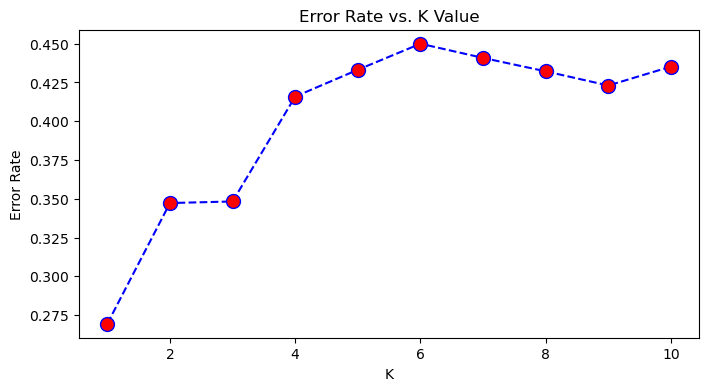

In [60]:
plt.figure(figsize=(8,4))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [61]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_np,y_train_np)

KNeighborsClassifier(n_neighbors=3)

In [62]:
y_pred_knn2=knn.predict(X_test_np)

In [63]:
# Test Accuracy of KNN Model
print(classification_report(y_test_np,y_pred_knn2))

              precision    recall  f1-score   support

           0       0.59      0.69      0.63       647
           1       0.61      0.48      0.54       656
           2       0.75      0.79      0.77       664

    accuracy                           0.65      1967
   macro avg       0.65      0.65      0.65      1967
weighted avg       0.65      0.65      0.65      1967



In [64]:
# Tuning the model

param_grid4 = {
    'n_neighbors': [3, 5, 7, 9],  # Test different values of k
    'weights': ['uniform', 'distance'],  # Uniform or distance-based weighting
    'p': [1, 2]  # L1 or L2 distance metric
}
grid3= GridSearchCV(estimator=knn, param_grid=param_grid4, scoring='accuracy', cv=5, verbose=1)

In [65]:
grid3.fit(X_sc,y)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'n_neighbors': [3, 5, 7, 9], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

In [66]:
print("Best Parameters of C & Verbose are:",grid3.best_params_)

Best Parameters of C & Verbose are: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


In [67]:
knnh=KNeighborsClassifier(n_neighbors= 3, p= 1, weights= 'uniform')
knnh.fit(X_train_np,y_train_np)

KNeighborsClassifier(n_neighbors=3, p=1)

In [68]:
y_pred_knnh2=knnh.predict(X_test_np)

In [69]:
# Test Accuracy of Tuned KNN Model
print(classification_report(y_test_np,y_pred_knnh2))

              precision    recall  f1-score   support

           0       0.63      0.74      0.68       647
           1       0.62      0.48      0.54       656
           2       0.76      0.79      0.78       664

    accuracy                           0.67      1967
   macro avg       0.67      0.67      0.67      1967
weighted avg       0.67      0.67      0.67      1967



# MODEL 7 - NEURAL NETWORK

In [83]:
from keras.models import Sequential
from keras.layers import LSTM,Dense


lstm_model = Sequential()
lstm_model.add(LSTM(100,input_shape=(X_train.shape[1],1),activation='relu',return_sequences=True))
lstm_model.add(LSTM(50,activation='relu',return_sequences=True))
lstm_model.add(LSTM(20,activation='relu'))
lstm_model.add(Dense(3,activation='softmax'))
lstm_model.summary()
# lstm 100,50,30 dense 10

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 26, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 26, 50)              │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 20)                  │           5,680 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │              63 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 76,743 (299.78 KB)

 Trainable params: 76,743 (299.78 KB)

 Non-trainable params: 0 (0.00 B)

In [71]:
lstm_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [72]:
nn = lstm_model.fit(X_train, y_train, validation_split=0.25,batch_size=150,epochs=120)

Epoch 1/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 266ms/step - accuracy: 0.2955 - loss: 1.1058 - val_accuracy: 0.4207 - val_loss: 1.0898
Epoch 2/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3843 - loss: 1.0900 - val_accuracy: 0.3780 - val_loss: 1.0972
Epoch 3/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3833 - loss: 1.0925 - val_accuracy: 0.3720 - val_loss: 1.1043
Epoch 4/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.3615 - loss: 1.0905 - val_accuracy: 0.3780 - val_loss: 1.0895
Epoch 5/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.3949 - loss: 1.0848 - val_accuracy: 0.3720 - val_loss: 1.0844
Epoch 6/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3894 - loss: 1.0826 - val_accuracy: 0.3841 - val_loss: 1.0876
Epoch 7/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3897 - loss: 1.0817 - val_accuracy: 0.3963 - val_loss: 1.0922
Epoch 8/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.3776 - loss: 1.0820 - val_accuracy: 0.4146 - val_loss

Epoch 52/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.6811 - loss: 0.7129 - val_accuracy: 0.6159 - val_loss: 0.6911
Epoch 53/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.7019 - loss: 0.6814 - val_accuracy: 0.6037 - val_loss: 0.7014
Epoch 54/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.6798 - loss: 0.7253 - val_accuracy: 0.5976 - val_loss: 0.7343
Epoch 55/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.6700 - loss: 0.7266 - val_accuracy: 0.5793 - val_loss: 0.6716
Epoch 56/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6371 - loss: 0.7394 - val_accuracy: 0.6585 - val_loss: 0.6384
Epoch 57/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6974 - loss: 0.7257 - val_accuracy: 0.6707 - val_loss: 0.6304
Epoch 58/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.6965 - loss: 0.7131 - val_accuracy: 0.6646 - val_loss: 0.6177
Epoch 59/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7325 - loss: 0.6504 - val_accuracy: 0.5427 - v

Epoch 103/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.6933 - loss: 0.7407 - val_accuracy: 0.6585 - val_loss: 0.7916
Epoch 104/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6885 - loss: 0.6593 - val_accuracy: 0.5549 - val_loss: 0.8798
Epoch 105/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.6673 - loss: 0.7208 - val_accuracy: 0.6951 - val_loss: 0.6236
Epoch 106/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.7362 - loss: 0.6274 - val_accuracy: 0.6707 - val_loss: 0.5587
Epoch 107/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.7597 - loss: 0.5719 - val_accuracy: 0.6646 - val_loss: 0.5967
Epoch 108/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.7495 - loss: 0.5517 - val_accuracy: 0.7500 - val_loss: 0.5282
Epoch 109/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.7696 - loss: 0.5147 - val_accuracy: 0.6768 - val_loss: 0.5323
Epoch 110/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.7619 - loss: 0.4919 - val_accuracy: 0.

In [73]:
# Test Accuracy of Neural Network Model
accuracy_test = lstm_model.evaluate(X_test,y_test,verbose=1)

62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7323 - loss: 0.7938


# MODEL COMPARISON

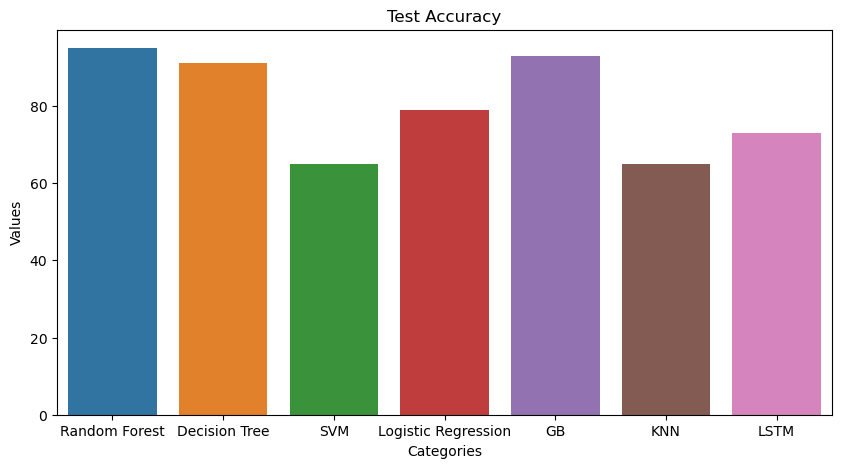

In [84]:
# comparison of models with their test accuracy
categories=['Random Forest','Decision Tree','SVM','Logistic Regression','GB','KNN','LSTM']
values=[95,91,65,79,93,65,73]

plt.figure(figsize=(10,5))
sns.barplot(x=categories,y=values)
plt.title('Test Accuracy')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.show()

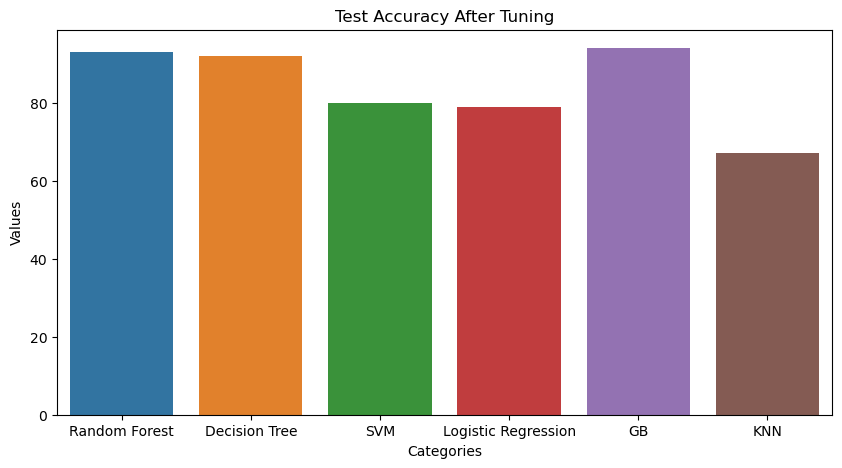

In [85]:
# comparison of tuned models with their test accuracy
categories=['Random Forest','Decision Tree','SVM','Logistic Regression','GB','KNN']
values=[93,92,80,79,94,67]

plt.figure(figsize=(10,5))
sns.barplot(x=categories,y=values)
plt.title('Test Accuracy After Tuning')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.show()

# Testing the Model

- from these models , GB shows high performance. so we are using GB model for testing

In [91]:
def Employee(a):
    an = gbh.predict(a)
    if an==0:
        print('Employee is good')
    elif an==1:
        print('Employee is Excellent')
    else:
        print('Employee is Outstanding')

In [92]:
Employee([[37,1,0,1,1,6,0,10,2,4,80,4,1,4,3,0,17,1,4,2,3,1,0,0,0,0]])

Employee is Excellent


In [93]:
Employee([[27,0,1,2,0,0,1,3,1,4,71,4,2,4,1,1,20,2,6,3,3,6,5,0,4,0]])

Employee is Outstanding


- the model showing correct accurate . hence it performs well